In [1]:
import os
import tensorflow as tf
import numpy as np
import pandas as pd
import pickle
import gzip
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import math
import cmath

# data path
path_csi =  'J:\\Data\\Wi-Fi_processed\\'
path_csi_hc = 'J:\\Data\\Wi-Fi_HC\\180_100\\'

# data info
df_info = pd.read_csv('data_subc_sig_v1.csv')
#df_info = df_info[df_info.id_person < 50]
df_info[(df_info.id_location==1)  & (df_info.id_direction==1)]

person_uid = np.unique(df_info['id_person'])
dict_id = dict(zip(person_uid,np.arange(len(person_uid))))

# parameters
max_value = np.max(df_info['max'].values)
#no_classes = len(np.unique(df_info['id_person']))
no_classes = len(dict_id)
csi_time = int(np.max(df_info['len']))
csi_subc = 30
input_shape = (csi_time, csi_subc, 6)

C:\Users\herok\Anaconda3\lib\site-packages\h5py\__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [2]:
# make data generator
def gen_csi(df_info,id_num,len_num):
    for file in np.unique(df_info.id.values):
        # read sample data
        # load and uncompress.
        with gzip.open(path_csi+file+'.pickle.gz','rb') as f:
            data1 = pickle.load(f)
        data1_diff = data1
        # zero pad
        pad_len = len_num - data1_diff.shape[0]
        data1_pad = np.pad(data1_diff,((0,pad_len),(0,0),(0,0),(0,0)),'constant',constant_values=0)

        # Label
        id_key = df_info[df_info.id==file]['id_person'].values[0].astype('int')
        data1_y = dict_id[id_key]

        yield(data1_pad ,data1_y)

In [3]:
gen = gen_csi(df_info,no_classes,csi_time)

In [4]:
csi,lab = next(gen)

In [5]:
csi.shape

(14960, 30, 2, 3)

In [6]:
lab

0

In [7]:
# 3D scan
m,n = 2,3
r = (160 + 160 + 164) * 0.01 # meter
d = 45 * 0.01 # meter
lam = 300 / 2450 #wavelength = 300 / frequency in MHz

In [8]:
r,d, lam

(4.84, 0.45, 0.12244897959183673)

In [9]:
target_sig = csi[:,0,:,:]
target_sig.shape

(14960, 2, 3)

In [10]:
theta,sigma = math.pi,math.pi

In [11]:
above_eq = 1j * (2*math.pi/lam) * math.sin(theta) * (n*d*math.cos(sigma) + m*d*math.sin(sigma))

In [12]:
def calc_p(target_sig,theta,sigma):
    sum_eq = np.complex(0)
    for i in range(m):
        for j in range(n):
            for k in range(csi_time):
                above_eq = 1j * (2*math.pi/lam) * math.sin(theta) * (n*d*math.cos(sigma) + m*d*math.sin(sigma))
                sum_eq += target_sig[k,i,j] * cmath.exp(above_eq)
    return(np.abs(sum_eq))

In [13]:
calc_p(target_sig,theta,sigma)

7580.4100005707305

In [14]:
sig_mat = np.zeros([30,100,100])

In [15]:
for subc in range(30):
    for i in range(100):
        for j in range(100):
            theta = i * math.pi / 100 
            sigma = j * math.pi / 100
            sig_mat[subc,i,j] = calc_p(csi[:,subc,:,:],theta,sigma)
            print((subc,i,j))

(0, 0, 0)
(0, 0, 1)
(0, 0, 2)
(0, 0, 3)
(0, 0, 4)
(0, 0, 5)
(0, 0, 6)
(0, 0, 7)
(0, 0, 8)
(0, 0, 9)
(0, 0, 10)
(0, 0, 11)
(0, 0, 12)
(0, 0, 13)
(0, 0, 14)
(0, 0, 15)
(0, 0, 16)
(0, 0, 17)
(0, 0, 18)
(0, 0, 19)
(0, 0, 20)
(0, 0, 21)
(0, 0, 22)
(0, 0, 23)
(0, 0, 24)
(0, 0, 25)
(0, 0, 26)
(0, 0, 27)
(0, 0, 28)
(0, 0, 29)
(0, 0, 30)
(0, 0, 31)
(0, 0, 32)
(0, 0, 33)
(0, 0, 34)
(0, 0, 35)
(0, 0, 36)
(0, 0, 37)
(0, 0, 38)
(0, 0, 39)
(0, 0, 40)
(0, 0, 41)
(0, 0, 42)
(0, 0, 43)
(0, 0, 44)
(0, 0, 45)
(0, 0, 46)
(0, 0, 47)
(0, 0, 48)
(0, 0, 49)
(0, 0, 50)
(0, 0, 51)
(0, 0, 52)
(0, 0, 53)
(0, 0, 54)
(0, 0, 55)
(0, 0, 56)
(0, 0, 57)
(0, 0, 58)
(0, 0, 59)
(0, 0, 60)
(0, 0, 61)
(0, 0, 62)
(0, 0, 63)
(0, 0, 64)
(0, 0, 65)
(0, 0, 66)
(0, 0, 67)
(0, 0, 68)
(0, 0, 69)
(0, 0, 70)
(0, 0, 71)
(0, 0, 72)
(0, 0, 73)
(0, 0, 74)
(0, 0, 75)
(0, 0, 76)
(0, 0, 77)
(0, 0, 78)
(0, 0, 79)
(0, 0, 80)
(0, 0, 81)
(0, 0, 82)
(0, 0, 83)
(0, 0, 84)
(0, 0, 85)
(0, 0, 86)
(0, 0, 87)
(0, 0, 88)
(0, 0, 89)
(0, 0, 90)
(0, 0, 91

(0, 7, 53)
(0, 7, 54)
(0, 7, 55)
(0, 7, 56)
(0, 7, 57)
(0, 7, 58)
(0, 7, 59)
(0, 7, 60)
(0, 7, 61)
(0, 7, 62)
(0, 7, 63)
(0, 7, 64)
(0, 7, 65)
(0, 7, 66)
(0, 7, 67)
(0, 7, 68)
(0, 7, 69)
(0, 7, 70)
(0, 7, 71)
(0, 7, 72)
(0, 7, 73)
(0, 7, 74)
(0, 7, 75)
(0, 7, 76)
(0, 7, 77)
(0, 7, 78)
(0, 7, 79)
(0, 7, 80)
(0, 7, 81)
(0, 7, 82)
(0, 7, 83)
(0, 7, 84)
(0, 7, 85)
(0, 7, 86)
(0, 7, 87)
(0, 7, 88)
(0, 7, 89)
(0, 7, 90)
(0, 7, 91)
(0, 7, 92)
(0, 7, 93)
(0, 7, 94)
(0, 7, 95)
(0, 7, 96)
(0, 7, 97)
(0, 7, 98)
(0, 7, 99)
(0, 8, 0)
(0, 8, 1)
(0, 8, 2)
(0, 8, 3)
(0, 8, 4)
(0, 8, 5)
(0, 8, 6)
(0, 8, 7)
(0, 8, 8)
(0, 8, 9)
(0, 8, 10)
(0, 8, 11)
(0, 8, 12)
(0, 8, 13)
(0, 8, 14)
(0, 8, 15)
(0, 8, 16)
(0, 8, 17)
(0, 8, 18)
(0, 8, 19)
(0, 8, 20)
(0, 8, 21)
(0, 8, 22)
(0, 8, 23)
(0, 8, 24)
(0, 8, 25)
(0, 8, 26)
(0, 8, 27)
(0, 8, 28)
(0, 8, 29)
(0, 8, 30)
(0, 8, 31)
(0, 8, 32)
(0, 8, 33)
(0, 8, 34)
(0, 8, 35)
(0, 8, 36)
(0, 8, 37)
(0, 8, 38)
(0, 8, 39)
(0, 8, 40)
(0, 8, 41)
(0, 8, 42)
(0, 8, 43)
(0, 8, 44

(0, 14, 63)
(0, 14, 64)
(0, 14, 65)
(0, 14, 66)
(0, 14, 67)
(0, 14, 68)
(0, 14, 69)
(0, 14, 70)
(0, 14, 71)
(0, 14, 72)
(0, 14, 73)
(0, 14, 74)
(0, 14, 75)
(0, 14, 76)
(0, 14, 77)
(0, 14, 78)
(0, 14, 79)
(0, 14, 80)
(0, 14, 81)
(0, 14, 82)
(0, 14, 83)
(0, 14, 84)
(0, 14, 85)
(0, 14, 86)
(0, 14, 87)
(0, 14, 88)
(0, 14, 89)
(0, 14, 90)
(0, 14, 91)
(0, 14, 92)
(0, 14, 93)
(0, 14, 94)
(0, 14, 95)
(0, 14, 96)
(0, 14, 97)
(0, 14, 98)
(0, 14, 99)
(0, 15, 0)
(0, 15, 1)
(0, 15, 2)
(0, 15, 3)
(0, 15, 4)
(0, 15, 5)
(0, 15, 6)
(0, 15, 7)
(0, 15, 8)
(0, 15, 9)
(0, 15, 10)
(0, 15, 11)
(0, 15, 12)
(0, 15, 13)
(0, 15, 14)
(0, 15, 15)
(0, 15, 16)
(0, 15, 17)
(0, 15, 18)
(0, 15, 19)
(0, 15, 20)
(0, 15, 21)
(0, 15, 22)
(0, 15, 23)
(0, 15, 24)
(0, 15, 25)
(0, 15, 26)
(0, 15, 27)
(0, 15, 28)
(0, 15, 29)
(0, 15, 30)
(0, 15, 31)
(0, 15, 32)
(0, 15, 33)
(0, 15, 34)
(0, 15, 35)
(0, 15, 36)
(0, 15, 37)
(0, 15, 38)
(0, 15, 39)
(0, 15, 40)
(0, 15, 41)
(0, 15, 42)
(0, 15, 43)
(0, 15, 44)
(0, 15, 45)
(0, 15, 46)
(0

(0, 21, 52)
(0, 21, 53)
(0, 21, 54)
(0, 21, 55)
(0, 21, 56)
(0, 21, 57)
(0, 21, 58)
(0, 21, 59)
(0, 21, 60)
(0, 21, 61)
(0, 21, 62)
(0, 21, 63)
(0, 21, 64)
(0, 21, 65)
(0, 21, 66)
(0, 21, 67)
(0, 21, 68)
(0, 21, 69)
(0, 21, 70)
(0, 21, 71)
(0, 21, 72)
(0, 21, 73)
(0, 21, 74)
(0, 21, 75)
(0, 21, 76)
(0, 21, 77)
(0, 21, 78)
(0, 21, 79)
(0, 21, 80)
(0, 21, 81)
(0, 21, 82)
(0, 21, 83)
(0, 21, 84)
(0, 21, 85)
(0, 21, 86)
(0, 21, 87)
(0, 21, 88)
(0, 21, 89)
(0, 21, 90)
(0, 21, 91)
(0, 21, 92)
(0, 21, 93)
(0, 21, 94)
(0, 21, 95)
(0, 21, 96)
(0, 21, 97)
(0, 21, 98)
(0, 21, 99)
(0, 22, 0)
(0, 22, 1)
(0, 22, 2)
(0, 22, 3)
(0, 22, 4)
(0, 22, 5)
(0, 22, 6)
(0, 22, 7)
(0, 22, 8)
(0, 22, 9)
(0, 22, 10)
(0, 22, 11)
(0, 22, 12)
(0, 22, 13)
(0, 22, 14)
(0, 22, 15)
(0, 22, 16)
(0, 22, 17)
(0, 22, 18)
(0, 22, 19)
(0, 22, 20)
(0, 22, 21)
(0, 22, 22)
(0, 22, 23)
(0, 22, 24)
(0, 22, 25)
(0, 22, 26)
(0, 22, 27)
(0, 22, 28)
(0, 22, 29)
(0, 22, 30)
(0, 22, 31)
(0, 22, 32)
(0, 22, 33)
(0, 22, 34)
(0, 22, 35)
(0

(0, 28, 42)
(0, 28, 43)
(0, 28, 44)
(0, 28, 45)
(0, 28, 46)
(0, 28, 47)
(0, 28, 48)
(0, 28, 49)
(0, 28, 50)
(0, 28, 51)
(0, 28, 52)
(0, 28, 53)
(0, 28, 54)
(0, 28, 55)
(0, 28, 56)
(0, 28, 57)
(0, 28, 58)
(0, 28, 59)
(0, 28, 60)
(0, 28, 61)
(0, 28, 62)
(0, 28, 63)
(0, 28, 64)
(0, 28, 65)
(0, 28, 66)
(0, 28, 67)
(0, 28, 68)
(0, 28, 69)
(0, 28, 70)
(0, 28, 71)
(0, 28, 72)
(0, 28, 73)
(0, 28, 74)
(0, 28, 75)
(0, 28, 76)
(0, 28, 77)
(0, 28, 78)
(0, 28, 79)
(0, 28, 80)
(0, 28, 81)
(0, 28, 82)
(0, 28, 83)
(0, 28, 84)
(0, 28, 85)
(0, 28, 86)
(0, 28, 87)
(0, 28, 88)
(0, 28, 89)
(0, 28, 90)
(0, 28, 91)
(0, 28, 92)
(0, 28, 93)
(0, 28, 94)
(0, 28, 95)
(0, 28, 96)
(0, 28, 97)
(0, 28, 98)
(0, 28, 99)
(0, 29, 0)
(0, 29, 1)
(0, 29, 2)
(0, 29, 3)
(0, 29, 4)
(0, 29, 5)
(0, 29, 6)
(0, 29, 7)
(0, 29, 8)
(0, 29, 9)
(0, 29, 10)
(0, 29, 11)
(0, 29, 12)
(0, 29, 13)
(0, 29, 14)
(0, 29, 15)
(0, 29, 16)
(0, 29, 17)
(0, 29, 18)
(0, 29, 19)
(0, 29, 20)
(0, 29, 21)
(0, 29, 22)
(0, 29, 23)
(0, 29, 24)
(0, 29, 25)
(0

(0, 35, 31)
(0, 35, 32)
(0, 35, 33)
(0, 35, 34)
(0, 35, 35)
(0, 35, 36)
(0, 35, 37)
(0, 35, 38)
(0, 35, 39)
(0, 35, 40)
(0, 35, 41)
(0, 35, 42)
(0, 35, 43)
(0, 35, 44)
(0, 35, 45)
(0, 35, 46)
(0, 35, 47)
(0, 35, 48)
(0, 35, 49)
(0, 35, 50)
(0, 35, 51)
(0, 35, 52)
(0, 35, 53)
(0, 35, 54)
(0, 35, 55)
(0, 35, 56)
(0, 35, 57)
(0, 35, 58)
(0, 35, 59)
(0, 35, 60)
(0, 35, 61)
(0, 35, 62)
(0, 35, 63)
(0, 35, 64)
(0, 35, 65)
(0, 35, 66)
(0, 35, 67)
(0, 35, 68)
(0, 35, 69)
(0, 35, 70)
(0, 35, 71)
(0, 35, 72)
(0, 35, 73)
(0, 35, 74)
(0, 35, 75)
(0, 35, 76)
(0, 35, 77)
(0, 35, 78)
(0, 35, 79)
(0, 35, 80)
(0, 35, 81)
(0, 35, 82)
(0, 35, 83)
(0, 35, 84)
(0, 35, 85)
(0, 35, 86)
(0, 35, 87)
(0, 35, 88)
(0, 35, 89)
(0, 35, 90)
(0, 35, 91)
(0, 35, 92)
(0, 35, 93)
(0, 35, 94)
(0, 35, 95)
(0, 35, 96)
(0, 35, 97)
(0, 35, 98)
(0, 35, 99)
(0, 36, 0)
(0, 36, 1)
(0, 36, 2)
(0, 36, 3)
(0, 36, 4)
(0, 36, 5)
(0, 36, 6)
(0, 36, 7)
(0, 36, 8)
(0, 36, 9)
(0, 36, 10)
(0, 36, 11)
(0, 36, 12)
(0, 36, 13)
(0, 36, 14)
(0

(0, 42, 21)
(0, 42, 22)
(0, 42, 23)
(0, 42, 24)
(0, 42, 25)
(0, 42, 26)
(0, 42, 27)
(0, 42, 28)
(0, 42, 29)
(0, 42, 30)
(0, 42, 31)
(0, 42, 32)
(0, 42, 33)
(0, 42, 34)
(0, 42, 35)
(0, 42, 36)
(0, 42, 37)
(0, 42, 38)
(0, 42, 39)
(0, 42, 40)
(0, 42, 41)
(0, 42, 42)
(0, 42, 43)
(0, 42, 44)
(0, 42, 45)
(0, 42, 46)
(0, 42, 47)
(0, 42, 48)
(0, 42, 49)
(0, 42, 50)
(0, 42, 51)
(0, 42, 52)
(0, 42, 53)
(0, 42, 54)
(0, 42, 55)
(0, 42, 56)
(0, 42, 57)
(0, 42, 58)
(0, 42, 59)
(0, 42, 60)
(0, 42, 61)
(0, 42, 62)
(0, 42, 63)
(0, 42, 64)
(0, 42, 65)
(0, 42, 66)
(0, 42, 67)
(0, 42, 68)
(0, 42, 69)
(0, 42, 70)
(0, 42, 71)
(0, 42, 72)
(0, 42, 73)
(0, 42, 74)
(0, 42, 75)
(0, 42, 76)
(0, 42, 77)
(0, 42, 78)
(0, 42, 79)
(0, 42, 80)
(0, 42, 81)
(0, 42, 82)
(0, 42, 83)
(0, 42, 84)
(0, 42, 85)
(0, 42, 86)
(0, 42, 87)
(0, 42, 88)
(0, 42, 89)
(0, 42, 90)
(0, 42, 91)
(0, 42, 92)
(0, 42, 93)
(0, 42, 94)
(0, 42, 95)
(0, 42, 96)
(0, 42, 97)
(0, 42, 98)
(0, 42, 99)
(0, 43, 0)
(0, 43, 1)
(0, 43, 2)
(0, 43, 3)
(0, 43, 

(0, 49, 11)
(0, 49, 12)
(0, 49, 13)
(0, 49, 14)
(0, 49, 15)
(0, 49, 16)
(0, 49, 17)
(0, 49, 18)
(0, 49, 19)
(0, 49, 20)
(0, 49, 21)
(0, 49, 22)
(0, 49, 23)
(0, 49, 24)
(0, 49, 25)
(0, 49, 26)
(0, 49, 27)
(0, 49, 28)
(0, 49, 29)
(0, 49, 30)
(0, 49, 31)
(0, 49, 32)
(0, 49, 33)
(0, 49, 34)
(0, 49, 35)
(0, 49, 36)
(0, 49, 37)
(0, 49, 38)
(0, 49, 39)
(0, 49, 40)
(0, 49, 41)
(0, 49, 42)
(0, 49, 43)
(0, 49, 44)
(0, 49, 45)
(0, 49, 46)
(0, 49, 47)
(0, 49, 48)
(0, 49, 49)
(0, 49, 50)
(0, 49, 51)
(0, 49, 52)
(0, 49, 53)
(0, 49, 54)
(0, 49, 55)
(0, 49, 56)
(0, 49, 57)
(0, 49, 58)
(0, 49, 59)
(0, 49, 60)
(0, 49, 61)
(0, 49, 62)
(0, 49, 63)
(0, 49, 64)
(0, 49, 65)
(0, 49, 66)
(0, 49, 67)
(0, 49, 68)
(0, 49, 69)
(0, 49, 70)
(0, 49, 71)
(0, 49, 72)
(0, 49, 73)
(0, 49, 74)
(0, 49, 75)
(0, 49, 76)
(0, 49, 77)
(0, 49, 78)
(0, 49, 79)
(0, 49, 80)
(0, 49, 81)
(0, 49, 82)
(0, 49, 83)
(0, 49, 84)
(0, 49, 85)
(0, 49, 86)
(0, 49, 87)
(0, 49, 88)
(0, 49, 89)
(0, 49, 90)
(0, 49, 91)
(0, 49, 92)
(0, 49, 93)
(0, 

(0, 55, 99)
(0, 56, 0)
(0, 56, 1)
(0, 56, 2)
(0, 56, 3)
(0, 56, 4)
(0, 56, 5)
(0, 56, 6)
(0, 56, 7)
(0, 56, 8)
(0, 56, 9)
(0, 56, 10)
(0, 56, 11)
(0, 56, 12)
(0, 56, 13)
(0, 56, 14)
(0, 56, 15)
(0, 56, 16)
(0, 56, 17)
(0, 56, 18)
(0, 56, 19)
(0, 56, 20)
(0, 56, 21)
(0, 56, 22)
(0, 56, 23)
(0, 56, 24)
(0, 56, 25)
(0, 56, 26)
(0, 56, 27)
(0, 56, 28)
(0, 56, 29)
(0, 56, 30)
(0, 56, 31)
(0, 56, 32)
(0, 56, 33)
(0, 56, 34)
(0, 56, 35)
(0, 56, 36)
(0, 56, 37)
(0, 56, 38)
(0, 56, 39)
(0, 56, 40)
(0, 56, 41)
(0, 56, 42)
(0, 56, 43)
(0, 56, 44)
(0, 56, 45)
(0, 56, 46)
(0, 56, 47)
(0, 56, 48)
(0, 56, 49)
(0, 56, 50)
(0, 56, 51)
(0, 56, 52)
(0, 56, 53)
(0, 56, 54)
(0, 56, 55)
(0, 56, 56)
(0, 56, 57)
(0, 56, 58)
(0, 56, 59)
(0, 56, 60)
(0, 56, 61)
(0, 56, 62)
(0, 56, 63)
(0, 56, 64)
(0, 56, 65)
(0, 56, 66)
(0, 56, 67)
(0, 56, 68)
(0, 56, 69)
(0, 56, 70)
(0, 56, 71)
(0, 56, 72)
(0, 56, 73)
(0, 56, 74)
(0, 56, 75)
(0, 56, 76)
(0, 56, 77)
(0, 56, 78)
(0, 56, 79)
(0, 56, 80)
(0, 56, 81)
(0, 56, 82)
(0

(0, 62, 88)
(0, 62, 89)
(0, 62, 90)
(0, 62, 91)
(0, 62, 92)
(0, 62, 93)
(0, 62, 94)
(0, 62, 95)
(0, 62, 96)
(0, 62, 97)
(0, 62, 98)
(0, 62, 99)
(0, 63, 0)
(0, 63, 1)
(0, 63, 2)
(0, 63, 3)
(0, 63, 4)
(0, 63, 5)
(0, 63, 6)
(0, 63, 7)
(0, 63, 8)
(0, 63, 9)
(0, 63, 10)
(0, 63, 11)
(0, 63, 12)
(0, 63, 13)
(0, 63, 14)
(0, 63, 15)
(0, 63, 16)
(0, 63, 17)
(0, 63, 18)
(0, 63, 19)
(0, 63, 20)
(0, 63, 21)
(0, 63, 22)
(0, 63, 23)
(0, 63, 24)
(0, 63, 25)
(0, 63, 26)
(0, 63, 27)
(0, 63, 28)
(0, 63, 29)
(0, 63, 30)
(0, 63, 31)
(0, 63, 32)
(0, 63, 33)
(0, 63, 34)
(0, 63, 35)
(0, 63, 36)
(0, 63, 37)
(0, 63, 38)
(0, 63, 39)
(0, 63, 40)
(0, 63, 41)
(0, 63, 42)
(0, 63, 43)
(0, 63, 44)
(0, 63, 45)
(0, 63, 46)
(0, 63, 47)
(0, 63, 48)
(0, 63, 49)
(0, 63, 50)
(0, 63, 51)
(0, 63, 52)
(0, 63, 53)
(0, 63, 54)
(0, 63, 55)
(0, 63, 56)
(0, 63, 57)
(0, 63, 58)
(0, 63, 59)
(0, 63, 60)
(0, 63, 61)
(0, 63, 62)
(0, 63, 63)
(0, 63, 64)
(0, 63, 65)
(0, 63, 66)
(0, 63, 67)
(0, 63, 68)
(0, 63, 69)
(0, 63, 70)
(0, 63, 71)
(0

(0, 69, 78)
(0, 69, 79)
(0, 69, 80)
(0, 69, 81)
(0, 69, 82)
(0, 69, 83)
(0, 69, 84)
(0, 69, 85)
(0, 69, 86)
(0, 69, 87)
(0, 69, 88)
(0, 69, 89)
(0, 69, 90)
(0, 69, 91)
(0, 69, 92)
(0, 69, 93)
(0, 69, 94)
(0, 69, 95)
(0, 69, 96)
(0, 69, 97)
(0, 69, 98)
(0, 69, 99)
(0, 70, 0)
(0, 70, 1)
(0, 70, 2)
(0, 70, 3)
(0, 70, 4)
(0, 70, 5)
(0, 70, 6)
(0, 70, 7)
(0, 70, 8)
(0, 70, 9)
(0, 70, 10)
(0, 70, 11)
(0, 70, 12)
(0, 70, 13)
(0, 70, 14)
(0, 70, 15)
(0, 70, 16)
(0, 70, 17)
(0, 70, 18)
(0, 70, 19)
(0, 70, 20)
(0, 70, 21)
(0, 70, 22)
(0, 70, 23)
(0, 70, 24)
(0, 70, 25)
(0, 70, 26)
(0, 70, 27)
(0, 70, 28)
(0, 70, 29)
(0, 70, 30)
(0, 70, 31)
(0, 70, 32)
(0, 70, 33)
(0, 70, 34)
(0, 70, 35)
(0, 70, 36)
(0, 70, 37)
(0, 70, 38)
(0, 70, 39)
(0, 70, 40)
(0, 70, 41)
(0, 70, 42)
(0, 70, 43)
(0, 70, 44)
(0, 70, 45)
(0, 70, 46)
(0, 70, 47)
(0, 70, 48)
(0, 70, 49)
(0, 70, 50)
(0, 70, 51)
(0, 70, 52)
(0, 70, 53)
(0, 70, 54)
(0, 70, 55)
(0, 70, 56)
(0, 70, 57)
(0, 70, 58)
(0, 70, 59)
(0, 70, 60)
(0, 70, 61)
(0

(0, 76, 68)
(0, 76, 69)
(0, 76, 70)
(0, 76, 71)
(0, 76, 72)
(0, 76, 73)
(0, 76, 74)
(0, 76, 75)
(0, 76, 76)
(0, 76, 77)
(0, 76, 78)
(0, 76, 79)
(0, 76, 80)
(0, 76, 81)
(0, 76, 82)
(0, 76, 83)
(0, 76, 84)
(0, 76, 85)
(0, 76, 86)
(0, 76, 87)
(0, 76, 88)
(0, 76, 89)
(0, 76, 90)
(0, 76, 91)
(0, 76, 92)
(0, 76, 93)
(0, 76, 94)
(0, 76, 95)
(0, 76, 96)
(0, 76, 97)
(0, 76, 98)
(0, 76, 99)
(0, 77, 0)
(0, 77, 1)
(0, 77, 2)
(0, 77, 3)
(0, 77, 4)
(0, 77, 5)
(0, 77, 6)
(0, 77, 7)
(0, 77, 8)
(0, 77, 9)
(0, 77, 10)
(0, 77, 11)
(0, 77, 12)
(0, 77, 13)
(0, 77, 14)
(0, 77, 15)
(0, 77, 16)
(0, 77, 17)
(0, 77, 18)
(0, 77, 19)
(0, 77, 20)
(0, 77, 21)
(0, 77, 22)
(0, 77, 23)
(0, 77, 24)
(0, 77, 25)
(0, 77, 26)
(0, 77, 27)
(0, 77, 28)
(0, 77, 29)
(0, 77, 30)
(0, 77, 31)
(0, 77, 32)
(0, 77, 33)
(0, 77, 34)
(0, 77, 35)
(0, 77, 36)
(0, 77, 37)
(0, 77, 38)
(0, 77, 39)
(0, 77, 40)
(0, 77, 41)
(0, 77, 42)
(0, 77, 43)
(0, 77, 44)
(0, 77, 45)
(0, 77, 46)
(0, 77, 47)
(0, 77, 48)
(0, 77, 49)
(0, 77, 50)
(0, 77, 51)
(0

(0, 83, 57)
(0, 83, 58)
(0, 83, 59)
(0, 83, 60)
(0, 83, 61)
(0, 83, 62)
(0, 83, 63)
(0, 83, 64)
(0, 83, 65)
(0, 83, 66)
(0, 83, 67)
(0, 83, 68)
(0, 83, 69)
(0, 83, 70)
(0, 83, 71)
(0, 83, 72)
(0, 83, 73)
(0, 83, 74)
(0, 83, 75)
(0, 83, 76)
(0, 83, 77)
(0, 83, 78)
(0, 83, 79)
(0, 83, 80)
(0, 83, 81)
(0, 83, 82)
(0, 83, 83)
(0, 83, 84)
(0, 83, 85)
(0, 83, 86)
(0, 83, 87)
(0, 83, 88)
(0, 83, 89)
(0, 83, 90)
(0, 83, 91)
(0, 83, 92)
(0, 83, 93)
(0, 83, 94)
(0, 83, 95)
(0, 83, 96)
(0, 83, 97)
(0, 83, 98)
(0, 83, 99)
(0, 84, 0)
(0, 84, 1)
(0, 84, 2)
(0, 84, 3)
(0, 84, 4)
(0, 84, 5)
(0, 84, 6)
(0, 84, 7)
(0, 84, 8)
(0, 84, 9)
(0, 84, 10)
(0, 84, 11)
(0, 84, 12)
(0, 84, 13)
(0, 84, 14)
(0, 84, 15)
(0, 84, 16)
(0, 84, 17)
(0, 84, 18)
(0, 84, 19)
(0, 84, 20)
(0, 84, 21)
(0, 84, 22)
(0, 84, 23)
(0, 84, 24)
(0, 84, 25)
(0, 84, 26)
(0, 84, 27)
(0, 84, 28)
(0, 84, 29)
(0, 84, 30)
(0, 84, 31)
(0, 84, 32)
(0, 84, 33)
(0, 84, 34)
(0, 84, 35)
(0, 84, 36)
(0, 84, 37)
(0, 84, 38)
(0, 84, 39)
(0, 84, 40)
(0

(0, 90, 46)
(0, 90, 47)
(0, 90, 48)
(0, 90, 49)
(0, 90, 50)
(0, 90, 51)
(0, 90, 52)
(0, 90, 53)
(0, 90, 54)
(0, 90, 55)
(0, 90, 56)
(0, 90, 57)
(0, 90, 58)
(0, 90, 59)
(0, 90, 60)
(0, 90, 61)
(0, 90, 62)
(0, 90, 63)
(0, 90, 64)
(0, 90, 65)
(0, 90, 66)
(0, 90, 67)
(0, 90, 68)
(0, 90, 69)
(0, 90, 70)
(0, 90, 71)
(0, 90, 72)
(0, 90, 73)
(0, 90, 74)
(0, 90, 75)
(0, 90, 76)
(0, 90, 77)
(0, 90, 78)
(0, 90, 79)
(0, 90, 80)
(0, 90, 81)
(0, 90, 82)
(0, 90, 83)
(0, 90, 84)
(0, 90, 85)
(0, 90, 86)
(0, 90, 87)
(0, 90, 88)
(0, 90, 89)
(0, 90, 90)
(0, 90, 91)
(0, 90, 92)
(0, 90, 93)
(0, 90, 94)
(0, 90, 95)
(0, 90, 96)
(0, 90, 97)
(0, 90, 98)
(0, 90, 99)
(0, 91, 0)
(0, 91, 1)
(0, 91, 2)
(0, 91, 3)
(0, 91, 4)
(0, 91, 5)
(0, 91, 6)
(0, 91, 7)
(0, 91, 8)
(0, 91, 9)
(0, 91, 10)
(0, 91, 11)
(0, 91, 12)
(0, 91, 13)
(0, 91, 14)
(0, 91, 15)
(0, 91, 16)
(0, 91, 17)
(0, 91, 18)
(0, 91, 19)
(0, 91, 20)
(0, 91, 21)
(0, 91, 22)
(0, 91, 23)
(0, 91, 24)
(0, 91, 25)
(0, 91, 26)
(0, 91, 27)
(0, 91, 28)
(0, 91, 29)
(0

(0, 97, 36)
(0, 97, 37)
(0, 97, 38)
(0, 97, 39)
(0, 97, 40)
(0, 97, 41)
(0, 97, 42)
(0, 97, 43)
(0, 97, 44)
(0, 97, 45)
(0, 97, 46)
(0, 97, 47)
(0, 97, 48)
(0, 97, 49)
(0, 97, 50)
(0, 97, 51)
(0, 97, 52)
(0, 97, 53)
(0, 97, 54)
(0, 97, 55)
(0, 97, 56)
(0, 97, 57)
(0, 97, 58)
(0, 97, 59)
(0, 97, 60)
(0, 97, 61)
(0, 97, 62)
(0, 97, 63)
(0, 97, 64)
(0, 97, 65)
(0, 97, 66)
(0, 97, 67)
(0, 97, 68)
(0, 97, 69)
(0, 97, 70)
(0, 97, 71)
(0, 97, 72)
(0, 97, 73)
(0, 97, 74)
(0, 97, 75)
(0, 97, 76)
(0, 97, 77)
(0, 97, 78)
(0, 97, 79)
(0, 97, 80)
(0, 97, 81)
(0, 97, 82)
(0, 97, 83)
(0, 97, 84)
(0, 97, 85)
(0, 97, 86)
(0, 97, 87)
(0, 97, 88)
(0, 97, 89)
(0, 97, 90)
(0, 97, 91)
(0, 97, 92)
(0, 97, 93)
(0, 97, 94)
(0, 97, 95)
(0, 97, 96)
(0, 97, 97)
(0, 97, 98)
(0, 97, 99)
(0, 98, 0)
(0, 98, 1)
(0, 98, 2)
(0, 98, 3)
(0, 98, 4)
(0, 98, 5)
(0, 98, 6)
(0, 98, 7)
(0, 98, 8)
(0, 98, 9)
(0, 98, 10)
(0, 98, 11)
(0, 98, 12)
(0, 98, 13)
(0, 98, 14)
(0, 98, 15)
(0, 98, 16)
(0, 98, 17)
(0, 98, 18)
(0, 98, 19)
(0

(1, 4, 65)
(1, 4, 66)
(1, 4, 67)
(1, 4, 68)
(1, 4, 69)
(1, 4, 70)
(1, 4, 71)
(1, 4, 72)
(1, 4, 73)
(1, 4, 74)
(1, 4, 75)
(1, 4, 76)
(1, 4, 77)
(1, 4, 78)
(1, 4, 79)
(1, 4, 80)
(1, 4, 81)
(1, 4, 82)
(1, 4, 83)
(1, 4, 84)
(1, 4, 85)
(1, 4, 86)
(1, 4, 87)
(1, 4, 88)
(1, 4, 89)
(1, 4, 90)
(1, 4, 91)
(1, 4, 92)
(1, 4, 93)
(1, 4, 94)
(1, 4, 95)
(1, 4, 96)
(1, 4, 97)
(1, 4, 98)
(1, 4, 99)
(1, 5, 0)
(1, 5, 1)
(1, 5, 2)
(1, 5, 3)
(1, 5, 4)
(1, 5, 5)
(1, 5, 6)
(1, 5, 7)
(1, 5, 8)
(1, 5, 9)
(1, 5, 10)
(1, 5, 11)
(1, 5, 12)
(1, 5, 13)
(1, 5, 14)
(1, 5, 15)
(1, 5, 16)
(1, 5, 17)
(1, 5, 18)
(1, 5, 19)
(1, 5, 20)
(1, 5, 21)
(1, 5, 22)
(1, 5, 23)
(1, 5, 24)
(1, 5, 25)
(1, 5, 26)
(1, 5, 27)
(1, 5, 28)
(1, 5, 29)
(1, 5, 30)
(1, 5, 31)
(1, 5, 32)
(1, 5, 33)
(1, 5, 34)
(1, 5, 35)
(1, 5, 36)
(1, 5, 37)
(1, 5, 38)
(1, 5, 39)
(1, 5, 40)
(1, 5, 41)
(1, 5, 42)
(1, 5, 43)
(1, 5, 44)
(1, 5, 45)
(1, 5, 46)
(1, 5, 47)
(1, 5, 48)
(1, 5, 49)
(1, 5, 50)
(1, 5, 51)
(1, 5, 52)
(1, 5, 53)
(1, 5, 54)
(1, 5, 55)
(1, 5, 56

(1, 12, 0)
(1, 12, 1)
(1, 12, 2)
(1, 12, 3)
(1, 12, 4)
(1, 12, 5)
(1, 12, 6)
(1, 12, 7)
(1, 12, 8)
(1, 12, 9)
(1, 12, 10)
(1, 12, 11)
(1, 12, 12)
(1, 12, 13)
(1, 12, 14)
(1, 12, 15)
(1, 12, 16)
(1, 12, 17)
(1, 12, 18)
(1, 12, 19)
(1, 12, 20)
(1, 12, 21)
(1, 12, 22)
(1, 12, 23)
(1, 12, 24)
(1, 12, 25)
(1, 12, 26)
(1, 12, 27)
(1, 12, 28)
(1, 12, 29)
(1, 12, 30)
(1, 12, 31)
(1, 12, 32)
(1, 12, 33)
(1, 12, 34)
(1, 12, 35)
(1, 12, 36)
(1, 12, 37)
(1, 12, 38)
(1, 12, 39)
(1, 12, 40)
(1, 12, 41)
(1, 12, 42)
(1, 12, 43)
(1, 12, 44)
(1, 12, 45)
(1, 12, 46)
(1, 12, 47)
(1, 12, 48)
(1, 12, 49)
(1, 12, 50)
(1, 12, 51)
(1, 12, 52)
(1, 12, 53)
(1, 12, 54)
(1, 12, 55)
(1, 12, 56)
(1, 12, 57)
(1, 12, 58)
(1, 12, 59)
(1, 12, 60)
(1, 12, 61)
(1, 12, 62)
(1, 12, 63)
(1, 12, 64)
(1, 12, 65)
(1, 12, 66)
(1, 12, 67)
(1, 12, 68)
(1, 12, 69)
(1, 12, 70)
(1, 12, 71)
(1, 12, 72)
(1, 12, 73)
(1, 12, 74)
(1, 12, 75)
(1, 12, 76)
(1, 12, 77)
(1, 12, 78)
(1, 12, 79)
(1, 12, 80)
(1, 12, 81)
(1, 12, 82)
(1, 12, 83)
(1

(1, 18, 90)
(1, 18, 91)
(1, 18, 92)
(1, 18, 93)
(1, 18, 94)
(1, 18, 95)
(1, 18, 96)
(1, 18, 97)
(1, 18, 98)
(1, 18, 99)
(1, 19, 0)
(1, 19, 1)
(1, 19, 2)
(1, 19, 3)
(1, 19, 4)
(1, 19, 5)
(1, 19, 6)
(1, 19, 7)
(1, 19, 8)
(1, 19, 9)
(1, 19, 10)
(1, 19, 11)
(1, 19, 12)
(1, 19, 13)
(1, 19, 14)
(1, 19, 15)
(1, 19, 16)
(1, 19, 17)
(1, 19, 18)
(1, 19, 19)
(1, 19, 20)
(1, 19, 21)
(1, 19, 22)
(1, 19, 23)
(1, 19, 24)
(1, 19, 25)
(1, 19, 26)
(1, 19, 27)
(1, 19, 28)
(1, 19, 29)
(1, 19, 30)
(1, 19, 31)
(1, 19, 32)
(1, 19, 33)
(1, 19, 34)
(1, 19, 35)
(1, 19, 36)
(1, 19, 37)
(1, 19, 38)
(1, 19, 39)
(1, 19, 40)
(1, 19, 41)
(1, 19, 42)
(1, 19, 43)
(1, 19, 44)
(1, 19, 45)
(1, 19, 46)
(1, 19, 47)
(1, 19, 48)
(1, 19, 49)
(1, 19, 50)
(1, 19, 51)
(1, 19, 52)
(1, 19, 53)
(1, 19, 54)
(1, 19, 55)
(1, 19, 56)
(1, 19, 57)
(1, 19, 58)
(1, 19, 59)
(1, 19, 60)
(1, 19, 61)
(1, 19, 62)
(1, 19, 63)
(1, 19, 64)
(1, 19, 65)
(1, 19, 66)
(1, 19, 67)
(1, 19, 68)
(1, 19, 69)
(1, 19, 70)
(1, 19, 71)
(1, 19, 72)
(1, 19, 73)
(1

(1, 25, 80)
(1, 25, 81)
(1, 25, 82)
(1, 25, 83)
(1, 25, 84)
(1, 25, 85)
(1, 25, 86)
(1, 25, 87)
(1, 25, 88)
(1, 25, 89)
(1, 25, 90)
(1, 25, 91)
(1, 25, 92)
(1, 25, 93)
(1, 25, 94)
(1, 25, 95)
(1, 25, 96)
(1, 25, 97)
(1, 25, 98)
(1, 25, 99)
(1, 26, 0)
(1, 26, 1)
(1, 26, 2)
(1, 26, 3)
(1, 26, 4)
(1, 26, 5)
(1, 26, 6)
(1, 26, 7)
(1, 26, 8)
(1, 26, 9)
(1, 26, 10)
(1, 26, 11)
(1, 26, 12)
(1, 26, 13)
(1, 26, 14)
(1, 26, 15)
(1, 26, 16)
(1, 26, 17)
(1, 26, 18)
(1, 26, 19)
(1, 26, 20)
(1, 26, 21)
(1, 26, 22)
(1, 26, 23)
(1, 26, 24)
(1, 26, 25)
(1, 26, 26)
(1, 26, 27)
(1, 26, 28)
(1, 26, 29)
(1, 26, 30)
(1, 26, 31)
(1, 26, 32)
(1, 26, 33)
(1, 26, 34)
(1, 26, 35)
(1, 26, 36)
(1, 26, 37)
(1, 26, 38)
(1, 26, 39)
(1, 26, 40)
(1, 26, 41)
(1, 26, 42)
(1, 26, 43)
(1, 26, 44)
(1, 26, 45)
(1, 26, 46)
(1, 26, 47)
(1, 26, 48)
(1, 26, 49)
(1, 26, 50)
(1, 26, 51)
(1, 26, 52)
(1, 26, 53)
(1, 26, 54)
(1, 26, 55)
(1, 26, 56)
(1, 26, 57)
(1, 26, 58)
(1, 26, 59)
(1, 26, 60)
(1, 26, 61)
(1, 26, 62)
(1, 26, 63)
(1

(1, 32, 69)
(1, 32, 70)
(1, 32, 71)
(1, 32, 72)
(1, 32, 73)
(1, 32, 74)
(1, 32, 75)
(1, 32, 76)
(1, 32, 77)
(1, 32, 78)
(1, 32, 79)
(1, 32, 80)
(1, 32, 81)
(1, 32, 82)
(1, 32, 83)
(1, 32, 84)
(1, 32, 85)
(1, 32, 86)
(1, 32, 87)
(1, 32, 88)
(1, 32, 89)
(1, 32, 90)
(1, 32, 91)
(1, 32, 92)
(1, 32, 93)
(1, 32, 94)
(1, 32, 95)
(1, 32, 96)
(1, 32, 97)
(1, 32, 98)
(1, 32, 99)
(1, 33, 0)
(1, 33, 1)
(1, 33, 2)
(1, 33, 3)
(1, 33, 4)
(1, 33, 5)
(1, 33, 6)
(1, 33, 7)
(1, 33, 8)
(1, 33, 9)
(1, 33, 10)
(1, 33, 11)
(1, 33, 12)
(1, 33, 13)
(1, 33, 14)
(1, 33, 15)
(1, 33, 16)
(1, 33, 17)
(1, 33, 18)
(1, 33, 19)
(1, 33, 20)
(1, 33, 21)
(1, 33, 22)
(1, 33, 23)
(1, 33, 24)
(1, 33, 25)
(1, 33, 26)
(1, 33, 27)
(1, 33, 28)
(1, 33, 29)
(1, 33, 30)
(1, 33, 31)
(1, 33, 32)
(1, 33, 33)
(1, 33, 34)
(1, 33, 35)
(1, 33, 36)
(1, 33, 37)
(1, 33, 38)
(1, 33, 39)
(1, 33, 40)
(1, 33, 41)
(1, 33, 42)
(1, 33, 43)
(1, 33, 44)
(1, 33, 45)
(1, 33, 46)
(1, 33, 47)
(1, 33, 48)
(1, 33, 49)
(1, 33, 50)
(1, 33, 51)
(1, 33, 52)
(1

(1, 39, 59)
(1, 39, 60)
(1, 39, 61)
(1, 39, 62)
(1, 39, 63)
(1, 39, 64)
(1, 39, 65)
(1, 39, 66)
(1, 39, 67)
(1, 39, 68)
(1, 39, 69)
(1, 39, 70)
(1, 39, 71)
(1, 39, 72)
(1, 39, 73)
(1, 39, 74)
(1, 39, 75)
(1, 39, 76)
(1, 39, 77)
(1, 39, 78)
(1, 39, 79)
(1, 39, 80)
(1, 39, 81)
(1, 39, 82)
(1, 39, 83)
(1, 39, 84)
(1, 39, 85)
(1, 39, 86)
(1, 39, 87)
(1, 39, 88)
(1, 39, 89)
(1, 39, 90)
(1, 39, 91)
(1, 39, 92)
(1, 39, 93)
(1, 39, 94)
(1, 39, 95)
(1, 39, 96)
(1, 39, 97)
(1, 39, 98)
(1, 39, 99)
(1, 40, 0)
(1, 40, 1)
(1, 40, 2)
(1, 40, 3)
(1, 40, 4)
(1, 40, 5)
(1, 40, 6)
(1, 40, 7)
(1, 40, 8)
(1, 40, 9)
(1, 40, 10)
(1, 40, 11)
(1, 40, 12)
(1, 40, 13)
(1, 40, 14)
(1, 40, 15)
(1, 40, 16)
(1, 40, 17)
(1, 40, 18)
(1, 40, 19)
(1, 40, 20)
(1, 40, 21)
(1, 40, 22)
(1, 40, 23)
(1, 40, 24)
(1, 40, 25)
(1, 40, 26)
(1, 40, 27)
(1, 40, 28)
(1, 40, 29)
(1, 40, 30)
(1, 40, 31)
(1, 40, 32)
(1, 40, 33)
(1, 40, 34)
(1, 40, 35)
(1, 40, 36)
(1, 40, 37)
(1, 40, 38)
(1, 40, 39)
(1, 40, 40)
(1, 40, 41)
(1, 40, 42)
(1

(1, 46, 48)
(1, 46, 49)
(1, 46, 50)
(1, 46, 51)
(1, 46, 52)
(1, 46, 53)
(1, 46, 54)
(1, 46, 55)
(1, 46, 56)
(1, 46, 57)
(1, 46, 58)
(1, 46, 59)
(1, 46, 60)
(1, 46, 61)
(1, 46, 62)
(1, 46, 63)
(1, 46, 64)
(1, 46, 65)
(1, 46, 66)
(1, 46, 67)
(1, 46, 68)
(1, 46, 69)
(1, 46, 70)
(1, 46, 71)
(1, 46, 72)
(1, 46, 73)
(1, 46, 74)
(1, 46, 75)
(1, 46, 76)
(1, 46, 77)
(1, 46, 78)
(1, 46, 79)
(1, 46, 80)
(1, 46, 81)
(1, 46, 82)
(1, 46, 83)
(1, 46, 84)
(1, 46, 85)
(1, 46, 86)
(1, 46, 87)
(1, 46, 88)
(1, 46, 89)
(1, 46, 90)
(1, 46, 91)
(1, 46, 92)
(1, 46, 93)
(1, 46, 94)
(1, 46, 95)
(1, 46, 96)
(1, 46, 97)
(1, 46, 98)
(1, 46, 99)
(1, 47, 0)
(1, 47, 1)
(1, 47, 2)
(1, 47, 3)
(1, 47, 4)
(1, 47, 5)
(1, 47, 6)
(1, 47, 7)
(1, 47, 8)
(1, 47, 9)
(1, 47, 10)
(1, 47, 11)
(1, 47, 12)
(1, 47, 13)
(1, 47, 14)
(1, 47, 15)
(1, 47, 16)
(1, 47, 17)
(1, 47, 18)
(1, 47, 19)
(1, 47, 20)
(1, 47, 21)
(1, 47, 22)
(1, 47, 23)
(1, 47, 24)
(1, 47, 25)
(1, 47, 26)
(1, 47, 27)
(1, 47, 28)
(1, 47, 29)
(1, 47, 30)
(1, 47, 31)
(1

(1, 53, 38)
(1, 53, 39)
(1, 53, 40)
(1, 53, 41)
(1, 53, 42)
(1, 53, 43)
(1, 53, 44)
(1, 53, 45)
(1, 53, 46)
(1, 53, 47)
(1, 53, 48)
(1, 53, 49)
(1, 53, 50)
(1, 53, 51)
(1, 53, 52)
(1, 53, 53)
(1, 53, 54)
(1, 53, 55)
(1, 53, 56)
(1, 53, 57)
(1, 53, 58)
(1, 53, 59)
(1, 53, 60)
(1, 53, 61)
(1, 53, 62)
(1, 53, 63)
(1, 53, 64)
(1, 53, 65)
(1, 53, 66)
(1, 53, 67)
(1, 53, 68)
(1, 53, 69)
(1, 53, 70)
(1, 53, 71)
(1, 53, 72)
(1, 53, 73)
(1, 53, 74)
(1, 53, 75)
(1, 53, 76)
(1, 53, 77)
(1, 53, 78)
(1, 53, 79)
(1, 53, 80)
(1, 53, 81)
(1, 53, 82)
(1, 53, 83)
(1, 53, 84)
(1, 53, 85)
(1, 53, 86)
(1, 53, 87)
(1, 53, 88)
(1, 53, 89)
(1, 53, 90)
(1, 53, 91)
(1, 53, 92)
(1, 53, 93)
(1, 53, 94)
(1, 53, 95)
(1, 53, 96)
(1, 53, 97)
(1, 53, 98)
(1, 53, 99)
(1, 54, 0)
(1, 54, 1)
(1, 54, 2)
(1, 54, 3)
(1, 54, 4)
(1, 54, 5)
(1, 54, 6)
(1, 54, 7)
(1, 54, 8)
(1, 54, 9)
(1, 54, 10)
(1, 54, 11)
(1, 54, 12)
(1, 54, 13)
(1, 54, 14)
(1, 54, 15)
(1, 54, 16)
(1, 54, 17)
(1, 54, 18)
(1, 54, 19)
(1, 54, 20)
(1, 54, 21)
(1

(1, 60, 28)
(1, 60, 29)
(1, 60, 30)
(1, 60, 31)
(1, 60, 32)
(1, 60, 33)
(1, 60, 34)
(1, 60, 35)
(1, 60, 36)
(1, 60, 37)
(1, 60, 38)
(1, 60, 39)
(1, 60, 40)
(1, 60, 41)
(1, 60, 42)
(1, 60, 43)
(1, 60, 44)
(1, 60, 45)
(1, 60, 46)
(1, 60, 47)
(1, 60, 48)
(1, 60, 49)
(1, 60, 50)
(1, 60, 51)
(1, 60, 52)
(1, 60, 53)
(1, 60, 54)
(1, 60, 55)
(1, 60, 56)
(1, 60, 57)
(1, 60, 58)
(1, 60, 59)
(1, 60, 60)
(1, 60, 61)
(1, 60, 62)
(1, 60, 63)
(1, 60, 64)
(1, 60, 65)
(1, 60, 66)
(1, 60, 67)
(1, 60, 68)
(1, 60, 69)
(1, 60, 70)
(1, 60, 71)
(1, 60, 72)
(1, 60, 73)
(1, 60, 74)
(1, 60, 75)
(1, 60, 76)
(1, 60, 77)
(1, 60, 78)
(1, 60, 79)
(1, 60, 80)
(1, 60, 81)
(1, 60, 82)
(1, 60, 83)
(1, 60, 84)
(1, 60, 85)
(1, 60, 86)
(1, 60, 87)
(1, 60, 88)
(1, 60, 89)
(1, 60, 90)
(1, 60, 91)
(1, 60, 92)
(1, 60, 93)
(1, 60, 94)
(1, 60, 95)
(1, 60, 96)
(1, 60, 97)
(1, 60, 98)
(1, 60, 99)
(1, 61, 0)
(1, 61, 1)
(1, 61, 2)
(1, 61, 3)
(1, 61, 4)
(1, 61, 5)
(1, 61, 6)
(1, 61, 7)
(1, 61, 8)
(1, 61, 9)
(1, 61, 10)
(1, 61, 11)
(1

(1, 67, 17)
(1, 67, 18)
(1, 67, 19)
(1, 67, 20)
(1, 67, 21)
(1, 67, 22)
(1, 67, 23)
(1, 67, 24)
(1, 67, 25)
(1, 67, 26)
(1, 67, 27)
(1, 67, 28)
(1, 67, 29)
(1, 67, 30)
(1, 67, 31)
(1, 67, 32)
(1, 67, 33)
(1, 67, 34)
(1, 67, 35)
(1, 67, 36)
(1, 67, 37)
(1, 67, 38)
(1, 67, 39)
(1, 67, 40)
(1, 67, 41)
(1, 67, 42)
(1, 67, 43)
(1, 67, 44)
(1, 67, 45)
(1, 67, 46)
(1, 67, 47)
(1, 67, 48)
(1, 67, 49)
(1, 67, 50)
(1, 67, 51)
(1, 67, 52)
(1, 67, 53)
(1, 67, 54)
(1, 67, 55)
(1, 67, 56)
(1, 67, 57)
(1, 67, 58)
(1, 67, 59)
(1, 67, 60)
(1, 67, 61)
(1, 67, 62)
(1, 67, 63)
(1, 67, 64)
(1, 67, 65)
(1, 67, 66)
(1, 67, 67)
(1, 67, 68)
(1, 67, 69)
(1, 67, 70)
(1, 67, 71)
(1, 67, 72)
(1, 67, 73)
(1, 67, 74)
(1, 67, 75)
(1, 67, 76)
(1, 67, 77)
(1, 67, 78)
(1, 67, 79)
(1, 67, 80)
(1, 67, 81)
(1, 67, 82)
(1, 67, 83)
(1, 67, 84)
(1, 67, 85)
(1, 67, 86)
(1, 67, 87)
(1, 67, 88)
(1, 67, 89)
(1, 67, 90)
(1, 67, 91)
(1, 67, 92)
(1, 67, 93)
(1, 67, 94)
(1, 67, 95)
(1, 67, 96)
(1, 67, 97)
(1, 67, 98)
(1, 67, 99)
(1, 

(1, 74, 6)
(1, 74, 7)
(1, 74, 8)
(1, 74, 9)
(1, 74, 10)
(1, 74, 11)
(1, 74, 12)
(1, 74, 13)
(1, 74, 14)
(1, 74, 15)
(1, 74, 16)
(1, 74, 17)
(1, 74, 18)
(1, 74, 19)
(1, 74, 20)
(1, 74, 21)
(1, 74, 22)
(1, 74, 23)
(1, 74, 24)
(1, 74, 25)
(1, 74, 26)
(1, 74, 27)
(1, 74, 28)
(1, 74, 29)
(1, 74, 30)
(1, 74, 31)
(1, 74, 32)
(1, 74, 33)
(1, 74, 34)
(1, 74, 35)
(1, 74, 36)
(1, 74, 37)
(1, 74, 38)
(1, 74, 39)
(1, 74, 40)
(1, 74, 41)
(1, 74, 42)
(1, 74, 43)
(1, 74, 44)
(1, 74, 45)
(1, 74, 46)
(1, 74, 47)
(1, 74, 48)
(1, 74, 49)
(1, 74, 50)
(1, 74, 51)
(1, 74, 52)
(1, 74, 53)
(1, 74, 54)
(1, 74, 55)
(1, 74, 56)
(1, 74, 57)
(1, 74, 58)
(1, 74, 59)
(1, 74, 60)
(1, 74, 61)
(1, 74, 62)
(1, 74, 63)
(1, 74, 64)
(1, 74, 65)
(1, 74, 66)
(1, 74, 67)
(1, 74, 68)
(1, 74, 69)
(1, 74, 70)
(1, 74, 71)
(1, 74, 72)
(1, 74, 73)
(1, 74, 74)
(1, 74, 75)
(1, 74, 76)
(1, 74, 77)
(1, 74, 78)
(1, 74, 79)
(1, 74, 80)
(1, 74, 81)
(1, 74, 82)
(1, 74, 83)
(1, 74, 84)
(1, 74, 85)
(1, 74, 86)
(1, 74, 87)
(1, 74, 88)
(1, 74, 

(1, 80, 95)
(1, 80, 96)
(1, 80, 97)
(1, 80, 98)
(1, 80, 99)
(1, 81, 0)
(1, 81, 1)
(1, 81, 2)
(1, 81, 3)
(1, 81, 4)
(1, 81, 5)
(1, 81, 6)
(1, 81, 7)
(1, 81, 8)
(1, 81, 9)
(1, 81, 10)
(1, 81, 11)
(1, 81, 12)
(1, 81, 13)
(1, 81, 14)
(1, 81, 15)
(1, 81, 16)
(1, 81, 17)
(1, 81, 18)
(1, 81, 19)
(1, 81, 20)
(1, 81, 21)
(1, 81, 22)
(1, 81, 23)
(1, 81, 24)
(1, 81, 25)
(1, 81, 26)
(1, 81, 27)
(1, 81, 28)
(1, 81, 29)
(1, 81, 30)
(1, 81, 31)
(1, 81, 32)
(1, 81, 33)
(1, 81, 34)
(1, 81, 35)
(1, 81, 36)
(1, 81, 37)
(1, 81, 38)
(1, 81, 39)
(1, 81, 40)
(1, 81, 41)
(1, 81, 42)
(1, 81, 43)
(1, 81, 44)
(1, 81, 45)
(1, 81, 46)
(1, 81, 47)
(1, 81, 48)
(1, 81, 49)
(1, 81, 50)
(1, 81, 51)
(1, 81, 52)
(1, 81, 53)
(1, 81, 54)
(1, 81, 55)
(1, 81, 56)
(1, 81, 57)
(1, 81, 58)
(1, 81, 59)
(1, 81, 60)
(1, 81, 61)
(1, 81, 62)
(1, 81, 63)
(1, 81, 64)
(1, 81, 65)
(1, 81, 66)
(1, 81, 67)
(1, 81, 68)
(1, 81, 69)
(1, 81, 70)
(1, 81, 71)
(1, 81, 72)
(1, 81, 73)
(1, 81, 74)
(1, 81, 75)
(1, 81, 76)
(1, 81, 77)
(1, 81, 78)
(1

(1, 87, 84)
(1, 87, 85)
(1, 87, 86)
(1, 87, 87)
(1, 87, 88)
(1, 87, 89)
(1, 87, 90)
(1, 87, 91)
(1, 87, 92)
(1, 87, 93)
(1, 87, 94)
(1, 87, 95)
(1, 87, 96)
(1, 87, 97)
(1, 87, 98)
(1, 87, 99)
(1, 88, 0)
(1, 88, 1)
(1, 88, 2)
(1, 88, 3)
(1, 88, 4)
(1, 88, 5)
(1, 88, 6)
(1, 88, 7)
(1, 88, 8)
(1, 88, 9)
(1, 88, 10)
(1, 88, 11)
(1, 88, 12)
(1, 88, 13)
(1, 88, 14)
(1, 88, 15)
(1, 88, 16)
(1, 88, 17)
(1, 88, 18)
(1, 88, 19)
(1, 88, 20)
(1, 88, 21)
(1, 88, 22)
(1, 88, 23)
(1, 88, 24)
(1, 88, 25)
(1, 88, 26)
(1, 88, 27)
(1, 88, 28)
(1, 88, 29)
(1, 88, 30)
(1, 88, 31)
(1, 88, 32)
(1, 88, 33)
(1, 88, 34)
(1, 88, 35)
(1, 88, 36)
(1, 88, 37)
(1, 88, 38)
(1, 88, 39)
(1, 88, 40)
(1, 88, 41)
(1, 88, 42)
(1, 88, 43)
(1, 88, 44)
(1, 88, 45)
(1, 88, 46)
(1, 88, 47)
(1, 88, 48)
(1, 88, 49)
(1, 88, 50)
(1, 88, 51)
(1, 88, 52)
(1, 88, 53)
(1, 88, 54)
(1, 88, 55)
(1, 88, 56)
(1, 88, 57)
(1, 88, 58)
(1, 88, 59)
(1, 88, 60)
(1, 88, 61)
(1, 88, 62)
(1, 88, 63)
(1, 88, 64)
(1, 88, 65)
(1, 88, 66)
(1, 88, 67)
(1

(1, 94, 74)
(1, 94, 75)
(1, 94, 76)
(1, 94, 77)
(1, 94, 78)
(1, 94, 79)
(1, 94, 80)
(1, 94, 81)
(1, 94, 82)
(1, 94, 83)
(1, 94, 84)
(1, 94, 85)
(1, 94, 86)
(1, 94, 87)
(1, 94, 88)
(1, 94, 89)
(1, 94, 90)
(1, 94, 91)
(1, 94, 92)
(1, 94, 93)
(1, 94, 94)
(1, 94, 95)
(1, 94, 96)
(1, 94, 97)
(1, 94, 98)
(1, 94, 99)
(1, 95, 0)
(1, 95, 1)
(1, 95, 2)
(1, 95, 3)
(1, 95, 4)
(1, 95, 5)
(1, 95, 6)
(1, 95, 7)
(1, 95, 8)
(1, 95, 9)
(1, 95, 10)
(1, 95, 11)
(1, 95, 12)
(1, 95, 13)
(1, 95, 14)
(1, 95, 15)
(1, 95, 16)
(1, 95, 17)
(1, 95, 18)
(1, 95, 19)
(1, 95, 20)
(1, 95, 21)
(1, 95, 22)
(1, 95, 23)
(1, 95, 24)
(1, 95, 25)
(1, 95, 26)
(1, 95, 27)
(1, 95, 28)
(1, 95, 29)
(1, 95, 30)
(1, 95, 31)
(1, 95, 32)
(1, 95, 33)
(1, 95, 34)
(1, 95, 35)
(1, 95, 36)
(1, 95, 37)
(1, 95, 38)
(1, 95, 39)
(1, 95, 40)
(1, 95, 41)
(1, 95, 42)
(1, 95, 43)
(1, 95, 44)
(1, 95, 45)
(1, 95, 46)
(1, 95, 47)
(1, 95, 48)
(1, 95, 49)
(1, 95, 50)
(1, 95, 51)
(1, 95, 52)
(1, 95, 53)
(1, 95, 54)
(1, 95, 55)
(1, 95, 56)
(1, 95, 57)
(1

(2, 1, 78)
(2, 1, 79)
(2, 1, 80)
(2, 1, 81)
(2, 1, 82)
(2, 1, 83)
(2, 1, 84)
(2, 1, 85)
(2, 1, 86)
(2, 1, 87)
(2, 1, 88)
(2, 1, 89)
(2, 1, 90)
(2, 1, 91)
(2, 1, 92)
(2, 1, 93)
(2, 1, 94)
(2, 1, 95)
(2, 1, 96)
(2, 1, 97)
(2, 1, 98)
(2, 1, 99)
(2, 2, 0)
(2, 2, 1)
(2, 2, 2)
(2, 2, 3)
(2, 2, 4)
(2, 2, 5)
(2, 2, 6)
(2, 2, 7)
(2, 2, 8)
(2, 2, 9)
(2, 2, 10)
(2, 2, 11)
(2, 2, 12)
(2, 2, 13)
(2, 2, 14)
(2, 2, 15)
(2, 2, 16)
(2, 2, 17)
(2, 2, 18)
(2, 2, 19)
(2, 2, 20)
(2, 2, 21)
(2, 2, 22)
(2, 2, 23)
(2, 2, 24)
(2, 2, 25)
(2, 2, 26)
(2, 2, 27)
(2, 2, 28)
(2, 2, 29)
(2, 2, 30)
(2, 2, 31)
(2, 2, 32)
(2, 2, 33)
(2, 2, 34)
(2, 2, 35)
(2, 2, 36)
(2, 2, 37)
(2, 2, 38)
(2, 2, 39)
(2, 2, 40)
(2, 2, 41)
(2, 2, 42)
(2, 2, 43)
(2, 2, 44)
(2, 2, 45)
(2, 2, 46)
(2, 2, 47)
(2, 2, 48)
(2, 2, 49)
(2, 2, 50)
(2, 2, 51)
(2, 2, 52)
(2, 2, 53)
(2, 2, 54)
(2, 2, 55)
(2, 2, 56)
(2, 2, 57)
(2, 2, 58)
(2, 2, 59)
(2, 2, 60)
(2, 2, 61)
(2, 2, 62)
(2, 2, 63)
(2, 2, 64)
(2, 2, 65)
(2, 2, 66)
(2, 2, 67)
(2, 2, 68)
(2, 2, 69

(2, 9, 31)
(2, 9, 32)
(2, 9, 33)
(2, 9, 34)
(2, 9, 35)
(2, 9, 36)
(2, 9, 37)
(2, 9, 38)
(2, 9, 39)
(2, 9, 40)
(2, 9, 41)
(2, 9, 42)
(2, 9, 43)
(2, 9, 44)
(2, 9, 45)
(2, 9, 46)
(2, 9, 47)
(2, 9, 48)
(2, 9, 49)
(2, 9, 50)
(2, 9, 51)
(2, 9, 52)
(2, 9, 53)
(2, 9, 54)
(2, 9, 55)
(2, 9, 56)
(2, 9, 57)
(2, 9, 58)
(2, 9, 59)
(2, 9, 60)
(2, 9, 61)
(2, 9, 62)
(2, 9, 63)
(2, 9, 64)
(2, 9, 65)
(2, 9, 66)
(2, 9, 67)
(2, 9, 68)
(2, 9, 69)
(2, 9, 70)
(2, 9, 71)
(2, 9, 72)
(2, 9, 73)
(2, 9, 74)
(2, 9, 75)
(2, 9, 76)
(2, 9, 77)
(2, 9, 78)
(2, 9, 79)
(2, 9, 80)
(2, 9, 81)
(2, 9, 82)
(2, 9, 83)
(2, 9, 84)
(2, 9, 85)
(2, 9, 86)
(2, 9, 87)
(2, 9, 88)
(2, 9, 89)
(2, 9, 90)
(2, 9, 91)
(2, 9, 92)
(2, 9, 93)
(2, 9, 94)
(2, 9, 95)
(2, 9, 96)
(2, 9, 97)
(2, 9, 98)
(2, 9, 99)
(2, 10, 0)
(2, 10, 1)
(2, 10, 2)
(2, 10, 3)
(2, 10, 4)
(2, 10, 5)
(2, 10, 6)
(2, 10, 7)
(2, 10, 8)
(2, 10, 9)
(2, 10, 10)
(2, 10, 11)
(2, 10, 12)
(2, 10, 13)
(2, 10, 14)
(2, 10, 15)
(2, 10, 16)
(2, 10, 17)
(2, 10, 18)
(2, 10, 19)
(2, 10, 20)

(2, 16, 27)
(2, 16, 28)
(2, 16, 29)
(2, 16, 30)
(2, 16, 31)
(2, 16, 32)
(2, 16, 33)
(2, 16, 34)
(2, 16, 35)
(2, 16, 36)
(2, 16, 37)
(2, 16, 38)
(2, 16, 39)
(2, 16, 40)
(2, 16, 41)
(2, 16, 42)
(2, 16, 43)
(2, 16, 44)
(2, 16, 45)
(2, 16, 46)
(2, 16, 47)
(2, 16, 48)
(2, 16, 49)
(2, 16, 50)
(2, 16, 51)
(2, 16, 52)
(2, 16, 53)
(2, 16, 54)
(2, 16, 55)
(2, 16, 56)
(2, 16, 57)
(2, 16, 58)
(2, 16, 59)
(2, 16, 60)
(2, 16, 61)
(2, 16, 62)
(2, 16, 63)
(2, 16, 64)
(2, 16, 65)
(2, 16, 66)
(2, 16, 67)
(2, 16, 68)
(2, 16, 69)
(2, 16, 70)
(2, 16, 71)
(2, 16, 72)
(2, 16, 73)
(2, 16, 74)
(2, 16, 75)
(2, 16, 76)
(2, 16, 77)
(2, 16, 78)
(2, 16, 79)
(2, 16, 80)
(2, 16, 81)
(2, 16, 82)
(2, 16, 83)
(2, 16, 84)
(2, 16, 85)
(2, 16, 86)
(2, 16, 87)
(2, 16, 88)
(2, 16, 89)
(2, 16, 90)
(2, 16, 91)
(2, 16, 92)
(2, 16, 93)
(2, 16, 94)
(2, 16, 95)
(2, 16, 96)
(2, 16, 97)
(2, 16, 98)
(2, 16, 99)
(2, 17, 0)
(2, 17, 1)
(2, 17, 2)
(2, 17, 3)
(2, 17, 4)
(2, 17, 5)
(2, 17, 6)
(2, 17, 7)
(2, 17, 8)
(2, 17, 9)
(2, 17, 10)
(2

(2, 23, 16)
(2, 23, 17)
(2, 23, 18)
(2, 23, 19)
(2, 23, 20)
(2, 23, 21)
(2, 23, 22)
(2, 23, 23)
(2, 23, 24)
(2, 23, 25)
(2, 23, 26)
(2, 23, 27)
(2, 23, 28)
(2, 23, 29)
(2, 23, 30)
(2, 23, 31)
(2, 23, 32)
(2, 23, 33)
(2, 23, 34)
(2, 23, 35)
(2, 23, 36)
(2, 23, 37)
(2, 23, 38)
(2, 23, 39)
(2, 23, 40)
(2, 23, 41)
(2, 23, 42)
(2, 23, 43)
(2, 23, 44)
(2, 23, 45)
(2, 23, 46)
(2, 23, 47)
(2, 23, 48)
(2, 23, 49)
(2, 23, 50)
(2, 23, 51)
(2, 23, 52)
(2, 23, 53)
(2, 23, 54)
(2, 23, 55)
(2, 23, 56)
(2, 23, 57)
(2, 23, 58)
(2, 23, 59)
(2, 23, 60)
(2, 23, 61)
(2, 23, 62)
(2, 23, 63)
(2, 23, 64)
(2, 23, 65)
(2, 23, 66)
(2, 23, 67)
(2, 23, 68)
(2, 23, 69)
(2, 23, 70)
(2, 23, 71)
(2, 23, 72)
(2, 23, 73)
(2, 23, 74)
(2, 23, 75)
(2, 23, 76)
(2, 23, 77)
(2, 23, 78)
(2, 23, 79)
(2, 23, 80)
(2, 23, 81)
(2, 23, 82)
(2, 23, 83)
(2, 23, 84)
(2, 23, 85)
(2, 23, 86)
(2, 23, 87)
(2, 23, 88)
(2, 23, 89)
(2, 23, 90)
(2, 23, 91)
(2, 23, 92)
(2, 23, 93)
(2, 23, 94)
(2, 23, 95)
(2, 23, 96)
(2, 23, 97)
(2, 23, 98)
(2, 

(2, 30, 5)
(2, 30, 6)
(2, 30, 7)
(2, 30, 8)
(2, 30, 9)
(2, 30, 10)
(2, 30, 11)
(2, 30, 12)
(2, 30, 13)
(2, 30, 14)
(2, 30, 15)
(2, 30, 16)
(2, 30, 17)
(2, 30, 18)
(2, 30, 19)
(2, 30, 20)
(2, 30, 21)
(2, 30, 22)
(2, 30, 23)
(2, 30, 24)
(2, 30, 25)
(2, 30, 26)
(2, 30, 27)
(2, 30, 28)
(2, 30, 29)
(2, 30, 30)
(2, 30, 31)
(2, 30, 32)
(2, 30, 33)
(2, 30, 34)
(2, 30, 35)
(2, 30, 36)
(2, 30, 37)
(2, 30, 38)
(2, 30, 39)
(2, 30, 40)
(2, 30, 41)
(2, 30, 42)
(2, 30, 43)
(2, 30, 44)
(2, 30, 45)
(2, 30, 46)
(2, 30, 47)
(2, 30, 48)
(2, 30, 49)
(2, 30, 50)
(2, 30, 51)
(2, 30, 52)
(2, 30, 53)
(2, 30, 54)
(2, 30, 55)
(2, 30, 56)
(2, 30, 57)
(2, 30, 58)
(2, 30, 59)
(2, 30, 60)
(2, 30, 61)
(2, 30, 62)
(2, 30, 63)
(2, 30, 64)
(2, 30, 65)
(2, 30, 66)
(2, 30, 67)
(2, 30, 68)
(2, 30, 69)
(2, 30, 70)
(2, 30, 71)
(2, 30, 72)
(2, 30, 73)
(2, 30, 74)
(2, 30, 75)
(2, 30, 76)
(2, 30, 77)
(2, 30, 78)
(2, 30, 79)
(2, 30, 80)
(2, 30, 81)
(2, 30, 82)
(2, 30, 83)
(2, 30, 84)
(2, 30, 85)
(2, 30, 86)
(2, 30, 87)
(2, 30, 8

(2, 36, 94)
(2, 36, 95)
(2, 36, 96)
(2, 36, 97)
(2, 36, 98)
(2, 36, 99)
(2, 37, 0)
(2, 37, 1)
(2, 37, 2)
(2, 37, 3)
(2, 37, 4)
(2, 37, 5)
(2, 37, 6)
(2, 37, 7)
(2, 37, 8)
(2, 37, 9)
(2, 37, 10)
(2, 37, 11)
(2, 37, 12)
(2, 37, 13)
(2, 37, 14)
(2, 37, 15)
(2, 37, 16)
(2, 37, 17)
(2, 37, 18)
(2, 37, 19)
(2, 37, 20)
(2, 37, 21)
(2, 37, 22)
(2, 37, 23)
(2, 37, 24)
(2, 37, 25)
(2, 37, 26)
(2, 37, 27)
(2, 37, 28)
(2, 37, 29)
(2, 37, 30)
(2, 37, 31)
(2, 37, 32)
(2, 37, 33)
(2, 37, 34)
(2, 37, 35)
(2, 37, 36)
(2, 37, 37)
(2, 37, 38)
(2, 37, 39)
(2, 37, 40)
(2, 37, 41)
(2, 37, 42)
(2, 37, 43)
(2, 37, 44)
(2, 37, 45)
(2, 37, 46)
(2, 37, 47)
(2, 37, 48)
(2, 37, 49)
(2, 37, 50)
(2, 37, 51)
(2, 37, 52)
(2, 37, 53)
(2, 37, 54)
(2, 37, 55)
(2, 37, 56)
(2, 37, 57)
(2, 37, 58)
(2, 37, 59)
(2, 37, 60)
(2, 37, 61)
(2, 37, 62)
(2, 37, 63)
(2, 37, 64)
(2, 37, 65)
(2, 37, 66)
(2, 37, 67)
(2, 37, 68)
(2, 37, 69)
(2, 37, 70)
(2, 37, 71)
(2, 37, 72)
(2, 37, 73)
(2, 37, 74)
(2, 37, 75)
(2, 37, 76)
(2, 37, 77)
(2

(2, 43, 83)
(2, 43, 84)
(2, 43, 85)
(2, 43, 86)
(2, 43, 87)
(2, 43, 88)
(2, 43, 89)
(2, 43, 90)
(2, 43, 91)
(2, 43, 92)
(2, 43, 93)
(2, 43, 94)
(2, 43, 95)
(2, 43, 96)
(2, 43, 97)
(2, 43, 98)
(2, 43, 99)
(2, 44, 0)
(2, 44, 1)
(2, 44, 2)
(2, 44, 3)
(2, 44, 4)
(2, 44, 5)
(2, 44, 6)
(2, 44, 7)
(2, 44, 8)
(2, 44, 9)
(2, 44, 10)
(2, 44, 11)
(2, 44, 12)
(2, 44, 13)
(2, 44, 14)
(2, 44, 15)
(2, 44, 16)
(2, 44, 17)
(2, 44, 18)
(2, 44, 19)
(2, 44, 20)
(2, 44, 21)
(2, 44, 22)
(2, 44, 23)
(2, 44, 24)
(2, 44, 25)
(2, 44, 26)
(2, 44, 27)
(2, 44, 28)
(2, 44, 29)
(2, 44, 30)
(2, 44, 31)
(2, 44, 32)
(2, 44, 33)
(2, 44, 34)
(2, 44, 35)
(2, 44, 36)
(2, 44, 37)
(2, 44, 38)
(2, 44, 39)
(2, 44, 40)
(2, 44, 41)
(2, 44, 42)
(2, 44, 43)
(2, 44, 44)
(2, 44, 45)
(2, 44, 46)
(2, 44, 47)
(2, 44, 48)
(2, 44, 49)
(2, 44, 50)
(2, 44, 51)
(2, 44, 52)
(2, 44, 53)
(2, 44, 54)
(2, 44, 55)
(2, 44, 56)
(2, 44, 57)
(2, 44, 58)
(2, 44, 59)
(2, 44, 60)
(2, 44, 61)
(2, 44, 62)
(2, 44, 63)
(2, 44, 64)
(2, 44, 65)
(2, 44, 66)
(2

(2, 50, 72)
(2, 50, 73)
(2, 50, 74)
(2, 50, 75)
(2, 50, 76)
(2, 50, 77)
(2, 50, 78)
(2, 50, 79)
(2, 50, 80)
(2, 50, 81)
(2, 50, 82)
(2, 50, 83)
(2, 50, 84)
(2, 50, 85)
(2, 50, 86)
(2, 50, 87)
(2, 50, 88)
(2, 50, 89)
(2, 50, 90)
(2, 50, 91)
(2, 50, 92)
(2, 50, 93)
(2, 50, 94)
(2, 50, 95)
(2, 50, 96)
(2, 50, 97)
(2, 50, 98)
(2, 50, 99)
(2, 51, 0)
(2, 51, 1)
(2, 51, 2)
(2, 51, 3)
(2, 51, 4)
(2, 51, 5)
(2, 51, 6)
(2, 51, 7)
(2, 51, 8)
(2, 51, 9)
(2, 51, 10)
(2, 51, 11)
(2, 51, 12)
(2, 51, 13)
(2, 51, 14)
(2, 51, 15)
(2, 51, 16)
(2, 51, 17)
(2, 51, 18)
(2, 51, 19)
(2, 51, 20)
(2, 51, 21)
(2, 51, 22)
(2, 51, 23)
(2, 51, 24)
(2, 51, 25)
(2, 51, 26)
(2, 51, 27)
(2, 51, 28)
(2, 51, 29)
(2, 51, 30)
(2, 51, 31)
(2, 51, 32)
(2, 51, 33)
(2, 51, 34)
(2, 51, 35)
(2, 51, 36)
(2, 51, 37)
(2, 51, 38)
(2, 51, 39)
(2, 51, 40)
(2, 51, 41)
(2, 51, 42)
(2, 51, 43)
(2, 51, 44)
(2, 51, 45)
(2, 51, 46)
(2, 51, 47)
(2, 51, 48)
(2, 51, 49)
(2, 51, 50)
(2, 51, 51)
(2, 51, 52)
(2, 51, 53)
(2, 51, 54)
(2, 51, 55)
(2

(2, 57, 61)
(2, 57, 62)
(2, 57, 63)
(2, 57, 64)
(2, 57, 65)
(2, 57, 66)
(2, 57, 67)
(2, 57, 68)
(2, 57, 69)
(2, 57, 70)
(2, 57, 71)
(2, 57, 72)
(2, 57, 73)
(2, 57, 74)
(2, 57, 75)
(2, 57, 76)
(2, 57, 77)
(2, 57, 78)
(2, 57, 79)
(2, 57, 80)
(2, 57, 81)
(2, 57, 82)
(2, 57, 83)
(2, 57, 84)
(2, 57, 85)
(2, 57, 86)
(2, 57, 87)
(2, 57, 88)
(2, 57, 89)
(2, 57, 90)
(2, 57, 91)
(2, 57, 92)
(2, 57, 93)
(2, 57, 94)
(2, 57, 95)
(2, 57, 96)
(2, 57, 97)
(2, 57, 98)
(2, 57, 99)
(2, 58, 0)
(2, 58, 1)
(2, 58, 2)
(2, 58, 3)
(2, 58, 4)
(2, 58, 5)
(2, 58, 6)
(2, 58, 7)
(2, 58, 8)
(2, 58, 9)
(2, 58, 10)
(2, 58, 11)
(2, 58, 12)
(2, 58, 13)
(2, 58, 14)
(2, 58, 15)
(2, 58, 16)
(2, 58, 17)
(2, 58, 18)
(2, 58, 19)
(2, 58, 20)
(2, 58, 21)
(2, 58, 22)
(2, 58, 23)
(2, 58, 24)
(2, 58, 25)
(2, 58, 26)
(2, 58, 27)
(2, 58, 28)
(2, 58, 29)
(2, 58, 30)
(2, 58, 31)
(2, 58, 32)
(2, 58, 33)
(2, 58, 34)
(2, 58, 35)
(2, 58, 36)
(2, 58, 37)
(2, 58, 38)
(2, 58, 39)
(2, 58, 40)
(2, 58, 41)
(2, 58, 42)
(2, 58, 43)
(2, 58, 44)
(2

(2, 64, 51)
(2, 64, 52)
(2, 64, 53)
(2, 64, 54)
(2, 64, 55)
(2, 64, 56)
(2, 64, 57)
(2, 64, 58)
(2, 64, 59)
(2, 64, 60)
(2, 64, 61)
(2, 64, 62)
(2, 64, 63)
(2, 64, 64)
(2, 64, 65)
(2, 64, 66)
(2, 64, 67)
(2, 64, 68)
(2, 64, 69)
(2, 64, 70)
(2, 64, 71)
(2, 64, 72)
(2, 64, 73)
(2, 64, 74)
(2, 64, 75)
(2, 64, 76)
(2, 64, 77)
(2, 64, 78)
(2, 64, 79)
(2, 64, 80)
(2, 64, 81)
(2, 64, 82)
(2, 64, 83)
(2, 64, 84)
(2, 64, 85)
(2, 64, 86)
(2, 64, 87)
(2, 64, 88)
(2, 64, 89)
(2, 64, 90)
(2, 64, 91)
(2, 64, 92)
(2, 64, 93)
(2, 64, 94)
(2, 64, 95)
(2, 64, 96)
(2, 64, 97)
(2, 64, 98)
(2, 64, 99)
(2, 65, 0)
(2, 65, 1)
(2, 65, 2)
(2, 65, 3)
(2, 65, 4)
(2, 65, 5)
(2, 65, 6)
(2, 65, 7)
(2, 65, 8)
(2, 65, 9)
(2, 65, 10)
(2, 65, 11)
(2, 65, 12)
(2, 65, 13)
(2, 65, 14)
(2, 65, 15)
(2, 65, 16)
(2, 65, 17)
(2, 65, 18)
(2, 65, 19)
(2, 65, 20)
(2, 65, 21)
(2, 65, 22)
(2, 65, 23)
(2, 65, 24)
(2, 65, 25)
(2, 65, 26)
(2, 65, 27)
(2, 65, 28)
(2, 65, 29)
(2, 65, 30)
(2, 65, 31)
(2, 65, 32)
(2, 65, 33)
(2, 65, 34)
(2

(2, 71, 40)
(2, 71, 41)
(2, 71, 42)
(2, 71, 43)
(2, 71, 44)
(2, 71, 45)
(2, 71, 46)
(2, 71, 47)
(2, 71, 48)
(2, 71, 49)
(2, 71, 50)
(2, 71, 51)
(2, 71, 52)
(2, 71, 53)
(2, 71, 54)
(2, 71, 55)
(2, 71, 56)
(2, 71, 57)
(2, 71, 58)
(2, 71, 59)
(2, 71, 60)
(2, 71, 61)
(2, 71, 62)
(2, 71, 63)
(2, 71, 64)
(2, 71, 65)
(2, 71, 66)
(2, 71, 67)
(2, 71, 68)
(2, 71, 69)
(2, 71, 70)
(2, 71, 71)
(2, 71, 72)
(2, 71, 73)
(2, 71, 74)
(2, 71, 75)
(2, 71, 76)
(2, 71, 77)
(2, 71, 78)
(2, 71, 79)
(2, 71, 80)
(2, 71, 81)
(2, 71, 82)
(2, 71, 83)
(2, 71, 84)
(2, 71, 85)
(2, 71, 86)
(2, 71, 87)
(2, 71, 88)
(2, 71, 89)
(2, 71, 90)
(2, 71, 91)
(2, 71, 92)
(2, 71, 93)
(2, 71, 94)
(2, 71, 95)
(2, 71, 96)
(2, 71, 97)
(2, 71, 98)
(2, 71, 99)
(2, 72, 0)
(2, 72, 1)
(2, 72, 2)
(2, 72, 3)
(2, 72, 4)
(2, 72, 5)
(2, 72, 6)
(2, 72, 7)
(2, 72, 8)
(2, 72, 9)
(2, 72, 10)
(2, 72, 11)
(2, 72, 12)
(2, 72, 13)
(2, 72, 14)
(2, 72, 15)
(2, 72, 16)
(2, 72, 17)
(2, 72, 18)
(2, 72, 19)
(2, 72, 20)
(2, 72, 21)
(2, 72, 22)
(2, 72, 23)
(2

(2, 78, 29)
(2, 78, 30)
(2, 78, 31)
(2, 78, 32)
(2, 78, 33)
(2, 78, 34)
(2, 78, 35)
(2, 78, 36)
(2, 78, 37)
(2, 78, 38)
(2, 78, 39)
(2, 78, 40)
(2, 78, 41)
(2, 78, 42)
(2, 78, 43)
(2, 78, 44)
(2, 78, 45)
(2, 78, 46)
(2, 78, 47)
(2, 78, 48)
(2, 78, 49)
(2, 78, 50)
(2, 78, 51)
(2, 78, 52)
(2, 78, 53)
(2, 78, 54)
(2, 78, 55)
(2, 78, 56)
(2, 78, 57)
(2, 78, 58)
(2, 78, 59)
(2, 78, 60)
(2, 78, 61)
(2, 78, 62)
(2, 78, 63)
(2, 78, 64)
(2, 78, 65)
(2, 78, 66)
(2, 78, 67)
(2, 78, 68)
(2, 78, 69)
(2, 78, 70)
(2, 78, 71)
(2, 78, 72)
(2, 78, 73)
(2, 78, 74)
(2, 78, 75)
(2, 78, 76)
(2, 78, 77)
(2, 78, 78)
(2, 78, 79)
(2, 78, 80)
(2, 78, 81)
(2, 78, 82)
(2, 78, 83)
(2, 78, 84)
(2, 78, 85)
(2, 78, 86)
(2, 78, 87)
(2, 78, 88)
(2, 78, 89)
(2, 78, 90)
(2, 78, 91)
(2, 78, 92)
(2, 78, 93)
(2, 78, 94)
(2, 78, 95)
(2, 78, 96)
(2, 78, 97)
(2, 78, 98)
(2, 78, 99)
(2, 79, 0)
(2, 79, 1)
(2, 79, 2)
(2, 79, 3)
(2, 79, 4)
(2, 79, 5)
(2, 79, 6)
(2, 79, 7)
(2, 79, 8)
(2, 79, 9)
(2, 79, 10)
(2, 79, 11)
(2, 79, 12)
(2

(2, 85, 19)
(2, 85, 20)
(2, 85, 21)
(2, 85, 22)
(2, 85, 23)
(2, 85, 24)
(2, 85, 25)
(2, 85, 26)
(2, 85, 27)
(2, 85, 28)
(2, 85, 29)
(2, 85, 30)
(2, 85, 31)
(2, 85, 32)
(2, 85, 33)
(2, 85, 34)
(2, 85, 35)
(2, 85, 36)
(2, 85, 37)
(2, 85, 38)
(2, 85, 39)
(2, 85, 40)
(2, 85, 41)
(2, 85, 42)
(2, 85, 43)
(2, 85, 44)
(2, 85, 45)
(2, 85, 46)
(2, 85, 47)
(2, 85, 48)
(2, 85, 49)
(2, 85, 50)
(2, 85, 51)
(2, 85, 52)
(2, 85, 53)
(2, 85, 54)
(2, 85, 55)
(2, 85, 56)
(2, 85, 57)
(2, 85, 58)
(2, 85, 59)
(2, 85, 60)
(2, 85, 61)
(2, 85, 62)
(2, 85, 63)
(2, 85, 64)
(2, 85, 65)
(2, 85, 66)
(2, 85, 67)
(2, 85, 68)
(2, 85, 69)
(2, 85, 70)
(2, 85, 71)
(2, 85, 72)
(2, 85, 73)
(2, 85, 74)
(2, 85, 75)
(2, 85, 76)
(2, 85, 77)
(2, 85, 78)
(2, 85, 79)
(2, 85, 80)
(2, 85, 81)
(2, 85, 82)
(2, 85, 83)
(2, 85, 84)
(2, 85, 85)
(2, 85, 86)
(2, 85, 87)
(2, 85, 88)
(2, 85, 89)
(2, 85, 90)
(2, 85, 91)
(2, 85, 92)
(2, 85, 93)
(2, 85, 94)
(2, 85, 95)
(2, 85, 96)
(2, 85, 97)
(2, 85, 98)
(2, 85, 99)
(2, 86, 0)
(2, 86, 1)
(2, 86

(2, 92, 8)
(2, 92, 9)
(2, 92, 10)
(2, 92, 11)
(2, 92, 12)
(2, 92, 13)
(2, 92, 14)
(2, 92, 15)
(2, 92, 16)
(2, 92, 17)
(2, 92, 18)
(2, 92, 19)
(2, 92, 20)
(2, 92, 21)
(2, 92, 22)
(2, 92, 23)
(2, 92, 24)
(2, 92, 25)
(2, 92, 26)
(2, 92, 27)
(2, 92, 28)
(2, 92, 29)
(2, 92, 30)
(2, 92, 31)
(2, 92, 32)
(2, 92, 33)
(2, 92, 34)
(2, 92, 35)
(2, 92, 36)
(2, 92, 37)
(2, 92, 38)
(2, 92, 39)
(2, 92, 40)
(2, 92, 41)
(2, 92, 42)
(2, 92, 43)
(2, 92, 44)
(2, 92, 45)
(2, 92, 46)
(2, 92, 47)
(2, 92, 48)
(2, 92, 49)
(2, 92, 50)
(2, 92, 51)
(2, 92, 52)
(2, 92, 53)
(2, 92, 54)
(2, 92, 55)
(2, 92, 56)
(2, 92, 57)
(2, 92, 58)
(2, 92, 59)
(2, 92, 60)
(2, 92, 61)
(2, 92, 62)
(2, 92, 63)
(2, 92, 64)
(2, 92, 65)
(2, 92, 66)
(2, 92, 67)
(2, 92, 68)
(2, 92, 69)
(2, 92, 70)
(2, 92, 71)
(2, 92, 72)
(2, 92, 73)
(2, 92, 74)
(2, 92, 75)
(2, 92, 76)
(2, 92, 77)
(2, 92, 78)
(2, 92, 79)
(2, 92, 80)
(2, 92, 81)
(2, 92, 82)
(2, 92, 83)
(2, 92, 84)
(2, 92, 85)
(2, 92, 86)
(2, 92, 87)
(2, 92, 88)
(2, 92, 89)
(2, 92, 90)
(2, 92

(2, 98, 96)
(2, 98, 97)
(2, 98, 98)
(2, 98, 99)
(2, 99, 0)
(2, 99, 1)
(2, 99, 2)
(2, 99, 3)
(2, 99, 4)
(2, 99, 5)
(2, 99, 6)
(2, 99, 7)
(2, 99, 8)
(2, 99, 9)
(2, 99, 10)
(2, 99, 11)
(2, 99, 12)
(2, 99, 13)
(2, 99, 14)
(2, 99, 15)
(2, 99, 16)
(2, 99, 17)
(2, 99, 18)
(2, 99, 19)
(2, 99, 20)
(2, 99, 21)
(2, 99, 22)
(2, 99, 23)
(2, 99, 24)
(2, 99, 25)
(2, 99, 26)
(2, 99, 27)
(2, 99, 28)
(2, 99, 29)
(2, 99, 30)
(2, 99, 31)
(2, 99, 32)
(2, 99, 33)
(2, 99, 34)
(2, 99, 35)
(2, 99, 36)
(2, 99, 37)
(2, 99, 38)
(2, 99, 39)
(2, 99, 40)
(2, 99, 41)
(2, 99, 42)
(2, 99, 43)
(2, 99, 44)
(2, 99, 45)
(2, 99, 46)
(2, 99, 47)
(2, 99, 48)
(2, 99, 49)
(2, 99, 50)
(2, 99, 51)
(2, 99, 52)
(2, 99, 53)
(2, 99, 54)
(2, 99, 55)
(2, 99, 56)
(2, 99, 57)
(2, 99, 58)
(2, 99, 59)
(2, 99, 60)
(2, 99, 61)
(2, 99, 62)
(2, 99, 63)
(2, 99, 64)
(2, 99, 65)
(2, 99, 66)
(2, 99, 67)
(2, 99, 68)
(2, 99, 69)
(2, 99, 70)
(2, 99, 71)
(2, 99, 72)
(2, 99, 73)
(2, 99, 74)
(2, 99, 75)
(2, 99, 76)
(2, 99, 77)
(2, 99, 78)
(2, 99, 79)
(2

(3, 6, 40)
(3, 6, 41)
(3, 6, 42)
(3, 6, 43)
(3, 6, 44)
(3, 6, 45)
(3, 6, 46)
(3, 6, 47)
(3, 6, 48)
(3, 6, 49)
(3, 6, 50)
(3, 6, 51)
(3, 6, 52)
(3, 6, 53)
(3, 6, 54)
(3, 6, 55)
(3, 6, 56)
(3, 6, 57)
(3, 6, 58)
(3, 6, 59)
(3, 6, 60)
(3, 6, 61)
(3, 6, 62)
(3, 6, 63)
(3, 6, 64)
(3, 6, 65)
(3, 6, 66)
(3, 6, 67)
(3, 6, 68)
(3, 6, 69)
(3, 6, 70)
(3, 6, 71)
(3, 6, 72)
(3, 6, 73)
(3, 6, 74)
(3, 6, 75)
(3, 6, 76)
(3, 6, 77)
(3, 6, 78)
(3, 6, 79)
(3, 6, 80)
(3, 6, 81)
(3, 6, 82)
(3, 6, 83)
(3, 6, 84)
(3, 6, 85)
(3, 6, 86)
(3, 6, 87)
(3, 6, 88)
(3, 6, 89)
(3, 6, 90)
(3, 6, 91)
(3, 6, 92)
(3, 6, 93)
(3, 6, 94)
(3, 6, 95)
(3, 6, 96)
(3, 6, 97)
(3, 6, 98)
(3, 6, 99)
(3, 7, 0)
(3, 7, 1)
(3, 7, 2)
(3, 7, 3)
(3, 7, 4)
(3, 7, 5)
(3, 7, 6)
(3, 7, 7)
(3, 7, 8)
(3, 7, 9)
(3, 7, 10)
(3, 7, 11)
(3, 7, 12)
(3, 7, 13)
(3, 7, 14)
(3, 7, 15)
(3, 7, 16)
(3, 7, 17)
(3, 7, 18)
(3, 7, 19)
(3, 7, 20)
(3, 7, 21)
(3, 7, 22)
(3, 7, 23)
(3, 7, 24)
(3, 7, 25)
(3, 7, 26)
(3, 7, 27)
(3, 7, 28)
(3, 7, 29)
(3, 7, 30)
(3, 7, 31

(3, 13, 60)
(3, 13, 61)
(3, 13, 62)
(3, 13, 63)
(3, 13, 64)
(3, 13, 65)
(3, 13, 66)
(3, 13, 67)
(3, 13, 68)
(3, 13, 69)
(3, 13, 70)
(3, 13, 71)
(3, 13, 72)
(3, 13, 73)
(3, 13, 74)
(3, 13, 75)
(3, 13, 76)
(3, 13, 77)
(3, 13, 78)
(3, 13, 79)
(3, 13, 80)
(3, 13, 81)
(3, 13, 82)
(3, 13, 83)
(3, 13, 84)
(3, 13, 85)
(3, 13, 86)
(3, 13, 87)
(3, 13, 88)
(3, 13, 89)
(3, 13, 90)
(3, 13, 91)
(3, 13, 92)
(3, 13, 93)
(3, 13, 94)
(3, 13, 95)
(3, 13, 96)
(3, 13, 97)
(3, 13, 98)
(3, 13, 99)
(3, 14, 0)
(3, 14, 1)
(3, 14, 2)
(3, 14, 3)
(3, 14, 4)
(3, 14, 5)
(3, 14, 6)
(3, 14, 7)
(3, 14, 8)
(3, 14, 9)
(3, 14, 10)
(3, 14, 11)
(3, 14, 12)
(3, 14, 13)
(3, 14, 14)
(3, 14, 15)
(3, 14, 16)
(3, 14, 17)
(3, 14, 18)
(3, 14, 19)
(3, 14, 20)
(3, 14, 21)
(3, 14, 22)
(3, 14, 23)
(3, 14, 24)
(3, 14, 25)
(3, 14, 26)
(3, 14, 27)
(3, 14, 28)
(3, 14, 29)
(3, 14, 30)
(3, 14, 31)
(3, 14, 32)
(3, 14, 33)
(3, 14, 34)
(3, 14, 35)
(3, 14, 36)
(3, 14, 37)
(3, 14, 38)
(3, 14, 39)
(3, 14, 40)
(3, 14, 41)
(3, 14, 42)
(3, 14, 43)
(3

(3, 20, 50)
(3, 20, 51)
(3, 20, 52)
(3, 20, 53)
(3, 20, 54)
(3, 20, 55)
(3, 20, 56)
(3, 20, 57)
(3, 20, 58)
(3, 20, 59)
(3, 20, 60)
(3, 20, 61)
(3, 20, 62)
(3, 20, 63)
(3, 20, 64)
(3, 20, 65)
(3, 20, 66)
(3, 20, 67)
(3, 20, 68)
(3, 20, 69)
(3, 20, 70)
(3, 20, 71)
(3, 20, 72)
(3, 20, 73)
(3, 20, 74)
(3, 20, 75)
(3, 20, 76)
(3, 20, 77)
(3, 20, 78)
(3, 20, 79)
(3, 20, 80)
(3, 20, 81)
(3, 20, 82)
(3, 20, 83)
(3, 20, 84)
(3, 20, 85)
(3, 20, 86)
(3, 20, 87)
(3, 20, 88)
(3, 20, 89)
(3, 20, 90)
(3, 20, 91)
(3, 20, 92)
(3, 20, 93)
(3, 20, 94)
(3, 20, 95)
(3, 20, 96)
(3, 20, 97)
(3, 20, 98)
(3, 20, 99)
(3, 21, 0)
(3, 21, 1)
(3, 21, 2)
(3, 21, 3)
(3, 21, 4)
(3, 21, 5)
(3, 21, 6)
(3, 21, 7)
(3, 21, 8)
(3, 21, 9)
(3, 21, 10)
(3, 21, 11)
(3, 21, 12)
(3, 21, 13)
(3, 21, 14)
(3, 21, 15)
(3, 21, 16)
(3, 21, 17)
(3, 21, 18)
(3, 21, 19)
(3, 21, 20)
(3, 21, 21)
(3, 21, 22)
(3, 21, 23)
(3, 21, 24)
(3, 21, 25)
(3, 21, 26)
(3, 21, 27)
(3, 21, 28)
(3, 21, 29)
(3, 21, 30)
(3, 21, 31)
(3, 21, 32)
(3, 21, 33)
(3

(3, 27, 39)
(3, 27, 40)
(3, 27, 41)
(3, 27, 42)
(3, 27, 43)
(3, 27, 44)
(3, 27, 45)
(3, 27, 46)
(3, 27, 47)
(3, 27, 48)
(3, 27, 49)
(3, 27, 50)
(3, 27, 51)
(3, 27, 52)
(3, 27, 53)
(3, 27, 54)
(3, 27, 55)
(3, 27, 56)
(3, 27, 57)
(3, 27, 58)
(3, 27, 59)
(3, 27, 60)
(3, 27, 61)
(3, 27, 62)
(3, 27, 63)
(3, 27, 64)
(3, 27, 65)
(3, 27, 66)
(3, 27, 67)
(3, 27, 68)
(3, 27, 69)
(3, 27, 70)
(3, 27, 71)
(3, 27, 72)
(3, 27, 73)
(3, 27, 74)
(3, 27, 75)
(3, 27, 76)
(3, 27, 77)
(3, 27, 78)
(3, 27, 79)
(3, 27, 80)
(3, 27, 81)
(3, 27, 82)
(3, 27, 83)
(3, 27, 84)
(3, 27, 85)
(3, 27, 86)
(3, 27, 87)
(3, 27, 88)
(3, 27, 89)
(3, 27, 90)
(3, 27, 91)
(3, 27, 92)
(3, 27, 93)
(3, 27, 94)
(3, 27, 95)
(3, 27, 96)
(3, 27, 97)
(3, 27, 98)
(3, 27, 99)
(3, 28, 0)
(3, 28, 1)
(3, 28, 2)
(3, 28, 3)
(3, 28, 4)
(3, 28, 5)
(3, 28, 6)
(3, 28, 7)
(3, 28, 8)
(3, 28, 9)
(3, 28, 10)
(3, 28, 11)
(3, 28, 12)
(3, 28, 13)
(3, 28, 14)
(3, 28, 15)
(3, 28, 16)
(3, 28, 17)
(3, 28, 18)
(3, 28, 19)
(3, 28, 20)
(3, 28, 21)
(3, 28, 22)
(3

(3, 34, 29)
(3, 34, 30)
(3, 34, 31)
(3, 34, 32)
(3, 34, 33)
(3, 34, 34)
(3, 34, 35)
(3, 34, 36)
(3, 34, 37)
(3, 34, 38)
(3, 34, 39)
(3, 34, 40)
(3, 34, 41)
(3, 34, 42)
(3, 34, 43)
(3, 34, 44)
(3, 34, 45)
(3, 34, 46)
(3, 34, 47)
(3, 34, 48)
(3, 34, 49)
(3, 34, 50)
(3, 34, 51)
(3, 34, 52)
(3, 34, 53)
(3, 34, 54)
(3, 34, 55)
(3, 34, 56)
(3, 34, 57)
(3, 34, 58)
(3, 34, 59)
(3, 34, 60)
(3, 34, 61)
(3, 34, 62)
(3, 34, 63)
(3, 34, 64)
(3, 34, 65)
(3, 34, 66)
(3, 34, 67)
(3, 34, 68)
(3, 34, 69)
(3, 34, 70)
(3, 34, 71)
(3, 34, 72)
(3, 34, 73)
(3, 34, 74)
(3, 34, 75)
(3, 34, 76)
(3, 34, 77)
(3, 34, 78)
(3, 34, 79)
(3, 34, 80)
(3, 34, 81)
(3, 34, 82)
(3, 34, 83)
(3, 34, 84)
(3, 34, 85)
(3, 34, 86)
(3, 34, 87)
(3, 34, 88)
(3, 34, 89)
(3, 34, 90)
(3, 34, 91)
(3, 34, 92)
(3, 34, 93)
(3, 34, 94)
(3, 34, 95)
(3, 34, 96)
(3, 34, 97)
(3, 34, 98)
(3, 34, 99)
(3, 35, 0)
(3, 35, 1)
(3, 35, 2)
(3, 35, 3)
(3, 35, 4)
(3, 35, 5)
(3, 35, 6)
(3, 35, 7)
(3, 35, 8)
(3, 35, 9)
(3, 35, 10)
(3, 35, 11)
(3, 35, 12)
(3

(3, 41, 19)
(3, 41, 20)
(3, 41, 21)
(3, 41, 22)
(3, 41, 23)
(3, 41, 24)
(3, 41, 25)
(3, 41, 26)
(3, 41, 27)
(3, 41, 28)
(3, 41, 29)
(3, 41, 30)
(3, 41, 31)
(3, 41, 32)
(3, 41, 33)
(3, 41, 34)
(3, 41, 35)
(3, 41, 36)
(3, 41, 37)
(3, 41, 38)
(3, 41, 39)
(3, 41, 40)
(3, 41, 41)
(3, 41, 42)
(3, 41, 43)
(3, 41, 44)
(3, 41, 45)
(3, 41, 46)
(3, 41, 47)
(3, 41, 48)
(3, 41, 49)
(3, 41, 50)
(3, 41, 51)
(3, 41, 52)
(3, 41, 53)
(3, 41, 54)
(3, 41, 55)
(3, 41, 56)
(3, 41, 57)
(3, 41, 58)
(3, 41, 59)
(3, 41, 60)
(3, 41, 61)
(3, 41, 62)
(3, 41, 63)
(3, 41, 64)
(3, 41, 65)
(3, 41, 66)
(3, 41, 67)
(3, 41, 68)
(3, 41, 69)
(3, 41, 70)
(3, 41, 71)
(3, 41, 72)
(3, 41, 73)
(3, 41, 74)
(3, 41, 75)
(3, 41, 76)
(3, 41, 77)
(3, 41, 78)
(3, 41, 79)
(3, 41, 80)
(3, 41, 81)
(3, 41, 82)
(3, 41, 83)
(3, 41, 84)
(3, 41, 85)
(3, 41, 86)
(3, 41, 87)
(3, 41, 88)
(3, 41, 89)
(3, 41, 90)
(3, 41, 91)
(3, 41, 92)
(3, 41, 93)
(3, 41, 94)
(3, 41, 95)
(3, 41, 96)
(3, 41, 97)
(3, 41, 98)
(3, 41, 99)
(3, 42, 0)
(3, 42, 1)
(3, 42

(3, 48, 8)
(3, 48, 9)
(3, 48, 10)
(3, 48, 11)
(3, 48, 12)
(3, 48, 13)
(3, 48, 14)
(3, 48, 15)
(3, 48, 16)
(3, 48, 17)
(3, 48, 18)
(3, 48, 19)
(3, 48, 20)
(3, 48, 21)
(3, 48, 22)
(3, 48, 23)
(3, 48, 24)
(3, 48, 25)
(3, 48, 26)
(3, 48, 27)
(3, 48, 28)
(3, 48, 29)
(3, 48, 30)
(3, 48, 31)
(3, 48, 32)
(3, 48, 33)
(3, 48, 34)
(3, 48, 35)
(3, 48, 36)
(3, 48, 37)
(3, 48, 38)
(3, 48, 39)
(3, 48, 40)
(3, 48, 41)
(3, 48, 42)
(3, 48, 43)
(3, 48, 44)
(3, 48, 45)
(3, 48, 46)
(3, 48, 47)
(3, 48, 48)
(3, 48, 49)
(3, 48, 50)
(3, 48, 51)
(3, 48, 52)
(3, 48, 53)
(3, 48, 54)
(3, 48, 55)
(3, 48, 56)
(3, 48, 57)
(3, 48, 58)
(3, 48, 59)
(3, 48, 60)
(3, 48, 61)
(3, 48, 62)
(3, 48, 63)
(3, 48, 64)
(3, 48, 65)
(3, 48, 66)
(3, 48, 67)
(3, 48, 68)
(3, 48, 69)
(3, 48, 70)
(3, 48, 71)
(3, 48, 72)
(3, 48, 73)
(3, 48, 74)
(3, 48, 75)
(3, 48, 76)
(3, 48, 77)
(3, 48, 78)
(3, 48, 79)
(3, 48, 80)
(3, 48, 81)
(3, 48, 82)
(3, 48, 83)
(3, 48, 84)
(3, 48, 85)
(3, 48, 86)
(3, 48, 87)
(3, 48, 88)
(3, 48, 89)
(3, 48, 90)
(3, 48

(3, 54, 96)
(3, 54, 97)
(3, 54, 98)
(3, 54, 99)
(3, 55, 0)
(3, 55, 1)
(3, 55, 2)
(3, 55, 3)
(3, 55, 4)
(3, 55, 5)
(3, 55, 6)
(3, 55, 7)
(3, 55, 8)
(3, 55, 9)
(3, 55, 10)
(3, 55, 11)
(3, 55, 12)
(3, 55, 13)
(3, 55, 14)
(3, 55, 15)
(3, 55, 16)
(3, 55, 17)
(3, 55, 18)
(3, 55, 19)
(3, 55, 20)
(3, 55, 21)
(3, 55, 22)
(3, 55, 23)
(3, 55, 24)
(3, 55, 25)
(3, 55, 26)
(3, 55, 27)
(3, 55, 28)
(3, 55, 29)
(3, 55, 30)
(3, 55, 31)
(3, 55, 32)
(3, 55, 33)
(3, 55, 34)
(3, 55, 35)
(3, 55, 36)
(3, 55, 37)
(3, 55, 38)
(3, 55, 39)
(3, 55, 40)
(3, 55, 41)
(3, 55, 42)
(3, 55, 43)
(3, 55, 44)
(3, 55, 45)
(3, 55, 46)
(3, 55, 47)
(3, 55, 48)
(3, 55, 49)
(3, 55, 50)
(3, 55, 51)
(3, 55, 52)
(3, 55, 53)
(3, 55, 54)
(3, 55, 55)
(3, 55, 56)
(3, 55, 57)
(3, 55, 58)
(3, 55, 59)
(3, 55, 60)
(3, 55, 61)
(3, 55, 62)
(3, 55, 63)
(3, 55, 64)
(3, 55, 65)
(3, 55, 66)
(3, 55, 67)
(3, 55, 68)
(3, 55, 69)
(3, 55, 70)
(3, 55, 71)
(3, 55, 72)
(3, 55, 73)
(3, 55, 74)
(3, 55, 75)
(3, 55, 76)
(3, 55, 77)
(3, 55, 78)
(3, 55, 79)
(3

(3, 61, 85)
(3, 61, 86)
(3, 61, 87)
(3, 61, 88)
(3, 61, 89)
(3, 61, 90)
(3, 61, 91)
(3, 61, 92)
(3, 61, 93)
(3, 61, 94)
(3, 61, 95)
(3, 61, 96)
(3, 61, 97)
(3, 61, 98)
(3, 61, 99)
(3, 62, 0)
(3, 62, 1)
(3, 62, 2)
(3, 62, 3)
(3, 62, 4)
(3, 62, 5)
(3, 62, 6)
(3, 62, 7)
(3, 62, 8)
(3, 62, 9)
(3, 62, 10)
(3, 62, 11)
(3, 62, 12)
(3, 62, 13)
(3, 62, 14)
(3, 62, 15)
(3, 62, 16)
(3, 62, 17)
(3, 62, 18)
(3, 62, 19)
(3, 62, 20)
(3, 62, 21)
(3, 62, 22)
(3, 62, 23)
(3, 62, 24)
(3, 62, 25)
(3, 62, 26)
(3, 62, 27)
(3, 62, 28)
(3, 62, 29)
(3, 62, 30)
(3, 62, 31)
(3, 62, 32)
(3, 62, 33)
(3, 62, 34)
(3, 62, 35)
(3, 62, 36)
(3, 62, 37)
(3, 62, 38)
(3, 62, 39)
(3, 62, 40)
(3, 62, 41)
(3, 62, 42)
(3, 62, 43)
(3, 62, 44)
(3, 62, 45)
(3, 62, 46)
(3, 62, 47)
(3, 62, 48)
(3, 62, 49)
(3, 62, 50)
(3, 62, 51)
(3, 62, 52)
(3, 62, 53)
(3, 62, 54)
(3, 62, 55)
(3, 62, 56)
(3, 62, 57)
(3, 62, 58)
(3, 62, 59)
(3, 62, 60)
(3, 62, 61)
(3, 62, 62)
(3, 62, 63)
(3, 62, 64)
(3, 62, 65)
(3, 62, 66)
(3, 62, 67)
(3, 62, 68)
(3

(3, 68, 74)
(3, 68, 75)
(3, 68, 76)
(3, 68, 77)
(3, 68, 78)
(3, 68, 79)
(3, 68, 80)
(3, 68, 81)
(3, 68, 82)
(3, 68, 83)
(3, 68, 84)
(3, 68, 85)
(3, 68, 86)
(3, 68, 87)
(3, 68, 88)
(3, 68, 89)
(3, 68, 90)
(3, 68, 91)
(3, 68, 92)
(3, 68, 93)
(3, 68, 94)
(3, 68, 95)
(3, 68, 96)
(3, 68, 97)
(3, 68, 98)
(3, 68, 99)
(3, 69, 0)
(3, 69, 1)
(3, 69, 2)
(3, 69, 3)
(3, 69, 4)
(3, 69, 5)
(3, 69, 6)
(3, 69, 7)
(3, 69, 8)
(3, 69, 9)
(3, 69, 10)
(3, 69, 11)
(3, 69, 12)
(3, 69, 13)
(3, 69, 14)
(3, 69, 15)
(3, 69, 16)
(3, 69, 17)
(3, 69, 18)
(3, 69, 19)
(3, 69, 20)
(3, 69, 21)
(3, 69, 22)
(3, 69, 23)
(3, 69, 24)
(3, 69, 25)
(3, 69, 26)
(3, 69, 27)
(3, 69, 28)
(3, 69, 29)
(3, 69, 30)
(3, 69, 31)
(3, 69, 32)
(3, 69, 33)
(3, 69, 34)
(3, 69, 35)
(3, 69, 36)
(3, 69, 37)
(3, 69, 38)
(3, 69, 39)
(3, 69, 40)
(3, 69, 41)
(3, 69, 42)
(3, 69, 43)
(3, 69, 44)
(3, 69, 45)
(3, 69, 46)
(3, 69, 47)
(3, 69, 48)
(3, 69, 49)
(3, 69, 50)
(3, 69, 51)
(3, 69, 52)
(3, 69, 53)
(3, 69, 54)
(3, 69, 55)
(3, 69, 56)
(3, 69, 57)
(3

(3, 75, 64)
(3, 75, 65)
(3, 75, 66)
(3, 75, 67)
(3, 75, 68)
(3, 75, 69)
(3, 75, 70)
(3, 75, 71)
(3, 75, 72)
(3, 75, 73)
(3, 75, 74)
(3, 75, 75)
(3, 75, 76)
(3, 75, 77)
(3, 75, 78)
(3, 75, 79)
(3, 75, 80)
(3, 75, 81)
(3, 75, 82)
(3, 75, 83)
(3, 75, 84)
(3, 75, 85)
(3, 75, 86)
(3, 75, 87)
(3, 75, 88)
(3, 75, 89)
(3, 75, 90)
(3, 75, 91)
(3, 75, 92)
(3, 75, 93)
(3, 75, 94)
(3, 75, 95)
(3, 75, 96)
(3, 75, 97)
(3, 75, 98)
(3, 75, 99)
(3, 76, 0)
(3, 76, 1)
(3, 76, 2)
(3, 76, 3)
(3, 76, 4)
(3, 76, 5)
(3, 76, 6)
(3, 76, 7)
(3, 76, 8)
(3, 76, 9)
(3, 76, 10)
(3, 76, 11)
(3, 76, 12)
(3, 76, 13)
(3, 76, 14)
(3, 76, 15)
(3, 76, 16)
(3, 76, 17)
(3, 76, 18)
(3, 76, 19)
(3, 76, 20)
(3, 76, 21)
(3, 76, 22)
(3, 76, 23)
(3, 76, 24)
(3, 76, 25)
(3, 76, 26)
(3, 76, 27)
(3, 76, 28)
(3, 76, 29)
(3, 76, 30)
(3, 76, 31)
(3, 76, 32)
(3, 76, 33)
(3, 76, 34)
(3, 76, 35)
(3, 76, 36)
(3, 76, 37)
(3, 76, 38)
(3, 76, 39)
(3, 76, 40)
(3, 76, 41)
(3, 76, 42)
(3, 76, 43)
(3, 76, 44)
(3, 76, 45)
(3, 76, 46)
(3, 76, 47)
(3

(3, 82, 54)
(3, 82, 55)
(3, 82, 56)
(3, 82, 57)
(3, 82, 58)
(3, 82, 59)
(3, 82, 60)
(3, 82, 61)
(3, 82, 62)
(3, 82, 63)
(3, 82, 64)
(3, 82, 65)
(3, 82, 66)
(3, 82, 67)
(3, 82, 68)
(3, 82, 69)
(3, 82, 70)
(3, 82, 71)
(3, 82, 72)
(3, 82, 73)
(3, 82, 74)
(3, 82, 75)
(3, 82, 76)
(3, 82, 77)
(3, 82, 78)
(3, 82, 79)
(3, 82, 80)
(3, 82, 81)
(3, 82, 82)
(3, 82, 83)
(3, 82, 84)
(3, 82, 85)
(3, 82, 86)
(3, 82, 87)
(3, 82, 88)
(3, 82, 89)
(3, 82, 90)
(3, 82, 91)
(3, 82, 92)
(3, 82, 93)
(3, 82, 94)
(3, 82, 95)
(3, 82, 96)
(3, 82, 97)
(3, 82, 98)
(3, 82, 99)
(3, 83, 0)
(3, 83, 1)
(3, 83, 2)
(3, 83, 3)
(3, 83, 4)
(3, 83, 5)
(3, 83, 6)
(3, 83, 7)
(3, 83, 8)
(3, 83, 9)
(3, 83, 10)
(3, 83, 11)
(3, 83, 12)
(3, 83, 13)
(3, 83, 14)
(3, 83, 15)
(3, 83, 16)
(3, 83, 17)
(3, 83, 18)
(3, 83, 19)
(3, 83, 20)
(3, 83, 21)
(3, 83, 22)
(3, 83, 23)
(3, 83, 24)
(3, 83, 25)
(3, 83, 26)
(3, 83, 27)
(3, 83, 28)
(3, 83, 29)
(3, 83, 30)
(3, 83, 31)
(3, 83, 32)
(3, 83, 33)
(3, 83, 34)
(3, 83, 35)
(3, 83, 36)
(3, 83, 37)
(3

(3, 89, 44)
(3, 89, 45)
(3, 89, 46)
(3, 89, 47)
(3, 89, 48)
(3, 89, 49)
(3, 89, 50)
(3, 89, 51)
(3, 89, 52)
(3, 89, 53)
(3, 89, 54)
(3, 89, 55)
(3, 89, 56)
(3, 89, 57)
(3, 89, 58)
(3, 89, 59)
(3, 89, 60)
(3, 89, 61)
(3, 89, 62)
(3, 89, 63)
(3, 89, 64)
(3, 89, 65)
(3, 89, 66)
(3, 89, 67)
(3, 89, 68)
(3, 89, 69)
(3, 89, 70)
(3, 89, 71)
(3, 89, 72)
(3, 89, 73)
(3, 89, 74)
(3, 89, 75)
(3, 89, 76)
(3, 89, 77)
(3, 89, 78)
(3, 89, 79)
(3, 89, 80)
(3, 89, 81)
(3, 89, 82)
(3, 89, 83)
(3, 89, 84)
(3, 89, 85)
(3, 89, 86)
(3, 89, 87)
(3, 89, 88)
(3, 89, 89)
(3, 89, 90)
(3, 89, 91)
(3, 89, 92)
(3, 89, 93)
(3, 89, 94)
(3, 89, 95)
(3, 89, 96)
(3, 89, 97)
(3, 89, 98)
(3, 89, 99)
(3, 90, 0)
(3, 90, 1)
(3, 90, 2)
(3, 90, 3)
(3, 90, 4)
(3, 90, 5)
(3, 90, 6)
(3, 90, 7)
(3, 90, 8)
(3, 90, 9)
(3, 90, 10)
(3, 90, 11)
(3, 90, 12)
(3, 90, 13)
(3, 90, 14)
(3, 90, 15)
(3, 90, 16)
(3, 90, 17)
(3, 90, 18)
(3, 90, 19)
(3, 90, 20)
(3, 90, 21)
(3, 90, 22)
(3, 90, 23)
(3, 90, 24)
(3, 90, 25)
(3, 90, 26)
(3, 90, 27)
(3

(3, 96, 33)
(3, 96, 34)
(3, 96, 35)
(3, 96, 36)
(3, 96, 37)
(3, 96, 38)
(3, 96, 39)
(3, 96, 40)
(3, 96, 41)
(3, 96, 42)
(3, 96, 43)
(3, 96, 44)
(3, 96, 45)
(3, 96, 46)
(3, 96, 47)
(3, 96, 48)
(3, 96, 49)
(3, 96, 50)
(3, 96, 51)
(3, 96, 52)
(3, 96, 53)
(3, 96, 54)
(3, 96, 55)
(3, 96, 56)
(3, 96, 57)
(3, 96, 58)
(3, 96, 59)
(3, 96, 60)
(3, 96, 61)
(3, 96, 62)
(3, 96, 63)
(3, 96, 64)
(3, 96, 65)
(3, 96, 66)
(3, 96, 67)
(3, 96, 68)
(3, 96, 69)
(3, 96, 70)
(3, 96, 71)
(3, 96, 72)
(3, 96, 73)
(3, 96, 74)
(3, 96, 75)
(3, 96, 76)
(3, 96, 77)
(3, 96, 78)
(3, 96, 79)
(3, 96, 80)
(3, 96, 81)
(3, 96, 82)
(3, 96, 83)
(3, 96, 84)
(3, 96, 85)
(3, 96, 86)
(3, 96, 87)
(3, 96, 88)
(3, 96, 89)
(3, 96, 90)
(3, 96, 91)
(3, 96, 92)
(3, 96, 93)
(3, 96, 94)
(3, 96, 95)
(3, 96, 96)
(3, 96, 97)
(3, 96, 98)
(3, 96, 99)
(3, 97, 0)
(3, 97, 1)
(3, 97, 2)
(3, 97, 3)
(3, 97, 4)
(3, 97, 5)
(3, 97, 6)
(3, 97, 7)
(3, 97, 8)
(3, 97, 9)
(3, 97, 10)
(3, 97, 11)
(3, 97, 12)
(3, 97, 13)
(3, 97, 14)
(3, 97, 15)
(3, 97, 16)
(3

(4, 3, 51)
(4, 3, 52)
(4, 3, 53)
(4, 3, 54)
(4, 3, 55)
(4, 3, 56)
(4, 3, 57)
(4, 3, 58)
(4, 3, 59)
(4, 3, 60)
(4, 3, 61)
(4, 3, 62)
(4, 3, 63)
(4, 3, 64)
(4, 3, 65)
(4, 3, 66)
(4, 3, 67)
(4, 3, 68)
(4, 3, 69)
(4, 3, 70)
(4, 3, 71)
(4, 3, 72)
(4, 3, 73)
(4, 3, 74)
(4, 3, 75)
(4, 3, 76)
(4, 3, 77)
(4, 3, 78)
(4, 3, 79)
(4, 3, 80)
(4, 3, 81)
(4, 3, 82)
(4, 3, 83)
(4, 3, 84)
(4, 3, 85)
(4, 3, 86)
(4, 3, 87)
(4, 3, 88)
(4, 3, 89)
(4, 3, 90)
(4, 3, 91)
(4, 3, 92)
(4, 3, 93)
(4, 3, 94)
(4, 3, 95)
(4, 3, 96)
(4, 3, 97)
(4, 3, 98)
(4, 3, 99)
(4, 4, 0)
(4, 4, 1)
(4, 4, 2)
(4, 4, 3)
(4, 4, 4)
(4, 4, 5)
(4, 4, 6)
(4, 4, 7)
(4, 4, 8)
(4, 4, 9)
(4, 4, 10)
(4, 4, 11)
(4, 4, 12)
(4, 4, 13)
(4, 4, 14)
(4, 4, 15)
(4, 4, 16)
(4, 4, 17)
(4, 4, 18)
(4, 4, 19)
(4, 4, 20)
(4, 4, 21)
(4, 4, 22)
(4, 4, 23)
(4, 4, 24)
(4, 4, 25)
(4, 4, 26)
(4, 4, 27)
(4, 4, 28)
(4, 4, 29)
(4, 4, 30)
(4, 4, 31)
(4, 4, 32)
(4, 4, 33)
(4, 4, 34)
(4, 4, 35)
(4, 4, 36)
(4, 4, 37)
(4, 4, 38)
(4, 4, 39)
(4, 4, 40)
(4, 4, 41)
(4, 4, 42

(4, 10, 94)
(4, 10, 95)
(4, 10, 96)
(4, 10, 97)
(4, 10, 98)
(4, 10, 99)
(4, 11, 0)
(4, 11, 1)
(4, 11, 2)
(4, 11, 3)
(4, 11, 4)
(4, 11, 5)
(4, 11, 6)
(4, 11, 7)
(4, 11, 8)
(4, 11, 9)
(4, 11, 10)
(4, 11, 11)
(4, 11, 12)
(4, 11, 13)
(4, 11, 14)
(4, 11, 15)
(4, 11, 16)
(4, 11, 17)
(4, 11, 18)
(4, 11, 19)
(4, 11, 20)
(4, 11, 21)
(4, 11, 22)
(4, 11, 23)
(4, 11, 24)
(4, 11, 25)
(4, 11, 26)
(4, 11, 27)
(4, 11, 28)
(4, 11, 29)
(4, 11, 30)
(4, 11, 31)
(4, 11, 32)
(4, 11, 33)
(4, 11, 34)
(4, 11, 35)
(4, 11, 36)
(4, 11, 37)
(4, 11, 38)
(4, 11, 39)
(4, 11, 40)
(4, 11, 41)
(4, 11, 42)
(4, 11, 43)
(4, 11, 44)
(4, 11, 45)
(4, 11, 46)
(4, 11, 47)
(4, 11, 48)
(4, 11, 49)
(4, 11, 50)
(4, 11, 51)
(4, 11, 52)
(4, 11, 53)
(4, 11, 54)
(4, 11, 55)
(4, 11, 56)
(4, 11, 57)
(4, 11, 58)
(4, 11, 59)
(4, 11, 60)
(4, 11, 61)
(4, 11, 62)
(4, 11, 63)
(4, 11, 64)
(4, 11, 65)
(4, 11, 66)
(4, 11, 67)
(4, 11, 68)
(4, 11, 69)
(4, 11, 70)
(4, 11, 71)
(4, 11, 72)
(4, 11, 73)
(4, 11, 74)
(4, 11, 75)
(4, 11, 76)
(4, 11, 77)
(4

(4, 17, 83)
(4, 17, 84)
(4, 17, 85)
(4, 17, 86)
(4, 17, 87)
(4, 17, 88)
(4, 17, 89)
(4, 17, 90)
(4, 17, 91)
(4, 17, 92)
(4, 17, 93)
(4, 17, 94)
(4, 17, 95)
(4, 17, 96)
(4, 17, 97)
(4, 17, 98)
(4, 17, 99)
(4, 18, 0)
(4, 18, 1)
(4, 18, 2)
(4, 18, 3)
(4, 18, 4)
(4, 18, 5)
(4, 18, 6)
(4, 18, 7)
(4, 18, 8)
(4, 18, 9)
(4, 18, 10)
(4, 18, 11)
(4, 18, 12)
(4, 18, 13)
(4, 18, 14)
(4, 18, 15)
(4, 18, 16)
(4, 18, 17)
(4, 18, 18)
(4, 18, 19)
(4, 18, 20)
(4, 18, 21)
(4, 18, 22)
(4, 18, 23)
(4, 18, 24)
(4, 18, 25)
(4, 18, 26)
(4, 18, 27)
(4, 18, 28)
(4, 18, 29)
(4, 18, 30)
(4, 18, 31)
(4, 18, 32)
(4, 18, 33)
(4, 18, 34)
(4, 18, 35)
(4, 18, 36)
(4, 18, 37)
(4, 18, 38)
(4, 18, 39)
(4, 18, 40)
(4, 18, 41)
(4, 18, 42)
(4, 18, 43)
(4, 18, 44)
(4, 18, 45)
(4, 18, 46)
(4, 18, 47)
(4, 18, 48)
(4, 18, 49)
(4, 18, 50)
(4, 18, 51)
(4, 18, 52)
(4, 18, 53)
(4, 18, 54)
(4, 18, 55)
(4, 18, 56)
(4, 18, 57)
(4, 18, 58)
(4, 18, 59)
(4, 18, 60)
(4, 18, 61)
(4, 18, 62)
(4, 18, 63)
(4, 18, 64)
(4, 18, 65)
(4, 18, 66)
(4

(4, 24, 73)
(4, 24, 74)
(4, 24, 75)
(4, 24, 76)
(4, 24, 77)
(4, 24, 78)
(4, 24, 79)
(4, 24, 80)
(4, 24, 81)
(4, 24, 82)
(4, 24, 83)
(4, 24, 84)
(4, 24, 85)
(4, 24, 86)
(4, 24, 87)
(4, 24, 88)
(4, 24, 89)
(4, 24, 90)
(4, 24, 91)
(4, 24, 92)
(4, 24, 93)
(4, 24, 94)
(4, 24, 95)
(4, 24, 96)
(4, 24, 97)
(4, 24, 98)
(4, 24, 99)
(4, 25, 0)
(4, 25, 1)
(4, 25, 2)
(4, 25, 3)
(4, 25, 4)
(4, 25, 5)
(4, 25, 6)
(4, 25, 7)
(4, 25, 8)
(4, 25, 9)
(4, 25, 10)
(4, 25, 11)
(4, 25, 12)
(4, 25, 13)
(4, 25, 14)
(4, 25, 15)
(4, 25, 16)
(4, 25, 17)
(4, 25, 18)
(4, 25, 19)
(4, 25, 20)
(4, 25, 21)
(4, 25, 22)
(4, 25, 23)
(4, 25, 24)
(4, 25, 25)
(4, 25, 26)
(4, 25, 27)
(4, 25, 28)
(4, 25, 29)
(4, 25, 30)
(4, 25, 31)
(4, 25, 32)
(4, 25, 33)
(4, 25, 34)
(4, 25, 35)
(4, 25, 36)
(4, 25, 37)
(4, 25, 38)
(4, 25, 39)
(4, 25, 40)
(4, 25, 41)
(4, 25, 42)
(4, 25, 43)
(4, 25, 44)
(4, 25, 45)
(4, 25, 46)
(4, 25, 47)
(4, 25, 48)
(4, 25, 49)
(4, 25, 50)
(4, 25, 51)
(4, 25, 52)
(4, 25, 53)
(4, 25, 54)
(4, 25, 55)
(4, 25, 56)
(4

(4, 31, 62)
(4, 31, 63)
(4, 31, 64)
(4, 31, 65)
(4, 31, 66)
(4, 31, 67)
(4, 31, 68)
(4, 31, 69)
(4, 31, 70)
(4, 31, 71)
(4, 31, 72)
(4, 31, 73)
(4, 31, 74)
(4, 31, 75)
(4, 31, 76)
(4, 31, 77)
(4, 31, 78)
(4, 31, 79)
(4, 31, 80)
(4, 31, 81)
(4, 31, 82)
(4, 31, 83)
(4, 31, 84)
(4, 31, 85)
(4, 31, 86)
(4, 31, 87)
(4, 31, 88)
(4, 31, 89)
(4, 31, 90)
(4, 31, 91)
(4, 31, 92)
(4, 31, 93)
(4, 31, 94)
(4, 31, 95)
(4, 31, 96)
(4, 31, 97)
(4, 31, 98)
(4, 31, 99)
(4, 32, 0)
(4, 32, 1)
(4, 32, 2)
(4, 32, 3)
(4, 32, 4)
(4, 32, 5)
(4, 32, 6)
(4, 32, 7)
(4, 32, 8)
(4, 32, 9)
(4, 32, 10)
(4, 32, 11)
(4, 32, 12)
(4, 32, 13)
(4, 32, 14)
(4, 32, 15)
(4, 32, 16)
(4, 32, 17)
(4, 32, 18)
(4, 32, 19)
(4, 32, 20)
(4, 32, 21)
(4, 32, 22)
(4, 32, 23)
(4, 32, 24)
(4, 32, 25)
(4, 32, 26)
(4, 32, 27)
(4, 32, 28)
(4, 32, 29)
(4, 32, 30)
(4, 32, 31)
(4, 32, 32)
(4, 32, 33)
(4, 32, 34)
(4, 32, 35)
(4, 32, 36)
(4, 32, 37)
(4, 32, 38)
(4, 32, 39)
(4, 32, 40)
(4, 32, 41)
(4, 32, 42)
(4, 32, 43)
(4, 32, 44)
(4, 32, 45)
(4

(4, 38, 52)
(4, 38, 53)
(4, 38, 54)
(4, 38, 55)
(4, 38, 56)
(4, 38, 57)
(4, 38, 58)
(4, 38, 59)
(4, 38, 60)
(4, 38, 61)
(4, 38, 62)
(4, 38, 63)
(4, 38, 64)
(4, 38, 65)
(4, 38, 66)
(4, 38, 67)
(4, 38, 68)
(4, 38, 69)
(4, 38, 70)
(4, 38, 71)
(4, 38, 72)
(4, 38, 73)
(4, 38, 74)
(4, 38, 75)
(4, 38, 76)
(4, 38, 77)
(4, 38, 78)
(4, 38, 79)
(4, 38, 80)
(4, 38, 81)
(4, 38, 82)
(4, 38, 83)
(4, 38, 84)
(4, 38, 85)
(4, 38, 86)
(4, 38, 87)
(4, 38, 88)
(4, 38, 89)
(4, 38, 90)
(4, 38, 91)
(4, 38, 92)
(4, 38, 93)
(4, 38, 94)
(4, 38, 95)
(4, 38, 96)
(4, 38, 97)
(4, 38, 98)
(4, 38, 99)
(4, 39, 0)
(4, 39, 1)
(4, 39, 2)
(4, 39, 3)
(4, 39, 4)
(4, 39, 5)
(4, 39, 6)
(4, 39, 7)
(4, 39, 8)
(4, 39, 9)
(4, 39, 10)
(4, 39, 11)
(4, 39, 12)
(4, 39, 13)
(4, 39, 14)
(4, 39, 15)
(4, 39, 16)
(4, 39, 17)
(4, 39, 18)
(4, 39, 19)
(4, 39, 20)
(4, 39, 21)
(4, 39, 22)
(4, 39, 23)
(4, 39, 24)
(4, 39, 25)
(4, 39, 26)
(4, 39, 27)
(4, 39, 28)
(4, 39, 29)
(4, 39, 30)
(4, 39, 31)
(4, 39, 32)
(4, 39, 33)
(4, 39, 34)
(4, 39, 35)
(4

(4, 45, 41)
(4, 45, 42)
(4, 45, 43)
(4, 45, 44)
(4, 45, 45)
(4, 45, 46)
(4, 45, 47)
(4, 45, 48)
(4, 45, 49)
(4, 45, 50)
(4, 45, 51)
(4, 45, 52)
(4, 45, 53)
(4, 45, 54)
(4, 45, 55)
(4, 45, 56)
(4, 45, 57)
(4, 45, 58)
(4, 45, 59)
(4, 45, 60)
(4, 45, 61)
(4, 45, 62)
(4, 45, 63)
(4, 45, 64)
(4, 45, 65)
(4, 45, 66)
(4, 45, 67)
(4, 45, 68)
(4, 45, 69)
(4, 45, 70)
(4, 45, 71)
(4, 45, 72)
(4, 45, 73)
(4, 45, 74)
(4, 45, 75)
(4, 45, 76)
(4, 45, 77)
(4, 45, 78)
(4, 45, 79)
(4, 45, 80)
(4, 45, 81)
(4, 45, 82)
(4, 45, 83)
(4, 45, 84)
(4, 45, 85)
(4, 45, 86)
(4, 45, 87)
(4, 45, 88)
(4, 45, 89)
(4, 45, 90)
(4, 45, 91)
(4, 45, 92)
(4, 45, 93)
(4, 45, 94)
(4, 45, 95)
(4, 45, 96)
(4, 45, 97)
(4, 45, 98)
(4, 45, 99)
(4, 46, 0)
(4, 46, 1)
(4, 46, 2)
(4, 46, 3)
(4, 46, 4)
(4, 46, 5)
(4, 46, 6)
(4, 46, 7)
(4, 46, 8)
(4, 46, 9)
(4, 46, 10)
(4, 46, 11)
(4, 46, 12)
(4, 46, 13)
(4, 46, 14)
(4, 46, 15)
(4, 46, 16)
(4, 46, 17)
(4, 46, 18)
(4, 46, 19)
(4, 46, 20)
(4, 46, 21)
(4, 46, 22)
(4, 46, 23)
(4, 46, 24)
(4

(4, 52, 30)
(4, 52, 31)
(4, 52, 32)
(4, 52, 33)
(4, 52, 34)
(4, 52, 35)
(4, 52, 36)
(4, 52, 37)
(4, 52, 38)
(4, 52, 39)
(4, 52, 40)
(4, 52, 41)
(4, 52, 42)
(4, 52, 43)
(4, 52, 44)
(4, 52, 45)
(4, 52, 46)
(4, 52, 47)
(4, 52, 48)
(4, 52, 49)
(4, 52, 50)
(4, 52, 51)
(4, 52, 52)
(4, 52, 53)
(4, 52, 54)
(4, 52, 55)
(4, 52, 56)
(4, 52, 57)
(4, 52, 58)
(4, 52, 59)
(4, 52, 60)
(4, 52, 61)
(4, 52, 62)
(4, 52, 63)
(4, 52, 64)
(4, 52, 65)
(4, 52, 66)
(4, 52, 67)
(4, 52, 68)
(4, 52, 69)
(4, 52, 70)
(4, 52, 71)
(4, 52, 72)
(4, 52, 73)
(4, 52, 74)
(4, 52, 75)
(4, 52, 76)
(4, 52, 77)
(4, 52, 78)
(4, 52, 79)
(4, 52, 80)
(4, 52, 81)
(4, 52, 82)
(4, 52, 83)
(4, 52, 84)
(4, 52, 85)
(4, 52, 86)
(4, 52, 87)
(4, 52, 88)
(4, 52, 89)
(4, 52, 90)
(4, 52, 91)
(4, 52, 92)
(4, 52, 93)
(4, 52, 94)
(4, 52, 95)
(4, 52, 96)
(4, 52, 97)
(4, 52, 98)
(4, 52, 99)
(4, 53, 0)
(4, 53, 1)
(4, 53, 2)
(4, 53, 3)
(4, 53, 4)
(4, 53, 5)
(4, 53, 6)
(4, 53, 7)
(4, 53, 8)
(4, 53, 9)
(4, 53, 10)
(4, 53, 11)
(4, 53, 12)
(4, 53, 13)
(4

(4, 59, 20)
(4, 59, 21)
(4, 59, 22)
(4, 59, 23)
(4, 59, 24)
(4, 59, 25)
(4, 59, 26)
(4, 59, 27)
(4, 59, 28)
(4, 59, 29)
(4, 59, 30)
(4, 59, 31)
(4, 59, 32)
(4, 59, 33)
(4, 59, 34)
(4, 59, 35)
(4, 59, 36)
(4, 59, 37)
(4, 59, 38)
(4, 59, 39)
(4, 59, 40)
(4, 59, 41)
(4, 59, 42)
(4, 59, 43)
(4, 59, 44)
(4, 59, 45)
(4, 59, 46)
(4, 59, 47)
(4, 59, 48)
(4, 59, 49)
(4, 59, 50)
(4, 59, 51)
(4, 59, 52)
(4, 59, 53)
(4, 59, 54)
(4, 59, 55)
(4, 59, 56)
(4, 59, 57)
(4, 59, 58)
(4, 59, 59)
(4, 59, 60)
(4, 59, 61)
(4, 59, 62)
(4, 59, 63)
(4, 59, 64)
(4, 59, 65)
(4, 59, 66)
(4, 59, 67)
(4, 59, 68)
(4, 59, 69)
(4, 59, 70)
(4, 59, 71)
(4, 59, 72)
(4, 59, 73)
(4, 59, 74)
(4, 59, 75)
(4, 59, 76)
(4, 59, 77)
(4, 59, 78)
(4, 59, 79)
(4, 59, 80)
(4, 59, 81)
(4, 59, 82)
(4, 59, 83)
(4, 59, 84)
(4, 59, 85)
(4, 59, 86)
(4, 59, 87)
(4, 59, 88)
(4, 59, 89)
(4, 59, 90)
(4, 59, 91)
(4, 59, 92)
(4, 59, 93)
(4, 59, 94)
(4, 59, 95)
(4, 59, 96)
(4, 59, 97)
(4, 59, 98)
(4, 59, 99)
(4, 60, 0)
(4, 60, 1)
(4, 60, 2)
(4, 60,

(4, 66, 9)
(4, 66, 10)
(4, 66, 11)
(4, 66, 12)
(4, 66, 13)
(4, 66, 14)
(4, 66, 15)
(4, 66, 16)
(4, 66, 17)
(4, 66, 18)
(4, 66, 19)
(4, 66, 20)
(4, 66, 21)
(4, 66, 22)
(4, 66, 23)
(4, 66, 24)
(4, 66, 25)
(4, 66, 26)
(4, 66, 27)
(4, 66, 28)
(4, 66, 29)
(4, 66, 30)
(4, 66, 31)
(4, 66, 32)
(4, 66, 33)
(4, 66, 34)
(4, 66, 35)
(4, 66, 36)
(4, 66, 37)
(4, 66, 38)
(4, 66, 39)
(4, 66, 40)
(4, 66, 41)
(4, 66, 42)
(4, 66, 43)
(4, 66, 44)
(4, 66, 45)
(4, 66, 46)
(4, 66, 47)
(4, 66, 48)
(4, 66, 49)
(4, 66, 50)
(4, 66, 51)
(4, 66, 52)
(4, 66, 53)
(4, 66, 54)
(4, 66, 55)
(4, 66, 56)
(4, 66, 57)
(4, 66, 58)
(4, 66, 59)
(4, 66, 60)
(4, 66, 61)
(4, 66, 62)
(4, 66, 63)
(4, 66, 64)
(4, 66, 65)
(4, 66, 66)
(4, 66, 67)
(4, 66, 68)
(4, 66, 69)
(4, 66, 70)
(4, 66, 71)
(4, 66, 72)
(4, 66, 73)
(4, 66, 74)
(4, 66, 75)
(4, 66, 76)
(4, 66, 77)
(4, 66, 78)
(4, 66, 79)
(4, 66, 80)
(4, 66, 81)
(4, 66, 82)
(4, 66, 83)
(4, 66, 84)
(4, 66, 85)
(4, 66, 86)
(4, 66, 87)
(4, 66, 88)
(4, 66, 89)
(4, 66, 90)
(4, 66, 91)
(4, 6

(4, 72, 98)
(4, 72, 99)
(4, 73, 0)
(4, 73, 1)
(4, 73, 2)
(4, 73, 3)
(4, 73, 4)
(4, 73, 5)
(4, 73, 6)
(4, 73, 7)
(4, 73, 8)
(4, 73, 9)
(4, 73, 10)
(4, 73, 11)
(4, 73, 12)
(4, 73, 13)
(4, 73, 14)
(4, 73, 15)
(4, 73, 16)
(4, 73, 17)
(4, 73, 18)
(4, 73, 19)
(4, 73, 20)
(4, 73, 21)
(4, 73, 22)
(4, 73, 23)
(4, 73, 24)
(4, 73, 25)
(4, 73, 26)
(4, 73, 27)
(4, 73, 28)
(4, 73, 29)
(4, 73, 30)
(4, 73, 31)
(4, 73, 32)
(4, 73, 33)
(4, 73, 34)
(4, 73, 35)
(4, 73, 36)
(4, 73, 37)
(4, 73, 38)
(4, 73, 39)
(4, 73, 40)
(4, 73, 41)
(4, 73, 42)
(4, 73, 43)
(4, 73, 44)
(4, 73, 45)
(4, 73, 46)
(4, 73, 47)
(4, 73, 48)
(4, 73, 49)
(4, 73, 50)
(4, 73, 51)
(4, 73, 52)
(4, 73, 53)
(4, 73, 54)
(4, 73, 55)
(4, 73, 56)
(4, 73, 57)
(4, 73, 58)
(4, 73, 59)
(4, 73, 60)
(4, 73, 61)
(4, 73, 62)
(4, 73, 63)
(4, 73, 64)
(4, 73, 65)
(4, 73, 66)
(4, 73, 67)
(4, 73, 68)
(4, 73, 69)
(4, 73, 70)
(4, 73, 71)
(4, 73, 72)
(4, 73, 73)
(4, 73, 74)
(4, 73, 75)
(4, 73, 76)
(4, 73, 77)
(4, 73, 78)
(4, 73, 79)
(4, 73, 80)
(4, 73, 81)
(4

(4, 79, 88)
(4, 79, 89)
(4, 79, 90)
(4, 79, 91)
(4, 79, 92)
(4, 79, 93)
(4, 79, 94)
(4, 79, 95)
(4, 79, 96)
(4, 79, 97)
(4, 79, 98)
(4, 79, 99)
(4, 80, 0)
(4, 80, 1)
(4, 80, 2)
(4, 80, 3)
(4, 80, 4)
(4, 80, 5)
(4, 80, 6)
(4, 80, 7)
(4, 80, 8)
(4, 80, 9)
(4, 80, 10)
(4, 80, 11)
(4, 80, 12)
(4, 80, 13)
(4, 80, 14)
(4, 80, 15)
(4, 80, 16)
(4, 80, 17)
(4, 80, 18)
(4, 80, 19)
(4, 80, 20)
(4, 80, 21)
(4, 80, 22)
(4, 80, 23)
(4, 80, 24)
(4, 80, 25)
(4, 80, 26)
(4, 80, 27)
(4, 80, 28)
(4, 80, 29)
(4, 80, 30)
(4, 80, 31)
(4, 80, 32)
(4, 80, 33)
(4, 80, 34)
(4, 80, 35)
(4, 80, 36)
(4, 80, 37)
(4, 80, 38)
(4, 80, 39)
(4, 80, 40)
(4, 80, 41)
(4, 80, 42)
(4, 80, 43)
(4, 80, 44)
(4, 80, 45)
(4, 80, 46)
(4, 80, 47)
(4, 80, 48)
(4, 80, 49)
(4, 80, 50)
(4, 80, 51)
(4, 80, 52)
(4, 80, 53)
(4, 80, 54)
(4, 80, 55)
(4, 80, 56)
(4, 80, 57)
(4, 80, 58)
(4, 80, 59)
(4, 80, 60)
(4, 80, 61)
(4, 80, 62)
(4, 80, 63)
(4, 80, 64)
(4, 80, 65)
(4, 80, 66)
(4, 80, 67)
(4, 80, 68)
(4, 80, 69)
(4, 80, 70)
(4, 80, 71)
(4

(4, 86, 78)
(4, 86, 79)
(4, 86, 80)
(4, 86, 81)
(4, 86, 82)
(4, 86, 83)
(4, 86, 84)
(4, 86, 85)
(4, 86, 86)
(4, 86, 87)
(4, 86, 88)
(4, 86, 89)
(4, 86, 90)
(4, 86, 91)
(4, 86, 92)
(4, 86, 93)
(4, 86, 94)
(4, 86, 95)
(4, 86, 96)
(4, 86, 97)
(4, 86, 98)
(4, 86, 99)
(4, 87, 0)
(4, 87, 1)
(4, 87, 2)
(4, 87, 3)
(4, 87, 4)
(4, 87, 5)
(4, 87, 6)
(4, 87, 7)
(4, 87, 8)
(4, 87, 9)
(4, 87, 10)
(4, 87, 11)
(4, 87, 12)
(4, 87, 13)
(4, 87, 14)
(4, 87, 15)
(4, 87, 16)
(4, 87, 17)
(4, 87, 18)
(4, 87, 19)
(4, 87, 20)
(4, 87, 21)
(4, 87, 22)
(4, 87, 23)
(4, 87, 24)
(4, 87, 25)
(4, 87, 26)
(4, 87, 27)
(4, 87, 28)
(4, 87, 29)
(4, 87, 30)
(4, 87, 31)
(4, 87, 32)
(4, 87, 33)
(4, 87, 34)
(4, 87, 35)
(4, 87, 36)
(4, 87, 37)
(4, 87, 38)
(4, 87, 39)
(4, 87, 40)
(4, 87, 41)
(4, 87, 42)
(4, 87, 43)
(4, 87, 44)
(4, 87, 45)
(4, 87, 46)
(4, 87, 47)
(4, 87, 48)
(4, 87, 49)
(4, 87, 50)
(4, 87, 51)
(4, 87, 52)
(4, 87, 53)
(4, 87, 54)
(4, 87, 55)
(4, 87, 56)
(4, 87, 57)
(4, 87, 58)
(4, 87, 59)
(4, 87, 60)
(4, 87, 61)
(4

(4, 93, 67)
(4, 93, 68)
(4, 93, 69)
(4, 93, 70)
(4, 93, 71)
(4, 93, 72)
(4, 93, 73)
(4, 93, 74)
(4, 93, 75)
(4, 93, 76)
(4, 93, 77)
(4, 93, 78)
(4, 93, 79)
(4, 93, 80)
(4, 93, 81)
(4, 93, 82)
(4, 93, 83)
(4, 93, 84)
(4, 93, 85)
(4, 93, 86)
(4, 93, 87)
(4, 93, 88)
(4, 93, 89)
(4, 93, 90)
(4, 93, 91)
(4, 93, 92)
(4, 93, 93)
(4, 93, 94)
(4, 93, 95)
(4, 93, 96)
(4, 93, 97)
(4, 93, 98)
(4, 93, 99)
(4, 94, 0)
(4, 94, 1)
(4, 94, 2)
(4, 94, 3)
(4, 94, 4)
(4, 94, 5)
(4, 94, 6)
(4, 94, 7)
(4, 94, 8)
(4, 94, 9)
(4, 94, 10)
(4, 94, 11)
(4, 94, 12)
(4, 94, 13)
(4, 94, 14)
(4, 94, 15)
(4, 94, 16)
(4, 94, 17)
(4, 94, 18)
(4, 94, 19)
(4, 94, 20)
(4, 94, 21)
(4, 94, 22)
(4, 94, 23)
(4, 94, 24)
(4, 94, 25)
(4, 94, 26)
(4, 94, 27)
(4, 94, 28)
(4, 94, 29)
(4, 94, 30)
(4, 94, 31)
(4, 94, 32)
(4, 94, 33)
(4, 94, 34)
(4, 94, 35)
(4, 94, 36)
(4, 94, 37)
(4, 94, 38)
(4, 94, 39)
(4, 94, 40)
(4, 94, 41)
(4, 94, 42)
(4, 94, 43)
(4, 94, 44)
(4, 94, 45)
(4, 94, 46)
(4, 94, 47)
(4, 94, 48)
(4, 94, 49)
(4, 94, 50)
(4

(5, 0, 61)
(5, 0, 62)
(5, 0, 63)
(5, 0, 64)
(5, 0, 65)
(5, 0, 66)
(5, 0, 67)
(5, 0, 68)
(5, 0, 69)
(5, 0, 70)
(5, 0, 71)
(5, 0, 72)
(5, 0, 73)
(5, 0, 74)
(5, 0, 75)
(5, 0, 76)
(5, 0, 77)
(5, 0, 78)
(5, 0, 79)
(5, 0, 80)
(5, 0, 81)
(5, 0, 82)
(5, 0, 83)
(5, 0, 84)
(5, 0, 85)
(5, 0, 86)
(5, 0, 87)
(5, 0, 88)
(5, 0, 89)
(5, 0, 90)
(5, 0, 91)
(5, 0, 92)
(5, 0, 93)
(5, 0, 94)
(5, 0, 95)
(5, 0, 96)
(5, 0, 97)
(5, 0, 98)
(5, 0, 99)
(5, 1, 0)
(5, 1, 1)
(5, 1, 2)
(5, 1, 3)
(5, 1, 4)
(5, 1, 5)
(5, 1, 6)
(5, 1, 7)
(5, 1, 8)
(5, 1, 9)
(5, 1, 10)
(5, 1, 11)
(5, 1, 12)
(5, 1, 13)
(5, 1, 14)
(5, 1, 15)
(5, 1, 16)
(5, 1, 17)
(5, 1, 18)
(5, 1, 19)
(5, 1, 20)
(5, 1, 21)
(5, 1, 22)
(5, 1, 23)
(5, 1, 24)
(5, 1, 25)
(5, 1, 26)
(5, 1, 27)
(5, 1, 28)
(5, 1, 29)
(5, 1, 30)
(5, 1, 31)
(5, 1, 32)
(5, 1, 33)
(5, 1, 34)
(5, 1, 35)
(5, 1, 36)
(5, 1, 37)
(5, 1, 38)
(5, 1, 39)
(5, 1, 40)
(5, 1, 41)
(5, 1, 42)
(5, 1, 43)
(5, 1, 44)
(5, 1, 45)
(5, 1, 46)
(5, 1, 47)
(5, 1, 48)
(5, 1, 49)
(5, 1, 50)
(5, 1, 51)
(5, 1, 52

(5, 8, 15)
(5, 8, 16)
(5, 8, 17)
(5, 8, 18)
(5, 8, 19)
(5, 8, 20)
(5, 8, 21)
(5, 8, 22)
(5, 8, 23)
(5, 8, 24)
(5, 8, 25)
(5, 8, 26)
(5, 8, 27)
(5, 8, 28)
(5, 8, 29)
(5, 8, 30)
(5, 8, 31)
(5, 8, 32)
(5, 8, 33)
(5, 8, 34)
(5, 8, 35)
(5, 8, 36)
(5, 8, 37)
(5, 8, 38)
(5, 8, 39)
(5, 8, 40)
(5, 8, 41)
(5, 8, 42)
(5, 8, 43)
(5, 8, 44)
(5, 8, 45)
(5, 8, 46)
(5, 8, 47)
(5, 8, 48)
(5, 8, 49)
(5, 8, 50)
(5, 8, 51)
(5, 8, 52)
(5, 8, 53)
(5, 8, 54)
(5, 8, 55)
(5, 8, 56)
(5, 8, 57)
(5, 8, 58)
(5, 8, 59)
(5, 8, 60)
(5, 8, 61)
(5, 8, 62)
(5, 8, 63)
(5, 8, 64)
(5, 8, 65)
(5, 8, 66)
(5, 8, 67)
(5, 8, 68)
(5, 8, 69)
(5, 8, 70)
(5, 8, 71)
(5, 8, 72)
(5, 8, 73)
(5, 8, 74)
(5, 8, 75)
(5, 8, 76)
(5, 8, 77)
(5, 8, 78)
(5, 8, 79)
(5, 8, 80)
(5, 8, 81)
(5, 8, 82)
(5, 8, 83)
(5, 8, 84)
(5, 8, 85)
(5, 8, 86)
(5, 8, 87)
(5, 8, 88)
(5, 8, 89)
(5, 8, 90)
(5, 8, 91)
(5, 8, 92)
(5, 8, 93)
(5, 8, 94)
(5, 8, 95)
(5, 8, 96)
(5, 8, 97)
(5, 8, 98)
(5, 8, 99)
(5, 9, 0)
(5, 9, 1)
(5, 9, 2)
(5, 9, 3)
(5, 9, 4)
(5, 9, 5)
(5, 9

(5, 15, 20)
(5, 15, 21)
(5, 15, 22)
(5, 15, 23)
(5, 15, 24)
(5, 15, 25)
(5, 15, 26)
(5, 15, 27)
(5, 15, 28)
(5, 15, 29)
(5, 15, 30)
(5, 15, 31)
(5, 15, 32)
(5, 15, 33)
(5, 15, 34)
(5, 15, 35)
(5, 15, 36)
(5, 15, 37)
(5, 15, 38)
(5, 15, 39)
(5, 15, 40)
(5, 15, 41)
(5, 15, 42)
(5, 15, 43)
(5, 15, 44)
(5, 15, 45)
(5, 15, 46)
(5, 15, 47)
(5, 15, 48)
(5, 15, 49)
(5, 15, 50)
(5, 15, 51)
(5, 15, 52)
(5, 15, 53)
(5, 15, 54)
(5, 15, 55)
(5, 15, 56)
(5, 15, 57)
(5, 15, 58)
(5, 15, 59)
(5, 15, 60)
(5, 15, 61)
(5, 15, 62)
(5, 15, 63)
(5, 15, 64)
(5, 15, 65)
(5, 15, 66)
(5, 15, 67)
(5, 15, 68)
(5, 15, 69)
(5, 15, 70)
(5, 15, 71)
(5, 15, 72)
(5, 15, 73)
(5, 15, 74)
(5, 15, 75)
(5, 15, 76)
(5, 15, 77)
(5, 15, 78)
(5, 15, 79)
(5, 15, 80)
(5, 15, 81)
(5, 15, 82)
(5, 15, 83)
(5, 15, 84)
(5, 15, 85)
(5, 15, 86)
(5, 15, 87)
(5, 15, 88)
(5, 15, 89)
(5, 15, 90)
(5, 15, 91)
(5, 15, 92)
(5, 15, 93)
(5, 15, 94)
(5, 15, 95)
(5, 15, 96)
(5, 15, 97)
(5, 15, 98)
(5, 15, 99)
(5, 16, 0)
(5, 16, 1)
(5, 16, 2)
(5, 16,

(5, 22, 10)
(5, 22, 11)
(5, 22, 12)
(5, 22, 13)
(5, 22, 14)
(5, 22, 15)
(5, 22, 16)
(5, 22, 17)
(5, 22, 18)
(5, 22, 19)
(5, 22, 20)
(5, 22, 21)
(5, 22, 22)
(5, 22, 23)
(5, 22, 24)
(5, 22, 25)
(5, 22, 26)
(5, 22, 27)
(5, 22, 28)
(5, 22, 29)
(5, 22, 30)
(5, 22, 31)
(5, 22, 32)
(5, 22, 33)
(5, 22, 34)
(5, 22, 35)
(5, 22, 36)
(5, 22, 37)
(5, 22, 38)
(5, 22, 39)
(5, 22, 40)
(5, 22, 41)
(5, 22, 42)
(5, 22, 43)
(5, 22, 44)
(5, 22, 45)
(5, 22, 46)
(5, 22, 47)
(5, 22, 48)
(5, 22, 49)
(5, 22, 50)
(5, 22, 51)
(5, 22, 52)
(5, 22, 53)
(5, 22, 54)
(5, 22, 55)
(5, 22, 56)
(5, 22, 57)
(5, 22, 58)
(5, 22, 59)
(5, 22, 60)
(5, 22, 61)
(5, 22, 62)
(5, 22, 63)
(5, 22, 64)
(5, 22, 65)
(5, 22, 66)
(5, 22, 67)
(5, 22, 68)
(5, 22, 69)
(5, 22, 70)
(5, 22, 71)
(5, 22, 72)
(5, 22, 73)
(5, 22, 74)
(5, 22, 75)
(5, 22, 76)
(5, 22, 77)
(5, 22, 78)
(5, 22, 79)
(5, 22, 80)
(5, 22, 81)
(5, 22, 82)
(5, 22, 83)
(5, 22, 84)
(5, 22, 85)
(5, 22, 86)
(5, 22, 87)
(5, 22, 88)
(5, 22, 89)
(5, 22, 90)
(5, 22, 91)
(5, 22, 92)
(5, 

(5, 28, 98)
(5, 28, 99)
(5, 29, 0)
(5, 29, 1)
(5, 29, 2)
(5, 29, 3)
(5, 29, 4)
(5, 29, 5)
(5, 29, 6)
(5, 29, 7)
(5, 29, 8)
(5, 29, 9)
(5, 29, 10)
(5, 29, 11)
(5, 29, 12)
(5, 29, 13)
(5, 29, 14)
(5, 29, 15)
(5, 29, 16)
(5, 29, 17)
(5, 29, 18)
(5, 29, 19)
(5, 29, 20)
(5, 29, 21)
(5, 29, 22)
(5, 29, 23)
(5, 29, 24)
(5, 29, 25)
(5, 29, 26)
(5, 29, 27)
(5, 29, 28)
(5, 29, 29)
(5, 29, 30)
(5, 29, 31)
(5, 29, 32)
(5, 29, 33)
(5, 29, 34)
(5, 29, 35)
(5, 29, 36)
(5, 29, 37)
(5, 29, 38)
(5, 29, 39)
(5, 29, 40)
(5, 29, 41)
(5, 29, 42)
(5, 29, 43)
(5, 29, 44)
(5, 29, 45)
(5, 29, 46)
(5, 29, 47)
(5, 29, 48)
(5, 29, 49)
(5, 29, 50)
(5, 29, 51)
(5, 29, 52)
(5, 29, 53)
(5, 29, 54)
(5, 29, 55)
(5, 29, 56)
(5, 29, 57)
(5, 29, 58)
(5, 29, 59)
(5, 29, 60)
(5, 29, 61)
(5, 29, 62)
(5, 29, 63)
(5, 29, 64)
(5, 29, 65)
(5, 29, 66)
(5, 29, 67)
(5, 29, 68)
(5, 29, 69)
(5, 29, 70)
(5, 29, 71)
(5, 29, 72)
(5, 29, 73)
(5, 29, 74)
(5, 29, 75)
(5, 29, 76)
(5, 29, 77)
(5, 29, 78)
(5, 29, 79)
(5, 29, 80)
(5, 29, 81)
(5

(5, 35, 88)
(5, 35, 89)
(5, 35, 90)
(5, 35, 91)
(5, 35, 92)
(5, 35, 93)
(5, 35, 94)
(5, 35, 95)
(5, 35, 96)
(5, 35, 97)
(5, 35, 98)
(5, 35, 99)
(5, 36, 0)
(5, 36, 1)
(5, 36, 2)
(5, 36, 3)
(5, 36, 4)
(5, 36, 5)
(5, 36, 6)
(5, 36, 7)
(5, 36, 8)
(5, 36, 9)
(5, 36, 10)
(5, 36, 11)
(5, 36, 12)
(5, 36, 13)
(5, 36, 14)
(5, 36, 15)
(5, 36, 16)
(5, 36, 17)
(5, 36, 18)
(5, 36, 19)
(5, 36, 20)
(5, 36, 21)
(5, 36, 22)
(5, 36, 23)
(5, 36, 24)
(5, 36, 25)
(5, 36, 26)
(5, 36, 27)
(5, 36, 28)
(5, 36, 29)
(5, 36, 30)
(5, 36, 31)
(5, 36, 32)
(5, 36, 33)
(5, 36, 34)
(5, 36, 35)
(5, 36, 36)
(5, 36, 37)
(5, 36, 38)
(5, 36, 39)
(5, 36, 40)
(5, 36, 41)
(5, 36, 42)
(5, 36, 43)
(5, 36, 44)
(5, 36, 45)
(5, 36, 46)
(5, 36, 47)
(5, 36, 48)
(5, 36, 49)
(5, 36, 50)
(5, 36, 51)
(5, 36, 52)
(5, 36, 53)
(5, 36, 54)
(5, 36, 55)
(5, 36, 56)
(5, 36, 57)
(5, 36, 58)
(5, 36, 59)
(5, 36, 60)
(5, 36, 61)
(5, 36, 62)
(5, 36, 63)
(5, 36, 64)
(5, 36, 65)
(5, 36, 66)
(5, 36, 67)
(5, 36, 68)
(5, 36, 69)
(5, 36, 70)
(5, 36, 71)
(5

(5, 42, 77)
(5, 42, 78)
(5, 42, 79)
(5, 42, 80)
(5, 42, 81)
(5, 42, 82)
(5, 42, 83)
(5, 42, 84)
(5, 42, 85)
(5, 42, 86)
(5, 42, 87)
(5, 42, 88)
(5, 42, 89)
(5, 42, 90)
(5, 42, 91)
(5, 42, 92)
(5, 42, 93)
(5, 42, 94)
(5, 42, 95)
(5, 42, 96)
(5, 42, 97)
(5, 42, 98)
(5, 42, 99)
(5, 43, 0)
(5, 43, 1)
(5, 43, 2)
(5, 43, 3)
(5, 43, 4)
(5, 43, 5)
(5, 43, 6)
(5, 43, 7)
(5, 43, 8)
(5, 43, 9)
(5, 43, 10)
(5, 43, 11)
(5, 43, 12)
(5, 43, 13)
(5, 43, 14)
(5, 43, 15)
(5, 43, 16)
(5, 43, 17)
(5, 43, 18)
(5, 43, 19)
(5, 43, 20)
(5, 43, 21)
(5, 43, 22)
(5, 43, 23)
(5, 43, 24)
(5, 43, 25)
(5, 43, 26)
(5, 43, 27)
(5, 43, 28)
(5, 43, 29)
(5, 43, 30)
(5, 43, 31)
(5, 43, 32)
(5, 43, 33)
(5, 43, 34)
(5, 43, 35)
(5, 43, 36)
(5, 43, 37)
(5, 43, 38)
(5, 43, 39)
(5, 43, 40)
(5, 43, 41)
(5, 43, 42)
(5, 43, 43)
(5, 43, 44)
(5, 43, 45)
(5, 43, 46)
(5, 43, 47)
(5, 43, 48)
(5, 43, 49)
(5, 43, 50)
(5, 43, 51)
(5, 43, 52)
(5, 43, 53)
(5, 43, 54)
(5, 43, 55)
(5, 43, 56)
(5, 43, 57)
(5, 43, 58)
(5, 43, 59)
(5, 43, 60)
(5

(5, 49, 67)
(5, 49, 68)
(5, 49, 69)
(5, 49, 70)
(5, 49, 71)
(5, 49, 72)
(5, 49, 73)
(5, 49, 74)
(5, 49, 75)
(5, 49, 76)
(5, 49, 77)
(5, 49, 78)
(5, 49, 79)
(5, 49, 80)
(5, 49, 81)
(5, 49, 82)
(5, 49, 83)
(5, 49, 84)
(5, 49, 85)
(5, 49, 86)
(5, 49, 87)
(5, 49, 88)
(5, 49, 89)
(5, 49, 90)
(5, 49, 91)
(5, 49, 92)
(5, 49, 93)
(5, 49, 94)
(5, 49, 95)
(5, 49, 96)
(5, 49, 97)
(5, 49, 98)
(5, 49, 99)
(5, 50, 0)
(5, 50, 1)
(5, 50, 2)
(5, 50, 3)
(5, 50, 4)
(5, 50, 5)
(5, 50, 6)
(5, 50, 7)
(5, 50, 8)
(5, 50, 9)
(5, 50, 10)
(5, 50, 11)
(5, 50, 12)
(5, 50, 13)
(5, 50, 14)
(5, 50, 15)
(5, 50, 16)
(5, 50, 17)
(5, 50, 18)
(5, 50, 19)
(5, 50, 20)
(5, 50, 21)
(5, 50, 22)
(5, 50, 23)
(5, 50, 24)
(5, 50, 25)
(5, 50, 26)
(5, 50, 27)
(5, 50, 28)
(5, 50, 29)
(5, 50, 30)
(5, 50, 31)
(5, 50, 32)
(5, 50, 33)
(5, 50, 34)
(5, 50, 35)
(5, 50, 36)
(5, 50, 37)
(5, 50, 38)
(5, 50, 39)
(5, 50, 40)
(5, 50, 41)
(5, 50, 42)
(5, 50, 43)
(5, 50, 44)
(5, 50, 45)
(5, 50, 46)
(5, 50, 47)
(5, 50, 48)
(5, 50, 49)
(5, 50, 50)
(5

(5, 56, 56)
(5, 56, 57)
(5, 56, 58)
(5, 56, 59)
(5, 56, 60)
(5, 56, 61)
(5, 56, 62)
(5, 56, 63)
(5, 56, 64)
(5, 56, 65)
(5, 56, 66)
(5, 56, 67)
(5, 56, 68)
(5, 56, 69)
(5, 56, 70)
(5, 56, 71)
(5, 56, 72)
(5, 56, 73)
(5, 56, 74)
(5, 56, 75)
(5, 56, 76)
(5, 56, 77)
(5, 56, 78)
(5, 56, 79)
(5, 56, 80)
(5, 56, 81)
(5, 56, 82)
(5, 56, 83)
(5, 56, 84)
(5, 56, 85)
(5, 56, 86)
(5, 56, 87)
(5, 56, 88)
(5, 56, 89)
(5, 56, 90)
(5, 56, 91)
(5, 56, 92)
(5, 56, 93)
(5, 56, 94)
(5, 56, 95)
(5, 56, 96)
(5, 56, 97)
(5, 56, 98)
(5, 56, 99)
(5, 57, 0)
(5, 57, 1)
(5, 57, 2)
(5, 57, 3)
(5, 57, 4)
(5, 57, 5)
(5, 57, 6)
(5, 57, 7)
(5, 57, 8)
(5, 57, 9)
(5, 57, 10)
(5, 57, 11)
(5, 57, 12)
(5, 57, 13)
(5, 57, 14)
(5, 57, 15)
(5, 57, 16)
(5, 57, 17)
(5, 57, 18)
(5, 57, 19)
(5, 57, 20)
(5, 57, 21)
(5, 57, 22)
(5, 57, 23)
(5, 57, 24)
(5, 57, 25)
(5, 57, 26)
(5, 57, 27)
(5, 57, 28)
(5, 57, 29)
(5, 57, 30)
(5, 57, 31)
(5, 57, 32)
(5, 57, 33)
(5, 57, 34)
(5, 57, 35)
(5, 57, 36)
(5, 57, 37)
(5, 57, 38)
(5, 57, 39)
(5

(5, 63, 45)
(5, 63, 46)
(5, 63, 47)
(5, 63, 48)
(5, 63, 49)
(5, 63, 50)
(5, 63, 51)
(5, 63, 52)
(5, 63, 53)
(5, 63, 54)
(5, 63, 55)
(5, 63, 56)
(5, 63, 57)
(5, 63, 58)
(5, 63, 59)
(5, 63, 60)
(5, 63, 61)
(5, 63, 62)
(5, 63, 63)
(5, 63, 64)
(5, 63, 65)
(5, 63, 66)
(5, 63, 67)
(5, 63, 68)
(5, 63, 69)
(5, 63, 70)
(5, 63, 71)
(5, 63, 72)
(5, 63, 73)
(5, 63, 74)
(5, 63, 75)
(5, 63, 76)
(5, 63, 77)
(5, 63, 78)
(5, 63, 79)
(5, 63, 80)
(5, 63, 81)
(5, 63, 82)
(5, 63, 83)
(5, 63, 84)
(5, 63, 85)
(5, 63, 86)
(5, 63, 87)
(5, 63, 88)
(5, 63, 89)
(5, 63, 90)
(5, 63, 91)
(5, 63, 92)
(5, 63, 93)
(5, 63, 94)
(5, 63, 95)
(5, 63, 96)
(5, 63, 97)
(5, 63, 98)
(5, 63, 99)
(5, 64, 0)
(5, 64, 1)
(5, 64, 2)
(5, 64, 3)
(5, 64, 4)
(5, 64, 5)
(5, 64, 6)
(5, 64, 7)
(5, 64, 8)
(5, 64, 9)
(5, 64, 10)
(5, 64, 11)
(5, 64, 12)
(5, 64, 13)
(5, 64, 14)
(5, 64, 15)
(5, 64, 16)
(5, 64, 17)
(5, 64, 18)
(5, 64, 19)
(5, 64, 20)
(5, 64, 21)
(5, 64, 22)
(5, 64, 23)
(5, 64, 24)
(5, 64, 25)
(5, 64, 26)
(5, 64, 27)
(5, 64, 28)
(5

(5, 70, 34)
(5, 70, 35)
(5, 70, 36)
(5, 70, 37)
(5, 70, 38)
(5, 70, 39)
(5, 70, 40)
(5, 70, 41)
(5, 70, 42)
(5, 70, 43)
(5, 70, 44)
(5, 70, 45)
(5, 70, 46)
(5, 70, 47)
(5, 70, 48)
(5, 70, 49)
(5, 70, 50)
(5, 70, 51)
(5, 70, 52)
(5, 70, 53)
(5, 70, 54)
(5, 70, 55)
(5, 70, 56)
(5, 70, 57)
(5, 70, 58)
(5, 70, 59)
(5, 70, 60)
(5, 70, 61)
(5, 70, 62)
(5, 70, 63)
(5, 70, 64)
(5, 70, 65)
(5, 70, 66)
(5, 70, 67)
(5, 70, 68)
(5, 70, 69)
(5, 70, 70)
(5, 70, 71)
(5, 70, 72)
(5, 70, 73)
(5, 70, 74)
(5, 70, 75)
(5, 70, 76)
(5, 70, 77)
(5, 70, 78)
(5, 70, 79)
(5, 70, 80)
(5, 70, 81)
(5, 70, 82)
(5, 70, 83)
(5, 70, 84)
(5, 70, 85)
(5, 70, 86)
(5, 70, 87)
(5, 70, 88)
(5, 70, 89)
(5, 70, 90)
(5, 70, 91)
(5, 70, 92)
(5, 70, 93)
(5, 70, 94)
(5, 70, 95)
(5, 70, 96)
(5, 70, 97)
(5, 70, 98)
(5, 70, 99)
(5, 71, 0)
(5, 71, 1)
(5, 71, 2)
(5, 71, 3)
(5, 71, 4)
(5, 71, 5)
(5, 71, 6)
(5, 71, 7)
(5, 71, 8)
(5, 71, 9)
(5, 71, 10)
(5, 71, 11)
(5, 71, 12)
(5, 71, 13)
(5, 71, 14)
(5, 71, 15)
(5, 71, 16)
(5, 71, 17)
(5

(5, 77, 23)
(5, 77, 24)
(5, 77, 25)
(5, 77, 26)
(5, 77, 27)
(5, 77, 28)
(5, 77, 29)
(5, 77, 30)
(5, 77, 31)
(5, 77, 32)
(5, 77, 33)
(5, 77, 34)
(5, 77, 35)
(5, 77, 36)
(5, 77, 37)
(5, 77, 38)
(5, 77, 39)
(5, 77, 40)
(5, 77, 41)
(5, 77, 42)
(5, 77, 43)
(5, 77, 44)
(5, 77, 45)
(5, 77, 46)
(5, 77, 47)
(5, 77, 48)
(5, 77, 49)
(5, 77, 50)
(5, 77, 51)
(5, 77, 52)
(5, 77, 53)
(5, 77, 54)
(5, 77, 55)
(5, 77, 56)
(5, 77, 57)
(5, 77, 58)
(5, 77, 59)
(5, 77, 60)
(5, 77, 61)
(5, 77, 62)
(5, 77, 63)
(5, 77, 64)
(5, 77, 65)
(5, 77, 66)
(5, 77, 67)
(5, 77, 68)
(5, 77, 69)
(5, 77, 70)
(5, 77, 71)
(5, 77, 72)
(5, 77, 73)
(5, 77, 74)
(5, 77, 75)
(5, 77, 76)
(5, 77, 77)
(5, 77, 78)
(5, 77, 79)
(5, 77, 80)
(5, 77, 81)
(5, 77, 82)
(5, 77, 83)
(5, 77, 84)
(5, 77, 85)
(5, 77, 86)
(5, 77, 87)
(5, 77, 88)
(5, 77, 89)
(5, 77, 90)
(5, 77, 91)
(5, 77, 92)
(5, 77, 93)
(5, 77, 94)
(5, 77, 95)
(5, 77, 96)
(5, 77, 97)
(5, 77, 98)
(5, 77, 99)
(5, 78, 0)
(5, 78, 1)
(5, 78, 2)
(5, 78, 3)
(5, 78, 4)
(5, 78, 5)
(5, 78, 6)

(5, 84, 13)
(5, 84, 14)
(5, 84, 15)
(5, 84, 16)
(5, 84, 17)
(5, 84, 18)
(5, 84, 19)
(5, 84, 20)
(5, 84, 21)
(5, 84, 22)
(5, 84, 23)
(5, 84, 24)
(5, 84, 25)
(5, 84, 26)
(5, 84, 27)
(5, 84, 28)
(5, 84, 29)
(5, 84, 30)
(5, 84, 31)
(5, 84, 32)
(5, 84, 33)
(5, 84, 34)
(5, 84, 35)
(5, 84, 36)
(5, 84, 37)
(5, 84, 38)
(5, 84, 39)
(5, 84, 40)
(5, 84, 41)
(5, 84, 42)
(5, 84, 43)
(5, 84, 44)
(5, 84, 45)
(5, 84, 46)
(5, 84, 47)
(5, 84, 48)
(5, 84, 49)
(5, 84, 50)
(5, 84, 51)
(5, 84, 52)
(5, 84, 53)
(5, 84, 54)
(5, 84, 55)
(5, 84, 56)
(5, 84, 57)
(5, 84, 58)
(5, 84, 59)
(5, 84, 60)
(5, 84, 61)
(5, 84, 62)
(5, 84, 63)
(5, 84, 64)
(5, 84, 65)
(5, 84, 66)
(5, 84, 67)
(5, 84, 68)
(5, 84, 69)
(5, 84, 70)
(5, 84, 71)
(5, 84, 72)
(5, 84, 73)
(5, 84, 74)
(5, 84, 75)
(5, 84, 76)
(5, 84, 77)
(5, 84, 78)
(5, 84, 79)
(5, 84, 80)
(5, 84, 81)
(5, 84, 82)
(5, 84, 83)
(5, 84, 84)
(5, 84, 85)
(5, 84, 86)
(5, 84, 87)
(5, 84, 88)
(5, 84, 89)
(5, 84, 90)
(5, 84, 91)
(5, 84, 92)
(5, 84, 93)
(5, 84, 94)
(5, 84, 95)
(5, 

(5, 91, 2)
(5, 91, 3)
(5, 91, 4)
(5, 91, 5)
(5, 91, 6)
(5, 91, 7)
(5, 91, 8)
(5, 91, 9)
(5, 91, 10)
(5, 91, 11)
(5, 91, 12)
(5, 91, 13)
(5, 91, 14)
(5, 91, 15)
(5, 91, 16)
(5, 91, 17)
(5, 91, 18)
(5, 91, 19)
(5, 91, 20)
(5, 91, 21)
(5, 91, 22)
(5, 91, 23)
(5, 91, 24)
(5, 91, 25)
(5, 91, 26)
(5, 91, 27)
(5, 91, 28)
(5, 91, 29)
(5, 91, 30)
(5, 91, 31)
(5, 91, 32)
(5, 91, 33)
(5, 91, 34)
(5, 91, 35)
(5, 91, 36)
(5, 91, 37)
(5, 91, 38)
(5, 91, 39)
(5, 91, 40)
(5, 91, 41)
(5, 91, 42)
(5, 91, 43)
(5, 91, 44)
(5, 91, 45)
(5, 91, 46)
(5, 91, 47)
(5, 91, 48)
(5, 91, 49)
(5, 91, 50)
(5, 91, 51)
(5, 91, 52)
(5, 91, 53)
(5, 91, 54)
(5, 91, 55)
(5, 91, 56)
(5, 91, 57)
(5, 91, 58)
(5, 91, 59)
(5, 91, 60)
(5, 91, 61)
(5, 91, 62)
(5, 91, 63)
(5, 91, 64)
(5, 91, 65)
(5, 91, 66)
(5, 91, 67)
(5, 91, 68)
(5, 91, 69)
(5, 91, 70)
(5, 91, 71)
(5, 91, 72)
(5, 91, 73)
(5, 91, 74)
(5, 91, 75)
(5, 91, 76)
(5, 91, 77)
(5, 91, 78)
(5, 91, 79)
(5, 91, 80)
(5, 91, 81)
(5, 91, 82)
(5, 91, 83)
(5, 91, 84)
(5, 91, 85)


(5, 97, 92)
(5, 97, 93)
(5, 97, 94)
(5, 97, 95)
(5, 97, 96)
(5, 97, 97)
(5, 97, 98)
(5, 97, 99)
(5, 98, 0)
(5, 98, 1)
(5, 98, 2)
(5, 98, 3)
(5, 98, 4)
(5, 98, 5)
(5, 98, 6)
(5, 98, 7)
(5, 98, 8)
(5, 98, 9)
(5, 98, 10)
(5, 98, 11)
(5, 98, 12)
(5, 98, 13)
(5, 98, 14)
(5, 98, 15)
(5, 98, 16)
(5, 98, 17)
(5, 98, 18)
(5, 98, 19)
(5, 98, 20)
(5, 98, 21)
(5, 98, 22)
(5, 98, 23)
(5, 98, 24)
(5, 98, 25)
(5, 98, 26)
(5, 98, 27)
(5, 98, 28)
(5, 98, 29)
(5, 98, 30)
(5, 98, 31)
(5, 98, 32)
(5, 98, 33)
(5, 98, 34)
(5, 98, 35)
(5, 98, 36)
(5, 98, 37)
(5, 98, 38)
(5, 98, 39)
(5, 98, 40)
(5, 98, 41)
(5, 98, 42)
(5, 98, 43)
(5, 98, 44)
(5, 98, 45)
(5, 98, 46)
(5, 98, 47)
(5, 98, 48)
(5, 98, 49)
(5, 98, 50)
(5, 98, 51)
(5, 98, 52)
(5, 98, 53)
(5, 98, 54)
(5, 98, 55)
(5, 98, 56)
(5, 98, 57)
(5, 98, 58)
(5, 98, 59)
(5, 98, 60)
(5, 98, 61)
(5, 98, 62)
(5, 98, 63)
(5, 98, 64)
(5, 98, 65)
(5, 98, 66)
(5, 98, 67)
(5, 98, 68)
(5, 98, 69)
(5, 98, 70)
(5, 98, 71)
(5, 98, 72)
(5, 98, 73)
(5, 98, 74)
(5, 98, 75)
(5

(6, 5, 26)
(6, 5, 27)
(6, 5, 28)
(6, 5, 29)
(6, 5, 30)
(6, 5, 31)
(6, 5, 32)
(6, 5, 33)
(6, 5, 34)
(6, 5, 35)
(6, 5, 36)
(6, 5, 37)
(6, 5, 38)
(6, 5, 39)
(6, 5, 40)
(6, 5, 41)
(6, 5, 42)
(6, 5, 43)
(6, 5, 44)
(6, 5, 45)
(6, 5, 46)
(6, 5, 47)
(6, 5, 48)
(6, 5, 49)
(6, 5, 50)
(6, 5, 51)
(6, 5, 52)
(6, 5, 53)
(6, 5, 54)
(6, 5, 55)
(6, 5, 56)
(6, 5, 57)
(6, 5, 58)
(6, 5, 59)
(6, 5, 60)
(6, 5, 61)
(6, 5, 62)
(6, 5, 63)
(6, 5, 64)
(6, 5, 65)
(6, 5, 66)
(6, 5, 67)
(6, 5, 68)
(6, 5, 69)
(6, 5, 70)
(6, 5, 71)
(6, 5, 72)
(6, 5, 73)
(6, 5, 74)
(6, 5, 75)
(6, 5, 76)
(6, 5, 77)
(6, 5, 78)
(6, 5, 79)
(6, 5, 80)
(6, 5, 81)
(6, 5, 82)
(6, 5, 83)
(6, 5, 84)
(6, 5, 85)
(6, 5, 86)
(6, 5, 87)
(6, 5, 88)
(6, 5, 89)
(6, 5, 90)
(6, 5, 91)
(6, 5, 92)
(6, 5, 93)
(6, 5, 94)
(6, 5, 95)
(6, 5, 96)
(6, 5, 97)
(6, 5, 98)
(6, 5, 99)
(6, 6, 0)
(6, 6, 1)
(6, 6, 2)
(6, 6, 3)
(6, 6, 4)
(6, 6, 5)
(6, 6, 6)
(6, 6, 7)
(6, 6, 8)
(6, 6, 9)
(6, 6, 10)
(6, 6, 11)
(6, 6, 12)
(6, 6, 13)
(6, 6, 14)
(6, 6, 15)
(6, 6, 16)
(6, 6, 17

(6, 12, 56)
(6, 12, 57)
(6, 12, 58)
(6, 12, 59)
(6, 12, 60)
(6, 12, 61)
(6, 12, 62)
(6, 12, 63)
(6, 12, 64)
(6, 12, 65)
(6, 12, 66)
(6, 12, 67)
(6, 12, 68)
(6, 12, 69)
(6, 12, 70)
(6, 12, 71)
(6, 12, 72)
(6, 12, 73)
(6, 12, 74)
(6, 12, 75)
(6, 12, 76)
(6, 12, 77)
(6, 12, 78)
(6, 12, 79)
(6, 12, 80)
(6, 12, 81)
(6, 12, 82)
(6, 12, 83)
(6, 12, 84)
(6, 12, 85)
(6, 12, 86)
(6, 12, 87)
(6, 12, 88)
(6, 12, 89)
(6, 12, 90)
(6, 12, 91)
(6, 12, 92)
(6, 12, 93)
(6, 12, 94)
(6, 12, 95)
(6, 12, 96)
(6, 12, 97)
(6, 12, 98)
(6, 12, 99)
(6, 13, 0)
(6, 13, 1)
(6, 13, 2)
(6, 13, 3)
(6, 13, 4)
(6, 13, 5)
(6, 13, 6)
(6, 13, 7)
(6, 13, 8)
(6, 13, 9)
(6, 13, 10)
(6, 13, 11)
(6, 13, 12)
(6, 13, 13)
(6, 13, 14)
(6, 13, 15)
(6, 13, 16)
(6, 13, 17)
(6, 13, 18)
(6, 13, 19)
(6, 13, 20)
(6, 13, 21)
(6, 13, 22)
(6, 13, 23)
(6, 13, 24)
(6, 13, 25)
(6, 13, 26)
(6, 13, 27)
(6, 13, 28)
(6, 13, 29)
(6, 13, 30)
(6, 13, 31)
(6, 13, 32)
(6, 13, 33)
(6, 13, 34)
(6, 13, 35)
(6, 13, 36)
(6, 13, 37)
(6, 13, 38)
(6, 13, 39)
(6

(6, 19, 45)
(6, 19, 46)
(6, 19, 47)
(6, 19, 48)
(6, 19, 49)
(6, 19, 50)
(6, 19, 51)
(6, 19, 52)
(6, 19, 53)
(6, 19, 54)
(6, 19, 55)
(6, 19, 56)
(6, 19, 57)
(6, 19, 58)
(6, 19, 59)
(6, 19, 60)
(6, 19, 61)
(6, 19, 62)
(6, 19, 63)
(6, 19, 64)
(6, 19, 65)
(6, 19, 66)
(6, 19, 67)
(6, 19, 68)
(6, 19, 69)
(6, 19, 70)
(6, 19, 71)
(6, 19, 72)
(6, 19, 73)
(6, 19, 74)
(6, 19, 75)
(6, 19, 76)
(6, 19, 77)
(6, 19, 78)
(6, 19, 79)
(6, 19, 80)
(6, 19, 81)
(6, 19, 82)
(6, 19, 83)
(6, 19, 84)
(6, 19, 85)
(6, 19, 86)
(6, 19, 87)
(6, 19, 88)
(6, 19, 89)
(6, 19, 90)
(6, 19, 91)
(6, 19, 92)
(6, 19, 93)
(6, 19, 94)
(6, 19, 95)
(6, 19, 96)
(6, 19, 97)
(6, 19, 98)
(6, 19, 99)
(6, 20, 0)
(6, 20, 1)
(6, 20, 2)
(6, 20, 3)
(6, 20, 4)
(6, 20, 5)
(6, 20, 6)
(6, 20, 7)
(6, 20, 8)
(6, 20, 9)
(6, 20, 10)
(6, 20, 11)
(6, 20, 12)
(6, 20, 13)
(6, 20, 14)
(6, 20, 15)
(6, 20, 16)
(6, 20, 17)
(6, 20, 18)
(6, 20, 19)
(6, 20, 20)
(6, 20, 21)
(6, 20, 22)
(6, 20, 23)
(6, 20, 24)
(6, 20, 25)
(6, 20, 26)
(6, 20, 27)
(6, 20, 28)
(6

(6, 26, 34)
(6, 26, 35)
(6, 26, 36)
(6, 26, 37)
(6, 26, 38)
(6, 26, 39)
(6, 26, 40)
(6, 26, 41)
(6, 26, 42)
(6, 26, 43)
(6, 26, 44)
(6, 26, 45)
(6, 26, 46)
(6, 26, 47)
(6, 26, 48)
(6, 26, 49)
(6, 26, 50)
(6, 26, 51)
(6, 26, 52)
(6, 26, 53)
(6, 26, 54)
(6, 26, 55)
(6, 26, 56)
(6, 26, 57)
(6, 26, 58)
(6, 26, 59)
(6, 26, 60)
(6, 26, 61)
(6, 26, 62)
(6, 26, 63)
(6, 26, 64)
(6, 26, 65)
(6, 26, 66)
(6, 26, 67)
(6, 26, 68)
(6, 26, 69)
(6, 26, 70)
(6, 26, 71)
(6, 26, 72)
(6, 26, 73)
(6, 26, 74)
(6, 26, 75)
(6, 26, 76)
(6, 26, 77)
(6, 26, 78)
(6, 26, 79)
(6, 26, 80)
(6, 26, 81)
(6, 26, 82)
(6, 26, 83)
(6, 26, 84)
(6, 26, 85)
(6, 26, 86)
(6, 26, 87)
(6, 26, 88)
(6, 26, 89)
(6, 26, 90)
(6, 26, 91)
(6, 26, 92)
(6, 26, 93)
(6, 26, 94)
(6, 26, 95)
(6, 26, 96)
(6, 26, 97)
(6, 26, 98)
(6, 26, 99)
(6, 27, 0)
(6, 27, 1)
(6, 27, 2)
(6, 27, 3)
(6, 27, 4)
(6, 27, 5)
(6, 27, 6)
(6, 27, 7)
(6, 27, 8)
(6, 27, 9)
(6, 27, 10)
(6, 27, 11)
(6, 27, 12)
(6, 27, 13)
(6, 27, 14)
(6, 27, 15)
(6, 27, 16)
(6, 27, 17)
(6

(6, 33, 24)
(6, 33, 25)
(6, 33, 26)
(6, 33, 27)
(6, 33, 28)
(6, 33, 29)
(6, 33, 30)
(6, 33, 31)
(6, 33, 32)
(6, 33, 33)
(6, 33, 34)
(6, 33, 35)
(6, 33, 36)
(6, 33, 37)
(6, 33, 38)
(6, 33, 39)
(6, 33, 40)
(6, 33, 41)
(6, 33, 42)
(6, 33, 43)
(6, 33, 44)
(6, 33, 45)
(6, 33, 46)
(6, 33, 47)
(6, 33, 48)
(6, 33, 49)
(6, 33, 50)
(6, 33, 51)
(6, 33, 52)
(6, 33, 53)
(6, 33, 54)
(6, 33, 55)
(6, 33, 56)
(6, 33, 57)
(6, 33, 58)
(6, 33, 59)
(6, 33, 60)
(6, 33, 61)
(6, 33, 62)
(6, 33, 63)
(6, 33, 64)
(6, 33, 65)
(6, 33, 66)
(6, 33, 67)
(6, 33, 68)
(6, 33, 69)
(6, 33, 70)
(6, 33, 71)
(6, 33, 72)
(6, 33, 73)
(6, 33, 74)
(6, 33, 75)
(6, 33, 76)
(6, 33, 77)
(6, 33, 78)
(6, 33, 79)
(6, 33, 80)
(6, 33, 81)
(6, 33, 82)
(6, 33, 83)
(6, 33, 84)
(6, 33, 85)
(6, 33, 86)
(6, 33, 87)
(6, 33, 88)
(6, 33, 89)
(6, 33, 90)
(6, 33, 91)
(6, 33, 92)
(6, 33, 93)
(6, 33, 94)
(6, 33, 95)
(6, 33, 96)
(6, 33, 97)
(6, 33, 98)
(6, 33, 99)
(6, 34, 0)
(6, 34, 1)
(6, 34, 2)
(6, 34, 3)
(6, 34, 4)
(6, 34, 5)
(6, 34, 6)
(6, 34, 7)


(6, 40, 13)
(6, 40, 14)
(6, 40, 15)
(6, 40, 16)
(6, 40, 17)
(6, 40, 18)
(6, 40, 19)
(6, 40, 20)
(6, 40, 21)
(6, 40, 22)
(6, 40, 23)
(6, 40, 24)
(6, 40, 25)
(6, 40, 26)
(6, 40, 27)
(6, 40, 28)
(6, 40, 29)
(6, 40, 30)
(6, 40, 31)
(6, 40, 32)
(6, 40, 33)
(6, 40, 34)
(6, 40, 35)
(6, 40, 36)
(6, 40, 37)
(6, 40, 38)
(6, 40, 39)
(6, 40, 40)
(6, 40, 41)
(6, 40, 42)
(6, 40, 43)
(6, 40, 44)
(6, 40, 45)
(6, 40, 46)
(6, 40, 47)
(6, 40, 48)
(6, 40, 49)
(6, 40, 50)
(6, 40, 51)
(6, 40, 52)
(6, 40, 53)
(6, 40, 54)
(6, 40, 55)
(6, 40, 56)
(6, 40, 57)
(6, 40, 58)
(6, 40, 59)
(6, 40, 60)
(6, 40, 61)
(6, 40, 62)
(6, 40, 63)
(6, 40, 64)
(6, 40, 65)
(6, 40, 66)
(6, 40, 67)
(6, 40, 68)
(6, 40, 69)
(6, 40, 70)
(6, 40, 71)
(6, 40, 72)
(6, 40, 73)
(6, 40, 74)
(6, 40, 75)
(6, 40, 76)
(6, 40, 77)
(6, 40, 78)
(6, 40, 79)
(6, 40, 80)
(6, 40, 81)
(6, 40, 82)
(6, 40, 83)
(6, 40, 84)
(6, 40, 85)
(6, 40, 86)
(6, 40, 87)
(6, 40, 88)
(6, 40, 89)
(6, 40, 90)
(6, 40, 91)
(6, 40, 92)
(6, 40, 93)
(6, 40, 94)
(6, 40, 95)
(6, 

(6, 47, 1)
(6, 47, 2)
(6, 47, 3)
(6, 47, 4)
(6, 47, 5)
(6, 47, 6)
(6, 47, 7)
(6, 47, 8)
(6, 47, 9)
(6, 47, 10)
(6, 47, 11)
(6, 47, 12)
(6, 47, 13)
(6, 47, 14)
(6, 47, 15)
(6, 47, 16)
(6, 47, 17)
(6, 47, 18)
(6, 47, 19)
(6, 47, 20)
(6, 47, 21)
(6, 47, 22)
(6, 47, 23)
(6, 47, 24)
(6, 47, 25)
(6, 47, 26)
(6, 47, 27)
(6, 47, 28)
(6, 47, 29)
(6, 47, 30)
(6, 47, 31)
(6, 47, 32)
(6, 47, 33)
(6, 47, 34)
(6, 47, 35)
(6, 47, 36)
(6, 47, 37)
(6, 47, 38)
(6, 47, 39)
(6, 47, 40)
(6, 47, 41)
(6, 47, 42)
(6, 47, 43)
(6, 47, 44)
(6, 47, 45)
(6, 47, 46)
(6, 47, 47)
(6, 47, 48)
(6, 47, 49)
(6, 47, 50)
(6, 47, 51)
(6, 47, 52)
(6, 47, 53)
(6, 47, 54)
(6, 47, 55)
(6, 47, 56)
(6, 47, 57)
(6, 47, 58)
(6, 47, 59)
(6, 47, 60)
(6, 47, 61)
(6, 47, 62)
(6, 47, 63)
(6, 47, 64)
(6, 47, 65)
(6, 47, 66)
(6, 47, 67)
(6, 47, 68)
(6, 47, 69)
(6, 47, 70)
(6, 47, 71)
(6, 47, 72)
(6, 47, 73)
(6, 47, 74)
(6, 47, 75)
(6, 47, 76)
(6, 47, 77)
(6, 47, 78)
(6, 47, 79)
(6, 47, 80)
(6, 47, 81)
(6, 47, 82)
(6, 47, 83)
(6, 47, 84)
(

(6, 53, 90)
(6, 53, 91)
(6, 53, 92)
(6, 53, 93)
(6, 53, 94)
(6, 53, 95)
(6, 53, 96)
(6, 53, 97)
(6, 53, 98)
(6, 53, 99)
(6, 54, 0)
(6, 54, 1)
(6, 54, 2)
(6, 54, 3)
(6, 54, 4)
(6, 54, 5)
(6, 54, 6)
(6, 54, 7)
(6, 54, 8)
(6, 54, 9)
(6, 54, 10)
(6, 54, 11)
(6, 54, 12)
(6, 54, 13)
(6, 54, 14)
(6, 54, 15)
(6, 54, 16)
(6, 54, 17)
(6, 54, 18)
(6, 54, 19)
(6, 54, 20)
(6, 54, 21)
(6, 54, 22)
(6, 54, 23)
(6, 54, 24)
(6, 54, 25)
(6, 54, 26)
(6, 54, 27)
(6, 54, 28)
(6, 54, 29)
(6, 54, 30)
(6, 54, 31)
(6, 54, 32)
(6, 54, 33)
(6, 54, 34)
(6, 54, 35)
(6, 54, 36)
(6, 54, 37)
(6, 54, 38)
(6, 54, 39)
(6, 54, 40)
(6, 54, 41)
(6, 54, 42)
(6, 54, 43)
(6, 54, 44)
(6, 54, 45)
(6, 54, 46)
(6, 54, 47)
(6, 54, 48)
(6, 54, 49)
(6, 54, 50)
(6, 54, 51)
(6, 54, 52)
(6, 54, 53)
(6, 54, 54)
(6, 54, 55)
(6, 54, 56)
(6, 54, 57)
(6, 54, 58)
(6, 54, 59)
(6, 54, 60)
(6, 54, 61)
(6, 54, 62)
(6, 54, 63)
(6, 54, 64)
(6, 54, 65)
(6, 54, 66)
(6, 54, 67)
(6, 54, 68)
(6, 54, 69)
(6, 54, 70)
(6, 54, 71)
(6, 54, 72)
(6, 54, 73)
(6

(6, 60, 80)
(6, 60, 81)
(6, 60, 82)
(6, 60, 83)
(6, 60, 84)
(6, 60, 85)
(6, 60, 86)
(6, 60, 87)
(6, 60, 88)
(6, 60, 89)
(6, 60, 90)
(6, 60, 91)
(6, 60, 92)
(6, 60, 93)
(6, 60, 94)
(6, 60, 95)
(6, 60, 96)
(6, 60, 97)
(6, 60, 98)
(6, 60, 99)
(6, 61, 0)
(6, 61, 1)
(6, 61, 2)
(6, 61, 3)
(6, 61, 4)
(6, 61, 5)
(6, 61, 6)
(6, 61, 7)
(6, 61, 8)
(6, 61, 9)
(6, 61, 10)
(6, 61, 11)
(6, 61, 12)
(6, 61, 13)
(6, 61, 14)
(6, 61, 15)
(6, 61, 16)
(6, 61, 17)
(6, 61, 18)
(6, 61, 19)
(6, 61, 20)
(6, 61, 21)
(6, 61, 22)
(6, 61, 23)
(6, 61, 24)
(6, 61, 25)
(6, 61, 26)
(6, 61, 27)
(6, 61, 28)
(6, 61, 29)
(6, 61, 30)
(6, 61, 31)
(6, 61, 32)
(6, 61, 33)
(6, 61, 34)
(6, 61, 35)
(6, 61, 36)
(6, 61, 37)
(6, 61, 38)
(6, 61, 39)
(6, 61, 40)
(6, 61, 41)
(6, 61, 42)
(6, 61, 43)
(6, 61, 44)
(6, 61, 45)
(6, 61, 46)
(6, 61, 47)
(6, 61, 48)
(6, 61, 49)
(6, 61, 50)
(6, 61, 51)
(6, 61, 52)
(6, 61, 53)
(6, 61, 54)
(6, 61, 55)
(6, 61, 56)
(6, 61, 57)
(6, 61, 58)
(6, 61, 59)
(6, 61, 60)
(6, 61, 61)
(6, 61, 62)
(6, 61, 63)
(6

(6, 67, 69)
(6, 67, 70)
(6, 67, 71)
(6, 67, 72)
(6, 67, 73)
(6, 67, 74)
(6, 67, 75)
(6, 67, 76)
(6, 67, 77)
(6, 67, 78)
(6, 67, 79)
(6, 67, 80)
(6, 67, 81)
(6, 67, 82)
(6, 67, 83)
(6, 67, 84)
(6, 67, 85)
(6, 67, 86)
(6, 67, 87)
(6, 67, 88)
(6, 67, 89)
(6, 67, 90)
(6, 67, 91)
(6, 67, 92)
(6, 67, 93)
(6, 67, 94)
(6, 67, 95)
(6, 67, 96)
(6, 67, 97)
(6, 67, 98)
(6, 67, 99)
(6, 68, 0)
(6, 68, 1)
(6, 68, 2)
(6, 68, 3)
(6, 68, 4)
(6, 68, 5)
(6, 68, 6)
(6, 68, 7)
(6, 68, 8)
(6, 68, 9)
(6, 68, 10)
(6, 68, 11)
(6, 68, 12)
(6, 68, 13)
(6, 68, 14)
(6, 68, 15)
(6, 68, 16)
(6, 68, 17)
(6, 68, 18)
(6, 68, 19)
(6, 68, 20)
(6, 68, 21)
(6, 68, 22)
(6, 68, 23)
(6, 68, 24)
(6, 68, 25)
(6, 68, 26)
(6, 68, 27)
(6, 68, 28)
(6, 68, 29)
(6, 68, 30)
(6, 68, 31)
(6, 68, 32)
(6, 68, 33)
(6, 68, 34)
(6, 68, 35)
(6, 68, 36)
(6, 68, 37)
(6, 68, 38)
(6, 68, 39)
(6, 68, 40)
(6, 68, 41)
(6, 68, 42)
(6, 68, 43)
(6, 68, 44)
(6, 68, 45)
(6, 68, 46)
(6, 68, 47)
(6, 68, 48)
(6, 68, 49)
(6, 68, 50)
(6, 68, 51)
(6, 68, 52)
(6

(6, 74, 58)
(6, 74, 59)
(6, 74, 60)
(6, 74, 61)
(6, 74, 62)
(6, 74, 63)
(6, 74, 64)
(6, 74, 65)
(6, 74, 66)
(6, 74, 67)
(6, 74, 68)
(6, 74, 69)
(6, 74, 70)
(6, 74, 71)
(6, 74, 72)
(6, 74, 73)
(6, 74, 74)
(6, 74, 75)
(6, 74, 76)
(6, 74, 77)
(6, 74, 78)
(6, 74, 79)
(6, 74, 80)
(6, 74, 81)
(6, 74, 82)
(6, 74, 83)
(6, 74, 84)
(6, 74, 85)
(6, 74, 86)
(6, 74, 87)
(6, 74, 88)
(6, 74, 89)
(6, 74, 90)
(6, 74, 91)
(6, 74, 92)
(6, 74, 93)
(6, 74, 94)
(6, 74, 95)
(6, 74, 96)
(6, 74, 97)
(6, 74, 98)
(6, 74, 99)
(6, 75, 0)
(6, 75, 1)
(6, 75, 2)
(6, 75, 3)
(6, 75, 4)
(6, 75, 5)
(6, 75, 6)
(6, 75, 7)
(6, 75, 8)
(6, 75, 9)
(6, 75, 10)
(6, 75, 11)
(6, 75, 12)
(6, 75, 13)
(6, 75, 14)
(6, 75, 15)
(6, 75, 16)
(6, 75, 17)
(6, 75, 18)
(6, 75, 19)
(6, 75, 20)
(6, 75, 21)
(6, 75, 22)
(6, 75, 23)
(6, 75, 24)
(6, 75, 25)
(6, 75, 26)
(6, 75, 27)
(6, 75, 28)
(6, 75, 29)
(6, 75, 30)
(6, 75, 31)
(6, 75, 32)
(6, 75, 33)
(6, 75, 34)
(6, 75, 35)
(6, 75, 36)
(6, 75, 37)
(6, 75, 38)
(6, 75, 39)
(6, 75, 40)
(6, 75, 41)
(6

(6, 81, 48)
(6, 81, 49)
(6, 81, 50)
(6, 81, 51)
(6, 81, 52)
(6, 81, 53)
(6, 81, 54)
(6, 81, 55)
(6, 81, 56)
(6, 81, 57)
(6, 81, 58)
(6, 81, 59)
(6, 81, 60)
(6, 81, 61)
(6, 81, 62)
(6, 81, 63)
(6, 81, 64)
(6, 81, 65)
(6, 81, 66)
(6, 81, 67)
(6, 81, 68)
(6, 81, 69)
(6, 81, 70)
(6, 81, 71)
(6, 81, 72)
(6, 81, 73)
(6, 81, 74)
(6, 81, 75)
(6, 81, 76)
(6, 81, 77)
(6, 81, 78)
(6, 81, 79)
(6, 81, 80)
(6, 81, 81)
(6, 81, 82)
(6, 81, 83)
(6, 81, 84)
(6, 81, 85)
(6, 81, 86)
(6, 81, 87)
(6, 81, 88)
(6, 81, 89)
(6, 81, 90)
(6, 81, 91)
(6, 81, 92)
(6, 81, 93)
(6, 81, 94)
(6, 81, 95)
(6, 81, 96)
(6, 81, 97)
(6, 81, 98)
(6, 81, 99)
(6, 82, 0)
(6, 82, 1)
(6, 82, 2)
(6, 82, 3)
(6, 82, 4)
(6, 82, 5)
(6, 82, 6)
(6, 82, 7)
(6, 82, 8)
(6, 82, 9)
(6, 82, 10)
(6, 82, 11)
(6, 82, 12)
(6, 82, 13)
(6, 82, 14)
(6, 82, 15)
(6, 82, 16)
(6, 82, 17)
(6, 82, 18)
(6, 82, 19)
(6, 82, 20)
(6, 82, 21)
(6, 82, 22)
(6, 82, 23)
(6, 82, 24)
(6, 82, 25)
(6, 82, 26)
(6, 82, 27)
(6, 82, 28)
(6, 82, 29)
(6, 82, 30)
(6, 82, 31)
(6

(6, 88, 37)
(6, 88, 38)
(6, 88, 39)
(6, 88, 40)
(6, 88, 41)
(6, 88, 42)
(6, 88, 43)
(6, 88, 44)
(6, 88, 45)
(6, 88, 46)
(6, 88, 47)
(6, 88, 48)
(6, 88, 49)
(6, 88, 50)
(6, 88, 51)
(6, 88, 52)
(6, 88, 53)
(6, 88, 54)
(6, 88, 55)
(6, 88, 56)
(6, 88, 57)
(6, 88, 58)
(6, 88, 59)
(6, 88, 60)
(6, 88, 61)
(6, 88, 62)
(6, 88, 63)
(6, 88, 64)
(6, 88, 65)
(6, 88, 66)
(6, 88, 67)
(6, 88, 68)
(6, 88, 69)
(6, 88, 70)
(6, 88, 71)
(6, 88, 72)
(6, 88, 73)
(6, 88, 74)
(6, 88, 75)
(6, 88, 76)
(6, 88, 77)
(6, 88, 78)
(6, 88, 79)
(6, 88, 80)
(6, 88, 81)
(6, 88, 82)
(6, 88, 83)
(6, 88, 84)
(6, 88, 85)
(6, 88, 86)
(6, 88, 87)
(6, 88, 88)
(6, 88, 89)
(6, 88, 90)
(6, 88, 91)
(6, 88, 92)
(6, 88, 93)
(6, 88, 94)
(6, 88, 95)
(6, 88, 96)
(6, 88, 97)
(6, 88, 98)
(6, 88, 99)
(6, 89, 0)
(6, 89, 1)
(6, 89, 2)
(6, 89, 3)
(6, 89, 4)
(6, 89, 5)
(6, 89, 6)
(6, 89, 7)
(6, 89, 8)
(6, 89, 9)
(6, 89, 10)
(6, 89, 11)
(6, 89, 12)
(6, 89, 13)
(6, 89, 14)
(6, 89, 15)
(6, 89, 16)
(6, 89, 17)
(6, 89, 18)
(6, 89, 19)
(6, 89, 20)
(6

(6, 95, 26)
(6, 95, 27)
(6, 95, 28)
(6, 95, 29)
(6, 95, 30)
(6, 95, 31)
(6, 95, 32)
(6, 95, 33)
(6, 95, 34)
(6, 95, 35)
(6, 95, 36)
(6, 95, 37)
(6, 95, 38)
(6, 95, 39)
(6, 95, 40)
(6, 95, 41)
(6, 95, 42)
(6, 95, 43)
(6, 95, 44)
(6, 95, 45)
(6, 95, 46)
(6, 95, 47)
(6, 95, 48)
(6, 95, 49)
(6, 95, 50)
(6, 95, 51)
(6, 95, 52)
(6, 95, 53)
(6, 95, 54)
(6, 95, 55)
(6, 95, 56)
(6, 95, 57)
(6, 95, 58)
(6, 95, 59)
(6, 95, 60)
(6, 95, 61)
(6, 95, 62)
(6, 95, 63)
(6, 95, 64)
(6, 95, 65)
(6, 95, 66)
(6, 95, 67)
(6, 95, 68)
(6, 95, 69)
(6, 95, 70)
(6, 95, 71)
(6, 95, 72)
(6, 95, 73)
(6, 95, 74)
(6, 95, 75)
(6, 95, 76)
(6, 95, 77)
(6, 95, 78)
(6, 95, 79)
(6, 95, 80)
(6, 95, 81)
(6, 95, 82)
(6, 95, 83)
(6, 95, 84)
(6, 95, 85)
(6, 95, 86)
(6, 95, 87)
(6, 95, 88)
(6, 95, 89)
(6, 95, 90)
(6, 95, 91)
(6, 95, 92)
(6, 95, 93)
(6, 95, 94)
(6, 95, 95)
(6, 95, 96)
(6, 95, 97)
(6, 95, 98)
(6, 95, 99)
(6, 96, 0)
(6, 96, 1)
(6, 96, 2)
(6, 96, 3)
(6, 96, 4)
(6, 96, 5)
(6, 96, 6)
(6, 96, 7)
(6, 96, 8)
(6, 96, 9)
(6

(7, 2, 36)
(7, 2, 37)
(7, 2, 38)
(7, 2, 39)
(7, 2, 40)
(7, 2, 41)
(7, 2, 42)
(7, 2, 43)
(7, 2, 44)
(7, 2, 45)
(7, 2, 46)
(7, 2, 47)
(7, 2, 48)
(7, 2, 49)
(7, 2, 50)
(7, 2, 51)
(7, 2, 52)
(7, 2, 53)
(7, 2, 54)
(7, 2, 55)
(7, 2, 56)
(7, 2, 57)
(7, 2, 58)
(7, 2, 59)
(7, 2, 60)
(7, 2, 61)
(7, 2, 62)
(7, 2, 63)
(7, 2, 64)
(7, 2, 65)
(7, 2, 66)
(7, 2, 67)
(7, 2, 68)
(7, 2, 69)
(7, 2, 70)
(7, 2, 71)
(7, 2, 72)
(7, 2, 73)
(7, 2, 74)
(7, 2, 75)
(7, 2, 76)
(7, 2, 77)
(7, 2, 78)
(7, 2, 79)
(7, 2, 80)
(7, 2, 81)
(7, 2, 82)
(7, 2, 83)
(7, 2, 84)
(7, 2, 85)
(7, 2, 86)
(7, 2, 87)
(7, 2, 88)
(7, 2, 89)
(7, 2, 90)
(7, 2, 91)
(7, 2, 92)
(7, 2, 93)
(7, 2, 94)
(7, 2, 95)
(7, 2, 96)
(7, 2, 97)
(7, 2, 98)
(7, 2, 99)
(7, 3, 0)
(7, 3, 1)
(7, 3, 2)
(7, 3, 3)
(7, 3, 4)
(7, 3, 5)
(7, 3, 6)
(7, 3, 7)
(7, 3, 8)
(7, 3, 9)
(7, 3, 10)
(7, 3, 11)
(7, 3, 12)
(7, 3, 13)
(7, 3, 14)
(7, 3, 15)
(7, 3, 16)
(7, 3, 17)
(7, 3, 18)
(7, 3, 19)
(7, 3, 20)
(7, 3, 21)
(7, 3, 22)
(7, 3, 23)
(7, 3, 24)
(7, 3, 25)
(7, 3, 26)
(7, 3, 27

(7, 9, 88)
(7, 9, 89)
(7, 9, 90)
(7, 9, 91)
(7, 9, 92)
(7, 9, 93)
(7, 9, 94)
(7, 9, 95)
(7, 9, 96)
(7, 9, 97)
(7, 9, 98)
(7, 9, 99)
(7, 10, 0)
(7, 10, 1)
(7, 10, 2)
(7, 10, 3)
(7, 10, 4)
(7, 10, 5)
(7, 10, 6)
(7, 10, 7)
(7, 10, 8)
(7, 10, 9)
(7, 10, 10)
(7, 10, 11)
(7, 10, 12)
(7, 10, 13)
(7, 10, 14)
(7, 10, 15)
(7, 10, 16)
(7, 10, 17)
(7, 10, 18)
(7, 10, 19)
(7, 10, 20)
(7, 10, 21)
(7, 10, 22)
(7, 10, 23)
(7, 10, 24)
(7, 10, 25)
(7, 10, 26)
(7, 10, 27)
(7, 10, 28)
(7, 10, 29)
(7, 10, 30)
(7, 10, 31)
(7, 10, 32)
(7, 10, 33)
(7, 10, 34)
(7, 10, 35)
(7, 10, 36)
(7, 10, 37)
(7, 10, 38)
(7, 10, 39)
(7, 10, 40)
(7, 10, 41)
(7, 10, 42)
(7, 10, 43)
(7, 10, 44)
(7, 10, 45)
(7, 10, 46)
(7, 10, 47)
(7, 10, 48)
(7, 10, 49)
(7, 10, 50)
(7, 10, 51)
(7, 10, 52)
(7, 10, 53)
(7, 10, 54)
(7, 10, 55)
(7, 10, 56)
(7, 10, 57)
(7, 10, 58)
(7, 10, 59)
(7, 10, 60)
(7, 10, 61)
(7, 10, 62)
(7, 10, 63)
(7, 10, 64)
(7, 10, 65)
(7, 10, 66)
(7, 10, 67)
(7, 10, 68)
(7, 10, 69)
(7, 10, 70)
(7, 10, 71)
(7, 10, 72)
(7

(7, 16, 79)
(7, 16, 80)
(7, 16, 81)
(7, 16, 82)
(7, 16, 83)
(7, 16, 84)
(7, 16, 85)
(7, 16, 86)
(7, 16, 87)
(7, 16, 88)
(7, 16, 89)
(7, 16, 90)
(7, 16, 91)
(7, 16, 92)
(7, 16, 93)
(7, 16, 94)
(7, 16, 95)
(7, 16, 96)
(7, 16, 97)
(7, 16, 98)
(7, 16, 99)
(7, 17, 0)
(7, 17, 1)
(7, 17, 2)
(7, 17, 3)
(7, 17, 4)
(7, 17, 5)
(7, 17, 6)
(7, 17, 7)
(7, 17, 8)
(7, 17, 9)
(7, 17, 10)
(7, 17, 11)
(7, 17, 12)
(7, 17, 13)
(7, 17, 14)
(7, 17, 15)
(7, 17, 16)
(7, 17, 17)
(7, 17, 18)
(7, 17, 19)
(7, 17, 20)
(7, 17, 21)
(7, 17, 22)
(7, 17, 23)
(7, 17, 24)
(7, 17, 25)
(7, 17, 26)
(7, 17, 27)
(7, 17, 28)
(7, 17, 29)
(7, 17, 30)
(7, 17, 31)
(7, 17, 32)
(7, 17, 33)
(7, 17, 34)
(7, 17, 35)
(7, 17, 36)
(7, 17, 37)
(7, 17, 38)
(7, 17, 39)
(7, 17, 40)
(7, 17, 41)
(7, 17, 42)
(7, 17, 43)
(7, 17, 44)
(7, 17, 45)
(7, 17, 46)
(7, 17, 47)
(7, 17, 48)
(7, 17, 49)
(7, 17, 50)
(7, 17, 51)
(7, 17, 52)
(7, 17, 53)
(7, 17, 54)
(7, 17, 55)
(7, 17, 56)
(7, 17, 57)
(7, 17, 58)
(7, 17, 59)
(7, 17, 60)
(7, 17, 61)
(7, 17, 62)
(7

(7, 23, 70)
(7, 23, 71)
(7, 23, 72)
(7, 23, 73)
(7, 23, 74)
(7, 23, 75)
(7, 23, 76)
(7, 23, 77)
(7, 23, 78)
(7, 23, 79)
(7, 23, 80)
(7, 23, 81)
(7, 23, 82)
(7, 23, 83)
(7, 23, 84)
(7, 23, 85)
(7, 23, 86)
(7, 23, 87)
(7, 23, 88)
(7, 23, 89)
(7, 23, 90)
(7, 23, 91)
(7, 23, 92)
(7, 23, 93)
(7, 23, 94)
(7, 23, 95)
(7, 23, 96)
(7, 23, 97)
(7, 23, 98)
(7, 23, 99)
(7, 24, 0)
(7, 24, 1)
(7, 24, 2)
(7, 24, 3)
(7, 24, 4)
(7, 24, 5)
(7, 24, 6)
(7, 24, 7)
(7, 24, 8)
(7, 24, 9)
(7, 24, 10)
(7, 24, 11)
(7, 24, 12)
(7, 24, 13)
(7, 24, 14)
(7, 24, 15)
(7, 24, 16)
(7, 24, 17)
(7, 24, 18)
(7, 24, 19)
(7, 24, 20)
(7, 24, 21)
(7, 24, 22)
(7, 24, 23)
(7, 24, 24)
(7, 24, 25)
(7, 24, 26)
(7, 24, 27)
(7, 24, 28)
(7, 24, 29)
(7, 24, 30)
(7, 24, 31)
(7, 24, 32)
(7, 24, 33)
(7, 24, 34)
(7, 24, 35)
(7, 24, 36)
(7, 24, 37)
(7, 24, 38)
(7, 24, 39)
(7, 24, 40)
(7, 24, 41)
(7, 24, 42)
(7, 24, 43)
(7, 24, 44)
(7, 24, 45)
(7, 24, 46)
(7, 24, 47)
(7, 24, 48)
(7, 24, 49)
(7, 24, 50)
(7, 24, 51)
(7, 24, 52)
(7, 24, 53)
(7

(7, 30, 60)
(7, 30, 61)
(7, 30, 62)
(7, 30, 63)
(7, 30, 64)
(7, 30, 65)
(7, 30, 66)
(7, 30, 67)
(7, 30, 68)
(7, 30, 69)
(7, 30, 70)
(7, 30, 71)
(7, 30, 72)
(7, 30, 73)
(7, 30, 74)
(7, 30, 75)
(7, 30, 76)
(7, 30, 77)
(7, 30, 78)
(7, 30, 79)
(7, 30, 80)
(7, 30, 81)
(7, 30, 82)
(7, 30, 83)
(7, 30, 84)
(7, 30, 85)
(7, 30, 86)
(7, 30, 87)
(7, 30, 88)
(7, 30, 89)
(7, 30, 90)
(7, 30, 91)
(7, 30, 92)
(7, 30, 93)
(7, 30, 94)
(7, 30, 95)
(7, 30, 96)
(7, 30, 97)
(7, 30, 98)
(7, 30, 99)
(7, 31, 0)
(7, 31, 1)
(7, 31, 2)
(7, 31, 3)
(7, 31, 4)
(7, 31, 5)
(7, 31, 6)
(7, 31, 7)
(7, 31, 8)
(7, 31, 9)
(7, 31, 10)
(7, 31, 11)
(7, 31, 12)
(7, 31, 13)
(7, 31, 14)
(7, 31, 15)
(7, 31, 16)
(7, 31, 17)
(7, 31, 18)
(7, 31, 19)
(7, 31, 20)
(7, 31, 21)
(7, 31, 22)
(7, 31, 23)
(7, 31, 24)
(7, 31, 25)
(7, 31, 26)
(7, 31, 27)
(7, 31, 28)
(7, 31, 29)
(7, 31, 30)
(7, 31, 31)
(7, 31, 32)
(7, 31, 33)
(7, 31, 34)
(7, 31, 35)
(7, 31, 36)
(7, 31, 37)
(7, 31, 38)
(7, 31, 39)
(7, 31, 40)
(7, 31, 41)
(7, 31, 42)
(7, 31, 43)
(7

(7, 37, 49)
(7, 37, 50)
(7, 37, 51)
(7, 37, 52)
(7, 37, 53)
(7, 37, 54)
(7, 37, 55)
(7, 37, 56)
(7, 37, 57)
(7, 37, 58)
(7, 37, 59)
(7, 37, 60)
(7, 37, 61)
(7, 37, 62)
(7, 37, 63)
(7, 37, 64)
(7, 37, 65)
(7, 37, 66)
(7, 37, 67)
(7, 37, 68)
(7, 37, 69)
(7, 37, 70)
(7, 37, 71)
(7, 37, 72)
(7, 37, 73)
(7, 37, 74)
(7, 37, 75)
(7, 37, 76)
(7, 37, 77)
(7, 37, 78)
(7, 37, 79)
(7, 37, 80)
(7, 37, 81)
(7, 37, 82)
(7, 37, 83)
(7, 37, 84)
(7, 37, 85)
(7, 37, 86)
(7, 37, 87)
(7, 37, 88)
(7, 37, 89)
(7, 37, 90)
(7, 37, 91)
(7, 37, 92)
(7, 37, 93)
(7, 37, 94)
(7, 37, 95)
(7, 37, 96)
(7, 37, 97)
(7, 37, 98)
(7, 37, 99)
(7, 38, 0)
(7, 38, 1)
(7, 38, 2)
(7, 38, 3)
(7, 38, 4)
(7, 38, 5)
(7, 38, 6)
(7, 38, 7)
(7, 38, 8)
(7, 38, 9)
(7, 38, 10)
(7, 38, 11)
(7, 38, 12)
(7, 38, 13)
(7, 38, 14)
(7, 38, 15)
(7, 38, 16)
(7, 38, 17)
(7, 38, 18)
(7, 38, 19)
(7, 38, 20)
(7, 38, 21)
(7, 38, 22)
(7, 38, 23)
(7, 38, 24)
(7, 38, 25)
(7, 38, 26)
(7, 38, 27)
(7, 38, 28)
(7, 38, 29)
(7, 38, 30)
(7, 38, 31)
(7, 38, 32)
(7

(7, 44, 39)
(7, 44, 40)
(7, 44, 41)
(7, 44, 42)
(7, 44, 43)
(7, 44, 44)
(7, 44, 45)
(7, 44, 46)
(7, 44, 47)
(7, 44, 48)
(7, 44, 49)
(7, 44, 50)
(7, 44, 51)
(7, 44, 52)
(7, 44, 53)
(7, 44, 54)
(7, 44, 55)
(7, 44, 56)
(7, 44, 57)
(7, 44, 58)
(7, 44, 59)
(7, 44, 60)
(7, 44, 61)
(7, 44, 62)
(7, 44, 63)
(7, 44, 64)
(7, 44, 65)
(7, 44, 66)
(7, 44, 67)
(7, 44, 68)
(7, 44, 69)
(7, 44, 70)
(7, 44, 71)
(7, 44, 72)
(7, 44, 73)
(7, 44, 74)
(7, 44, 75)
(7, 44, 76)
(7, 44, 77)
(7, 44, 78)
(7, 44, 79)
(7, 44, 80)
(7, 44, 81)
(7, 44, 82)
(7, 44, 83)
(7, 44, 84)
(7, 44, 85)
(7, 44, 86)
(7, 44, 87)
(7, 44, 88)
(7, 44, 89)
(7, 44, 90)
(7, 44, 91)
(7, 44, 92)
(7, 44, 93)
(7, 44, 94)
(7, 44, 95)
(7, 44, 96)
(7, 44, 97)
(7, 44, 98)
(7, 44, 99)
(7, 45, 0)
(7, 45, 1)
(7, 45, 2)
(7, 45, 3)
(7, 45, 4)
(7, 45, 5)
(7, 45, 6)
(7, 45, 7)
(7, 45, 8)
(7, 45, 9)
(7, 45, 10)
(7, 45, 11)
(7, 45, 12)
(7, 45, 13)
(7, 45, 14)
(7, 45, 15)
(7, 45, 16)
(7, 45, 17)
(7, 45, 18)
(7, 45, 19)
(7, 45, 20)
(7, 45, 21)
(7, 45, 22)
(7

(7, 51, 28)
(7, 51, 29)
(7, 51, 30)
(7, 51, 31)
(7, 51, 32)
(7, 51, 33)
(7, 51, 34)
(7, 51, 35)
(7, 51, 36)
(7, 51, 37)
(7, 51, 38)
(7, 51, 39)
(7, 51, 40)
(7, 51, 41)
(7, 51, 42)
(7, 51, 43)
(7, 51, 44)
(7, 51, 45)
(7, 51, 46)
(7, 51, 47)
(7, 51, 48)
(7, 51, 49)
(7, 51, 50)
(7, 51, 51)
(7, 51, 52)
(7, 51, 53)
(7, 51, 54)
(7, 51, 55)
(7, 51, 56)
(7, 51, 57)
(7, 51, 58)
(7, 51, 59)
(7, 51, 60)
(7, 51, 61)
(7, 51, 62)
(7, 51, 63)
(7, 51, 64)
(7, 51, 65)
(7, 51, 66)
(7, 51, 67)
(7, 51, 68)
(7, 51, 69)
(7, 51, 70)
(7, 51, 71)
(7, 51, 72)
(7, 51, 73)
(7, 51, 74)
(7, 51, 75)
(7, 51, 76)
(7, 51, 77)
(7, 51, 78)
(7, 51, 79)
(7, 51, 80)
(7, 51, 81)
(7, 51, 82)
(7, 51, 83)
(7, 51, 84)
(7, 51, 85)
(7, 51, 86)
(7, 51, 87)
(7, 51, 88)
(7, 51, 89)
(7, 51, 90)
(7, 51, 91)
(7, 51, 92)
(7, 51, 93)
(7, 51, 94)
(7, 51, 95)
(7, 51, 96)
(7, 51, 97)
(7, 51, 98)
(7, 51, 99)
(7, 52, 0)
(7, 52, 1)
(7, 52, 2)
(7, 52, 3)
(7, 52, 4)
(7, 52, 5)
(7, 52, 6)
(7, 52, 7)
(7, 52, 8)
(7, 52, 9)
(7, 52, 10)
(7, 52, 11)
(7

(7, 58, 17)
(7, 58, 18)
(7, 58, 19)
(7, 58, 20)
(7, 58, 21)
(7, 58, 22)
(7, 58, 23)
(7, 58, 24)
(7, 58, 25)
(7, 58, 26)
(7, 58, 27)
(7, 58, 28)
(7, 58, 29)
(7, 58, 30)
(7, 58, 31)
(7, 58, 32)
(7, 58, 33)
(7, 58, 34)
(7, 58, 35)
(7, 58, 36)
(7, 58, 37)
(7, 58, 38)
(7, 58, 39)
(7, 58, 40)
(7, 58, 41)
(7, 58, 42)
(7, 58, 43)
(7, 58, 44)
(7, 58, 45)
(7, 58, 46)
(7, 58, 47)
(7, 58, 48)
(7, 58, 49)
(7, 58, 50)
(7, 58, 51)
(7, 58, 52)
(7, 58, 53)
(7, 58, 54)
(7, 58, 55)
(7, 58, 56)
(7, 58, 57)
(7, 58, 58)
(7, 58, 59)
(7, 58, 60)
(7, 58, 61)
(7, 58, 62)
(7, 58, 63)
(7, 58, 64)
(7, 58, 65)
(7, 58, 66)
(7, 58, 67)
(7, 58, 68)
(7, 58, 69)
(7, 58, 70)
(7, 58, 71)
(7, 58, 72)
(7, 58, 73)
(7, 58, 74)
(7, 58, 75)
(7, 58, 76)
(7, 58, 77)
(7, 58, 78)
(7, 58, 79)
(7, 58, 80)
(7, 58, 81)
(7, 58, 82)
(7, 58, 83)
(7, 58, 84)
(7, 58, 85)
(7, 58, 86)
(7, 58, 87)
(7, 58, 88)
(7, 58, 89)
(7, 58, 90)
(7, 58, 91)
(7, 58, 92)
(7, 58, 93)
(7, 58, 94)
(7, 58, 95)
(7, 58, 96)
(7, 58, 97)
(7, 58, 98)
(7, 58, 99)
(7, 

(7, 65, 7)
(7, 65, 8)
(7, 65, 9)
(7, 65, 10)
(7, 65, 11)
(7, 65, 12)
(7, 65, 13)
(7, 65, 14)
(7, 65, 15)
(7, 65, 16)
(7, 65, 17)
(7, 65, 18)
(7, 65, 19)
(7, 65, 20)
(7, 65, 21)
(7, 65, 22)
(7, 65, 23)
(7, 65, 24)
(7, 65, 25)
(7, 65, 26)
(7, 65, 27)
(7, 65, 28)
(7, 65, 29)
(7, 65, 30)
(7, 65, 31)
(7, 65, 32)
(7, 65, 33)
(7, 65, 34)
(7, 65, 35)
(7, 65, 36)
(7, 65, 37)
(7, 65, 38)
(7, 65, 39)
(7, 65, 40)
(7, 65, 41)
(7, 65, 42)
(7, 65, 43)
(7, 65, 44)
(7, 65, 45)
(7, 65, 46)
(7, 65, 47)
(7, 65, 48)
(7, 65, 49)
(7, 65, 50)
(7, 65, 51)
(7, 65, 52)
(7, 65, 53)
(7, 65, 54)
(7, 65, 55)
(7, 65, 56)
(7, 65, 57)
(7, 65, 58)
(7, 65, 59)
(7, 65, 60)
(7, 65, 61)
(7, 65, 62)
(7, 65, 63)
(7, 65, 64)
(7, 65, 65)
(7, 65, 66)
(7, 65, 67)
(7, 65, 68)
(7, 65, 69)
(7, 65, 70)
(7, 65, 71)
(7, 65, 72)
(7, 65, 73)
(7, 65, 74)
(7, 65, 75)
(7, 65, 76)
(7, 65, 77)
(7, 65, 78)
(7, 65, 79)
(7, 65, 80)
(7, 65, 81)
(7, 65, 82)
(7, 65, 83)
(7, 65, 84)
(7, 65, 85)
(7, 65, 86)
(7, 65, 87)
(7, 65, 88)
(7, 65, 89)
(7, 65,

(7, 71, 96)
(7, 71, 97)
(7, 71, 98)
(7, 71, 99)
(7, 72, 0)
(7, 72, 1)
(7, 72, 2)
(7, 72, 3)
(7, 72, 4)
(7, 72, 5)
(7, 72, 6)
(7, 72, 7)
(7, 72, 8)
(7, 72, 9)
(7, 72, 10)
(7, 72, 11)
(7, 72, 12)
(7, 72, 13)
(7, 72, 14)
(7, 72, 15)
(7, 72, 16)
(7, 72, 17)
(7, 72, 18)
(7, 72, 19)
(7, 72, 20)
(7, 72, 21)
(7, 72, 22)
(7, 72, 23)
(7, 72, 24)
(7, 72, 25)
(7, 72, 26)
(7, 72, 27)
(7, 72, 28)
(7, 72, 29)
(7, 72, 30)
(7, 72, 31)
(7, 72, 32)
(7, 72, 33)
(7, 72, 34)
(7, 72, 35)
(7, 72, 36)
(7, 72, 37)
(7, 72, 38)
(7, 72, 39)
(7, 72, 40)
(7, 72, 41)
(7, 72, 42)
(7, 72, 43)
(7, 72, 44)
(7, 72, 45)
(7, 72, 46)
(7, 72, 47)
(7, 72, 48)
(7, 72, 49)
(7, 72, 50)
(7, 72, 51)
(7, 72, 52)
(7, 72, 53)
(7, 72, 54)
(7, 72, 55)
(7, 72, 56)
(7, 72, 57)
(7, 72, 58)
(7, 72, 59)
(7, 72, 60)
(7, 72, 61)
(7, 72, 62)
(7, 72, 63)
(7, 72, 64)
(7, 72, 65)
(7, 72, 66)
(7, 72, 67)
(7, 72, 68)
(7, 72, 69)
(7, 72, 70)
(7, 72, 71)
(7, 72, 72)
(7, 72, 73)
(7, 72, 74)
(7, 72, 75)
(7, 72, 76)
(7, 72, 77)
(7, 72, 78)
(7, 72, 79)
(7

(7, 78, 85)
(7, 78, 86)
(7, 78, 87)
(7, 78, 88)
(7, 78, 89)
(7, 78, 90)
(7, 78, 91)
(7, 78, 92)
(7, 78, 93)
(7, 78, 94)
(7, 78, 95)
(7, 78, 96)
(7, 78, 97)
(7, 78, 98)
(7, 78, 99)
(7, 79, 0)
(7, 79, 1)
(7, 79, 2)
(7, 79, 3)
(7, 79, 4)
(7, 79, 5)
(7, 79, 6)
(7, 79, 7)
(7, 79, 8)
(7, 79, 9)
(7, 79, 10)
(7, 79, 11)
(7, 79, 12)
(7, 79, 13)
(7, 79, 14)
(7, 79, 15)
(7, 79, 16)
(7, 79, 17)
(7, 79, 18)
(7, 79, 19)
(7, 79, 20)
(7, 79, 21)
(7, 79, 22)
(7, 79, 23)
(7, 79, 24)
(7, 79, 25)
(7, 79, 26)
(7, 79, 27)
(7, 79, 28)
(7, 79, 29)
(7, 79, 30)
(7, 79, 31)
(7, 79, 32)
(7, 79, 33)
(7, 79, 34)
(7, 79, 35)
(7, 79, 36)
(7, 79, 37)
(7, 79, 38)
(7, 79, 39)
(7, 79, 40)
(7, 79, 41)
(7, 79, 42)
(7, 79, 43)
(7, 79, 44)
(7, 79, 45)
(7, 79, 46)
(7, 79, 47)
(7, 79, 48)
(7, 79, 49)
(7, 79, 50)
(7, 79, 51)
(7, 79, 52)
(7, 79, 53)
(7, 79, 54)
(7, 79, 55)
(7, 79, 56)
(7, 79, 57)
(7, 79, 58)
(7, 79, 59)
(7, 79, 60)
(7, 79, 61)
(7, 79, 62)
(7, 79, 63)
(7, 79, 64)
(7, 79, 65)
(7, 79, 66)
(7, 79, 67)
(7, 79, 68)
(7

(7, 85, 75)
(7, 85, 76)
(7, 85, 77)
(7, 85, 78)
(7, 85, 79)
(7, 85, 80)
(7, 85, 81)
(7, 85, 82)
(7, 85, 83)
(7, 85, 84)
(7, 85, 85)
(7, 85, 86)
(7, 85, 87)
(7, 85, 88)
(7, 85, 89)
(7, 85, 90)
(7, 85, 91)
(7, 85, 92)
(7, 85, 93)
(7, 85, 94)
(7, 85, 95)
(7, 85, 96)
(7, 85, 97)
(7, 85, 98)
(7, 85, 99)
(7, 86, 0)
(7, 86, 1)
(7, 86, 2)
(7, 86, 3)
(7, 86, 4)
(7, 86, 5)
(7, 86, 6)
(7, 86, 7)
(7, 86, 8)
(7, 86, 9)
(7, 86, 10)
(7, 86, 11)
(7, 86, 12)
(7, 86, 13)
(7, 86, 14)
(7, 86, 15)
(7, 86, 16)
(7, 86, 17)
(7, 86, 18)
(7, 86, 19)
(7, 86, 20)
(7, 86, 21)
(7, 86, 22)
(7, 86, 23)
(7, 86, 24)
(7, 86, 25)
(7, 86, 26)
(7, 86, 27)
(7, 86, 28)
(7, 86, 29)
(7, 86, 30)
(7, 86, 31)
(7, 86, 32)
(7, 86, 33)
(7, 86, 34)
(7, 86, 35)
(7, 86, 36)
(7, 86, 37)
(7, 86, 38)
(7, 86, 39)
(7, 86, 40)
(7, 86, 41)
(7, 86, 42)
(7, 86, 43)
(7, 86, 44)
(7, 86, 45)
(7, 86, 46)
(7, 86, 47)
(7, 86, 48)
(7, 86, 49)
(7, 86, 50)
(7, 86, 51)
(7, 86, 52)
(7, 86, 53)
(7, 86, 54)
(7, 86, 55)
(7, 86, 56)
(7, 86, 57)
(7, 86, 58)
(7

(7, 92, 64)
(7, 92, 65)
(7, 92, 66)
(7, 92, 67)
(7, 92, 68)
(7, 92, 69)
(7, 92, 70)
(7, 92, 71)
(7, 92, 72)
(7, 92, 73)
(7, 92, 74)
(7, 92, 75)
(7, 92, 76)
(7, 92, 77)
(7, 92, 78)
(7, 92, 79)
(7, 92, 80)
(7, 92, 81)
(7, 92, 82)
(7, 92, 83)
(7, 92, 84)
(7, 92, 85)
(7, 92, 86)
(7, 92, 87)
(7, 92, 88)
(7, 92, 89)
(7, 92, 90)
(7, 92, 91)
(7, 92, 92)
(7, 92, 93)
(7, 92, 94)
(7, 92, 95)
(7, 92, 96)
(7, 92, 97)
(7, 92, 98)
(7, 92, 99)
(7, 93, 0)
(7, 93, 1)
(7, 93, 2)
(7, 93, 3)
(7, 93, 4)
(7, 93, 5)
(7, 93, 6)
(7, 93, 7)
(7, 93, 8)
(7, 93, 9)
(7, 93, 10)
(7, 93, 11)
(7, 93, 12)
(7, 93, 13)
(7, 93, 14)
(7, 93, 15)
(7, 93, 16)
(7, 93, 17)
(7, 93, 18)
(7, 93, 19)
(7, 93, 20)
(7, 93, 21)
(7, 93, 22)
(7, 93, 23)
(7, 93, 24)
(7, 93, 25)
(7, 93, 26)
(7, 93, 27)
(7, 93, 28)
(7, 93, 29)
(7, 93, 30)
(7, 93, 31)
(7, 93, 32)
(7, 93, 33)
(7, 93, 34)
(7, 93, 35)
(7, 93, 36)
(7, 93, 37)
(7, 93, 38)
(7, 93, 39)
(7, 93, 40)
(7, 93, 41)
(7, 93, 42)
(7, 93, 43)
(7, 93, 44)
(7, 93, 45)
(7, 93, 46)
(7, 93, 47)
(7

(7, 99, 53)
(7, 99, 54)
(7, 99, 55)
(7, 99, 56)
(7, 99, 57)
(7, 99, 58)
(7, 99, 59)
(7, 99, 60)
(7, 99, 61)
(7, 99, 62)
(7, 99, 63)
(7, 99, 64)
(7, 99, 65)
(7, 99, 66)
(7, 99, 67)
(7, 99, 68)
(7, 99, 69)
(7, 99, 70)
(7, 99, 71)
(7, 99, 72)
(7, 99, 73)
(7, 99, 74)
(7, 99, 75)
(7, 99, 76)
(7, 99, 77)
(7, 99, 78)
(7, 99, 79)
(7, 99, 80)
(7, 99, 81)
(7, 99, 82)
(7, 99, 83)
(7, 99, 84)
(7, 99, 85)
(7, 99, 86)
(7, 99, 87)
(7, 99, 88)
(7, 99, 89)
(7, 99, 90)
(7, 99, 91)
(7, 99, 92)
(7, 99, 93)
(7, 99, 94)
(7, 99, 95)
(7, 99, 96)
(7, 99, 97)
(7, 99, 98)
(7, 99, 99)
(8, 0, 0)
(8, 0, 1)
(8, 0, 2)
(8, 0, 3)
(8, 0, 4)
(8, 0, 5)
(8, 0, 6)
(8, 0, 7)
(8, 0, 8)
(8, 0, 9)
(8, 0, 10)
(8, 0, 11)
(8, 0, 12)
(8, 0, 13)
(8, 0, 14)
(8, 0, 15)
(8, 0, 16)
(8, 0, 17)
(8, 0, 18)
(8, 0, 19)
(8, 0, 20)
(8, 0, 21)
(8, 0, 22)
(8, 0, 23)
(8, 0, 24)
(8, 0, 25)
(8, 0, 26)
(8, 0, 27)
(8, 0, 28)
(8, 0, 29)
(8, 0, 30)
(8, 0, 31)
(8, 0, 32)
(8, 0, 33)
(8, 0, 34)
(8, 0, 35)
(8, 0, 36)
(8, 0, 37)
(8, 0, 38)
(8, 0, 39)
(8, 0,

(8, 7, 0)
(8, 7, 1)
(8, 7, 2)
(8, 7, 3)
(8, 7, 4)
(8, 7, 5)
(8, 7, 6)
(8, 7, 7)
(8, 7, 8)
(8, 7, 9)
(8, 7, 10)
(8, 7, 11)
(8, 7, 12)
(8, 7, 13)
(8, 7, 14)
(8, 7, 15)
(8, 7, 16)
(8, 7, 17)
(8, 7, 18)
(8, 7, 19)
(8, 7, 20)
(8, 7, 21)
(8, 7, 22)
(8, 7, 23)
(8, 7, 24)
(8, 7, 25)
(8, 7, 26)
(8, 7, 27)
(8, 7, 28)
(8, 7, 29)
(8, 7, 30)
(8, 7, 31)
(8, 7, 32)
(8, 7, 33)
(8, 7, 34)
(8, 7, 35)
(8, 7, 36)
(8, 7, 37)
(8, 7, 38)
(8, 7, 39)
(8, 7, 40)
(8, 7, 41)
(8, 7, 42)
(8, 7, 43)
(8, 7, 44)
(8, 7, 45)
(8, 7, 46)
(8, 7, 47)
(8, 7, 48)
(8, 7, 49)
(8, 7, 50)
(8, 7, 51)
(8, 7, 52)
(8, 7, 53)
(8, 7, 54)
(8, 7, 55)
(8, 7, 56)
(8, 7, 57)
(8, 7, 58)
(8, 7, 59)
(8, 7, 60)
(8, 7, 61)
(8, 7, 62)
(8, 7, 63)
(8, 7, 64)
(8, 7, 65)
(8, 7, 66)
(8, 7, 67)
(8, 7, 68)
(8, 7, 69)
(8, 7, 70)
(8, 7, 71)
(8, 7, 72)
(8, 7, 73)
(8, 7, 74)
(8, 7, 75)
(8, 7, 76)
(8, 7, 77)
(8, 7, 78)
(8, 7, 79)
(8, 7, 80)
(8, 7, 81)
(8, 7, 82)
(8, 7, 83)
(8, 7, 84)
(8, 7, 85)
(8, 7, 86)
(8, 7, 87)
(8, 7, 88)
(8, 7, 89)
(8, 7, 90)
(8, 7, 91

(8, 14, 16)
(8, 14, 17)
(8, 14, 18)
(8, 14, 19)
(8, 14, 20)
(8, 14, 21)
(8, 14, 22)
(8, 14, 23)
(8, 14, 24)
(8, 14, 25)
(8, 14, 26)
(8, 14, 27)
(8, 14, 28)
(8, 14, 29)
(8, 14, 30)
(8, 14, 31)
(8, 14, 32)
(8, 14, 33)
(8, 14, 34)
(8, 14, 35)
(8, 14, 36)
(8, 14, 37)
(8, 14, 38)
(8, 14, 39)
(8, 14, 40)
(8, 14, 41)
(8, 14, 42)
(8, 14, 43)
(8, 14, 44)
(8, 14, 45)
(8, 14, 46)
(8, 14, 47)
(8, 14, 48)
(8, 14, 49)
(8, 14, 50)
(8, 14, 51)
(8, 14, 52)
(8, 14, 53)
(8, 14, 54)
(8, 14, 55)
(8, 14, 56)
(8, 14, 57)
(8, 14, 58)
(8, 14, 59)
(8, 14, 60)
(8, 14, 61)
(8, 14, 62)
(8, 14, 63)
(8, 14, 64)
(8, 14, 65)
(8, 14, 66)
(8, 14, 67)
(8, 14, 68)
(8, 14, 69)
(8, 14, 70)
(8, 14, 71)
(8, 14, 72)
(8, 14, 73)
(8, 14, 74)
(8, 14, 75)
(8, 14, 76)
(8, 14, 77)
(8, 14, 78)
(8, 14, 79)
(8, 14, 80)
(8, 14, 81)
(8, 14, 82)
(8, 14, 83)
(8, 14, 84)
(8, 14, 85)
(8, 14, 86)
(8, 14, 87)
(8, 14, 88)
(8, 14, 89)
(8, 14, 90)
(8, 14, 91)
(8, 14, 92)
(8, 14, 93)
(8, 14, 94)
(8, 14, 95)
(8, 14, 96)
(8, 14, 97)
(8, 14, 98)
(8, 

(8, 21, 6)
(8, 21, 7)
(8, 21, 8)
(8, 21, 9)
(8, 21, 10)
(8, 21, 11)
(8, 21, 12)
(8, 21, 13)
(8, 21, 14)
(8, 21, 15)
(8, 21, 16)
(8, 21, 17)
(8, 21, 18)
(8, 21, 19)
(8, 21, 20)
(8, 21, 21)
(8, 21, 22)
(8, 21, 23)
(8, 21, 24)
(8, 21, 25)
(8, 21, 26)
(8, 21, 27)
(8, 21, 28)
(8, 21, 29)
(8, 21, 30)
(8, 21, 31)
(8, 21, 32)
(8, 21, 33)
(8, 21, 34)
(8, 21, 35)
(8, 21, 36)
(8, 21, 37)
(8, 21, 38)
(8, 21, 39)
(8, 21, 40)
(8, 21, 41)
(8, 21, 42)
(8, 21, 43)
(8, 21, 44)
(8, 21, 45)
(8, 21, 46)
(8, 21, 47)
(8, 21, 48)
(8, 21, 49)
(8, 21, 50)
(8, 21, 51)
(8, 21, 52)
(8, 21, 53)
(8, 21, 54)
(8, 21, 55)
(8, 21, 56)
(8, 21, 57)
(8, 21, 58)
(8, 21, 59)
(8, 21, 60)
(8, 21, 61)
(8, 21, 62)
(8, 21, 63)
(8, 21, 64)
(8, 21, 65)
(8, 21, 66)
(8, 21, 67)
(8, 21, 68)
(8, 21, 69)
(8, 21, 70)
(8, 21, 71)
(8, 21, 72)
(8, 21, 73)
(8, 21, 74)
(8, 21, 75)
(8, 21, 76)
(8, 21, 77)
(8, 21, 78)
(8, 21, 79)
(8, 21, 80)
(8, 21, 81)
(8, 21, 82)
(8, 21, 83)
(8, 21, 84)
(8, 21, 85)
(8, 21, 86)
(8, 21, 87)
(8, 21, 88)
(8, 21, 

(8, 27, 96)
(8, 27, 97)
(8, 27, 98)
(8, 27, 99)
(8, 28, 0)
(8, 28, 1)
(8, 28, 2)
(8, 28, 3)
(8, 28, 4)
(8, 28, 5)
(8, 28, 6)
(8, 28, 7)
(8, 28, 8)
(8, 28, 9)
(8, 28, 10)
(8, 28, 11)
(8, 28, 12)
(8, 28, 13)
(8, 28, 14)
(8, 28, 15)
(8, 28, 16)
(8, 28, 17)
(8, 28, 18)
(8, 28, 19)
(8, 28, 20)
(8, 28, 21)
(8, 28, 22)
(8, 28, 23)
(8, 28, 24)
(8, 28, 25)
(8, 28, 26)
(8, 28, 27)
(8, 28, 28)
(8, 28, 29)
(8, 28, 30)
(8, 28, 31)
(8, 28, 32)
(8, 28, 33)
(8, 28, 34)
(8, 28, 35)
(8, 28, 36)
(8, 28, 37)
(8, 28, 38)
(8, 28, 39)
(8, 28, 40)
(8, 28, 41)
(8, 28, 42)
(8, 28, 43)
(8, 28, 44)
(8, 28, 45)
(8, 28, 46)
(8, 28, 47)
(8, 28, 48)
(8, 28, 49)
(8, 28, 50)
(8, 28, 51)
(8, 28, 52)
(8, 28, 53)
(8, 28, 54)
(8, 28, 55)
(8, 28, 56)
(8, 28, 57)
(8, 28, 58)
(8, 28, 59)
(8, 28, 60)
(8, 28, 61)
(8, 28, 62)
(8, 28, 63)
(8, 28, 64)
(8, 28, 65)
(8, 28, 66)
(8, 28, 67)
(8, 28, 68)
(8, 28, 69)
(8, 28, 70)
(8, 28, 71)
(8, 28, 72)
(8, 28, 73)
(8, 28, 74)
(8, 28, 75)
(8, 28, 76)
(8, 28, 77)
(8, 28, 78)
(8, 28, 79)
(8

(8, 34, 86)
(8, 34, 87)
(8, 34, 88)
(8, 34, 89)
(8, 34, 90)
(8, 34, 91)
(8, 34, 92)
(8, 34, 93)
(8, 34, 94)
(8, 34, 95)
(8, 34, 96)
(8, 34, 97)
(8, 34, 98)
(8, 34, 99)
(8, 35, 0)
(8, 35, 1)
(8, 35, 2)
(8, 35, 3)
(8, 35, 4)
(8, 35, 5)
(8, 35, 6)
(8, 35, 7)
(8, 35, 8)
(8, 35, 9)
(8, 35, 10)
(8, 35, 11)
(8, 35, 12)
(8, 35, 13)
(8, 35, 14)
(8, 35, 15)
(8, 35, 16)
(8, 35, 17)
(8, 35, 18)
(8, 35, 19)
(8, 35, 20)
(8, 35, 21)
(8, 35, 22)
(8, 35, 23)
(8, 35, 24)
(8, 35, 25)
(8, 35, 26)
(8, 35, 27)
(8, 35, 28)
(8, 35, 29)
(8, 35, 30)
(8, 35, 31)
(8, 35, 32)
(8, 35, 33)
(8, 35, 34)
(8, 35, 35)
(8, 35, 36)
(8, 35, 37)
(8, 35, 38)
(8, 35, 39)
(8, 35, 40)
(8, 35, 41)
(8, 35, 42)
(8, 35, 43)
(8, 35, 44)
(8, 35, 45)
(8, 35, 46)
(8, 35, 47)
(8, 35, 48)
(8, 35, 49)
(8, 35, 50)
(8, 35, 51)
(8, 35, 52)
(8, 35, 53)
(8, 35, 54)
(8, 35, 55)
(8, 35, 56)
(8, 35, 57)
(8, 35, 58)
(8, 35, 59)
(8, 35, 60)
(8, 35, 61)
(8, 35, 62)
(8, 35, 63)
(8, 35, 64)
(8, 35, 65)
(8, 35, 66)
(8, 35, 67)
(8, 35, 68)
(8, 35, 69)
(8

(8, 41, 76)
(8, 41, 77)
(8, 41, 78)
(8, 41, 79)
(8, 41, 80)
(8, 41, 81)
(8, 41, 82)
(8, 41, 83)
(8, 41, 84)
(8, 41, 85)
(8, 41, 86)
(8, 41, 87)
(8, 41, 88)
(8, 41, 89)
(8, 41, 90)
(8, 41, 91)
(8, 41, 92)
(8, 41, 93)
(8, 41, 94)
(8, 41, 95)
(8, 41, 96)
(8, 41, 97)
(8, 41, 98)
(8, 41, 99)
(8, 42, 0)
(8, 42, 1)
(8, 42, 2)
(8, 42, 3)
(8, 42, 4)
(8, 42, 5)
(8, 42, 6)
(8, 42, 7)
(8, 42, 8)
(8, 42, 9)
(8, 42, 10)
(8, 42, 11)
(8, 42, 12)
(8, 42, 13)
(8, 42, 14)
(8, 42, 15)
(8, 42, 16)
(8, 42, 17)
(8, 42, 18)
(8, 42, 19)
(8, 42, 20)
(8, 42, 21)
(8, 42, 22)
(8, 42, 23)
(8, 42, 24)
(8, 42, 25)
(8, 42, 26)
(8, 42, 27)
(8, 42, 28)
(8, 42, 29)
(8, 42, 30)
(8, 42, 31)
(8, 42, 32)
(8, 42, 33)
(8, 42, 34)
(8, 42, 35)
(8, 42, 36)
(8, 42, 37)
(8, 42, 38)
(8, 42, 39)
(8, 42, 40)
(8, 42, 41)
(8, 42, 42)
(8, 42, 43)
(8, 42, 44)
(8, 42, 45)
(8, 42, 46)
(8, 42, 47)
(8, 42, 48)
(8, 42, 49)
(8, 42, 50)
(8, 42, 51)
(8, 42, 52)
(8, 42, 53)
(8, 42, 54)
(8, 42, 55)
(8, 42, 56)
(8, 42, 57)
(8, 42, 58)
(8, 42, 59)
(8

(8, 48, 66)
(8, 48, 67)
(8, 48, 68)
(8, 48, 69)
(8, 48, 70)
(8, 48, 71)
(8, 48, 72)
(8, 48, 73)
(8, 48, 74)
(8, 48, 75)
(8, 48, 76)
(8, 48, 77)
(8, 48, 78)
(8, 48, 79)
(8, 48, 80)
(8, 48, 81)
(8, 48, 82)
(8, 48, 83)
(8, 48, 84)
(8, 48, 85)
(8, 48, 86)
(8, 48, 87)
(8, 48, 88)
(8, 48, 89)
(8, 48, 90)
(8, 48, 91)
(8, 48, 92)
(8, 48, 93)
(8, 48, 94)
(8, 48, 95)
(8, 48, 96)
(8, 48, 97)
(8, 48, 98)
(8, 48, 99)
(8, 49, 0)
(8, 49, 1)
(8, 49, 2)
(8, 49, 3)
(8, 49, 4)
(8, 49, 5)
(8, 49, 6)
(8, 49, 7)
(8, 49, 8)
(8, 49, 9)
(8, 49, 10)
(8, 49, 11)
(8, 49, 12)
(8, 49, 13)
(8, 49, 14)
(8, 49, 15)
(8, 49, 16)
(8, 49, 17)
(8, 49, 18)
(8, 49, 19)
(8, 49, 20)
(8, 49, 21)
(8, 49, 22)
(8, 49, 23)
(8, 49, 24)
(8, 49, 25)
(8, 49, 26)
(8, 49, 27)
(8, 49, 28)
(8, 49, 29)
(8, 49, 30)
(8, 49, 31)
(8, 49, 32)
(8, 49, 33)
(8, 49, 34)
(8, 49, 35)
(8, 49, 36)
(8, 49, 37)
(8, 49, 38)
(8, 49, 39)
(8, 49, 40)
(8, 49, 41)
(8, 49, 42)
(8, 49, 43)
(8, 49, 44)
(8, 49, 45)
(8, 49, 46)
(8, 49, 47)
(8, 49, 48)
(8, 49, 49)
(8

(8, 55, 55)
(8, 55, 56)
(8, 55, 57)
(8, 55, 58)
(8, 55, 59)
(8, 55, 60)
(8, 55, 61)
(8, 55, 62)
(8, 55, 63)
(8, 55, 64)
(8, 55, 65)
(8, 55, 66)
(8, 55, 67)
(8, 55, 68)
(8, 55, 69)
(8, 55, 70)
(8, 55, 71)
(8, 55, 72)
(8, 55, 73)
(8, 55, 74)
(8, 55, 75)
(8, 55, 76)
(8, 55, 77)
(8, 55, 78)
(8, 55, 79)
(8, 55, 80)
(8, 55, 81)
(8, 55, 82)
(8, 55, 83)
(8, 55, 84)
(8, 55, 85)
(8, 55, 86)
(8, 55, 87)
(8, 55, 88)
(8, 55, 89)
(8, 55, 90)
(8, 55, 91)
(8, 55, 92)
(8, 55, 93)
(8, 55, 94)
(8, 55, 95)
(8, 55, 96)
(8, 55, 97)
(8, 55, 98)
(8, 55, 99)
(8, 56, 0)
(8, 56, 1)
(8, 56, 2)
(8, 56, 3)
(8, 56, 4)
(8, 56, 5)
(8, 56, 6)
(8, 56, 7)
(8, 56, 8)
(8, 56, 9)
(8, 56, 10)
(8, 56, 11)
(8, 56, 12)
(8, 56, 13)
(8, 56, 14)
(8, 56, 15)
(8, 56, 16)
(8, 56, 17)
(8, 56, 18)
(8, 56, 19)
(8, 56, 20)
(8, 56, 21)
(8, 56, 22)
(8, 56, 23)
(8, 56, 24)
(8, 56, 25)
(8, 56, 26)
(8, 56, 27)
(8, 56, 28)
(8, 56, 29)
(8, 56, 30)
(8, 56, 31)
(8, 56, 32)
(8, 56, 33)
(8, 56, 34)
(8, 56, 35)
(8, 56, 36)
(8, 56, 37)
(8, 56, 38)
(8

(8, 62, 44)
(8, 62, 45)
(8, 62, 46)
(8, 62, 47)
(8, 62, 48)
(8, 62, 49)
(8, 62, 50)
(8, 62, 51)
(8, 62, 52)
(8, 62, 53)
(8, 62, 54)
(8, 62, 55)
(8, 62, 56)
(8, 62, 57)
(8, 62, 58)
(8, 62, 59)
(8, 62, 60)
(8, 62, 61)
(8, 62, 62)
(8, 62, 63)
(8, 62, 64)
(8, 62, 65)
(8, 62, 66)
(8, 62, 67)
(8, 62, 68)
(8, 62, 69)
(8, 62, 70)
(8, 62, 71)
(8, 62, 72)
(8, 62, 73)
(8, 62, 74)
(8, 62, 75)
(8, 62, 76)
(8, 62, 77)
(8, 62, 78)
(8, 62, 79)
(8, 62, 80)
(8, 62, 81)
(8, 62, 82)
(8, 62, 83)
(8, 62, 84)
(8, 62, 85)
(8, 62, 86)
(8, 62, 87)
(8, 62, 88)
(8, 62, 89)
(8, 62, 90)
(8, 62, 91)
(8, 62, 92)
(8, 62, 93)
(8, 62, 94)
(8, 62, 95)
(8, 62, 96)
(8, 62, 97)
(8, 62, 98)
(8, 62, 99)
(8, 63, 0)
(8, 63, 1)
(8, 63, 2)
(8, 63, 3)
(8, 63, 4)
(8, 63, 5)
(8, 63, 6)
(8, 63, 7)
(8, 63, 8)
(8, 63, 9)
(8, 63, 10)
(8, 63, 11)
(8, 63, 12)
(8, 63, 13)
(8, 63, 14)
(8, 63, 15)
(8, 63, 16)
(8, 63, 17)
(8, 63, 18)
(8, 63, 19)
(8, 63, 20)
(8, 63, 21)
(8, 63, 22)
(8, 63, 23)
(8, 63, 24)
(8, 63, 25)
(8, 63, 26)
(8, 63, 27)
(8

(8, 69, 33)
(8, 69, 34)
(8, 69, 35)
(8, 69, 36)
(8, 69, 37)
(8, 69, 38)
(8, 69, 39)
(8, 69, 40)
(8, 69, 41)
(8, 69, 42)
(8, 69, 43)
(8, 69, 44)
(8, 69, 45)
(8, 69, 46)
(8, 69, 47)
(8, 69, 48)
(8, 69, 49)
(8, 69, 50)
(8, 69, 51)
(8, 69, 52)
(8, 69, 53)
(8, 69, 54)
(8, 69, 55)
(8, 69, 56)
(8, 69, 57)
(8, 69, 58)
(8, 69, 59)
(8, 69, 60)
(8, 69, 61)
(8, 69, 62)
(8, 69, 63)
(8, 69, 64)
(8, 69, 65)
(8, 69, 66)
(8, 69, 67)
(8, 69, 68)
(8, 69, 69)
(8, 69, 70)
(8, 69, 71)
(8, 69, 72)
(8, 69, 73)
(8, 69, 74)
(8, 69, 75)
(8, 69, 76)
(8, 69, 77)
(8, 69, 78)
(8, 69, 79)
(8, 69, 80)
(8, 69, 81)
(8, 69, 82)
(8, 69, 83)
(8, 69, 84)
(8, 69, 85)
(8, 69, 86)
(8, 69, 87)
(8, 69, 88)
(8, 69, 89)
(8, 69, 90)
(8, 69, 91)
(8, 69, 92)
(8, 69, 93)
(8, 69, 94)
(8, 69, 95)
(8, 69, 96)
(8, 69, 97)
(8, 69, 98)
(8, 69, 99)
(8, 70, 0)
(8, 70, 1)
(8, 70, 2)
(8, 70, 3)
(8, 70, 4)
(8, 70, 5)
(8, 70, 6)
(8, 70, 7)
(8, 70, 8)
(8, 70, 9)
(8, 70, 10)
(8, 70, 11)
(8, 70, 12)
(8, 70, 13)
(8, 70, 14)
(8, 70, 15)
(8, 70, 16)
(8

(8, 76, 23)
(8, 76, 24)
(8, 76, 25)
(8, 76, 26)
(8, 76, 27)
(8, 76, 28)
(8, 76, 29)
(8, 76, 30)
(8, 76, 31)
(8, 76, 32)
(8, 76, 33)
(8, 76, 34)
(8, 76, 35)
(8, 76, 36)
(8, 76, 37)
(8, 76, 38)
(8, 76, 39)
(8, 76, 40)
(8, 76, 41)
(8, 76, 42)
(8, 76, 43)
(8, 76, 44)
(8, 76, 45)
(8, 76, 46)
(8, 76, 47)
(8, 76, 48)
(8, 76, 49)
(8, 76, 50)
(8, 76, 51)
(8, 76, 52)
(8, 76, 53)
(8, 76, 54)
(8, 76, 55)
(8, 76, 56)
(8, 76, 57)
(8, 76, 58)
(8, 76, 59)
(8, 76, 60)
(8, 76, 61)
(8, 76, 62)
(8, 76, 63)
(8, 76, 64)
(8, 76, 65)
(8, 76, 66)
(8, 76, 67)
(8, 76, 68)
(8, 76, 69)
(8, 76, 70)
(8, 76, 71)
(8, 76, 72)
(8, 76, 73)
(8, 76, 74)
(8, 76, 75)
(8, 76, 76)
(8, 76, 77)
(8, 76, 78)
(8, 76, 79)
(8, 76, 80)
(8, 76, 81)
(8, 76, 82)
(8, 76, 83)
(8, 76, 84)
(8, 76, 85)
(8, 76, 86)
(8, 76, 87)
(8, 76, 88)
(8, 76, 89)
(8, 76, 90)
(8, 76, 91)
(8, 76, 92)
(8, 76, 93)
(8, 76, 94)
(8, 76, 95)
(8, 76, 96)
(8, 76, 97)
(8, 76, 98)
(8, 76, 99)
(8, 77, 0)
(8, 77, 1)
(8, 77, 2)
(8, 77, 3)
(8, 77, 4)
(8, 77, 5)
(8, 77, 6)

(8, 83, 14)
(8, 83, 15)
(8, 83, 16)
(8, 83, 17)
(8, 83, 18)
(8, 83, 19)
(8, 83, 20)
(8, 83, 21)
(8, 83, 22)
(8, 83, 23)
(8, 83, 24)
(8, 83, 25)
(8, 83, 26)
(8, 83, 27)
(8, 83, 28)
(8, 83, 29)
(8, 83, 30)
(8, 83, 31)
(8, 83, 32)
(8, 83, 33)
(8, 83, 34)
(8, 83, 35)
(8, 83, 36)
(8, 83, 37)
(8, 83, 38)
(8, 83, 39)
(8, 83, 40)
(8, 83, 41)
(8, 83, 42)
(8, 83, 43)
(8, 83, 44)
(8, 83, 45)
(8, 83, 46)
(8, 83, 47)
(8, 83, 48)
(8, 83, 49)
(8, 83, 50)
(8, 83, 51)
(8, 83, 52)
(8, 83, 53)
(8, 83, 54)
(8, 83, 55)
(8, 83, 56)
(8, 83, 57)
(8, 83, 58)
(8, 83, 59)
(8, 83, 60)
(8, 83, 61)
(8, 83, 62)
(8, 83, 63)
(8, 83, 64)
(8, 83, 65)
(8, 83, 66)
(8, 83, 67)
(8, 83, 68)
(8, 83, 69)
(8, 83, 70)
(8, 83, 71)
(8, 83, 72)
(8, 83, 73)
(8, 83, 74)
(8, 83, 75)
(8, 83, 76)
(8, 83, 77)
(8, 83, 78)
(8, 83, 79)
(8, 83, 80)
(8, 83, 81)
(8, 83, 82)
(8, 83, 83)
(8, 83, 84)
(8, 83, 85)
(8, 83, 86)
(8, 83, 87)
(8, 83, 88)
(8, 83, 89)
(8, 83, 90)
(8, 83, 91)
(8, 83, 92)
(8, 83, 93)
(8, 83, 94)
(8, 83, 95)
(8, 83, 96)
(8, 

(8, 90, 3)
(8, 90, 4)
(8, 90, 5)
(8, 90, 6)
(8, 90, 7)
(8, 90, 8)
(8, 90, 9)
(8, 90, 10)
(8, 90, 11)
(8, 90, 12)
(8, 90, 13)
(8, 90, 14)
(8, 90, 15)
(8, 90, 16)
(8, 90, 17)
(8, 90, 18)
(8, 90, 19)
(8, 90, 20)
(8, 90, 21)
(8, 90, 22)
(8, 90, 23)
(8, 90, 24)
(8, 90, 25)
(8, 90, 26)
(8, 90, 27)
(8, 90, 28)
(8, 90, 29)
(8, 90, 30)
(8, 90, 31)
(8, 90, 32)
(8, 90, 33)
(8, 90, 34)
(8, 90, 35)
(8, 90, 36)
(8, 90, 37)
(8, 90, 38)
(8, 90, 39)
(8, 90, 40)
(8, 90, 41)
(8, 90, 42)
(8, 90, 43)
(8, 90, 44)
(8, 90, 45)
(8, 90, 46)
(8, 90, 47)
(8, 90, 48)
(8, 90, 49)
(8, 90, 50)
(8, 90, 51)
(8, 90, 52)
(8, 90, 53)
(8, 90, 54)
(8, 90, 55)
(8, 90, 56)
(8, 90, 57)
(8, 90, 58)
(8, 90, 59)
(8, 90, 60)
(8, 90, 61)
(8, 90, 62)
(8, 90, 63)
(8, 90, 64)
(8, 90, 65)
(8, 90, 66)
(8, 90, 67)
(8, 90, 68)
(8, 90, 69)
(8, 90, 70)
(8, 90, 71)
(8, 90, 72)
(8, 90, 73)
(8, 90, 74)
(8, 90, 75)
(8, 90, 76)
(8, 90, 77)
(8, 90, 78)
(8, 90, 79)
(8, 90, 80)
(8, 90, 81)
(8, 90, 82)
(8, 90, 83)
(8, 90, 84)
(8, 90, 85)
(8, 90, 86)

(8, 96, 92)
(8, 96, 93)
(8, 96, 94)
(8, 96, 95)
(8, 96, 96)
(8, 96, 97)
(8, 96, 98)
(8, 96, 99)
(8, 97, 0)
(8, 97, 1)
(8, 97, 2)
(8, 97, 3)
(8, 97, 4)
(8, 97, 5)
(8, 97, 6)
(8, 97, 7)
(8, 97, 8)
(8, 97, 9)
(8, 97, 10)
(8, 97, 11)
(8, 97, 12)
(8, 97, 13)
(8, 97, 14)
(8, 97, 15)
(8, 97, 16)
(8, 97, 17)
(8, 97, 18)
(8, 97, 19)
(8, 97, 20)
(8, 97, 21)
(8, 97, 22)
(8, 97, 23)
(8, 97, 24)
(8, 97, 25)
(8, 97, 26)
(8, 97, 27)
(8, 97, 28)
(8, 97, 29)
(8, 97, 30)
(8, 97, 31)
(8, 97, 32)
(8, 97, 33)
(8, 97, 34)
(8, 97, 35)
(8, 97, 36)
(8, 97, 37)
(8, 97, 38)
(8, 97, 39)
(8, 97, 40)
(8, 97, 41)
(8, 97, 42)
(8, 97, 43)
(8, 97, 44)
(8, 97, 45)
(8, 97, 46)
(8, 97, 47)
(8, 97, 48)
(8, 97, 49)
(8, 97, 50)
(8, 97, 51)
(8, 97, 52)
(8, 97, 53)
(8, 97, 54)
(8, 97, 55)
(8, 97, 56)
(8, 97, 57)
(8, 97, 58)
(8, 97, 59)
(8, 97, 60)
(8, 97, 61)
(8, 97, 62)
(8, 97, 63)
(8, 97, 64)
(8, 97, 65)
(8, 97, 66)
(8, 97, 67)
(8, 97, 68)
(8, 97, 69)
(8, 97, 70)
(8, 97, 71)
(8, 97, 72)
(8, 97, 73)
(8, 97, 74)
(8, 97, 75)
(8

(9, 4, 18)
(9, 4, 19)
(9, 4, 20)
(9, 4, 21)
(9, 4, 22)
(9, 4, 23)
(9, 4, 24)
(9, 4, 25)
(9, 4, 26)
(9, 4, 27)
(9, 4, 28)
(9, 4, 29)
(9, 4, 30)
(9, 4, 31)
(9, 4, 32)
(9, 4, 33)
(9, 4, 34)
(9, 4, 35)
(9, 4, 36)
(9, 4, 37)
(9, 4, 38)
(9, 4, 39)
(9, 4, 40)
(9, 4, 41)
(9, 4, 42)
(9, 4, 43)
(9, 4, 44)
(9, 4, 45)
(9, 4, 46)
(9, 4, 47)
(9, 4, 48)
(9, 4, 49)
(9, 4, 50)
(9, 4, 51)
(9, 4, 52)
(9, 4, 53)
(9, 4, 54)
(9, 4, 55)
(9, 4, 56)
(9, 4, 57)
(9, 4, 58)
(9, 4, 59)
(9, 4, 60)
(9, 4, 61)
(9, 4, 62)
(9, 4, 63)
(9, 4, 64)
(9, 4, 65)
(9, 4, 66)
(9, 4, 67)
(9, 4, 68)
(9, 4, 69)
(9, 4, 70)
(9, 4, 71)
(9, 4, 72)
(9, 4, 73)
(9, 4, 74)
(9, 4, 75)
(9, 4, 76)
(9, 4, 77)
(9, 4, 78)
(9, 4, 79)
(9, 4, 80)
(9, 4, 81)
(9, 4, 82)
(9, 4, 83)
(9, 4, 84)
(9, 4, 85)
(9, 4, 86)
(9, 4, 87)
(9, 4, 88)
(9, 4, 89)
(9, 4, 90)
(9, 4, 91)
(9, 4, 92)
(9, 4, 93)
(9, 4, 94)
(9, 4, 95)
(9, 4, 96)
(9, 4, 97)
(9, 4, 98)
(9, 4, 99)
(9, 5, 0)
(9, 5, 1)
(9, 5, 2)
(9, 5, 3)
(9, 5, 4)
(9, 5, 5)
(9, 5, 6)
(9, 5, 7)
(9, 5, 8)
(9, 5, 9

(9, 11, 56)
(9, 11, 57)
(9, 11, 58)
(9, 11, 59)
(9, 11, 60)
(9, 11, 61)
(9, 11, 62)
(9, 11, 63)
(9, 11, 64)
(9, 11, 65)
(9, 11, 66)
(9, 11, 67)
(9, 11, 68)
(9, 11, 69)
(9, 11, 70)
(9, 11, 71)
(9, 11, 72)
(9, 11, 73)
(9, 11, 74)
(9, 11, 75)
(9, 11, 76)
(9, 11, 77)
(9, 11, 78)
(9, 11, 79)
(9, 11, 80)
(9, 11, 81)
(9, 11, 82)
(9, 11, 83)
(9, 11, 84)
(9, 11, 85)
(9, 11, 86)
(9, 11, 87)
(9, 11, 88)
(9, 11, 89)
(9, 11, 90)
(9, 11, 91)
(9, 11, 92)
(9, 11, 93)
(9, 11, 94)
(9, 11, 95)
(9, 11, 96)
(9, 11, 97)
(9, 11, 98)
(9, 11, 99)
(9, 12, 0)
(9, 12, 1)
(9, 12, 2)
(9, 12, 3)
(9, 12, 4)
(9, 12, 5)
(9, 12, 6)
(9, 12, 7)
(9, 12, 8)
(9, 12, 9)
(9, 12, 10)
(9, 12, 11)
(9, 12, 12)
(9, 12, 13)
(9, 12, 14)
(9, 12, 15)
(9, 12, 16)
(9, 12, 17)
(9, 12, 18)
(9, 12, 19)
(9, 12, 20)
(9, 12, 21)
(9, 12, 22)
(9, 12, 23)
(9, 12, 24)
(9, 12, 25)
(9, 12, 26)
(9, 12, 27)
(9, 12, 28)
(9, 12, 29)
(9, 12, 30)
(9, 12, 31)
(9, 12, 32)
(9, 12, 33)
(9, 12, 34)
(9, 12, 35)
(9, 12, 36)
(9, 12, 37)
(9, 12, 38)
(9, 12, 39)
(9

(9, 18, 47)
(9, 18, 48)
(9, 18, 49)
(9, 18, 50)
(9, 18, 51)
(9, 18, 52)
(9, 18, 53)
(9, 18, 54)
(9, 18, 55)
(9, 18, 56)
(9, 18, 57)
(9, 18, 58)
(9, 18, 59)
(9, 18, 60)
(9, 18, 61)
(9, 18, 62)
(9, 18, 63)
(9, 18, 64)
(9, 18, 65)
(9, 18, 66)
(9, 18, 67)
(9, 18, 68)
(9, 18, 69)
(9, 18, 70)
(9, 18, 71)
(9, 18, 72)
(9, 18, 73)
(9, 18, 74)
(9, 18, 75)
(9, 18, 76)
(9, 18, 77)
(9, 18, 78)
(9, 18, 79)
(9, 18, 80)
(9, 18, 81)
(9, 18, 82)
(9, 18, 83)
(9, 18, 84)
(9, 18, 85)
(9, 18, 86)
(9, 18, 87)
(9, 18, 88)
(9, 18, 89)
(9, 18, 90)
(9, 18, 91)
(9, 18, 92)
(9, 18, 93)
(9, 18, 94)
(9, 18, 95)
(9, 18, 96)
(9, 18, 97)
(9, 18, 98)
(9, 18, 99)
(9, 19, 0)
(9, 19, 1)
(9, 19, 2)
(9, 19, 3)
(9, 19, 4)
(9, 19, 5)
(9, 19, 6)
(9, 19, 7)
(9, 19, 8)
(9, 19, 9)
(9, 19, 10)
(9, 19, 11)
(9, 19, 12)
(9, 19, 13)
(9, 19, 14)
(9, 19, 15)
(9, 19, 16)
(9, 19, 17)
(9, 19, 18)
(9, 19, 19)
(9, 19, 20)
(9, 19, 21)
(9, 19, 22)
(9, 19, 23)
(9, 19, 24)
(9, 19, 25)
(9, 19, 26)
(9, 19, 27)
(9, 19, 28)
(9, 19, 29)
(9, 19, 30)
(9

(9, 25, 37)
(9, 25, 38)
(9, 25, 39)
(9, 25, 40)
(9, 25, 41)
(9, 25, 42)
(9, 25, 43)
(9, 25, 44)
(9, 25, 45)
(9, 25, 46)
(9, 25, 47)
(9, 25, 48)
(9, 25, 49)
(9, 25, 50)
(9, 25, 51)
(9, 25, 52)
(9, 25, 53)
(9, 25, 54)
(9, 25, 55)
(9, 25, 56)
(9, 25, 57)
(9, 25, 58)
(9, 25, 59)
(9, 25, 60)
(9, 25, 61)
(9, 25, 62)
(9, 25, 63)
(9, 25, 64)
(9, 25, 65)
(9, 25, 66)
(9, 25, 67)
(9, 25, 68)
(9, 25, 69)
(9, 25, 70)
(9, 25, 71)
(9, 25, 72)
(9, 25, 73)
(9, 25, 74)
(9, 25, 75)
(9, 25, 76)
(9, 25, 77)
(9, 25, 78)
(9, 25, 79)
(9, 25, 80)
(9, 25, 81)
(9, 25, 82)
(9, 25, 83)
(9, 25, 84)
(9, 25, 85)
(9, 25, 86)
(9, 25, 87)
(9, 25, 88)
(9, 25, 89)
(9, 25, 90)
(9, 25, 91)
(9, 25, 92)
(9, 25, 93)
(9, 25, 94)
(9, 25, 95)
(9, 25, 96)
(9, 25, 97)
(9, 25, 98)
(9, 25, 99)
(9, 26, 0)
(9, 26, 1)
(9, 26, 2)
(9, 26, 3)
(9, 26, 4)
(9, 26, 5)
(9, 26, 6)
(9, 26, 7)
(9, 26, 8)
(9, 26, 9)
(9, 26, 10)
(9, 26, 11)
(9, 26, 12)
(9, 26, 13)
(9, 26, 14)
(9, 26, 15)
(9, 26, 16)
(9, 26, 17)
(9, 26, 18)
(9, 26, 19)
(9, 26, 20)
(9

(9, 32, 27)
(9, 32, 28)
(9, 32, 29)
(9, 32, 30)
(9, 32, 31)
(9, 32, 32)
(9, 32, 33)
(9, 32, 34)
(9, 32, 35)
(9, 32, 36)
(9, 32, 37)
(9, 32, 38)
(9, 32, 39)
(9, 32, 40)
(9, 32, 41)
(9, 32, 42)
(9, 32, 43)
(9, 32, 44)
(9, 32, 45)
(9, 32, 46)
(9, 32, 47)
(9, 32, 48)
(9, 32, 49)
(9, 32, 50)
(9, 32, 51)
(9, 32, 52)
(9, 32, 53)
(9, 32, 54)
(9, 32, 55)
(9, 32, 56)
(9, 32, 57)
(9, 32, 58)
(9, 32, 59)
(9, 32, 60)
(9, 32, 61)
(9, 32, 62)
(9, 32, 63)
(9, 32, 64)
(9, 32, 65)
(9, 32, 66)
(9, 32, 67)
(9, 32, 68)
(9, 32, 69)
(9, 32, 70)
(9, 32, 71)
(9, 32, 72)
(9, 32, 73)
(9, 32, 74)
(9, 32, 75)
(9, 32, 76)
(9, 32, 77)
(9, 32, 78)
(9, 32, 79)
(9, 32, 80)
(9, 32, 81)
(9, 32, 82)
(9, 32, 83)
(9, 32, 84)
(9, 32, 85)
(9, 32, 86)
(9, 32, 87)
(9, 32, 88)
(9, 32, 89)
(9, 32, 90)
(9, 32, 91)
(9, 32, 92)
(9, 32, 93)
(9, 32, 94)
(9, 32, 95)
(9, 32, 96)
(9, 32, 97)
(9, 32, 98)
(9, 32, 99)
(9, 33, 0)
(9, 33, 1)
(9, 33, 2)
(9, 33, 3)
(9, 33, 4)
(9, 33, 5)
(9, 33, 6)
(9, 33, 7)
(9, 33, 8)
(9, 33, 9)
(9, 33, 10)
(9

(9, 39, 17)
(9, 39, 18)
(9, 39, 19)
(9, 39, 20)
(9, 39, 21)
(9, 39, 22)
(9, 39, 23)
(9, 39, 24)
(9, 39, 25)
(9, 39, 26)
(9, 39, 27)
(9, 39, 28)
(9, 39, 29)
(9, 39, 30)
(9, 39, 31)
(9, 39, 32)
(9, 39, 33)
(9, 39, 34)
(9, 39, 35)
(9, 39, 36)
(9, 39, 37)
(9, 39, 38)
(9, 39, 39)
(9, 39, 40)
(9, 39, 41)
(9, 39, 42)
(9, 39, 43)
(9, 39, 44)
(9, 39, 45)
(9, 39, 46)
(9, 39, 47)
(9, 39, 48)
(9, 39, 49)
(9, 39, 50)
(9, 39, 51)
(9, 39, 52)
(9, 39, 53)
(9, 39, 54)
(9, 39, 55)
(9, 39, 56)
(9, 39, 57)
(9, 39, 58)
(9, 39, 59)
(9, 39, 60)
(9, 39, 61)
(9, 39, 62)
(9, 39, 63)
(9, 39, 64)
(9, 39, 65)
(9, 39, 66)
(9, 39, 67)
(9, 39, 68)
(9, 39, 69)
(9, 39, 70)
(9, 39, 71)
(9, 39, 72)
(9, 39, 73)
(9, 39, 74)
(9, 39, 75)
(9, 39, 76)
(9, 39, 77)
(9, 39, 78)
(9, 39, 79)
(9, 39, 80)
(9, 39, 81)
(9, 39, 82)
(9, 39, 83)
(9, 39, 84)
(9, 39, 85)
(9, 39, 86)
(9, 39, 87)
(9, 39, 88)
(9, 39, 89)
(9, 39, 90)
(9, 39, 91)
(9, 39, 92)
(9, 39, 93)
(9, 39, 94)
(9, 39, 95)
(9, 39, 96)
(9, 39, 97)
(9, 39, 98)
(9, 39, 99)
(9, 

(9, 46, 6)
(9, 46, 7)
(9, 46, 8)
(9, 46, 9)
(9, 46, 10)
(9, 46, 11)
(9, 46, 12)
(9, 46, 13)
(9, 46, 14)
(9, 46, 15)
(9, 46, 16)
(9, 46, 17)
(9, 46, 18)
(9, 46, 19)
(9, 46, 20)
(9, 46, 21)
(9, 46, 22)
(9, 46, 23)
(9, 46, 24)
(9, 46, 25)
(9, 46, 26)
(9, 46, 27)
(9, 46, 28)
(9, 46, 29)
(9, 46, 30)
(9, 46, 31)
(9, 46, 32)
(9, 46, 33)
(9, 46, 34)
(9, 46, 35)
(9, 46, 36)
(9, 46, 37)
(9, 46, 38)
(9, 46, 39)
(9, 46, 40)
(9, 46, 41)
(9, 46, 42)
(9, 46, 43)
(9, 46, 44)
(9, 46, 45)
(9, 46, 46)
(9, 46, 47)
(9, 46, 48)
(9, 46, 49)
(9, 46, 50)
(9, 46, 51)
(9, 46, 52)
(9, 46, 53)
(9, 46, 54)
(9, 46, 55)
(9, 46, 56)
(9, 46, 57)
(9, 46, 58)
(9, 46, 59)
(9, 46, 60)
(9, 46, 61)
(9, 46, 62)
(9, 46, 63)
(9, 46, 64)
(9, 46, 65)
(9, 46, 66)
(9, 46, 67)
(9, 46, 68)
(9, 46, 69)
(9, 46, 70)
(9, 46, 71)
(9, 46, 72)
(9, 46, 73)
(9, 46, 74)
(9, 46, 75)
(9, 46, 76)
(9, 46, 77)
(9, 46, 78)
(9, 46, 79)
(9, 46, 80)
(9, 46, 81)
(9, 46, 82)
(9, 46, 83)
(9, 46, 84)
(9, 46, 85)
(9, 46, 86)
(9, 46, 87)
(9, 46, 88)
(9, 46, 

(9, 52, 96)
(9, 52, 97)
(9, 52, 98)
(9, 52, 99)
(9, 53, 0)
(9, 53, 1)
(9, 53, 2)
(9, 53, 3)
(9, 53, 4)
(9, 53, 5)
(9, 53, 6)
(9, 53, 7)
(9, 53, 8)
(9, 53, 9)
(9, 53, 10)
(9, 53, 11)
(9, 53, 12)
(9, 53, 13)
(9, 53, 14)
(9, 53, 15)
(9, 53, 16)
(9, 53, 17)
(9, 53, 18)
(9, 53, 19)
(9, 53, 20)
(9, 53, 21)
(9, 53, 22)
(9, 53, 23)
(9, 53, 24)
(9, 53, 25)
(9, 53, 26)
(9, 53, 27)
(9, 53, 28)
(9, 53, 29)
(9, 53, 30)
(9, 53, 31)
(9, 53, 32)
(9, 53, 33)
(9, 53, 34)
(9, 53, 35)
(9, 53, 36)
(9, 53, 37)
(9, 53, 38)
(9, 53, 39)
(9, 53, 40)
(9, 53, 41)
(9, 53, 42)
(9, 53, 43)
(9, 53, 44)
(9, 53, 45)
(9, 53, 46)
(9, 53, 47)
(9, 53, 48)
(9, 53, 49)
(9, 53, 50)
(9, 53, 51)
(9, 53, 52)
(9, 53, 53)
(9, 53, 54)
(9, 53, 55)
(9, 53, 56)
(9, 53, 57)
(9, 53, 58)
(9, 53, 59)
(9, 53, 60)
(9, 53, 61)
(9, 53, 62)
(9, 53, 63)
(9, 53, 64)
(9, 53, 65)
(9, 53, 66)
(9, 53, 67)
(9, 53, 68)
(9, 53, 69)
(9, 53, 70)
(9, 53, 71)
(9, 53, 72)
(9, 53, 73)
(9, 53, 74)
(9, 53, 75)
(9, 53, 76)
(9, 53, 77)
(9, 53, 78)
(9, 53, 79)
(9

(9, 59, 86)
(9, 59, 87)
(9, 59, 88)
(9, 59, 89)
(9, 59, 90)
(9, 59, 91)
(9, 59, 92)
(9, 59, 93)
(9, 59, 94)
(9, 59, 95)
(9, 59, 96)
(9, 59, 97)
(9, 59, 98)
(9, 59, 99)
(9, 60, 0)
(9, 60, 1)
(9, 60, 2)
(9, 60, 3)
(9, 60, 4)
(9, 60, 5)
(9, 60, 6)
(9, 60, 7)
(9, 60, 8)
(9, 60, 9)
(9, 60, 10)
(9, 60, 11)
(9, 60, 12)
(9, 60, 13)
(9, 60, 14)
(9, 60, 15)
(9, 60, 16)
(9, 60, 17)
(9, 60, 18)
(9, 60, 19)
(9, 60, 20)
(9, 60, 21)
(9, 60, 22)
(9, 60, 23)
(9, 60, 24)
(9, 60, 25)
(9, 60, 26)
(9, 60, 27)
(9, 60, 28)
(9, 60, 29)
(9, 60, 30)
(9, 60, 31)
(9, 60, 32)
(9, 60, 33)
(9, 60, 34)
(9, 60, 35)
(9, 60, 36)
(9, 60, 37)
(9, 60, 38)
(9, 60, 39)
(9, 60, 40)
(9, 60, 41)
(9, 60, 42)
(9, 60, 43)
(9, 60, 44)
(9, 60, 45)
(9, 60, 46)
(9, 60, 47)
(9, 60, 48)
(9, 60, 49)
(9, 60, 50)
(9, 60, 51)
(9, 60, 52)
(9, 60, 53)
(9, 60, 54)
(9, 60, 55)
(9, 60, 56)
(9, 60, 57)
(9, 60, 58)
(9, 60, 59)
(9, 60, 60)
(9, 60, 61)
(9, 60, 62)
(9, 60, 63)
(9, 60, 64)
(9, 60, 65)
(9, 60, 66)
(9, 60, 67)
(9, 60, 68)
(9, 60, 69)
(9

(9, 66, 76)
(9, 66, 77)
(9, 66, 78)
(9, 66, 79)
(9, 66, 80)
(9, 66, 81)
(9, 66, 82)
(9, 66, 83)
(9, 66, 84)
(9, 66, 85)
(9, 66, 86)
(9, 66, 87)
(9, 66, 88)
(9, 66, 89)
(9, 66, 90)
(9, 66, 91)
(9, 66, 92)
(9, 66, 93)
(9, 66, 94)
(9, 66, 95)
(9, 66, 96)
(9, 66, 97)
(9, 66, 98)
(9, 66, 99)
(9, 67, 0)
(9, 67, 1)
(9, 67, 2)
(9, 67, 3)
(9, 67, 4)
(9, 67, 5)
(9, 67, 6)
(9, 67, 7)
(9, 67, 8)
(9, 67, 9)
(9, 67, 10)
(9, 67, 11)
(9, 67, 12)
(9, 67, 13)
(9, 67, 14)
(9, 67, 15)
(9, 67, 16)
(9, 67, 17)
(9, 67, 18)
(9, 67, 19)
(9, 67, 20)
(9, 67, 21)
(9, 67, 22)
(9, 67, 23)
(9, 67, 24)
(9, 67, 25)
(9, 67, 26)
(9, 67, 27)
(9, 67, 28)
(9, 67, 29)
(9, 67, 30)
(9, 67, 31)
(9, 67, 32)
(9, 67, 33)
(9, 67, 34)
(9, 67, 35)
(9, 67, 36)
(9, 67, 37)
(9, 67, 38)
(9, 67, 39)
(9, 67, 40)
(9, 67, 41)
(9, 67, 42)
(9, 67, 43)
(9, 67, 44)
(9, 67, 45)
(9, 67, 46)
(9, 67, 47)
(9, 67, 48)
(9, 67, 49)
(9, 67, 50)
(9, 67, 51)
(9, 67, 52)
(9, 67, 53)
(9, 67, 54)
(9, 67, 55)
(9, 67, 56)
(9, 67, 57)
(9, 67, 58)
(9, 67, 59)
(9

(9, 73, 65)
(9, 73, 66)
(9, 73, 67)
(9, 73, 68)
(9, 73, 69)
(9, 73, 70)
(9, 73, 71)
(9, 73, 72)
(9, 73, 73)
(9, 73, 74)
(9, 73, 75)
(9, 73, 76)
(9, 73, 77)
(9, 73, 78)
(9, 73, 79)
(9, 73, 80)
(9, 73, 81)
(9, 73, 82)
(9, 73, 83)
(9, 73, 84)
(9, 73, 85)
(9, 73, 86)
(9, 73, 87)
(9, 73, 88)
(9, 73, 89)
(9, 73, 90)
(9, 73, 91)
(9, 73, 92)
(9, 73, 93)
(9, 73, 94)
(9, 73, 95)
(9, 73, 96)
(9, 73, 97)
(9, 73, 98)
(9, 73, 99)
(9, 74, 0)
(9, 74, 1)
(9, 74, 2)
(9, 74, 3)
(9, 74, 4)
(9, 74, 5)
(9, 74, 6)
(9, 74, 7)
(9, 74, 8)
(9, 74, 9)
(9, 74, 10)
(9, 74, 11)
(9, 74, 12)
(9, 74, 13)
(9, 74, 14)
(9, 74, 15)
(9, 74, 16)
(9, 74, 17)
(9, 74, 18)
(9, 74, 19)
(9, 74, 20)
(9, 74, 21)
(9, 74, 22)
(9, 74, 23)
(9, 74, 24)
(9, 74, 25)
(9, 74, 26)
(9, 74, 27)
(9, 74, 28)
(9, 74, 29)
(9, 74, 30)
(9, 74, 31)
(9, 74, 32)
(9, 74, 33)
(9, 74, 34)
(9, 74, 35)
(9, 74, 36)
(9, 74, 37)
(9, 74, 38)
(9, 74, 39)
(9, 74, 40)
(9, 74, 41)
(9, 74, 42)
(9, 74, 43)
(9, 74, 44)
(9, 74, 45)
(9, 74, 46)
(9, 74, 47)
(9, 74, 48)
(9

(9, 80, 54)
(9, 80, 55)
(9, 80, 56)
(9, 80, 57)
(9, 80, 58)
(9, 80, 59)
(9, 80, 60)
(9, 80, 61)
(9, 80, 62)
(9, 80, 63)
(9, 80, 64)
(9, 80, 65)
(9, 80, 66)
(9, 80, 67)
(9, 80, 68)
(9, 80, 69)
(9, 80, 70)
(9, 80, 71)
(9, 80, 72)
(9, 80, 73)
(9, 80, 74)
(9, 80, 75)
(9, 80, 76)
(9, 80, 77)
(9, 80, 78)
(9, 80, 79)
(9, 80, 80)
(9, 80, 81)
(9, 80, 82)
(9, 80, 83)
(9, 80, 84)
(9, 80, 85)
(9, 80, 86)
(9, 80, 87)
(9, 80, 88)
(9, 80, 89)
(9, 80, 90)
(9, 80, 91)
(9, 80, 92)
(9, 80, 93)
(9, 80, 94)
(9, 80, 95)
(9, 80, 96)
(9, 80, 97)
(9, 80, 98)
(9, 80, 99)
(9, 81, 0)
(9, 81, 1)
(9, 81, 2)
(9, 81, 3)
(9, 81, 4)
(9, 81, 5)
(9, 81, 6)
(9, 81, 7)
(9, 81, 8)
(9, 81, 9)
(9, 81, 10)
(9, 81, 11)
(9, 81, 12)
(9, 81, 13)
(9, 81, 14)
(9, 81, 15)
(9, 81, 16)
(9, 81, 17)
(9, 81, 18)
(9, 81, 19)
(9, 81, 20)
(9, 81, 21)
(9, 81, 22)
(9, 81, 23)
(9, 81, 24)
(9, 81, 25)
(9, 81, 26)
(9, 81, 27)
(9, 81, 28)
(9, 81, 29)
(9, 81, 30)
(9, 81, 31)
(9, 81, 32)
(9, 81, 33)
(9, 81, 34)
(9, 81, 35)
(9, 81, 36)
(9, 81, 37)
(9

(9, 87, 44)
(9, 87, 45)
(9, 87, 46)
(9, 87, 47)
(9, 87, 48)
(9, 87, 49)
(9, 87, 50)
(9, 87, 51)
(9, 87, 52)
(9, 87, 53)
(9, 87, 54)
(9, 87, 55)
(9, 87, 56)
(9, 87, 57)
(9, 87, 58)
(9, 87, 59)
(9, 87, 60)
(9, 87, 61)
(9, 87, 62)
(9, 87, 63)
(9, 87, 64)
(9, 87, 65)
(9, 87, 66)
(9, 87, 67)
(9, 87, 68)
(9, 87, 69)
(9, 87, 70)
(9, 87, 71)
(9, 87, 72)
(9, 87, 73)
(9, 87, 74)
(9, 87, 75)
(9, 87, 76)
(9, 87, 77)
(9, 87, 78)
(9, 87, 79)
(9, 87, 80)
(9, 87, 81)
(9, 87, 82)
(9, 87, 83)
(9, 87, 84)
(9, 87, 85)
(9, 87, 86)
(9, 87, 87)
(9, 87, 88)
(9, 87, 89)
(9, 87, 90)
(9, 87, 91)
(9, 87, 92)
(9, 87, 93)
(9, 87, 94)
(9, 87, 95)
(9, 87, 96)
(9, 87, 97)
(9, 87, 98)
(9, 87, 99)
(9, 88, 0)
(9, 88, 1)
(9, 88, 2)
(9, 88, 3)
(9, 88, 4)
(9, 88, 5)
(9, 88, 6)
(9, 88, 7)
(9, 88, 8)
(9, 88, 9)
(9, 88, 10)
(9, 88, 11)
(9, 88, 12)
(9, 88, 13)
(9, 88, 14)
(9, 88, 15)
(9, 88, 16)
(9, 88, 17)
(9, 88, 18)
(9, 88, 19)
(9, 88, 20)
(9, 88, 21)
(9, 88, 22)
(9, 88, 23)
(9, 88, 24)
(9, 88, 25)
(9, 88, 26)
(9, 88, 27)
(9

(9, 94, 33)
(9, 94, 34)
(9, 94, 35)
(9, 94, 36)
(9, 94, 37)
(9, 94, 38)
(9, 94, 39)
(9, 94, 40)
(9, 94, 41)
(9, 94, 42)
(9, 94, 43)
(9, 94, 44)
(9, 94, 45)
(9, 94, 46)
(9, 94, 47)
(9, 94, 48)
(9, 94, 49)
(9, 94, 50)
(9, 94, 51)
(9, 94, 52)
(9, 94, 53)
(9, 94, 54)
(9, 94, 55)
(9, 94, 56)
(9, 94, 57)
(9, 94, 58)
(9, 94, 59)
(9, 94, 60)
(9, 94, 61)
(9, 94, 62)
(9, 94, 63)
(9, 94, 64)
(9, 94, 65)
(9, 94, 66)
(9, 94, 67)
(9, 94, 68)
(9, 94, 69)
(9, 94, 70)
(9, 94, 71)
(9, 94, 72)
(9, 94, 73)
(9, 94, 74)
(9, 94, 75)
(9, 94, 76)
(9, 94, 77)
(9, 94, 78)
(9, 94, 79)
(9, 94, 80)
(9, 94, 81)
(9, 94, 82)
(9, 94, 83)
(9, 94, 84)
(9, 94, 85)
(9, 94, 86)
(9, 94, 87)
(9, 94, 88)
(9, 94, 89)
(9, 94, 90)
(9, 94, 91)
(9, 94, 92)
(9, 94, 93)
(9, 94, 94)
(9, 94, 95)
(9, 94, 96)
(9, 94, 97)
(9, 94, 98)
(9, 94, 99)
(9, 95, 0)
(9, 95, 1)
(9, 95, 2)
(9, 95, 3)
(9, 95, 4)
(9, 95, 5)
(9, 95, 6)
(9, 95, 7)
(9, 95, 8)
(9, 95, 9)
(9, 95, 10)
(9, 95, 11)
(9, 95, 12)
(9, 95, 13)
(9, 95, 14)
(9, 95, 15)
(9, 95, 16)
(9

(10, 1, 23)
(10, 1, 24)
(10, 1, 25)
(10, 1, 26)
(10, 1, 27)
(10, 1, 28)
(10, 1, 29)
(10, 1, 30)
(10, 1, 31)
(10, 1, 32)
(10, 1, 33)
(10, 1, 34)
(10, 1, 35)
(10, 1, 36)
(10, 1, 37)
(10, 1, 38)
(10, 1, 39)
(10, 1, 40)
(10, 1, 41)
(10, 1, 42)
(10, 1, 43)
(10, 1, 44)
(10, 1, 45)
(10, 1, 46)
(10, 1, 47)
(10, 1, 48)
(10, 1, 49)
(10, 1, 50)
(10, 1, 51)
(10, 1, 52)
(10, 1, 53)
(10, 1, 54)
(10, 1, 55)
(10, 1, 56)
(10, 1, 57)
(10, 1, 58)
(10, 1, 59)
(10, 1, 60)
(10, 1, 61)
(10, 1, 62)
(10, 1, 63)
(10, 1, 64)
(10, 1, 65)
(10, 1, 66)
(10, 1, 67)
(10, 1, 68)
(10, 1, 69)
(10, 1, 70)
(10, 1, 71)
(10, 1, 72)
(10, 1, 73)
(10, 1, 74)
(10, 1, 75)
(10, 1, 76)
(10, 1, 77)
(10, 1, 78)
(10, 1, 79)
(10, 1, 80)
(10, 1, 81)
(10, 1, 82)
(10, 1, 83)
(10, 1, 84)
(10, 1, 85)
(10, 1, 86)
(10, 1, 87)
(10, 1, 88)
(10, 1, 89)
(10, 1, 90)
(10, 1, 91)
(10, 1, 92)
(10, 1, 93)
(10, 1, 94)
(10, 1, 95)
(10, 1, 96)
(10, 1, 97)
(10, 1, 98)
(10, 1, 99)
(10, 2, 0)
(10, 2, 1)
(10, 2, 2)
(10, 2, 3)
(10, 2, 4)
(10, 2, 5)
(10, 2, 6)

(10, 8, 13)
(10, 8, 14)
(10, 8, 15)
(10, 8, 16)
(10, 8, 17)
(10, 8, 18)
(10, 8, 19)
(10, 8, 20)
(10, 8, 21)
(10, 8, 22)
(10, 8, 23)
(10, 8, 24)
(10, 8, 25)
(10, 8, 26)
(10, 8, 27)
(10, 8, 28)
(10, 8, 29)
(10, 8, 30)
(10, 8, 31)
(10, 8, 32)
(10, 8, 33)
(10, 8, 34)
(10, 8, 35)
(10, 8, 36)
(10, 8, 37)
(10, 8, 38)
(10, 8, 39)
(10, 8, 40)
(10, 8, 41)
(10, 8, 42)
(10, 8, 43)
(10, 8, 44)
(10, 8, 45)
(10, 8, 46)
(10, 8, 47)
(10, 8, 48)
(10, 8, 49)
(10, 8, 50)
(10, 8, 51)
(10, 8, 52)
(10, 8, 53)
(10, 8, 54)
(10, 8, 55)
(10, 8, 56)
(10, 8, 57)
(10, 8, 58)
(10, 8, 59)
(10, 8, 60)
(10, 8, 61)
(10, 8, 62)
(10, 8, 63)
(10, 8, 64)
(10, 8, 65)
(10, 8, 66)
(10, 8, 67)
(10, 8, 68)
(10, 8, 69)
(10, 8, 70)
(10, 8, 71)
(10, 8, 72)
(10, 8, 73)
(10, 8, 74)
(10, 8, 75)
(10, 8, 76)
(10, 8, 77)
(10, 8, 78)
(10, 8, 79)
(10, 8, 80)
(10, 8, 81)
(10, 8, 82)
(10, 8, 83)
(10, 8, 84)
(10, 8, 85)
(10, 8, 86)
(10, 8, 87)
(10, 8, 88)
(10, 8, 89)
(10, 8, 90)
(10, 8, 91)
(10, 8, 92)
(10, 8, 93)
(10, 8, 94)
(10, 8, 95)
(10,

(10, 14, 63)
(10, 14, 64)
(10, 14, 65)
(10, 14, 66)
(10, 14, 67)
(10, 14, 68)
(10, 14, 69)
(10, 14, 70)
(10, 14, 71)
(10, 14, 72)
(10, 14, 73)
(10, 14, 74)
(10, 14, 75)
(10, 14, 76)
(10, 14, 77)
(10, 14, 78)
(10, 14, 79)
(10, 14, 80)
(10, 14, 81)
(10, 14, 82)
(10, 14, 83)
(10, 14, 84)
(10, 14, 85)
(10, 14, 86)
(10, 14, 87)
(10, 14, 88)
(10, 14, 89)
(10, 14, 90)
(10, 14, 91)
(10, 14, 92)
(10, 14, 93)
(10, 14, 94)
(10, 14, 95)
(10, 14, 96)
(10, 14, 97)
(10, 14, 98)
(10, 14, 99)
(10, 15, 0)
(10, 15, 1)
(10, 15, 2)
(10, 15, 3)
(10, 15, 4)
(10, 15, 5)
(10, 15, 6)
(10, 15, 7)
(10, 15, 8)
(10, 15, 9)
(10, 15, 10)
(10, 15, 11)
(10, 15, 12)
(10, 15, 13)
(10, 15, 14)
(10, 15, 15)
(10, 15, 16)
(10, 15, 17)
(10, 15, 18)
(10, 15, 19)
(10, 15, 20)
(10, 15, 21)
(10, 15, 22)
(10, 15, 23)
(10, 15, 24)
(10, 15, 25)
(10, 15, 26)
(10, 15, 27)
(10, 15, 28)
(10, 15, 29)
(10, 15, 30)
(10, 15, 31)
(10, 15, 32)
(10, 15, 33)
(10, 15, 34)
(10, 15, 35)
(10, 15, 36)
(10, 15, 37)
(10, 15, 38)
(10, 15, 39)
(10, 15, 

(10, 20, 98)
(10, 20, 99)
(10, 21, 0)
(10, 21, 1)
(10, 21, 2)
(10, 21, 3)
(10, 21, 4)
(10, 21, 5)
(10, 21, 6)
(10, 21, 7)
(10, 21, 8)
(10, 21, 9)
(10, 21, 10)
(10, 21, 11)
(10, 21, 12)
(10, 21, 13)
(10, 21, 14)
(10, 21, 15)
(10, 21, 16)
(10, 21, 17)
(10, 21, 18)
(10, 21, 19)
(10, 21, 20)
(10, 21, 21)
(10, 21, 22)
(10, 21, 23)
(10, 21, 24)
(10, 21, 25)
(10, 21, 26)
(10, 21, 27)
(10, 21, 28)
(10, 21, 29)
(10, 21, 30)
(10, 21, 31)
(10, 21, 32)
(10, 21, 33)
(10, 21, 34)
(10, 21, 35)
(10, 21, 36)
(10, 21, 37)
(10, 21, 38)
(10, 21, 39)
(10, 21, 40)
(10, 21, 41)
(10, 21, 42)
(10, 21, 43)
(10, 21, 44)
(10, 21, 45)
(10, 21, 46)
(10, 21, 47)
(10, 21, 48)
(10, 21, 49)
(10, 21, 50)
(10, 21, 51)
(10, 21, 52)
(10, 21, 53)
(10, 21, 54)
(10, 21, 55)
(10, 21, 56)
(10, 21, 57)
(10, 21, 58)
(10, 21, 59)
(10, 21, 60)
(10, 21, 61)
(10, 21, 62)
(10, 21, 63)
(10, 21, 64)
(10, 21, 65)
(10, 21, 66)
(10, 21, 67)
(10, 21, 68)
(10, 21, 69)
(10, 21, 70)
(10, 21, 71)
(10, 21, 72)
(10, 21, 73)
(10, 21, 74)
(10, 21, 

(10, 27, 34)
(10, 27, 35)
(10, 27, 36)
(10, 27, 37)
(10, 27, 38)
(10, 27, 39)
(10, 27, 40)
(10, 27, 41)
(10, 27, 42)
(10, 27, 43)
(10, 27, 44)
(10, 27, 45)
(10, 27, 46)
(10, 27, 47)
(10, 27, 48)
(10, 27, 49)
(10, 27, 50)
(10, 27, 51)
(10, 27, 52)
(10, 27, 53)
(10, 27, 54)
(10, 27, 55)
(10, 27, 56)
(10, 27, 57)
(10, 27, 58)
(10, 27, 59)
(10, 27, 60)
(10, 27, 61)
(10, 27, 62)
(10, 27, 63)
(10, 27, 64)
(10, 27, 65)
(10, 27, 66)
(10, 27, 67)
(10, 27, 68)
(10, 27, 69)
(10, 27, 70)
(10, 27, 71)
(10, 27, 72)
(10, 27, 73)
(10, 27, 74)
(10, 27, 75)
(10, 27, 76)
(10, 27, 77)
(10, 27, 78)
(10, 27, 79)
(10, 27, 80)
(10, 27, 81)
(10, 27, 82)
(10, 27, 83)
(10, 27, 84)
(10, 27, 85)
(10, 27, 86)
(10, 27, 87)
(10, 27, 88)
(10, 27, 89)
(10, 27, 90)
(10, 27, 91)
(10, 27, 92)
(10, 27, 93)
(10, 27, 94)
(10, 27, 95)
(10, 27, 96)
(10, 27, 97)
(10, 27, 98)
(10, 27, 99)
(10, 28, 0)
(10, 28, 1)
(10, 28, 2)
(10, 28, 3)
(10, 28, 4)
(10, 28, 5)
(10, 28, 6)
(10, 28, 7)
(10, 28, 8)
(10, 28, 9)
(10, 28, 10)
(10, 28, 

(10, 33, 70)
(10, 33, 71)
(10, 33, 72)
(10, 33, 73)
(10, 33, 74)
(10, 33, 75)
(10, 33, 76)
(10, 33, 77)
(10, 33, 78)
(10, 33, 79)
(10, 33, 80)
(10, 33, 81)
(10, 33, 82)
(10, 33, 83)
(10, 33, 84)
(10, 33, 85)
(10, 33, 86)
(10, 33, 87)
(10, 33, 88)
(10, 33, 89)
(10, 33, 90)
(10, 33, 91)
(10, 33, 92)
(10, 33, 93)
(10, 33, 94)
(10, 33, 95)
(10, 33, 96)
(10, 33, 97)
(10, 33, 98)
(10, 33, 99)
(10, 34, 0)
(10, 34, 1)
(10, 34, 2)
(10, 34, 3)
(10, 34, 4)
(10, 34, 5)
(10, 34, 6)
(10, 34, 7)
(10, 34, 8)
(10, 34, 9)
(10, 34, 10)
(10, 34, 11)
(10, 34, 12)
(10, 34, 13)
(10, 34, 14)
(10, 34, 15)
(10, 34, 16)
(10, 34, 17)
(10, 34, 18)
(10, 34, 19)
(10, 34, 20)
(10, 34, 21)
(10, 34, 22)
(10, 34, 23)
(10, 34, 24)
(10, 34, 25)
(10, 34, 26)
(10, 34, 27)
(10, 34, 28)
(10, 34, 29)
(10, 34, 30)
(10, 34, 31)
(10, 34, 32)
(10, 34, 33)
(10, 34, 34)
(10, 34, 35)
(10, 34, 36)
(10, 34, 37)
(10, 34, 38)
(10, 34, 39)
(10, 34, 40)
(10, 34, 41)
(10, 34, 42)
(10, 34, 43)
(10, 34, 44)
(10, 34, 45)
(10, 34, 46)
(10, 34, 

(10, 40, 7)
(10, 40, 8)
(10, 40, 9)
(10, 40, 10)
(10, 40, 11)
(10, 40, 12)
(10, 40, 13)
(10, 40, 14)
(10, 40, 15)
(10, 40, 16)
(10, 40, 17)
(10, 40, 18)
(10, 40, 19)
(10, 40, 20)
(10, 40, 21)
(10, 40, 22)
(10, 40, 23)
(10, 40, 24)
(10, 40, 25)
(10, 40, 26)
(10, 40, 27)
(10, 40, 28)
(10, 40, 29)
(10, 40, 30)
(10, 40, 31)
(10, 40, 32)
(10, 40, 33)
(10, 40, 34)
(10, 40, 35)
(10, 40, 36)
(10, 40, 37)
(10, 40, 38)
(10, 40, 39)
(10, 40, 40)
(10, 40, 41)
(10, 40, 42)
(10, 40, 43)
(10, 40, 44)
(10, 40, 45)
(10, 40, 46)
(10, 40, 47)
(10, 40, 48)
(10, 40, 49)
(10, 40, 50)
(10, 40, 51)
(10, 40, 52)
(10, 40, 53)
(10, 40, 54)
(10, 40, 55)
(10, 40, 56)
(10, 40, 57)
(10, 40, 58)
(10, 40, 59)
(10, 40, 60)
(10, 40, 61)
(10, 40, 62)
(10, 40, 63)
(10, 40, 64)
(10, 40, 65)
(10, 40, 66)
(10, 40, 67)
(10, 40, 68)
(10, 40, 69)
(10, 40, 70)
(10, 40, 71)
(10, 40, 72)
(10, 40, 73)
(10, 40, 74)
(10, 40, 75)
(10, 40, 76)
(10, 40, 77)
(10, 40, 78)
(10, 40, 79)
(10, 40, 80)
(10, 40, 81)
(10, 40, 82)
(10, 40, 83)
(1

(10, 46, 43)
(10, 46, 44)
(10, 46, 45)
(10, 46, 46)
(10, 46, 47)
(10, 46, 48)
(10, 46, 49)
(10, 46, 50)
(10, 46, 51)
(10, 46, 52)
(10, 46, 53)
(10, 46, 54)
(10, 46, 55)
(10, 46, 56)
(10, 46, 57)
(10, 46, 58)
(10, 46, 59)
(10, 46, 60)
(10, 46, 61)
(10, 46, 62)
(10, 46, 63)
(10, 46, 64)
(10, 46, 65)
(10, 46, 66)
(10, 46, 67)
(10, 46, 68)
(10, 46, 69)
(10, 46, 70)
(10, 46, 71)
(10, 46, 72)
(10, 46, 73)
(10, 46, 74)
(10, 46, 75)
(10, 46, 76)
(10, 46, 77)
(10, 46, 78)
(10, 46, 79)
(10, 46, 80)
(10, 46, 81)
(10, 46, 82)
(10, 46, 83)
(10, 46, 84)
(10, 46, 85)
(10, 46, 86)
(10, 46, 87)
(10, 46, 88)
(10, 46, 89)
(10, 46, 90)
(10, 46, 91)
(10, 46, 92)
(10, 46, 93)
(10, 46, 94)
(10, 46, 95)
(10, 46, 96)
(10, 46, 97)
(10, 46, 98)
(10, 46, 99)
(10, 47, 0)
(10, 47, 1)
(10, 47, 2)
(10, 47, 3)
(10, 47, 4)
(10, 47, 5)
(10, 47, 6)
(10, 47, 7)
(10, 47, 8)
(10, 47, 9)
(10, 47, 10)
(10, 47, 11)
(10, 47, 12)
(10, 47, 13)
(10, 47, 14)
(10, 47, 15)
(10, 47, 16)
(10, 47, 17)
(10, 47, 18)
(10, 47, 19)
(10, 47, 

(10, 52, 78)
(10, 52, 79)
(10, 52, 80)
(10, 52, 81)
(10, 52, 82)
(10, 52, 83)
(10, 52, 84)
(10, 52, 85)
(10, 52, 86)
(10, 52, 87)
(10, 52, 88)
(10, 52, 89)
(10, 52, 90)
(10, 52, 91)
(10, 52, 92)
(10, 52, 93)
(10, 52, 94)
(10, 52, 95)
(10, 52, 96)
(10, 52, 97)
(10, 52, 98)
(10, 52, 99)
(10, 53, 0)
(10, 53, 1)
(10, 53, 2)
(10, 53, 3)
(10, 53, 4)
(10, 53, 5)
(10, 53, 6)
(10, 53, 7)
(10, 53, 8)
(10, 53, 9)
(10, 53, 10)
(10, 53, 11)
(10, 53, 12)
(10, 53, 13)
(10, 53, 14)
(10, 53, 15)
(10, 53, 16)
(10, 53, 17)
(10, 53, 18)
(10, 53, 19)
(10, 53, 20)
(10, 53, 21)
(10, 53, 22)
(10, 53, 23)
(10, 53, 24)
(10, 53, 25)
(10, 53, 26)
(10, 53, 27)
(10, 53, 28)
(10, 53, 29)
(10, 53, 30)
(10, 53, 31)
(10, 53, 32)
(10, 53, 33)
(10, 53, 34)
(10, 53, 35)
(10, 53, 36)
(10, 53, 37)
(10, 53, 38)
(10, 53, 39)
(10, 53, 40)
(10, 53, 41)
(10, 53, 42)
(10, 53, 43)
(10, 53, 44)
(10, 53, 45)
(10, 53, 46)
(10, 53, 47)
(10, 53, 48)
(10, 53, 49)
(10, 53, 50)
(10, 53, 51)
(10, 53, 52)
(10, 53, 53)
(10, 53, 54)
(10, 53, 

(10, 59, 15)
(10, 59, 16)
(10, 59, 17)
(10, 59, 18)
(10, 59, 19)
(10, 59, 20)
(10, 59, 21)
(10, 59, 22)
(10, 59, 23)
(10, 59, 24)
(10, 59, 25)
(10, 59, 26)
(10, 59, 27)
(10, 59, 28)
(10, 59, 29)
(10, 59, 30)
(10, 59, 31)
(10, 59, 32)
(10, 59, 33)
(10, 59, 34)
(10, 59, 35)
(10, 59, 36)
(10, 59, 37)
(10, 59, 38)
(10, 59, 39)
(10, 59, 40)
(10, 59, 41)
(10, 59, 42)
(10, 59, 43)
(10, 59, 44)
(10, 59, 45)
(10, 59, 46)
(10, 59, 47)
(10, 59, 48)
(10, 59, 49)
(10, 59, 50)
(10, 59, 51)
(10, 59, 52)
(10, 59, 53)
(10, 59, 54)
(10, 59, 55)
(10, 59, 56)
(10, 59, 57)
(10, 59, 58)
(10, 59, 59)
(10, 59, 60)
(10, 59, 61)
(10, 59, 62)
(10, 59, 63)
(10, 59, 64)
(10, 59, 65)
(10, 59, 66)
(10, 59, 67)
(10, 59, 68)
(10, 59, 69)
(10, 59, 70)
(10, 59, 71)
(10, 59, 72)
(10, 59, 73)
(10, 59, 74)
(10, 59, 75)
(10, 59, 76)
(10, 59, 77)
(10, 59, 78)
(10, 59, 79)
(10, 59, 80)
(10, 59, 81)
(10, 59, 82)
(10, 59, 83)
(10, 59, 84)
(10, 59, 85)
(10, 59, 86)
(10, 59, 87)
(10, 59, 88)
(10, 59, 89)
(10, 59, 90)
(10, 59, 91)

(10, 65, 51)
(10, 65, 52)
(10, 65, 53)
(10, 65, 54)
(10, 65, 55)
(10, 65, 56)
(10, 65, 57)
(10, 65, 58)
(10, 65, 59)
(10, 65, 60)
(10, 65, 61)
(10, 65, 62)
(10, 65, 63)
(10, 65, 64)
(10, 65, 65)
(10, 65, 66)
(10, 65, 67)
(10, 65, 68)
(10, 65, 69)
(10, 65, 70)
(10, 65, 71)
(10, 65, 72)
(10, 65, 73)
(10, 65, 74)
(10, 65, 75)
(10, 65, 76)
(10, 65, 77)
(10, 65, 78)
(10, 65, 79)
(10, 65, 80)
(10, 65, 81)
(10, 65, 82)
(10, 65, 83)
(10, 65, 84)
(10, 65, 85)
(10, 65, 86)
(10, 65, 87)
(10, 65, 88)
(10, 65, 89)
(10, 65, 90)
(10, 65, 91)
(10, 65, 92)
(10, 65, 93)
(10, 65, 94)
(10, 65, 95)
(10, 65, 96)
(10, 65, 97)
(10, 65, 98)
(10, 65, 99)
(10, 66, 0)
(10, 66, 1)
(10, 66, 2)
(10, 66, 3)
(10, 66, 4)
(10, 66, 5)
(10, 66, 6)
(10, 66, 7)
(10, 66, 8)
(10, 66, 9)
(10, 66, 10)
(10, 66, 11)
(10, 66, 12)
(10, 66, 13)
(10, 66, 14)
(10, 66, 15)
(10, 66, 16)
(10, 66, 17)
(10, 66, 18)
(10, 66, 19)
(10, 66, 20)
(10, 66, 21)
(10, 66, 22)
(10, 66, 23)
(10, 66, 24)
(10, 66, 25)
(10, 66, 26)
(10, 66, 27)
(10, 66, 

(10, 71, 86)
(10, 71, 87)
(10, 71, 88)
(10, 71, 89)
(10, 71, 90)
(10, 71, 91)
(10, 71, 92)
(10, 71, 93)
(10, 71, 94)
(10, 71, 95)
(10, 71, 96)
(10, 71, 97)
(10, 71, 98)
(10, 71, 99)
(10, 72, 0)
(10, 72, 1)
(10, 72, 2)
(10, 72, 3)
(10, 72, 4)
(10, 72, 5)
(10, 72, 6)
(10, 72, 7)
(10, 72, 8)
(10, 72, 9)
(10, 72, 10)
(10, 72, 11)
(10, 72, 12)
(10, 72, 13)
(10, 72, 14)
(10, 72, 15)
(10, 72, 16)
(10, 72, 17)
(10, 72, 18)
(10, 72, 19)
(10, 72, 20)
(10, 72, 21)
(10, 72, 22)
(10, 72, 23)
(10, 72, 24)
(10, 72, 25)
(10, 72, 26)
(10, 72, 27)
(10, 72, 28)
(10, 72, 29)
(10, 72, 30)
(10, 72, 31)
(10, 72, 32)
(10, 72, 33)
(10, 72, 34)
(10, 72, 35)
(10, 72, 36)
(10, 72, 37)
(10, 72, 38)
(10, 72, 39)
(10, 72, 40)
(10, 72, 41)
(10, 72, 42)
(10, 72, 43)
(10, 72, 44)
(10, 72, 45)
(10, 72, 46)
(10, 72, 47)
(10, 72, 48)
(10, 72, 49)
(10, 72, 50)
(10, 72, 51)
(10, 72, 52)
(10, 72, 53)
(10, 72, 54)
(10, 72, 55)
(10, 72, 56)
(10, 72, 57)
(10, 72, 58)
(10, 72, 59)
(10, 72, 60)
(10, 72, 61)
(10, 72, 62)
(10, 72, 

(10, 78, 23)
(10, 78, 24)
(10, 78, 25)
(10, 78, 26)
(10, 78, 27)
(10, 78, 28)
(10, 78, 29)
(10, 78, 30)
(10, 78, 31)
(10, 78, 32)
(10, 78, 33)
(10, 78, 34)
(10, 78, 35)
(10, 78, 36)
(10, 78, 37)
(10, 78, 38)
(10, 78, 39)
(10, 78, 40)
(10, 78, 41)
(10, 78, 42)
(10, 78, 43)
(10, 78, 44)
(10, 78, 45)
(10, 78, 46)
(10, 78, 47)
(10, 78, 48)
(10, 78, 49)
(10, 78, 50)
(10, 78, 51)
(10, 78, 52)
(10, 78, 53)
(10, 78, 54)
(10, 78, 55)
(10, 78, 56)
(10, 78, 57)
(10, 78, 58)
(10, 78, 59)
(10, 78, 60)
(10, 78, 61)
(10, 78, 62)
(10, 78, 63)
(10, 78, 64)
(10, 78, 65)
(10, 78, 66)
(10, 78, 67)
(10, 78, 68)
(10, 78, 69)
(10, 78, 70)
(10, 78, 71)
(10, 78, 72)
(10, 78, 73)
(10, 78, 74)
(10, 78, 75)
(10, 78, 76)
(10, 78, 77)
(10, 78, 78)
(10, 78, 79)
(10, 78, 80)
(10, 78, 81)
(10, 78, 82)
(10, 78, 83)
(10, 78, 84)
(10, 78, 85)
(10, 78, 86)
(10, 78, 87)
(10, 78, 88)
(10, 78, 89)
(10, 78, 90)
(10, 78, 91)
(10, 78, 92)
(10, 78, 93)
(10, 78, 94)
(10, 78, 95)
(10, 78, 96)
(10, 78, 97)
(10, 78, 98)
(10, 78, 99)

(10, 84, 58)
(10, 84, 59)
(10, 84, 60)
(10, 84, 61)
(10, 84, 62)
(10, 84, 63)
(10, 84, 64)
(10, 84, 65)
(10, 84, 66)
(10, 84, 67)
(10, 84, 68)
(10, 84, 69)
(10, 84, 70)
(10, 84, 71)
(10, 84, 72)
(10, 84, 73)
(10, 84, 74)
(10, 84, 75)
(10, 84, 76)
(10, 84, 77)
(10, 84, 78)
(10, 84, 79)
(10, 84, 80)
(10, 84, 81)
(10, 84, 82)
(10, 84, 83)
(10, 84, 84)
(10, 84, 85)
(10, 84, 86)
(10, 84, 87)
(10, 84, 88)
(10, 84, 89)
(10, 84, 90)
(10, 84, 91)
(10, 84, 92)
(10, 84, 93)
(10, 84, 94)
(10, 84, 95)
(10, 84, 96)
(10, 84, 97)
(10, 84, 98)
(10, 84, 99)
(10, 85, 0)
(10, 85, 1)
(10, 85, 2)
(10, 85, 3)
(10, 85, 4)
(10, 85, 5)
(10, 85, 6)
(10, 85, 7)
(10, 85, 8)
(10, 85, 9)
(10, 85, 10)
(10, 85, 11)
(10, 85, 12)
(10, 85, 13)
(10, 85, 14)
(10, 85, 15)
(10, 85, 16)
(10, 85, 17)
(10, 85, 18)
(10, 85, 19)
(10, 85, 20)
(10, 85, 21)
(10, 85, 22)
(10, 85, 23)
(10, 85, 24)
(10, 85, 25)
(10, 85, 26)
(10, 85, 27)
(10, 85, 28)
(10, 85, 29)
(10, 85, 30)
(10, 85, 31)
(10, 85, 32)
(10, 85, 33)
(10, 85, 34)
(10, 85, 

(10, 90, 93)
(10, 90, 94)
(10, 90, 95)
(10, 90, 96)
(10, 90, 97)
(10, 90, 98)
(10, 90, 99)
(10, 91, 0)
(10, 91, 1)
(10, 91, 2)
(10, 91, 3)
(10, 91, 4)
(10, 91, 5)
(10, 91, 6)
(10, 91, 7)
(10, 91, 8)
(10, 91, 9)
(10, 91, 10)
(10, 91, 11)
(10, 91, 12)
(10, 91, 13)
(10, 91, 14)
(10, 91, 15)
(10, 91, 16)
(10, 91, 17)
(10, 91, 18)
(10, 91, 19)
(10, 91, 20)
(10, 91, 21)
(10, 91, 22)
(10, 91, 23)
(10, 91, 24)
(10, 91, 25)
(10, 91, 26)
(10, 91, 27)
(10, 91, 28)
(10, 91, 29)
(10, 91, 30)
(10, 91, 31)
(10, 91, 32)
(10, 91, 33)
(10, 91, 34)
(10, 91, 35)
(10, 91, 36)
(10, 91, 37)
(10, 91, 38)
(10, 91, 39)
(10, 91, 40)
(10, 91, 41)
(10, 91, 42)
(10, 91, 43)
(10, 91, 44)
(10, 91, 45)
(10, 91, 46)
(10, 91, 47)
(10, 91, 48)
(10, 91, 49)
(10, 91, 50)
(10, 91, 51)
(10, 91, 52)
(10, 91, 53)
(10, 91, 54)
(10, 91, 55)
(10, 91, 56)
(10, 91, 57)
(10, 91, 58)
(10, 91, 59)
(10, 91, 60)
(10, 91, 61)
(10, 91, 62)
(10, 91, 63)
(10, 91, 64)
(10, 91, 65)
(10, 91, 66)
(10, 91, 67)
(10, 91, 68)
(10, 91, 69)
(10, 91, 

(10, 97, 30)
(10, 97, 31)
(10, 97, 32)
(10, 97, 33)
(10, 97, 34)
(10, 97, 35)
(10, 97, 36)
(10, 97, 37)
(10, 97, 38)
(10, 97, 39)
(10, 97, 40)
(10, 97, 41)
(10, 97, 42)
(10, 97, 43)
(10, 97, 44)
(10, 97, 45)
(10, 97, 46)
(10, 97, 47)
(10, 97, 48)
(10, 97, 49)
(10, 97, 50)
(10, 97, 51)
(10, 97, 52)
(10, 97, 53)
(10, 97, 54)
(10, 97, 55)
(10, 97, 56)
(10, 97, 57)
(10, 97, 58)
(10, 97, 59)
(10, 97, 60)
(10, 97, 61)
(10, 97, 62)
(10, 97, 63)
(10, 97, 64)
(10, 97, 65)
(10, 97, 66)
(10, 97, 67)
(10, 97, 68)
(10, 97, 69)
(10, 97, 70)
(10, 97, 71)
(10, 97, 72)
(10, 97, 73)
(10, 97, 74)
(10, 97, 75)
(10, 97, 76)
(10, 97, 77)
(10, 97, 78)
(10, 97, 79)
(10, 97, 80)
(10, 97, 81)
(10, 97, 82)
(10, 97, 83)
(10, 97, 84)
(10, 97, 85)
(10, 97, 86)
(10, 97, 87)
(10, 97, 88)
(10, 97, 89)
(10, 97, 90)
(10, 97, 91)
(10, 97, 92)
(10, 97, 93)
(10, 97, 94)
(10, 97, 95)
(10, 97, 96)
(10, 97, 97)
(10, 97, 98)
(10, 97, 99)
(10, 98, 0)
(10, 98, 1)
(10, 98, 2)
(10, 98, 3)
(10, 98, 4)
(10, 98, 5)
(10, 98, 6)
(10, 9

(11, 3, 96)
(11, 3, 97)
(11, 3, 98)
(11, 3, 99)
(11, 4, 0)
(11, 4, 1)
(11, 4, 2)
(11, 4, 3)
(11, 4, 4)
(11, 4, 5)
(11, 4, 6)
(11, 4, 7)
(11, 4, 8)
(11, 4, 9)
(11, 4, 10)
(11, 4, 11)
(11, 4, 12)
(11, 4, 13)
(11, 4, 14)
(11, 4, 15)
(11, 4, 16)
(11, 4, 17)
(11, 4, 18)
(11, 4, 19)
(11, 4, 20)
(11, 4, 21)
(11, 4, 22)
(11, 4, 23)
(11, 4, 24)
(11, 4, 25)
(11, 4, 26)
(11, 4, 27)
(11, 4, 28)
(11, 4, 29)
(11, 4, 30)
(11, 4, 31)
(11, 4, 32)
(11, 4, 33)
(11, 4, 34)
(11, 4, 35)
(11, 4, 36)
(11, 4, 37)
(11, 4, 38)
(11, 4, 39)
(11, 4, 40)
(11, 4, 41)
(11, 4, 42)
(11, 4, 43)
(11, 4, 44)
(11, 4, 45)
(11, 4, 46)
(11, 4, 47)
(11, 4, 48)
(11, 4, 49)
(11, 4, 50)
(11, 4, 51)
(11, 4, 52)
(11, 4, 53)
(11, 4, 54)
(11, 4, 55)
(11, 4, 56)
(11, 4, 57)
(11, 4, 58)
(11, 4, 59)
(11, 4, 60)
(11, 4, 61)
(11, 4, 62)
(11, 4, 63)
(11, 4, 64)
(11, 4, 65)
(11, 4, 66)
(11, 4, 67)
(11, 4, 68)
(11, 4, 69)
(11, 4, 70)
(11, 4, 71)
(11, 4, 72)
(11, 4, 73)
(11, 4, 74)
(11, 4, 75)
(11, 4, 76)
(11, 4, 77)
(11, 4, 78)
(11, 4, 79)
(1

(11, 10, 80)
(11, 10, 81)
(11, 10, 82)
(11, 10, 83)
(11, 10, 84)
(11, 10, 85)
(11, 10, 86)
(11, 10, 87)
(11, 10, 88)
(11, 10, 89)
(11, 10, 90)
(11, 10, 91)
(11, 10, 92)
(11, 10, 93)
(11, 10, 94)
(11, 10, 95)
(11, 10, 96)
(11, 10, 97)
(11, 10, 98)
(11, 10, 99)
(11, 11, 0)
(11, 11, 1)
(11, 11, 2)
(11, 11, 3)
(11, 11, 4)
(11, 11, 5)
(11, 11, 6)
(11, 11, 7)
(11, 11, 8)
(11, 11, 9)
(11, 11, 10)
(11, 11, 11)
(11, 11, 12)
(11, 11, 13)
(11, 11, 14)
(11, 11, 15)
(11, 11, 16)
(11, 11, 17)
(11, 11, 18)
(11, 11, 19)
(11, 11, 20)
(11, 11, 21)
(11, 11, 22)
(11, 11, 23)
(11, 11, 24)
(11, 11, 25)
(11, 11, 26)
(11, 11, 27)
(11, 11, 28)
(11, 11, 29)
(11, 11, 30)
(11, 11, 31)
(11, 11, 32)
(11, 11, 33)
(11, 11, 34)
(11, 11, 35)
(11, 11, 36)
(11, 11, 37)
(11, 11, 38)
(11, 11, 39)
(11, 11, 40)
(11, 11, 41)
(11, 11, 42)
(11, 11, 43)
(11, 11, 44)
(11, 11, 45)
(11, 11, 46)
(11, 11, 47)
(11, 11, 48)
(11, 11, 49)
(11, 11, 50)
(11, 11, 51)
(11, 11, 52)
(11, 11, 53)
(11, 11, 54)
(11, 11, 55)
(11, 11, 56)
(11, 11, 

(11, 17, 17)
(11, 17, 18)
(11, 17, 19)
(11, 17, 20)
(11, 17, 21)
(11, 17, 22)
(11, 17, 23)
(11, 17, 24)
(11, 17, 25)
(11, 17, 26)
(11, 17, 27)
(11, 17, 28)
(11, 17, 29)
(11, 17, 30)
(11, 17, 31)
(11, 17, 32)
(11, 17, 33)
(11, 17, 34)
(11, 17, 35)
(11, 17, 36)
(11, 17, 37)
(11, 17, 38)
(11, 17, 39)
(11, 17, 40)
(11, 17, 41)
(11, 17, 42)
(11, 17, 43)
(11, 17, 44)
(11, 17, 45)
(11, 17, 46)
(11, 17, 47)
(11, 17, 48)
(11, 17, 49)
(11, 17, 50)
(11, 17, 51)
(11, 17, 52)
(11, 17, 53)
(11, 17, 54)
(11, 17, 55)
(11, 17, 56)
(11, 17, 57)
(11, 17, 58)
(11, 17, 59)
(11, 17, 60)
(11, 17, 61)
(11, 17, 62)
(11, 17, 63)
(11, 17, 64)
(11, 17, 65)
(11, 17, 66)
(11, 17, 67)
(11, 17, 68)
(11, 17, 69)
(11, 17, 70)
(11, 17, 71)
(11, 17, 72)
(11, 17, 73)
(11, 17, 74)
(11, 17, 75)
(11, 17, 76)
(11, 17, 77)
(11, 17, 78)
(11, 17, 79)
(11, 17, 80)
(11, 17, 81)
(11, 17, 82)
(11, 17, 83)
(11, 17, 84)
(11, 17, 85)
(11, 17, 86)
(11, 17, 87)
(11, 17, 88)
(11, 17, 89)
(11, 17, 90)
(11, 17, 91)
(11, 17, 92)
(11, 17, 93)

(11, 23, 52)
(11, 23, 53)
(11, 23, 54)
(11, 23, 55)
(11, 23, 56)
(11, 23, 57)
(11, 23, 58)
(11, 23, 59)
(11, 23, 60)
(11, 23, 61)
(11, 23, 62)
(11, 23, 63)
(11, 23, 64)
(11, 23, 65)
(11, 23, 66)
(11, 23, 67)
(11, 23, 68)
(11, 23, 69)
(11, 23, 70)
(11, 23, 71)
(11, 23, 72)
(11, 23, 73)
(11, 23, 74)
(11, 23, 75)
(11, 23, 76)
(11, 23, 77)
(11, 23, 78)
(11, 23, 79)
(11, 23, 80)
(11, 23, 81)
(11, 23, 82)
(11, 23, 83)
(11, 23, 84)
(11, 23, 85)
(11, 23, 86)
(11, 23, 87)
(11, 23, 88)
(11, 23, 89)
(11, 23, 90)
(11, 23, 91)
(11, 23, 92)
(11, 23, 93)
(11, 23, 94)
(11, 23, 95)
(11, 23, 96)
(11, 23, 97)
(11, 23, 98)
(11, 23, 99)
(11, 24, 0)
(11, 24, 1)
(11, 24, 2)
(11, 24, 3)
(11, 24, 4)
(11, 24, 5)
(11, 24, 6)
(11, 24, 7)
(11, 24, 8)
(11, 24, 9)
(11, 24, 10)
(11, 24, 11)
(11, 24, 12)
(11, 24, 13)
(11, 24, 14)
(11, 24, 15)
(11, 24, 16)
(11, 24, 17)
(11, 24, 18)
(11, 24, 19)
(11, 24, 20)
(11, 24, 21)
(11, 24, 22)
(11, 24, 23)
(11, 24, 24)
(11, 24, 25)
(11, 24, 26)
(11, 24, 27)
(11, 24, 28)
(11, 24, 

(11, 29, 87)
(11, 29, 88)
(11, 29, 89)
(11, 29, 90)
(11, 29, 91)
(11, 29, 92)
(11, 29, 93)
(11, 29, 94)
(11, 29, 95)
(11, 29, 96)
(11, 29, 97)
(11, 29, 98)
(11, 29, 99)
(11, 30, 0)
(11, 30, 1)
(11, 30, 2)
(11, 30, 3)
(11, 30, 4)
(11, 30, 5)
(11, 30, 6)
(11, 30, 7)
(11, 30, 8)
(11, 30, 9)
(11, 30, 10)
(11, 30, 11)
(11, 30, 12)
(11, 30, 13)
(11, 30, 14)
(11, 30, 15)
(11, 30, 16)
(11, 30, 17)
(11, 30, 18)
(11, 30, 19)
(11, 30, 20)
(11, 30, 21)
(11, 30, 22)
(11, 30, 23)
(11, 30, 24)
(11, 30, 25)
(11, 30, 26)
(11, 30, 27)
(11, 30, 28)
(11, 30, 29)
(11, 30, 30)
(11, 30, 31)
(11, 30, 32)
(11, 30, 33)
(11, 30, 34)
(11, 30, 35)
(11, 30, 36)
(11, 30, 37)
(11, 30, 38)
(11, 30, 39)
(11, 30, 40)
(11, 30, 41)
(11, 30, 42)
(11, 30, 43)
(11, 30, 44)
(11, 30, 45)
(11, 30, 46)
(11, 30, 47)
(11, 30, 48)
(11, 30, 49)
(11, 30, 50)
(11, 30, 51)
(11, 30, 52)
(11, 30, 53)
(11, 30, 54)
(11, 30, 55)
(11, 30, 56)
(11, 30, 57)
(11, 30, 58)
(11, 30, 59)
(11, 30, 60)
(11, 30, 61)
(11, 30, 62)
(11, 30, 63)
(11, 30, 

(11, 36, 23)
(11, 36, 24)
(11, 36, 25)
(11, 36, 26)
(11, 36, 27)
(11, 36, 28)
(11, 36, 29)
(11, 36, 30)
(11, 36, 31)
(11, 36, 32)
(11, 36, 33)
(11, 36, 34)
(11, 36, 35)
(11, 36, 36)
(11, 36, 37)
(11, 36, 38)
(11, 36, 39)
(11, 36, 40)
(11, 36, 41)
(11, 36, 42)
(11, 36, 43)
(11, 36, 44)
(11, 36, 45)
(11, 36, 46)
(11, 36, 47)
(11, 36, 48)
(11, 36, 49)
(11, 36, 50)
(11, 36, 51)
(11, 36, 52)
(11, 36, 53)
(11, 36, 54)
(11, 36, 55)
(11, 36, 56)
(11, 36, 57)
(11, 36, 58)
(11, 36, 59)
(11, 36, 60)
(11, 36, 61)
(11, 36, 62)
(11, 36, 63)
(11, 36, 64)
(11, 36, 65)
(11, 36, 66)
(11, 36, 67)
(11, 36, 68)
(11, 36, 69)
(11, 36, 70)
(11, 36, 71)
(11, 36, 72)
(11, 36, 73)
(11, 36, 74)
(11, 36, 75)
(11, 36, 76)
(11, 36, 77)
(11, 36, 78)
(11, 36, 79)
(11, 36, 80)
(11, 36, 81)
(11, 36, 82)
(11, 36, 83)
(11, 36, 84)
(11, 36, 85)
(11, 36, 86)
(11, 36, 87)
(11, 36, 88)
(11, 36, 89)
(11, 36, 90)
(11, 36, 91)
(11, 36, 92)
(11, 36, 93)
(11, 36, 94)
(11, 36, 95)
(11, 36, 96)
(11, 36, 97)
(11, 36, 98)
(11, 36, 99)

(11, 42, 58)
(11, 42, 59)
(11, 42, 60)
(11, 42, 61)
(11, 42, 62)
(11, 42, 63)
(11, 42, 64)
(11, 42, 65)
(11, 42, 66)
(11, 42, 67)
(11, 42, 68)
(11, 42, 69)
(11, 42, 70)
(11, 42, 71)
(11, 42, 72)
(11, 42, 73)
(11, 42, 74)
(11, 42, 75)
(11, 42, 76)
(11, 42, 77)
(11, 42, 78)
(11, 42, 79)
(11, 42, 80)
(11, 42, 81)
(11, 42, 82)
(11, 42, 83)
(11, 42, 84)
(11, 42, 85)
(11, 42, 86)
(11, 42, 87)
(11, 42, 88)
(11, 42, 89)
(11, 42, 90)
(11, 42, 91)
(11, 42, 92)
(11, 42, 93)
(11, 42, 94)
(11, 42, 95)
(11, 42, 96)
(11, 42, 97)
(11, 42, 98)
(11, 42, 99)
(11, 43, 0)
(11, 43, 1)
(11, 43, 2)
(11, 43, 3)
(11, 43, 4)
(11, 43, 5)
(11, 43, 6)
(11, 43, 7)
(11, 43, 8)
(11, 43, 9)
(11, 43, 10)
(11, 43, 11)
(11, 43, 12)
(11, 43, 13)
(11, 43, 14)
(11, 43, 15)
(11, 43, 16)
(11, 43, 17)
(11, 43, 18)
(11, 43, 19)
(11, 43, 20)
(11, 43, 21)
(11, 43, 22)
(11, 43, 23)
(11, 43, 24)
(11, 43, 25)
(11, 43, 26)
(11, 43, 27)
(11, 43, 28)
(11, 43, 29)
(11, 43, 30)
(11, 43, 31)
(11, 43, 32)
(11, 43, 33)
(11, 43, 34)
(11, 43, 

(11, 48, 93)
(11, 48, 94)
(11, 48, 95)
(11, 48, 96)
(11, 48, 97)
(11, 48, 98)
(11, 48, 99)
(11, 49, 0)
(11, 49, 1)
(11, 49, 2)
(11, 49, 3)
(11, 49, 4)
(11, 49, 5)
(11, 49, 6)
(11, 49, 7)
(11, 49, 8)
(11, 49, 9)
(11, 49, 10)
(11, 49, 11)
(11, 49, 12)
(11, 49, 13)
(11, 49, 14)
(11, 49, 15)
(11, 49, 16)
(11, 49, 17)
(11, 49, 18)
(11, 49, 19)
(11, 49, 20)
(11, 49, 21)
(11, 49, 22)
(11, 49, 23)
(11, 49, 24)
(11, 49, 25)
(11, 49, 26)
(11, 49, 27)
(11, 49, 28)
(11, 49, 29)
(11, 49, 30)
(11, 49, 31)
(11, 49, 32)
(11, 49, 33)
(11, 49, 34)
(11, 49, 35)
(11, 49, 36)
(11, 49, 37)
(11, 49, 38)
(11, 49, 39)
(11, 49, 40)
(11, 49, 41)
(11, 49, 42)
(11, 49, 43)
(11, 49, 44)
(11, 49, 45)
(11, 49, 46)
(11, 49, 47)
(11, 49, 48)
(11, 49, 49)
(11, 49, 50)
(11, 49, 51)
(11, 49, 52)
(11, 49, 53)
(11, 49, 54)
(11, 49, 55)
(11, 49, 56)
(11, 49, 57)
(11, 49, 58)
(11, 49, 59)
(11, 49, 60)
(11, 49, 61)
(11, 49, 62)
(11, 49, 63)
(11, 49, 64)
(11, 49, 65)
(11, 49, 66)
(11, 49, 67)
(11, 49, 68)
(11, 49, 69)
(11, 49, 

(11, 55, 29)
(11, 55, 30)
(11, 55, 31)
(11, 55, 32)
(11, 55, 33)
(11, 55, 34)
(11, 55, 35)
(11, 55, 36)
(11, 55, 37)
(11, 55, 38)
(11, 55, 39)
(11, 55, 40)
(11, 55, 41)
(11, 55, 42)
(11, 55, 43)
(11, 55, 44)
(11, 55, 45)
(11, 55, 46)
(11, 55, 47)
(11, 55, 48)
(11, 55, 49)
(11, 55, 50)
(11, 55, 51)
(11, 55, 52)
(11, 55, 53)
(11, 55, 54)
(11, 55, 55)
(11, 55, 56)
(11, 55, 57)
(11, 55, 58)
(11, 55, 59)
(11, 55, 60)
(11, 55, 61)
(11, 55, 62)
(11, 55, 63)
(11, 55, 64)
(11, 55, 65)
(11, 55, 66)
(11, 55, 67)
(11, 55, 68)
(11, 55, 69)
(11, 55, 70)
(11, 55, 71)
(11, 55, 72)
(11, 55, 73)
(11, 55, 74)
(11, 55, 75)
(11, 55, 76)
(11, 55, 77)
(11, 55, 78)
(11, 55, 79)
(11, 55, 80)
(11, 55, 81)
(11, 55, 82)
(11, 55, 83)
(11, 55, 84)
(11, 55, 85)
(11, 55, 86)
(11, 55, 87)
(11, 55, 88)
(11, 55, 89)
(11, 55, 90)
(11, 55, 91)
(11, 55, 92)
(11, 55, 93)
(11, 55, 94)
(11, 55, 95)
(11, 55, 96)
(11, 55, 97)
(11, 55, 98)
(11, 55, 99)
(11, 56, 0)
(11, 56, 1)
(11, 56, 2)
(11, 56, 3)
(11, 56, 4)
(11, 56, 5)
(11, 

(11, 61, 65)
(11, 61, 66)
(11, 61, 67)
(11, 61, 68)
(11, 61, 69)
(11, 61, 70)
(11, 61, 71)
(11, 61, 72)
(11, 61, 73)
(11, 61, 74)
(11, 61, 75)
(11, 61, 76)
(11, 61, 77)
(11, 61, 78)
(11, 61, 79)
(11, 61, 80)
(11, 61, 81)
(11, 61, 82)
(11, 61, 83)
(11, 61, 84)
(11, 61, 85)
(11, 61, 86)
(11, 61, 87)
(11, 61, 88)
(11, 61, 89)
(11, 61, 90)
(11, 61, 91)
(11, 61, 92)
(11, 61, 93)
(11, 61, 94)
(11, 61, 95)
(11, 61, 96)
(11, 61, 97)
(11, 61, 98)
(11, 61, 99)
(11, 62, 0)
(11, 62, 1)
(11, 62, 2)
(11, 62, 3)
(11, 62, 4)
(11, 62, 5)
(11, 62, 6)
(11, 62, 7)
(11, 62, 8)
(11, 62, 9)
(11, 62, 10)
(11, 62, 11)
(11, 62, 12)
(11, 62, 13)
(11, 62, 14)
(11, 62, 15)
(11, 62, 16)
(11, 62, 17)
(11, 62, 18)
(11, 62, 19)
(11, 62, 20)
(11, 62, 21)
(11, 62, 22)
(11, 62, 23)
(11, 62, 24)
(11, 62, 25)
(11, 62, 26)
(11, 62, 27)
(11, 62, 28)
(11, 62, 29)
(11, 62, 30)
(11, 62, 31)
(11, 62, 32)
(11, 62, 33)
(11, 62, 34)
(11, 62, 35)
(11, 62, 36)
(11, 62, 37)
(11, 62, 38)
(11, 62, 39)
(11, 62, 40)
(11, 62, 41)
(11, 62, 

(11, 68, 1)
(11, 68, 2)
(11, 68, 3)
(11, 68, 4)
(11, 68, 5)
(11, 68, 6)
(11, 68, 7)
(11, 68, 8)
(11, 68, 9)
(11, 68, 10)
(11, 68, 11)
(11, 68, 12)
(11, 68, 13)
(11, 68, 14)
(11, 68, 15)
(11, 68, 16)
(11, 68, 17)
(11, 68, 18)
(11, 68, 19)
(11, 68, 20)
(11, 68, 21)
(11, 68, 22)
(11, 68, 23)
(11, 68, 24)
(11, 68, 25)
(11, 68, 26)
(11, 68, 27)
(11, 68, 28)
(11, 68, 29)
(11, 68, 30)
(11, 68, 31)
(11, 68, 32)
(11, 68, 33)
(11, 68, 34)
(11, 68, 35)
(11, 68, 36)
(11, 68, 37)
(11, 68, 38)
(11, 68, 39)
(11, 68, 40)
(11, 68, 41)
(11, 68, 42)
(11, 68, 43)
(11, 68, 44)
(11, 68, 45)
(11, 68, 46)
(11, 68, 47)
(11, 68, 48)
(11, 68, 49)
(11, 68, 50)
(11, 68, 51)
(11, 68, 52)
(11, 68, 53)
(11, 68, 54)
(11, 68, 55)
(11, 68, 56)
(11, 68, 57)
(11, 68, 58)
(11, 68, 59)
(11, 68, 60)
(11, 68, 61)
(11, 68, 62)
(11, 68, 63)
(11, 68, 64)
(11, 68, 65)
(11, 68, 66)
(11, 68, 67)
(11, 68, 68)
(11, 68, 69)
(11, 68, 70)
(11, 68, 71)
(11, 68, 72)
(11, 68, 73)
(11, 68, 74)
(11, 68, 75)
(11, 68, 76)
(11, 68, 77)
(11, 68,

(11, 74, 38)
(11, 74, 39)
(11, 74, 40)
(11, 74, 41)
(11, 74, 42)
(11, 74, 43)
(11, 74, 44)
(11, 74, 45)
(11, 74, 46)
(11, 74, 47)
(11, 74, 48)
(11, 74, 49)
(11, 74, 50)
(11, 74, 51)
(11, 74, 52)
(11, 74, 53)
(11, 74, 54)
(11, 74, 55)
(11, 74, 56)
(11, 74, 57)
(11, 74, 58)
(11, 74, 59)
(11, 74, 60)
(11, 74, 61)
(11, 74, 62)
(11, 74, 63)
(11, 74, 64)
(11, 74, 65)
(11, 74, 66)
(11, 74, 67)
(11, 74, 68)
(11, 74, 69)
(11, 74, 70)
(11, 74, 71)
(11, 74, 72)
(11, 74, 73)
(11, 74, 74)
(11, 74, 75)
(11, 74, 76)
(11, 74, 77)
(11, 74, 78)
(11, 74, 79)
(11, 74, 80)
(11, 74, 81)
(11, 74, 82)
(11, 74, 83)
(11, 74, 84)
(11, 74, 85)
(11, 74, 86)
(11, 74, 87)
(11, 74, 88)
(11, 74, 89)
(11, 74, 90)
(11, 74, 91)
(11, 74, 92)
(11, 74, 93)
(11, 74, 94)
(11, 74, 95)
(11, 74, 96)
(11, 74, 97)
(11, 74, 98)
(11, 74, 99)
(11, 75, 0)
(11, 75, 1)
(11, 75, 2)
(11, 75, 3)
(11, 75, 4)
(11, 75, 5)
(11, 75, 6)
(11, 75, 7)
(11, 75, 8)
(11, 75, 9)
(11, 75, 10)
(11, 75, 11)
(11, 75, 12)
(11, 75, 13)
(11, 75, 14)
(11, 75, 

(11, 80, 74)
(11, 80, 75)
(11, 80, 76)
(11, 80, 77)
(11, 80, 78)
(11, 80, 79)
(11, 80, 80)
(11, 80, 81)
(11, 80, 82)
(11, 80, 83)
(11, 80, 84)
(11, 80, 85)
(11, 80, 86)
(11, 80, 87)
(11, 80, 88)
(11, 80, 89)
(11, 80, 90)
(11, 80, 91)
(11, 80, 92)
(11, 80, 93)
(11, 80, 94)
(11, 80, 95)
(11, 80, 96)
(11, 80, 97)
(11, 80, 98)
(11, 80, 99)
(11, 81, 0)
(11, 81, 1)
(11, 81, 2)
(11, 81, 3)
(11, 81, 4)
(11, 81, 5)
(11, 81, 6)
(11, 81, 7)
(11, 81, 8)
(11, 81, 9)
(11, 81, 10)
(11, 81, 11)
(11, 81, 12)
(11, 81, 13)
(11, 81, 14)
(11, 81, 15)
(11, 81, 16)
(11, 81, 17)
(11, 81, 18)
(11, 81, 19)
(11, 81, 20)
(11, 81, 21)
(11, 81, 22)
(11, 81, 23)
(11, 81, 24)
(11, 81, 25)
(11, 81, 26)
(11, 81, 27)
(11, 81, 28)
(11, 81, 29)
(11, 81, 30)
(11, 81, 31)
(11, 81, 32)
(11, 81, 33)
(11, 81, 34)
(11, 81, 35)
(11, 81, 36)
(11, 81, 37)
(11, 81, 38)
(11, 81, 39)
(11, 81, 40)
(11, 81, 41)
(11, 81, 42)
(11, 81, 43)
(11, 81, 44)
(11, 81, 45)
(11, 81, 46)
(11, 81, 47)
(11, 81, 48)
(11, 81, 49)
(11, 81, 50)
(11, 81, 

(11, 87, 11)
(11, 87, 12)
(11, 87, 13)
(11, 87, 14)
(11, 87, 15)
(11, 87, 16)
(11, 87, 17)
(11, 87, 18)
(11, 87, 19)
(11, 87, 20)
(11, 87, 21)
(11, 87, 22)
(11, 87, 23)
(11, 87, 24)
(11, 87, 25)
(11, 87, 26)
(11, 87, 27)
(11, 87, 28)
(11, 87, 29)
(11, 87, 30)
(11, 87, 31)
(11, 87, 32)
(11, 87, 33)
(11, 87, 34)
(11, 87, 35)
(11, 87, 36)
(11, 87, 37)
(11, 87, 38)
(11, 87, 39)
(11, 87, 40)
(11, 87, 41)
(11, 87, 42)
(11, 87, 43)
(11, 87, 44)
(11, 87, 45)
(11, 87, 46)
(11, 87, 47)
(11, 87, 48)
(11, 87, 49)
(11, 87, 50)
(11, 87, 51)
(11, 87, 52)
(11, 87, 53)
(11, 87, 54)
(11, 87, 55)
(11, 87, 56)
(11, 87, 57)
(11, 87, 58)
(11, 87, 59)
(11, 87, 60)
(11, 87, 61)
(11, 87, 62)
(11, 87, 63)
(11, 87, 64)
(11, 87, 65)
(11, 87, 66)
(11, 87, 67)
(11, 87, 68)
(11, 87, 69)
(11, 87, 70)
(11, 87, 71)
(11, 87, 72)
(11, 87, 73)
(11, 87, 74)
(11, 87, 75)
(11, 87, 76)
(11, 87, 77)
(11, 87, 78)
(11, 87, 79)
(11, 87, 80)
(11, 87, 81)
(11, 87, 82)
(11, 87, 83)
(11, 87, 84)
(11, 87, 85)
(11, 87, 86)
(11, 87, 87)

(11, 93, 47)
(11, 93, 48)
(11, 93, 49)
(11, 93, 50)
(11, 93, 51)
(11, 93, 52)
(11, 93, 53)
(11, 93, 54)
(11, 93, 55)
(11, 93, 56)
(11, 93, 57)
(11, 93, 58)
(11, 93, 59)
(11, 93, 60)
(11, 93, 61)
(11, 93, 62)
(11, 93, 63)
(11, 93, 64)
(11, 93, 65)
(11, 93, 66)
(11, 93, 67)
(11, 93, 68)
(11, 93, 69)
(11, 93, 70)
(11, 93, 71)
(11, 93, 72)
(11, 93, 73)
(11, 93, 74)
(11, 93, 75)
(11, 93, 76)
(11, 93, 77)
(11, 93, 78)
(11, 93, 79)
(11, 93, 80)
(11, 93, 81)
(11, 93, 82)
(11, 93, 83)
(11, 93, 84)
(11, 93, 85)
(11, 93, 86)
(11, 93, 87)
(11, 93, 88)
(11, 93, 89)
(11, 93, 90)
(11, 93, 91)
(11, 93, 92)
(11, 93, 93)
(11, 93, 94)
(11, 93, 95)
(11, 93, 96)
(11, 93, 97)
(11, 93, 98)
(11, 93, 99)
(11, 94, 0)
(11, 94, 1)
(11, 94, 2)
(11, 94, 3)
(11, 94, 4)
(11, 94, 5)
(11, 94, 6)
(11, 94, 7)
(11, 94, 8)
(11, 94, 9)
(11, 94, 10)
(11, 94, 11)
(11, 94, 12)
(11, 94, 13)
(11, 94, 14)
(11, 94, 15)
(11, 94, 16)
(11, 94, 17)
(11, 94, 18)
(11, 94, 19)
(11, 94, 20)
(11, 94, 21)
(11, 94, 22)
(11, 94, 23)
(11, 94, 

(11, 99, 82)
(11, 99, 83)
(11, 99, 84)
(11, 99, 85)
(11, 99, 86)
(11, 99, 87)
(11, 99, 88)
(11, 99, 89)
(11, 99, 90)
(11, 99, 91)
(11, 99, 92)
(11, 99, 93)
(11, 99, 94)
(11, 99, 95)
(11, 99, 96)
(11, 99, 97)
(11, 99, 98)
(11, 99, 99)
(12, 0, 0)
(12, 0, 1)
(12, 0, 2)
(12, 0, 3)
(12, 0, 4)
(12, 0, 5)
(12, 0, 6)
(12, 0, 7)
(12, 0, 8)
(12, 0, 9)
(12, 0, 10)
(12, 0, 11)
(12, 0, 12)
(12, 0, 13)
(12, 0, 14)
(12, 0, 15)
(12, 0, 16)
(12, 0, 17)
(12, 0, 18)
(12, 0, 19)
(12, 0, 20)
(12, 0, 21)
(12, 0, 22)
(12, 0, 23)
(12, 0, 24)
(12, 0, 25)
(12, 0, 26)
(12, 0, 27)
(12, 0, 28)
(12, 0, 29)
(12, 0, 30)
(12, 0, 31)
(12, 0, 32)
(12, 0, 33)
(12, 0, 34)
(12, 0, 35)
(12, 0, 36)
(12, 0, 37)
(12, 0, 38)
(12, 0, 39)
(12, 0, 40)
(12, 0, 41)
(12, 0, 42)
(12, 0, 43)
(12, 0, 44)
(12, 0, 45)
(12, 0, 46)
(12, 0, 47)
(12, 0, 48)
(12, 0, 49)
(12, 0, 50)
(12, 0, 51)
(12, 0, 52)
(12, 0, 53)
(12, 0, 54)
(12, 0, 55)
(12, 0, 56)
(12, 0, 57)
(12, 0, 58)
(12, 0, 59)
(12, 0, 60)
(12, 0, 61)
(12, 0, 62)
(12, 0, 63)
(12, 0, 

(12, 6, 70)
(12, 6, 71)
(12, 6, 72)
(12, 6, 73)
(12, 6, 74)
(12, 6, 75)
(12, 6, 76)
(12, 6, 77)
(12, 6, 78)
(12, 6, 79)
(12, 6, 80)
(12, 6, 81)
(12, 6, 82)
(12, 6, 83)
(12, 6, 84)
(12, 6, 85)
(12, 6, 86)
(12, 6, 87)
(12, 6, 88)
(12, 6, 89)
(12, 6, 90)
(12, 6, 91)
(12, 6, 92)
(12, 6, 93)
(12, 6, 94)
(12, 6, 95)
(12, 6, 96)
(12, 6, 97)
(12, 6, 98)
(12, 6, 99)
(12, 7, 0)
(12, 7, 1)
(12, 7, 2)
(12, 7, 3)
(12, 7, 4)
(12, 7, 5)
(12, 7, 6)
(12, 7, 7)
(12, 7, 8)
(12, 7, 9)
(12, 7, 10)
(12, 7, 11)
(12, 7, 12)
(12, 7, 13)
(12, 7, 14)
(12, 7, 15)
(12, 7, 16)
(12, 7, 17)
(12, 7, 18)
(12, 7, 19)
(12, 7, 20)
(12, 7, 21)
(12, 7, 22)
(12, 7, 23)
(12, 7, 24)
(12, 7, 25)
(12, 7, 26)
(12, 7, 27)
(12, 7, 28)
(12, 7, 29)
(12, 7, 30)
(12, 7, 31)
(12, 7, 32)
(12, 7, 33)
(12, 7, 34)
(12, 7, 35)
(12, 7, 36)
(12, 7, 37)
(12, 7, 38)
(12, 7, 39)
(12, 7, 40)
(12, 7, 41)
(12, 7, 42)
(12, 7, 43)
(12, 7, 44)
(12, 7, 45)
(12, 7, 46)
(12, 7, 47)
(12, 7, 48)
(12, 7, 49)
(12, 7, 50)
(12, 7, 51)
(12, 7, 52)
(12, 7, 53)
(1

(12, 13, 32)
(12, 13, 33)
(12, 13, 34)
(12, 13, 35)
(12, 13, 36)
(12, 13, 37)
(12, 13, 38)
(12, 13, 39)
(12, 13, 40)
(12, 13, 41)
(12, 13, 42)
(12, 13, 43)
(12, 13, 44)
(12, 13, 45)
(12, 13, 46)
(12, 13, 47)
(12, 13, 48)
(12, 13, 49)
(12, 13, 50)
(12, 13, 51)
(12, 13, 52)
(12, 13, 53)
(12, 13, 54)
(12, 13, 55)
(12, 13, 56)
(12, 13, 57)
(12, 13, 58)
(12, 13, 59)
(12, 13, 60)
(12, 13, 61)
(12, 13, 62)
(12, 13, 63)
(12, 13, 64)
(12, 13, 65)
(12, 13, 66)
(12, 13, 67)
(12, 13, 68)
(12, 13, 69)
(12, 13, 70)
(12, 13, 71)
(12, 13, 72)
(12, 13, 73)
(12, 13, 74)
(12, 13, 75)
(12, 13, 76)
(12, 13, 77)
(12, 13, 78)
(12, 13, 79)
(12, 13, 80)
(12, 13, 81)
(12, 13, 82)
(12, 13, 83)
(12, 13, 84)
(12, 13, 85)
(12, 13, 86)
(12, 13, 87)
(12, 13, 88)
(12, 13, 89)
(12, 13, 90)
(12, 13, 91)
(12, 13, 92)
(12, 13, 93)
(12, 13, 94)
(12, 13, 95)
(12, 13, 96)
(12, 13, 97)
(12, 13, 98)
(12, 13, 99)
(12, 14, 0)
(12, 14, 1)
(12, 14, 2)
(12, 14, 3)
(12, 14, 4)
(12, 14, 5)
(12, 14, 6)
(12, 14, 7)
(12, 14, 8)
(12, 14,

(12, 19, 68)
(12, 19, 69)
(12, 19, 70)
(12, 19, 71)
(12, 19, 72)
(12, 19, 73)
(12, 19, 74)
(12, 19, 75)
(12, 19, 76)
(12, 19, 77)
(12, 19, 78)
(12, 19, 79)
(12, 19, 80)
(12, 19, 81)
(12, 19, 82)
(12, 19, 83)
(12, 19, 84)
(12, 19, 85)
(12, 19, 86)
(12, 19, 87)
(12, 19, 88)
(12, 19, 89)
(12, 19, 90)
(12, 19, 91)
(12, 19, 92)
(12, 19, 93)
(12, 19, 94)
(12, 19, 95)
(12, 19, 96)
(12, 19, 97)
(12, 19, 98)
(12, 19, 99)
(12, 20, 0)
(12, 20, 1)
(12, 20, 2)
(12, 20, 3)
(12, 20, 4)
(12, 20, 5)
(12, 20, 6)
(12, 20, 7)
(12, 20, 8)
(12, 20, 9)
(12, 20, 10)
(12, 20, 11)
(12, 20, 12)
(12, 20, 13)
(12, 20, 14)
(12, 20, 15)
(12, 20, 16)
(12, 20, 17)
(12, 20, 18)
(12, 20, 19)
(12, 20, 20)
(12, 20, 21)
(12, 20, 22)
(12, 20, 23)
(12, 20, 24)
(12, 20, 25)
(12, 20, 26)
(12, 20, 27)
(12, 20, 28)
(12, 20, 29)
(12, 20, 30)
(12, 20, 31)
(12, 20, 32)
(12, 20, 33)
(12, 20, 34)
(12, 20, 35)
(12, 20, 36)
(12, 20, 37)
(12, 20, 38)
(12, 20, 39)
(12, 20, 40)
(12, 20, 41)
(12, 20, 42)
(12, 20, 43)
(12, 20, 44)
(12, 20, 

(12, 26, 4)
(12, 26, 5)
(12, 26, 6)
(12, 26, 7)
(12, 26, 8)
(12, 26, 9)
(12, 26, 10)
(12, 26, 11)
(12, 26, 12)
(12, 26, 13)
(12, 26, 14)
(12, 26, 15)
(12, 26, 16)
(12, 26, 17)
(12, 26, 18)
(12, 26, 19)
(12, 26, 20)
(12, 26, 21)
(12, 26, 22)
(12, 26, 23)
(12, 26, 24)
(12, 26, 25)
(12, 26, 26)
(12, 26, 27)
(12, 26, 28)
(12, 26, 29)
(12, 26, 30)
(12, 26, 31)
(12, 26, 32)
(12, 26, 33)
(12, 26, 34)
(12, 26, 35)
(12, 26, 36)
(12, 26, 37)
(12, 26, 38)
(12, 26, 39)
(12, 26, 40)
(12, 26, 41)
(12, 26, 42)
(12, 26, 43)
(12, 26, 44)
(12, 26, 45)
(12, 26, 46)
(12, 26, 47)
(12, 26, 48)
(12, 26, 49)
(12, 26, 50)
(12, 26, 51)
(12, 26, 52)
(12, 26, 53)
(12, 26, 54)
(12, 26, 55)
(12, 26, 56)
(12, 26, 57)
(12, 26, 58)
(12, 26, 59)
(12, 26, 60)
(12, 26, 61)
(12, 26, 62)
(12, 26, 63)
(12, 26, 64)
(12, 26, 65)
(12, 26, 66)
(12, 26, 67)
(12, 26, 68)
(12, 26, 69)
(12, 26, 70)
(12, 26, 71)
(12, 26, 72)
(12, 26, 73)
(12, 26, 74)
(12, 26, 75)
(12, 26, 76)
(12, 26, 77)
(12, 26, 78)
(12, 26, 79)
(12, 26, 80)
(12, 

(12, 32, 40)
(12, 32, 41)
(12, 32, 42)
(12, 32, 43)
(12, 32, 44)
(12, 32, 45)
(12, 32, 46)
(12, 32, 47)
(12, 32, 48)
(12, 32, 49)
(12, 32, 50)
(12, 32, 51)
(12, 32, 52)
(12, 32, 53)
(12, 32, 54)
(12, 32, 55)
(12, 32, 56)
(12, 32, 57)
(12, 32, 58)
(12, 32, 59)
(12, 32, 60)
(12, 32, 61)
(12, 32, 62)
(12, 32, 63)
(12, 32, 64)
(12, 32, 65)
(12, 32, 66)
(12, 32, 67)
(12, 32, 68)
(12, 32, 69)
(12, 32, 70)
(12, 32, 71)
(12, 32, 72)
(12, 32, 73)
(12, 32, 74)
(12, 32, 75)
(12, 32, 76)
(12, 32, 77)
(12, 32, 78)
(12, 32, 79)
(12, 32, 80)
(12, 32, 81)
(12, 32, 82)
(12, 32, 83)
(12, 32, 84)
(12, 32, 85)
(12, 32, 86)
(12, 32, 87)
(12, 32, 88)
(12, 32, 89)
(12, 32, 90)
(12, 32, 91)
(12, 32, 92)
(12, 32, 93)
(12, 32, 94)
(12, 32, 95)
(12, 32, 96)
(12, 32, 97)
(12, 32, 98)
(12, 32, 99)
(12, 33, 0)
(12, 33, 1)
(12, 33, 2)
(12, 33, 3)
(12, 33, 4)
(12, 33, 5)
(12, 33, 6)
(12, 33, 7)
(12, 33, 8)
(12, 33, 9)
(12, 33, 10)
(12, 33, 11)
(12, 33, 12)
(12, 33, 13)
(12, 33, 14)
(12, 33, 15)
(12, 33, 16)
(12, 33, 

(12, 38, 76)
(12, 38, 77)
(12, 38, 78)
(12, 38, 79)
(12, 38, 80)
(12, 38, 81)
(12, 38, 82)
(12, 38, 83)
(12, 38, 84)
(12, 38, 85)
(12, 38, 86)
(12, 38, 87)
(12, 38, 88)
(12, 38, 89)
(12, 38, 90)
(12, 38, 91)
(12, 38, 92)
(12, 38, 93)
(12, 38, 94)
(12, 38, 95)
(12, 38, 96)
(12, 38, 97)
(12, 38, 98)
(12, 38, 99)
(12, 39, 0)
(12, 39, 1)
(12, 39, 2)
(12, 39, 3)
(12, 39, 4)
(12, 39, 5)
(12, 39, 6)
(12, 39, 7)
(12, 39, 8)
(12, 39, 9)
(12, 39, 10)
(12, 39, 11)
(12, 39, 12)
(12, 39, 13)
(12, 39, 14)
(12, 39, 15)
(12, 39, 16)
(12, 39, 17)
(12, 39, 18)
(12, 39, 19)
(12, 39, 20)
(12, 39, 21)
(12, 39, 22)
(12, 39, 23)
(12, 39, 24)
(12, 39, 25)
(12, 39, 26)
(12, 39, 27)
(12, 39, 28)
(12, 39, 29)
(12, 39, 30)
(12, 39, 31)
(12, 39, 32)
(12, 39, 33)
(12, 39, 34)
(12, 39, 35)
(12, 39, 36)
(12, 39, 37)
(12, 39, 38)
(12, 39, 39)
(12, 39, 40)
(12, 39, 41)
(12, 39, 42)
(12, 39, 43)
(12, 39, 44)
(12, 39, 45)
(12, 39, 46)
(12, 39, 47)
(12, 39, 48)
(12, 39, 49)
(12, 39, 50)
(12, 39, 51)
(12, 39, 52)
(12, 39, 

(12, 45, 12)
(12, 45, 13)
(12, 45, 14)
(12, 45, 15)
(12, 45, 16)
(12, 45, 17)
(12, 45, 18)
(12, 45, 19)
(12, 45, 20)
(12, 45, 21)
(12, 45, 22)
(12, 45, 23)
(12, 45, 24)
(12, 45, 25)
(12, 45, 26)
(12, 45, 27)
(12, 45, 28)
(12, 45, 29)
(12, 45, 30)
(12, 45, 31)
(12, 45, 32)
(12, 45, 33)
(12, 45, 34)
(12, 45, 35)
(12, 45, 36)
(12, 45, 37)
(12, 45, 38)
(12, 45, 39)
(12, 45, 40)
(12, 45, 41)
(12, 45, 42)
(12, 45, 43)
(12, 45, 44)
(12, 45, 45)
(12, 45, 46)
(12, 45, 47)
(12, 45, 48)
(12, 45, 49)
(12, 45, 50)
(12, 45, 51)
(12, 45, 52)
(12, 45, 53)
(12, 45, 54)
(12, 45, 55)
(12, 45, 56)
(12, 45, 57)
(12, 45, 58)
(12, 45, 59)
(12, 45, 60)
(12, 45, 61)
(12, 45, 62)
(12, 45, 63)
(12, 45, 64)
(12, 45, 65)
(12, 45, 66)
(12, 45, 67)
(12, 45, 68)
(12, 45, 69)
(12, 45, 70)
(12, 45, 71)
(12, 45, 72)
(12, 45, 73)
(12, 45, 74)
(12, 45, 75)
(12, 45, 76)
(12, 45, 77)
(12, 45, 78)
(12, 45, 79)
(12, 45, 80)
(12, 45, 81)
(12, 45, 82)
(12, 45, 83)
(12, 45, 84)
(12, 45, 85)
(12, 45, 86)
(12, 45, 87)
(12, 45, 88)

(12, 51, 48)
(12, 51, 49)
(12, 51, 50)
(12, 51, 51)
(12, 51, 52)
(12, 51, 53)
(12, 51, 54)
(12, 51, 55)
(12, 51, 56)
(12, 51, 57)
(12, 51, 58)
(12, 51, 59)
(12, 51, 60)
(12, 51, 61)
(12, 51, 62)
(12, 51, 63)
(12, 51, 64)
(12, 51, 65)
(12, 51, 66)
(12, 51, 67)
(12, 51, 68)
(12, 51, 69)
(12, 51, 70)
(12, 51, 71)
(12, 51, 72)
(12, 51, 73)
(12, 51, 74)
(12, 51, 75)
(12, 51, 76)
(12, 51, 77)
(12, 51, 78)
(12, 51, 79)
(12, 51, 80)
(12, 51, 81)
(12, 51, 82)
(12, 51, 83)
(12, 51, 84)
(12, 51, 85)
(12, 51, 86)
(12, 51, 87)
(12, 51, 88)
(12, 51, 89)
(12, 51, 90)
(12, 51, 91)
(12, 51, 92)
(12, 51, 93)
(12, 51, 94)
(12, 51, 95)
(12, 51, 96)
(12, 51, 97)
(12, 51, 98)
(12, 51, 99)
(12, 52, 0)
(12, 52, 1)
(12, 52, 2)
(12, 52, 3)
(12, 52, 4)
(12, 52, 5)
(12, 52, 6)
(12, 52, 7)
(12, 52, 8)
(12, 52, 9)
(12, 52, 10)
(12, 52, 11)
(12, 52, 12)
(12, 52, 13)
(12, 52, 14)
(12, 52, 15)
(12, 52, 16)
(12, 52, 17)
(12, 52, 18)
(12, 52, 19)
(12, 52, 20)
(12, 52, 21)
(12, 52, 22)
(12, 52, 23)
(12, 52, 24)
(12, 52, 

(12, 57, 84)
(12, 57, 85)
(12, 57, 86)
(12, 57, 87)
(12, 57, 88)
(12, 57, 89)
(12, 57, 90)
(12, 57, 91)
(12, 57, 92)
(12, 57, 93)
(12, 57, 94)
(12, 57, 95)
(12, 57, 96)
(12, 57, 97)
(12, 57, 98)
(12, 57, 99)
(12, 58, 0)
(12, 58, 1)
(12, 58, 2)
(12, 58, 3)
(12, 58, 4)
(12, 58, 5)
(12, 58, 6)
(12, 58, 7)
(12, 58, 8)
(12, 58, 9)
(12, 58, 10)
(12, 58, 11)
(12, 58, 12)
(12, 58, 13)
(12, 58, 14)
(12, 58, 15)
(12, 58, 16)
(12, 58, 17)
(12, 58, 18)
(12, 58, 19)
(12, 58, 20)
(12, 58, 21)
(12, 58, 22)
(12, 58, 23)
(12, 58, 24)
(12, 58, 25)
(12, 58, 26)
(12, 58, 27)
(12, 58, 28)
(12, 58, 29)
(12, 58, 30)
(12, 58, 31)
(12, 58, 32)
(12, 58, 33)
(12, 58, 34)
(12, 58, 35)
(12, 58, 36)
(12, 58, 37)
(12, 58, 38)
(12, 58, 39)
(12, 58, 40)
(12, 58, 41)
(12, 58, 42)
(12, 58, 43)
(12, 58, 44)
(12, 58, 45)
(12, 58, 46)
(12, 58, 47)
(12, 58, 48)
(12, 58, 49)
(12, 58, 50)
(12, 58, 51)
(12, 58, 52)
(12, 58, 53)
(12, 58, 54)
(12, 58, 55)
(12, 58, 56)
(12, 58, 57)
(12, 58, 58)
(12, 58, 59)
(12, 58, 60)
(12, 58, 

(12, 64, 21)
(12, 64, 22)
(12, 64, 23)
(12, 64, 24)
(12, 64, 25)
(12, 64, 26)
(12, 64, 27)
(12, 64, 28)
(12, 64, 29)
(12, 64, 30)
(12, 64, 31)
(12, 64, 32)
(12, 64, 33)
(12, 64, 34)
(12, 64, 35)
(12, 64, 36)
(12, 64, 37)
(12, 64, 38)
(12, 64, 39)
(12, 64, 40)
(12, 64, 41)
(12, 64, 42)
(12, 64, 43)
(12, 64, 44)
(12, 64, 45)
(12, 64, 46)
(12, 64, 47)
(12, 64, 48)
(12, 64, 49)
(12, 64, 50)
(12, 64, 51)
(12, 64, 52)
(12, 64, 53)
(12, 64, 54)
(12, 64, 55)
(12, 64, 56)
(12, 64, 57)
(12, 64, 58)
(12, 64, 59)
(12, 64, 60)
(12, 64, 61)
(12, 64, 62)
(12, 64, 63)
(12, 64, 64)
(12, 64, 65)
(12, 64, 66)
(12, 64, 67)
(12, 64, 68)
(12, 64, 69)
(12, 64, 70)
(12, 64, 71)
(12, 64, 72)
(12, 64, 73)
(12, 64, 74)
(12, 64, 75)
(12, 64, 76)
(12, 64, 77)
(12, 64, 78)
(12, 64, 79)
(12, 64, 80)
(12, 64, 81)
(12, 64, 82)
(12, 64, 83)
(12, 64, 84)
(12, 64, 85)
(12, 64, 86)
(12, 64, 87)
(12, 64, 88)
(12, 64, 89)
(12, 64, 90)
(12, 64, 91)
(12, 64, 92)
(12, 64, 93)
(12, 64, 94)
(12, 64, 95)
(12, 64, 96)
(12, 64, 97)

(12, 70, 57)
(12, 70, 58)
(12, 70, 59)
(12, 70, 60)
(12, 70, 61)
(12, 70, 62)
(12, 70, 63)
(12, 70, 64)
(12, 70, 65)
(12, 70, 66)
(12, 70, 67)
(12, 70, 68)
(12, 70, 69)
(12, 70, 70)
(12, 70, 71)
(12, 70, 72)
(12, 70, 73)
(12, 70, 74)
(12, 70, 75)
(12, 70, 76)
(12, 70, 77)
(12, 70, 78)
(12, 70, 79)
(12, 70, 80)
(12, 70, 81)
(12, 70, 82)
(12, 70, 83)
(12, 70, 84)
(12, 70, 85)
(12, 70, 86)
(12, 70, 87)
(12, 70, 88)
(12, 70, 89)
(12, 70, 90)
(12, 70, 91)
(12, 70, 92)
(12, 70, 93)
(12, 70, 94)
(12, 70, 95)
(12, 70, 96)
(12, 70, 97)
(12, 70, 98)
(12, 70, 99)
(12, 71, 0)
(12, 71, 1)
(12, 71, 2)
(12, 71, 3)
(12, 71, 4)
(12, 71, 5)
(12, 71, 6)
(12, 71, 7)
(12, 71, 8)
(12, 71, 9)
(12, 71, 10)
(12, 71, 11)
(12, 71, 12)
(12, 71, 13)
(12, 71, 14)
(12, 71, 15)
(12, 71, 16)
(12, 71, 17)
(12, 71, 18)
(12, 71, 19)
(12, 71, 20)
(12, 71, 21)
(12, 71, 22)
(12, 71, 23)
(12, 71, 24)
(12, 71, 25)
(12, 71, 26)
(12, 71, 27)
(12, 71, 28)
(12, 71, 29)
(12, 71, 30)
(12, 71, 31)
(12, 71, 32)
(12, 71, 33)
(12, 71, 

(12, 76, 92)
(12, 76, 93)
(12, 76, 94)
(12, 76, 95)
(12, 76, 96)
(12, 76, 97)
(12, 76, 98)
(12, 76, 99)
(12, 77, 0)
(12, 77, 1)
(12, 77, 2)
(12, 77, 3)
(12, 77, 4)
(12, 77, 5)
(12, 77, 6)
(12, 77, 7)
(12, 77, 8)
(12, 77, 9)
(12, 77, 10)
(12, 77, 11)
(12, 77, 12)
(12, 77, 13)
(12, 77, 14)
(12, 77, 15)
(12, 77, 16)
(12, 77, 17)
(12, 77, 18)
(12, 77, 19)
(12, 77, 20)
(12, 77, 21)
(12, 77, 22)
(12, 77, 23)
(12, 77, 24)
(12, 77, 25)
(12, 77, 26)
(12, 77, 27)
(12, 77, 28)
(12, 77, 29)
(12, 77, 30)
(12, 77, 31)
(12, 77, 32)
(12, 77, 33)
(12, 77, 34)
(12, 77, 35)
(12, 77, 36)
(12, 77, 37)
(12, 77, 38)
(12, 77, 39)
(12, 77, 40)
(12, 77, 41)
(12, 77, 42)
(12, 77, 43)
(12, 77, 44)
(12, 77, 45)
(12, 77, 46)
(12, 77, 47)
(12, 77, 48)
(12, 77, 49)
(12, 77, 50)
(12, 77, 51)
(12, 77, 52)
(12, 77, 53)
(12, 77, 54)
(12, 77, 55)
(12, 77, 56)
(12, 77, 57)
(12, 77, 58)
(12, 77, 59)
(12, 77, 60)
(12, 77, 61)
(12, 77, 62)
(12, 77, 63)
(12, 77, 64)
(12, 77, 65)
(12, 77, 66)
(12, 77, 67)
(12, 77, 68)
(12, 77, 

(12, 83, 29)
(12, 83, 30)
(12, 83, 31)
(12, 83, 32)
(12, 83, 33)
(12, 83, 34)
(12, 83, 35)
(12, 83, 36)
(12, 83, 37)
(12, 83, 38)
(12, 83, 39)
(12, 83, 40)
(12, 83, 41)
(12, 83, 42)
(12, 83, 43)
(12, 83, 44)
(12, 83, 45)
(12, 83, 46)
(12, 83, 47)
(12, 83, 48)
(12, 83, 49)
(12, 83, 50)
(12, 83, 51)
(12, 83, 52)
(12, 83, 53)
(12, 83, 54)
(12, 83, 55)
(12, 83, 56)
(12, 83, 57)
(12, 83, 58)
(12, 83, 59)
(12, 83, 60)
(12, 83, 61)
(12, 83, 62)
(12, 83, 63)
(12, 83, 64)
(12, 83, 65)
(12, 83, 66)
(12, 83, 67)
(12, 83, 68)
(12, 83, 69)
(12, 83, 70)
(12, 83, 71)
(12, 83, 72)
(12, 83, 73)
(12, 83, 74)
(12, 83, 75)
(12, 83, 76)
(12, 83, 77)
(12, 83, 78)
(12, 83, 79)
(12, 83, 80)
(12, 83, 81)
(12, 83, 82)
(12, 83, 83)
(12, 83, 84)
(12, 83, 85)
(12, 83, 86)
(12, 83, 87)
(12, 83, 88)
(12, 83, 89)
(12, 83, 90)
(12, 83, 91)
(12, 83, 92)
(12, 83, 93)
(12, 83, 94)
(12, 83, 95)
(12, 83, 96)
(12, 83, 97)
(12, 83, 98)
(12, 83, 99)
(12, 84, 0)
(12, 84, 1)
(12, 84, 2)
(12, 84, 3)
(12, 84, 4)
(12, 84, 5)
(12, 

(12, 89, 65)
(12, 89, 66)
(12, 89, 67)
(12, 89, 68)
(12, 89, 69)
(12, 89, 70)
(12, 89, 71)
(12, 89, 72)
(12, 89, 73)
(12, 89, 74)
(12, 89, 75)
(12, 89, 76)
(12, 89, 77)
(12, 89, 78)
(12, 89, 79)
(12, 89, 80)
(12, 89, 81)
(12, 89, 82)
(12, 89, 83)
(12, 89, 84)
(12, 89, 85)
(12, 89, 86)
(12, 89, 87)
(12, 89, 88)
(12, 89, 89)
(12, 89, 90)
(12, 89, 91)
(12, 89, 92)
(12, 89, 93)
(12, 89, 94)
(12, 89, 95)
(12, 89, 96)
(12, 89, 97)
(12, 89, 98)
(12, 89, 99)
(12, 90, 0)
(12, 90, 1)
(12, 90, 2)
(12, 90, 3)
(12, 90, 4)
(12, 90, 5)
(12, 90, 6)
(12, 90, 7)
(12, 90, 8)
(12, 90, 9)
(12, 90, 10)
(12, 90, 11)
(12, 90, 12)
(12, 90, 13)
(12, 90, 14)
(12, 90, 15)
(12, 90, 16)
(12, 90, 17)
(12, 90, 18)
(12, 90, 19)
(12, 90, 20)
(12, 90, 21)
(12, 90, 22)
(12, 90, 23)
(12, 90, 24)
(12, 90, 25)
(12, 90, 26)
(12, 90, 27)
(12, 90, 28)
(12, 90, 29)
(12, 90, 30)
(12, 90, 31)
(12, 90, 32)
(12, 90, 33)
(12, 90, 34)
(12, 90, 35)
(12, 90, 36)
(12, 90, 37)
(12, 90, 38)
(12, 90, 39)
(12, 90, 40)
(12, 90, 41)
(12, 90, 

(12, 96, 0)
(12, 96, 1)
(12, 96, 2)
(12, 96, 3)
(12, 96, 4)
(12, 96, 5)
(12, 96, 6)
(12, 96, 7)
(12, 96, 8)
(12, 96, 9)
(12, 96, 10)
(12, 96, 11)
(12, 96, 12)
(12, 96, 13)
(12, 96, 14)
(12, 96, 15)
(12, 96, 16)
(12, 96, 17)
(12, 96, 18)
(12, 96, 19)
(12, 96, 20)
(12, 96, 21)
(12, 96, 22)
(12, 96, 23)
(12, 96, 24)
(12, 96, 25)
(12, 96, 26)
(12, 96, 27)
(12, 96, 28)
(12, 96, 29)
(12, 96, 30)
(12, 96, 31)
(12, 96, 32)
(12, 96, 33)
(12, 96, 34)
(12, 96, 35)
(12, 96, 36)
(12, 96, 37)
(12, 96, 38)
(12, 96, 39)
(12, 96, 40)
(12, 96, 41)
(12, 96, 42)
(12, 96, 43)
(12, 96, 44)
(12, 96, 45)
(12, 96, 46)
(12, 96, 47)
(12, 96, 48)
(12, 96, 49)
(12, 96, 50)
(12, 96, 51)
(12, 96, 52)
(12, 96, 53)
(12, 96, 54)
(12, 96, 55)
(12, 96, 56)
(12, 96, 57)
(12, 96, 58)
(12, 96, 59)
(12, 96, 60)
(12, 96, 61)
(12, 96, 62)
(12, 96, 63)
(12, 96, 64)
(12, 96, 65)
(12, 96, 66)
(12, 96, 67)
(12, 96, 68)
(12, 96, 69)
(12, 96, 70)
(12, 96, 71)
(12, 96, 72)
(12, 96, 73)
(12, 96, 74)
(12, 96, 75)
(12, 96, 76)
(12, 96, 

(13, 2, 56)
(13, 2, 57)
(13, 2, 58)
(13, 2, 59)
(13, 2, 60)
(13, 2, 61)
(13, 2, 62)
(13, 2, 63)
(13, 2, 64)
(13, 2, 65)
(13, 2, 66)
(13, 2, 67)
(13, 2, 68)
(13, 2, 69)
(13, 2, 70)
(13, 2, 71)
(13, 2, 72)
(13, 2, 73)
(13, 2, 74)
(13, 2, 75)
(13, 2, 76)
(13, 2, 77)
(13, 2, 78)
(13, 2, 79)
(13, 2, 80)
(13, 2, 81)
(13, 2, 82)
(13, 2, 83)
(13, 2, 84)
(13, 2, 85)
(13, 2, 86)
(13, 2, 87)
(13, 2, 88)
(13, 2, 89)
(13, 2, 90)
(13, 2, 91)
(13, 2, 92)
(13, 2, 93)
(13, 2, 94)
(13, 2, 95)
(13, 2, 96)
(13, 2, 97)
(13, 2, 98)
(13, 2, 99)
(13, 3, 0)
(13, 3, 1)
(13, 3, 2)
(13, 3, 3)
(13, 3, 4)
(13, 3, 5)
(13, 3, 6)
(13, 3, 7)
(13, 3, 8)
(13, 3, 9)
(13, 3, 10)
(13, 3, 11)
(13, 3, 12)
(13, 3, 13)
(13, 3, 14)
(13, 3, 15)
(13, 3, 16)
(13, 3, 17)
(13, 3, 18)
(13, 3, 19)
(13, 3, 20)
(13, 3, 21)
(13, 3, 22)
(13, 3, 23)
(13, 3, 24)
(13, 3, 25)
(13, 3, 26)
(13, 3, 27)
(13, 3, 28)
(13, 3, 29)
(13, 3, 30)
(13, 3, 31)
(13, 3, 32)
(13, 3, 33)
(13, 3, 34)
(13, 3, 35)
(13, 3, 36)
(13, 3, 37)
(13, 3, 38)
(13, 3, 39)
(1

(13, 9, 47)
(13, 9, 48)
(13, 9, 49)
(13, 9, 50)
(13, 9, 51)
(13, 9, 52)
(13, 9, 53)
(13, 9, 54)
(13, 9, 55)
(13, 9, 56)
(13, 9, 57)
(13, 9, 58)
(13, 9, 59)
(13, 9, 60)
(13, 9, 61)
(13, 9, 62)
(13, 9, 63)
(13, 9, 64)
(13, 9, 65)
(13, 9, 66)
(13, 9, 67)
(13, 9, 68)
(13, 9, 69)
(13, 9, 70)
(13, 9, 71)
(13, 9, 72)
(13, 9, 73)
(13, 9, 74)
(13, 9, 75)
(13, 9, 76)
(13, 9, 77)
(13, 9, 78)
(13, 9, 79)
(13, 9, 80)
(13, 9, 81)
(13, 9, 82)
(13, 9, 83)
(13, 9, 84)
(13, 9, 85)
(13, 9, 86)
(13, 9, 87)
(13, 9, 88)
(13, 9, 89)
(13, 9, 90)
(13, 9, 91)
(13, 9, 92)
(13, 9, 93)
(13, 9, 94)
(13, 9, 95)
(13, 9, 96)
(13, 9, 97)
(13, 9, 98)
(13, 9, 99)
(13, 10, 0)
(13, 10, 1)
(13, 10, 2)
(13, 10, 3)
(13, 10, 4)
(13, 10, 5)
(13, 10, 6)
(13, 10, 7)
(13, 10, 8)
(13, 10, 9)
(13, 10, 10)
(13, 10, 11)
(13, 10, 12)
(13, 10, 13)
(13, 10, 14)
(13, 10, 15)
(13, 10, 16)
(13, 10, 17)
(13, 10, 18)
(13, 10, 19)
(13, 10, 20)
(13, 10, 21)
(13, 10, 22)
(13, 10, 23)
(13, 10, 24)
(13, 10, 25)
(13, 10, 26)
(13, 10, 27)
(13, 10, 2

(13, 15, 86)
(13, 15, 87)
(13, 15, 88)
(13, 15, 89)
(13, 15, 90)
(13, 15, 91)
(13, 15, 92)
(13, 15, 93)
(13, 15, 94)
(13, 15, 95)
(13, 15, 96)
(13, 15, 97)
(13, 15, 98)
(13, 15, 99)
(13, 16, 0)
(13, 16, 1)
(13, 16, 2)
(13, 16, 3)
(13, 16, 4)
(13, 16, 5)
(13, 16, 6)
(13, 16, 7)
(13, 16, 8)
(13, 16, 9)
(13, 16, 10)
(13, 16, 11)
(13, 16, 12)
(13, 16, 13)
(13, 16, 14)
(13, 16, 15)
(13, 16, 16)
(13, 16, 17)
(13, 16, 18)
(13, 16, 19)
(13, 16, 20)
(13, 16, 21)
(13, 16, 22)
(13, 16, 23)
(13, 16, 24)
(13, 16, 25)
(13, 16, 26)
(13, 16, 27)
(13, 16, 28)
(13, 16, 29)
(13, 16, 30)
(13, 16, 31)
(13, 16, 32)
(13, 16, 33)
(13, 16, 34)
(13, 16, 35)
(13, 16, 36)
(13, 16, 37)
(13, 16, 38)
(13, 16, 39)
(13, 16, 40)
(13, 16, 41)
(13, 16, 42)
(13, 16, 43)
(13, 16, 44)
(13, 16, 45)
(13, 16, 46)
(13, 16, 47)
(13, 16, 48)
(13, 16, 49)
(13, 16, 50)
(13, 16, 51)
(13, 16, 52)
(13, 16, 53)
(13, 16, 54)
(13, 16, 55)
(13, 16, 56)
(13, 16, 57)
(13, 16, 58)
(13, 16, 59)
(13, 16, 60)
(13, 16, 61)
(13, 16, 62)
(13, 16, 

(13, 22, 23)
(13, 22, 24)
(13, 22, 25)
(13, 22, 26)
(13, 22, 27)
(13, 22, 28)
(13, 22, 29)
(13, 22, 30)
(13, 22, 31)
(13, 22, 32)
(13, 22, 33)
(13, 22, 34)
(13, 22, 35)
(13, 22, 36)
(13, 22, 37)
(13, 22, 38)
(13, 22, 39)
(13, 22, 40)
(13, 22, 41)
(13, 22, 42)
(13, 22, 43)
(13, 22, 44)
(13, 22, 45)
(13, 22, 46)
(13, 22, 47)
(13, 22, 48)
(13, 22, 49)
(13, 22, 50)
(13, 22, 51)
(13, 22, 52)
(13, 22, 53)
(13, 22, 54)
(13, 22, 55)
(13, 22, 56)
(13, 22, 57)
(13, 22, 58)
(13, 22, 59)
(13, 22, 60)
(13, 22, 61)
(13, 22, 62)
(13, 22, 63)
(13, 22, 64)
(13, 22, 65)
(13, 22, 66)
(13, 22, 67)
(13, 22, 68)
(13, 22, 69)
(13, 22, 70)
(13, 22, 71)
(13, 22, 72)
(13, 22, 73)
(13, 22, 74)
(13, 22, 75)
(13, 22, 76)
(13, 22, 77)
(13, 22, 78)
(13, 22, 79)
(13, 22, 80)
(13, 22, 81)
(13, 22, 82)
(13, 22, 83)
(13, 22, 84)
(13, 22, 85)
(13, 22, 86)
(13, 22, 87)
(13, 22, 88)
(13, 22, 89)
(13, 22, 90)
(13, 22, 91)
(13, 22, 92)
(13, 22, 93)
(13, 22, 94)
(13, 22, 95)
(13, 22, 96)
(13, 22, 97)
(13, 22, 98)
(13, 22, 99)

(13, 28, 58)
(13, 28, 59)
(13, 28, 60)
(13, 28, 61)
(13, 28, 62)
(13, 28, 63)
(13, 28, 64)
(13, 28, 65)
(13, 28, 66)
(13, 28, 67)
(13, 28, 68)
(13, 28, 69)
(13, 28, 70)
(13, 28, 71)
(13, 28, 72)
(13, 28, 73)
(13, 28, 74)
(13, 28, 75)
(13, 28, 76)
(13, 28, 77)
(13, 28, 78)
(13, 28, 79)
(13, 28, 80)
(13, 28, 81)
(13, 28, 82)
(13, 28, 83)
(13, 28, 84)
(13, 28, 85)
(13, 28, 86)
(13, 28, 87)
(13, 28, 88)
(13, 28, 89)
(13, 28, 90)
(13, 28, 91)
(13, 28, 92)
(13, 28, 93)
(13, 28, 94)
(13, 28, 95)
(13, 28, 96)
(13, 28, 97)
(13, 28, 98)
(13, 28, 99)
(13, 29, 0)
(13, 29, 1)
(13, 29, 2)
(13, 29, 3)
(13, 29, 4)
(13, 29, 5)
(13, 29, 6)
(13, 29, 7)
(13, 29, 8)
(13, 29, 9)
(13, 29, 10)
(13, 29, 11)
(13, 29, 12)
(13, 29, 13)
(13, 29, 14)
(13, 29, 15)
(13, 29, 16)
(13, 29, 17)
(13, 29, 18)
(13, 29, 19)
(13, 29, 20)
(13, 29, 21)
(13, 29, 22)
(13, 29, 23)
(13, 29, 24)
(13, 29, 25)
(13, 29, 26)
(13, 29, 27)
(13, 29, 28)
(13, 29, 29)
(13, 29, 30)
(13, 29, 31)
(13, 29, 32)
(13, 29, 33)
(13, 29, 34)
(13, 29, 

(13, 34, 93)
(13, 34, 94)
(13, 34, 95)
(13, 34, 96)
(13, 34, 97)
(13, 34, 98)
(13, 34, 99)
(13, 35, 0)
(13, 35, 1)
(13, 35, 2)
(13, 35, 3)
(13, 35, 4)
(13, 35, 5)
(13, 35, 6)
(13, 35, 7)
(13, 35, 8)
(13, 35, 9)
(13, 35, 10)
(13, 35, 11)
(13, 35, 12)
(13, 35, 13)
(13, 35, 14)
(13, 35, 15)
(13, 35, 16)
(13, 35, 17)
(13, 35, 18)
(13, 35, 19)
(13, 35, 20)
(13, 35, 21)
(13, 35, 22)
(13, 35, 23)
(13, 35, 24)
(13, 35, 25)
(13, 35, 26)
(13, 35, 27)
(13, 35, 28)
(13, 35, 29)
(13, 35, 30)
(13, 35, 31)
(13, 35, 32)
(13, 35, 33)
(13, 35, 34)
(13, 35, 35)
(13, 35, 36)
(13, 35, 37)
(13, 35, 38)
(13, 35, 39)
(13, 35, 40)
(13, 35, 41)
(13, 35, 42)
(13, 35, 43)
(13, 35, 44)
(13, 35, 45)
(13, 35, 46)
(13, 35, 47)
(13, 35, 48)
(13, 35, 49)
(13, 35, 50)
(13, 35, 51)
(13, 35, 52)
(13, 35, 53)
(13, 35, 54)
(13, 35, 55)
(13, 35, 56)
(13, 35, 57)
(13, 35, 58)
(13, 35, 59)
(13, 35, 60)
(13, 35, 61)
(13, 35, 62)
(13, 35, 63)
(13, 35, 64)
(13, 35, 65)
(13, 35, 66)
(13, 35, 67)
(13, 35, 68)
(13, 35, 69)
(13, 35, 

(13, 41, 29)
(13, 41, 30)
(13, 41, 31)
(13, 41, 32)
(13, 41, 33)
(13, 41, 34)
(13, 41, 35)
(13, 41, 36)
(13, 41, 37)
(13, 41, 38)
(13, 41, 39)
(13, 41, 40)
(13, 41, 41)
(13, 41, 42)
(13, 41, 43)
(13, 41, 44)
(13, 41, 45)
(13, 41, 46)
(13, 41, 47)
(13, 41, 48)
(13, 41, 49)
(13, 41, 50)
(13, 41, 51)
(13, 41, 52)
(13, 41, 53)
(13, 41, 54)
(13, 41, 55)
(13, 41, 56)
(13, 41, 57)
(13, 41, 58)
(13, 41, 59)
(13, 41, 60)
(13, 41, 61)
(13, 41, 62)
(13, 41, 63)
(13, 41, 64)
(13, 41, 65)
(13, 41, 66)
(13, 41, 67)
(13, 41, 68)
(13, 41, 69)
(13, 41, 70)
(13, 41, 71)
(13, 41, 72)
(13, 41, 73)
(13, 41, 74)
(13, 41, 75)
(13, 41, 76)
(13, 41, 77)
(13, 41, 78)
(13, 41, 79)
(13, 41, 80)
(13, 41, 81)
(13, 41, 82)
(13, 41, 83)
(13, 41, 84)
(13, 41, 85)
(13, 41, 86)
(13, 41, 87)
(13, 41, 88)
(13, 41, 89)
(13, 41, 90)
(13, 41, 91)
(13, 41, 92)
(13, 41, 93)
(13, 41, 94)
(13, 41, 95)
(13, 41, 96)
(13, 41, 97)
(13, 41, 98)
(13, 41, 99)
(13, 42, 0)
(13, 42, 1)
(13, 42, 2)
(13, 42, 3)
(13, 42, 4)
(13, 42, 5)
(13, 

(13, 47, 64)
(13, 47, 65)
(13, 47, 66)
(13, 47, 67)
(13, 47, 68)
(13, 47, 69)
(13, 47, 70)
(13, 47, 71)
(13, 47, 72)
(13, 47, 73)
(13, 47, 74)
(13, 47, 75)
(13, 47, 76)
(13, 47, 77)
(13, 47, 78)
(13, 47, 79)
(13, 47, 80)
(13, 47, 81)
(13, 47, 82)
(13, 47, 83)
(13, 47, 84)
(13, 47, 85)
(13, 47, 86)
(13, 47, 87)
(13, 47, 88)
(13, 47, 89)
(13, 47, 90)
(13, 47, 91)
(13, 47, 92)
(13, 47, 93)
(13, 47, 94)
(13, 47, 95)
(13, 47, 96)
(13, 47, 97)
(13, 47, 98)
(13, 47, 99)
(13, 48, 0)
(13, 48, 1)
(13, 48, 2)
(13, 48, 3)
(13, 48, 4)
(13, 48, 5)
(13, 48, 6)
(13, 48, 7)
(13, 48, 8)
(13, 48, 9)
(13, 48, 10)
(13, 48, 11)
(13, 48, 12)
(13, 48, 13)
(13, 48, 14)
(13, 48, 15)
(13, 48, 16)
(13, 48, 17)
(13, 48, 18)
(13, 48, 19)
(13, 48, 20)
(13, 48, 21)
(13, 48, 22)
(13, 48, 23)
(13, 48, 24)
(13, 48, 25)
(13, 48, 26)
(13, 48, 27)
(13, 48, 28)
(13, 48, 29)
(13, 48, 30)
(13, 48, 31)
(13, 48, 32)
(13, 48, 33)
(13, 48, 34)
(13, 48, 35)
(13, 48, 36)
(13, 48, 37)
(13, 48, 38)
(13, 48, 39)
(13, 48, 40)
(13, 48, 

(13, 54, 0)
(13, 54, 1)
(13, 54, 2)
(13, 54, 3)
(13, 54, 4)
(13, 54, 5)
(13, 54, 6)
(13, 54, 7)
(13, 54, 8)
(13, 54, 9)
(13, 54, 10)
(13, 54, 11)
(13, 54, 12)
(13, 54, 13)
(13, 54, 14)
(13, 54, 15)
(13, 54, 16)
(13, 54, 17)
(13, 54, 18)
(13, 54, 19)
(13, 54, 20)
(13, 54, 21)
(13, 54, 22)
(13, 54, 23)
(13, 54, 24)
(13, 54, 25)
(13, 54, 26)
(13, 54, 27)
(13, 54, 28)
(13, 54, 29)
(13, 54, 30)
(13, 54, 31)
(13, 54, 32)
(13, 54, 33)
(13, 54, 34)
(13, 54, 35)
(13, 54, 36)
(13, 54, 37)
(13, 54, 38)
(13, 54, 39)
(13, 54, 40)
(13, 54, 41)
(13, 54, 42)
(13, 54, 43)
(13, 54, 44)
(13, 54, 45)
(13, 54, 46)
(13, 54, 47)
(13, 54, 48)
(13, 54, 49)
(13, 54, 50)
(13, 54, 51)
(13, 54, 52)
(13, 54, 53)
(13, 54, 54)
(13, 54, 55)
(13, 54, 56)
(13, 54, 57)
(13, 54, 58)
(13, 54, 59)
(13, 54, 60)
(13, 54, 61)
(13, 54, 62)
(13, 54, 63)
(13, 54, 64)
(13, 54, 65)
(13, 54, 66)
(13, 54, 67)
(13, 54, 68)
(13, 54, 69)
(13, 54, 70)
(13, 54, 71)
(13, 54, 72)
(13, 54, 73)
(13, 54, 74)
(13, 54, 75)
(13, 54, 76)
(13, 54, 

(13, 60, 37)
(13, 60, 38)
(13, 60, 39)
(13, 60, 40)
(13, 60, 41)
(13, 60, 42)
(13, 60, 43)
(13, 60, 44)
(13, 60, 45)
(13, 60, 46)
(13, 60, 47)
(13, 60, 48)
(13, 60, 49)
(13, 60, 50)
(13, 60, 51)
(13, 60, 52)
(13, 60, 53)
(13, 60, 54)
(13, 60, 55)
(13, 60, 56)
(13, 60, 57)
(13, 60, 58)
(13, 60, 59)
(13, 60, 60)
(13, 60, 61)
(13, 60, 62)
(13, 60, 63)
(13, 60, 64)
(13, 60, 65)
(13, 60, 66)
(13, 60, 67)
(13, 60, 68)
(13, 60, 69)
(13, 60, 70)
(13, 60, 71)
(13, 60, 72)
(13, 60, 73)
(13, 60, 74)
(13, 60, 75)
(13, 60, 76)
(13, 60, 77)
(13, 60, 78)
(13, 60, 79)
(13, 60, 80)
(13, 60, 81)
(13, 60, 82)
(13, 60, 83)
(13, 60, 84)
(13, 60, 85)
(13, 60, 86)
(13, 60, 87)
(13, 60, 88)
(13, 60, 89)
(13, 60, 90)
(13, 60, 91)
(13, 60, 92)
(13, 60, 93)
(13, 60, 94)
(13, 60, 95)
(13, 60, 96)
(13, 60, 97)
(13, 60, 98)
(13, 60, 99)
(13, 61, 0)
(13, 61, 1)
(13, 61, 2)
(13, 61, 3)
(13, 61, 4)
(13, 61, 5)
(13, 61, 6)
(13, 61, 7)
(13, 61, 8)
(13, 61, 9)
(13, 61, 10)
(13, 61, 11)
(13, 61, 12)
(13, 61, 13)
(13, 61, 

(13, 66, 73)
(13, 66, 74)
(13, 66, 75)
(13, 66, 76)
(13, 66, 77)
(13, 66, 78)
(13, 66, 79)
(13, 66, 80)
(13, 66, 81)
(13, 66, 82)
(13, 66, 83)
(13, 66, 84)
(13, 66, 85)
(13, 66, 86)
(13, 66, 87)
(13, 66, 88)
(13, 66, 89)
(13, 66, 90)
(13, 66, 91)
(13, 66, 92)
(13, 66, 93)
(13, 66, 94)
(13, 66, 95)
(13, 66, 96)
(13, 66, 97)
(13, 66, 98)
(13, 66, 99)
(13, 67, 0)
(13, 67, 1)
(13, 67, 2)
(13, 67, 3)
(13, 67, 4)
(13, 67, 5)
(13, 67, 6)
(13, 67, 7)
(13, 67, 8)
(13, 67, 9)
(13, 67, 10)
(13, 67, 11)
(13, 67, 12)
(13, 67, 13)
(13, 67, 14)
(13, 67, 15)
(13, 67, 16)
(13, 67, 17)
(13, 67, 18)
(13, 67, 19)
(13, 67, 20)
(13, 67, 21)
(13, 67, 22)
(13, 67, 23)
(13, 67, 24)
(13, 67, 25)
(13, 67, 26)
(13, 67, 27)
(13, 67, 28)
(13, 67, 29)
(13, 67, 30)
(13, 67, 31)
(13, 67, 32)
(13, 67, 33)
(13, 67, 34)
(13, 67, 35)
(13, 67, 36)
(13, 67, 37)
(13, 67, 38)
(13, 67, 39)
(13, 67, 40)
(13, 67, 41)
(13, 67, 42)
(13, 67, 43)
(13, 67, 44)
(13, 67, 45)
(13, 67, 46)
(13, 67, 47)
(13, 67, 48)
(13, 67, 49)
(13, 67, 

(13, 73, 10)
(13, 73, 11)
(13, 73, 12)
(13, 73, 13)
(13, 73, 14)
(13, 73, 15)
(13, 73, 16)
(13, 73, 17)
(13, 73, 18)
(13, 73, 19)
(13, 73, 20)
(13, 73, 21)
(13, 73, 22)
(13, 73, 23)
(13, 73, 24)
(13, 73, 25)
(13, 73, 26)
(13, 73, 27)
(13, 73, 28)
(13, 73, 29)
(13, 73, 30)
(13, 73, 31)
(13, 73, 32)
(13, 73, 33)
(13, 73, 34)
(13, 73, 35)
(13, 73, 36)
(13, 73, 37)
(13, 73, 38)
(13, 73, 39)
(13, 73, 40)
(13, 73, 41)
(13, 73, 42)
(13, 73, 43)
(13, 73, 44)
(13, 73, 45)
(13, 73, 46)
(13, 73, 47)
(13, 73, 48)
(13, 73, 49)
(13, 73, 50)
(13, 73, 51)
(13, 73, 52)
(13, 73, 53)
(13, 73, 54)
(13, 73, 55)
(13, 73, 56)
(13, 73, 57)
(13, 73, 58)
(13, 73, 59)
(13, 73, 60)
(13, 73, 61)
(13, 73, 62)
(13, 73, 63)
(13, 73, 64)
(13, 73, 65)
(13, 73, 66)
(13, 73, 67)
(13, 73, 68)
(13, 73, 69)
(13, 73, 70)
(13, 73, 71)
(13, 73, 72)
(13, 73, 73)
(13, 73, 74)
(13, 73, 75)
(13, 73, 76)
(13, 73, 77)
(13, 73, 78)
(13, 73, 79)
(13, 73, 80)
(13, 73, 81)
(13, 73, 82)
(13, 73, 83)
(13, 73, 84)
(13, 73, 85)
(13, 73, 86)

(13, 79, 46)
(13, 79, 47)
(13, 79, 48)
(13, 79, 49)
(13, 79, 50)
(13, 79, 51)
(13, 79, 52)
(13, 79, 53)
(13, 79, 54)
(13, 79, 55)
(13, 79, 56)
(13, 79, 57)
(13, 79, 58)
(13, 79, 59)
(13, 79, 60)
(13, 79, 61)
(13, 79, 62)
(13, 79, 63)
(13, 79, 64)
(13, 79, 65)
(13, 79, 66)
(13, 79, 67)
(13, 79, 68)
(13, 79, 69)
(13, 79, 70)
(13, 79, 71)
(13, 79, 72)
(13, 79, 73)
(13, 79, 74)
(13, 79, 75)
(13, 79, 76)
(13, 79, 77)
(13, 79, 78)
(13, 79, 79)
(13, 79, 80)
(13, 79, 81)
(13, 79, 82)
(13, 79, 83)
(13, 79, 84)
(13, 79, 85)
(13, 79, 86)
(13, 79, 87)
(13, 79, 88)
(13, 79, 89)
(13, 79, 90)
(13, 79, 91)
(13, 79, 92)
(13, 79, 93)
(13, 79, 94)
(13, 79, 95)
(13, 79, 96)
(13, 79, 97)
(13, 79, 98)
(13, 79, 99)
(13, 80, 0)
(13, 80, 1)
(13, 80, 2)
(13, 80, 3)
(13, 80, 4)
(13, 80, 5)
(13, 80, 6)
(13, 80, 7)
(13, 80, 8)
(13, 80, 9)
(13, 80, 10)
(13, 80, 11)
(13, 80, 12)
(13, 80, 13)
(13, 80, 14)
(13, 80, 15)
(13, 80, 16)
(13, 80, 17)
(13, 80, 18)
(13, 80, 19)
(13, 80, 20)
(13, 80, 21)
(13, 80, 22)
(13, 80, 

(13, 85, 81)
(13, 85, 82)
(13, 85, 83)
(13, 85, 84)
(13, 85, 85)
(13, 85, 86)
(13, 85, 87)
(13, 85, 88)
(13, 85, 89)
(13, 85, 90)
(13, 85, 91)
(13, 85, 92)
(13, 85, 93)
(13, 85, 94)
(13, 85, 95)
(13, 85, 96)
(13, 85, 97)
(13, 85, 98)
(13, 85, 99)
(13, 86, 0)
(13, 86, 1)
(13, 86, 2)
(13, 86, 3)
(13, 86, 4)
(13, 86, 5)
(13, 86, 6)
(13, 86, 7)
(13, 86, 8)
(13, 86, 9)
(13, 86, 10)
(13, 86, 11)
(13, 86, 12)
(13, 86, 13)
(13, 86, 14)
(13, 86, 15)
(13, 86, 16)
(13, 86, 17)
(13, 86, 18)
(13, 86, 19)
(13, 86, 20)
(13, 86, 21)
(13, 86, 22)
(13, 86, 23)
(13, 86, 24)
(13, 86, 25)
(13, 86, 26)
(13, 86, 27)
(13, 86, 28)
(13, 86, 29)
(13, 86, 30)
(13, 86, 31)
(13, 86, 32)
(13, 86, 33)
(13, 86, 34)
(13, 86, 35)
(13, 86, 36)
(13, 86, 37)
(13, 86, 38)
(13, 86, 39)
(13, 86, 40)
(13, 86, 41)
(13, 86, 42)
(13, 86, 43)
(13, 86, 44)
(13, 86, 45)
(13, 86, 46)
(13, 86, 47)
(13, 86, 48)
(13, 86, 49)
(13, 86, 50)
(13, 86, 51)
(13, 86, 52)
(13, 86, 53)
(13, 86, 54)
(13, 86, 55)
(13, 86, 56)
(13, 86, 57)
(13, 86, 

(13, 92, 17)
(13, 92, 18)
(13, 92, 19)
(13, 92, 20)
(13, 92, 21)
(13, 92, 22)
(13, 92, 23)
(13, 92, 24)
(13, 92, 25)
(13, 92, 26)
(13, 92, 27)
(13, 92, 28)
(13, 92, 29)
(13, 92, 30)
(13, 92, 31)
(13, 92, 32)
(13, 92, 33)
(13, 92, 34)
(13, 92, 35)
(13, 92, 36)
(13, 92, 37)
(13, 92, 38)
(13, 92, 39)
(13, 92, 40)
(13, 92, 41)
(13, 92, 42)
(13, 92, 43)
(13, 92, 44)
(13, 92, 45)
(13, 92, 46)
(13, 92, 47)
(13, 92, 48)
(13, 92, 49)
(13, 92, 50)
(13, 92, 51)
(13, 92, 52)
(13, 92, 53)
(13, 92, 54)
(13, 92, 55)
(13, 92, 56)
(13, 92, 57)
(13, 92, 58)
(13, 92, 59)
(13, 92, 60)
(13, 92, 61)
(13, 92, 62)
(13, 92, 63)
(13, 92, 64)
(13, 92, 65)
(13, 92, 66)
(13, 92, 67)
(13, 92, 68)
(13, 92, 69)
(13, 92, 70)
(13, 92, 71)
(13, 92, 72)
(13, 92, 73)
(13, 92, 74)
(13, 92, 75)
(13, 92, 76)
(13, 92, 77)
(13, 92, 78)
(13, 92, 79)
(13, 92, 80)
(13, 92, 81)
(13, 92, 82)
(13, 92, 83)
(13, 92, 84)
(13, 92, 85)
(13, 92, 86)
(13, 92, 87)
(13, 92, 88)
(13, 92, 89)
(13, 92, 90)
(13, 92, 91)
(13, 92, 92)
(13, 92, 93)

(13, 98, 52)
(13, 98, 53)
(13, 98, 54)
(13, 98, 55)
(13, 98, 56)
(13, 98, 57)
(13, 98, 58)
(13, 98, 59)
(13, 98, 60)
(13, 98, 61)
(13, 98, 62)
(13, 98, 63)
(13, 98, 64)
(13, 98, 65)
(13, 98, 66)
(13, 98, 67)
(13, 98, 68)
(13, 98, 69)
(13, 98, 70)
(13, 98, 71)
(13, 98, 72)
(13, 98, 73)
(13, 98, 74)
(13, 98, 75)
(13, 98, 76)
(13, 98, 77)
(13, 98, 78)
(13, 98, 79)
(13, 98, 80)
(13, 98, 81)
(13, 98, 82)
(13, 98, 83)
(13, 98, 84)
(13, 98, 85)
(13, 98, 86)
(13, 98, 87)
(13, 98, 88)
(13, 98, 89)
(13, 98, 90)
(13, 98, 91)
(13, 98, 92)
(13, 98, 93)
(13, 98, 94)
(13, 98, 95)
(13, 98, 96)
(13, 98, 97)
(13, 98, 98)
(13, 98, 99)
(13, 99, 0)
(13, 99, 1)
(13, 99, 2)
(13, 99, 3)
(13, 99, 4)
(13, 99, 5)
(13, 99, 6)
(13, 99, 7)
(13, 99, 8)
(13, 99, 9)
(13, 99, 10)
(13, 99, 11)
(13, 99, 12)
(13, 99, 13)
(13, 99, 14)
(13, 99, 15)
(13, 99, 16)
(13, 99, 17)
(13, 99, 18)
(13, 99, 19)
(13, 99, 20)
(13, 99, 21)
(13, 99, 22)
(13, 99, 23)
(13, 99, 24)
(13, 99, 25)
(13, 99, 26)
(13, 99, 27)
(13, 99, 28)
(13, 99, 

(14, 5, 29)
(14, 5, 30)
(14, 5, 31)
(14, 5, 32)
(14, 5, 33)
(14, 5, 34)
(14, 5, 35)
(14, 5, 36)
(14, 5, 37)
(14, 5, 38)
(14, 5, 39)
(14, 5, 40)
(14, 5, 41)
(14, 5, 42)
(14, 5, 43)
(14, 5, 44)
(14, 5, 45)
(14, 5, 46)
(14, 5, 47)
(14, 5, 48)
(14, 5, 49)
(14, 5, 50)
(14, 5, 51)
(14, 5, 52)
(14, 5, 53)
(14, 5, 54)
(14, 5, 55)
(14, 5, 56)
(14, 5, 57)
(14, 5, 58)
(14, 5, 59)
(14, 5, 60)
(14, 5, 61)
(14, 5, 62)
(14, 5, 63)
(14, 5, 64)
(14, 5, 65)
(14, 5, 66)
(14, 5, 67)
(14, 5, 68)
(14, 5, 69)
(14, 5, 70)
(14, 5, 71)
(14, 5, 72)
(14, 5, 73)
(14, 5, 74)
(14, 5, 75)
(14, 5, 76)
(14, 5, 77)
(14, 5, 78)
(14, 5, 79)
(14, 5, 80)
(14, 5, 81)
(14, 5, 82)
(14, 5, 83)
(14, 5, 84)
(14, 5, 85)
(14, 5, 86)
(14, 5, 87)
(14, 5, 88)
(14, 5, 89)
(14, 5, 90)
(14, 5, 91)
(14, 5, 92)
(14, 5, 93)
(14, 5, 94)
(14, 5, 95)
(14, 5, 96)
(14, 5, 97)
(14, 5, 98)
(14, 5, 99)
(14, 6, 0)
(14, 6, 1)
(14, 6, 2)
(14, 6, 3)
(14, 6, 4)
(14, 6, 5)
(14, 6, 6)
(14, 6, 7)
(14, 6, 8)
(14, 6, 9)
(14, 6, 10)
(14, 6, 11)
(14, 6, 12)
(1

(14, 12, 1)
(14, 12, 2)
(14, 12, 3)
(14, 12, 4)
(14, 12, 5)
(14, 12, 6)
(14, 12, 7)
(14, 12, 8)
(14, 12, 9)
(14, 12, 10)
(14, 12, 11)
(14, 12, 12)
(14, 12, 13)
(14, 12, 14)
(14, 12, 15)
(14, 12, 16)
(14, 12, 17)
(14, 12, 18)
(14, 12, 19)
(14, 12, 20)
(14, 12, 21)
(14, 12, 22)
(14, 12, 23)
(14, 12, 24)
(14, 12, 25)
(14, 12, 26)
(14, 12, 27)
(14, 12, 28)
(14, 12, 29)
(14, 12, 30)
(14, 12, 31)
(14, 12, 32)
(14, 12, 33)
(14, 12, 34)
(14, 12, 35)
(14, 12, 36)
(14, 12, 37)
(14, 12, 38)
(14, 12, 39)
(14, 12, 40)
(14, 12, 41)
(14, 12, 42)
(14, 12, 43)
(14, 12, 44)
(14, 12, 45)
(14, 12, 46)
(14, 12, 47)
(14, 12, 48)
(14, 12, 49)
(14, 12, 50)
(14, 12, 51)
(14, 12, 52)
(14, 12, 53)
(14, 12, 54)
(14, 12, 55)
(14, 12, 56)
(14, 12, 57)
(14, 12, 58)
(14, 12, 59)
(14, 12, 60)
(14, 12, 61)
(14, 12, 62)
(14, 12, 63)
(14, 12, 64)
(14, 12, 65)
(14, 12, 66)
(14, 12, 67)
(14, 12, 68)
(14, 12, 69)
(14, 12, 70)
(14, 12, 71)
(14, 12, 72)
(14, 12, 73)
(14, 12, 74)
(14, 12, 75)
(14, 12, 76)
(14, 12, 77)
(14, 12,

(14, 18, 38)
(14, 18, 39)
(14, 18, 40)
(14, 18, 41)
(14, 18, 42)
(14, 18, 43)
(14, 18, 44)
(14, 18, 45)
(14, 18, 46)
(14, 18, 47)
(14, 18, 48)
(14, 18, 49)
(14, 18, 50)
(14, 18, 51)
(14, 18, 52)
(14, 18, 53)
(14, 18, 54)
(14, 18, 55)
(14, 18, 56)
(14, 18, 57)
(14, 18, 58)
(14, 18, 59)
(14, 18, 60)
(14, 18, 61)
(14, 18, 62)
(14, 18, 63)
(14, 18, 64)
(14, 18, 65)
(14, 18, 66)
(14, 18, 67)
(14, 18, 68)
(14, 18, 69)
(14, 18, 70)
(14, 18, 71)
(14, 18, 72)
(14, 18, 73)
(14, 18, 74)
(14, 18, 75)
(14, 18, 76)
(14, 18, 77)
(14, 18, 78)
(14, 18, 79)
(14, 18, 80)
(14, 18, 81)
(14, 18, 82)
(14, 18, 83)
(14, 18, 84)
(14, 18, 85)
(14, 18, 86)
(14, 18, 87)
(14, 18, 88)
(14, 18, 89)
(14, 18, 90)
(14, 18, 91)
(14, 18, 92)
(14, 18, 93)
(14, 18, 94)
(14, 18, 95)
(14, 18, 96)
(14, 18, 97)
(14, 18, 98)
(14, 18, 99)
(14, 19, 0)
(14, 19, 1)
(14, 19, 2)
(14, 19, 3)
(14, 19, 4)
(14, 19, 5)
(14, 19, 6)
(14, 19, 7)
(14, 19, 8)
(14, 19, 9)
(14, 19, 10)
(14, 19, 11)
(14, 19, 12)
(14, 19, 13)
(14, 19, 14)
(14, 19, 

(14, 24, 74)
(14, 24, 75)
(14, 24, 76)
(14, 24, 77)
(14, 24, 78)
(14, 24, 79)
(14, 24, 80)
(14, 24, 81)
(14, 24, 82)
(14, 24, 83)
(14, 24, 84)
(14, 24, 85)
(14, 24, 86)
(14, 24, 87)
(14, 24, 88)
(14, 24, 89)
(14, 24, 90)
(14, 24, 91)
(14, 24, 92)
(14, 24, 93)
(14, 24, 94)
(14, 24, 95)
(14, 24, 96)
(14, 24, 97)
(14, 24, 98)
(14, 24, 99)
(14, 25, 0)
(14, 25, 1)
(14, 25, 2)
(14, 25, 3)
(14, 25, 4)
(14, 25, 5)
(14, 25, 6)
(14, 25, 7)
(14, 25, 8)
(14, 25, 9)
(14, 25, 10)
(14, 25, 11)
(14, 25, 12)
(14, 25, 13)
(14, 25, 14)
(14, 25, 15)
(14, 25, 16)
(14, 25, 17)
(14, 25, 18)
(14, 25, 19)
(14, 25, 20)
(14, 25, 21)
(14, 25, 22)
(14, 25, 23)
(14, 25, 24)
(14, 25, 25)
(14, 25, 26)
(14, 25, 27)
(14, 25, 28)
(14, 25, 29)
(14, 25, 30)
(14, 25, 31)
(14, 25, 32)
(14, 25, 33)
(14, 25, 34)
(14, 25, 35)
(14, 25, 36)
(14, 25, 37)
(14, 25, 38)
(14, 25, 39)
(14, 25, 40)
(14, 25, 41)
(14, 25, 42)
(14, 25, 43)
(14, 25, 44)
(14, 25, 45)
(14, 25, 46)
(14, 25, 47)
(14, 25, 48)
(14, 25, 49)
(14, 25, 50)
(14, 25, 

(14, 31, 11)
(14, 31, 12)
(14, 31, 13)
(14, 31, 14)
(14, 31, 15)
(14, 31, 16)
(14, 31, 17)
(14, 31, 18)
(14, 31, 19)
(14, 31, 20)
(14, 31, 21)
(14, 31, 22)
(14, 31, 23)
(14, 31, 24)
(14, 31, 25)
(14, 31, 26)
(14, 31, 27)
(14, 31, 28)
(14, 31, 29)
(14, 31, 30)
(14, 31, 31)
(14, 31, 32)
(14, 31, 33)
(14, 31, 34)
(14, 31, 35)
(14, 31, 36)
(14, 31, 37)
(14, 31, 38)
(14, 31, 39)
(14, 31, 40)
(14, 31, 41)
(14, 31, 42)
(14, 31, 43)
(14, 31, 44)
(14, 31, 45)
(14, 31, 46)
(14, 31, 47)
(14, 31, 48)
(14, 31, 49)
(14, 31, 50)
(14, 31, 51)
(14, 31, 52)
(14, 31, 53)
(14, 31, 54)
(14, 31, 55)
(14, 31, 56)
(14, 31, 57)
(14, 31, 58)
(14, 31, 59)
(14, 31, 60)
(14, 31, 61)
(14, 31, 62)
(14, 31, 63)
(14, 31, 64)
(14, 31, 65)
(14, 31, 66)
(14, 31, 67)
(14, 31, 68)
(14, 31, 69)
(14, 31, 70)
(14, 31, 71)
(14, 31, 72)
(14, 31, 73)
(14, 31, 74)
(14, 31, 75)
(14, 31, 76)
(14, 31, 77)
(14, 31, 78)
(14, 31, 79)
(14, 31, 80)
(14, 31, 81)
(14, 31, 82)
(14, 31, 83)
(14, 31, 84)
(14, 31, 85)
(14, 31, 86)
(14, 31, 87)

(14, 37, 47)
(14, 37, 48)
(14, 37, 49)
(14, 37, 50)
(14, 37, 51)
(14, 37, 52)
(14, 37, 53)
(14, 37, 54)
(14, 37, 55)
(14, 37, 56)
(14, 37, 57)
(14, 37, 58)
(14, 37, 59)
(14, 37, 60)
(14, 37, 61)
(14, 37, 62)
(14, 37, 63)
(14, 37, 64)
(14, 37, 65)
(14, 37, 66)
(14, 37, 67)
(14, 37, 68)
(14, 37, 69)
(14, 37, 70)
(14, 37, 71)
(14, 37, 72)
(14, 37, 73)
(14, 37, 74)
(14, 37, 75)
(14, 37, 76)
(14, 37, 77)
(14, 37, 78)
(14, 37, 79)
(14, 37, 80)
(14, 37, 81)
(14, 37, 82)
(14, 37, 83)
(14, 37, 84)
(14, 37, 85)
(14, 37, 86)
(14, 37, 87)
(14, 37, 88)
(14, 37, 89)
(14, 37, 90)
(14, 37, 91)
(14, 37, 92)
(14, 37, 93)
(14, 37, 94)
(14, 37, 95)
(14, 37, 96)
(14, 37, 97)
(14, 37, 98)
(14, 37, 99)
(14, 38, 0)
(14, 38, 1)
(14, 38, 2)
(14, 38, 3)
(14, 38, 4)
(14, 38, 5)
(14, 38, 6)
(14, 38, 7)
(14, 38, 8)
(14, 38, 9)
(14, 38, 10)
(14, 38, 11)
(14, 38, 12)
(14, 38, 13)
(14, 38, 14)
(14, 38, 15)
(14, 38, 16)
(14, 38, 17)
(14, 38, 18)
(14, 38, 19)
(14, 38, 20)
(14, 38, 21)
(14, 38, 22)
(14, 38, 23)
(14, 38, 

(14, 43, 82)
(14, 43, 83)
(14, 43, 84)
(14, 43, 85)
(14, 43, 86)
(14, 43, 87)
(14, 43, 88)
(14, 43, 89)
(14, 43, 90)
(14, 43, 91)
(14, 43, 92)
(14, 43, 93)
(14, 43, 94)
(14, 43, 95)
(14, 43, 96)
(14, 43, 97)
(14, 43, 98)
(14, 43, 99)
(14, 44, 0)
(14, 44, 1)
(14, 44, 2)
(14, 44, 3)
(14, 44, 4)
(14, 44, 5)
(14, 44, 6)
(14, 44, 7)
(14, 44, 8)
(14, 44, 9)
(14, 44, 10)
(14, 44, 11)
(14, 44, 12)
(14, 44, 13)
(14, 44, 14)
(14, 44, 15)
(14, 44, 16)
(14, 44, 17)
(14, 44, 18)
(14, 44, 19)
(14, 44, 20)
(14, 44, 21)
(14, 44, 22)
(14, 44, 23)
(14, 44, 24)
(14, 44, 25)
(14, 44, 26)
(14, 44, 27)
(14, 44, 28)
(14, 44, 29)
(14, 44, 30)
(14, 44, 31)
(14, 44, 32)
(14, 44, 33)
(14, 44, 34)
(14, 44, 35)
(14, 44, 36)
(14, 44, 37)
(14, 44, 38)
(14, 44, 39)
(14, 44, 40)
(14, 44, 41)
(14, 44, 42)
(14, 44, 43)
(14, 44, 44)
(14, 44, 45)
(14, 44, 46)
(14, 44, 47)
(14, 44, 48)
(14, 44, 49)
(14, 44, 50)
(14, 44, 51)
(14, 44, 52)
(14, 44, 53)
(14, 44, 54)
(14, 44, 55)
(14, 44, 56)
(14, 44, 57)
(14, 44, 58)
(14, 44, 

(14, 50, 19)
(14, 50, 20)
(14, 50, 21)
(14, 50, 22)
(14, 50, 23)
(14, 50, 24)
(14, 50, 25)
(14, 50, 26)
(14, 50, 27)
(14, 50, 28)
(14, 50, 29)
(14, 50, 30)
(14, 50, 31)
(14, 50, 32)
(14, 50, 33)
(14, 50, 34)
(14, 50, 35)
(14, 50, 36)
(14, 50, 37)
(14, 50, 38)
(14, 50, 39)
(14, 50, 40)
(14, 50, 41)
(14, 50, 42)
(14, 50, 43)
(14, 50, 44)
(14, 50, 45)
(14, 50, 46)
(14, 50, 47)
(14, 50, 48)
(14, 50, 49)
(14, 50, 50)
(14, 50, 51)
(14, 50, 52)
(14, 50, 53)
(14, 50, 54)
(14, 50, 55)
(14, 50, 56)
(14, 50, 57)
(14, 50, 58)
(14, 50, 59)
(14, 50, 60)
(14, 50, 61)
(14, 50, 62)
(14, 50, 63)
(14, 50, 64)
(14, 50, 65)
(14, 50, 66)
(14, 50, 67)
(14, 50, 68)
(14, 50, 69)
(14, 50, 70)
(14, 50, 71)
(14, 50, 72)
(14, 50, 73)
(14, 50, 74)
(14, 50, 75)
(14, 50, 76)
(14, 50, 77)
(14, 50, 78)
(14, 50, 79)
(14, 50, 80)
(14, 50, 81)
(14, 50, 82)
(14, 50, 83)
(14, 50, 84)
(14, 50, 85)
(14, 50, 86)
(14, 50, 87)
(14, 50, 88)
(14, 50, 89)
(14, 50, 90)
(14, 50, 91)
(14, 50, 92)
(14, 50, 93)
(14, 50, 94)
(14, 50, 95)

(14, 56, 54)
(14, 56, 55)
(14, 56, 56)
(14, 56, 57)
(14, 56, 58)
(14, 56, 59)
(14, 56, 60)
(14, 56, 61)
(14, 56, 62)
(14, 56, 63)
(14, 56, 64)
(14, 56, 65)
(14, 56, 66)
(14, 56, 67)
(14, 56, 68)
(14, 56, 69)
(14, 56, 70)
(14, 56, 71)
(14, 56, 72)
(14, 56, 73)
(14, 56, 74)
(14, 56, 75)
(14, 56, 76)
(14, 56, 77)
(14, 56, 78)
(14, 56, 79)
(14, 56, 80)
(14, 56, 81)
(14, 56, 82)
(14, 56, 83)
(14, 56, 84)
(14, 56, 85)
(14, 56, 86)
(14, 56, 87)
(14, 56, 88)
(14, 56, 89)
(14, 56, 90)
(14, 56, 91)
(14, 56, 92)
(14, 56, 93)
(14, 56, 94)
(14, 56, 95)
(14, 56, 96)
(14, 56, 97)
(14, 56, 98)
(14, 56, 99)
(14, 57, 0)
(14, 57, 1)
(14, 57, 2)
(14, 57, 3)
(14, 57, 4)
(14, 57, 5)
(14, 57, 6)
(14, 57, 7)
(14, 57, 8)
(14, 57, 9)
(14, 57, 10)
(14, 57, 11)
(14, 57, 12)
(14, 57, 13)
(14, 57, 14)
(14, 57, 15)
(14, 57, 16)
(14, 57, 17)
(14, 57, 18)
(14, 57, 19)
(14, 57, 20)
(14, 57, 21)
(14, 57, 22)
(14, 57, 23)
(14, 57, 24)
(14, 57, 25)
(14, 57, 26)
(14, 57, 27)
(14, 57, 28)
(14, 57, 29)
(14, 57, 30)
(14, 57, 

(14, 62, 89)
(14, 62, 90)
(14, 62, 91)
(14, 62, 92)
(14, 62, 93)
(14, 62, 94)
(14, 62, 95)
(14, 62, 96)
(14, 62, 97)
(14, 62, 98)
(14, 62, 99)
(14, 63, 0)
(14, 63, 1)
(14, 63, 2)
(14, 63, 3)
(14, 63, 4)
(14, 63, 5)
(14, 63, 6)
(14, 63, 7)
(14, 63, 8)
(14, 63, 9)
(14, 63, 10)
(14, 63, 11)
(14, 63, 12)
(14, 63, 13)
(14, 63, 14)
(14, 63, 15)
(14, 63, 16)
(14, 63, 17)
(14, 63, 18)
(14, 63, 19)
(14, 63, 20)
(14, 63, 21)
(14, 63, 22)
(14, 63, 23)
(14, 63, 24)
(14, 63, 25)
(14, 63, 26)
(14, 63, 27)
(14, 63, 28)
(14, 63, 29)
(14, 63, 30)
(14, 63, 31)
(14, 63, 32)
(14, 63, 33)
(14, 63, 34)
(14, 63, 35)
(14, 63, 36)
(14, 63, 37)
(14, 63, 38)
(14, 63, 39)
(14, 63, 40)
(14, 63, 41)
(14, 63, 42)
(14, 63, 43)
(14, 63, 44)
(14, 63, 45)
(14, 63, 46)
(14, 63, 47)
(14, 63, 48)
(14, 63, 49)
(14, 63, 50)
(14, 63, 51)
(14, 63, 52)
(14, 63, 53)
(14, 63, 54)
(14, 63, 55)
(14, 63, 56)
(14, 63, 57)
(14, 63, 58)
(14, 63, 59)
(14, 63, 60)
(14, 63, 61)
(14, 63, 62)
(14, 63, 63)
(14, 63, 64)
(14, 63, 65)
(14, 63, 

(14, 69, 26)
(14, 69, 27)
(14, 69, 28)
(14, 69, 29)
(14, 69, 30)
(14, 69, 31)
(14, 69, 32)
(14, 69, 33)
(14, 69, 34)
(14, 69, 35)
(14, 69, 36)
(14, 69, 37)
(14, 69, 38)
(14, 69, 39)
(14, 69, 40)
(14, 69, 41)
(14, 69, 42)
(14, 69, 43)
(14, 69, 44)
(14, 69, 45)
(14, 69, 46)
(14, 69, 47)
(14, 69, 48)
(14, 69, 49)
(14, 69, 50)
(14, 69, 51)
(14, 69, 52)
(14, 69, 53)
(14, 69, 54)
(14, 69, 55)
(14, 69, 56)
(14, 69, 57)
(14, 69, 58)
(14, 69, 59)
(14, 69, 60)
(14, 69, 61)
(14, 69, 62)
(14, 69, 63)
(14, 69, 64)
(14, 69, 65)
(14, 69, 66)
(14, 69, 67)
(14, 69, 68)
(14, 69, 69)
(14, 69, 70)
(14, 69, 71)
(14, 69, 72)
(14, 69, 73)
(14, 69, 74)
(14, 69, 75)
(14, 69, 76)
(14, 69, 77)
(14, 69, 78)
(14, 69, 79)
(14, 69, 80)
(14, 69, 81)
(14, 69, 82)
(14, 69, 83)
(14, 69, 84)
(14, 69, 85)
(14, 69, 86)
(14, 69, 87)
(14, 69, 88)
(14, 69, 89)
(14, 69, 90)
(14, 69, 91)
(14, 69, 92)
(14, 69, 93)
(14, 69, 94)
(14, 69, 95)
(14, 69, 96)
(14, 69, 97)
(14, 69, 98)
(14, 69, 99)
(14, 70, 0)
(14, 70, 1)
(14, 70, 2)
(1

(14, 75, 62)
(14, 75, 63)
(14, 75, 64)
(14, 75, 65)
(14, 75, 66)
(14, 75, 67)
(14, 75, 68)
(14, 75, 69)
(14, 75, 70)
(14, 75, 71)
(14, 75, 72)
(14, 75, 73)
(14, 75, 74)
(14, 75, 75)
(14, 75, 76)
(14, 75, 77)
(14, 75, 78)
(14, 75, 79)
(14, 75, 80)
(14, 75, 81)
(14, 75, 82)
(14, 75, 83)
(14, 75, 84)
(14, 75, 85)
(14, 75, 86)
(14, 75, 87)
(14, 75, 88)
(14, 75, 89)
(14, 75, 90)
(14, 75, 91)
(14, 75, 92)
(14, 75, 93)
(14, 75, 94)
(14, 75, 95)
(14, 75, 96)
(14, 75, 97)
(14, 75, 98)
(14, 75, 99)
(14, 76, 0)
(14, 76, 1)
(14, 76, 2)
(14, 76, 3)
(14, 76, 4)
(14, 76, 5)
(14, 76, 6)
(14, 76, 7)
(14, 76, 8)
(14, 76, 9)
(14, 76, 10)
(14, 76, 11)
(14, 76, 12)
(14, 76, 13)
(14, 76, 14)
(14, 76, 15)
(14, 76, 16)
(14, 76, 17)
(14, 76, 18)
(14, 76, 19)
(14, 76, 20)
(14, 76, 21)
(14, 76, 22)
(14, 76, 23)
(14, 76, 24)
(14, 76, 25)
(14, 76, 26)
(14, 76, 27)
(14, 76, 28)
(14, 76, 29)
(14, 76, 30)
(14, 76, 31)
(14, 76, 32)
(14, 76, 33)
(14, 76, 34)
(14, 76, 35)
(14, 76, 36)
(14, 76, 37)
(14, 76, 38)
(14, 76, 

(14, 81, 98)
(14, 81, 99)
(14, 82, 0)
(14, 82, 1)
(14, 82, 2)
(14, 82, 3)
(14, 82, 4)
(14, 82, 5)
(14, 82, 6)
(14, 82, 7)
(14, 82, 8)
(14, 82, 9)
(14, 82, 10)
(14, 82, 11)
(14, 82, 12)
(14, 82, 13)
(14, 82, 14)
(14, 82, 15)
(14, 82, 16)
(14, 82, 17)
(14, 82, 18)
(14, 82, 19)
(14, 82, 20)
(14, 82, 21)
(14, 82, 22)
(14, 82, 23)
(14, 82, 24)
(14, 82, 25)
(14, 82, 26)
(14, 82, 27)
(14, 82, 28)
(14, 82, 29)
(14, 82, 30)
(14, 82, 31)
(14, 82, 32)
(14, 82, 33)
(14, 82, 34)
(14, 82, 35)
(14, 82, 36)
(14, 82, 37)
(14, 82, 38)
(14, 82, 39)
(14, 82, 40)
(14, 82, 41)
(14, 82, 42)
(14, 82, 43)
(14, 82, 44)
(14, 82, 45)
(14, 82, 46)
(14, 82, 47)
(14, 82, 48)
(14, 82, 49)
(14, 82, 50)
(14, 82, 51)
(14, 82, 52)
(14, 82, 53)
(14, 82, 54)
(14, 82, 55)
(14, 82, 56)
(14, 82, 57)
(14, 82, 58)
(14, 82, 59)
(14, 82, 60)
(14, 82, 61)
(14, 82, 62)
(14, 82, 63)
(14, 82, 64)
(14, 82, 65)
(14, 82, 66)
(14, 82, 67)
(14, 82, 68)
(14, 82, 69)
(14, 82, 70)
(14, 82, 71)
(14, 82, 72)
(14, 82, 73)
(14, 82, 74)
(14, 82, 

(14, 88, 35)
(14, 88, 36)
(14, 88, 37)
(14, 88, 38)
(14, 88, 39)
(14, 88, 40)
(14, 88, 41)
(14, 88, 42)
(14, 88, 43)
(14, 88, 44)
(14, 88, 45)
(14, 88, 46)
(14, 88, 47)
(14, 88, 48)
(14, 88, 49)
(14, 88, 50)
(14, 88, 51)
(14, 88, 52)
(14, 88, 53)
(14, 88, 54)
(14, 88, 55)
(14, 88, 56)
(14, 88, 57)
(14, 88, 58)
(14, 88, 59)
(14, 88, 60)
(14, 88, 61)
(14, 88, 62)
(14, 88, 63)
(14, 88, 64)
(14, 88, 65)
(14, 88, 66)
(14, 88, 67)
(14, 88, 68)
(14, 88, 69)
(14, 88, 70)
(14, 88, 71)
(14, 88, 72)
(14, 88, 73)
(14, 88, 74)
(14, 88, 75)
(14, 88, 76)
(14, 88, 77)
(14, 88, 78)
(14, 88, 79)
(14, 88, 80)
(14, 88, 81)
(14, 88, 82)
(14, 88, 83)
(14, 88, 84)
(14, 88, 85)
(14, 88, 86)
(14, 88, 87)
(14, 88, 88)
(14, 88, 89)
(14, 88, 90)
(14, 88, 91)
(14, 88, 92)
(14, 88, 93)
(14, 88, 94)
(14, 88, 95)
(14, 88, 96)
(14, 88, 97)
(14, 88, 98)
(14, 88, 99)
(14, 89, 0)
(14, 89, 1)
(14, 89, 2)
(14, 89, 3)
(14, 89, 4)
(14, 89, 5)
(14, 89, 6)
(14, 89, 7)
(14, 89, 8)
(14, 89, 9)
(14, 89, 10)
(14, 89, 11)
(14, 89, 

(14, 94, 71)
(14, 94, 72)
(14, 94, 73)
(14, 94, 74)
(14, 94, 75)
(14, 94, 76)
(14, 94, 77)
(14, 94, 78)
(14, 94, 79)
(14, 94, 80)
(14, 94, 81)
(14, 94, 82)
(14, 94, 83)
(14, 94, 84)
(14, 94, 85)
(14, 94, 86)
(14, 94, 87)
(14, 94, 88)
(14, 94, 89)
(14, 94, 90)
(14, 94, 91)
(14, 94, 92)
(14, 94, 93)
(14, 94, 94)
(14, 94, 95)
(14, 94, 96)
(14, 94, 97)
(14, 94, 98)
(14, 94, 99)
(14, 95, 0)
(14, 95, 1)
(14, 95, 2)
(14, 95, 3)
(14, 95, 4)
(14, 95, 5)
(14, 95, 6)
(14, 95, 7)
(14, 95, 8)
(14, 95, 9)
(14, 95, 10)
(14, 95, 11)
(14, 95, 12)
(14, 95, 13)
(14, 95, 14)
(14, 95, 15)
(14, 95, 16)
(14, 95, 17)
(14, 95, 18)
(14, 95, 19)
(14, 95, 20)
(14, 95, 21)
(14, 95, 22)
(14, 95, 23)
(14, 95, 24)
(14, 95, 25)
(14, 95, 26)
(14, 95, 27)
(14, 95, 28)
(14, 95, 29)
(14, 95, 30)
(14, 95, 31)
(14, 95, 32)
(14, 95, 33)
(14, 95, 34)
(14, 95, 35)
(14, 95, 36)
(14, 95, 37)
(14, 95, 38)
(14, 95, 39)
(14, 95, 40)
(14, 95, 41)
(14, 95, 42)
(14, 95, 43)
(14, 95, 44)
(14, 95, 45)
(14, 95, 46)
(14, 95, 47)
(14, 95, 

(15, 1, 17)
(15, 1, 18)
(15, 1, 19)
(15, 1, 20)
(15, 1, 21)
(15, 1, 22)
(15, 1, 23)
(15, 1, 24)
(15, 1, 25)
(15, 1, 26)
(15, 1, 27)
(15, 1, 28)
(15, 1, 29)
(15, 1, 30)
(15, 1, 31)
(15, 1, 32)
(15, 1, 33)
(15, 1, 34)
(15, 1, 35)
(15, 1, 36)
(15, 1, 37)
(15, 1, 38)
(15, 1, 39)
(15, 1, 40)
(15, 1, 41)
(15, 1, 42)
(15, 1, 43)
(15, 1, 44)
(15, 1, 45)
(15, 1, 46)
(15, 1, 47)
(15, 1, 48)
(15, 1, 49)
(15, 1, 50)
(15, 1, 51)
(15, 1, 52)
(15, 1, 53)
(15, 1, 54)
(15, 1, 55)
(15, 1, 56)
(15, 1, 57)
(15, 1, 58)
(15, 1, 59)
(15, 1, 60)
(15, 1, 61)
(15, 1, 62)
(15, 1, 63)
(15, 1, 64)
(15, 1, 65)
(15, 1, 66)
(15, 1, 67)
(15, 1, 68)
(15, 1, 69)
(15, 1, 70)
(15, 1, 71)
(15, 1, 72)
(15, 1, 73)
(15, 1, 74)
(15, 1, 75)
(15, 1, 76)
(15, 1, 77)
(15, 1, 78)
(15, 1, 79)
(15, 1, 80)
(15, 1, 81)
(15, 1, 82)
(15, 1, 83)
(15, 1, 84)
(15, 1, 85)
(15, 1, 86)
(15, 1, 87)
(15, 1, 88)
(15, 1, 89)
(15, 1, 90)
(15, 1, 91)
(15, 1, 92)
(15, 1, 93)
(15, 1, 94)
(15, 1, 95)
(15, 1, 96)
(15, 1, 97)
(15, 1, 98)
(15, 1, 99)
(15,

(15, 8, 7)
(15, 8, 8)
(15, 8, 9)
(15, 8, 10)
(15, 8, 11)
(15, 8, 12)
(15, 8, 13)
(15, 8, 14)
(15, 8, 15)
(15, 8, 16)
(15, 8, 17)
(15, 8, 18)
(15, 8, 19)
(15, 8, 20)
(15, 8, 21)
(15, 8, 22)
(15, 8, 23)
(15, 8, 24)
(15, 8, 25)
(15, 8, 26)
(15, 8, 27)
(15, 8, 28)
(15, 8, 29)
(15, 8, 30)
(15, 8, 31)
(15, 8, 32)
(15, 8, 33)
(15, 8, 34)
(15, 8, 35)
(15, 8, 36)
(15, 8, 37)
(15, 8, 38)
(15, 8, 39)
(15, 8, 40)
(15, 8, 41)
(15, 8, 42)
(15, 8, 43)
(15, 8, 44)
(15, 8, 45)
(15, 8, 46)
(15, 8, 47)
(15, 8, 48)
(15, 8, 49)
(15, 8, 50)
(15, 8, 51)
(15, 8, 52)
(15, 8, 53)
(15, 8, 54)
(15, 8, 55)
(15, 8, 56)
(15, 8, 57)
(15, 8, 58)
(15, 8, 59)
(15, 8, 60)
(15, 8, 61)
(15, 8, 62)
(15, 8, 63)
(15, 8, 64)
(15, 8, 65)
(15, 8, 66)
(15, 8, 67)
(15, 8, 68)
(15, 8, 69)
(15, 8, 70)
(15, 8, 71)
(15, 8, 72)
(15, 8, 73)
(15, 8, 74)
(15, 8, 75)
(15, 8, 76)
(15, 8, 77)
(15, 8, 78)
(15, 8, 79)
(15, 8, 80)
(15, 8, 81)
(15, 8, 82)
(15, 8, 83)
(15, 8, 84)
(15, 8, 85)
(15, 8, 86)
(15, 8, 87)
(15, 8, 88)
(15, 8, 89)
(15, 8,

(15, 14, 57)
(15, 14, 58)
(15, 14, 59)
(15, 14, 60)
(15, 14, 61)
(15, 14, 62)
(15, 14, 63)
(15, 14, 64)
(15, 14, 65)
(15, 14, 66)
(15, 14, 67)
(15, 14, 68)
(15, 14, 69)
(15, 14, 70)
(15, 14, 71)
(15, 14, 72)
(15, 14, 73)
(15, 14, 74)
(15, 14, 75)
(15, 14, 76)
(15, 14, 77)
(15, 14, 78)
(15, 14, 79)
(15, 14, 80)
(15, 14, 81)
(15, 14, 82)
(15, 14, 83)
(15, 14, 84)
(15, 14, 85)
(15, 14, 86)
(15, 14, 87)
(15, 14, 88)
(15, 14, 89)
(15, 14, 90)
(15, 14, 91)
(15, 14, 92)
(15, 14, 93)
(15, 14, 94)
(15, 14, 95)
(15, 14, 96)
(15, 14, 97)
(15, 14, 98)
(15, 14, 99)
(15, 15, 0)
(15, 15, 1)
(15, 15, 2)
(15, 15, 3)
(15, 15, 4)
(15, 15, 5)
(15, 15, 6)
(15, 15, 7)
(15, 15, 8)
(15, 15, 9)
(15, 15, 10)
(15, 15, 11)
(15, 15, 12)
(15, 15, 13)
(15, 15, 14)
(15, 15, 15)
(15, 15, 16)
(15, 15, 17)
(15, 15, 18)
(15, 15, 19)
(15, 15, 20)
(15, 15, 21)
(15, 15, 22)
(15, 15, 23)
(15, 15, 24)
(15, 15, 25)
(15, 15, 26)
(15, 15, 27)
(15, 15, 28)
(15, 15, 29)
(15, 15, 30)
(15, 15, 31)
(15, 15, 32)
(15, 15, 33)
(15, 15, 

(15, 20, 92)
(15, 20, 93)
(15, 20, 94)
(15, 20, 95)
(15, 20, 96)
(15, 20, 97)
(15, 20, 98)
(15, 20, 99)
(15, 21, 0)
(15, 21, 1)
(15, 21, 2)
(15, 21, 3)
(15, 21, 4)
(15, 21, 5)
(15, 21, 6)
(15, 21, 7)
(15, 21, 8)
(15, 21, 9)
(15, 21, 10)
(15, 21, 11)
(15, 21, 12)
(15, 21, 13)
(15, 21, 14)
(15, 21, 15)
(15, 21, 16)
(15, 21, 17)
(15, 21, 18)
(15, 21, 19)
(15, 21, 20)
(15, 21, 21)
(15, 21, 22)
(15, 21, 23)
(15, 21, 24)
(15, 21, 25)
(15, 21, 26)
(15, 21, 27)
(15, 21, 28)
(15, 21, 29)
(15, 21, 30)
(15, 21, 31)
(15, 21, 32)
(15, 21, 33)
(15, 21, 34)
(15, 21, 35)
(15, 21, 36)
(15, 21, 37)
(15, 21, 38)
(15, 21, 39)
(15, 21, 40)
(15, 21, 41)
(15, 21, 42)
(15, 21, 43)
(15, 21, 44)
(15, 21, 45)
(15, 21, 46)
(15, 21, 47)
(15, 21, 48)
(15, 21, 49)
(15, 21, 50)
(15, 21, 51)
(15, 21, 52)
(15, 21, 53)
(15, 21, 54)
(15, 21, 55)
(15, 21, 56)
(15, 21, 57)
(15, 21, 58)
(15, 21, 59)
(15, 21, 60)
(15, 21, 61)
(15, 21, 62)
(15, 21, 63)
(15, 21, 64)
(15, 21, 65)
(15, 21, 66)
(15, 21, 67)
(15, 21, 68)
(15, 21, 

(15, 27, 29)
(15, 27, 30)
(15, 27, 31)
(15, 27, 32)
(15, 27, 33)
(15, 27, 34)
(15, 27, 35)
(15, 27, 36)
(15, 27, 37)
(15, 27, 38)
(15, 27, 39)
(15, 27, 40)
(15, 27, 41)
(15, 27, 42)
(15, 27, 43)
(15, 27, 44)
(15, 27, 45)
(15, 27, 46)
(15, 27, 47)
(15, 27, 48)
(15, 27, 49)
(15, 27, 50)
(15, 27, 51)
(15, 27, 52)
(15, 27, 53)
(15, 27, 54)
(15, 27, 55)
(15, 27, 56)
(15, 27, 57)
(15, 27, 58)
(15, 27, 59)
(15, 27, 60)
(15, 27, 61)
(15, 27, 62)
(15, 27, 63)
(15, 27, 64)
(15, 27, 65)
(15, 27, 66)
(15, 27, 67)
(15, 27, 68)
(15, 27, 69)
(15, 27, 70)
(15, 27, 71)
(15, 27, 72)
(15, 27, 73)
(15, 27, 74)
(15, 27, 75)
(15, 27, 76)
(15, 27, 77)
(15, 27, 78)
(15, 27, 79)
(15, 27, 80)
(15, 27, 81)
(15, 27, 82)
(15, 27, 83)
(15, 27, 84)
(15, 27, 85)
(15, 27, 86)
(15, 27, 87)
(15, 27, 88)
(15, 27, 89)
(15, 27, 90)
(15, 27, 91)
(15, 27, 92)
(15, 27, 93)
(15, 27, 94)
(15, 27, 95)
(15, 27, 96)
(15, 27, 97)
(15, 27, 98)
(15, 27, 99)
(15, 28, 0)
(15, 28, 1)
(15, 28, 2)
(15, 28, 3)
(15, 28, 4)
(15, 28, 5)
(15, 

(15, 33, 65)
(15, 33, 66)
(15, 33, 67)
(15, 33, 68)
(15, 33, 69)
(15, 33, 70)
(15, 33, 71)
(15, 33, 72)
(15, 33, 73)
(15, 33, 74)
(15, 33, 75)
(15, 33, 76)
(15, 33, 77)
(15, 33, 78)
(15, 33, 79)
(15, 33, 80)
(15, 33, 81)
(15, 33, 82)
(15, 33, 83)
(15, 33, 84)
(15, 33, 85)
(15, 33, 86)
(15, 33, 87)
(15, 33, 88)
(15, 33, 89)
(15, 33, 90)
(15, 33, 91)
(15, 33, 92)
(15, 33, 93)
(15, 33, 94)
(15, 33, 95)
(15, 33, 96)
(15, 33, 97)
(15, 33, 98)
(15, 33, 99)
(15, 34, 0)
(15, 34, 1)
(15, 34, 2)
(15, 34, 3)
(15, 34, 4)
(15, 34, 5)
(15, 34, 6)
(15, 34, 7)
(15, 34, 8)
(15, 34, 9)
(15, 34, 10)
(15, 34, 11)
(15, 34, 12)
(15, 34, 13)
(15, 34, 14)
(15, 34, 15)
(15, 34, 16)
(15, 34, 17)
(15, 34, 18)
(15, 34, 19)
(15, 34, 20)
(15, 34, 21)
(15, 34, 22)
(15, 34, 23)
(15, 34, 24)
(15, 34, 25)
(15, 34, 26)
(15, 34, 27)
(15, 34, 28)
(15, 34, 29)
(15, 34, 30)
(15, 34, 31)
(15, 34, 32)
(15, 34, 33)
(15, 34, 34)
(15, 34, 35)
(15, 34, 36)
(15, 34, 37)
(15, 34, 38)
(15, 34, 39)
(15, 34, 40)
(15, 34, 41)
(15, 34, 

(15, 40, 0)
(15, 40, 1)
(15, 40, 2)
(15, 40, 3)
(15, 40, 4)
(15, 40, 5)
(15, 40, 6)
(15, 40, 7)
(15, 40, 8)
(15, 40, 9)
(15, 40, 10)
(15, 40, 11)
(15, 40, 12)
(15, 40, 13)
(15, 40, 14)
(15, 40, 15)
(15, 40, 16)
(15, 40, 17)
(15, 40, 18)
(15, 40, 19)
(15, 40, 20)
(15, 40, 21)
(15, 40, 22)
(15, 40, 23)
(15, 40, 24)
(15, 40, 25)
(15, 40, 26)
(15, 40, 27)
(15, 40, 28)
(15, 40, 29)
(15, 40, 30)
(15, 40, 31)
(15, 40, 32)
(15, 40, 33)
(15, 40, 34)
(15, 40, 35)
(15, 40, 36)
(15, 40, 37)
(15, 40, 38)
(15, 40, 39)
(15, 40, 40)
(15, 40, 41)
(15, 40, 42)
(15, 40, 43)
(15, 40, 44)
(15, 40, 45)
(15, 40, 46)
(15, 40, 47)
(15, 40, 48)
(15, 40, 49)
(15, 40, 50)
(15, 40, 51)
(15, 40, 52)
(15, 40, 53)
(15, 40, 54)
(15, 40, 55)
(15, 40, 56)
(15, 40, 57)
(15, 40, 58)
(15, 40, 59)
(15, 40, 60)
(15, 40, 61)
(15, 40, 62)
(15, 40, 63)
(15, 40, 64)
(15, 40, 65)
(15, 40, 66)
(15, 40, 67)
(15, 40, 68)
(15, 40, 69)
(15, 40, 70)
(15, 40, 71)
(15, 40, 72)
(15, 40, 73)
(15, 40, 74)
(15, 40, 75)
(15, 40, 76)
(15, 40, 

(15, 46, 36)
(15, 46, 37)
(15, 46, 38)
(15, 46, 39)
(15, 46, 40)
(15, 46, 41)
(15, 46, 42)
(15, 46, 43)
(15, 46, 44)
(15, 46, 45)
(15, 46, 46)
(15, 46, 47)
(15, 46, 48)
(15, 46, 49)
(15, 46, 50)
(15, 46, 51)
(15, 46, 52)
(15, 46, 53)
(15, 46, 54)
(15, 46, 55)
(15, 46, 56)
(15, 46, 57)
(15, 46, 58)
(15, 46, 59)
(15, 46, 60)
(15, 46, 61)
(15, 46, 62)
(15, 46, 63)
(15, 46, 64)
(15, 46, 65)
(15, 46, 66)
(15, 46, 67)
(15, 46, 68)
(15, 46, 69)
(15, 46, 70)
(15, 46, 71)
(15, 46, 72)
(15, 46, 73)
(15, 46, 74)
(15, 46, 75)
(15, 46, 76)
(15, 46, 77)
(15, 46, 78)
(15, 46, 79)
(15, 46, 80)
(15, 46, 81)
(15, 46, 82)
(15, 46, 83)
(15, 46, 84)
(15, 46, 85)
(15, 46, 86)
(15, 46, 87)
(15, 46, 88)
(15, 46, 89)
(15, 46, 90)
(15, 46, 91)
(15, 46, 92)
(15, 46, 93)
(15, 46, 94)
(15, 46, 95)
(15, 46, 96)
(15, 46, 97)
(15, 46, 98)
(15, 46, 99)
(15, 47, 0)
(15, 47, 1)
(15, 47, 2)
(15, 47, 3)
(15, 47, 4)
(15, 47, 5)
(15, 47, 6)
(15, 47, 7)
(15, 47, 8)
(15, 47, 9)
(15, 47, 10)
(15, 47, 11)
(15, 47, 12)
(15, 47, 

(15, 52, 72)
(15, 52, 73)
(15, 52, 74)
(15, 52, 75)
(15, 52, 76)
(15, 52, 77)
(15, 52, 78)
(15, 52, 79)
(15, 52, 80)
(15, 52, 81)
(15, 52, 82)
(15, 52, 83)
(15, 52, 84)
(15, 52, 85)
(15, 52, 86)
(15, 52, 87)
(15, 52, 88)
(15, 52, 89)
(15, 52, 90)
(15, 52, 91)
(15, 52, 92)
(15, 52, 93)
(15, 52, 94)
(15, 52, 95)
(15, 52, 96)
(15, 52, 97)
(15, 52, 98)
(15, 52, 99)
(15, 53, 0)
(15, 53, 1)
(15, 53, 2)
(15, 53, 3)
(15, 53, 4)
(15, 53, 5)
(15, 53, 6)
(15, 53, 7)
(15, 53, 8)
(15, 53, 9)
(15, 53, 10)
(15, 53, 11)
(15, 53, 12)
(15, 53, 13)
(15, 53, 14)
(15, 53, 15)
(15, 53, 16)
(15, 53, 17)
(15, 53, 18)
(15, 53, 19)
(15, 53, 20)
(15, 53, 21)
(15, 53, 22)
(15, 53, 23)
(15, 53, 24)
(15, 53, 25)
(15, 53, 26)
(15, 53, 27)
(15, 53, 28)
(15, 53, 29)
(15, 53, 30)
(15, 53, 31)
(15, 53, 32)
(15, 53, 33)
(15, 53, 34)
(15, 53, 35)
(15, 53, 36)
(15, 53, 37)
(15, 53, 38)
(15, 53, 39)
(15, 53, 40)
(15, 53, 41)
(15, 53, 42)
(15, 53, 43)
(15, 53, 44)
(15, 53, 45)
(15, 53, 46)
(15, 53, 47)
(15, 53, 48)
(15, 53, 

(15, 59, 9)
(15, 59, 10)
(15, 59, 11)
(15, 59, 12)
(15, 59, 13)
(15, 59, 14)
(15, 59, 15)
(15, 59, 16)
(15, 59, 17)
(15, 59, 18)
(15, 59, 19)
(15, 59, 20)
(15, 59, 21)
(15, 59, 22)
(15, 59, 23)
(15, 59, 24)
(15, 59, 25)
(15, 59, 26)
(15, 59, 27)
(15, 59, 28)
(15, 59, 29)
(15, 59, 30)
(15, 59, 31)
(15, 59, 32)
(15, 59, 33)
(15, 59, 34)
(15, 59, 35)
(15, 59, 36)
(15, 59, 37)
(15, 59, 38)
(15, 59, 39)
(15, 59, 40)
(15, 59, 41)
(15, 59, 42)
(15, 59, 43)
(15, 59, 44)
(15, 59, 45)
(15, 59, 46)
(15, 59, 47)
(15, 59, 48)
(15, 59, 49)
(15, 59, 50)
(15, 59, 51)
(15, 59, 52)
(15, 59, 53)
(15, 59, 54)
(15, 59, 55)
(15, 59, 56)
(15, 59, 57)
(15, 59, 58)
(15, 59, 59)
(15, 59, 60)
(15, 59, 61)
(15, 59, 62)
(15, 59, 63)
(15, 59, 64)
(15, 59, 65)
(15, 59, 66)
(15, 59, 67)
(15, 59, 68)
(15, 59, 69)
(15, 59, 70)
(15, 59, 71)
(15, 59, 72)
(15, 59, 73)
(15, 59, 74)
(15, 59, 75)
(15, 59, 76)
(15, 59, 77)
(15, 59, 78)
(15, 59, 79)
(15, 59, 80)
(15, 59, 81)
(15, 59, 82)
(15, 59, 83)
(15, 59, 84)
(15, 59, 85)


(15, 65, 45)
(15, 65, 46)
(15, 65, 47)
(15, 65, 48)
(15, 65, 49)
(15, 65, 50)
(15, 65, 51)
(15, 65, 52)
(15, 65, 53)
(15, 65, 54)
(15, 65, 55)
(15, 65, 56)
(15, 65, 57)
(15, 65, 58)
(15, 65, 59)
(15, 65, 60)
(15, 65, 61)
(15, 65, 62)
(15, 65, 63)
(15, 65, 64)
(15, 65, 65)
(15, 65, 66)
(15, 65, 67)
(15, 65, 68)
(15, 65, 69)
(15, 65, 70)
(15, 65, 71)
(15, 65, 72)
(15, 65, 73)
(15, 65, 74)
(15, 65, 75)
(15, 65, 76)
(15, 65, 77)
(15, 65, 78)
(15, 65, 79)
(15, 65, 80)
(15, 65, 81)
(15, 65, 82)
(15, 65, 83)
(15, 65, 84)
(15, 65, 85)
(15, 65, 86)
(15, 65, 87)
(15, 65, 88)
(15, 65, 89)
(15, 65, 90)
(15, 65, 91)
(15, 65, 92)
(15, 65, 93)
(15, 65, 94)
(15, 65, 95)
(15, 65, 96)
(15, 65, 97)
(15, 65, 98)
(15, 65, 99)
(15, 66, 0)
(15, 66, 1)
(15, 66, 2)
(15, 66, 3)
(15, 66, 4)
(15, 66, 5)
(15, 66, 6)
(15, 66, 7)
(15, 66, 8)
(15, 66, 9)
(15, 66, 10)
(15, 66, 11)
(15, 66, 12)
(15, 66, 13)
(15, 66, 14)
(15, 66, 15)
(15, 66, 16)
(15, 66, 17)
(15, 66, 18)
(15, 66, 19)
(15, 66, 20)
(15, 66, 21)
(15, 66, 

(15, 71, 81)
(15, 71, 82)
(15, 71, 83)
(15, 71, 84)
(15, 71, 85)
(15, 71, 86)
(15, 71, 87)
(15, 71, 88)
(15, 71, 89)
(15, 71, 90)
(15, 71, 91)
(15, 71, 92)
(15, 71, 93)
(15, 71, 94)
(15, 71, 95)
(15, 71, 96)
(15, 71, 97)
(15, 71, 98)
(15, 71, 99)
(15, 72, 0)
(15, 72, 1)
(15, 72, 2)
(15, 72, 3)
(15, 72, 4)
(15, 72, 5)
(15, 72, 6)
(15, 72, 7)
(15, 72, 8)
(15, 72, 9)
(15, 72, 10)
(15, 72, 11)
(15, 72, 12)
(15, 72, 13)
(15, 72, 14)
(15, 72, 15)
(15, 72, 16)
(15, 72, 17)
(15, 72, 18)
(15, 72, 19)
(15, 72, 20)
(15, 72, 21)
(15, 72, 22)
(15, 72, 23)
(15, 72, 24)
(15, 72, 25)
(15, 72, 26)
(15, 72, 27)
(15, 72, 28)
(15, 72, 29)
(15, 72, 30)
(15, 72, 31)
(15, 72, 32)
(15, 72, 33)
(15, 72, 34)
(15, 72, 35)
(15, 72, 36)
(15, 72, 37)
(15, 72, 38)
(15, 72, 39)
(15, 72, 40)
(15, 72, 41)
(15, 72, 42)
(15, 72, 43)
(15, 72, 44)
(15, 72, 45)
(15, 72, 46)
(15, 72, 47)
(15, 72, 48)
(15, 72, 49)
(15, 72, 50)
(15, 72, 51)
(15, 72, 52)
(15, 72, 53)
(15, 72, 54)
(15, 72, 55)
(15, 72, 56)
(15, 72, 57)
(15, 72, 

(15, 78, 17)
(15, 78, 18)
(15, 78, 19)
(15, 78, 20)
(15, 78, 21)
(15, 78, 22)
(15, 78, 23)
(15, 78, 24)
(15, 78, 25)
(15, 78, 26)
(15, 78, 27)
(15, 78, 28)
(15, 78, 29)
(15, 78, 30)
(15, 78, 31)
(15, 78, 32)
(15, 78, 33)
(15, 78, 34)
(15, 78, 35)
(15, 78, 36)
(15, 78, 37)
(15, 78, 38)
(15, 78, 39)
(15, 78, 40)
(15, 78, 41)
(15, 78, 42)
(15, 78, 43)
(15, 78, 44)
(15, 78, 45)
(15, 78, 46)
(15, 78, 47)
(15, 78, 48)
(15, 78, 49)
(15, 78, 50)
(15, 78, 51)
(15, 78, 52)
(15, 78, 53)
(15, 78, 54)
(15, 78, 55)
(15, 78, 56)
(15, 78, 57)
(15, 78, 58)
(15, 78, 59)
(15, 78, 60)
(15, 78, 61)
(15, 78, 62)
(15, 78, 63)
(15, 78, 64)
(15, 78, 65)
(15, 78, 66)
(15, 78, 67)
(15, 78, 68)
(15, 78, 69)
(15, 78, 70)
(15, 78, 71)
(15, 78, 72)
(15, 78, 73)
(15, 78, 74)
(15, 78, 75)
(15, 78, 76)
(15, 78, 77)
(15, 78, 78)
(15, 78, 79)
(15, 78, 80)
(15, 78, 81)
(15, 78, 82)
(15, 78, 83)
(15, 78, 84)
(15, 78, 85)
(15, 78, 86)
(15, 78, 87)
(15, 78, 88)
(15, 78, 89)
(15, 78, 90)
(15, 78, 91)
(15, 78, 92)
(15, 78, 93)

(15, 84, 54)
(15, 84, 55)
(15, 84, 56)
(15, 84, 57)
(15, 84, 58)
(15, 84, 59)
(15, 84, 60)
(15, 84, 61)
(15, 84, 62)
(15, 84, 63)
(15, 84, 64)
(15, 84, 65)
(15, 84, 66)
(15, 84, 67)
(15, 84, 68)
(15, 84, 69)
(15, 84, 70)
(15, 84, 71)
(15, 84, 72)
(15, 84, 73)
(15, 84, 74)
(15, 84, 75)
(15, 84, 76)
(15, 84, 77)
(15, 84, 78)
(15, 84, 79)
(15, 84, 80)
(15, 84, 81)
(15, 84, 82)
(15, 84, 83)
(15, 84, 84)
(15, 84, 85)
(15, 84, 86)
(15, 84, 87)
(15, 84, 88)
(15, 84, 89)
(15, 84, 90)
(15, 84, 91)
(15, 84, 92)
(15, 84, 93)
(15, 84, 94)
(15, 84, 95)
(15, 84, 96)
(15, 84, 97)
(15, 84, 98)
(15, 84, 99)
(15, 85, 0)
(15, 85, 1)
(15, 85, 2)
(15, 85, 3)
(15, 85, 4)
(15, 85, 5)
(15, 85, 6)
(15, 85, 7)
(15, 85, 8)
(15, 85, 9)
(15, 85, 10)
(15, 85, 11)
(15, 85, 12)
(15, 85, 13)
(15, 85, 14)
(15, 85, 15)
(15, 85, 16)
(15, 85, 17)
(15, 85, 18)
(15, 85, 19)
(15, 85, 20)
(15, 85, 21)
(15, 85, 22)
(15, 85, 23)
(15, 85, 24)
(15, 85, 25)
(15, 85, 26)
(15, 85, 27)
(15, 85, 28)
(15, 85, 29)
(15, 85, 30)
(15, 85, 

(15, 90, 89)
(15, 90, 90)
(15, 90, 91)
(15, 90, 92)
(15, 90, 93)
(15, 90, 94)
(15, 90, 95)
(15, 90, 96)
(15, 90, 97)
(15, 90, 98)
(15, 90, 99)
(15, 91, 0)
(15, 91, 1)
(15, 91, 2)
(15, 91, 3)
(15, 91, 4)
(15, 91, 5)
(15, 91, 6)
(15, 91, 7)
(15, 91, 8)
(15, 91, 9)
(15, 91, 10)
(15, 91, 11)
(15, 91, 12)
(15, 91, 13)
(15, 91, 14)
(15, 91, 15)
(15, 91, 16)
(15, 91, 17)
(15, 91, 18)
(15, 91, 19)
(15, 91, 20)
(15, 91, 21)
(15, 91, 22)
(15, 91, 23)
(15, 91, 24)
(15, 91, 25)
(15, 91, 26)
(15, 91, 27)
(15, 91, 28)
(15, 91, 29)
(15, 91, 30)
(15, 91, 31)
(15, 91, 32)
(15, 91, 33)
(15, 91, 34)
(15, 91, 35)
(15, 91, 36)
(15, 91, 37)
(15, 91, 38)
(15, 91, 39)
(15, 91, 40)
(15, 91, 41)
(15, 91, 42)
(15, 91, 43)
(15, 91, 44)
(15, 91, 45)
(15, 91, 46)
(15, 91, 47)
(15, 91, 48)
(15, 91, 49)
(15, 91, 50)
(15, 91, 51)
(15, 91, 52)
(15, 91, 53)
(15, 91, 54)
(15, 91, 55)
(15, 91, 56)
(15, 91, 57)
(15, 91, 58)
(15, 91, 59)
(15, 91, 60)
(15, 91, 61)
(15, 91, 62)
(15, 91, 63)
(15, 91, 64)
(15, 91, 65)
(15, 91, 

(15, 97, 26)
(15, 97, 27)
(15, 97, 28)
(15, 97, 29)
(15, 97, 30)
(15, 97, 31)
(15, 97, 32)
(15, 97, 33)
(15, 97, 34)
(15, 97, 35)
(15, 97, 36)
(15, 97, 37)
(15, 97, 38)
(15, 97, 39)
(15, 97, 40)
(15, 97, 41)
(15, 97, 42)
(15, 97, 43)
(15, 97, 44)
(15, 97, 45)
(15, 97, 46)
(15, 97, 47)
(15, 97, 48)
(15, 97, 49)
(15, 97, 50)
(15, 97, 51)
(15, 97, 52)
(15, 97, 53)
(15, 97, 54)
(15, 97, 55)
(15, 97, 56)
(15, 97, 57)
(15, 97, 58)
(15, 97, 59)
(15, 97, 60)
(15, 97, 61)
(15, 97, 62)
(15, 97, 63)
(15, 97, 64)
(15, 97, 65)
(15, 97, 66)
(15, 97, 67)
(15, 97, 68)
(15, 97, 69)
(15, 97, 70)
(15, 97, 71)
(15, 97, 72)
(15, 97, 73)
(15, 97, 74)
(15, 97, 75)
(15, 97, 76)
(15, 97, 77)
(15, 97, 78)
(15, 97, 79)
(15, 97, 80)
(15, 97, 81)
(15, 97, 82)
(15, 97, 83)
(15, 97, 84)
(15, 97, 85)
(15, 97, 86)
(15, 97, 87)
(15, 97, 88)
(15, 97, 89)
(15, 97, 90)
(15, 97, 91)
(15, 97, 92)
(15, 97, 93)
(15, 97, 94)
(15, 97, 95)
(15, 97, 96)
(15, 97, 97)
(15, 97, 98)
(15, 97, 99)
(15, 98, 0)
(15, 98, 1)
(15, 98, 2)
(1

(16, 3, 91)
(16, 3, 92)
(16, 3, 93)
(16, 3, 94)
(16, 3, 95)
(16, 3, 96)
(16, 3, 97)
(16, 3, 98)
(16, 3, 99)
(16, 4, 0)
(16, 4, 1)
(16, 4, 2)
(16, 4, 3)
(16, 4, 4)
(16, 4, 5)
(16, 4, 6)
(16, 4, 7)
(16, 4, 8)
(16, 4, 9)
(16, 4, 10)
(16, 4, 11)
(16, 4, 12)
(16, 4, 13)
(16, 4, 14)
(16, 4, 15)
(16, 4, 16)
(16, 4, 17)
(16, 4, 18)
(16, 4, 19)
(16, 4, 20)
(16, 4, 21)
(16, 4, 22)
(16, 4, 23)
(16, 4, 24)
(16, 4, 25)
(16, 4, 26)
(16, 4, 27)
(16, 4, 28)
(16, 4, 29)
(16, 4, 30)
(16, 4, 31)
(16, 4, 32)
(16, 4, 33)
(16, 4, 34)
(16, 4, 35)
(16, 4, 36)
(16, 4, 37)
(16, 4, 38)
(16, 4, 39)
(16, 4, 40)
(16, 4, 41)
(16, 4, 42)
(16, 4, 43)
(16, 4, 44)
(16, 4, 45)
(16, 4, 46)
(16, 4, 47)
(16, 4, 48)
(16, 4, 49)
(16, 4, 50)
(16, 4, 51)
(16, 4, 52)
(16, 4, 53)
(16, 4, 54)
(16, 4, 55)
(16, 4, 56)
(16, 4, 57)
(16, 4, 58)
(16, 4, 59)
(16, 4, 60)
(16, 4, 61)
(16, 4, 62)
(16, 4, 63)
(16, 4, 64)
(16, 4, 65)
(16, 4, 66)
(16, 4, 67)
(16, 4, 68)
(16, 4, 69)
(16, 4, 70)
(16, 4, 71)
(16, 4, 72)
(16, 4, 73)
(16, 4, 74)
(1

(16, 10, 74)
(16, 10, 75)
(16, 10, 76)
(16, 10, 77)
(16, 10, 78)
(16, 10, 79)
(16, 10, 80)
(16, 10, 81)
(16, 10, 82)
(16, 10, 83)
(16, 10, 84)
(16, 10, 85)
(16, 10, 86)
(16, 10, 87)
(16, 10, 88)
(16, 10, 89)
(16, 10, 90)
(16, 10, 91)
(16, 10, 92)
(16, 10, 93)
(16, 10, 94)
(16, 10, 95)
(16, 10, 96)
(16, 10, 97)
(16, 10, 98)
(16, 10, 99)
(16, 11, 0)
(16, 11, 1)
(16, 11, 2)
(16, 11, 3)
(16, 11, 4)
(16, 11, 5)
(16, 11, 6)
(16, 11, 7)
(16, 11, 8)
(16, 11, 9)
(16, 11, 10)
(16, 11, 11)
(16, 11, 12)
(16, 11, 13)
(16, 11, 14)
(16, 11, 15)
(16, 11, 16)
(16, 11, 17)
(16, 11, 18)
(16, 11, 19)
(16, 11, 20)
(16, 11, 21)
(16, 11, 22)
(16, 11, 23)
(16, 11, 24)
(16, 11, 25)
(16, 11, 26)
(16, 11, 27)
(16, 11, 28)
(16, 11, 29)
(16, 11, 30)
(16, 11, 31)
(16, 11, 32)
(16, 11, 33)
(16, 11, 34)
(16, 11, 35)
(16, 11, 36)
(16, 11, 37)
(16, 11, 38)
(16, 11, 39)
(16, 11, 40)
(16, 11, 41)
(16, 11, 42)
(16, 11, 43)
(16, 11, 44)
(16, 11, 45)
(16, 11, 46)
(16, 11, 47)
(16, 11, 48)
(16, 11, 49)
(16, 11, 50)
(16, 11, 

(16, 17, 11)
(16, 17, 12)
(16, 17, 13)
(16, 17, 14)
(16, 17, 15)
(16, 17, 16)
(16, 17, 17)
(16, 17, 18)
(16, 17, 19)
(16, 17, 20)
(16, 17, 21)
(16, 17, 22)
(16, 17, 23)
(16, 17, 24)
(16, 17, 25)
(16, 17, 26)
(16, 17, 27)
(16, 17, 28)
(16, 17, 29)
(16, 17, 30)
(16, 17, 31)
(16, 17, 32)
(16, 17, 33)
(16, 17, 34)
(16, 17, 35)
(16, 17, 36)
(16, 17, 37)
(16, 17, 38)
(16, 17, 39)
(16, 17, 40)
(16, 17, 41)
(16, 17, 42)
(16, 17, 43)
(16, 17, 44)
(16, 17, 45)
(16, 17, 46)
(16, 17, 47)
(16, 17, 48)
(16, 17, 49)
(16, 17, 50)
(16, 17, 51)
(16, 17, 52)
(16, 17, 53)
(16, 17, 54)
(16, 17, 55)
(16, 17, 56)
(16, 17, 57)
(16, 17, 58)
(16, 17, 59)
(16, 17, 60)
(16, 17, 61)
(16, 17, 62)
(16, 17, 63)
(16, 17, 64)
(16, 17, 65)
(16, 17, 66)
(16, 17, 67)
(16, 17, 68)
(16, 17, 69)
(16, 17, 70)
(16, 17, 71)
(16, 17, 72)
(16, 17, 73)
(16, 17, 74)
(16, 17, 75)
(16, 17, 76)
(16, 17, 77)
(16, 17, 78)
(16, 17, 79)
(16, 17, 80)
(16, 17, 81)
(16, 17, 82)
(16, 17, 83)
(16, 17, 84)
(16, 17, 85)
(16, 17, 86)
(16, 17, 87)

(16, 23, 46)
(16, 23, 47)
(16, 23, 48)
(16, 23, 49)
(16, 23, 50)
(16, 23, 51)
(16, 23, 52)
(16, 23, 53)
(16, 23, 54)
(16, 23, 55)
(16, 23, 56)
(16, 23, 57)
(16, 23, 58)
(16, 23, 59)
(16, 23, 60)
(16, 23, 61)
(16, 23, 62)
(16, 23, 63)
(16, 23, 64)
(16, 23, 65)
(16, 23, 66)
(16, 23, 67)
(16, 23, 68)
(16, 23, 69)
(16, 23, 70)
(16, 23, 71)
(16, 23, 72)
(16, 23, 73)
(16, 23, 74)
(16, 23, 75)
(16, 23, 76)
(16, 23, 77)
(16, 23, 78)
(16, 23, 79)
(16, 23, 80)
(16, 23, 81)
(16, 23, 82)
(16, 23, 83)
(16, 23, 84)
(16, 23, 85)
(16, 23, 86)
(16, 23, 87)
(16, 23, 88)
(16, 23, 89)
(16, 23, 90)
(16, 23, 91)
(16, 23, 92)
(16, 23, 93)
(16, 23, 94)
(16, 23, 95)
(16, 23, 96)
(16, 23, 97)
(16, 23, 98)
(16, 23, 99)
(16, 24, 0)
(16, 24, 1)
(16, 24, 2)
(16, 24, 3)
(16, 24, 4)
(16, 24, 5)
(16, 24, 6)
(16, 24, 7)
(16, 24, 8)
(16, 24, 9)
(16, 24, 10)
(16, 24, 11)
(16, 24, 12)
(16, 24, 13)
(16, 24, 14)
(16, 24, 15)
(16, 24, 16)
(16, 24, 17)
(16, 24, 18)
(16, 24, 19)
(16, 24, 20)
(16, 24, 21)
(16, 24, 22)
(16, 24, 

(16, 29, 81)
(16, 29, 82)
(16, 29, 83)
(16, 29, 84)
(16, 29, 85)
(16, 29, 86)
(16, 29, 87)
(16, 29, 88)
(16, 29, 89)
(16, 29, 90)
(16, 29, 91)
(16, 29, 92)
(16, 29, 93)
(16, 29, 94)
(16, 29, 95)
(16, 29, 96)
(16, 29, 97)
(16, 29, 98)
(16, 29, 99)
(16, 30, 0)
(16, 30, 1)
(16, 30, 2)
(16, 30, 3)
(16, 30, 4)
(16, 30, 5)
(16, 30, 6)
(16, 30, 7)
(16, 30, 8)
(16, 30, 9)
(16, 30, 10)
(16, 30, 11)
(16, 30, 12)
(16, 30, 13)
(16, 30, 14)
(16, 30, 15)
(16, 30, 16)
(16, 30, 17)
(16, 30, 18)
(16, 30, 19)
(16, 30, 20)
(16, 30, 21)
(16, 30, 22)
(16, 30, 23)
(16, 30, 24)
(16, 30, 25)
(16, 30, 26)
(16, 30, 27)
(16, 30, 28)
(16, 30, 29)
(16, 30, 30)
(16, 30, 31)
(16, 30, 32)
(16, 30, 33)
(16, 30, 34)
(16, 30, 35)
(16, 30, 36)
(16, 30, 37)
(16, 30, 38)
(16, 30, 39)
(16, 30, 40)
(16, 30, 41)
(16, 30, 42)
(16, 30, 43)
(16, 30, 44)
(16, 30, 45)
(16, 30, 46)
(16, 30, 47)
(16, 30, 48)
(16, 30, 49)
(16, 30, 50)
(16, 30, 51)
(16, 30, 52)
(16, 30, 53)
(16, 30, 54)
(16, 30, 55)
(16, 30, 56)
(16, 30, 57)
(16, 30, 

(16, 36, 17)
(16, 36, 18)
(16, 36, 19)
(16, 36, 20)
(16, 36, 21)
(16, 36, 22)
(16, 36, 23)
(16, 36, 24)
(16, 36, 25)
(16, 36, 26)
(16, 36, 27)
(16, 36, 28)
(16, 36, 29)
(16, 36, 30)
(16, 36, 31)
(16, 36, 32)
(16, 36, 33)
(16, 36, 34)
(16, 36, 35)
(16, 36, 36)
(16, 36, 37)
(16, 36, 38)
(16, 36, 39)
(16, 36, 40)
(16, 36, 41)
(16, 36, 42)
(16, 36, 43)
(16, 36, 44)
(16, 36, 45)
(16, 36, 46)
(16, 36, 47)
(16, 36, 48)
(16, 36, 49)
(16, 36, 50)
(16, 36, 51)
(16, 36, 52)
(16, 36, 53)
(16, 36, 54)
(16, 36, 55)
(16, 36, 56)
(16, 36, 57)
(16, 36, 58)
(16, 36, 59)
(16, 36, 60)
(16, 36, 61)
(16, 36, 62)
(16, 36, 63)
(16, 36, 64)
(16, 36, 65)
(16, 36, 66)
(16, 36, 67)
(16, 36, 68)
(16, 36, 69)
(16, 36, 70)
(16, 36, 71)
(16, 36, 72)
(16, 36, 73)
(16, 36, 74)
(16, 36, 75)
(16, 36, 76)
(16, 36, 77)
(16, 36, 78)
(16, 36, 79)
(16, 36, 80)
(16, 36, 81)
(16, 36, 82)
(16, 36, 83)
(16, 36, 84)
(16, 36, 85)
(16, 36, 86)
(16, 36, 87)
(16, 36, 88)
(16, 36, 89)
(16, 36, 90)
(16, 36, 91)
(16, 36, 92)
(16, 36, 93)

(16, 42, 52)
(16, 42, 53)
(16, 42, 54)
(16, 42, 55)
(16, 42, 56)
(16, 42, 57)
(16, 42, 58)
(16, 42, 59)
(16, 42, 60)
(16, 42, 61)
(16, 42, 62)
(16, 42, 63)
(16, 42, 64)
(16, 42, 65)
(16, 42, 66)
(16, 42, 67)
(16, 42, 68)
(16, 42, 69)
(16, 42, 70)
(16, 42, 71)
(16, 42, 72)
(16, 42, 73)
(16, 42, 74)
(16, 42, 75)
(16, 42, 76)
(16, 42, 77)
(16, 42, 78)
(16, 42, 79)
(16, 42, 80)
(16, 42, 81)
(16, 42, 82)
(16, 42, 83)
(16, 42, 84)
(16, 42, 85)
(16, 42, 86)
(16, 42, 87)
(16, 42, 88)
(16, 42, 89)
(16, 42, 90)
(16, 42, 91)
(16, 42, 92)
(16, 42, 93)
(16, 42, 94)
(16, 42, 95)
(16, 42, 96)
(16, 42, 97)
(16, 42, 98)
(16, 42, 99)
(16, 43, 0)
(16, 43, 1)
(16, 43, 2)
(16, 43, 3)
(16, 43, 4)
(16, 43, 5)
(16, 43, 6)
(16, 43, 7)
(16, 43, 8)
(16, 43, 9)
(16, 43, 10)
(16, 43, 11)
(16, 43, 12)
(16, 43, 13)
(16, 43, 14)
(16, 43, 15)
(16, 43, 16)
(16, 43, 17)
(16, 43, 18)
(16, 43, 19)
(16, 43, 20)
(16, 43, 21)
(16, 43, 22)
(16, 43, 23)
(16, 43, 24)
(16, 43, 25)
(16, 43, 26)
(16, 43, 27)
(16, 43, 28)
(16, 43, 

(16, 48, 87)
(16, 48, 88)
(16, 48, 89)
(16, 48, 90)
(16, 48, 91)
(16, 48, 92)
(16, 48, 93)
(16, 48, 94)
(16, 48, 95)
(16, 48, 96)
(16, 48, 97)
(16, 48, 98)
(16, 48, 99)
(16, 49, 0)
(16, 49, 1)
(16, 49, 2)
(16, 49, 3)
(16, 49, 4)
(16, 49, 5)
(16, 49, 6)
(16, 49, 7)
(16, 49, 8)
(16, 49, 9)
(16, 49, 10)
(16, 49, 11)
(16, 49, 12)
(16, 49, 13)
(16, 49, 14)
(16, 49, 15)
(16, 49, 16)
(16, 49, 17)
(16, 49, 18)
(16, 49, 19)
(16, 49, 20)
(16, 49, 21)
(16, 49, 22)
(16, 49, 23)
(16, 49, 24)
(16, 49, 25)
(16, 49, 26)
(16, 49, 27)
(16, 49, 28)
(16, 49, 29)
(16, 49, 30)
(16, 49, 31)
(16, 49, 32)
(16, 49, 33)
(16, 49, 34)
(16, 49, 35)
(16, 49, 36)
(16, 49, 37)
(16, 49, 38)
(16, 49, 39)
(16, 49, 40)
(16, 49, 41)
(16, 49, 42)
(16, 49, 43)
(16, 49, 44)
(16, 49, 45)
(16, 49, 46)
(16, 49, 47)
(16, 49, 48)
(16, 49, 49)
(16, 49, 50)
(16, 49, 51)
(16, 49, 52)
(16, 49, 53)
(16, 49, 54)
(16, 49, 55)
(16, 49, 56)
(16, 49, 57)
(16, 49, 58)
(16, 49, 59)
(16, 49, 60)
(16, 49, 61)
(16, 49, 62)
(16, 49, 63)
(16, 49, 

(16, 55, 24)
(16, 55, 25)
(16, 55, 26)
(16, 55, 27)
(16, 55, 28)
(16, 55, 29)
(16, 55, 30)
(16, 55, 31)
(16, 55, 32)
(16, 55, 33)
(16, 55, 34)
(16, 55, 35)
(16, 55, 36)
(16, 55, 37)
(16, 55, 38)
(16, 55, 39)
(16, 55, 40)
(16, 55, 41)
(16, 55, 42)
(16, 55, 43)
(16, 55, 44)
(16, 55, 45)
(16, 55, 46)
(16, 55, 47)
(16, 55, 48)
(16, 55, 49)
(16, 55, 50)
(16, 55, 51)
(16, 55, 52)
(16, 55, 53)
(16, 55, 54)
(16, 55, 55)
(16, 55, 56)
(16, 55, 57)
(16, 55, 58)
(16, 55, 59)
(16, 55, 60)
(16, 55, 61)
(16, 55, 62)
(16, 55, 63)
(16, 55, 64)
(16, 55, 65)
(16, 55, 66)
(16, 55, 67)
(16, 55, 68)
(16, 55, 69)
(16, 55, 70)
(16, 55, 71)
(16, 55, 72)
(16, 55, 73)
(16, 55, 74)
(16, 55, 75)
(16, 55, 76)
(16, 55, 77)
(16, 55, 78)
(16, 55, 79)
(16, 55, 80)
(16, 55, 81)
(16, 55, 82)
(16, 55, 83)
(16, 55, 84)
(16, 55, 85)
(16, 55, 86)
(16, 55, 87)
(16, 55, 88)
(16, 55, 89)
(16, 55, 90)
(16, 55, 91)
(16, 55, 92)
(16, 55, 93)
(16, 55, 94)
(16, 55, 95)
(16, 55, 96)
(16, 55, 97)
(16, 55, 98)
(16, 55, 99)
(16, 56, 0)


(16, 61, 60)
(16, 61, 61)
(16, 61, 62)
(16, 61, 63)
(16, 61, 64)
(16, 61, 65)
(16, 61, 66)
(16, 61, 67)
(16, 61, 68)
(16, 61, 69)
(16, 61, 70)
(16, 61, 71)
(16, 61, 72)
(16, 61, 73)
(16, 61, 74)
(16, 61, 75)
(16, 61, 76)
(16, 61, 77)
(16, 61, 78)
(16, 61, 79)
(16, 61, 80)
(16, 61, 81)
(16, 61, 82)
(16, 61, 83)
(16, 61, 84)
(16, 61, 85)
(16, 61, 86)
(16, 61, 87)
(16, 61, 88)
(16, 61, 89)
(16, 61, 90)
(16, 61, 91)
(16, 61, 92)
(16, 61, 93)
(16, 61, 94)
(16, 61, 95)
(16, 61, 96)
(16, 61, 97)
(16, 61, 98)
(16, 61, 99)
(16, 62, 0)
(16, 62, 1)
(16, 62, 2)
(16, 62, 3)
(16, 62, 4)
(16, 62, 5)
(16, 62, 6)
(16, 62, 7)
(16, 62, 8)
(16, 62, 9)
(16, 62, 10)
(16, 62, 11)
(16, 62, 12)
(16, 62, 13)
(16, 62, 14)
(16, 62, 15)
(16, 62, 16)
(16, 62, 17)
(16, 62, 18)
(16, 62, 19)
(16, 62, 20)
(16, 62, 21)
(16, 62, 22)
(16, 62, 23)
(16, 62, 24)
(16, 62, 25)
(16, 62, 26)
(16, 62, 27)
(16, 62, 28)
(16, 62, 29)
(16, 62, 30)
(16, 62, 31)
(16, 62, 32)
(16, 62, 33)
(16, 62, 34)
(16, 62, 35)
(16, 62, 36)
(16, 62, 

(16, 67, 96)
(16, 67, 97)
(16, 67, 98)
(16, 67, 99)
(16, 68, 0)
(16, 68, 1)
(16, 68, 2)
(16, 68, 3)
(16, 68, 4)
(16, 68, 5)
(16, 68, 6)
(16, 68, 7)
(16, 68, 8)
(16, 68, 9)
(16, 68, 10)
(16, 68, 11)
(16, 68, 12)
(16, 68, 13)
(16, 68, 14)
(16, 68, 15)
(16, 68, 16)
(16, 68, 17)
(16, 68, 18)
(16, 68, 19)
(16, 68, 20)
(16, 68, 21)
(16, 68, 22)
(16, 68, 23)
(16, 68, 24)
(16, 68, 25)
(16, 68, 26)
(16, 68, 27)
(16, 68, 28)
(16, 68, 29)
(16, 68, 30)
(16, 68, 31)
(16, 68, 32)
(16, 68, 33)
(16, 68, 34)
(16, 68, 35)
(16, 68, 36)
(16, 68, 37)
(16, 68, 38)
(16, 68, 39)
(16, 68, 40)
(16, 68, 41)
(16, 68, 42)
(16, 68, 43)
(16, 68, 44)
(16, 68, 45)
(16, 68, 46)
(16, 68, 47)
(16, 68, 48)
(16, 68, 49)
(16, 68, 50)
(16, 68, 51)
(16, 68, 52)
(16, 68, 53)
(16, 68, 54)
(16, 68, 55)
(16, 68, 56)
(16, 68, 57)
(16, 68, 58)
(16, 68, 59)
(16, 68, 60)
(16, 68, 61)
(16, 68, 62)
(16, 68, 63)
(16, 68, 64)
(16, 68, 65)
(16, 68, 66)
(16, 68, 67)
(16, 68, 68)
(16, 68, 69)
(16, 68, 70)
(16, 68, 71)
(16, 68, 72)
(16, 68, 

(16, 74, 33)
(16, 74, 34)
(16, 74, 35)
(16, 74, 36)
(16, 74, 37)
(16, 74, 38)
(16, 74, 39)
(16, 74, 40)
(16, 74, 41)
(16, 74, 42)
(16, 74, 43)
(16, 74, 44)
(16, 74, 45)
(16, 74, 46)
(16, 74, 47)
(16, 74, 48)
(16, 74, 49)
(16, 74, 50)
(16, 74, 51)
(16, 74, 52)
(16, 74, 53)
(16, 74, 54)
(16, 74, 55)
(16, 74, 56)
(16, 74, 57)
(16, 74, 58)
(16, 74, 59)
(16, 74, 60)
(16, 74, 61)
(16, 74, 62)
(16, 74, 63)
(16, 74, 64)
(16, 74, 65)
(16, 74, 66)
(16, 74, 67)
(16, 74, 68)
(16, 74, 69)
(16, 74, 70)
(16, 74, 71)
(16, 74, 72)
(16, 74, 73)
(16, 74, 74)
(16, 74, 75)
(16, 74, 76)
(16, 74, 77)
(16, 74, 78)
(16, 74, 79)
(16, 74, 80)
(16, 74, 81)
(16, 74, 82)
(16, 74, 83)
(16, 74, 84)
(16, 74, 85)
(16, 74, 86)
(16, 74, 87)
(16, 74, 88)
(16, 74, 89)
(16, 74, 90)
(16, 74, 91)
(16, 74, 92)
(16, 74, 93)
(16, 74, 94)
(16, 74, 95)
(16, 74, 96)
(16, 74, 97)
(16, 74, 98)
(16, 74, 99)
(16, 75, 0)
(16, 75, 1)
(16, 75, 2)
(16, 75, 3)
(16, 75, 4)
(16, 75, 5)
(16, 75, 6)
(16, 75, 7)
(16, 75, 8)
(16, 75, 9)
(16, 75, 

(16, 80, 68)
(16, 80, 69)
(16, 80, 70)
(16, 80, 71)
(16, 80, 72)
(16, 80, 73)
(16, 80, 74)
(16, 80, 75)
(16, 80, 76)
(16, 80, 77)
(16, 80, 78)
(16, 80, 79)
(16, 80, 80)
(16, 80, 81)
(16, 80, 82)
(16, 80, 83)
(16, 80, 84)
(16, 80, 85)
(16, 80, 86)
(16, 80, 87)
(16, 80, 88)
(16, 80, 89)
(16, 80, 90)
(16, 80, 91)
(16, 80, 92)
(16, 80, 93)
(16, 80, 94)
(16, 80, 95)
(16, 80, 96)
(16, 80, 97)
(16, 80, 98)
(16, 80, 99)
(16, 81, 0)
(16, 81, 1)
(16, 81, 2)
(16, 81, 3)
(16, 81, 4)
(16, 81, 5)
(16, 81, 6)
(16, 81, 7)
(16, 81, 8)
(16, 81, 9)
(16, 81, 10)
(16, 81, 11)
(16, 81, 12)
(16, 81, 13)
(16, 81, 14)
(16, 81, 15)
(16, 81, 16)
(16, 81, 17)
(16, 81, 18)
(16, 81, 19)
(16, 81, 20)
(16, 81, 21)
(16, 81, 22)
(16, 81, 23)
(16, 81, 24)
(16, 81, 25)
(16, 81, 26)
(16, 81, 27)
(16, 81, 28)
(16, 81, 29)
(16, 81, 30)
(16, 81, 31)
(16, 81, 32)
(16, 81, 33)
(16, 81, 34)
(16, 81, 35)
(16, 81, 36)
(16, 81, 37)
(16, 81, 38)
(16, 81, 39)
(16, 81, 40)
(16, 81, 41)
(16, 81, 42)
(16, 81, 43)
(16, 81, 44)
(16, 81, 

(16, 87, 5)
(16, 87, 6)
(16, 87, 7)
(16, 87, 8)
(16, 87, 9)
(16, 87, 10)
(16, 87, 11)
(16, 87, 12)
(16, 87, 13)
(16, 87, 14)
(16, 87, 15)
(16, 87, 16)
(16, 87, 17)
(16, 87, 18)
(16, 87, 19)
(16, 87, 20)
(16, 87, 21)
(16, 87, 22)
(16, 87, 23)
(16, 87, 24)
(16, 87, 25)
(16, 87, 26)
(16, 87, 27)
(16, 87, 28)
(16, 87, 29)
(16, 87, 30)
(16, 87, 31)
(16, 87, 32)
(16, 87, 33)
(16, 87, 34)
(16, 87, 35)
(16, 87, 36)
(16, 87, 37)
(16, 87, 38)
(16, 87, 39)
(16, 87, 40)
(16, 87, 41)
(16, 87, 42)
(16, 87, 43)
(16, 87, 44)
(16, 87, 45)
(16, 87, 46)
(16, 87, 47)
(16, 87, 48)
(16, 87, 49)
(16, 87, 50)
(16, 87, 51)
(16, 87, 52)
(16, 87, 53)
(16, 87, 54)
(16, 87, 55)
(16, 87, 56)
(16, 87, 57)
(16, 87, 58)
(16, 87, 59)
(16, 87, 60)
(16, 87, 61)
(16, 87, 62)
(16, 87, 63)
(16, 87, 64)
(16, 87, 65)
(16, 87, 66)
(16, 87, 67)
(16, 87, 68)
(16, 87, 69)
(16, 87, 70)
(16, 87, 71)
(16, 87, 72)
(16, 87, 73)
(16, 87, 74)
(16, 87, 75)
(16, 87, 76)
(16, 87, 77)
(16, 87, 78)
(16, 87, 79)
(16, 87, 80)
(16, 87, 81)
(16,

(16, 93, 41)
(16, 93, 42)
(16, 93, 43)
(16, 93, 44)
(16, 93, 45)
(16, 93, 46)
(16, 93, 47)
(16, 93, 48)
(16, 93, 49)
(16, 93, 50)
(16, 93, 51)
(16, 93, 52)
(16, 93, 53)
(16, 93, 54)
(16, 93, 55)
(16, 93, 56)
(16, 93, 57)
(16, 93, 58)
(16, 93, 59)
(16, 93, 60)
(16, 93, 61)
(16, 93, 62)
(16, 93, 63)
(16, 93, 64)
(16, 93, 65)
(16, 93, 66)
(16, 93, 67)
(16, 93, 68)
(16, 93, 69)
(16, 93, 70)
(16, 93, 71)
(16, 93, 72)
(16, 93, 73)
(16, 93, 74)
(16, 93, 75)
(16, 93, 76)
(16, 93, 77)
(16, 93, 78)
(16, 93, 79)
(16, 93, 80)
(16, 93, 81)
(16, 93, 82)
(16, 93, 83)
(16, 93, 84)
(16, 93, 85)
(16, 93, 86)
(16, 93, 87)
(16, 93, 88)
(16, 93, 89)
(16, 93, 90)
(16, 93, 91)
(16, 93, 92)
(16, 93, 93)
(16, 93, 94)
(16, 93, 95)
(16, 93, 96)
(16, 93, 97)
(16, 93, 98)
(16, 93, 99)
(16, 94, 0)
(16, 94, 1)
(16, 94, 2)
(16, 94, 3)
(16, 94, 4)
(16, 94, 5)
(16, 94, 6)
(16, 94, 7)
(16, 94, 8)
(16, 94, 9)
(16, 94, 10)
(16, 94, 11)
(16, 94, 12)
(16, 94, 13)
(16, 94, 14)
(16, 94, 15)
(16, 94, 16)
(16, 94, 17)
(16, 94, 

(16, 99, 76)
(16, 99, 77)
(16, 99, 78)
(16, 99, 79)
(16, 99, 80)
(16, 99, 81)
(16, 99, 82)
(16, 99, 83)
(16, 99, 84)
(16, 99, 85)
(16, 99, 86)
(16, 99, 87)
(16, 99, 88)
(16, 99, 89)
(16, 99, 90)
(16, 99, 91)
(16, 99, 92)
(16, 99, 93)
(16, 99, 94)
(16, 99, 95)
(16, 99, 96)
(16, 99, 97)
(16, 99, 98)
(16, 99, 99)
(17, 0, 0)
(17, 0, 1)
(17, 0, 2)
(17, 0, 3)
(17, 0, 4)
(17, 0, 5)
(17, 0, 6)
(17, 0, 7)
(17, 0, 8)
(17, 0, 9)
(17, 0, 10)
(17, 0, 11)
(17, 0, 12)
(17, 0, 13)
(17, 0, 14)
(17, 0, 15)
(17, 0, 16)
(17, 0, 17)
(17, 0, 18)
(17, 0, 19)
(17, 0, 20)
(17, 0, 21)
(17, 0, 22)
(17, 0, 23)
(17, 0, 24)
(17, 0, 25)
(17, 0, 26)
(17, 0, 27)
(17, 0, 28)
(17, 0, 29)
(17, 0, 30)
(17, 0, 31)
(17, 0, 32)
(17, 0, 33)
(17, 0, 34)
(17, 0, 35)
(17, 0, 36)
(17, 0, 37)
(17, 0, 38)
(17, 0, 39)
(17, 0, 40)
(17, 0, 41)
(17, 0, 42)
(17, 0, 43)
(17, 0, 44)
(17, 0, 45)
(17, 0, 46)
(17, 0, 47)
(17, 0, 48)
(17, 0, 49)
(17, 0, 50)
(17, 0, 51)
(17, 0, 52)
(17, 0, 53)
(17, 0, 54)
(17, 0, 55)
(17, 0, 56)
(17, 0, 57)
(1

(17, 6, 64)
(17, 6, 65)
(17, 6, 66)
(17, 6, 67)
(17, 6, 68)
(17, 6, 69)
(17, 6, 70)
(17, 6, 71)
(17, 6, 72)
(17, 6, 73)
(17, 6, 74)
(17, 6, 75)
(17, 6, 76)
(17, 6, 77)
(17, 6, 78)
(17, 6, 79)
(17, 6, 80)
(17, 6, 81)
(17, 6, 82)
(17, 6, 83)
(17, 6, 84)
(17, 6, 85)
(17, 6, 86)
(17, 6, 87)
(17, 6, 88)
(17, 6, 89)
(17, 6, 90)
(17, 6, 91)
(17, 6, 92)
(17, 6, 93)
(17, 6, 94)
(17, 6, 95)
(17, 6, 96)
(17, 6, 97)
(17, 6, 98)
(17, 6, 99)
(17, 7, 0)
(17, 7, 1)
(17, 7, 2)
(17, 7, 3)
(17, 7, 4)
(17, 7, 5)
(17, 7, 6)
(17, 7, 7)
(17, 7, 8)
(17, 7, 9)
(17, 7, 10)
(17, 7, 11)
(17, 7, 12)
(17, 7, 13)
(17, 7, 14)
(17, 7, 15)
(17, 7, 16)
(17, 7, 17)
(17, 7, 18)
(17, 7, 19)
(17, 7, 20)
(17, 7, 21)
(17, 7, 22)
(17, 7, 23)
(17, 7, 24)
(17, 7, 25)
(17, 7, 26)
(17, 7, 27)
(17, 7, 28)
(17, 7, 29)
(17, 7, 30)
(17, 7, 31)
(17, 7, 32)
(17, 7, 33)
(17, 7, 34)
(17, 7, 35)
(17, 7, 36)
(17, 7, 37)
(17, 7, 38)
(17, 7, 39)
(17, 7, 40)
(17, 7, 41)
(17, 7, 42)
(17, 7, 43)
(17, 7, 44)
(17, 7, 45)
(17, 7, 46)
(17, 7, 47)
(1

(17, 13, 27)
(17, 13, 28)
(17, 13, 29)
(17, 13, 30)
(17, 13, 31)
(17, 13, 32)
(17, 13, 33)
(17, 13, 34)
(17, 13, 35)
(17, 13, 36)
(17, 13, 37)
(17, 13, 38)
(17, 13, 39)
(17, 13, 40)
(17, 13, 41)
(17, 13, 42)
(17, 13, 43)
(17, 13, 44)
(17, 13, 45)
(17, 13, 46)
(17, 13, 47)
(17, 13, 48)
(17, 13, 49)
(17, 13, 50)
(17, 13, 51)
(17, 13, 52)
(17, 13, 53)
(17, 13, 54)
(17, 13, 55)
(17, 13, 56)
(17, 13, 57)
(17, 13, 58)
(17, 13, 59)
(17, 13, 60)
(17, 13, 61)
(17, 13, 62)
(17, 13, 63)
(17, 13, 64)
(17, 13, 65)
(17, 13, 66)
(17, 13, 67)
(17, 13, 68)
(17, 13, 69)
(17, 13, 70)
(17, 13, 71)
(17, 13, 72)
(17, 13, 73)
(17, 13, 74)
(17, 13, 75)
(17, 13, 76)
(17, 13, 77)
(17, 13, 78)
(17, 13, 79)
(17, 13, 80)
(17, 13, 81)
(17, 13, 82)
(17, 13, 83)
(17, 13, 84)
(17, 13, 85)
(17, 13, 86)
(17, 13, 87)
(17, 13, 88)
(17, 13, 89)
(17, 13, 90)
(17, 13, 91)
(17, 13, 92)
(17, 13, 93)
(17, 13, 94)
(17, 13, 95)
(17, 13, 96)
(17, 13, 97)
(17, 13, 98)
(17, 13, 99)
(17, 14, 0)
(17, 14, 1)
(17, 14, 2)
(17, 14, 3)
(17

(17, 19, 63)
(17, 19, 64)
(17, 19, 65)
(17, 19, 66)
(17, 19, 67)
(17, 19, 68)
(17, 19, 69)
(17, 19, 70)
(17, 19, 71)
(17, 19, 72)
(17, 19, 73)
(17, 19, 74)
(17, 19, 75)
(17, 19, 76)
(17, 19, 77)
(17, 19, 78)
(17, 19, 79)
(17, 19, 80)
(17, 19, 81)
(17, 19, 82)
(17, 19, 83)
(17, 19, 84)
(17, 19, 85)
(17, 19, 86)
(17, 19, 87)
(17, 19, 88)
(17, 19, 89)
(17, 19, 90)
(17, 19, 91)
(17, 19, 92)
(17, 19, 93)
(17, 19, 94)
(17, 19, 95)
(17, 19, 96)
(17, 19, 97)
(17, 19, 98)
(17, 19, 99)
(17, 20, 0)
(17, 20, 1)
(17, 20, 2)
(17, 20, 3)
(17, 20, 4)
(17, 20, 5)
(17, 20, 6)
(17, 20, 7)
(17, 20, 8)
(17, 20, 9)
(17, 20, 10)
(17, 20, 11)
(17, 20, 12)
(17, 20, 13)
(17, 20, 14)
(17, 20, 15)
(17, 20, 16)
(17, 20, 17)
(17, 20, 18)
(17, 20, 19)
(17, 20, 20)
(17, 20, 21)
(17, 20, 22)
(17, 20, 23)
(17, 20, 24)
(17, 20, 25)
(17, 20, 26)
(17, 20, 27)
(17, 20, 28)
(17, 20, 29)
(17, 20, 30)
(17, 20, 31)
(17, 20, 32)
(17, 20, 33)
(17, 20, 34)
(17, 20, 35)
(17, 20, 36)
(17, 20, 37)
(17, 20, 38)
(17, 20, 39)
(17, 20, 

(17, 25, 99)
(17, 26, 0)
(17, 26, 1)
(17, 26, 2)
(17, 26, 3)
(17, 26, 4)
(17, 26, 5)
(17, 26, 6)
(17, 26, 7)
(17, 26, 8)
(17, 26, 9)
(17, 26, 10)
(17, 26, 11)
(17, 26, 12)
(17, 26, 13)
(17, 26, 14)
(17, 26, 15)
(17, 26, 16)
(17, 26, 17)
(17, 26, 18)
(17, 26, 19)
(17, 26, 20)
(17, 26, 21)
(17, 26, 22)
(17, 26, 23)
(17, 26, 24)
(17, 26, 25)
(17, 26, 26)
(17, 26, 27)
(17, 26, 28)
(17, 26, 29)
(17, 26, 30)
(17, 26, 31)
(17, 26, 32)
(17, 26, 33)
(17, 26, 34)
(17, 26, 35)
(17, 26, 36)
(17, 26, 37)
(17, 26, 38)
(17, 26, 39)
(17, 26, 40)
(17, 26, 41)
(17, 26, 42)
(17, 26, 43)
(17, 26, 44)
(17, 26, 45)
(17, 26, 46)
(17, 26, 47)
(17, 26, 48)
(17, 26, 49)
(17, 26, 50)
(17, 26, 51)
(17, 26, 52)
(17, 26, 53)
(17, 26, 54)
(17, 26, 55)
(17, 26, 56)
(17, 26, 57)
(17, 26, 58)
(17, 26, 59)
(17, 26, 60)
(17, 26, 61)
(17, 26, 62)
(17, 26, 63)
(17, 26, 64)
(17, 26, 65)
(17, 26, 66)
(17, 26, 67)
(17, 26, 68)
(17, 26, 69)
(17, 26, 70)
(17, 26, 71)
(17, 26, 72)
(17, 26, 73)
(17, 26, 74)
(17, 26, 75)
(17, 26, 

(17, 32, 35)
(17, 32, 36)
(17, 32, 37)
(17, 32, 38)
(17, 32, 39)
(17, 32, 40)
(17, 32, 41)
(17, 32, 42)
(17, 32, 43)
(17, 32, 44)
(17, 32, 45)
(17, 32, 46)
(17, 32, 47)
(17, 32, 48)
(17, 32, 49)
(17, 32, 50)
(17, 32, 51)
(17, 32, 52)
(17, 32, 53)
(17, 32, 54)
(17, 32, 55)
(17, 32, 56)
(17, 32, 57)
(17, 32, 58)
(17, 32, 59)
(17, 32, 60)
(17, 32, 61)
(17, 32, 62)
(17, 32, 63)
(17, 32, 64)
(17, 32, 65)
(17, 32, 66)
(17, 32, 67)
(17, 32, 68)
(17, 32, 69)
(17, 32, 70)
(17, 32, 71)
(17, 32, 72)
(17, 32, 73)
(17, 32, 74)
(17, 32, 75)
(17, 32, 76)
(17, 32, 77)
(17, 32, 78)
(17, 32, 79)
(17, 32, 80)
(17, 32, 81)
(17, 32, 82)
(17, 32, 83)
(17, 32, 84)
(17, 32, 85)
(17, 32, 86)
(17, 32, 87)
(17, 32, 88)
(17, 32, 89)
(17, 32, 90)
(17, 32, 91)
(17, 32, 92)
(17, 32, 93)
(17, 32, 94)
(17, 32, 95)
(17, 32, 96)
(17, 32, 97)
(17, 32, 98)
(17, 32, 99)
(17, 33, 0)
(17, 33, 1)
(17, 33, 2)
(17, 33, 3)
(17, 33, 4)
(17, 33, 5)
(17, 33, 6)
(17, 33, 7)
(17, 33, 8)
(17, 33, 9)
(17, 33, 10)
(17, 33, 11)
(17, 33, 

(17, 38, 71)
(17, 38, 72)
(17, 38, 73)
(17, 38, 74)
(17, 38, 75)
(17, 38, 76)
(17, 38, 77)
(17, 38, 78)
(17, 38, 79)
(17, 38, 80)
(17, 38, 81)
(17, 38, 82)
(17, 38, 83)
(17, 38, 84)
(17, 38, 85)
(17, 38, 86)
(17, 38, 87)
(17, 38, 88)
(17, 38, 89)
(17, 38, 90)
(17, 38, 91)
(17, 38, 92)
(17, 38, 93)
(17, 38, 94)
(17, 38, 95)
(17, 38, 96)
(17, 38, 97)
(17, 38, 98)
(17, 38, 99)
(17, 39, 0)
(17, 39, 1)
(17, 39, 2)
(17, 39, 3)
(17, 39, 4)
(17, 39, 5)
(17, 39, 6)
(17, 39, 7)
(17, 39, 8)
(17, 39, 9)
(17, 39, 10)
(17, 39, 11)
(17, 39, 12)
(17, 39, 13)
(17, 39, 14)
(17, 39, 15)
(17, 39, 16)
(17, 39, 17)
(17, 39, 18)
(17, 39, 19)
(17, 39, 20)
(17, 39, 21)
(17, 39, 22)
(17, 39, 23)
(17, 39, 24)
(17, 39, 25)
(17, 39, 26)
(17, 39, 27)
(17, 39, 28)
(17, 39, 29)
(17, 39, 30)
(17, 39, 31)
(17, 39, 32)
(17, 39, 33)
(17, 39, 34)
(17, 39, 35)
(17, 39, 36)
(17, 39, 37)
(17, 39, 38)
(17, 39, 39)
(17, 39, 40)
(17, 39, 41)
(17, 39, 42)
(17, 39, 43)
(17, 39, 44)
(17, 39, 45)
(17, 39, 46)
(17, 39, 47)
(17, 39, 

(17, 45, 8)
(17, 45, 9)
(17, 45, 10)
(17, 45, 11)
(17, 45, 12)
(17, 45, 13)
(17, 45, 14)
(17, 45, 15)
(17, 45, 16)
(17, 45, 17)
(17, 45, 18)
(17, 45, 19)
(17, 45, 20)
(17, 45, 21)
(17, 45, 22)
(17, 45, 23)
(17, 45, 24)
(17, 45, 25)
(17, 45, 26)
(17, 45, 27)
(17, 45, 28)
(17, 45, 29)
(17, 45, 30)
(17, 45, 31)
(17, 45, 32)
(17, 45, 33)
(17, 45, 34)
(17, 45, 35)
(17, 45, 36)
(17, 45, 37)
(17, 45, 38)
(17, 45, 39)
(17, 45, 40)
(17, 45, 41)
(17, 45, 42)
(17, 45, 43)
(17, 45, 44)
(17, 45, 45)
(17, 45, 46)
(17, 45, 47)
(17, 45, 48)
(17, 45, 49)
(17, 45, 50)
(17, 45, 51)
(17, 45, 52)
(17, 45, 53)
(17, 45, 54)
(17, 45, 55)
(17, 45, 56)
(17, 45, 57)
(17, 45, 58)
(17, 45, 59)
(17, 45, 60)
(17, 45, 61)
(17, 45, 62)
(17, 45, 63)
(17, 45, 64)
(17, 45, 65)
(17, 45, 66)
(17, 45, 67)
(17, 45, 68)
(17, 45, 69)
(17, 45, 70)
(17, 45, 71)
(17, 45, 72)
(17, 45, 73)
(17, 45, 74)
(17, 45, 75)
(17, 45, 76)
(17, 45, 77)
(17, 45, 78)
(17, 45, 79)
(17, 45, 80)
(17, 45, 81)
(17, 45, 82)
(17, 45, 83)
(17, 45, 84)
(

(17, 51, 44)
(17, 51, 45)
(17, 51, 46)
(17, 51, 47)
(17, 51, 48)
(17, 51, 49)
(17, 51, 50)
(17, 51, 51)
(17, 51, 52)
(17, 51, 53)
(17, 51, 54)
(17, 51, 55)
(17, 51, 56)
(17, 51, 57)
(17, 51, 58)
(17, 51, 59)
(17, 51, 60)
(17, 51, 61)
(17, 51, 62)
(17, 51, 63)
(17, 51, 64)
(17, 51, 65)
(17, 51, 66)
(17, 51, 67)
(17, 51, 68)
(17, 51, 69)
(17, 51, 70)
(17, 51, 71)
(17, 51, 72)
(17, 51, 73)
(17, 51, 74)
(17, 51, 75)
(17, 51, 76)
(17, 51, 77)
(17, 51, 78)
(17, 51, 79)
(17, 51, 80)
(17, 51, 81)
(17, 51, 82)
(17, 51, 83)
(17, 51, 84)
(17, 51, 85)
(17, 51, 86)
(17, 51, 87)
(17, 51, 88)
(17, 51, 89)
(17, 51, 90)
(17, 51, 91)
(17, 51, 92)
(17, 51, 93)
(17, 51, 94)
(17, 51, 95)
(17, 51, 96)
(17, 51, 97)
(17, 51, 98)
(17, 51, 99)
(17, 52, 0)
(17, 52, 1)
(17, 52, 2)
(17, 52, 3)
(17, 52, 4)
(17, 52, 5)
(17, 52, 6)
(17, 52, 7)
(17, 52, 8)
(17, 52, 9)
(17, 52, 10)
(17, 52, 11)
(17, 52, 12)
(17, 52, 13)
(17, 52, 14)
(17, 52, 15)
(17, 52, 16)
(17, 52, 17)
(17, 52, 18)
(17, 52, 19)
(17, 52, 20)
(17, 52, 

(17, 57, 79)
(17, 57, 80)
(17, 57, 81)
(17, 57, 82)
(17, 57, 83)
(17, 57, 84)
(17, 57, 85)
(17, 57, 86)
(17, 57, 87)
(17, 57, 88)
(17, 57, 89)
(17, 57, 90)
(17, 57, 91)
(17, 57, 92)
(17, 57, 93)
(17, 57, 94)
(17, 57, 95)
(17, 57, 96)
(17, 57, 97)
(17, 57, 98)
(17, 57, 99)
(17, 58, 0)
(17, 58, 1)
(17, 58, 2)
(17, 58, 3)
(17, 58, 4)
(17, 58, 5)
(17, 58, 6)
(17, 58, 7)
(17, 58, 8)
(17, 58, 9)
(17, 58, 10)
(17, 58, 11)
(17, 58, 12)
(17, 58, 13)
(17, 58, 14)
(17, 58, 15)
(17, 58, 16)
(17, 58, 17)
(17, 58, 18)
(17, 58, 19)
(17, 58, 20)
(17, 58, 21)
(17, 58, 22)
(17, 58, 23)
(17, 58, 24)
(17, 58, 25)
(17, 58, 26)
(17, 58, 27)
(17, 58, 28)
(17, 58, 29)
(17, 58, 30)
(17, 58, 31)
(17, 58, 32)
(17, 58, 33)
(17, 58, 34)
(17, 58, 35)
(17, 58, 36)
(17, 58, 37)
(17, 58, 38)
(17, 58, 39)
(17, 58, 40)
(17, 58, 41)
(17, 58, 42)
(17, 58, 43)
(17, 58, 44)
(17, 58, 45)
(17, 58, 46)
(17, 58, 47)
(17, 58, 48)
(17, 58, 49)
(17, 58, 50)
(17, 58, 51)
(17, 58, 52)
(17, 58, 53)
(17, 58, 54)
(17, 58, 55)
(17, 58, 

(17, 64, 15)
(17, 64, 16)
(17, 64, 17)
(17, 64, 18)
(17, 64, 19)
(17, 64, 20)
(17, 64, 21)
(17, 64, 22)
(17, 64, 23)
(17, 64, 24)
(17, 64, 25)
(17, 64, 26)
(17, 64, 27)
(17, 64, 28)
(17, 64, 29)
(17, 64, 30)
(17, 64, 31)
(17, 64, 32)
(17, 64, 33)
(17, 64, 34)
(17, 64, 35)
(17, 64, 36)
(17, 64, 37)
(17, 64, 38)
(17, 64, 39)
(17, 64, 40)
(17, 64, 41)
(17, 64, 42)
(17, 64, 43)
(17, 64, 44)
(17, 64, 45)
(17, 64, 46)
(17, 64, 47)
(17, 64, 48)
(17, 64, 49)
(17, 64, 50)
(17, 64, 51)
(17, 64, 52)
(17, 64, 53)
(17, 64, 54)
(17, 64, 55)
(17, 64, 56)
(17, 64, 57)
(17, 64, 58)
(17, 64, 59)
(17, 64, 60)
(17, 64, 61)
(17, 64, 62)
(17, 64, 63)
(17, 64, 64)
(17, 64, 65)
(17, 64, 66)
(17, 64, 67)
(17, 64, 68)
(17, 64, 69)
(17, 64, 70)
(17, 64, 71)
(17, 64, 72)
(17, 64, 73)
(17, 64, 74)
(17, 64, 75)
(17, 64, 76)
(17, 64, 77)
(17, 64, 78)
(17, 64, 79)
(17, 64, 80)
(17, 64, 81)
(17, 64, 82)
(17, 64, 83)
(17, 64, 84)
(17, 64, 85)
(17, 64, 86)
(17, 64, 87)
(17, 64, 88)
(17, 64, 89)
(17, 64, 90)
(17, 64, 91)

(17, 70, 51)
(17, 70, 52)
(17, 70, 53)
(17, 70, 54)
(17, 70, 55)
(17, 70, 56)
(17, 70, 57)
(17, 70, 58)
(17, 70, 59)
(17, 70, 60)
(17, 70, 61)
(17, 70, 62)
(17, 70, 63)
(17, 70, 64)
(17, 70, 65)
(17, 70, 66)
(17, 70, 67)
(17, 70, 68)
(17, 70, 69)
(17, 70, 70)
(17, 70, 71)
(17, 70, 72)
(17, 70, 73)
(17, 70, 74)
(17, 70, 75)
(17, 70, 76)
(17, 70, 77)
(17, 70, 78)
(17, 70, 79)
(17, 70, 80)
(17, 70, 81)
(17, 70, 82)
(17, 70, 83)
(17, 70, 84)
(17, 70, 85)
(17, 70, 86)
(17, 70, 87)
(17, 70, 88)
(17, 70, 89)
(17, 70, 90)
(17, 70, 91)
(17, 70, 92)
(17, 70, 93)
(17, 70, 94)
(17, 70, 95)
(17, 70, 96)
(17, 70, 97)
(17, 70, 98)
(17, 70, 99)
(17, 71, 0)
(17, 71, 1)
(17, 71, 2)
(17, 71, 3)
(17, 71, 4)
(17, 71, 5)
(17, 71, 6)
(17, 71, 7)
(17, 71, 8)
(17, 71, 9)
(17, 71, 10)
(17, 71, 11)
(17, 71, 12)
(17, 71, 13)
(17, 71, 14)
(17, 71, 15)
(17, 71, 16)
(17, 71, 17)
(17, 71, 18)
(17, 71, 19)
(17, 71, 20)
(17, 71, 21)
(17, 71, 22)
(17, 71, 23)
(17, 71, 24)
(17, 71, 25)
(17, 71, 26)
(17, 71, 27)
(17, 71, 

(17, 76, 87)
(17, 76, 88)
(17, 76, 89)
(17, 76, 90)
(17, 76, 91)
(17, 76, 92)
(17, 76, 93)
(17, 76, 94)
(17, 76, 95)
(17, 76, 96)
(17, 76, 97)
(17, 76, 98)
(17, 76, 99)
(17, 77, 0)
(17, 77, 1)
(17, 77, 2)
(17, 77, 3)
(17, 77, 4)
(17, 77, 5)
(17, 77, 6)
(17, 77, 7)
(17, 77, 8)
(17, 77, 9)
(17, 77, 10)
(17, 77, 11)
(17, 77, 12)
(17, 77, 13)
(17, 77, 14)
(17, 77, 15)
(17, 77, 16)
(17, 77, 17)
(17, 77, 18)
(17, 77, 19)
(17, 77, 20)
(17, 77, 21)
(17, 77, 22)
(17, 77, 23)
(17, 77, 24)
(17, 77, 25)
(17, 77, 26)
(17, 77, 27)
(17, 77, 28)
(17, 77, 29)
(17, 77, 30)
(17, 77, 31)
(17, 77, 32)
(17, 77, 33)
(17, 77, 34)
(17, 77, 35)
(17, 77, 36)
(17, 77, 37)
(17, 77, 38)
(17, 77, 39)
(17, 77, 40)
(17, 77, 41)
(17, 77, 42)
(17, 77, 43)
(17, 77, 44)
(17, 77, 45)
(17, 77, 46)
(17, 77, 47)
(17, 77, 48)
(17, 77, 49)
(17, 77, 50)
(17, 77, 51)
(17, 77, 52)
(17, 77, 53)
(17, 77, 54)
(17, 77, 55)
(17, 77, 56)
(17, 77, 57)
(17, 77, 58)
(17, 77, 59)
(17, 77, 60)
(17, 77, 61)
(17, 77, 62)
(17, 77, 63)
(17, 77, 

(17, 83, 23)
(17, 83, 24)
(17, 83, 25)
(17, 83, 26)
(17, 83, 27)
(17, 83, 28)
(17, 83, 29)
(17, 83, 30)
(17, 83, 31)
(17, 83, 32)
(17, 83, 33)
(17, 83, 34)
(17, 83, 35)
(17, 83, 36)
(17, 83, 37)
(17, 83, 38)
(17, 83, 39)
(17, 83, 40)
(17, 83, 41)
(17, 83, 42)
(17, 83, 43)
(17, 83, 44)
(17, 83, 45)
(17, 83, 46)
(17, 83, 47)
(17, 83, 48)
(17, 83, 49)
(17, 83, 50)
(17, 83, 51)
(17, 83, 52)
(17, 83, 53)
(17, 83, 54)
(17, 83, 55)
(17, 83, 56)
(17, 83, 57)
(17, 83, 58)
(17, 83, 59)
(17, 83, 60)
(17, 83, 61)
(17, 83, 62)
(17, 83, 63)
(17, 83, 64)
(17, 83, 65)
(17, 83, 66)
(17, 83, 67)
(17, 83, 68)
(17, 83, 69)
(17, 83, 70)
(17, 83, 71)
(17, 83, 72)
(17, 83, 73)
(17, 83, 74)
(17, 83, 75)
(17, 83, 76)
(17, 83, 77)
(17, 83, 78)
(17, 83, 79)
(17, 83, 80)
(17, 83, 81)
(17, 83, 82)
(17, 83, 83)
(17, 83, 84)
(17, 83, 85)
(17, 83, 86)
(17, 83, 87)
(17, 83, 88)
(17, 83, 89)
(17, 83, 90)
(17, 83, 91)
(17, 83, 92)
(17, 83, 93)
(17, 83, 94)
(17, 83, 95)
(17, 83, 96)
(17, 83, 97)
(17, 83, 98)
(17, 83, 99)

(17, 89, 59)
(17, 89, 60)
(17, 89, 61)
(17, 89, 62)
(17, 89, 63)
(17, 89, 64)
(17, 89, 65)
(17, 89, 66)
(17, 89, 67)
(17, 89, 68)
(17, 89, 69)
(17, 89, 70)
(17, 89, 71)
(17, 89, 72)
(17, 89, 73)
(17, 89, 74)
(17, 89, 75)
(17, 89, 76)
(17, 89, 77)
(17, 89, 78)
(17, 89, 79)
(17, 89, 80)
(17, 89, 81)
(17, 89, 82)
(17, 89, 83)
(17, 89, 84)
(17, 89, 85)
(17, 89, 86)
(17, 89, 87)
(17, 89, 88)
(17, 89, 89)
(17, 89, 90)
(17, 89, 91)
(17, 89, 92)
(17, 89, 93)
(17, 89, 94)
(17, 89, 95)
(17, 89, 96)
(17, 89, 97)
(17, 89, 98)
(17, 89, 99)
(17, 90, 0)
(17, 90, 1)
(17, 90, 2)
(17, 90, 3)
(17, 90, 4)
(17, 90, 5)
(17, 90, 6)
(17, 90, 7)
(17, 90, 8)
(17, 90, 9)
(17, 90, 10)
(17, 90, 11)
(17, 90, 12)
(17, 90, 13)
(17, 90, 14)
(17, 90, 15)
(17, 90, 16)
(17, 90, 17)
(17, 90, 18)
(17, 90, 19)
(17, 90, 20)
(17, 90, 21)
(17, 90, 22)
(17, 90, 23)
(17, 90, 24)
(17, 90, 25)
(17, 90, 26)
(17, 90, 27)
(17, 90, 28)
(17, 90, 29)
(17, 90, 30)
(17, 90, 31)
(17, 90, 32)
(17, 90, 33)
(17, 90, 34)
(17, 90, 35)
(17, 90, 

(17, 95, 95)
(17, 95, 96)
(17, 95, 97)
(17, 95, 98)
(17, 95, 99)
(17, 96, 0)
(17, 96, 1)
(17, 96, 2)
(17, 96, 3)
(17, 96, 4)
(17, 96, 5)
(17, 96, 6)
(17, 96, 7)
(17, 96, 8)
(17, 96, 9)
(17, 96, 10)
(17, 96, 11)
(17, 96, 12)
(17, 96, 13)
(17, 96, 14)
(17, 96, 15)
(17, 96, 16)
(17, 96, 17)
(17, 96, 18)
(17, 96, 19)
(17, 96, 20)
(17, 96, 21)
(17, 96, 22)
(17, 96, 23)
(17, 96, 24)
(17, 96, 25)
(17, 96, 26)
(17, 96, 27)
(17, 96, 28)
(17, 96, 29)
(17, 96, 30)
(17, 96, 31)
(17, 96, 32)
(17, 96, 33)
(17, 96, 34)
(17, 96, 35)
(17, 96, 36)
(17, 96, 37)
(17, 96, 38)
(17, 96, 39)
(17, 96, 40)
(17, 96, 41)
(17, 96, 42)
(17, 96, 43)
(17, 96, 44)
(17, 96, 45)
(17, 96, 46)
(17, 96, 47)
(17, 96, 48)
(17, 96, 49)
(17, 96, 50)
(17, 96, 51)
(17, 96, 52)
(17, 96, 53)
(17, 96, 54)
(17, 96, 55)
(17, 96, 56)
(17, 96, 57)
(17, 96, 58)
(17, 96, 59)
(17, 96, 60)
(17, 96, 61)
(17, 96, 62)
(17, 96, 63)
(17, 96, 64)
(17, 96, 65)
(17, 96, 66)
(17, 96, 67)
(17, 96, 68)
(17, 96, 69)
(17, 96, 70)
(17, 96, 71)
(17, 96, 

(18, 2, 51)
(18, 2, 52)
(18, 2, 53)
(18, 2, 54)
(18, 2, 55)
(18, 2, 56)
(18, 2, 57)
(18, 2, 58)
(18, 2, 59)
(18, 2, 60)
(18, 2, 61)
(18, 2, 62)
(18, 2, 63)
(18, 2, 64)
(18, 2, 65)
(18, 2, 66)
(18, 2, 67)
(18, 2, 68)
(18, 2, 69)
(18, 2, 70)
(18, 2, 71)
(18, 2, 72)
(18, 2, 73)
(18, 2, 74)
(18, 2, 75)
(18, 2, 76)
(18, 2, 77)
(18, 2, 78)
(18, 2, 79)
(18, 2, 80)
(18, 2, 81)
(18, 2, 82)
(18, 2, 83)
(18, 2, 84)
(18, 2, 85)
(18, 2, 86)
(18, 2, 87)
(18, 2, 88)
(18, 2, 89)
(18, 2, 90)
(18, 2, 91)
(18, 2, 92)
(18, 2, 93)
(18, 2, 94)
(18, 2, 95)
(18, 2, 96)
(18, 2, 97)
(18, 2, 98)
(18, 2, 99)
(18, 3, 0)
(18, 3, 1)
(18, 3, 2)
(18, 3, 3)
(18, 3, 4)
(18, 3, 5)
(18, 3, 6)
(18, 3, 7)
(18, 3, 8)
(18, 3, 9)
(18, 3, 10)
(18, 3, 11)
(18, 3, 12)
(18, 3, 13)
(18, 3, 14)
(18, 3, 15)
(18, 3, 16)
(18, 3, 17)
(18, 3, 18)
(18, 3, 19)
(18, 3, 20)
(18, 3, 21)
(18, 3, 22)
(18, 3, 23)
(18, 3, 24)
(18, 3, 25)
(18, 3, 26)
(18, 3, 27)
(18, 3, 28)
(18, 3, 29)
(18, 3, 30)
(18, 3, 31)
(18, 3, 32)
(18, 3, 33)
(18, 3, 34)
(1

(18, 9, 40)
(18, 9, 41)
(18, 9, 42)
(18, 9, 43)
(18, 9, 44)
(18, 9, 45)
(18, 9, 46)
(18, 9, 47)
(18, 9, 48)
(18, 9, 49)
(18, 9, 50)
(18, 9, 51)
(18, 9, 52)
(18, 9, 53)
(18, 9, 54)
(18, 9, 55)
(18, 9, 56)
(18, 9, 57)
(18, 9, 58)
(18, 9, 59)
(18, 9, 60)
(18, 9, 61)
(18, 9, 62)
(18, 9, 63)
(18, 9, 64)
(18, 9, 65)
(18, 9, 66)
(18, 9, 67)
(18, 9, 68)
(18, 9, 69)
(18, 9, 70)
(18, 9, 71)
(18, 9, 72)
(18, 9, 73)
(18, 9, 74)
(18, 9, 75)
(18, 9, 76)
(18, 9, 77)
(18, 9, 78)
(18, 9, 79)
(18, 9, 80)
(18, 9, 81)
(18, 9, 82)
(18, 9, 83)
(18, 9, 84)
(18, 9, 85)
(18, 9, 86)
(18, 9, 87)
(18, 9, 88)
(18, 9, 89)
(18, 9, 90)
(18, 9, 91)
(18, 9, 92)
(18, 9, 93)
(18, 9, 94)
(18, 9, 95)
(18, 9, 96)
(18, 9, 97)
(18, 9, 98)
(18, 9, 99)
(18, 10, 0)
(18, 10, 1)
(18, 10, 2)
(18, 10, 3)
(18, 10, 4)
(18, 10, 5)
(18, 10, 6)
(18, 10, 7)
(18, 10, 8)
(18, 10, 9)
(18, 10, 10)
(18, 10, 11)
(18, 10, 12)
(18, 10, 13)
(18, 10, 14)
(18, 10, 15)
(18, 10, 16)
(18, 10, 17)
(18, 10, 18)
(18, 10, 19)
(18, 10, 20)
(18, 10, 21)
(18,

(18, 15, 81)
(18, 15, 82)
(18, 15, 83)
(18, 15, 84)
(18, 15, 85)
(18, 15, 86)
(18, 15, 87)
(18, 15, 88)
(18, 15, 89)
(18, 15, 90)
(18, 15, 91)
(18, 15, 92)
(18, 15, 93)
(18, 15, 94)
(18, 15, 95)
(18, 15, 96)
(18, 15, 97)
(18, 15, 98)
(18, 15, 99)
(18, 16, 0)
(18, 16, 1)
(18, 16, 2)
(18, 16, 3)
(18, 16, 4)
(18, 16, 5)
(18, 16, 6)
(18, 16, 7)
(18, 16, 8)
(18, 16, 9)
(18, 16, 10)
(18, 16, 11)
(18, 16, 12)
(18, 16, 13)
(18, 16, 14)
(18, 16, 15)
(18, 16, 16)
(18, 16, 17)
(18, 16, 18)
(18, 16, 19)
(18, 16, 20)
(18, 16, 21)
(18, 16, 22)
(18, 16, 23)
(18, 16, 24)
(18, 16, 25)
(18, 16, 26)
(18, 16, 27)
(18, 16, 28)
(18, 16, 29)
(18, 16, 30)
(18, 16, 31)
(18, 16, 32)
(18, 16, 33)
(18, 16, 34)
(18, 16, 35)
(18, 16, 36)
(18, 16, 37)
(18, 16, 38)
(18, 16, 39)
(18, 16, 40)
(18, 16, 41)
(18, 16, 42)
(18, 16, 43)
(18, 16, 44)
(18, 16, 45)
(18, 16, 46)
(18, 16, 47)
(18, 16, 48)
(18, 16, 49)
(18, 16, 50)
(18, 16, 51)
(18, 16, 52)
(18, 16, 53)
(18, 16, 54)
(18, 16, 55)
(18, 16, 56)
(18, 16, 57)
(18, 16, 

(18, 22, 17)
(18, 22, 18)
(18, 22, 19)
(18, 22, 20)
(18, 22, 21)
(18, 22, 22)
(18, 22, 23)
(18, 22, 24)
(18, 22, 25)
(18, 22, 26)
(18, 22, 27)
(18, 22, 28)
(18, 22, 29)
(18, 22, 30)
(18, 22, 31)
(18, 22, 32)
(18, 22, 33)
(18, 22, 34)
(18, 22, 35)
(18, 22, 36)
(18, 22, 37)
(18, 22, 38)
(18, 22, 39)
(18, 22, 40)
(18, 22, 41)
(18, 22, 42)
(18, 22, 43)
(18, 22, 44)
(18, 22, 45)
(18, 22, 46)
(18, 22, 47)
(18, 22, 48)
(18, 22, 49)
(18, 22, 50)
(18, 22, 51)
(18, 22, 52)
(18, 22, 53)
(18, 22, 54)
(18, 22, 55)
(18, 22, 56)
(18, 22, 57)
(18, 22, 58)
(18, 22, 59)
(18, 22, 60)
(18, 22, 61)
(18, 22, 62)
(18, 22, 63)
(18, 22, 64)
(18, 22, 65)
(18, 22, 66)
(18, 22, 67)
(18, 22, 68)
(18, 22, 69)
(18, 22, 70)
(18, 22, 71)
(18, 22, 72)
(18, 22, 73)
(18, 22, 74)
(18, 22, 75)
(18, 22, 76)
(18, 22, 77)
(18, 22, 78)
(18, 22, 79)
(18, 22, 80)
(18, 22, 81)
(18, 22, 82)
(18, 22, 83)
(18, 22, 84)
(18, 22, 85)
(18, 22, 86)
(18, 22, 87)
(18, 22, 88)
(18, 22, 89)
(18, 22, 90)
(18, 22, 91)
(18, 22, 92)
(18, 22, 93)

(18, 28, 53)
(18, 28, 54)
(18, 28, 55)
(18, 28, 56)
(18, 28, 57)
(18, 28, 58)
(18, 28, 59)
(18, 28, 60)
(18, 28, 61)
(18, 28, 62)
(18, 28, 63)
(18, 28, 64)
(18, 28, 65)
(18, 28, 66)
(18, 28, 67)
(18, 28, 68)
(18, 28, 69)
(18, 28, 70)
(18, 28, 71)
(18, 28, 72)
(18, 28, 73)
(18, 28, 74)
(18, 28, 75)
(18, 28, 76)
(18, 28, 77)
(18, 28, 78)
(18, 28, 79)
(18, 28, 80)
(18, 28, 81)
(18, 28, 82)
(18, 28, 83)
(18, 28, 84)
(18, 28, 85)
(18, 28, 86)
(18, 28, 87)
(18, 28, 88)
(18, 28, 89)
(18, 28, 90)
(18, 28, 91)
(18, 28, 92)
(18, 28, 93)
(18, 28, 94)
(18, 28, 95)
(18, 28, 96)
(18, 28, 97)
(18, 28, 98)
(18, 28, 99)
(18, 29, 0)
(18, 29, 1)
(18, 29, 2)
(18, 29, 3)
(18, 29, 4)
(18, 29, 5)
(18, 29, 6)
(18, 29, 7)
(18, 29, 8)
(18, 29, 9)
(18, 29, 10)
(18, 29, 11)
(18, 29, 12)
(18, 29, 13)
(18, 29, 14)
(18, 29, 15)
(18, 29, 16)
(18, 29, 17)
(18, 29, 18)
(18, 29, 19)
(18, 29, 20)
(18, 29, 21)
(18, 29, 22)
(18, 29, 23)
(18, 29, 24)
(18, 29, 25)
(18, 29, 26)
(18, 29, 27)
(18, 29, 28)
(18, 29, 29)
(18, 29, 

(18, 34, 88)
(18, 34, 89)
(18, 34, 90)
(18, 34, 91)
(18, 34, 92)
(18, 34, 93)
(18, 34, 94)
(18, 34, 95)
(18, 34, 96)
(18, 34, 97)
(18, 34, 98)
(18, 34, 99)
(18, 35, 0)
(18, 35, 1)
(18, 35, 2)
(18, 35, 3)
(18, 35, 4)
(18, 35, 5)
(18, 35, 6)
(18, 35, 7)
(18, 35, 8)
(18, 35, 9)
(18, 35, 10)
(18, 35, 11)
(18, 35, 12)
(18, 35, 13)
(18, 35, 14)
(18, 35, 15)
(18, 35, 16)
(18, 35, 17)
(18, 35, 18)
(18, 35, 19)
(18, 35, 20)
(18, 35, 21)
(18, 35, 22)
(18, 35, 23)
(18, 35, 24)
(18, 35, 25)
(18, 35, 26)
(18, 35, 27)
(18, 35, 28)
(18, 35, 29)
(18, 35, 30)
(18, 35, 31)
(18, 35, 32)
(18, 35, 33)
(18, 35, 34)
(18, 35, 35)
(18, 35, 36)
(18, 35, 37)
(18, 35, 38)
(18, 35, 39)
(18, 35, 40)
(18, 35, 41)
(18, 35, 42)
(18, 35, 43)
(18, 35, 44)
(18, 35, 45)
(18, 35, 46)
(18, 35, 47)
(18, 35, 48)
(18, 35, 49)
(18, 35, 50)
(18, 35, 51)
(18, 35, 52)
(18, 35, 53)
(18, 35, 54)
(18, 35, 55)
(18, 35, 56)
(18, 35, 57)
(18, 35, 58)
(18, 35, 59)
(18, 35, 60)
(18, 35, 61)
(18, 35, 62)
(18, 35, 63)
(18, 35, 64)
(18, 35, 

(18, 41, 25)
(18, 41, 26)
(18, 41, 27)
(18, 41, 28)
(18, 41, 29)
(18, 41, 30)
(18, 41, 31)
(18, 41, 32)
(18, 41, 33)
(18, 41, 34)
(18, 41, 35)
(18, 41, 36)
(18, 41, 37)
(18, 41, 38)
(18, 41, 39)
(18, 41, 40)
(18, 41, 41)
(18, 41, 42)
(18, 41, 43)
(18, 41, 44)
(18, 41, 45)
(18, 41, 46)
(18, 41, 47)
(18, 41, 48)
(18, 41, 49)
(18, 41, 50)
(18, 41, 51)
(18, 41, 52)
(18, 41, 53)
(18, 41, 54)
(18, 41, 55)
(18, 41, 56)
(18, 41, 57)
(18, 41, 58)
(18, 41, 59)
(18, 41, 60)
(18, 41, 61)
(18, 41, 62)
(18, 41, 63)
(18, 41, 64)
(18, 41, 65)
(18, 41, 66)
(18, 41, 67)
(18, 41, 68)
(18, 41, 69)
(18, 41, 70)
(18, 41, 71)
(18, 41, 72)
(18, 41, 73)
(18, 41, 74)
(18, 41, 75)
(18, 41, 76)
(18, 41, 77)
(18, 41, 78)
(18, 41, 79)
(18, 41, 80)
(18, 41, 81)
(18, 41, 82)
(18, 41, 83)
(18, 41, 84)
(18, 41, 85)
(18, 41, 86)
(18, 41, 87)
(18, 41, 88)
(18, 41, 89)
(18, 41, 90)
(18, 41, 91)
(18, 41, 92)
(18, 41, 93)
(18, 41, 94)
(18, 41, 95)
(18, 41, 96)
(18, 41, 97)
(18, 41, 98)
(18, 41, 99)
(18, 42, 0)
(18, 42, 1)
(

(18, 47, 61)
(18, 47, 62)
(18, 47, 63)
(18, 47, 64)
(18, 47, 65)
(18, 47, 66)
(18, 47, 67)
(18, 47, 68)
(18, 47, 69)
(18, 47, 70)
(18, 47, 71)
(18, 47, 72)
(18, 47, 73)
(18, 47, 74)
(18, 47, 75)
(18, 47, 76)
(18, 47, 77)
(18, 47, 78)
(18, 47, 79)
(18, 47, 80)
(18, 47, 81)
(18, 47, 82)
(18, 47, 83)
(18, 47, 84)
(18, 47, 85)
(18, 47, 86)
(18, 47, 87)
(18, 47, 88)
(18, 47, 89)
(18, 47, 90)
(18, 47, 91)
(18, 47, 92)
(18, 47, 93)
(18, 47, 94)
(18, 47, 95)
(18, 47, 96)
(18, 47, 97)
(18, 47, 98)
(18, 47, 99)
(18, 48, 0)
(18, 48, 1)
(18, 48, 2)
(18, 48, 3)
(18, 48, 4)
(18, 48, 5)
(18, 48, 6)
(18, 48, 7)
(18, 48, 8)
(18, 48, 9)
(18, 48, 10)
(18, 48, 11)
(18, 48, 12)
(18, 48, 13)
(18, 48, 14)
(18, 48, 15)
(18, 48, 16)
(18, 48, 17)
(18, 48, 18)
(18, 48, 19)
(18, 48, 20)
(18, 48, 21)
(18, 48, 22)
(18, 48, 23)
(18, 48, 24)
(18, 48, 25)
(18, 48, 26)
(18, 48, 27)
(18, 48, 28)
(18, 48, 29)
(18, 48, 30)
(18, 48, 31)
(18, 48, 32)
(18, 48, 33)
(18, 48, 34)
(18, 48, 35)
(18, 48, 36)
(18, 48, 37)
(18, 48, 

(18, 53, 97)
(18, 53, 98)
(18, 53, 99)
(18, 54, 0)
(18, 54, 1)
(18, 54, 2)
(18, 54, 3)
(18, 54, 4)
(18, 54, 5)
(18, 54, 6)
(18, 54, 7)
(18, 54, 8)
(18, 54, 9)
(18, 54, 10)
(18, 54, 11)
(18, 54, 12)
(18, 54, 13)
(18, 54, 14)
(18, 54, 15)
(18, 54, 16)
(18, 54, 17)
(18, 54, 18)
(18, 54, 19)
(18, 54, 20)
(18, 54, 21)
(18, 54, 22)
(18, 54, 23)
(18, 54, 24)
(18, 54, 25)
(18, 54, 26)
(18, 54, 27)
(18, 54, 28)
(18, 54, 29)
(18, 54, 30)
(18, 54, 31)
(18, 54, 32)
(18, 54, 33)
(18, 54, 34)
(18, 54, 35)
(18, 54, 36)
(18, 54, 37)
(18, 54, 38)
(18, 54, 39)
(18, 54, 40)
(18, 54, 41)
(18, 54, 42)
(18, 54, 43)
(18, 54, 44)
(18, 54, 45)
(18, 54, 46)
(18, 54, 47)
(18, 54, 48)
(18, 54, 49)
(18, 54, 50)
(18, 54, 51)
(18, 54, 52)
(18, 54, 53)
(18, 54, 54)
(18, 54, 55)
(18, 54, 56)
(18, 54, 57)
(18, 54, 58)
(18, 54, 59)
(18, 54, 60)
(18, 54, 61)
(18, 54, 62)
(18, 54, 63)
(18, 54, 64)
(18, 54, 65)
(18, 54, 66)
(18, 54, 67)
(18, 54, 68)
(18, 54, 69)
(18, 54, 70)
(18, 54, 71)
(18, 54, 72)
(18, 54, 73)
(18, 54, 

(18, 60, 33)
(18, 60, 34)
(18, 60, 35)
(18, 60, 36)
(18, 60, 37)
(18, 60, 38)
(18, 60, 39)
(18, 60, 40)
(18, 60, 41)
(18, 60, 42)
(18, 60, 43)
(18, 60, 44)
(18, 60, 45)
(18, 60, 46)
(18, 60, 47)
(18, 60, 48)
(18, 60, 49)
(18, 60, 50)
(18, 60, 51)
(18, 60, 52)
(18, 60, 53)
(18, 60, 54)
(18, 60, 55)
(18, 60, 56)
(18, 60, 57)
(18, 60, 58)
(18, 60, 59)
(18, 60, 60)
(18, 60, 61)
(18, 60, 62)
(18, 60, 63)
(18, 60, 64)
(18, 60, 65)
(18, 60, 66)
(18, 60, 67)
(18, 60, 68)
(18, 60, 69)
(18, 60, 70)
(18, 60, 71)
(18, 60, 72)
(18, 60, 73)
(18, 60, 74)
(18, 60, 75)
(18, 60, 76)
(18, 60, 77)
(18, 60, 78)
(18, 60, 79)
(18, 60, 80)
(18, 60, 81)
(18, 60, 82)
(18, 60, 83)
(18, 60, 84)
(18, 60, 85)
(18, 60, 86)
(18, 60, 87)
(18, 60, 88)
(18, 60, 89)
(18, 60, 90)
(18, 60, 91)
(18, 60, 92)
(18, 60, 93)
(18, 60, 94)
(18, 60, 95)
(18, 60, 96)
(18, 60, 97)
(18, 60, 98)
(18, 60, 99)
(18, 61, 0)
(18, 61, 1)
(18, 61, 2)
(18, 61, 3)
(18, 61, 4)
(18, 61, 5)
(18, 61, 6)
(18, 61, 7)
(18, 61, 8)
(18, 61, 9)
(18, 61, 

(18, 66, 69)
(18, 66, 70)
(18, 66, 71)
(18, 66, 72)
(18, 66, 73)
(18, 66, 74)
(18, 66, 75)
(18, 66, 76)
(18, 66, 77)
(18, 66, 78)
(18, 66, 79)
(18, 66, 80)
(18, 66, 81)
(18, 66, 82)
(18, 66, 83)
(18, 66, 84)
(18, 66, 85)
(18, 66, 86)
(18, 66, 87)
(18, 66, 88)
(18, 66, 89)
(18, 66, 90)
(18, 66, 91)
(18, 66, 92)
(18, 66, 93)
(18, 66, 94)
(18, 66, 95)
(18, 66, 96)
(18, 66, 97)
(18, 66, 98)
(18, 66, 99)
(18, 67, 0)
(18, 67, 1)
(18, 67, 2)
(18, 67, 3)
(18, 67, 4)
(18, 67, 5)
(18, 67, 6)
(18, 67, 7)
(18, 67, 8)
(18, 67, 9)
(18, 67, 10)
(18, 67, 11)
(18, 67, 12)
(18, 67, 13)
(18, 67, 14)
(18, 67, 15)
(18, 67, 16)
(18, 67, 17)
(18, 67, 18)
(18, 67, 19)
(18, 67, 20)
(18, 67, 21)
(18, 67, 22)
(18, 67, 23)
(18, 67, 24)
(18, 67, 25)
(18, 67, 26)
(18, 67, 27)
(18, 67, 28)
(18, 67, 29)
(18, 67, 30)
(18, 67, 31)
(18, 67, 32)
(18, 67, 33)
(18, 67, 34)
(18, 67, 35)
(18, 67, 36)
(18, 67, 37)
(18, 67, 38)
(18, 67, 39)
(18, 67, 40)
(18, 67, 41)
(18, 67, 42)
(18, 67, 43)
(18, 67, 44)
(18, 67, 45)
(18, 67, 

(18, 73, 5)
(18, 73, 6)
(18, 73, 7)
(18, 73, 8)
(18, 73, 9)
(18, 73, 10)
(18, 73, 11)
(18, 73, 12)
(18, 73, 13)
(18, 73, 14)
(18, 73, 15)
(18, 73, 16)
(18, 73, 17)
(18, 73, 18)
(18, 73, 19)
(18, 73, 20)
(18, 73, 21)
(18, 73, 22)
(18, 73, 23)
(18, 73, 24)
(18, 73, 25)
(18, 73, 26)
(18, 73, 27)
(18, 73, 28)
(18, 73, 29)
(18, 73, 30)
(18, 73, 31)
(18, 73, 32)
(18, 73, 33)
(18, 73, 34)
(18, 73, 35)
(18, 73, 36)
(18, 73, 37)
(18, 73, 38)
(18, 73, 39)
(18, 73, 40)
(18, 73, 41)
(18, 73, 42)
(18, 73, 43)
(18, 73, 44)
(18, 73, 45)
(18, 73, 46)
(18, 73, 47)
(18, 73, 48)
(18, 73, 49)
(18, 73, 50)
(18, 73, 51)
(18, 73, 52)
(18, 73, 53)
(18, 73, 54)
(18, 73, 55)
(18, 73, 56)
(18, 73, 57)
(18, 73, 58)
(18, 73, 59)
(18, 73, 60)
(18, 73, 61)
(18, 73, 62)
(18, 73, 63)
(18, 73, 64)
(18, 73, 65)
(18, 73, 66)
(18, 73, 67)
(18, 73, 68)
(18, 73, 69)
(18, 73, 70)
(18, 73, 71)
(18, 73, 72)
(18, 73, 73)
(18, 73, 74)
(18, 73, 75)
(18, 73, 76)
(18, 73, 77)
(18, 73, 78)
(18, 73, 79)
(18, 73, 80)
(18, 73, 81)
(18,

(18, 79, 42)
(18, 79, 43)
(18, 79, 44)
(18, 79, 45)
(18, 79, 46)
(18, 79, 47)
(18, 79, 48)
(18, 79, 49)
(18, 79, 50)
(18, 79, 51)
(18, 79, 52)
(18, 79, 53)
(18, 79, 54)
(18, 79, 55)
(18, 79, 56)
(18, 79, 57)
(18, 79, 58)
(18, 79, 59)
(18, 79, 60)
(18, 79, 61)
(18, 79, 62)
(18, 79, 63)
(18, 79, 64)
(18, 79, 65)
(18, 79, 66)
(18, 79, 67)
(18, 79, 68)
(18, 79, 69)
(18, 79, 70)
(18, 79, 71)
(18, 79, 72)
(18, 79, 73)
(18, 79, 74)
(18, 79, 75)
(18, 79, 76)
(18, 79, 77)
(18, 79, 78)
(18, 79, 79)
(18, 79, 80)
(18, 79, 81)
(18, 79, 82)
(18, 79, 83)
(18, 79, 84)
(18, 79, 85)
(18, 79, 86)
(18, 79, 87)
(18, 79, 88)
(18, 79, 89)
(18, 79, 90)
(18, 79, 91)
(18, 79, 92)
(18, 79, 93)
(18, 79, 94)
(18, 79, 95)
(18, 79, 96)
(18, 79, 97)
(18, 79, 98)
(18, 79, 99)
(18, 80, 0)
(18, 80, 1)
(18, 80, 2)
(18, 80, 3)
(18, 80, 4)
(18, 80, 5)
(18, 80, 6)
(18, 80, 7)
(18, 80, 8)
(18, 80, 9)
(18, 80, 10)
(18, 80, 11)
(18, 80, 12)
(18, 80, 13)
(18, 80, 14)
(18, 80, 15)
(18, 80, 16)
(18, 80, 17)
(18, 80, 18)
(18, 80, 

(18, 85, 78)
(18, 85, 79)
(18, 85, 80)
(18, 85, 81)
(18, 85, 82)
(18, 85, 83)
(18, 85, 84)
(18, 85, 85)
(18, 85, 86)
(18, 85, 87)
(18, 85, 88)
(18, 85, 89)
(18, 85, 90)
(18, 85, 91)
(18, 85, 92)
(18, 85, 93)
(18, 85, 94)
(18, 85, 95)
(18, 85, 96)
(18, 85, 97)
(18, 85, 98)
(18, 85, 99)
(18, 86, 0)
(18, 86, 1)
(18, 86, 2)
(18, 86, 3)
(18, 86, 4)
(18, 86, 5)
(18, 86, 6)
(18, 86, 7)
(18, 86, 8)
(18, 86, 9)
(18, 86, 10)
(18, 86, 11)
(18, 86, 12)
(18, 86, 13)
(18, 86, 14)
(18, 86, 15)
(18, 86, 16)
(18, 86, 17)
(18, 86, 18)
(18, 86, 19)
(18, 86, 20)
(18, 86, 21)
(18, 86, 22)
(18, 86, 23)
(18, 86, 24)
(18, 86, 25)
(18, 86, 26)
(18, 86, 27)
(18, 86, 28)
(18, 86, 29)
(18, 86, 30)
(18, 86, 31)
(18, 86, 32)
(18, 86, 33)
(18, 86, 34)
(18, 86, 35)
(18, 86, 36)
(18, 86, 37)
(18, 86, 38)
(18, 86, 39)
(18, 86, 40)
(18, 86, 41)
(18, 86, 42)
(18, 86, 43)
(18, 86, 44)
(18, 86, 45)
(18, 86, 46)
(18, 86, 47)
(18, 86, 48)
(18, 86, 49)
(18, 86, 50)
(18, 86, 51)
(18, 86, 52)
(18, 86, 53)
(18, 86, 54)
(18, 86, 

(18, 92, 15)
(18, 92, 16)
(18, 92, 17)
(18, 92, 18)
(18, 92, 19)
(18, 92, 20)
(18, 92, 21)
(18, 92, 22)
(18, 92, 23)
(18, 92, 24)
(18, 92, 25)
(18, 92, 26)
(18, 92, 27)
(18, 92, 28)
(18, 92, 29)
(18, 92, 30)
(18, 92, 31)
(18, 92, 32)
(18, 92, 33)
(18, 92, 34)
(18, 92, 35)
(18, 92, 36)
(18, 92, 37)
(18, 92, 38)
(18, 92, 39)
(18, 92, 40)
(18, 92, 41)
(18, 92, 42)
(18, 92, 43)
(18, 92, 44)
(18, 92, 45)
(18, 92, 46)
(18, 92, 47)
(18, 92, 48)
(18, 92, 49)
(18, 92, 50)
(18, 92, 51)
(18, 92, 52)
(18, 92, 53)
(18, 92, 54)
(18, 92, 55)
(18, 92, 56)
(18, 92, 57)
(18, 92, 58)
(18, 92, 59)
(18, 92, 60)
(18, 92, 61)
(18, 92, 62)
(18, 92, 63)
(18, 92, 64)
(18, 92, 65)
(18, 92, 66)
(18, 92, 67)
(18, 92, 68)
(18, 92, 69)
(18, 92, 70)
(18, 92, 71)
(18, 92, 72)
(18, 92, 73)
(18, 92, 74)
(18, 92, 75)
(18, 92, 76)
(18, 92, 77)
(18, 92, 78)
(18, 92, 79)
(18, 92, 80)
(18, 92, 81)
(18, 92, 82)
(18, 92, 83)
(18, 92, 84)
(18, 92, 85)
(18, 92, 86)
(18, 92, 87)
(18, 92, 88)
(18, 92, 89)
(18, 92, 90)
(18, 92, 91)

(18, 98, 50)
(18, 98, 51)
(18, 98, 52)
(18, 98, 53)
(18, 98, 54)
(18, 98, 55)
(18, 98, 56)
(18, 98, 57)
(18, 98, 58)
(18, 98, 59)
(18, 98, 60)
(18, 98, 61)
(18, 98, 62)
(18, 98, 63)
(18, 98, 64)
(18, 98, 65)
(18, 98, 66)
(18, 98, 67)
(18, 98, 68)
(18, 98, 69)
(18, 98, 70)
(18, 98, 71)
(18, 98, 72)
(18, 98, 73)
(18, 98, 74)
(18, 98, 75)
(18, 98, 76)
(18, 98, 77)
(18, 98, 78)
(18, 98, 79)
(18, 98, 80)
(18, 98, 81)
(18, 98, 82)
(18, 98, 83)
(18, 98, 84)
(18, 98, 85)
(18, 98, 86)
(18, 98, 87)
(18, 98, 88)
(18, 98, 89)
(18, 98, 90)
(18, 98, 91)
(18, 98, 92)
(18, 98, 93)
(18, 98, 94)
(18, 98, 95)
(18, 98, 96)
(18, 98, 97)
(18, 98, 98)
(18, 98, 99)
(18, 99, 0)
(18, 99, 1)
(18, 99, 2)
(18, 99, 3)
(18, 99, 4)
(18, 99, 5)
(18, 99, 6)
(18, 99, 7)
(18, 99, 8)
(18, 99, 9)
(18, 99, 10)
(18, 99, 11)
(18, 99, 12)
(18, 99, 13)
(18, 99, 14)
(18, 99, 15)
(18, 99, 16)
(18, 99, 17)
(18, 99, 18)
(18, 99, 19)
(18, 99, 20)
(18, 99, 21)
(18, 99, 22)
(18, 99, 23)
(18, 99, 24)
(18, 99, 25)
(18, 99, 26)
(18, 99, 

(19, 5, 27)
(19, 5, 28)
(19, 5, 29)
(19, 5, 30)
(19, 5, 31)
(19, 5, 32)
(19, 5, 33)
(19, 5, 34)
(19, 5, 35)
(19, 5, 36)
(19, 5, 37)
(19, 5, 38)
(19, 5, 39)
(19, 5, 40)
(19, 5, 41)
(19, 5, 42)
(19, 5, 43)
(19, 5, 44)
(19, 5, 45)
(19, 5, 46)
(19, 5, 47)
(19, 5, 48)
(19, 5, 49)
(19, 5, 50)
(19, 5, 51)
(19, 5, 52)
(19, 5, 53)
(19, 5, 54)
(19, 5, 55)
(19, 5, 56)
(19, 5, 57)
(19, 5, 58)
(19, 5, 59)
(19, 5, 60)
(19, 5, 61)
(19, 5, 62)
(19, 5, 63)
(19, 5, 64)
(19, 5, 65)
(19, 5, 66)
(19, 5, 67)
(19, 5, 68)
(19, 5, 69)
(19, 5, 70)
(19, 5, 71)
(19, 5, 72)
(19, 5, 73)
(19, 5, 74)
(19, 5, 75)
(19, 5, 76)
(19, 5, 77)
(19, 5, 78)
(19, 5, 79)
(19, 5, 80)
(19, 5, 81)
(19, 5, 82)
(19, 5, 83)
(19, 5, 84)
(19, 5, 85)
(19, 5, 86)
(19, 5, 87)
(19, 5, 88)
(19, 5, 89)
(19, 5, 90)
(19, 5, 91)
(19, 5, 92)
(19, 5, 93)
(19, 5, 94)
(19, 5, 95)
(19, 5, 96)
(19, 5, 97)
(19, 5, 98)
(19, 5, 99)
(19, 6, 0)
(19, 6, 1)
(19, 6, 2)
(19, 6, 3)
(19, 6, 4)
(19, 6, 5)
(19, 6, 6)
(19, 6, 7)
(19, 6, 8)
(19, 6, 9)
(19, 6, 10)
(1

(19, 11, 99)
(19, 12, 0)
(19, 12, 1)
(19, 12, 2)
(19, 12, 3)
(19, 12, 4)
(19, 12, 5)
(19, 12, 6)
(19, 12, 7)
(19, 12, 8)
(19, 12, 9)
(19, 12, 10)
(19, 12, 11)
(19, 12, 12)
(19, 12, 13)
(19, 12, 14)
(19, 12, 15)
(19, 12, 16)
(19, 12, 17)
(19, 12, 18)
(19, 12, 19)
(19, 12, 20)
(19, 12, 21)
(19, 12, 22)
(19, 12, 23)
(19, 12, 24)
(19, 12, 25)
(19, 12, 26)
(19, 12, 27)
(19, 12, 28)
(19, 12, 29)
(19, 12, 30)
(19, 12, 31)
(19, 12, 32)
(19, 12, 33)
(19, 12, 34)
(19, 12, 35)
(19, 12, 36)
(19, 12, 37)
(19, 12, 38)
(19, 12, 39)
(19, 12, 40)
(19, 12, 41)
(19, 12, 42)
(19, 12, 43)
(19, 12, 44)
(19, 12, 45)
(19, 12, 46)
(19, 12, 47)
(19, 12, 48)
(19, 12, 49)
(19, 12, 50)
(19, 12, 51)
(19, 12, 52)
(19, 12, 53)
(19, 12, 54)
(19, 12, 55)
(19, 12, 56)
(19, 12, 57)
(19, 12, 58)
(19, 12, 59)
(19, 12, 60)
(19, 12, 61)
(19, 12, 62)
(19, 12, 63)
(19, 12, 64)
(19, 12, 65)
(19, 12, 66)
(19, 12, 67)
(19, 12, 68)
(19, 12, 69)
(19, 12, 70)
(19, 12, 71)
(19, 12, 72)
(19, 12, 73)
(19, 12, 74)
(19, 12, 75)
(19, 12, 

(19, 18, 35)
(19, 18, 36)
(19, 18, 37)
(19, 18, 38)
(19, 18, 39)
(19, 18, 40)
(19, 18, 41)
(19, 18, 42)
(19, 18, 43)
(19, 18, 44)
(19, 18, 45)
(19, 18, 46)
(19, 18, 47)
(19, 18, 48)
(19, 18, 49)
(19, 18, 50)
(19, 18, 51)
(19, 18, 52)
(19, 18, 53)
(19, 18, 54)
(19, 18, 55)
(19, 18, 56)
(19, 18, 57)
(19, 18, 58)
(19, 18, 59)
(19, 18, 60)
(19, 18, 61)
(19, 18, 62)
(19, 18, 63)
(19, 18, 64)
(19, 18, 65)
(19, 18, 66)
(19, 18, 67)
(19, 18, 68)
(19, 18, 69)
(19, 18, 70)
(19, 18, 71)
(19, 18, 72)
(19, 18, 73)
(19, 18, 74)
(19, 18, 75)
(19, 18, 76)
(19, 18, 77)
(19, 18, 78)
(19, 18, 79)
(19, 18, 80)
(19, 18, 81)
(19, 18, 82)
(19, 18, 83)
(19, 18, 84)
(19, 18, 85)
(19, 18, 86)
(19, 18, 87)
(19, 18, 88)
(19, 18, 89)
(19, 18, 90)
(19, 18, 91)
(19, 18, 92)
(19, 18, 93)
(19, 18, 94)
(19, 18, 95)
(19, 18, 96)
(19, 18, 97)
(19, 18, 98)
(19, 18, 99)
(19, 19, 0)
(19, 19, 1)
(19, 19, 2)
(19, 19, 3)
(19, 19, 4)
(19, 19, 5)
(19, 19, 6)
(19, 19, 7)
(19, 19, 8)
(19, 19, 9)
(19, 19, 10)
(19, 19, 11)
(19, 19, 

(19, 24, 70)
(19, 24, 71)
(19, 24, 72)
(19, 24, 73)
(19, 24, 74)
(19, 24, 75)
(19, 24, 76)
(19, 24, 77)
(19, 24, 78)
(19, 24, 79)
(19, 24, 80)
(19, 24, 81)
(19, 24, 82)
(19, 24, 83)
(19, 24, 84)
(19, 24, 85)
(19, 24, 86)
(19, 24, 87)
(19, 24, 88)
(19, 24, 89)
(19, 24, 90)
(19, 24, 91)
(19, 24, 92)
(19, 24, 93)
(19, 24, 94)
(19, 24, 95)
(19, 24, 96)
(19, 24, 97)
(19, 24, 98)
(19, 24, 99)
(19, 25, 0)
(19, 25, 1)
(19, 25, 2)
(19, 25, 3)
(19, 25, 4)
(19, 25, 5)
(19, 25, 6)
(19, 25, 7)
(19, 25, 8)
(19, 25, 9)
(19, 25, 10)
(19, 25, 11)
(19, 25, 12)
(19, 25, 13)
(19, 25, 14)
(19, 25, 15)
(19, 25, 16)
(19, 25, 17)
(19, 25, 18)
(19, 25, 19)
(19, 25, 20)
(19, 25, 21)
(19, 25, 22)
(19, 25, 23)
(19, 25, 24)
(19, 25, 25)
(19, 25, 26)
(19, 25, 27)
(19, 25, 28)
(19, 25, 29)
(19, 25, 30)
(19, 25, 31)
(19, 25, 32)
(19, 25, 33)
(19, 25, 34)
(19, 25, 35)
(19, 25, 36)
(19, 25, 37)
(19, 25, 38)
(19, 25, 39)
(19, 25, 40)
(19, 25, 41)
(19, 25, 42)
(19, 25, 43)
(19, 25, 44)
(19, 25, 45)
(19, 25, 46)
(19, 25, 

(19, 31, 7)
(19, 31, 8)
(19, 31, 9)
(19, 31, 10)
(19, 31, 11)
(19, 31, 12)
(19, 31, 13)
(19, 31, 14)
(19, 31, 15)
(19, 31, 16)
(19, 31, 17)
(19, 31, 18)
(19, 31, 19)
(19, 31, 20)
(19, 31, 21)
(19, 31, 22)
(19, 31, 23)
(19, 31, 24)
(19, 31, 25)
(19, 31, 26)
(19, 31, 27)
(19, 31, 28)
(19, 31, 29)
(19, 31, 30)
(19, 31, 31)
(19, 31, 32)
(19, 31, 33)
(19, 31, 34)
(19, 31, 35)
(19, 31, 36)
(19, 31, 37)
(19, 31, 38)
(19, 31, 39)
(19, 31, 40)
(19, 31, 41)
(19, 31, 42)
(19, 31, 43)
(19, 31, 44)
(19, 31, 45)
(19, 31, 46)
(19, 31, 47)
(19, 31, 48)
(19, 31, 49)
(19, 31, 50)
(19, 31, 51)
(19, 31, 52)
(19, 31, 53)
(19, 31, 54)
(19, 31, 55)
(19, 31, 56)
(19, 31, 57)
(19, 31, 58)
(19, 31, 59)
(19, 31, 60)
(19, 31, 61)
(19, 31, 62)
(19, 31, 63)
(19, 31, 64)
(19, 31, 65)
(19, 31, 66)
(19, 31, 67)
(19, 31, 68)
(19, 31, 69)
(19, 31, 70)
(19, 31, 71)
(19, 31, 72)
(19, 31, 73)
(19, 31, 74)
(19, 31, 75)
(19, 31, 76)
(19, 31, 77)
(19, 31, 78)
(19, 31, 79)
(19, 31, 80)
(19, 31, 81)
(19, 31, 82)
(19, 31, 83)
(1

(19, 37, 44)
(19, 37, 45)
(19, 37, 46)
(19, 37, 47)
(19, 37, 48)
(19, 37, 49)
(19, 37, 50)
(19, 37, 51)
(19, 37, 52)
(19, 37, 53)
(19, 37, 54)
(19, 37, 55)
(19, 37, 56)
(19, 37, 57)
(19, 37, 58)
(19, 37, 59)
(19, 37, 60)
(19, 37, 61)
(19, 37, 62)
(19, 37, 63)
(19, 37, 64)
(19, 37, 65)
(19, 37, 66)
(19, 37, 67)
(19, 37, 68)
(19, 37, 69)
(19, 37, 70)
(19, 37, 71)
(19, 37, 72)
(19, 37, 73)
(19, 37, 74)
(19, 37, 75)
(19, 37, 76)
(19, 37, 77)
(19, 37, 78)
(19, 37, 79)
(19, 37, 80)
(19, 37, 81)
(19, 37, 82)
(19, 37, 83)
(19, 37, 84)
(19, 37, 85)
(19, 37, 86)
(19, 37, 87)
(19, 37, 88)
(19, 37, 89)
(19, 37, 90)
(19, 37, 91)
(19, 37, 92)
(19, 37, 93)
(19, 37, 94)
(19, 37, 95)
(19, 37, 96)
(19, 37, 97)
(19, 37, 98)
(19, 37, 99)
(19, 38, 0)
(19, 38, 1)
(19, 38, 2)
(19, 38, 3)
(19, 38, 4)
(19, 38, 5)
(19, 38, 6)
(19, 38, 7)
(19, 38, 8)
(19, 38, 9)
(19, 38, 10)
(19, 38, 11)
(19, 38, 12)
(19, 38, 13)
(19, 38, 14)
(19, 38, 15)
(19, 38, 16)
(19, 38, 17)
(19, 38, 18)
(19, 38, 19)
(19, 38, 20)
(19, 38, 

(19, 43, 80)
(19, 43, 81)
(19, 43, 82)
(19, 43, 83)
(19, 43, 84)
(19, 43, 85)
(19, 43, 86)
(19, 43, 87)
(19, 43, 88)
(19, 43, 89)
(19, 43, 90)
(19, 43, 91)
(19, 43, 92)
(19, 43, 93)
(19, 43, 94)
(19, 43, 95)
(19, 43, 96)
(19, 43, 97)
(19, 43, 98)
(19, 43, 99)
(19, 44, 0)
(19, 44, 1)
(19, 44, 2)
(19, 44, 3)
(19, 44, 4)
(19, 44, 5)
(19, 44, 6)
(19, 44, 7)
(19, 44, 8)
(19, 44, 9)
(19, 44, 10)
(19, 44, 11)
(19, 44, 12)
(19, 44, 13)
(19, 44, 14)
(19, 44, 15)
(19, 44, 16)
(19, 44, 17)
(19, 44, 18)
(19, 44, 19)
(19, 44, 20)
(19, 44, 21)
(19, 44, 22)
(19, 44, 23)
(19, 44, 24)
(19, 44, 25)
(19, 44, 26)
(19, 44, 27)
(19, 44, 28)
(19, 44, 29)
(19, 44, 30)
(19, 44, 31)
(19, 44, 32)
(19, 44, 33)
(19, 44, 34)
(19, 44, 35)
(19, 44, 36)
(19, 44, 37)
(19, 44, 38)
(19, 44, 39)
(19, 44, 40)
(19, 44, 41)
(19, 44, 42)
(19, 44, 43)
(19, 44, 44)
(19, 44, 45)
(19, 44, 46)
(19, 44, 47)
(19, 44, 48)
(19, 44, 49)
(19, 44, 50)
(19, 44, 51)
(19, 44, 52)
(19, 44, 53)
(19, 44, 54)
(19, 44, 55)
(19, 44, 56)
(19, 44, 

(19, 50, 17)
(19, 50, 18)
(19, 50, 19)
(19, 50, 20)
(19, 50, 21)
(19, 50, 22)
(19, 50, 23)
(19, 50, 24)
(19, 50, 25)
(19, 50, 26)
(19, 50, 27)
(19, 50, 28)
(19, 50, 29)
(19, 50, 30)
(19, 50, 31)
(19, 50, 32)
(19, 50, 33)
(19, 50, 34)
(19, 50, 35)
(19, 50, 36)
(19, 50, 37)
(19, 50, 38)
(19, 50, 39)
(19, 50, 40)
(19, 50, 41)
(19, 50, 42)
(19, 50, 43)
(19, 50, 44)
(19, 50, 45)
(19, 50, 46)
(19, 50, 47)
(19, 50, 48)
(19, 50, 49)
(19, 50, 50)
(19, 50, 51)
(19, 50, 52)
(19, 50, 53)
(19, 50, 54)
(19, 50, 55)
(19, 50, 56)
(19, 50, 57)
(19, 50, 58)
(19, 50, 59)
(19, 50, 60)
(19, 50, 61)
(19, 50, 62)
(19, 50, 63)
(19, 50, 64)
(19, 50, 65)
(19, 50, 66)
(19, 50, 67)
(19, 50, 68)
(19, 50, 69)
(19, 50, 70)
(19, 50, 71)
(19, 50, 72)
(19, 50, 73)
(19, 50, 74)
(19, 50, 75)
(19, 50, 76)
(19, 50, 77)
(19, 50, 78)
(19, 50, 79)
(19, 50, 80)
(19, 50, 81)
(19, 50, 82)
(19, 50, 83)
(19, 50, 84)
(19, 50, 85)
(19, 50, 86)
(19, 50, 87)
(19, 50, 88)
(19, 50, 89)
(19, 50, 90)
(19, 50, 91)
(19, 50, 92)
(19, 50, 93)

(19, 56, 53)
(19, 56, 54)
(19, 56, 55)
(19, 56, 56)
(19, 56, 57)
(19, 56, 58)
(19, 56, 59)
(19, 56, 60)
(19, 56, 61)
(19, 56, 62)
(19, 56, 63)
(19, 56, 64)
(19, 56, 65)
(19, 56, 66)
(19, 56, 67)
(19, 56, 68)
(19, 56, 69)
(19, 56, 70)
(19, 56, 71)
(19, 56, 72)
(19, 56, 73)
(19, 56, 74)
(19, 56, 75)
(19, 56, 76)
(19, 56, 77)
(19, 56, 78)
(19, 56, 79)
(19, 56, 80)
(19, 56, 81)
(19, 56, 82)
(19, 56, 83)
(19, 56, 84)
(19, 56, 85)
(19, 56, 86)
(19, 56, 87)
(19, 56, 88)
(19, 56, 89)
(19, 56, 90)
(19, 56, 91)
(19, 56, 92)
(19, 56, 93)
(19, 56, 94)
(19, 56, 95)
(19, 56, 96)
(19, 56, 97)
(19, 56, 98)
(19, 56, 99)
(19, 57, 0)
(19, 57, 1)
(19, 57, 2)
(19, 57, 3)
(19, 57, 4)
(19, 57, 5)
(19, 57, 6)
(19, 57, 7)
(19, 57, 8)
(19, 57, 9)
(19, 57, 10)
(19, 57, 11)
(19, 57, 12)
(19, 57, 13)
(19, 57, 14)
(19, 57, 15)
(19, 57, 16)
(19, 57, 17)
(19, 57, 18)
(19, 57, 19)
(19, 57, 20)
(19, 57, 21)
(19, 57, 22)
(19, 57, 23)
(19, 57, 24)
(19, 57, 25)
(19, 57, 26)
(19, 57, 27)
(19, 57, 28)
(19, 57, 29)
(19, 57, 

(19, 62, 89)
(19, 62, 90)
(19, 62, 91)
(19, 62, 92)
(19, 62, 93)
(19, 62, 94)
(19, 62, 95)
(19, 62, 96)
(19, 62, 97)
(19, 62, 98)
(19, 62, 99)
(19, 63, 0)
(19, 63, 1)
(19, 63, 2)
(19, 63, 3)
(19, 63, 4)
(19, 63, 5)
(19, 63, 6)
(19, 63, 7)
(19, 63, 8)
(19, 63, 9)
(19, 63, 10)
(19, 63, 11)
(19, 63, 12)
(19, 63, 13)
(19, 63, 14)
(19, 63, 15)
(19, 63, 16)
(19, 63, 17)
(19, 63, 18)
(19, 63, 19)
(19, 63, 20)
(19, 63, 21)
(19, 63, 22)
(19, 63, 23)
(19, 63, 24)
(19, 63, 25)
(19, 63, 26)
(19, 63, 27)
(19, 63, 28)
(19, 63, 29)
(19, 63, 30)
(19, 63, 31)
(19, 63, 32)
(19, 63, 33)
(19, 63, 34)
(19, 63, 35)
(19, 63, 36)
(19, 63, 37)
(19, 63, 38)
(19, 63, 39)
(19, 63, 40)
(19, 63, 41)
(19, 63, 42)
(19, 63, 43)
(19, 63, 44)
(19, 63, 45)
(19, 63, 46)
(19, 63, 47)
(19, 63, 48)
(19, 63, 49)
(19, 63, 50)
(19, 63, 51)
(19, 63, 52)
(19, 63, 53)
(19, 63, 54)
(19, 63, 55)
(19, 63, 56)
(19, 63, 57)
(19, 63, 58)
(19, 63, 59)
(19, 63, 60)
(19, 63, 61)
(19, 63, 62)
(19, 63, 63)
(19, 63, 64)
(19, 63, 65)
(19, 63, 

(19, 69, 26)
(19, 69, 27)
(19, 69, 28)
(19, 69, 29)
(19, 69, 30)
(19, 69, 31)
(19, 69, 32)
(19, 69, 33)
(19, 69, 34)
(19, 69, 35)
(19, 69, 36)
(19, 69, 37)
(19, 69, 38)
(19, 69, 39)
(19, 69, 40)
(19, 69, 41)
(19, 69, 42)
(19, 69, 43)
(19, 69, 44)
(19, 69, 45)
(19, 69, 46)
(19, 69, 47)
(19, 69, 48)
(19, 69, 49)
(19, 69, 50)
(19, 69, 51)
(19, 69, 52)
(19, 69, 53)
(19, 69, 54)
(19, 69, 55)
(19, 69, 56)
(19, 69, 57)
(19, 69, 58)
(19, 69, 59)
(19, 69, 60)
(19, 69, 61)
(19, 69, 62)
(19, 69, 63)
(19, 69, 64)
(19, 69, 65)
(19, 69, 66)
(19, 69, 67)
(19, 69, 68)
(19, 69, 69)
(19, 69, 70)
(19, 69, 71)
(19, 69, 72)
(19, 69, 73)
(19, 69, 74)
(19, 69, 75)
(19, 69, 76)
(19, 69, 77)
(19, 69, 78)
(19, 69, 79)
(19, 69, 80)
(19, 69, 81)
(19, 69, 82)
(19, 69, 83)
(19, 69, 84)
(19, 69, 85)
(19, 69, 86)
(19, 69, 87)
(19, 69, 88)
(19, 69, 89)
(19, 69, 90)
(19, 69, 91)
(19, 69, 92)
(19, 69, 93)
(19, 69, 94)
(19, 69, 95)
(19, 69, 96)
(19, 69, 97)
(19, 69, 98)
(19, 69, 99)
(19, 70, 0)
(19, 70, 1)
(19, 70, 2)
(1

(19, 75, 61)
(19, 75, 62)
(19, 75, 63)
(19, 75, 64)
(19, 75, 65)
(19, 75, 66)
(19, 75, 67)
(19, 75, 68)
(19, 75, 69)
(19, 75, 70)
(19, 75, 71)
(19, 75, 72)
(19, 75, 73)
(19, 75, 74)
(19, 75, 75)
(19, 75, 76)
(19, 75, 77)
(19, 75, 78)
(19, 75, 79)
(19, 75, 80)
(19, 75, 81)
(19, 75, 82)
(19, 75, 83)
(19, 75, 84)
(19, 75, 85)
(19, 75, 86)
(19, 75, 87)
(19, 75, 88)
(19, 75, 89)
(19, 75, 90)
(19, 75, 91)
(19, 75, 92)
(19, 75, 93)
(19, 75, 94)
(19, 75, 95)
(19, 75, 96)
(19, 75, 97)
(19, 75, 98)
(19, 75, 99)
(19, 76, 0)
(19, 76, 1)
(19, 76, 2)
(19, 76, 3)
(19, 76, 4)
(19, 76, 5)
(19, 76, 6)
(19, 76, 7)
(19, 76, 8)
(19, 76, 9)
(19, 76, 10)
(19, 76, 11)
(19, 76, 12)
(19, 76, 13)
(19, 76, 14)
(19, 76, 15)
(19, 76, 16)
(19, 76, 17)
(19, 76, 18)
(19, 76, 19)
(19, 76, 20)
(19, 76, 21)
(19, 76, 22)
(19, 76, 23)
(19, 76, 24)
(19, 76, 25)
(19, 76, 26)
(19, 76, 27)
(19, 76, 28)
(19, 76, 29)
(19, 76, 30)
(19, 76, 31)
(19, 76, 32)
(19, 76, 33)
(19, 76, 34)
(19, 76, 35)
(19, 76, 36)
(19, 76, 37)
(19, 76, 

(19, 81, 96)
(19, 81, 97)
(19, 81, 98)
(19, 81, 99)
(19, 82, 0)
(19, 82, 1)
(19, 82, 2)
(19, 82, 3)
(19, 82, 4)
(19, 82, 5)
(19, 82, 6)
(19, 82, 7)
(19, 82, 8)
(19, 82, 9)
(19, 82, 10)
(19, 82, 11)
(19, 82, 12)
(19, 82, 13)
(19, 82, 14)
(19, 82, 15)
(19, 82, 16)
(19, 82, 17)
(19, 82, 18)
(19, 82, 19)
(19, 82, 20)
(19, 82, 21)
(19, 82, 22)
(19, 82, 23)
(19, 82, 24)
(19, 82, 25)
(19, 82, 26)
(19, 82, 27)
(19, 82, 28)
(19, 82, 29)
(19, 82, 30)
(19, 82, 31)
(19, 82, 32)
(19, 82, 33)
(19, 82, 34)
(19, 82, 35)
(19, 82, 36)
(19, 82, 37)
(19, 82, 38)
(19, 82, 39)
(19, 82, 40)
(19, 82, 41)
(19, 82, 42)
(19, 82, 43)
(19, 82, 44)
(19, 82, 45)
(19, 82, 46)
(19, 82, 47)
(19, 82, 48)
(19, 82, 49)
(19, 82, 50)
(19, 82, 51)
(19, 82, 52)
(19, 82, 53)
(19, 82, 54)
(19, 82, 55)
(19, 82, 56)
(19, 82, 57)
(19, 82, 58)
(19, 82, 59)
(19, 82, 60)
(19, 82, 61)
(19, 82, 62)
(19, 82, 63)
(19, 82, 64)
(19, 82, 65)
(19, 82, 66)
(19, 82, 67)
(19, 82, 68)
(19, 82, 69)
(19, 82, 70)
(19, 82, 71)
(19, 82, 72)
(19, 82, 

(19, 88, 33)
(19, 88, 34)
(19, 88, 35)
(19, 88, 36)
(19, 88, 37)
(19, 88, 38)
(19, 88, 39)
(19, 88, 40)
(19, 88, 41)
(19, 88, 42)
(19, 88, 43)
(19, 88, 44)
(19, 88, 45)
(19, 88, 46)
(19, 88, 47)
(19, 88, 48)
(19, 88, 49)
(19, 88, 50)
(19, 88, 51)
(19, 88, 52)
(19, 88, 53)
(19, 88, 54)
(19, 88, 55)
(19, 88, 56)
(19, 88, 57)
(19, 88, 58)
(19, 88, 59)
(19, 88, 60)
(19, 88, 61)
(19, 88, 62)
(19, 88, 63)
(19, 88, 64)
(19, 88, 65)
(19, 88, 66)
(19, 88, 67)
(19, 88, 68)
(19, 88, 69)
(19, 88, 70)
(19, 88, 71)
(19, 88, 72)
(19, 88, 73)
(19, 88, 74)
(19, 88, 75)
(19, 88, 76)
(19, 88, 77)
(19, 88, 78)
(19, 88, 79)
(19, 88, 80)
(19, 88, 81)
(19, 88, 82)
(19, 88, 83)
(19, 88, 84)
(19, 88, 85)
(19, 88, 86)
(19, 88, 87)
(19, 88, 88)
(19, 88, 89)
(19, 88, 90)
(19, 88, 91)
(19, 88, 92)
(19, 88, 93)
(19, 88, 94)
(19, 88, 95)
(19, 88, 96)
(19, 88, 97)
(19, 88, 98)
(19, 88, 99)
(19, 89, 0)
(19, 89, 1)
(19, 89, 2)
(19, 89, 3)
(19, 89, 4)
(19, 89, 5)
(19, 89, 6)
(19, 89, 7)
(19, 89, 8)
(19, 89, 9)
(19, 89, 

(19, 94, 69)
(19, 94, 70)
(19, 94, 71)
(19, 94, 72)
(19, 94, 73)
(19, 94, 74)
(19, 94, 75)
(19, 94, 76)
(19, 94, 77)
(19, 94, 78)
(19, 94, 79)
(19, 94, 80)
(19, 94, 81)
(19, 94, 82)
(19, 94, 83)
(19, 94, 84)
(19, 94, 85)
(19, 94, 86)
(19, 94, 87)
(19, 94, 88)
(19, 94, 89)
(19, 94, 90)
(19, 94, 91)
(19, 94, 92)
(19, 94, 93)
(19, 94, 94)
(19, 94, 95)
(19, 94, 96)
(19, 94, 97)
(19, 94, 98)
(19, 94, 99)
(19, 95, 0)
(19, 95, 1)
(19, 95, 2)
(19, 95, 3)
(19, 95, 4)
(19, 95, 5)
(19, 95, 6)
(19, 95, 7)
(19, 95, 8)
(19, 95, 9)
(19, 95, 10)
(19, 95, 11)
(19, 95, 12)
(19, 95, 13)
(19, 95, 14)
(19, 95, 15)
(19, 95, 16)
(19, 95, 17)
(19, 95, 18)
(19, 95, 19)
(19, 95, 20)
(19, 95, 21)
(19, 95, 22)
(19, 95, 23)
(19, 95, 24)
(19, 95, 25)
(19, 95, 26)
(19, 95, 27)
(19, 95, 28)
(19, 95, 29)
(19, 95, 30)
(19, 95, 31)
(19, 95, 32)
(19, 95, 33)
(19, 95, 34)
(19, 95, 35)
(19, 95, 36)
(19, 95, 37)
(19, 95, 38)
(19, 95, 39)
(19, 95, 40)
(19, 95, 41)
(19, 95, 42)
(19, 95, 43)
(19, 95, 44)
(19, 95, 45)
(19, 95, 

(20, 1, 15)
(20, 1, 16)
(20, 1, 17)
(20, 1, 18)
(20, 1, 19)
(20, 1, 20)
(20, 1, 21)
(20, 1, 22)
(20, 1, 23)
(20, 1, 24)
(20, 1, 25)
(20, 1, 26)
(20, 1, 27)
(20, 1, 28)
(20, 1, 29)
(20, 1, 30)
(20, 1, 31)
(20, 1, 32)
(20, 1, 33)
(20, 1, 34)
(20, 1, 35)
(20, 1, 36)
(20, 1, 37)
(20, 1, 38)
(20, 1, 39)
(20, 1, 40)
(20, 1, 41)
(20, 1, 42)
(20, 1, 43)
(20, 1, 44)
(20, 1, 45)
(20, 1, 46)
(20, 1, 47)
(20, 1, 48)
(20, 1, 49)
(20, 1, 50)
(20, 1, 51)
(20, 1, 52)
(20, 1, 53)
(20, 1, 54)
(20, 1, 55)
(20, 1, 56)
(20, 1, 57)
(20, 1, 58)
(20, 1, 59)
(20, 1, 60)
(20, 1, 61)
(20, 1, 62)
(20, 1, 63)
(20, 1, 64)
(20, 1, 65)
(20, 1, 66)
(20, 1, 67)
(20, 1, 68)
(20, 1, 69)
(20, 1, 70)
(20, 1, 71)
(20, 1, 72)
(20, 1, 73)
(20, 1, 74)
(20, 1, 75)
(20, 1, 76)
(20, 1, 77)
(20, 1, 78)
(20, 1, 79)
(20, 1, 80)
(20, 1, 81)
(20, 1, 82)
(20, 1, 83)
(20, 1, 84)
(20, 1, 85)
(20, 1, 86)
(20, 1, 87)
(20, 1, 88)
(20, 1, 89)
(20, 1, 90)
(20, 1, 91)
(20, 1, 92)
(20, 1, 93)
(20, 1, 94)
(20, 1, 95)
(20, 1, 96)
(20, 1, 97)
(20,

(20, 8, 4)
(20, 8, 5)
(20, 8, 6)
(20, 8, 7)
(20, 8, 8)
(20, 8, 9)
(20, 8, 10)
(20, 8, 11)
(20, 8, 12)
(20, 8, 13)
(20, 8, 14)
(20, 8, 15)
(20, 8, 16)
(20, 8, 17)
(20, 8, 18)
(20, 8, 19)
(20, 8, 20)
(20, 8, 21)
(20, 8, 22)
(20, 8, 23)
(20, 8, 24)
(20, 8, 25)
(20, 8, 26)
(20, 8, 27)
(20, 8, 28)
(20, 8, 29)
(20, 8, 30)
(20, 8, 31)
(20, 8, 32)
(20, 8, 33)
(20, 8, 34)
(20, 8, 35)
(20, 8, 36)
(20, 8, 37)
(20, 8, 38)
(20, 8, 39)
(20, 8, 40)
(20, 8, 41)
(20, 8, 42)
(20, 8, 43)
(20, 8, 44)
(20, 8, 45)
(20, 8, 46)
(20, 8, 47)
(20, 8, 48)
(20, 8, 49)
(20, 8, 50)
(20, 8, 51)
(20, 8, 52)
(20, 8, 53)
(20, 8, 54)
(20, 8, 55)
(20, 8, 56)
(20, 8, 57)
(20, 8, 58)
(20, 8, 59)
(20, 8, 60)
(20, 8, 61)
(20, 8, 62)
(20, 8, 63)
(20, 8, 64)
(20, 8, 65)
(20, 8, 66)
(20, 8, 67)
(20, 8, 68)
(20, 8, 69)
(20, 8, 70)
(20, 8, 71)
(20, 8, 72)
(20, 8, 73)
(20, 8, 74)
(20, 8, 75)
(20, 8, 76)
(20, 8, 77)
(20, 8, 78)
(20, 8, 79)
(20, 8, 80)
(20, 8, 81)
(20, 8, 82)
(20, 8, 83)
(20, 8, 84)
(20, 8, 85)
(20, 8, 86)
(20, 8, 87

(20, 14, 55)
(20, 14, 56)
(20, 14, 57)
(20, 14, 58)
(20, 14, 59)
(20, 14, 60)
(20, 14, 61)
(20, 14, 62)
(20, 14, 63)
(20, 14, 64)
(20, 14, 65)
(20, 14, 66)
(20, 14, 67)
(20, 14, 68)
(20, 14, 69)
(20, 14, 70)
(20, 14, 71)
(20, 14, 72)
(20, 14, 73)
(20, 14, 74)
(20, 14, 75)
(20, 14, 76)
(20, 14, 77)
(20, 14, 78)
(20, 14, 79)
(20, 14, 80)
(20, 14, 81)
(20, 14, 82)
(20, 14, 83)
(20, 14, 84)
(20, 14, 85)
(20, 14, 86)
(20, 14, 87)
(20, 14, 88)
(20, 14, 89)
(20, 14, 90)
(20, 14, 91)
(20, 14, 92)
(20, 14, 93)
(20, 14, 94)
(20, 14, 95)
(20, 14, 96)
(20, 14, 97)
(20, 14, 98)
(20, 14, 99)
(20, 15, 0)
(20, 15, 1)
(20, 15, 2)
(20, 15, 3)
(20, 15, 4)
(20, 15, 5)
(20, 15, 6)
(20, 15, 7)
(20, 15, 8)
(20, 15, 9)
(20, 15, 10)
(20, 15, 11)
(20, 15, 12)
(20, 15, 13)
(20, 15, 14)
(20, 15, 15)
(20, 15, 16)
(20, 15, 17)
(20, 15, 18)
(20, 15, 19)
(20, 15, 20)
(20, 15, 21)
(20, 15, 22)
(20, 15, 23)
(20, 15, 24)
(20, 15, 25)
(20, 15, 26)
(20, 15, 27)
(20, 15, 28)
(20, 15, 29)
(20, 15, 30)
(20, 15, 31)
(20, 15, 

(20, 20, 90)
(20, 20, 91)
(20, 20, 92)
(20, 20, 93)
(20, 20, 94)
(20, 20, 95)
(20, 20, 96)
(20, 20, 97)
(20, 20, 98)
(20, 20, 99)
(20, 21, 0)
(20, 21, 1)
(20, 21, 2)
(20, 21, 3)
(20, 21, 4)
(20, 21, 5)
(20, 21, 6)
(20, 21, 7)
(20, 21, 8)
(20, 21, 9)
(20, 21, 10)
(20, 21, 11)
(20, 21, 12)
(20, 21, 13)
(20, 21, 14)
(20, 21, 15)
(20, 21, 16)
(20, 21, 17)
(20, 21, 18)
(20, 21, 19)
(20, 21, 20)
(20, 21, 21)
(20, 21, 22)
(20, 21, 23)
(20, 21, 24)
(20, 21, 25)
(20, 21, 26)
(20, 21, 27)
(20, 21, 28)
(20, 21, 29)
(20, 21, 30)
(20, 21, 31)
(20, 21, 32)
(20, 21, 33)
(20, 21, 34)
(20, 21, 35)
(20, 21, 36)
(20, 21, 37)
(20, 21, 38)
(20, 21, 39)
(20, 21, 40)
(20, 21, 41)
(20, 21, 42)
(20, 21, 43)
(20, 21, 44)
(20, 21, 45)
(20, 21, 46)
(20, 21, 47)
(20, 21, 48)
(20, 21, 49)
(20, 21, 50)
(20, 21, 51)
(20, 21, 52)
(20, 21, 53)
(20, 21, 54)
(20, 21, 55)
(20, 21, 56)
(20, 21, 57)
(20, 21, 58)
(20, 21, 59)
(20, 21, 60)
(20, 21, 61)
(20, 21, 62)
(20, 21, 63)
(20, 21, 64)
(20, 21, 65)
(20, 21, 66)
(20, 21, 

(20, 27, 26)
(20, 27, 27)
(20, 27, 28)
(20, 27, 29)
(20, 27, 30)
(20, 27, 31)
(20, 27, 32)
(20, 27, 33)
(20, 27, 34)
(20, 27, 35)
(20, 27, 36)
(20, 27, 37)
(20, 27, 38)
(20, 27, 39)
(20, 27, 40)
(20, 27, 41)
(20, 27, 42)
(20, 27, 43)
(20, 27, 44)
(20, 27, 45)
(20, 27, 46)
(20, 27, 47)
(20, 27, 48)
(20, 27, 49)
(20, 27, 50)
(20, 27, 51)
(20, 27, 52)
(20, 27, 53)
(20, 27, 54)
(20, 27, 55)
(20, 27, 56)
(20, 27, 57)
(20, 27, 58)
(20, 27, 59)
(20, 27, 60)
(20, 27, 61)
(20, 27, 62)
(20, 27, 63)
(20, 27, 64)
(20, 27, 65)
(20, 27, 66)
(20, 27, 67)
(20, 27, 68)
(20, 27, 69)
(20, 27, 70)
(20, 27, 71)
(20, 27, 72)
(20, 27, 73)
(20, 27, 74)
(20, 27, 75)
(20, 27, 76)
(20, 27, 77)
(20, 27, 78)
(20, 27, 79)
(20, 27, 80)
(20, 27, 81)
(20, 27, 82)
(20, 27, 83)
(20, 27, 84)
(20, 27, 85)
(20, 27, 86)
(20, 27, 87)
(20, 27, 88)
(20, 27, 89)
(20, 27, 90)
(20, 27, 91)
(20, 27, 92)
(20, 27, 93)
(20, 27, 94)
(20, 27, 95)
(20, 27, 96)
(20, 27, 97)
(20, 27, 98)
(20, 27, 99)
(20, 28, 0)
(20, 28, 1)
(20, 28, 2)
(2

(20, 33, 61)
(20, 33, 62)
(20, 33, 63)
(20, 33, 64)
(20, 33, 65)
(20, 33, 66)
(20, 33, 67)
(20, 33, 68)
(20, 33, 69)
(20, 33, 70)
(20, 33, 71)
(20, 33, 72)
(20, 33, 73)
(20, 33, 74)
(20, 33, 75)
(20, 33, 76)
(20, 33, 77)
(20, 33, 78)
(20, 33, 79)
(20, 33, 80)
(20, 33, 81)
(20, 33, 82)
(20, 33, 83)
(20, 33, 84)
(20, 33, 85)
(20, 33, 86)
(20, 33, 87)
(20, 33, 88)
(20, 33, 89)
(20, 33, 90)
(20, 33, 91)
(20, 33, 92)
(20, 33, 93)
(20, 33, 94)
(20, 33, 95)
(20, 33, 96)
(20, 33, 97)
(20, 33, 98)
(20, 33, 99)
(20, 34, 0)
(20, 34, 1)
(20, 34, 2)
(20, 34, 3)
(20, 34, 4)
(20, 34, 5)
(20, 34, 6)
(20, 34, 7)
(20, 34, 8)
(20, 34, 9)
(20, 34, 10)
(20, 34, 11)
(20, 34, 12)
(20, 34, 13)
(20, 34, 14)
(20, 34, 15)
(20, 34, 16)
(20, 34, 17)
(20, 34, 18)
(20, 34, 19)
(20, 34, 20)
(20, 34, 21)
(20, 34, 22)
(20, 34, 23)
(20, 34, 24)
(20, 34, 25)
(20, 34, 26)
(20, 34, 27)
(20, 34, 28)
(20, 34, 29)
(20, 34, 30)
(20, 34, 31)
(20, 34, 32)
(20, 34, 33)
(20, 34, 34)
(20, 34, 35)
(20, 34, 36)
(20, 34, 37)
(20, 34, 

(20, 39, 97)
(20, 39, 98)
(20, 39, 99)
(20, 40, 0)
(20, 40, 1)
(20, 40, 2)
(20, 40, 3)
(20, 40, 4)
(20, 40, 5)
(20, 40, 6)
(20, 40, 7)
(20, 40, 8)
(20, 40, 9)
(20, 40, 10)
(20, 40, 11)
(20, 40, 12)
(20, 40, 13)
(20, 40, 14)
(20, 40, 15)
(20, 40, 16)
(20, 40, 17)
(20, 40, 18)
(20, 40, 19)
(20, 40, 20)
(20, 40, 21)
(20, 40, 22)
(20, 40, 23)
(20, 40, 24)
(20, 40, 25)
(20, 40, 26)
(20, 40, 27)
(20, 40, 28)
(20, 40, 29)
(20, 40, 30)
(20, 40, 31)
(20, 40, 32)
(20, 40, 33)
(20, 40, 34)
(20, 40, 35)
(20, 40, 36)
(20, 40, 37)
(20, 40, 38)
(20, 40, 39)
(20, 40, 40)
(20, 40, 41)
(20, 40, 42)
(20, 40, 43)
(20, 40, 44)
(20, 40, 45)
(20, 40, 46)
(20, 40, 47)
(20, 40, 48)
(20, 40, 49)
(20, 40, 50)
(20, 40, 51)
(20, 40, 52)
(20, 40, 53)
(20, 40, 54)
(20, 40, 55)
(20, 40, 56)
(20, 40, 57)
(20, 40, 58)
(20, 40, 59)
(20, 40, 60)
(20, 40, 61)
(20, 40, 62)
(20, 40, 63)
(20, 40, 64)
(20, 40, 65)
(20, 40, 66)
(20, 40, 67)
(20, 40, 68)
(20, 40, 69)
(20, 40, 70)
(20, 40, 71)
(20, 40, 72)
(20, 40, 73)
(20, 40, 

(20, 46, 33)
(20, 46, 34)
(20, 46, 35)
(20, 46, 36)
(20, 46, 37)
(20, 46, 38)
(20, 46, 39)
(20, 46, 40)
(20, 46, 41)
(20, 46, 42)
(20, 46, 43)
(20, 46, 44)
(20, 46, 45)
(20, 46, 46)
(20, 46, 47)
(20, 46, 48)
(20, 46, 49)
(20, 46, 50)
(20, 46, 51)
(20, 46, 52)
(20, 46, 53)
(20, 46, 54)
(20, 46, 55)
(20, 46, 56)
(20, 46, 57)
(20, 46, 58)
(20, 46, 59)
(20, 46, 60)
(20, 46, 61)
(20, 46, 62)
(20, 46, 63)
(20, 46, 64)
(20, 46, 65)
(20, 46, 66)
(20, 46, 67)
(20, 46, 68)
(20, 46, 69)
(20, 46, 70)
(20, 46, 71)
(20, 46, 72)
(20, 46, 73)
(20, 46, 74)
(20, 46, 75)
(20, 46, 76)
(20, 46, 77)
(20, 46, 78)
(20, 46, 79)
(20, 46, 80)
(20, 46, 81)
(20, 46, 82)
(20, 46, 83)
(20, 46, 84)
(20, 46, 85)
(20, 46, 86)
(20, 46, 87)
(20, 46, 88)
(20, 46, 89)
(20, 46, 90)
(20, 46, 91)
(20, 46, 92)
(20, 46, 93)
(20, 46, 94)
(20, 46, 95)
(20, 46, 96)
(20, 46, 97)
(20, 46, 98)
(20, 46, 99)
(20, 47, 0)
(20, 47, 1)
(20, 47, 2)
(20, 47, 3)
(20, 47, 4)
(20, 47, 5)
(20, 47, 6)
(20, 47, 7)
(20, 47, 8)
(20, 47, 9)
(20, 47, 

(20, 52, 69)
(20, 52, 70)
(20, 52, 71)
(20, 52, 72)
(20, 52, 73)
(20, 52, 74)
(20, 52, 75)
(20, 52, 76)
(20, 52, 77)
(20, 52, 78)
(20, 52, 79)
(20, 52, 80)
(20, 52, 81)
(20, 52, 82)
(20, 52, 83)
(20, 52, 84)
(20, 52, 85)
(20, 52, 86)
(20, 52, 87)
(20, 52, 88)
(20, 52, 89)
(20, 52, 90)
(20, 52, 91)
(20, 52, 92)
(20, 52, 93)
(20, 52, 94)
(20, 52, 95)
(20, 52, 96)
(20, 52, 97)
(20, 52, 98)
(20, 52, 99)
(20, 53, 0)
(20, 53, 1)
(20, 53, 2)
(20, 53, 3)
(20, 53, 4)
(20, 53, 5)
(20, 53, 6)
(20, 53, 7)
(20, 53, 8)
(20, 53, 9)
(20, 53, 10)
(20, 53, 11)
(20, 53, 12)
(20, 53, 13)
(20, 53, 14)
(20, 53, 15)
(20, 53, 16)
(20, 53, 17)
(20, 53, 18)
(20, 53, 19)
(20, 53, 20)
(20, 53, 21)
(20, 53, 22)
(20, 53, 23)
(20, 53, 24)
(20, 53, 25)
(20, 53, 26)
(20, 53, 27)
(20, 53, 28)
(20, 53, 29)
(20, 53, 30)
(20, 53, 31)
(20, 53, 32)
(20, 53, 33)
(20, 53, 34)
(20, 53, 35)
(20, 53, 36)
(20, 53, 37)
(20, 53, 38)
(20, 53, 39)
(20, 53, 40)
(20, 53, 41)
(20, 53, 42)
(20, 53, 43)
(20, 53, 44)
(20, 53, 45)
(20, 53, 

(20, 59, 5)
(20, 59, 6)
(20, 59, 7)
(20, 59, 8)
(20, 59, 9)
(20, 59, 10)
(20, 59, 11)
(20, 59, 12)
(20, 59, 13)
(20, 59, 14)
(20, 59, 15)
(20, 59, 16)
(20, 59, 17)
(20, 59, 18)
(20, 59, 19)
(20, 59, 20)
(20, 59, 21)
(20, 59, 22)
(20, 59, 23)
(20, 59, 24)
(20, 59, 25)
(20, 59, 26)
(20, 59, 27)
(20, 59, 28)
(20, 59, 29)
(20, 59, 30)
(20, 59, 31)
(20, 59, 32)
(20, 59, 33)
(20, 59, 34)
(20, 59, 35)
(20, 59, 36)
(20, 59, 37)
(20, 59, 38)
(20, 59, 39)
(20, 59, 40)
(20, 59, 41)
(20, 59, 42)
(20, 59, 43)
(20, 59, 44)
(20, 59, 45)
(20, 59, 46)
(20, 59, 47)
(20, 59, 48)
(20, 59, 49)
(20, 59, 50)
(20, 59, 51)
(20, 59, 52)
(20, 59, 53)
(20, 59, 54)
(20, 59, 55)
(20, 59, 56)
(20, 59, 57)
(20, 59, 58)
(20, 59, 59)
(20, 59, 60)
(20, 59, 61)
(20, 59, 62)
(20, 59, 63)
(20, 59, 64)
(20, 59, 65)
(20, 59, 66)
(20, 59, 67)
(20, 59, 68)
(20, 59, 69)
(20, 59, 70)
(20, 59, 71)
(20, 59, 72)
(20, 59, 73)
(20, 59, 74)
(20, 59, 75)
(20, 59, 76)
(20, 59, 77)
(20, 59, 78)
(20, 59, 79)
(20, 59, 80)
(20, 59, 81)
(20,

(20, 65, 42)
(20, 65, 43)
(20, 65, 44)
(20, 65, 45)
(20, 65, 46)
(20, 65, 47)
(20, 65, 48)
(20, 65, 49)
(20, 65, 50)
(20, 65, 51)
(20, 65, 52)
(20, 65, 53)
(20, 65, 54)
(20, 65, 55)
(20, 65, 56)
(20, 65, 57)
(20, 65, 58)
(20, 65, 59)
(20, 65, 60)
(20, 65, 61)
(20, 65, 62)
(20, 65, 63)
(20, 65, 64)
(20, 65, 65)
(20, 65, 66)
(20, 65, 67)
(20, 65, 68)
(20, 65, 69)
(20, 65, 70)
(20, 65, 71)
(20, 65, 72)
(20, 65, 73)
(20, 65, 74)
(20, 65, 75)
(20, 65, 76)
(20, 65, 77)
(20, 65, 78)
(20, 65, 79)
(20, 65, 80)
(20, 65, 81)
(20, 65, 82)
(20, 65, 83)
(20, 65, 84)
(20, 65, 85)
(20, 65, 86)
(20, 65, 87)
(20, 65, 88)
(20, 65, 89)
(20, 65, 90)
(20, 65, 91)
(20, 65, 92)
(20, 65, 93)
(20, 65, 94)
(20, 65, 95)
(20, 65, 96)
(20, 65, 97)
(20, 65, 98)
(20, 65, 99)
(20, 66, 0)
(20, 66, 1)
(20, 66, 2)
(20, 66, 3)
(20, 66, 4)
(20, 66, 5)
(20, 66, 6)
(20, 66, 7)
(20, 66, 8)
(20, 66, 9)
(20, 66, 10)
(20, 66, 11)
(20, 66, 12)
(20, 66, 13)
(20, 66, 14)
(20, 66, 15)
(20, 66, 16)
(20, 66, 17)
(20, 66, 18)
(20, 66, 

(20, 71, 77)
(20, 71, 78)
(20, 71, 79)
(20, 71, 80)
(20, 71, 81)
(20, 71, 82)
(20, 71, 83)
(20, 71, 84)
(20, 71, 85)
(20, 71, 86)
(20, 71, 87)
(20, 71, 88)
(20, 71, 89)
(20, 71, 90)
(20, 71, 91)
(20, 71, 92)
(20, 71, 93)
(20, 71, 94)
(20, 71, 95)
(20, 71, 96)
(20, 71, 97)
(20, 71, 98)
(20, 71, 99)
(20, 72, 0)
(20, 72, 1)
(20, 72, 2)
(20, 72, 3)
(20, 72, 4)
(20, 72, 5)
(20, 72, 6)
(20, 72, 7)
(20, 72, 8)
(20, 72, 9)
(20, 72, 10)
(20, 72, 11)
(20, 72, 12)
(20, 72, 13)
(20, 72, 14)
(20, 72, 15)
(20, 72, 16)
(20, 72, 17)
(20, 72, 18)
(20, 72, 19)
(20, 72, 20)
(20, 72, 21)
(20, 72, 22)
(20, 72, 23)
(20, 72, 24)
(20, 72, 25)
(20, 72, 26)
(20, 72, 27)
(20, 72, 28)
(20, 72, 29)
(20, 72, 30)
(20, 72, 31)
(20, 72, 32)
(20, 72, 33)
(20, 72, 34)
(20, 72, 35)
(20, 72, 36)
(20, 72, 37)
(20, 72, 38)
(20, 72, 39)
(20, 72, 40)
(20, 72, 41)
(20, 72, 42)
(20, 72, 43)
(20, 72, 44)
(20, 72, 45)
(20, 72, 46)
(20, 72, 47)
(20, 72, 48)
(20, 72, 49)
(20, 72, 50)
(20, 72, 51)
(20, 72, 52)
(20, 72, 53)
(20, 72, 

(20, 78, 13)
(20, 78, 14)
(20, 78, 15)
(20, 78, 16)
(20, 78, 17)
(20, 78, 18)
(20, 78, 19)
(20, 78, 20)
(20, 78, 21)
(20, 78, 22)
(20, 78, 23)
(20, 78, 24)
(20, 78, 25)
(20, 78, 26)
(20, 78, 27)
(20, 78, 28)
(20, 78, 29)
(20, 78, 30)
(20, 78, 31)
(20, 78, 32)
(20, 78, 33)
(20, 78, 34)
(20, 78, 35)
(20, 78, 36)
(20, 78, 37)
(20, 78, 38)
(20, 78, 39)
(20, 78, 40)
(20, 78, 41)
(20, 78, 42)
(20, 78, 43)
(20, 78, 44)
(20, 78, 45)
(20, 78, 46)
(20, 78, 47)
(20, 78, 48)
(20, 78, 49)
(20, 78, 50)
(20, 78, 51)
(20, 78, 52)
(20, 78, 53)
(20, 78, 54)
(20, 78, 55)
(20, 78, 56)
(20, 78, 57)
(20, 78, 58)
(20, 78, 59)
(20, 78, 60)
(20, 78, 61)
(20, 78, 62)
(20, 78, 63)
(20, 78, 64)
(20, 78, 65)
(20, 78, 66)
(20, 78, 67)
(20, 78, 68)
(20, 78, 69)
(20, 78, 70)
(20, 78, 71)
(20, 78, 72)
(20, 78, 73)
(20, 78, 74)
(20, 78, 75)
(20, 78, 76)
(20, 78, 77)
(20, 78, 78)
(20, 78, 79)
(20, 78, 80)
(20, 78, 81)
(20, 78, 82)
(20, 78, 83)
(20, 78, 84)
(20, 78, 85)
(20, 78, 86)
(20, 78, 87)
(20, 78, 88)
(20, 78, 89)

(20, 84, 49)
(20, 84, 50)
(20, 84, 51)
(20, 84, 52)
(20, 84, 53)
(20, 84, 54)
(20, 84, 55)
(20, 84, 56)
(20, 84, 57)
(20, 84, 58)
(20, 84, 59)
(20, 84, 60)
(20, 84, 61)
(20, 84, 62)
(20, 84, 63)
(20, 84, 64)
(20, 84, 65)
(20, 84, 66)
(20, 84, 67)
(20, 84, 68)
(20, 84, 69)
(20, 84, 70)
(20, 84, 71)
(20, 84, 72)
(20, 84, 73)
(20, 84, 74)
(20, 84, 75)
(20, 84, 76)
(20, 84, 77)
(20, 84, 78)
(20, 84, 79)
(20, 84, 80)
(20, 84, 81)
(20, 84, 82)
(20, 84, 83)
(20, 84, 84)
(20, 84, 85)
(20, 84, 86)
(20, 84, 87)
(20, 84, 88)
(20, 84, 89)
(20, 84, 90)
(20, 84, 91)
(20, 84, 92)
(20, 84, 93)
(20, 84, 94)
(20, 84, 95)
(20, 84, 96)
(20, 84, 97)
(20, 84, 98)
(20, 84, 99)
(20, 85, 0)
(20, 85, 1)
(20, 85, 2)
(20, 85, 3)
(20, 85, 4)
(20, 85, 5)
(20, 85, 6)
(20, 85, 7)
(20, 85, 8)
(20, 85, 9)
(20, 85, 10)
(20, 85, 11)
(20, 85, 12)
(20, 85, 13)
(20, 85, 14)
(20, 85, 15)
(20, 85, 16)
(20, 85, 17)
(20, 85, 18)
(20, 85, 19)
(20, 85, 20)
(20, 85, 21)
(20, 85, 22)
(20, 85, 23)
(20, 85, 24)
(20, 85, 25)
(20, 85, 

(20, 90, 84)
(20, 90, 85)
(20, 90, 86)
(20, 90, 87)
(20, 90, 88)
(20, 90, 89)
(20, 90, 90)
(20, 90, 91)
(20, 90, 92)
(20, 90, 93)
(20, 90, 94)
(20, 90, 95)
(20, 90, 96)
(20, 90, 97)
(20, 90, 98)
(20, 90, 99)
(20, 91, 0)
(20, 91, 1)
(20, 91, 2)
(20, 91, 3)
(20, 91, 4)
(20, 91, 5)
(20, 91, 6)
(20, 91, 7)
(20, 91, 8)
(20, 91, 9)
(20, 91, 10)
(20, 91, 11)
(20, 91, 12)
(20, 91, 13)
(20, 91, 14)
(20, 91, 15)
(20, 91, 16)
(20, 91, 17)
(20, 91, 18)
(20, 91, 19)
(20, 91, 20)
(20, 91, 21)
(20, 91, 22)
(20, 91, 23)
(20, 91, 24)
(20, 91, 25)
(20, 91, 26)
(20, 91, 27)
(20, 91, 28)
(20, 91, 29)
(20, 91, 30)
(20, 91, 31)
(20, 91, 32)
(20, 91, 33)
(20, 91, 34)
(20, 91, 35)
(20, 91, 36)
(20, 91, 37)
(20, 91, 38)
(20, 91, 39)
(20, 91, 40)
(20, 91, 41)
(20, 91, 42)
(20, 91, 43)
(20, 91, 44)
(20, 91, 45)
(20, 91, 46)
(20, 91, 47)
(20, 91, 48)
(20, 91, 49)
(20, 91, 50)
(20, 91, 51)
(20, 91, 52)
(20, 91, 53)
(20, 91, 54)
(20, 91, 55)
(20, 91, 56)
(20, 91, 57)
(20, 91, 58)
(20, 91, 59)
(20, 91, 60)
(20, 91, 

(20, 97, 20)
(20, 97, 21)
(20, 97, 22)
(20, 97, 23)
(20, 97, 24)
(20, 97, 25)
(20, 97, 26)
(20, 97, 27)
(20, 97, 28)
(20, 97, 29)
(20, 97, 30)
(20, 97, 31)
(20, 97, 32)
(20, 97, 33)
(20, 97, 34)
(20, 97, 35)
(20, 97, 36)
(20, 97, 37)
(20, 97, 38)
(20, 97, 39)
(20, 97, 40)
(20, 97, 41)
(20, 97, 42)
(20, 97, 43)
(20, 97, 44)
(20, 97, 45)
(20, 97, 46)
(20, 97, 47)
(20, 97, 48)
(20, 97, 49)
(20, 97, 50)
(20, 97, 51)
(20, 97, 52)
(20, 97, 53)
(20, 97, 54)
(20, 97, 55)
(20, 97, 56)
(20, 97, 57)
(20, 97, 58)
(20, 97, 59)
(20, 97, 60)
(20, 97, 61)
(20, 97, 62)
(20, 97, 63)
(20, 97, 64)
(20, 97, 65)
(20, 97, 66)
(20, 97, 67)
(20, 97, 68)
(20, 97, 69)
(20, 97, 70)
(20, 97, 71)
(20, 97, 72)
(20, 97, 73)
(20, 97, 74)
(20, 97, 75)
(20, 97, 76)
(20, 97, 77)
(20, 97, 78)
(20, 97, 79)
(20, 97, 80)
(20, 97, 81)
(20, 97, 82)
(20, 97, 83)
(20, 97, 84)
(20, 97, 85)
(20, 97, 86)
(20, 97, 87)
(20, 97, 88)
(20, 97, 89)
(20, 97, 90)
(20, 97, 91)
(20, 97, 92)
(20, 97, 93)
(20, 97, 94)
(20, 97, 95)
(20, 97, 96)

(21, 3, 86)
(21, 3, 87)
(21, 3, 88)
(21, 3, 89)
(21, 3, 90)
(21, 3, 91)
(21, 3, 92)
(21, 3, 93)
(21, 3, 94)
(21, 3, 95)
(21, 3, 96)
(21, 3, 97)
(21, 3, 98)
(21, 3, 99)
(21, 4, 0)
(21, 4, 1)
(21, 4, 2)
(21, 4, 3)
(21, 4, 4)
(21, 4, 5)
(21, 4, 6)
(21, 4, 7)
(21, 4, 8)
(21, 4, 9)
(21, 4, 10)
(21, 4, 11)
(21, 4, 12)
(21, 4, 13)
(21, 4, 14)
(21, 4, 15)
(21, 4, 16)
(21, 4, 17)
(21, 4, 18)
(21, 4, 19)
(21, 4, 20)
(21, 4, 21)
(21, 4, 22)
(21, 4, 23)
(21, 4, 24)
(21, 4, 25)
(21, 4, 26)
(21, 4, 27)
(21, 4, 28)
(21, 4, 29)
(21, 4, 30)
(21, 4, 31)
(21, 4, 32)
(21, 4, 33)
(21, 4, 34)
(21, 4, 35)
(21, 4, 36)
(21, 4, 37)
(21, 4, 38)
(21, 4, 39)
(21, 4, 40)
(21, 4, 41)
(21, 4, 42)
(21, 4, 43)
(21, 4, 44)
(21, 4, 45)
(21, 4, 46)
(21, 4, 47)
(21, 4, 48)
(21, 4, 49)
(21, 4, 50)
(21, 4, 51)
(21, 4, 52)
(21, 4, 53)
(21, 4, 54)
(21, 4, 55)
(21, 4, 56)
(21, 4, 57)
(21, 4, 58)
(21, 4, 59)
(21, 4, 60)
(21, 4, 61)
(21, 4, 62)
(21, 4, 63)
(21, 4, 64)
(21, 4, 65)
(21, 4, 66)
(21, 4, 67)
(21, 4, 68)
(21, 4, 69)
(2

(21, 10, 69)
(21, 10, 70)
(21, 10, 71)
(21, 10, 72)
(21, 10, 73)
(21, 10, 74)
(21, 10, 75)
(21, 10, 76)
(21, 10, 77)
(21, 10, 78)
(21, 10, 79)
(21, 10, 80)
(21, 10, 81)
(21, 10, 82)
(21, 10, 83)
(21, 10, 84)
(21, 10, 85)
(21, 10, 86)
(21, 10, 87)
(21, 10, 88)
(21, 10, 89)
(21, 10, 90)
(21, 10, 91)
(21, 10, 92)
(21, 10, 93)
(21, 10, 94)
(21, 10, 95)
(21, 10, 96)
(21, 10, 97)
(21, 10, 98)
(21, 10, 99)
(21, 11, 0)
(21, 11, 1)
(21, 11, 2)
(21, 11, 3)
(21, 11, 4)
(21, 11, 5)
(21, 11, 6)
(21, 11, 7)
(21, 11, 8)
(21, 11, 9)
(21, 11, 10)
(21, 11, 11)
(21, 11, 12)
(21, 11, 13)
(21, 11, 14)
(21, 11, 15)
(21, 11, 16)
(21, 11, 17)
(21, 11, 18)
(21, 11, 19)
(21, 11, 20)
(21, 11, 21)
(21, 11, 22)
(21, 11, 23)
(21, 11, 24)
(21, 11, 25)
(21, 11, 26)
(21, 11, 27)
(21, 11, 28)
(21, 11, 29)
(21, 11, 30)
(21, 11, 31)
(21, 11, 32)
(21, 11, 33)
(21, 11, 34)
(21, 11, 35)
(21, 11, 36)
(21, 11, 37)
(21, 11, 38)
(21, 11, 39)
(21, 11, 40)
(21, 11, 41)
(21, 11, 42)
(21, 11, 43)
(21, 11, 44)
(21, 11, 45)
(21, 11, 

(21, 17, 7)
(21, 17, 8)
(21, 17, 9)
(21, 17, 10)
(21, 17, 11)
(21, 17, 12)
(21, 17, 13)
(21, 17, 14)
(21, 17, 15)
(21, 17, 16)
(21, 17, 17)
(21, 17, 18)
(21, 17, 19)
(21, 17, 20)
(21, 17, 21)
(21, 17, 22)
(21, 17, 23)
(21, 17, 24)
(21, 17, 25)
(21, 17, 26)
(21, 17, 27)
(21, 17, 28)
(21, 17, 29)
(21, 17, 30)
(21, 17, 31)
(21, 17, 32)
(21, 17, 33)
(21, 17, 34)
(21, 17, 35)
(21, 17, 36)
(21, 17, 37)
(21, 17, 38)
(21, 17, 39)
(21, 17, 40)
(21, 17, 41)
(21, 17, 42)
(21, 17, 43)
(21, 17, 44)
(21, 17, 45)
(21, 17, 46)
(21, 17, 47)
(21, 17, 48)
(21, 17, 49)
(21, 17, 50)
(21, 17, 51)
(21, 17, 52)
(21, 17, 53)
(21, 17, 54)
(21, 17, 55)
(21, 17, 56)
(21, 17, 57)
(21, 17, 58)
(21, 17, 59)
(21, 17, 60)
(21, 17, 61)
(21, 17, 62)
(21, 17, 63)
(21, 17, 64)
(21, 17, 65)
(21, 17, 66)
(21, 17, 67)
(21, 17, 68)
(21, 17, 69)
(21, 17, 70)
(21, 17, 71)
(21, 17, 72)
(21, 17, 73)
(21, 17, 74)
(21, 17, 75)
(21, 17, 76)
(21, 17, 77)
(21, 17, 78)
(21, 17, 79)
(21, 17, 80)
(21, 17, 81)
(21, 17, 82)
(21, 17, 83)
(2

(21, 23, 44)
(21, 23, 45)
(21, 23, 46)
(21, 23, 47)
(21, 23, 48)
(21, 23, 49)
(21, 23, 50)
(21, 23, 51)
(21, 23, 52)
(21, 23, 53)
(21, 23, 54)
(21, 23, 55)
(21, 23, 56)
(21, 23, 57)
(21, 23, 58)
(21, 23, 59)
(21, 23, 60)
(21, 23, 61)
(21, 23, 62)
(21, 23, 63)
(21, 23, 64)
(21, 23, 65)
(21, 23, 66)
(21, 23, 67)
(21, 23, 68)
(21, 23, 69)
(21, 23, 70)
(21, 23, 71)
(21, 23, 72)
(21, 23, 73)
(21, 23, 74)
(21, 23, 75)
(21, 23, 76)
(21, 23, 77)
(21, 23, 78)
(21, 23, 79)
(21, 23, 80)
(21, 23, 81)
(21, 23, 82)
(21, 23, 83)
(21, 23, 84)
(21, 23, 85)
(21, 23, 86)
(21, 23, 87)
(21, 23, 88)
(21, 23, 89)
(21, 23, 90)
(21, 23, 91)
(21, 23, 92)
(21, 23, 93)
(21, 23, 94)
(21, 23, 95)
(21, 23, 96)
(21, 23, 97)
(21, 23, 98)
(21, 23, 99)
(21, 24, 0)
(21, 24, 1)
(21, 24, 2)
(21, 24, 3)
(21, 24, 4)
(21, 24, 5)
(21, 24, 6)
(21, 24, 7)
(21, 24, 8)
(21, 24, 9)
(21, 24, 10)
(21, 24, 11)
(21, 24, 12)
(21, 24, 13)
(21, 24, 14)
(21, 24, 15)
(21, 24, 16)
(21, 24, 17)
(21, 24, 18)
(21, 24, 19)
(21, 24, 20)
(21, 24, 

(21, 29, 80)
(21, 29, 81)
(21, 29, 82)
(21, 29, 83)
(21, 29, 84)
(21, 29, 85)
(21, 29, 86)
(21, 29, 87)
(21, 29, 88)
(21, 29, 89)
(21, 29, 90)
(21, 29, 91)
(21, 29, 92)
(21, 29, 93)
(21, 29, 94)
(21, 29, 95)
(21, 29, 96)
(21, 29, 97)
(21, 29, 98)
(21, 29, 99)
(21, 30, 0)
(21, 30, 1)
(21, 30, 2)
(21, 30, 3)
(21, 30, 4)
(21, 30, 5)
(21, 30, 6)
(21, 30, 7)
(21, 30, 8)
(21, 30, 9)
(21, 30, 10)
(21, 30, 11)
(21, 30, 12)
(21, 30, 13)
(21, 30, 14)
(21, 30, 15)
(21, 30, 16)
(21, 30, 17)
(21, 30, 18)
(21, 30, 19)
(21, 30, 20)
(21, 30, 21)
(21, 30, 22)
(21, 30, 23)
(21, 30, 24)
(21, 30, 25)
(21, 30, 26)
(21, 30, 27)
(21, 30, 28)
(21, 30, 29)
(21, 30, 30)
(21, 30, 31)
(21, 30, 32)
(21, 30, 33)
(21, 30, 34)
(21, 30, 35)
(21, 30, 36)
(21, 30, 37)
(21, 30, 38)
(21, 30, 39)
(21, 30, 40)
(21, 30, 41)
(21, 30, 42)
(21, 30, 43)
(21, 30, 44)
(21, 30, 45)
(21, 30, 46)
(21, 30, 47)
(21, 30, 48)
(21, 30, 49)
(21, 30, 50)
(21, 30, 51)
(21, 30, 52)
(21, 30, 53)
(21, 30, 54)
(21, 30, 55)
(21, 30, 56)
(21, 30, 

(21, 36, 17)
(21, 36, 18)
(21, 36, 19)
(21, 36, 20)
(21, 36, 21)
(21, 36, 22)
(21, 36, 23)
(21, 36, 24)
(21, 36, 25)
(21, 36, 26)
(21, 36, 27)
(21, 36, 28)
(21, 36, 29)
(21, 36, 30)
(21, 36, 31)
(21, 36, 32)
(21, 36, 33)
(21, 36, 34)
(21, 36, 35)
(21, 36, 36)
(21, 36, 37)
(21, 36, 38)
(21, 36, 39)
(21, 36, 40)
(21, 36, 41)
(21, 36, 42)
(21, 36, 43)
(21, 36, 44)
(21, 36, 45)
(21, 36, 46)
(21, 36, 47)
(21, 36, 48)
(21, 36, 49)
(21, 36, 50)
(21, 36, 51)
(21, 36, 52)
(21, 36, 53)
(21, 36, 54)
(21, 36, 55)
(21, 36, 56)
(21, 36, 57)
(21, 36, 58)
(21, 36, 59)
(21, 36, 60)
(21, 36, 61)
(21, 36, 62)
(21, 36, 63)
(21, 36, 64)
(21, 36, 65)
(21, 36, 66)
(21, 36, 67)
(21, 36, 68)
(21, 36, 69)
(21, 36, 70)
(21, 36, 71)
(21, 36, 72)
(21, 36, 73)
(21, 36, 74)
(21, 36, 75)
(21, 36, 76)
(21, 36, 77)
(21, 36, 78)
(21, 36, 79)
(21, 36, 80)
(21, 36, 81)
(21, 36, 82)
(21, 36, 83)
(21, 36, 84)
(21, 36, 85)
(21, 36, 86)
(21, 36, 87)
(21, 36, 88)
(21, 36, 89)
(21, 36, 90)
(21, 36, 91)
(21, 36, 92)
(21, 36, 93)

(21, 42, 53)
(21, 42, 54)
(21, 42, 55)
(21, 42, 56)
(21, 42, 57)
(21, 42, 58)
(21, 42, 59)
(21, 42, 60)
(21, 42, 61)
(21, 42, 62)
(21, 42, 63)
(21, 42, 64)
(21, 42, 65)
(21, 42, 66)
(21, 42, 67)
(21, 42, 68)
(21, 42, 69)
(21, 42, 70)
(21, 42, 71)
(21, 42, 72)
(21, 42, 73)
(21, 42, 74)
(21, 42, 75)
(21, 42, 76)
(21, 42, 77)
(21, 42, 78)
(21, 42, 79)
(21, 42, 80)
(21, 42, 81)
(21, 42, 82)
(21, 42, 83)
(21, 42, 84)
(21, 42, 85)
(21, 42, 86)
(21, 42, 87)
(21, 42, 88)
(21, 42, 89)
(21, 42, 90)
(21, 42, 91)
(21, 42, 92)
(21, 42, 93)
(21, 42, 94)
(21, 42, 95)
(21, 42, 96)
(21, 42, 97)
(21, 42, 98)
(21, 42, 99)
(21, 43, 0)
(21, 43, 1)
(21, 43, 2)
(21, 43, 3)
(21, 43, 4)
(21, 43, 5)
(21, 43, 6)
(21, 43, 7)
(21, 43, 8)
(21, 43, 9)
(21, 43, 10)
(21, 43, 11)
(21, 43, 12)
(21, 43, 13)
(21, 43, 14)
(21, 43, 15)
(21, 43, 16)
(21, 43, 17)
(21, 43, 18)
(21, 43, 19)
(21, 43, 20)
(21, 43, 21)
(21, 43, 22)
(21, 43, 23)
(21, 43, 24)
(21, 43, 25)
(21, 43, 26)
(21, 43, 27)
(21, 43, 28)
(21, 43, 29)
(21, 43, 

(21, 48, 88)
(21, 48, 89)
(21, 48, 90)
(21, 48, 91)
(21, 48, 92)
(21, 48, 93)
(21, 48, 94)
(21, 48, 95)
(21, 48, 96)
(21, 48, 97)
(21, 48, 98)
(21, 48, 99)
(21, 49, 0)
(21, 49, 1)
(21, 49, 2)
(21, 49, 3)
(21, 49, 4)
(21, 49, 5)
(21, 49, 6)
(21, 49, 7)
(21, 49, 8)
(21, 49, 9)
(21, 49, 10)
(21, 49, 11)
(21, 49, 12)
(21, 49, 13)
(21, 49, 14)
(21, 49, 15)
(21, 49, 16)
(21, 49, 17)
(21, 49, 18)
(21, 49, 19)
(21, 49, 20)
(21, 49, 21)
(21, 49, 22)
(21, 49, 23)
(21, 49, 24)
(21, 49, 25)
(21, 49, 26)
(21, 49, 27)
(21, 49, 28)
(21, 49, 29)
(21, 49, 30)
(21, 49, 31)
(21, 49, 32)
(21, 49, 33)
(21, 49, 34)
(21, 49, 35)
(21, 49, 36)
(21, 49, 37)
(21, 49, 38)
(21, 49, 39)
(21, 49, 40)
(21, 49, 41)
(21, 49, 42)
(21, 49, 43)
(21, 49, 44)
(21, 49, 45)
(21, 49, 46)
(21, 49, 47)
(21, 49, 48)
(21, 49, 49)
(21, 49, 50)
(21, 49, 51)
(21, 49, 52)
(21, 49, 53)
(21, 49, 54)
(21, 49, 55)
(21, 49, 56)
(21, 49, 57)
(21, 49, 58)
(21, 49, 59)
(21, 49, 60)
(21, 49, 61)
(21, 49, 62)
(21, 49, 63)
(21, 49, 64)
(21, 49, 

(21, 55, 26)
(21, 55, 27)
(21, 55, 28)
(21, 55, 29)
(21, 55, 30)
(21, 55, 31)
(21, 55, 32)
(21, 55, 33)
(21, 55, 34)
(21, 55, 35)
(21, 55, 36)
(21, 55, 37)
(21, 55, 38)
(21, 55, 39)
(21, 55, 40)
(21, 55, 41)
(21, 55, 42)
(21, 55, 43)
(21, 55, 44)
(21, 55, 45)
(21, 55, 46)
(21, 55, 47)
(21, 55, 48)
(21, 55, 49)
(21, 55, 50)
(21, 55, 51)
(21, 55, 52)
(21, 55, 53)
(21, 55, 54)
(21, 55, 55)
(21, 55, 56)
(21, 55, 57)
(21, 55, 58)
(21, 55, 59)
(21, 55, 60)
(21, 55, 61)
(21, 55, 62)
(21, 55, 63)
(21, 55, 64)
(21, 55, 65)
(21, 55, 66)
(21, 55, 67)
(21, 55, 68)
(21, 55, 69)
(21, 55, 70)
(21, 55, 71)
(21, 55, 72)
(21, 55, 73)
(21, 55, 74)
(21, 55, 75)
(21, 55, 76)
(21, 55, 77)
(21, 55, 78)
(21, 55, 79)
(21, 55, 80)
(21, 55, 81)
(21, 55, 82)
(21, 55, 83)
(21, 55, 84)
(21, 55, 85)
(21, 55, 86)
(21, 55, 87)
(21, 55, 88)
(21, 55, 89)
(21, 55, 90)
(21, 55, 91)
(21, 55, 92)
(21, 55, 93)
(21, 55, 94)
(21, 55, 95)
(21, 55, 96)
(21, 55, 97)
(21, 55, 98)
(21, 55, 99)
(21, 56, 0)
(21, 56, 1)
(21, 56, 2)
(2

(21, 61, 61)
(21, 61, 62)
(21, 61, 63)
(21, 61, 64)
(21, 61, 65)
(21, 61, 66)
(21, 61, 67)
(21, 61, 68)
(21, 61, 69)
(21, 61, 70)
(21, 61, 71)
(21, 61, 72)
(21, 61, 73)
(21, 61, 74)
(21, 61, 75)
(21, 61, 76)
(21, 61, 77)
(21, 61, 78)
(21, 61, 79)
(21, 61, 80)
(21, 61, 81)
(21, 61, 82)
(21, 61, 83)
(21, 61, 84)
(21, 61, 85)
(21, 61, 86)
(21, 61, 87)
(21, 61, 88)
(21, 61, 89)
(21, 61, 90)
(21, 61, 91)
(21, 61, 92)
(21, 61, 93)
(21, 61, 94)
(21, 61, 95)
(21, 61, 96)
(21, 61, 97)
(21, 61, 98)
(21, 61, 99)
(21, 62, 0)
(21, 62, 1)
(21, 62, 2)
(21, 62, 3)
(21, 62, 4)
(21, 62, 5)
(21, 62, 6)
(21, 62, 7)
(21, 62, 8)
(21, 62, 9)
(21, 62, 10)
(21, 62, 11)
(21, 62, 12)
(21, 62, 13)
(21, 62, 14)
(21, 62, 15)
(21, 62, 16)
(21, 62, 17)
(21, 62, 18)
(21, 62, 19)
(21, 62, 20)
(21, 62, 21)
(21, 62, 22)
(21, 62, 23)
(21, 62, 24)
(21, 62, 25)
(21, 62, 26)
(21, 62, 27)
(21, 62, 28)
(21, 62, 29)
(21, 62, 30)
(21, 62, 31)
(21, 62, 32)
(21, 62, 33)
(21, 62, 34)
(21, 62, 35)
(21, 62, 36)
(21, 62, 37)
(21, 62, 

(21, 67, 96)
(21, 67, 97)
(21, 67, 98)
(21, 67, 99)
(21, 68, 0)
(21, 68, 1)
(21, 68, 2)
(21, 68, 3)
(21, 68, 4)
(21, 68, 5)
(21, 68, 6)
(21, 68, 7)
(21, 68, 8)
(21, 68, 9)
(21, 68, 10)
(21, 68, 11)
(21, 68, 12)
(21, 68, 13)
(21, 68, 14)
(21, 68, 15)
(21, 68, 16)
(21, 68, 17)
(21, 68, 18)
(21, 68, 19)
(21, 68, 20)
(21, 68, 21)
(21, 68, 22)
(21, 68, 23)
(21, 68, 24)
(21, 68, 25)
(21, 68, 26)
(21, 68, 27)
(21, 68, 28)
(21, 68, 29)
(21, 68, 30)
(21, 68, 31)
(21, 68, 32)
(21, 68, 33)
(21, 68, 34)
(21, 68, 35)
(21, 68, 36)
(21, 68, 37)
(21, 68, 38)
(21, 68, 39)
(21, 68, 40)
(21, 68, 41)
(21, 68, 42)
(21, 68, 43)
(21, 68, 44)
(21, 68, 45)
(21, 68, 46)
(21, 68, 47)
(21, 68, 48)
(21, 68, 49)
(21, 68, 50)
(21, 68, 51)
(21, 68, 52)
(21, 68, 53)
(21, 68, 54)
(21, 68, 55)
(21, 68, 56)
(21, 68, 57)
(21, 68, 58)
(21, 68, 59)
(21, 68, 60)
(21, 68, 61)
(21, 68, 62)
(21, 68, 63)
(21, 68, 64)
(21, 68, 65)
(21, 68, 66)
(21, 68, 67)
(21, 68, 68)
(21, 68, 69)
(21, 68, 70)
(21, 68, 71)
(21, 68, 72)
(21, 68, 

(21, 74, 32)
(21, 74, 33)
(21, 74, 34)
(21, 74, 35)
(21, 74, 36)
(21, 74, 37)
(21, 74, 38)
(21, 74, 39)
(21, 74, 40)
(21, 74, 41)
(21, 74, 42)
(21, 74, 43)
(21, 74, 44)
(21, 74, 45)
(21, 74, 46)
(21, 74, 47)
(21, 74, 48)
(21, 74, 49)
(21, 74, 50)
(21, 74, 51)
(21, 74, 52)
(21, 74, 53)
(21, 74, 54)
(21, 74, 55)
(21, 74, 56)
(21, 74, 57)
(21, 74, 58)
(21, 74, 59)
(21, 74, 60)
(21, 74, 61)
(21, 74, 62)
(21, 74, 63)
(21, 74, 64)
(21, 74, 65)
(21, 74, 66)
(21, 74, 67)
(21, 74, 68)
(21, 74, 69)
(21, 74, 70)
(21, 74, 71)
(21, 74, 72)
(21, 74, 73)
(21, 74, 74)
(21, 74, 75)
(21, 74, 76)
(21, 74, 77)
(21, 74, 78)
(21, 74, 79)
(21, 74, 80)
(21, 74, 81)
(21, 74, 82)
(21, 74, 83)
(21, 74, 84)
(21, 74, 85)
(21, 74, 86)
(21, 74, 87)
(21, 74, 88)
(21, 74, 89)
(21, 74, 90)
(21, 74, 91)
(21, 74, 92)
(21, 74, 93)
(21, 74, 94)
(21, 74, 95)
(21, 74, 96)
(21, 74, 97)
(21, 74, 98)
(21, 74, 99)
(21, 75, 0)
(21, 75, 1)
(21, 75, 2)
(21, 75, 3)
(21, 75, 4)
(21, 75, 5)
(21, 75, 6)
(21, 75, 7)
(21, 75, 8)
(21, 75,

(21, 80, 67)
(21, 80, 68)
(21, 80, 69)
(21, 80, 70)
(21, 80, 71)
(21, 80, 72)
(21, 80, 73)
(21, 80, 74)
(21, 80, 75)
(21, 80, 76)
(21, 80, 77)
(21, 80, 78)
(21, 80, 79)
(21, 80, 80)
(21, 80, 81)
(21, 80, 82)
(21, 80, 83)
(21, 80, 84)
(21, 80, 85)
(21, 80, 86)
(21, 80, 87)
(21, 80, 88)
(21, 80, 89)
(21, 80, 90)
(21, 80, 91)
(21, 80, 92)
(21, 80, 93)
(21, 80, 94)
(21, 80, 95)
(21, 80, 96)
(21, 80, 97)
(21, 80, 98)
(21, 80, 99)
(21, 81, 0)
(21, 81, 1)
(21, 81, 2)
(21, 81, 3)
(21, 81, 4)
(21, 81, 5)
(21, 81, 6)
(21, 81, 7)
(21, 81, 8)
(21, 81, 9)
(21, 81, 10)
(21, 81, 11)
(21, 81, 12)
(21, 81, 13)
(21, 81, 14)
(21, 81, 15)
(21, 81, 16)
(21, 81, 17)
(21, 81, 18)
(21, 81, 19)
(21, 81, 20)
(21, 81, 21)
(21, 81, 22)
(21, 81, 23)
(21, 81, 24)
(21, 81, 25)
(21, 81, 26)
(21, 81, 27)
(21, 81, 28)
(21, 81, 29)
(21, 81, 30)
(21, 81, 31)
(21, 81, 32)
(21, 81, 33)
(21, 81, 34)
(21, 81, 35)
(21, 81, 36)
(21, 81, 37)
(21, 81, 38)
(21, 81, 39)
(21, 81, 40)
(21, 81, 41)
(21, 81, 42)
(21, 81, 43)
(21, 81, 

(21, 87, 3)
(21, 87, 4)
(21, 87, 5)
(21, 87, 6)
(21, 87, 7)
(21, 87, 8)
(21, 87, 9)
(21, 87, 10)
(21, 87, 11)
(21, 87, 12)
(21, 87, 13)
(21, 87, 14)
(21, 87, 15)
(21, 87, 16)
(21, 87, 17)
(21, 87, 18)
(21, 87, 19)
(21, 87, 20)
(21, 87, 21)
(21, 87, 22)
(21, 87, 23)
(21, 87, 24)
(21, 87, 25)
(21, 87, 26)
(21, 87, 27)
(21, 87, 28)
(21, 87, 29)
(21, 87, 30)
(21, 87, 31)
(21, 87, 32)
(21, 87, 33)
(21, 87, 34)
(21, 87, 35)
(21, 87, 36)
(21, 87, 37)
(21, 87, 38)
(21, 87, 39)
(21, 87, 40)
(21, 87, 41)
(21, 87, 42)
(21, 87, 43)
(21, 87, 44)
(21, 87, 45)
(21, 87, 46)
(21, 87, 47)
(21, 87, 48)
(21, 87, 49)
(21, 87, 50)
(21, 87, 51)
(21, 87, 52)
(21, 87, 53)
(21, 87, 54)
(21, 87, 55)
(21, 87, 56)
(21, 87, 57)
(21, 87, 58)
(21, 87, 59)
(21, 87, 60)
(21, 87, 61)
(21, 87, 62)
(21, 87, 63)
(21, 87, 64)
(21, 87, 65)
(21, 87, 66)
(21, 87, 67)
(21, 87, 68)
(21, 87, 69)
(21, 87, 70)
(21, 87, 71)
(21, 87, 72)
(21, 87, 73)
(21, 87, 74)
(21, 87, 75)
(21, 87, 76)
(21, 87, 77)
(21, 87, 78)
(21, 87, 79)
(21, 8

(21, 93, 39)
(21, 93, 40)
(21, 93, 41)
(21, 93, 42)
(21, 93, 43)
(21, 93, 44)
(21, 93, 45)
(21, 93, 46)
(21, 93, 47)
(21, 93, 48)
(21, 93, 49)
(21, 93, 50)
(21, 93, 51)
(21, 93, 52)
(21, 93, 53)
(21, 93, 54)
(21, 93, 55)
(21, 93, 56)
(21, 93, 57)
(21, 93, 58)
(21, 93, 59)
(21, 93, 60)
(21, 93, 61)
(21, 93, 62)
(21, 93, 63)
(21, 93, 64)
(21, 93, 65)
(21, 93, 66)
(21, 93, 67)
(21, 93, 68)
(21, 93, 69)
(21, 93, 70)
(21, 93, 71)
(21, 93, 72)
(21, 93, 73)
(21, 93, 74)
(21, 93, 75)
(21, 93, 76)
(21, 93, 77)
(21, 93, 78)
(21, 93, 79)
(21, 93, 80)
(21, 93, 81)
(21, 93, 82)
(21, 93, 83)
(21, 93, 84)
(21, 93, 85)
(21, 93, 86)
(21, 93, 87)
(21, 93, 88)
(21, 93, 89)
(21, 93, 90)
(21, 93, 91)
(21, 93, 92)
(21, 93, 93)
(21, 93, 94)
(21, 93, 95)
(21, 93, 96)
(21, 93, 97)
(21, 93, 98)
(21, 93, 99)
(21, 94, 0)
(21, 94, 1)
(21, 94, 2)
(21, 94, 3)
(21, 94, 4)
(21, 94, 5)
(21, 94, 6)
(21, 94, 7)
(21, 94, 8)
(21, 94, 9)
(21, 94, 10)
(21, 94, 11)
(21, 94, 12)
(21, 94, 13)
(21, 94, 14)
(21, 94, 15)
(21, 94, 

(21, 99, 74)
(21, 99, 75)
(21, 99, 76)
(21, 99, 77)
(21, 99, 78)
(21, 99, 79)
(21, 99, 80)
(21, 99, 81)
(21, 99, 82)
(21, 99, 83)
(21, 99, 84)
(21, 99, 85)
(21, 99, 86)
(21, 99, 87)
(21, 99, 88)
(21, 99, 89)
(21, 99, 90)
(21, 99, 91)
(21, 99, 92)
(21, 99, 93)
(21, 99, 94)
(21, 99, 95)
(21, 99, 96)
(21, 99, 97)
(21, 99, 98)
(21, 99, 99)
(22, 0, 0)
(22, 0, 1)
(22, 0, 2)
(22, 0, 3)
(22, 0, 4)
(22, 0, 5)
(22, 0, 6)
(22, 0, 7)
(22, 0, 8)
(22, 0, 9)
(22, 0, 10)
(22, 0, 11)
(22, 0, 12)
(22, 0, 13)
(22, 0, 14)
(22, 0, 15)
(22, 0, 16)
(22, 0, 17)
(22, 0, 18)
(22, 0, 19)
(22, 0, 20)
(22, 0, 21)
(22, 0, 22)
(22, 0, 23)
(22, 0, 24)
(22, 0, 25)
(22, 0, 26)
(22, 0, 27)
(22, 0, 28)
(22, 0, 29)
(22, 0, 30)
(22, 0, 31)
(22, 0, 32)
(22, 0, 33)
(22, 0, 34)
(22, 0, 35)
(22, 0, 36)
(22, 0, 37)
(22, 0, 38)
(22, 0, 39)
(22, 0, 40)
(22, 0, 41)
(22, 0, 42)
(22, 0, 43)
(22, 0, 44)
(22, 0, 45)
(22, 0, 46)
(22, 0, 47)
(22, 0, 48)
(22, 0, 49)
(22, 0, 50)
(22, 0, 51)
(22, 0, 52)
(22, 0, 53)
(22, 0, 54)
(22, 0, 55)


(22, 6, 61)
(22, 6, 62)
(22, 6, 63)
(22, 6, 64)
(22, 6, 65)
(22, 6, 66)
(22, 6, 67)
(22, 6, 68)
(22, 6, 69)
(22, 6, 70)
(22, 6, 71)
(22, 6, 72)
(22, 6, 73)
(22, 6, 74)
(22, 6, 75)
(22, 6, 76)
(22, 6, 77)
(22, 6, 78)
(22, 6, 79)
(22, 6, 80)
(22, 6, 81)
(22, 6, 82)
(22, 6, 83)
(22, 6, 84)
(22, 6, 85)
(22, 6, 86)
(22, 6, 87)
(22, 6, 88)
(22, 6, 89)
(22, 6, 90)
(22, 6, 91)
(22, 6, 92)
(22, 6, 93)
(22, 6, 94)
(22, 6, 95)
(22, 6, 96)
(22, 6, 97)
(22, 6, 98)
(22, 6, 99)
(22, 7, 0)
(22, 7, 1)
(22, 7, 2)
(22, 7, 3)
(22, 7, 4)
(22, 7, 5)
(22, 7, 6)
(22, 7, 7)
(22, 7, 8)
(22, 7, 9)
(22, 7, 10)
(22, 7, 11)
(22, 7, 12)
(22, 7, 13)
(22, 7, 14)
(22, 7, 15)
(22, 7, 16)
(22, 7, 17)
(22, 7, 18)
(22, 7, 19)
(22, 7, 20)
(22, 7, 21)
(22, 7, 22)
(22, 7, 23)
(22, 7, 24)
(22, 7, 25)
(22, 7, 26)
(22, 7, 27)
(22, 7, 28)
(22, 7, 29)
(22, 7, 30)
(22, 7, 31)
(22, 7, 32)
(22, 7, 33)
(22, 7, 34)
(22, 7, 35)
(22, 7, 36)
(22, 7, 37)
(22, 7, 38)
(22, 7, 39)
(22, 7, 40)
(22, 7, 41)
(22, 7, 42)
(22, 7, 43)
(22, 7, 44)
(2

(22, 13, 23)
(22, 13, 24)
(22, 13, 25)
(22, 13, 26)
(22, 13, 27)
(22, 13, 28)
(22, 13, 29)
(22, 13, 30)
(22, 13, 31)
(22, 13, 32)
(22, 13, 33)
(22, 13, 34)
(22, 13, 35)
(22, 13, 36)
(22, 13, 37)
(22, 13, 38)
(22, 13, 39)
(22, 13, 40)
(22, 13, 41)
(22, 13, 42)
(22, 13, 43)
(22, 13, 44)
(22, 13, 45)
(22, 13, 46)
(22, 13, 47)
(22, 13, 48)
(22, 13, 49)
(22, 13, 50)
(22, 13, 51)
(22, 13, 52)
(22, 13, 53)
(22, 13, 54)
(22, 13, 55)
(22, 13, 56)
(22, 13, 57)
(22, 13, 58)
(22, 13, 59)
(22, 13, 60)
(22, 13, 61)
(22, 13, 62)
(22, 13, 63)
(22, 13, 64)
(22, 13, 65)
(22, 13, 66)
(22, 13, 67)
(22, 13, 68)
(22, 13, 69)
(22, 13, 70)
(22, 13, 71)
(22, 13, 72)
(22, 13, 73)
(22, 13, 74)
(22, 13, 75)
(22, 13, 76)
(22, 13, 77)
(22, 13, 78)
(22, 13, 79)
(22, 13, 80)
(22, 13, 81)
(22, 13, 82)
(22, 13, 83)
(22, 13, 84)
(22, 13, 85)
(22, 13, 86)
(22, 13, 87)
(22, 13, 88)
(22, 13, 89)
(22, 13, 90)
(22, 13, 91)
(22, 13, 92)
(22, 13, 93)
(22, 13, 94)
(22, 13, 95)
(22, 13, 96)
(22, 13, 97)
(22, 13, 98)
(22, 13, 99)

(22, 19, 58)
(22, 19, 59)
(22, 19, 60)
(22, 19, 61)
(22, 19, 62)
(22, 19, 63)
(22, 19, 64)
(22, 19, 65)
(22, 19, 66)
(22, 19, 67)
(22, 19, 68)
(22, 19, 69)
(22, 19, 70)
(22, 19, 71)
(22, 19, 72)
(22, 19, 73)
(22, 19, 74)
(22, 19, 75)
(22, 19, 76)
(22, 19, 77)
(22, 19, 78)
(22, 19, 79)
(22, 19, 80)
(22, 19, 81)
(22, 19, 82)
(22, 19, 83)
(22, 19, 84)
(22, 19, 85)
(22, 19, 86)
(22, 19, 87)
(22, 19, 88)
(22, 19, 89)
(22, 19, 90)
(22, 19, 91)
(22, 19, 92)
(22, 19, 93)
(22, 19, 94)
(22, 19, 95)
(22, 19, 96)
(22, 19, 97)
(22, 19, 98)
(22, 19, 99)
(22, 20, 0)
(22, 20, 1)
(22, 20, 2)
(22, 20, 3)
(22, 20, 4)
(22, 20, 5)
(22, 20, 6)
(22, 20, 7)
(22, 20, 8)
(22, 20, 9)
(22, 20, 10)
(22, 20, 11)
(22, 20, 12)
(22, 20, 13)
(22, 20, 14)
(22, 20, 15)
(22, 20, 16)
(22, 20, 17)
(22, 20, 18)
(22, 20, 19)
(22, 20, 20)
(22, 20, 21)
(22, 20, 22)
(22, 20, 23)
(22, 20, 24)
(22, 20, 25)
(22, 20, 26)
(22, 20, 27)
(22, 20, 28)
(22, 20, 29)
(22, 20, 30)
(22, 20, 31)
(22, 20, 32)
(22, 20, 33)
(22, 20, 34)
(22, 20, 

(22, 25, 94)
(22, 25, 95)
(22, 25, 96)
(22, 25, 97)
(22, 25, 98)
(22, 25, 99)
(22, 26, 0)
(22, 26, 1)
(22, 26, 2)
(22, 26, 3)
(22, 26, 4)
(22, 26, 5)
(22, 26, 6)
(22, 26, 7)
(22, 26, 8)
(22, 26, 9)
(22, 26, 10)
(22, 26, 11)
(22, 26, 12)
(22, 26, 13)
(22, 26, 14)
(22, 26, 15)
(22, 26, 16)
(22, 26, 17)
(22, 26, 18)
(22, 26, 19)
(22, 26, 20)
(22, 26, 21)
(22, 26, 22)
(22, 26, 23)
(22, 26, 24)
(22, 26, 25)
(22, 26, 26)
(22, 26, 27)
(22, 26, 28)
(22, 26, 29)
(22, 26, 30)
(22, 26, 31)
(22, 26, 32)
(22, 26, 33)
(22, 26, 34)
(22, 26, 35)
(22, 26, 36)
(22, 26, 37)
(22, 26, 38)
(22, 26, 39)
(22, 26, 40)
(22, 26, 41)
(22, 26, 42)
(22, 26, 43)
(22, 26, 44)
(22, 26, 45)
(22, 26, 46)
(22, 26, 47)
(22, 26, 48)
(22, 26, 49)
(22, 26, 50)
(22, 26, 51)
(22, 26, 52)
(22, 26, 53)
(22, 26, 54)
(22, 26, 55)
(22, 26, 56)
(22, 26, 57)
(22, 26, 58)
(22, 26, 59)
(22, 26, 60)
(22, 26, 61)
(22, 26, 62)
(22, 26, 63)
(22, 26, 64)
(22, 26, 65)
(22, 26, 66)
(22, 26, 67)
(22, 26, 68)
(22, 26, 69)
(22, 26, 70)
(22, 26, 

(22, 32, 30)
(22, 32, 31)
(22, 32, 32)
(22, 32, 33)
(22, 32, 34)
(22, 32, 35)
(22, 32, 36)
(22, 32, 37)
(22, 32, 38)
(22, 32, 39)
(22, 32, 40)
(22, 32, 41)
(22, 32, 42)
(22, 32, 43)
(22, 32, 44)
(22, 32, 45)
(22, 32, 46)
(22, 32, 47)
(22, 32, 48)
(22, 32, 49)
(22, 32, 50)
(22, 32, 51)
(22, 32, 52)
(22, 32, 53)
(22, 32, 54)
(22, 32, 55)
(22, 32, 56)
(22, 32, 57)
(22, 32, 58)
(22, 32, 59)
(22, 32, 60)
(22, 32, 61)
(22, 32, 62)
(22, 32, 63)
(22, 32, 64)
(22, 32, 65)
(22, 32, 66)
(22, 32, 67)
(22, 32, 68)
(22, 32, 69)
(22, 32, 70)
(22, 32, 71)
(22, 32, 72)
(22, 32, 73)
(22, 32, 74)
(22, 32, 75)
(22, 32, 76)
(22, 32, 77)
(22, 32, 78)
(22, 32, 79)
(22, 32, 80)
(22, 32, 81)
(22, 32, 82)
(22, 32, 83)
(22, 32, 84)
(22, 32, 85)
(22, 32, 86)
(22, 32, 87)
(22, 32, 88)
(22, 32, 89)
(22, 32, 90)
(22, 32, 91)
(22, 32, 92)
(22, 32, 93)
(22, 32, 94)
(22, 32, 95)
(22, 32, 96)
(22, 32, 97)
(22, 32, 98)
(22, 32, 99)
(22, 33, 0)
(22, 33, 1)
(22, 33, 2)
(22, 33, 3)
(22, 33, 4)
(22, 33, 5)
(22, 33, 6)
(22, 3

(22, 38, 66)
(22, 38, 67)
(22, 38, 68)
(22, 38, 69)
(22, 38, 70)
(22, 38, 71)
(22, 38, 72)
(22, 38, 73)
(22, 38, 74)
(22, 38, 75)
(22, 38, 76)
(22, 38, 77)
(22, 38, 78)
(22, 38, 79)
(22, 38, 80)
(22, 38, 81)
(22, 38, 82)
(22, 38, 83)
(22, 38, 84)
(22, 38, 85)
(22, 38, 86)
(22, 38, 87)
(22, 38, 88)
(22, 38, 89)
(22, 38, 90)
(22, 38, 91)
(22, 38, 92)
(22, 38, 93)
(22, 38, 94)
(22, 38, 95)
(22, 38, 96)
(22, 38, 97)
(22, 38, 98)
(22, 38, 99)
(22, 39, 0)
(22, 39, 1)
(22, 39, 2)
(22, 39, 3)
(22, 39, 4)
(22, 39, 5)
(22, 39, 6)
(22, 39, 7)
(22, 39, 8)
(22, 39, 9)
(22, 39, 10)
(22, 39, 11)
(22, 39, 12)
(22, 39, 13)
(22, 39, 14)
(22, 39, 15)
(22, 39, 16)
(22, 39, 17)
(22, 39, 18)
(22, 39, 19)
(22, 39, 20)
(22, 39, 21)
(22, 39, 22)
(22, 39, 23)
(22, 39, 24)
(22, 39, 25)
(22, 39, 26)
(22, 39, 27)
(22, 39, 28)
(22, 39, 29)
(22, 39, 30)
(22, 39, 31)
(22, 39, 32)
(22, 39, 33)
(22, 39, 34)
(22, 39, 35)
(22, 39, 36)
(22, 39, 37)
(22, 39, 38)
(22, 39, 39)
(22, 39, 40)
(22, 39, 41)
(22, 39, 42)
(22, 39, 

(22, 45, 1)
(22, 45, 2)
(22, 45, 3)
(22, 45, 4)
(22, 45, 5)
(22, 45, 6)
(22, 45, 7)
(22, 45, 8)
(22, 45, 9)
(22, 45, 10)
(22, 45, 11)
(22, 45, 12)
(22, 45, 13)
(22, 45, 14)
(22, 45, 15)
(22, 45, 16)
(22, 45, 17)
(22, 45, 18)
(22, 45, 19)
(22, 45, 20)
(22, 45, 21)
(22, 45, 22)
(22, 45, 23)
(22, 45, 24)
(22, 45, 25)
(22, 45, 26)
(22, 45, 27)
(22, 45, 28)
(22, 45, 29)
(22, 45, 30)
(22, 45, 31)
(22, 45, 32)
(22, 45, 33)
(22, 45, 34)
(22, 45, 35)
(22, 45, 36)
(22, 45, 37)
(22, 45, 38)
(22, 45, 39)
(22, 45, 40)
(22, 45, 41)
(22, 45, 42)
(22, 45, 43)
(22, 45, 44)
(22, 45, 45)
(22, 45, 46)
(22, 45, 47)
(22, 45, 48)
(22, 45, 49)
(22, 45, 50)
(22, 45, 51)
(22, 45, 52)
(22, 45, 53)
(22, 45, 54)
(22, 45, 55)
(22, 45, 56)
(22, 45, 57)
(22, 45, 58)
(22, 45, 59)
(22, 45, 60)
(22, 45, 61)
(22, 45, 62)
(22, 45, 63)
(22, 45, 64)
(22, 45, 65)
(22, 45, 66)
(22, 45, 67)
(22, 45, 68)
(22, 45, 69)
(22, 45, 70)
(22, 45, 71)
(22, 45, 72)
(22, 45, 73)
(22, 45, 74)
(22, 45, 75)
(22, 45, 76)
(22, 45, 77)
(22, 45,

(22, 51, 37)
(22, 51, 38)
(22, 51, 39)
(22, 51, 40)
(22, 51, 41)
(22, 51, 42)
(22, 51, 43)
(22, 51, 44)
(22, 51, 45)
(22, 51, 46)
(22, 51, 47)
(22, 51, 48)
(22, 51, 49)
(22, 51, 50)
(22, 51, 51)
(22, 51, 52)
(22, 51, 53)
(22, 51, 54)
(22, 51, 55)
(22, 51, 56)
(22, 51, 57)
(22, 51, 58)
(22, 51, 59)
(22, 51, 60)
(22, 51, 61)
(22, 51, 62)
(22, 51, 63)
(22, 51, 64)
(22, 51, 65)
(22, 51, 66)
(22, 51, 67)
(22, 51, 68)
(22, 51, 69)
(22, 51, 70)
(22, 51, 71)
(22, 51, 72)
(22, 51, 73)
(22, 51, 74)
(22, 51, 75)
(22, 51, 76)
(22, 51, 77)
(22, 51, 78)
(22, 51, 79)
(22, 51, 80)
(22, 51, 81)
(22, 51, 82)
(22, 51, 83)
(22, 51, 84)
(22, 51, 85)
(22, 51, 86)
(22, 51, 87)
(22, 51, 88)
(22, 51, 89)
(22, 51, 90)
(22, 51, 91)
(22, 51, 92)
(22, 51, 93)
(22, 51, 94)
(22, 51, 95)
(22, 51, 96)
(22, 51, 97)
(22, 51, 98)
(22, 51, 99)
(22, 52, 0)
(22, 52, 1)
(22, 52, 2)
(22, 52, 3)
(22, 52, 4)
(22, 52, 5)
(22, 52, 6)
(22, 52, 7)
(22, 52, 8)
(22, 52, 9)
(22, 52, 10)
(22, 52, 11)
(22, 52, 12)
(22, 52, 13)
(22, 52, 

(22, 57, 72)
(22, 57, 73)
(22, 57, 74)
(22, 57, 75)
(22, 57, 76)
(22, 57, 77)
(22, 57, 78)
(22, 57, 79)
(22, 57, 80)
(22, 57, 81)
(22, 57, 82)
(22, 57, 83)
(22, 57, 84)
(22, 57, 85)
(22, 57, 86)
(22, 57, 87)
(22, 57, 88)
(22, 57, 89)
(22, 57, 90)
(22, 57, 91)
(22, 57, 92)
(22, 57, 93)
(22, 57, 94)
(22, 57, 95)
(22, 57, 96)
(22, 57, 97)
(22, 57, 98)
(22, 57, 99)
(22, 58, 0)
(22, 58, 1)
(22, 58, 2)
(22, 58, 3)
(22, 58, 4)
(22, 58, 5)
(22, 58, 6)
(22, 58, 7)
(22, 58, 8)
(22, 58, 9)
(22, 58, 10)
(22, 58, 11)
(22, 58, 12)
(22, 58, 13)
(22, 58, 14)
(22, 58, 15)
(22, 58, 16)
(22, 58, 17)
(22, 58, 18)
(22, 58, 19)
(22, 58, 20)
(22, 58, 21)
(22, 58, 22)
(22, 58, 23)
(22, 58, 24)
(22, 58, 25)
(22, 58, 26)
(22, 58, 27)
(22, 58, 28)
(22, 58, 29)
(22, 58, 30)
(22, 58, 31)
(22, 58, 32)
(22, 58, 33)
(22, 58, 34)
(22, 58, 35)
(22, 58, 36)
(22, 58, 37)
(22, 58, 38)
(22, 58, 39)
(22, 58, 40)
(22, 58, 41)
(22, 58, 42)
(22, 58, 43)
(22, 58, 44)
(22, 58, 45)
(22, 58, 46)
(22, 58, 47)
(22, 58, 48)
(22, 58, 

(22, 64, 8)
(22, 64, 9)
(22, 64, 10)
(22, 64, 11)
(22, 64, 12)
(22, 64, 13)
(22, 64, 14)
(22, 64, 15)
(22, 64, 16)
(22, 64, 17)
(22, 64, 18)
(22, 64, 19)
(22, 64, 20)
(22, 64, 21)
(22, 64, 22)
(22, 64, 23)
(22, 64, 24)
(22, 64, 25)
(22, 64, 26)
(22, 64, 27)
(22, 64, 28)
(22, 64, 29)
(22, 64, 30)
(22, 64, 31)
(22, 64, 32)
(22, 64, 33)
(22, 64, 34)
(22, 64, 35)
(22, 64, 36)
(22, 64, 37)
(22, 64, 38)
(22, 64, 39)
(22, 64, 40)
(22, 64, 41)
(22, 64, 42)
(22, 64, 43)
(22, 64, 44)
(22, 64, 45)
(22, 64, 46)
(22, 64, 47)
(22, 64, 48)
(22, 64, 49)
(22, 64, 50)
(22, 64, 51)
(22, 64, 52)
(22, 64, 53)
(22, 64, 54)
(22, 64, 55)
(22, 64, 56)
(22, 64, 57)
(22, 64, 58)
(22, 64, 59)
(22, 64, 60)
(22, 64, 61)
(22, 64, 62)
(22, 64, 63)
(22, 64, 64)
(22, 64, 65)
(22, 64, 66)
(22, 64, 67)
(22, 64, 68)
(22, 64, 69)
(22, 64, 70)
(22, 64, 71)
(22, 64, 72)
(22, 64, 73)
(22, 64, 74)
(22, 64, 75)
(22, 64, 76)
(22, 64, 77)
(22, 64, 78)
(22, 64, 79)
(22, 64, 80)
(22, 64, 81)
(22, 64, 82)
(22, 64, 83)
(22, 64, 84)
(

(22, 70, 44)
(22, 70, 45)
(22, 70, 46)
(22, 70, 47)
(22, 70, 48)
(22, 70, 49)
(22, 70, 50)
(22, 70, 51)
(22, 70, 52)
(22, 70, 53)
(22, 70, 54)
(22, 70, 55)
(22, 70, 56)
(22, 70, 57)
(22, 70, 58)
(22, 70, 59)
(22, 70, 60)
(22, 70, 61)
(22, 70, 62)
(22, 70, 63)
(22, 70, 64)
(22, 70, 65)
(22, 70, 66)
(22, 70, 67)
(22, 70, 68)
(22, 70, 69)
(22, 70, 70)
(22, 70, 71)
(22, 70, 72)
(22, 70, 73)
(22, 70, 74)
(22, 70, 75)
(22, 70, 76)
(22, 70, 77)
(22, 70, 78)
(22, 70, 79)
(22, 70, 80)
(22, 70, 81)
(22, 70, 82)
(22, 70, 83)
(22, 70, 84)
(22, 70, 85)
(22, 70, 86)
(22, 70, 87)
(22, 70, 88)
(22, 70, 89)
(22, 70, 90)
(22, 70, 91)
(22, 70, 92)
(22, 70, 93)
(22, 70, 94)
(22, 70, 95)
(22, 70, 96)
(22, 70, 97)
(22, 70, 98)
(22, 70, 99)
(22, 71, 0)
(22, 71, 1)
(22, 71, 2)
(22, 71, 3)
(22, 71, 4)
(22, 71, 5)
(22, 71, 6)
(22, 71, 7)
(22, 71, 8)
(22, 71, 9)
(22, 71, 10)
(22, 71, 11)
(22, 71, 12)
(22, 71, 13)
(22, 71, 14)
(22, 71, 15)
(22, 71, 16)
(22, 71, 17)
(22, 71, 18)
(22, 71, 19)
(22, 71, 20)
(22, 71, 

(22, 76, 79)
(22, 76, 80)
(22, 76, 81)
(22, 76, 82)
(22, 76, 83)
(22, 76, 84)
(22, 76, 85)
(22, 76, 86)
(22, 76, 87)
(22, 76, 88)
(22, 76, 89)
(22, 76, 90)
(22, 76, 91)
(22, 76, 92)
(22, 76, 93)
(22, 76, 94)
(22, 76, 95)
(22, 76, 96)
(22, 76, 97)
(22, 76, 98)
(22, 76, 99)
(22, 77, 0)
(22, 77, 1)
(22, 77, 2)
(22, 77, 3)
(22, 77, 4)
(22, 77, 5)
(22, 77, 6)
(22, 77, 7)
(22, 77, 8)
(22, 77, 9)
(22, 77, 10)
(22, 77, 11)
(22, 77, 12)
(22, 77, 13)
(22, 77, 14)
(22, 77, 15)
(22, 77, 16)
(22, 77, 17)
(22, 77, 18)
(22, 77, 19)
(22, 77, 20)
(22, 77, 21)
(22, 77, 22)
(22, 77, 23)
(22, 77, 24)
(22, 77, 25)
(22, 77, 26)
(22, 77, 27)
(22, 77, 28)
(22, 77, 29)
(22, 77, 30)
(22, 77, 31)
(22, 77, 32)
(22, 77, 33)
(22, 77, 34)
(22, 77, 35)
(22, 77, 36)
(22, 77, 37)
(22, 77, 38)
(22, 77, 39)
(22, 77, 40)
(22, 77, 41)
(22, 77, 42)
(22, 77, 43)
(22, 77, 44)
(22, 77, 45)
(22, 77, 46)
(22, 77, 47)
(22, 77, 48)
(22, 77, 49)
(22, 77, 50)
(22, 77, 51)
(22, 77, 52)
(22, 77, 53)
(22, 77, 54)
(22, 77, 55)
(22, 77, 

(22, 83, 16)
(22, 83, 17)
(22, 83, 18)
(22, 83, 19)
(22, 83, 20)
(22, 83, 21)
(22, 83, 22)
(22, 83, 23)
(22, 83, 24)
(22, 83, 25)
(22, 83, 26)
(22, 83, 27)
(22, 83, 28)
(22, 83, 29)
(22, 83, 30)
(22, 83, 31)
(22, 83, 32)
(22, 83, 33)
(22, 83, 34)
(22, 83, 35)
(22, 83, 36)
(22, 83, 37)
(22, 83, 38)
(22, 83, 39)
(22, 83, 40)
(22, 83, 41)
(22, 83, 42)
(22, 83, 43)
(22, 83, 44)
(22, 83, 45)
(22, 83, 46)
(22, 83, 47)
(22, 83, 48)
(22, 83, 49)
(22, 83, 50)
(22, 83, 51)
(22, 83, 52)
(22, 83, 53)
(22, 83, 54)
(22, 83, 55)
(22, 83, 56)
(22, 83, 57)
(22, 83, 58)
(22, 83, 59)
(22, 83, 60)
(22, 83, 61)
(22, 83, 62)
(22, 83, 63)
(22, 83, 64)
(22, 83, 65)
(22, 83, 66)
(22, 83, 67)
(22, 83, 68)
(22, 83, 69)
(22, 83, 70)
(22, 83, 71)
(22, 83, 72)
(22, 83, 73)
(22, 83, 74)
(22, 83, 75)
(22, 83, 76)
(22, 83, 77)
(22, 83, 78)
(22, 83, 79)
(22, 83, 80)
(22, 83, 81)
(22, 83, 82)
(22, 83, 83)
(22, 83, 84)
(22, 83, 85)
(22, 83, 86)
(22, 83, 87)
(22, 83, 88)
(22, 83, 89)
(22, 83, 90)
(22, 83, 91)
(22, 83, 92)

(22, 89, 51)
(22, 89, 52)
(22, 89, 53)
(22, 89, 54)
(22, 89, 55)
(22, 89, 56)
(22, 89, 57)
(22, 89, 58)
(22, 89, 59)
(22, 89, 60)
(22, 89, 61)
(22, 89, 62)
(22, 89, 63)
(22, 89, 64)
(22, 89, 65)
(22, 89, 66)
(22, 89, 67)
(22, 89, 68)
(22, 89, 69)
(22, 89, 70)
(22, 89, 71)
(22, 89, 72)
(22, 89, 73)
(22, 89, 74)
(22, 89, 75)
(22, 89, 76)
(22, 89, 77)
(22, 89, 78)
(22, 89, 79)
(22, 89, 80)
(22, 89, 81)
(22, 89, 82)
(22, 89, 83)
(22, 89, 84)
(22, 89, 85)
(22, 89, 86)
(22, 89, 87)
(22, 89, 88)
(22, 89, 89)
(22, 89, 90)
(22, 89, 91)
(22, 89, 92)
(22, 89, 93)
(22, 89, 94)
(22, 89, 95)
(22, 89, 96)
(22, 89, 97)
(22, 89, 98)
(22, 89, 99)
(22, 90, 0)
(22, 90, 1)
(22, 90, 2)
(22, 90, 3)
(22, 90, 4)
(22, 90, 5)
(22, 90, 6)
(22, 90, 7)
(22, 90, 8)
(22, 90, 9)
(22, 90, 10)
(22, 90, 11)
(22, 90, 12)
(22, 90, 13)
(22, 90, 14)
(22, 90, 15)
(22, 90, 16)
(22, 90, 17)
(22, 90, 18)
(22, 90, 19)
(22, 90, 20)
(22, 90, 21)
(22, 90, 22)
(22, 90, 23)
(22, 90, 24)
(22, 90, 25)
(22, 90, 26)
(22, 90, 27)
(22, 90, 

(22, 95, 86)
(22, 95, 87)
(22, 95, 88)
(22, 95, 89)
(22, 95, 90)
(22, 95, 91)
(22, 95, 92)
(22, 95, 93)
(22, 95, 94)
(22, 95, 95)
(22, 95, 96)
(22, 95, 97)
(22, 95, 98)
(22, 95, 99)
(22, 96, 0)
(22, 96, 1)
(22, 96, 2)
(22, 96, 3)
(22, 96, 4)
(22, 96, 5)
(22, 96, 6)
(22, 96, 7)
(22, 96, 8)
(22, 96, 9)
(22, 96, 10)
(22, 96, 11)
(22, 96, 12)
(22, 96, 13)
(22, 96, 14)
(22, 96, 15)
(22, 96, 16)
(22, 96, 17)
(22, 96, 18)
(22, 96, 19)
(22, 96, 20)
(22, 96, 21)
(22, 96, 22)
(22, 96, 23)
(22, 96, 24)
(22, 96, 25)
(22, 96, 26)
(22, 96, 27)
(22, 96, 28)
(22, 96, 29)
(22, 96, 30)
(22, 96, 31)
(22, 96, 32)
(22, 96, 33)
(22, 96, 34)
(22, 96, 35)
(22, 96, 36)
(22, 96, 37)
(22, 96, 38)
(22, 96, 39)
(22, 96, 40)
(22, 96, 41)
(22, 96, 42)
(22, 96, 43)
(22, 96, 44)
(22, 96, 45)
(22, 96, 46)
(22, 96, 47)
(22, 96, 48)
(22, 96, 49)
(22, 96, 50)
(22, 96, 51)
(22, 96, 52)
(22, 96, 53)
(22, 96, 54)
(22, 96, 55)
(22, 96, 56)
(22, 96, 57)
(22, 96, 58)
(22, 96, 59)
(22, 96, 60)
(22, 96, 61)
(22, 96, 62)
(22, 96, 

(23, 2, 41)
(23, 2, 42)
(23, 2, 43)
(23, 2, 44)
(23, 2, 45)
(23, 2, 46)
(23, 2, 47)
(23, 2, 48)
(23, 2, 49)
(23, 2, 50)
(23, 2, 51)
(23, 2, 52)
(23, 2, 53)
(23, 2, 54)
(23, 2, 55)
(23, 2, 56)
(23, 2, 57)
(23, 2, 58)
(23, 2, 59)
(23, 2, 60)
(23, 2, 61)
(23, 2, 62)
(23, 2, 63)
(23, 2, 64)
(23, 2, 65)
(23, 2, 66)
(23, 2, 67)
(23, 2, 68)
(23, 2, 69)
(23, 2, 70)
(23, 2, 71)
(23, 2, 72)
(23, 2, 73)
(23, 2, 74)
(23, 2, 75)
(23, 2, 76)
(23, 2, 77)
(23, 2, 78)
(23, 2, 79)
(23, 2, 80)
(23, 2, 81)
(23, 2, 82)
(23, 2, 83)
(23, 2, 84)
(23, 2, 85)
(23, 2, 86)
(23, 2, 87)
(23, 2, 88)
(23, 2, 89)
(23, 2, 90)
(23, 2, 91)
(23, 2, 92)
(23, 2, 93)
(23, 2, 94)
(23, 2, 95)
(23, 2, 96)
(23, 2, 97)
(23, 2, 98)
(23, 2, 99)
(23, 3, 0)
(23, 3, 1)
(23, 3, 2)
(23, 3, 3)
(23, 3, 4)
(23, 3, 5)
(23, 3, 6)
(23, 3, 7)
(23, 3, 8)
(23, 3, 9)
(23, 3, 10)
(23, 3, 11)
(23, 3, 12)
(23, 3, 13)
(23, 3, 14)
(23, 3, 15)
(23, 3, 16)
(23, 3, 17)
(23, 3, 18)
(23, 3, 19)
(23, 3, 20)
(23, 3, 21)
(23, 3, 22)
(23, 3, 23)
(23, 3, 24)
(2

(23, 9, 31)
(23, 9, 32)
(23, 9, 33)
(23, 9, 34)
(23, 9, 35)
(23, 9, 36)
(23, 9, 37)
(23, 9, 38)
(23, 9, 39)
(23, 9, 40)
(23, 9, 41)
(23, 9, 42)
(23, 9, 43)
(23, 9, 44)
(23, 9, 45)
(23, 9, 46)
(23, 9, 47)
(23, 9, 48)
(23, 9, 49)
(23, 9, 50)
(23, 9, 51)
(23, 9, 52)
(23, 9, 53)
(23, 9, 54)
(23, 9, 55)
(23, 9, 56)
(23, 9, 57)
(23, 9, 58)
(23, 9, 59)
(23, 9, 60)
(23, 9, 61)
(23, 9, 62)
(23, 9, 63)
(23, 9, 64)
(23, 9, 65)
(23, 9, 66)
(23, 9, 67)
(23, 9, 68)
(23, 9, 69)
(23, 9, 70)
(23, 9, 71)
(23, 9, 72)
(23, 9, 73)
(23, 9, 74)
(23, 9, 75)
(23, 9, 76)
(23, 9, 77)
(23, 9, 78)
(23, 9, 79)
(23, 9, 80)
(23, 9, 81)
(23, 9, 82)
(23, 9, 83)
(23, 9, 84)
(23, 9, 85)
(23, 9, 86)
(23, 9, 87)
(23, 9, 88)
(23, 9, 89)
(23, 9, 90)
(23, 9, 91)
(23, 9, 92)
(23, 9, 93)
(23, 9, 94)
(23, 9, 95)
(23, 9, 96)
(23, 9, 97)
(23, 9, 98)
(23, 9, 99)
(23, 10, 0)
(23, 10, 1)
(23, 10, 2)
(23, 10, 3)
(23, 10, 4)
(23, 10, 5)
(23, 10, 6)
(23, 10, 7)
(23, 10, 8)
(23, 10, 9)
(23, 10, 10)
(23, 10, 11)
(23, 10, 12)
(23, 10, 13)


(23, 15, 73)
(23, 15, 74)
(23, 15, 75)
(23, 15, 76)
(23, 15, 77)
(23, 15, 78)
(23, 15, 79)
(23, 15, 80)
(23, 15, 81)
(23, 15, 82)
(23, 15, 83)
(23, 15, 84)
(23, 15, 85)
(23, 15, 86)
(23, 15, 87)
(23, 15, 88)
(23, 15, 89)
(23, 15, 90)
(23, 15, 91)
(23, 15, 92)
(23, 15, 93)
(23, 15, 94)
(23, 15, 95)
(23, 15, 96)
(23, 15, 97)
(23, 15, 98)
(23, 15, 99)
(23, 16, 0)
(23, 16, 1)
(23, 16, 2)
(23, 16, 3)
(23, 16, 4)
(23, 16, 5)
(23, 16, 6)
(23, 16, 7)
(23, 16, 8)
(23, 16, 9)
(23, 16, 10)
(23, 16, 11)
(23, 16, 12)
(23, 16, 13)
(23, 16, 14)
(23, 16, 15)
(23, 16, 16)
(23, 16, 17)
(23, 16, 18)
(23, 16, 19)
(23, 16, 20)
(23, 16, 21)
(23, 16, 22)
(23, 16, 23)
(23, 16, 24)
(23, 16, 25)
(23, 16, 26)
(23, 16, 27)
(23, 16, 28)
(23, 16, 29)
(23, 16, 30)
(23, 16, 31)
(23, 16, 32)
(23, 16, 33)
(23, 16, 34)
(23, 16, 35)
(23, 16, 36)
(23, 16, 37)
(23, 16, 38)
(23, 16, 39)
(23, 16, 40)
(23, 16, 41)
(23, 16, 42)
(23, 16, 43)
(23, 16, 44)
(23, 16, 45)
(23, 16, 46)
(23, 16, 47)
(23, 16, 48)
(23, 16, 49)
(23, 16, 

(23, 22, 10)
(23, 22, 11)
(23, 22, 12)
(23, 22, 13)
(23, 22, 14)
(23, 22, 15)
(23, 22, 16)
(23, 22, 17)
(23, 22, 18)
(23, 22, 19)
(23, 22, 20)
(23, 22, 21)
(23, 22, 22)
(23, 22, 23)
(23, 22, 24)
(23, 22, 25)
(23, 22, 26)
(23, 22, 27)
(23, 22, 28)
(23, 22, 29)
(23, 22, 30)
(23, 22, 31)
(23, 22, 32)
(23, 22, 33)
(23, 22, 34)
(23, 22, 35)
(23, 22, 36)
(23, 22, 37)
(23, 22, 38)
(23, 22, 39)
(23, 22, 40)
(23, 22, 41)
(23, 22, 42)
(23, 22, 43)
(23, 22, 44)
(23, 22, 45)
(23, 22, 46)
(23, 22, 47)
(23, 22, 48)
(23, 22, 49)
(23, 22, 50)
(23, 22, 51)
(23, 22, 52)
(23, 22, 53)
(23, 22, 54)
(23, 22, 55)
(23, 22, 56)
(23, 22, 57)
(23, 22, 58)
(23, 22, 59)
(23, 22, 60)
(23, 22, 61)
(23, 22, 62)
(23, 22, 63)
(23, 22, 64)
(23, 22, 65)
(23, 22, 66)
(23, 22, 67)
(23, 22, 68)
(23, 22, 69)
(23, 22, 70)
(23, 22, 71)
(23, 22, 72)
(23, 22, 73)
(23, 22, 74)
(23, 22, 75)
(23, 22, 76)
(23, 22, 77)
(23, 22, 78)
(23, 22, 79)
(23, 22, 80)
(23, 22, 81)
(23, 22, 82)
(23, 22, 83)
(23, 22, 84)
(23, 22, 85)
(23, 22, 86)

(23, 28, 46)
(23, 28, 47)
(23, 28, 48)
(23, 28, 49)
(23, 28, 50)
(23, 28, 51)
(23, 28, 52)
(23, 28, 53)
(23, 28, 54)
(23, 28, 55)
(23, 28, 56)
(23, 28, 57)
(23, 28, 58)
(23, 28, 59)
(23, 28, 60)
(23, 28, 61)
(23, 28, 62)
(23, 28, 63)
(23, 28, 64)
(23, 28, 65)
(23, 28, 66)
(23, 28, 67)
(23, 28, 68)
(23, 28, 69)
(23, 28, 70)
(23, 28, 71)
(23, 28, 72)
(23, 28, 73)
(23, 28, 74)
(23, 28, 75)
(23, 28, 76)
(23, 28, 77)
(23, 28, 78)
(23, 28, 79)
(23, 28, 80)
(23, 28, 81)
(23, 28, 82)
(23, 28, 83)
(23, 28, 84)
(23, 28, 85)
(23, 28, 86)
(23, 28, 87)
(23, 28, 88)
(23, 28, 89)
(23, 28, 90)
(23, 28, 91)
(23, 28, 92)
(23, 28, 93)
(23, 28, 94)
(23, 28, 95)
(23, 28, 96)
(23, 28, 97)
(23, 28, 98)
(23, 28, 99)
(23, 29, 0)
(23, 29, 1)
(23, 29, 2)
(23, 29, 3)
(23, 29, 4)
(23, 29, 5)
(23, 29, 6)
(23, 29, 7)
(23, 29, 8)
(23, 29, 9)
(23, 29, 10)
(23, 29, 11)
(23, 29, 12)
(23, 29, 13)
(23, 29, 14)
(23, 29, 15)
(23, 29, 16)
(23, 29, 17)
(23, 29, 18)
(23, 29, 19)
(23, 29, 20)
(23, 29, 21)
(23, 29, 22)
(23, 29, 

(23, 34, 81)
(23, 34, 82)
(23, 34, 83)
(23, 34, 84)
(23, 34, 85)
(23, 34, 86)
(23, 34, 87)
(23, 34, 88)
(23, 34, 89)
(23, 34, 90)
(23, 34, 91)
(23, 34, 92)
(23, 34, 93)
(23, 34, 94)
(23, 34, 95)
(23, 34, 96)
(23, 34, 97)
(23, 34, 98)
(23, 34, 99)
(23, 35, 0)
(23, 35, 1)
(23, 35, 2)
(23, 35, 3)
(23, 35, 4)
(23, 35, 5)
(23, 35, 6)
(23, 35, 7)
(23, 35, 8)
(23, 35, 9)
(23, 35, 10)
(23, 35, 11)
(23, 35, 12)
(23, 35, 13)
(23, 35, 14)
(23, 35, 15)
(23, 35, 16)
(23, 35, 17)
(23, 35, 18)
(23, 35, 19)
(23, 35, 20)
(23, 35, 21)
(23, 35, 22)
(23, 35, 23)
(23, 35, 24)
(23, 35, 25)
(23, 35, 26)
(23, 35, 27)
(23, 35, 28)
(23, 35, 29)
(23, 35, 30)
(23, 35, 31)
(23, 35, 32)
(23, 35, 33)
(23, 35, 34)
(23, 35, 35)
(23, 35, 36)
(23, 35, 37)
(23, 35, 38)
(23, 35, 39)
(23, 35, 40)
(23, 35, 41)
(23, 35, 42)
(23, 35, 43)
(23, 35, 44)
(23, 35, 45)
(23, 35, 46)
(23, 35, 47)
(23, 35, 48)
(23, 35, 49)
(23, 35, 50)
(23, 35, 51)
(23, 35, 52)
(23, 35, 53)
(23, 35, 54)
(23, 35, 55)
(23, 35, 56)
(23, 35, 57)
(23, 35, 

(23, 41, 18)
(23, 41, 19)
(23, 41, 20)
(23, 41, 21)
(23, 41, 22)
(23, 41, 23)
(23, 41, 24)
(23, 41, 25)
(23, 41, 26)
(23, 41, 27)
(23, 41, 28)
(23, 41, 29)
(23, 41, 30)
(23, 41, 31)
(23, 41, 32)
(23, 41, 33)
(23, 41, 34)
(23, 41, 35)
(23, 41, 36)
(23, 41, 37)
(23, 41, 38)
(23, 41, 39)
(23, 41, 40)
(23, 41, 41)
(23, 41, 42)
(23, 41, 43)
(23, 41, 44)
(23, 41, 45)
(23, 41, 46)
(23, 41, 47)
(23, 41, 48)
(23, 41, 49)
(23, 41, 50)
(23, 41, 51)
(23, 41, 52)
(23, 41, 53)
(23, 41, 54)
(23, 41, 55)
(23, 41, 56)
(23, 41, 57)
(23, 41, 58)
(23, 41, 59)
(23, 41, 60)
(23, 41, 61)
(23, 41, 62)
(23, 41, 63)
(23, 41, 64)
(23, 41, 65)
(23, 41, 66)
(23, 41, 67)
(23, 41, 68)
(23, 41, 69)
(23, 41, 70)
(23, 41, 71)
(23, 41, 72)
(23, 41, 73)
(23, 41, 74)
(23, 41, 75)
(23, 41, 76)
(23, 41, 77)
(23, 41, 78)
(23, 41, 79)
(23, 41, 80)
(23, 41, 81)
(23, 41, 82)
(23, 41, 83)
(23, 41, 84)
(23, 41, 85)
(23, 41, 86)
(23, 41, 87)
(23, 41, 88)
(23, 41, 89)
(23, 41, 90)
(23, 41, 91)
(23, 41, 92)
(23, 41, 93)
(23, 41, 94)

(23, 47, 54)
(23, 47, 55)
(23, 47, 56)
(23, 47, 57)
(23, 47, 58)
(23, 47, 59)
(23, 47, 60)
(23, 47, 61)
(23, 47, 62)
(23, 47, 63)
(23, 47, 64)
(23, 47, 65)
(23, 47, 66)
(23, 47, 67)
(23, 47, 68)
(23, 47, 69)
(23, 47, 70)
(23, 47, 71)
(23, 47, 72)
(23, 47, 73)
(23, 47, 74)
(23, 47, 75)
(23, 47, 76)
(23, 47, 77)
(23, 47, 78)
(23, 47, 79)
(23, 47, 80)
(23, 47, 81)
(23, 47, 82)
(23, 47, 83)
(23, 47, 84)
(23, 47, 85)
(23, 47, 86)
(23, 47, 87)
(23, 47, 88)
(23, 47, 89)
(23, 47, 90)
(23, 47, 91)
(23, 47, 92)
(23, 47, 93)
(23, 47, 94)
(23, 47, 95)
(23, 47, 96)
(23, 47, 97)
(23, 47, 98)
(23, 47, 99)
(23, 48, 0)
(23, 48, 1)
(23, 48, 2)
(23, 48, 3)
(23, 48, 4)
(23, 48, 5)
(23, 48, 6)
(23, 48, 7)
(23, 48, 8)
(23, 48, 9)
(23, 48, 10)
(23, 48, 11)
(23, 48, 12)
(23, 48, 13)
(23, 48, 14)
(23, 48, 15)
(23, 48, 16)
(23, 48, 17)
(23, 48, 18)
(23, 48, 19)
(23, 48, 20)
(23, 48, 21)
(23, 48, 22)
(23, 48, 23)
(23, 48, 24)
(23, 48, 25)
(23, 48, 26)
(23, 48, 27)
(23, 48, 28)
(23, 48, 29)
(23, 48, 30)
(23, 48, 

(23, 53, 89)
(23, 53, 90)
(23, 53, 91)
(23, 53, 92)
(23, 53, 93)
(23, 53, 94)
(23, 53, 95)
(23, 53, 96)
(23, 53, 97)
(23, 53, 98)
(23, 53, 99)
(23, 54, 0)
(23, 54, 1)
(23, 54, 2)
(23, 54, 3)
(23, 54, 4)
(23, 54, 5)
(23, 54, 6)
(23, 54, 7)
(23, 54, 8)
(23, 54, 9)
(23, 54, 10)
(23, 54, 11)
(23, 54, 12)
(23, 54, 13)
(23, 54, 14)
(23, 54, 15)
(23, 54, 16)
(23, 54, 17)
(23, 54, 18)
(23, 54, 19)
(23, 54, 20)
(23, 54, 21)
(23, 54, 22)
(23, 54, 23)
(23, 54, 24)
(23, 54, 25)
(23, 54, 26)
(23, 54, 27)
(23, 54, 28)
(23, 54, 29)
(23, 54, 30)
(23, 54, 31)
(23, 54, 32)
(23, 54, 33)
(23, 54, 34)
(23, 54, 35)
(23, 54, 36)
(23, 54, 37)
(23, 54, 38)
(23, 54, 39)
(23, 54, 40)
(23, 54, 41)
(23, 54, 42)
(23, 54, 43)
(23, 54, 44)
(23, 54, 45)
(23, 54, 46)
(23, 54, 47)
(23, 54, 48)
(23, 54, 49)
(23, 54, 50)
(23, 54, 51)
(23, 54, 52)
(23, 54, 53)
(23, 54, 54)
(23, 54, 55)
(23, 54, 56)
(23, 54, 57)
(23, 54, 58)
(23, 54, 59)
(23, 54, 60)
(23, 54, 61)
(23, 54, 62)
(23, 54, 63)
(23, 54, 64)
(23, 54, 65)
(23, 54, 

(23, 60, 25)
(23, 60, 26)
(23, 60, 27)
(23, 60, 28)
(23, 60, 29)
(23, 60, 30)
(23, 60, 31)
(23, 60, 32)
(23, 60, 33)
(23, 60, 34)
(23, 60, 35)
(23, 60, 36)
(23, 60, 37)
(23, 60, 38)
(23, 60, 39)
(23, 60, 40)
(23, 60, 41)
(23, 60, 42)
(23, 60, 43)
(23, 60, 44)
(23, 60, 45)
(23, 60, 46)
(23, 60, 47)
(23, 60, 48)
(23, 60, 49)
(23, 60, 50)
(23, 60, 51)
(23, 60, 52)
(23, 60, 53)
(23, 60, 54)
(23, 60, 55)
(23, 60, 56)
(23, 60, 57)
(23, 60, 58)
(23, 60, 59)
(23, 60, 60)
(23, 60, 61)
(23, 60, 62)
(23, 60, 63)
(23, 60, 64)
(23, 60, 65)
(23, 60, 66)
(23, 60, 67)
(23, 60, 68)
(23, 60, 69)
(23, 60, 70)
(23, 60, 71)
(23, 60, 72)
(23, 60, 73)
(23, 60, 74)
(23, 60, 75)
(23, 60, 76)
(23, 60, 77)
(23, 60, 78)
(23, 60, 79)
(23, 60, 80)
(23, 60, 81)
(23, 60, 82)
(23, 60, 83)
(23, 60, 84)
(23, 60, 85)
(23, 60, 86)
(23, 60, 87)
(23, 60, 88)
(23, 60, 89)
(23, 60, 90)
(23, 60, 91)
(23, 60, 92)
(23, 60, 93)
(23, 60, 94)
(23, 60, 95)
(23, 60, 96)
(23, 60, 97)
(23, 60, 98)
(23, 60, 99)
(23, 61, 0)
(23, 61, 1)
(

(23, 66, 61)
(23, 66, 62)
(23, 66, 63)
(23, 66, 64)
(23, 66, 65)
(23, 66, 66)
(23, 66, 67)
(23, 66, 68)
(23, 66, 69)
(23, 66, 70)
(23, 66, 71)
(23, 66, 72)
(23, 66, 73)
(23, 66, 74)
(23, 66, 75)
(23, 66, 76)
(23, 66, 77)
(23, 66, 78)
(23, 66, 79)
(23, 66, 80)
(23, 66, 81)
(23, 66, 82)
(23, 66, 83)
(23, 66, 84)
(23, 66, 85)
(23, 66, 86)
(23, 66, 87)
(23, 66, 88)
(23, 66, 89)
(23, 66, 90)
(23, 66, 91)
(23, 66, 92)
(23, 66, 93)
(23, 66, 94)
(23, 66, 95)
(23, 66, 96)
(23, 66, 97)
(23, 66, 98)
(23, 66, 99)
(23, 67, 0)
(23, 67, 1)
(23, 67, 2)
(23, 67, 3)
(23, 67, 4)
(23, 67, 5)
(23, 67, 6)
(23, 67, 7)
(23, 67, 8)
(23, 67, 9)
(23, 67, 10)
(23, 67, 11)
(23, 67, 12)
(23, 67, 13)
(23, 67, 14)
(23, 67, 15)
(23, 67, 16)
(23, 67, 17)
(23, 67, 18)
(23, 67, 19)
(23, 67, 20)
(23, 67, 21)
(23, 67, 22)
(23, 67, 23)
(23, 67, 24)
(23, 67, 25)
(23, 67, 26)
(23, 67, 27)
(23, 67, 28)
(23, 67, 29)
(23, 67, 30)
(23, 67, 31)
(23, 67, 32)
(23, 67, 33)
(23, 67, 34)
(23, 67, 35)
(23, 67, 36)
(23, 67, 37)
(23, 67, 

(23, 72, 97)
(23, 72, 98)
(23, 72, 99)
(23, 73, 0)
(23, 73, 1)
(23, 73, 2)
(23, 73, 3)
(23, 73, 4)
(23, 73, 5)
(23, 73, 6)
(23, 73, 7)
(23, 73, 8)
(23, 73, 9)
(23, 73, 10)
(23, 73, 11)
(23, 73, 12)
(23, 73, 13)
(23, 73, 14)
(23, 73, 15)
(23, 73, 16)
(23, 73, 17)
(23, 73, 18)
(23, 73, 19)
(23, 73, 20)
(23, 73, 21)
(23, 73, 22)
(23, 73, 23)
(23, 73, 24)
(23, 73, 25)
(23, 73, 26)
(23, 73, 27)
(23, 73, 28)
(23, 73, 29)
(23, 73, 30)
(23, 73, 31)
(23, 73, 32)
(23, 73, 33)
(23, 73, 34)
(23, 73, 35)
(23, 73, 36)
(23, 73, 37)
(23, 73, 38)
(23, 73, 39)
(23, 73, 40)
(23, 73, 41)
(23, 73, 42)
(23, 73, 43)
(23, 73, 44)
(23, 73, 45)
(23, 73, 46)
(23, 73, 47)
(23, 73, 48)
(23, 73, 49)
(23, 73, 50)
(23, 73, 51)
(23, 73, 52)
(23, 73, 53)
(23, 73, 54)
(23, 73, 55)
(23, 73, 56)
(23, 73, 57)
(23, 73, 58)
(23, 73, 59)
(23, 73, 60)
(23, 73, 61)
(23, 73, 62)
(23, 73, 63)
(23, 73, 64)
(23, 73, 65)
(23, 73, 66)
(23, 73, 67)
(23, 73, 68)
(23, 73, 69)
(23, 73, 70)
(23, 73, 71)
(23, 73, 72)
(23, 73, 73)
(23, 73, 

(23, 79, 33)
(23, 79, 34)
(23, 79, 35)
(23, 79, 36)
(23, 79, 37)
(23, 79, 38)
(23, 79, 39)
(23, 79, 40)
(23, 79, 41)
(23, 79, 42)
(23, 79, 43)
(23, 79, 44)
(23, 79, 45)
(23, 79, 46)
(23, 79, 47)
(23, 79, 48)
(23, 79, 49)
(23, 79, 50)
(23, 79, 51)
(23, 79, 52)
(23, 79, 53)
(23, 79, 54)
(23, 79, 55)
(23, 79, 56)
(23, 79, 57)
(23, 79, 58)
(23, 79, 59)
(23, 79, 60)
(23, 79, 61)
(23, 79, 62)
(23, 79, 63)
(23, 79, 64)
(23, 79, 65)
(23, 79, 66)
(23, 79, 67)
(23, 79, 68)
(23, 79, 69)
(23, 79, 70)
(23, 79, 71)
(23, 79, 72)
(23, 79, 73)
(23, 79, 74)
(23, 79, 75)
(23, 79, 76)
(23, 79, 77)
(23, 79, 78)
(23, 79, 79)
(23, 79, 80)
(23, 79, 81)
(23, 79, 82)
(23, 79, 83)
(23, 79, 84)
(23, 79, 85)
(23, 79, 86)
(23, 79, 87)
(23, 79, 88)
(23, 79, 89)
(23, 79, 90)
(23, 79, 91)
(23, 79, 92)
(23, 79, 93)
(23, 79, 94)
(23, 79, 95)
(23, 79, 96)
(23, 79, 97)
(23, 79, 98)
(23, 79, 99)
(23, 80, 0)
(23, 80, 1)
(23, 80, 2)
(23, 80, 3)
(23, 80, 4)
(23, 80, 5)
(23, 80, 6)
(23, 80, 7)
(23, 80, 8)
(23, 80, 9)
(23, 80, 

(23, 85, 68)
(23, 85, 69)
(23, 85, 70)
(23, 85, 71)
(23, 85, 72)
(23, 85, 73)
(23, 85, 74)
(23, 85, 75)
(23, 85, 76)
(23, 85, 77)
(23, 85, 78)
(23, 85, 79)
(23, 85, 80)
(23, 85, 81)
(23, 85, 82)
(23, 85, 83)
(23, 85, 84)
(23, 85, 85)
(23, 85, 86)
(23, 85, 87)
(23, 85, 88)
(23, 85, 89)
(23, 85, 90)
(23, 85, 91)
(23, 85, 92)
(23, 85, 93)
(23, 85, 94)
(23, 85, 95)
(23, 85, 96)
(23, 85, 97)
(23, 85, 98)
(23, 85, 99)
(23, 86, 0)
(23, 86, 1)
(23, 86, 2)
(23, 86, 3)
(23, 86, 4)
(23, 86, 5)
(23, 86, 6)
(23, 86, 7)
(23, 86, 8)
(23, 86, 9)
(23, 86, 10)
(23, 86, 11)
(23, 86, 12)
(23, 86, 13)
(23, 86, 14)
(23, 86, 15)
(23, 86, 16)
(23, 86, 17)
(23, 86, 18)
(23, 86, 19)
(23, 86, 20)
(23, 86, 21)
(23, 86, 22)
(23, 86, 23)
(23, 86, 24)
(23, 86, 25)
(23, 86, 26)
(23, 86, 27)
(23, 86, 28)
(23, 86, 29)
(23, 86, 30)
(23, 86, 31)
(23, 86, 32)
(23, 86, 33)
(23, 86, 34)
(23, 86, 35)
(23, 86, 36)
(23, 86, 37)
(23, 86, 38)
(23, 86, 39)
(23, 86, 40)
(23, 86, 41)
(23, 86, 42)
(23, 86, 43)
(23, 86, 44)
(23, 86, 

(23, 92, 5)
(23, 92, 6)
(23, 92, 7)
(23, 92, 8)
(23, 92, 9)
(23, 92, 10)
(23, 92, 11)
(23, 92, 12)
(23, 92, 13)
(23, 92, 14)
(23, 92, 15)
(23, 92, 16)
(23, 92, 17)
(23, 92, 18)
(23, 92, 19)
(23, 92, 20)
(23, 92, 21)
(23, 92, 22)
(23, 92, 23)
(23, 92, 24)
(23, 92, 25)
(23, 92, 26)
(23, 92, 27)
(23, 92, 28)
(23, 92, 29)
(23, 92, 30)
(23, 92, 31)
(23, 92, 32)
(23, 92, 33)
(23, 92, 34)
(23, 92, 35)
(23, 92, 36)
(23, 92, 37)
(23, 92, 38)
(23, 92, 39)
(23, 92, 40)
(23, 92, 41)
(23, 92, 42)
(23, 92, 43)
(23, 92, 44)
(23, 92, 45)
(23, 92, 46)
(23, 92, 47)
(23, 92, 48)
(23, 92, 49)
(23, 92, 50)
(23, 92, 51)
(23, 92, 52)
(23, 92, 53)
(23, 92, 54)
(23, 92, 55)
(23, 92, 56)
(23, 92, 57)
(23, 92, 58)
(23, 92, 59)
(23, 92, 60)
(23, 92, 61)
(23, 92, 62)
(23, 92, 63)
(23, 92, 64)
(23, 92, 65)
(23, 92, 66)
(23, 92, 67)
(23, 92, 68)
(23, 92, 69)
(23, 92, 70)
(23, 92, 71)
(23, 92, 72)
(23, 92, 73)
(23, 92, 74)
(23, 92, 75)
(23, 92, 76)
(23, 92, 77)
(23, 92, 78)
(23, 92, 79)
(23, 92, 80)
(23, 92, 81)
(23,

(23, 98, 42)
(23, 98, 43)
(23, 98, 44)
(23, 98, 45)
(23, 98, 46)
(23, 98, 47)
(23, 98, 48)
(23, 98, 49)
(23, 98, 50)
(23, 98, 51)
(23, 98, 52)
(23, 98, 53)
(23, 98, 54)
(23, 98, 55)
(23, 98, 56)
(23, 98, 57)
(23, 98, 58)
(23, 98, 59)
(23, 98, 60)
(23, 98, 61)
(23, 98, 62)
(23, 98, 63)
(23, 98, 64)
(23, 98, 65)
(23, 98, 66)
(23, 98, 67)
(23, 98, 68)
(23, 98, 69)
(23, 98, 70)
(23, 98, 71)
(23, 98, 72)
(23, 98, 73)
(23, 98, 74)
(23, 98, 75)
(23, 98, 76)
(23, 98, 77)
(23, 98, 78)
(23, 98, 79)
(23, 98, 80)
(23, 98, 81)
(23, 98, 82)
(23, 98, 83)
(23, 98, 84)
(23, 98, 85)
(23, 98, 86)
(23, 98, 87)
(23, 98, 88)
(23, 98, 89)
(23, 98, 90)
(23, 98, 91)
(23, 98, 92)
(23, 98, 93)
(23, 98, 94)
(23, 98, 95)
(23, 98, 96)
(23, 98, 97)
(23, 98, 98)
(23, 98, 99)
(23, 99, 0)
(23, 99, 1)
(23, 99, 2)
(23, 99, 3)
(23, 99, 4)
(23, 99, 5)
(23, 99, 6)
(23, 99, 7)
(23, 99, 8)
(23, 99, 9)
(23, 99, 10)
(23, 99, 11)
(23, 99, 12)
(23, 99, 13)
(23, 99, 14)
(23, 99, 15)
(23, 99, 16)
(23, 99, 17)
(23, 99, 18)
(23, 99, 

(24, 5, 18)
(24, 5, 19)
(24, 5, 20)
(24, 5, 21)
(24, 5, 22)
(24, 5, 23)
(24, 5, 24)
(24, 5, 25)
(24, 5, 26)
(24, 5, 27)
(24, 5, 28)
(24, 5, 29)
(24, 5, 30)
(24, 5, 31)
(24, 5, 32)
(24, 5, 33)
(24, 5, 34)
(24, 5, 35)
(24, 5, 36)
(24, 5, 37)
(24, 5, 38)
(24, 5, 39)
(24, 5, 40)
(24, 5, 41)
(24, 5, 42)
(24, 5, 43)
(24, 5, 44)
(24, 5, 45)
(24, 5, 46)
(24, 5, 47)
(24, 5, 48)
(24, 5, 49)
(24, 5, 50)
(24, 5, 51)
(24, 5, 52)
(24, 5, 53)
(24, 5, 54)
(24, 5, 55)
(24, 5, 56)
(24, 5, 57)
(24, 5, 58)
(24, 5, 59)
(24, 5, 60)
(24, 5, 61)
(24, 5, 62)
(24, 5, 63)
(24, 5, 64)
(24, 5, 65)
(24, 5, 66)
(24, 5, 67)
(24, 5, 68)
(24, 5, 69)
(24, 5, 70)
(24, 5, 71)
(24, 5, 72)
(24, 5, 73)
(24, 5, 74)
(24, 5, 75)
(24, 5, 76)
(24, 5, 77)
(24, 5, 78)
(24, 5, 79)
(24, 5, 80)
(24, 5, 81)
(24, 5, 82)
(24, 5, 83)
(24, 5, 84)
(24, 5, 85)
(24, 5, 86)
(24, 5, 87)
(24, 5, 88)
(24, 5, 89)
(24, 5, 90)
(24, 5, 91)
(24, 5, 92)
(24, 5, 93)
(24, 5, 94)
(24, 5, 95)
(24, 5, 96)
(24, 5, 97)
(24, 5, 98)
(24, 5, 99)
(24, 6, 0)
(24, 

(24, 11, 90)
(24, 11, 91)
(24, 11, 92)
(24, 11, 93)
(24, 11, 94)
(24, 11, 95)
(24, 11, 96)
(24, 11, 97)
(24, 11, 98)
(24, 11, 99)
(24, 12, 0)
(24, 12, 1)
(24, 12, 2)
(24, 12, 3)
(24, 12, 4)
(24, 12, 5)
(24, 12, 6)
(24, 12, 7)
(24, 12, 8)
(24, 12, 9)
(24, 12, 10)
(24, 12, 11)
(24, 12, 12)
(24, 12, 13)
(24, 12, 14)
(24, 12, 15)
(24, 12, 16)
(24, 12, 17)
(24, 12, 18)
(24, 12, 19)
(24, 12, 20)
(24, 12, 21)
(24, 12, 22)
(24, 12, 23)
(24, 12, 24)
(24, 12, 25)
(24, 12, 26)
(24, 12, 27)
(24, 12, 28)
(24, 12, 29)
(24, 12, 30)
(24, 12, 31)
(24, 12, 32)
(24, 12, 33)
(24, 12, 34)
(24, 12, 35)
(24, 12, 36)
(24, 12, 37)
(24, 12, 38)
(24, 12, 39)
(24, 12, 40)
(24, 12, 41)
(24, 12, 42)
(24, 12, 43)
(24, 12, 44)
(24, 12, 45)
(24, 12, 46)
(24, 12, 47)
(24, 12, 48)
(24, 12, 49)
(24, 12, 50)
(24, 12, 51)
(24, 12, 52)
(24, 12, 53)
(24, 12, 54)
(24, 12, 55)
(24, 12, 56)
(24, 12, 57)
(24, 12, 58)
(24, 12, 59)
(24, 12, 60)
(24, 12, 61)
(24, 12, 62)
(24, 12, 63)
(24, 12, 64)
(24, 12, 65)
(24, 12, 66)
(24, 12, 

(24, 18, 27)
(24, 18, 28)
(24, 18, 29)
(24, 18, 30)
(24, 18, 31)
(24, 18, 32)
(24, 18, 33)
(24, 18, 34)
(24, 18, 35)
(24, 18, 36)
(24, 18, 37)
(24, 18, 38)
(24, 18, 39)
(24, 18, 40)
(24, 18, 41)
(24, 18, 42)
(24, 18, 43)
(24, 18, 44)
(24, 18, 45)
(24, 18, 46)
(24, 18, 47)
(24, 18, 48)
(24, 18, 49)
(24, 18, 50)
(24, 18, 51)
(24, 18, 52)
(24, 18, 53)
(24, 18, 54)
(24, 18, 55)
(24, 18, 56)
(24, 18, 57)
(24, 18, 58)
(24, 18, 59)
(24, 18, 60)
(24, 18, 61)
(24, 18, 62)
(24, 18, 63)
(24, 18, 64)
(24, 18, 65)
(24, 18, 66)
(24, 18, 67)
(24, 18, 68)
(24, 18, 69)
(24, 18, 70)
(24, 18, 71)
(24, 18, 72)
(24, 18, 73)
(24, 18, 74)
(24, 18, 75)
(24, 18, 76)
(24, 18, 77)
(24, 18, 78)
(24, 18, 79)
(24, 18, 80)
(24, 18, 81)
(24, 18, 82)
(24, 18, 83)
(24, 18, 84)
(24, 18, 85)
(24, 18, 86)
(24, 18, 87)
(24, 18, 88)
(24, 18, 89)
(24, 18, 90)
(24, 18, 91)
(24, 18, 92)
(24, 18, 93)
(24, 18, 94)
(24, 18, 95)
(24, 18, 96)
(24, 18, 97)
(24, 18, 98)
(24, 18, 99)
(24, 19, 0)
(24, 19, 1)
(24, 19, 2)
(24, 19, 3)
(24

(24, 24, 63)
(24, 24, 64)
(24, 24, 65)
(24, 24, 66)
(24, 24, 67)
(24, 24, 68)
(24, 24, 69)
(24, 24, 70)
(24, 24, 71)
(24, 24, 72)
(24, 24, 73)
(24, 24, 74)
(24, 24, 75)
(24, 24, 76)
(24, 24, 77)
(24, 24, 78)
(24, 24, 79)
(24, 24, 80)
(24, 24, 81)
(24, 24, 82)
(24, 24, 83)
(24, 24, 84)
(24, 24, 85)
(24, 24, 86)
(24, 24, 87)
(24, 24, 88)
(24, 24, 89)
(24, 24, 90)
(24, 24, 91)
(24, 24, 92)
(24, 24, 93)
(24, 24, 94)
(24, 24, 95)
(24, 24, 96)
(24, 24, 97)
(24, 24, 98)
(24, 24, 99)
(24, 25, 0)
(24, 25, 1)
(24, 25, 2)
(24, 25, 3)
(24, 25, 4)
(24, 25, 5)
(24, 25, 6)
(24, 25, 7)
(24, 25, 8)
(24, 25, 9)
(24, 25, 10)
(24, 25, 11)
(24, 25, 12)
(24, 25, 13)
(24, 25, 14)
(24, 25, 15)
(24, 25, 16)
(24, 25, 17)
(24, 25, 18)
(24, 25, 19)
(24, 25, 20)
(24, 25, 21)
(24, 25, 22)
(24, 25, 23)
(24, 25, 24)
(24, 25, 25)
(24, 25, 26)
(24, 25, 27)
(24, 25, 28)
(24, 25, 29)
(24, 25, 30)
(24, 25, 31)
(24, 25, 32)
(24, 25, 33)
(24, 25, 34)
(24, 25, 35)
(24, 25, 36)
(24, 25, 37)
(24, 25, 38)
(24, 25, 39)
(24, 25, 

(24, 30, 98)
(24, 30, 99)
(24, 31, 0)
(24, 31, 1)
(24, 31, 2)
(24, 31, 3)
(24, 31, 4)
(24, 31, 5)
(24, 31, 6)
(24, 31, 7)
(24, 31, 8)
(24, 31, 9)
(24, 31, 10)
(24, 31, 11)
(24, 31, 12)
(24, 31, 13)
(24, 31, 14)
(24, 31, 15)
(24, 31, 16)
(24, 31, 17)
(24, 31, 18)
(24, 31, 19)
(24, 31, 20)
(24, 31, 21)
(24, 31, 22)
(24, 31, 23)
(24, 31, 24)
(24, 31, 25)
(24, 31, 26)
(24, 31, 27)
(24, 31, 28)
(24, 31, 29)
(24, 31, 30)
(24, 31, 31)
(24, 31, 32)
(24, 31, 33)
(24, 31, 34)
(24, 31, 35)
(24, 31, 36)
(24, 31, 37)
(24, 31, 38)
(24, 31, 39)
(24, 31, 40)
(24, 31, 41)
(24, 31, 42)
(24, 31, 43)
(24, 31, 44)
(24, 31, 45)
(24, 31, 46)
(24, 31, 47)
(24, 31, 48)
(24, 31, 49)
(24, 31, 50)
(24, 31, 51)
(24, 31, 52)
(24, 31, 53)
(24, 31, 54)
(24, 31, 55)
(24, 31, 56)
(24, 31, 57)
(24, 31, 58)
(24, 31, 59)
(24, 31, 60)
(24, 31, 61)
(24, 31, 62)
(24, 31, 63)
(24, 31, 64)
(24, 31, 65)
(24, 31, 66)
(24, 31, 67)
(24, 31, 68)
(24, 31, 69)
(24, 31, 70)
(24, 31, 71)
(24, 31, 72)
(24, 31, 73)
(24, 31, 74)
(24, 31, 

(24, 37, 35)
(24, 37, 36)
(24, 37, 37)
(24, 37, 38)
(24, 37, 39)
(24, 37, 40)
(24, 37, 41)
(24, 37, 42)
(24, 37, 43)
(24, 37, 44)
(24, 37, 45)
(24, 37, 46)
(24, 37, 47)
(24, 37, 48)
(24, 37, 49)
(24, 37, 50)
(24, 37, 51)
(24, 37, 52)
(24, 37, 53)
(24, 37, 54)
(24, 37, 55)
(24, 37, 56)
(24, 37, 57)
(24, 37, 58)
(24, 37, 59)
(24, 37, 60)
(24, 37, 61)
(24, 37, 62)
(24, 37, 63)
(24, 37, 64)
(24, 37, 65)
(24, 37, 66)
(24, 37, 67)
(24, 37, 68)
(24, 37, 69)
(24, 37, 70)
(24, 37, 71)
(24, 37, 72)
(24, 37, 73)
(24, 37, 74)
(24, 37, 75)
(24, 37, 76)
(24, 37, 77)
(24, 37, 78)
(24, 37, 79)
(24, 37, 80)
(24, 37, 81)
(24, 37, 82)
(24, 37, 83)
(24, 37, 84)
(24, 37, 85)
(24, 37, 86)
(24, 37, 87)
(24, 37, 88)
(24, 37, 89)
(24, 37, 90)
(24, 37, 91)
(24, 37, 92)
(24, 37, 93)
(24, 37, 94)
(24, 37, 95)
(24, 37, 96)
(24, 37, 97)
(24, 37, 98)
(24, 37, 99)
(24, 38, 0)
(24, 38, 1)
(24, 38, 2)
(24, 38, 3)
(24, 38, 4)
(24, 38, 5)
(24, 38, 6)
(24, 38, 7)
(24, 38, 8)
(24, 38, 9)
(24, 38, 10)
(24, 38, 11)
(24, 38, 

(24, 43, 70)
(24, 43, 71)
(24, 43, 72)
(24, 43, 73)
(24, 43, 74)
(24, 43, 75)
(24, 43, 76)
(24, 43, 77)
(24, 43, 78)
(24, 43, 79)
(24, 43, 80)
(24, 43, 81)
(24, 43, 82)
(24, 43, 83)
(24, 43, 84)
(24, 43, 85)
(24, 43, 86)
(24, 43, 87)
(24, 43, 88)
(24, 43, 89)
(24, 43, 90)
(24, 43, 91)
(24, 43, 92)
(24, 43, 93)
(24, 43, 94)
(24, 43, 95)
(24, 43, 96)
(24, 43, 97)
(24, 43, 98)
(24, 43, 99)
(24, 44, 0)
(24, 44, 1)
(24, 44, 2)
(24, 44, 3)
(24, 44, 4)
(24, 44, 5)
(24, 44, 6)
(24, 44, 7)
(24, 44, 8)
(24, 44, 9)
(24, 44, 10)
(24, 44, 11)
(24, 44, 12)
(24, 44, 13)
(24, 44, 14)
(24, 44, 15)
(24, 44, 16)
(24, 44, 17)
(24, 44, 18)
(24, 44, 19)
(24, 44, 20)
(24, 44, 21)
(24, 44, 22)
(24, 44, 23)
(24, 44, 24)
(24, 44, 25)
(24, 44, 26)
(24, 44, 27)
(24, 44, 28)
(24, 44, 29)
(24, 44, 30)
(24, 44, 31)
(24, 44, 32)
(24, 44, 33)
(24, 44, 34)
(24, 44, 35)
(24, 44, 36)
(24, 44, 37)
(24, 44, 38)
(24, 44, 39)
(24, 44, 40)
(24, 44, 41)
(24, 44, 42)
(24, 44, 43)
(24, 44, 44)
(24, 44, 45)
(24, 44, 46)
(24, 44, 

(24, 50, 6)
(24, 50, 7)
(24, 50, 8)
(24, 50, 9)
(24, 50, 10)
(24, 50, 11)
(24, 50, 12)
(24, 50, 13)
(24, 50, 14)
(24, 50, 15)
(24, 50, 16)
(24, 50, 17)
(24, 50, 18)
(24, 50, 19)
(24, 50, 20)
(24, 50, 21)
(24, 50, 22)
(24, 50, 23)
(24, 50, 24)
(24, 50, 25)
(24, 50, 26)
(24, 50, 27)
(24, 50, 28)
(24, 50, 29)
(24, 50, 30)
(24, 50, 31)
(24, 50, 32)
(24, 50, 33)
(24, 50, 34)
(24, 50, 35)
(24, 50, 36)
(24, 50, 37)
(24, 50, 38)
(24, 50, 39)
(24, 50, 40)
(24, 50, 41)
(24, 50, 42)
(24, 50, 43)
(24, 50, 44)
(24, 50, 45)
(24, 50, 46)
(24, 50, 47)
(24, 50, 48)
(24, 50, 49)
(24, 50, 50)
(24, 50, 51)
(24, 50, 52)
(24, 50, 53)
(24, 50, 54)
(24, 50, 55)
(24, 50, 56)
(24, 50, 57)
(24, 50, 58)
(24, 50, 59)
(24, 50, 60)
(24, 50, 61)
(24, 50, 62)
(24, 50, 63)
(24, 50, 64)
(24, 50, 65)
(24, 50, 66)
(24, 50, 67)
(24, 50, 68)
(24, 50, 69)
(24, 50, 70)
(24, 50, 71)
(24, 50, 72)
(24, 50, 73)
(24, 50, 74)
(24, 50, 75)
(24, 50, 76)
(24, 50, 77)
(24, 50, 78)
(24, 50, 79)
(24, 50, 80)
(24, 50, 81)
(24, 50, 82)
(24

(24, 56, 42)
(24, 56, 43)
(24, 56, 44)
(24, 56, 45)
(24, 56, 46)
(24, 56, 47)
(24, 56, 48)
(24, 56, 49)
(24, 56, 50)
(24, 56, 51)
(24, 56, 52)
(24, 56, 53)
(24, 56, 54)
(24, 56, 55)
(24, 56, 56)
(24, 56, 57)
(24, 56, 58)
(24, 56, 59)
(24, 56, 60)
(24, 56, 61)
(24, 56, 62)
(24, 56, 63)
(24, 56, 64)
(24, 56, 65)
(24, 56, 66)
(24, 56, 67)
(24, 56, 68)
(24, 56, 69)
(24, 56, 70)
(24, 56, 71)
(24, 56, 72)
(24, 56, 73)
(24, 56, 74)
(24, 56, 75)
(24, 56, 76)
(24, 56, 77)
(24, 56, 78)
(24, 56, 79)
(24, 56, 80)
(24, 56, 81)
(24, 56, 82)
(24, 56, 83)
(24, 56, 84)
(24, 56, 85)
(24, 56, 86)
(24, 56, 87)
(24, 56, 88)
(24, 56, 89)
(24, 56, 90)
(24, 56, 91)
(24, 56, 92)
(24, 56, 93)
(24, 56, 94)
(24, 56, 95)
(24, 56, 96)
(24, 56, 97)
(24, 56, 98)
(24, 56, 99)
(24, 57, 0)
(24, 57, 1)
(24, 57, 2)
(24, 57, 3)
(24, 57, 4)
(24, 57, 5)
(24, 57, 6)
(24, 57, 7)
(24, 57, 8)
(24, 57, 9)
(24, 57, 10)
(24, 57, 11)
(24, 57, 12)
(24, 57, 13)
(24, 57, 14)
(24, 57, 15)
(24, 57, 16)
(24, 57, 17)
(24, 57, 18)
(24, 57, 

(24, 62, 78)
(24, 62, 79)
(24, 62, 80)
(24, 62, 81)
(24, 62, 82)
(24, 62, 83)
(24, 62, 84)
(24, 62, 85)
(24, 62, 86)
(24, 62, 87)
(24, 62, 88)
(24, 62, 89)
(24, 62, 90)
(24, 62, 91)
(24, 62, 92)
(24, 62, 93)
(24, 62, 94)
(24, 62, 95)
(24, 62, 96)
(24, 62, 97)
(24, 62, 98)
(24, 62, 99)
(24, 63, 0)
(24, 63, 1)
(24, 63, 2)
(24, 63, 3)
(24, 63, 4)
(24, 63, 5)
(24, 63, 6)
(24, 63, 7)
(24, 63, 8)
(24, 63, 9)
(24, 63, 10)
(24, 63, 11)
(24, 63, 12)
(24, 63, 13)
(24, 63, 14)
(24, 63, 15)
(24, 63, 16)
(24, 63, 17)
(24, 63, 18)
(24, 63, 19)
(24, 63, 20)
(24, 63, 21)
(24, 63, 22)
(24, 63, 23)
(24, 63, 24)
(24, 63, 25)
(24, 63, 26)
(24, 63, 27)
(24, 63, 28)
(24, 63, 29)
(24, 63, 30)
(24, 63, 31)
(24, 63, 32)
(24, 63, 33)
(24, 63, 34)
(24, 63, 35)
(24, 63, 36)
(24, 63, 37)
(24, 63, 38)
(24, 63, 39)
(24, 63, 40)
(24, 63, 41)
(24, 63, 42)
(24, 63, 43)
(24, 63, 44)
(24, 63, 45)
(24, 63, 46)
(24, 63, 47)
(24, 63, 48)
(24, 63, 49)
(24, 63, 50)
(24, 63, 51)
(24, 63, 52)
(24, 63, 53)
(24, 63, 54)
(24, 63, 

(24, 69, 15)
(24, 69, 16)
(24, 69, 17)
(24, 69, 18)
(24, 69, 19)
(24, 69, 20)
(24, 69, 21)
(24, 69, 22)
(24, 69, 23)
(24, 69, 24)
(24, 69, 25)
(24, 69, 26)
(24, 69, 27)
(24, 69, 28)
(24, 69, 29)
(24, 69, 30)
(24, 69, 31)
(24, 69, 32)
(24, 69, 33)
(24, 69, 34)
(24, 69, 35)
(24, 69, 36)
(24, 69, 37)
(24, 69, 38)
(24, 69, 39)
(24, 69, 40)
(24, 69, 41)
(24, 69, 42)
(24, 69, 43)
(24, 69, 44)
(24, 69, 45)
(24, 69, 46)
(24, 69, 47)
(24, 69, 48)
(24, 69, 49)
(24, 69, 50)
(24, 69, 51)
(24, 69, 52)
(24, 69, 53)
(24, 69, 54)
(24, 69, 55)
(24, 69, 56)
(24, 69, 57)
(24, 69, 58)
(24, 69, 59)
(24, 69, 60)
(24, 69, 61)
(24, 69, 62)
(24, 69, 63)
(24, 69, 64)
(24, 69, 65)
(24, 69, 66)
(24, 69, 67)
(24, 69, 68)
(24, 69, 69)
(24, 69, 70)
(24, 69, 71)
(24, 69, 72)
(24, 69, 73)
(24, 69, 74)
(24, 69, 75)
(24, 69, 76)
(24, 69, 77)
(24, 69, 78)
(24, 69, 79)
(24, 69, 80)
(24, 69, 81)
(24, 69, 82)
(24, 69, 83)
(24, 69, 84)
(24, 69, 85)
(24, 69, 86)
(24, 69, 87)
(24, 69, 88)
(24, 69, 89)
(24, 69, 90)
(24, 69, 91)

(24, 75, 50)
(24, 75, 51)
(24, 75, 52)
(24, 75, 53)
(24, 75, 54)
(24, 75, 55)
(24, 75, 56)
(24, 75, 57)
(24, 75, 58)
(24, 75, 59)
(24, 75, 60)
(24, 75, 61)
(24, 75, 62)
(24, 75, 63)
(24, 75, 64)
(24, 75, 65)
(24, 75, 66)
(24, 75, 67)
(24, 75, 68)
(24, 75, 69)
(24, 75, 70)
(24, 75, 71)
(24, 75, 72)
(24, 75, 73)
(24, 75, 74)
(24, 75, 75)
(24, 75, 76)
(24, 75, 77)
(24, 75, 78)
(24, 75, 79)
(24, 75, 80)
(24, 75, 81)
(24, 75, 82)
(24, 75, 83)
(24, 75, 84)
(24, 75, 85)
(24, 75, 86)
(24, 75, 87)
(24, 75, 88)
(24, 75, 89)
(24, 75, 90)
(24, 75, 91)
(24, 75, 92)
(24, 75, 93)
(24, 75, 94)
(24, 75, 95)
(24, 75, 96)
(24, 75, 97)
(24, 75, 98)
(24, 75, 99)
(24, 76, 0)
(24, 76, 1)
(24, 76, 2)
(24, 76, 3)
(24, 76, 4)
(24, 76, 5)
(24, 76, 6)
(24, 76, 7)
(24, 76, 8)
(24, 76, 9)
(24, 76, 10)
(24, 76, 11)
(24, 76, 12)
(24, 76, 13)
(24, 76, 14)
(24, 76, 15)
(24, 76, 16)
(24, 76, 17)
(24, 76, 18)
(24, 76, 19)
(24, 76, 20)
(24, 76, 21)
(24, 76, 22)
(24, 76, 23)
(24, 76, 24)
(24, 76, 25)
(24, 76, 26)
(24, 76, 

(24, 81, 86)
(24, 81, 87)
(24, 81, 88)
(24, 81, 89)
(24, 81, 90)
(24, 81, 91)
(24, 81, 92)
(24, 81, 93)
(24, 81, 94)
(24, 81, 95)
(24, 81, 96)
(24, 81, 97)
(24, 81, 98)
(24, 81, 99)
(24, 82, 0)
(24, 82, 1)
(24, 82, 2)
(24, 82, 3)
(24, 82, 4)
(24, 82, 5)
(24, 82, 6)
(24, 82, 7)
(24, 82, 8)
(24, 82, 9)
(24, 82, 10)
(24, 82, 11)
(24, 82, 12)
(24, 82, 13)
(24, 82, 14)
(24, 82, 15)
(24, 82, 16)
(24, 82, 17)
(24, 82, 18)
(24, 82, 19)
(24, 82, 20)
(24, 82, 21)
(24, 82, 22)
(24, 82, 23)
(24, 82, 24)
(24, 82, 25)
(24, 82, 26)
(24, 82, 27)
(24, 82, 28)
(24, 82, 29)
(24, 82, 30)
(24, 82, 31)
(24, 82, 32)
(24, 82, 33)
(24, 82, 34)
(24, 82, 35)
(24, 82, 36)
(24, 82, 37)
(24, 82, 38)
(24, 82, 39)
(24, 82, 40)
(24, 82, 41)
(24, 82, 42)
(24, 82, 43)
(24, 82, 44)
(24, 82, 45)
(24, 82, 46)
(24, 82, 47)
(24, 82, 48)
(24, 82, 49)
(24, 82, 50)
(24, 82, 51)
(24, 82, 52)
(24, 82, 53)
(24, 82, 54)
(24, 82, 55)
(24, 82, 56)
(24, 82, 57)
(24, 82, 58)
(24, 82, 59)
(24, 82, 60)
(24, 82, 61)
(24, 82, 62)
(24, 82, 

(24, 88, 22)
(24, 88, 23)
(24, 88, 24)
(24, 88, 25)
(24, 88, 26)
(24, 88, 27)
(24, 88, 28)
(24, 88, 29)
(24, 88, 30)
(24, 88, 31)
(24, 88, 32)
(24, 88, 33)
(24, 88, 34)
(24, 88, 35)
(24, 88, 36)
(24, 88, 37)
(24, 88, 38)
(24, 88, 39)
(24, 88, 40)
(24, 88, 41)
(24, 88, 42)
(24, 88, 43)
(24, 88, 44)
(24, 88, 45)
(24, 88, 46)
(24, 88, 47)
(24, 88, 48)
(24, 88, 49)
(24, 88, 50)
(24, 88, 51)
(24, 88, 52)
(24, 88, 53)
(24, 88, 54)
(24, 88, 55)
(24, 88, 56)
(24, 88, 57)
(24, 88, 58)
(24, 88, 59)
(24, 88, 60)
(24, 88, 61)
(24, 88, 62)
(24, 88, 63)
(24, 88, 64)
(24, 88, 65)
(24, 88, 66)
(24, 88, 67)
(24, 88, 68)
(24, 88, 69)
(24, 88, 70)
(24, 88, 71)
(24, 88, 72)
(24, 88, 73)
(24, 88, 74)
(24, 88, 75)
(24, 88, 76)
(24, 88, 77)
(24, 88, 78)
(24, 88, 79)
(24, 88, 80)
(24, 88, 81)
(24, 88, 82)
(24, 88, 83)
(24, 88, 84)
(24, 88, 85)
(24, 88, 86)
(24, 88, 87)
(24, 88, 88)
(24, 88, 89)
(24, 88, 90)
(24, 88, 91)
(24, 88, 92)
(24, 88, 93)
(24, 88, 94)
(24, 88, 95)
(24, 88, 96)
(24, 88, 97)
(24, 88, 98)

(24, 94, 57)
(24, 94, 58)
(24, 94, 59)
(24, 94, 60)
(24, 94, 61)
(24, 94, 62)
(24, 94, 63)
(24, 94, 64)
(24, 94, 65)
(24, 94, 66)
(24, 94, 67)
(24, 94, 68)
(24, 94, 69)
(24, 94, 70)
(24, 94, 71)
(24, 94, 72)
(24, 94, 73)
(24, 94, 74)
(24, 94, 75)
(24, 94, 76)
(24, 94, 77)
(24, 94, 78)
(24, 94, 79)
(24, 94, 80)
(24, 94, 81)
(24, 94, 82)
(24, 94, 83)
(24, 94, 84)
(24, 94, 85)
(24, 94, 86)
(24, 94, 87)
(24, 94, 88)
(24, 94, 89)
(24, 94, 90)
(24, 94, 91)
(24, 94, 92)
(24, 94, 93)
(24, 94, 94)
(24, 94, 95)
(24, 94, 96)
(24, 94, 97)
(24, 94, 98)
(24, 94, 99)
(24, 95, 0)
(24, 95, 1)
(24, 95, 2)
(24, 95, 3)
(24, 95, 4)
(24, 95, 5)
(24, 95, 6)
(24, 95, 7)
(24, 95, 8)
(24, 95, 9)
(24, 95, 10)
(24, 95, 11)
(24, 95, 12)
(24, 95, 13)
(24, 95, 14)
(24, 95, 15)
(24, 95, 16)
(24, 95, 17)
(24, 95, 18)
(24, 95, 19)
(24, 95, 20)
(24, 95, 21)
(24, 95, 22)
(24, 95, 23)
(24, 95, 24)
(24, 95, 25)
(24, 95, 26)
(24, 95, 27)
(24, 95, 28)
(24, 95, 29)
(24, 95, 30)
(24, 95, 31)
(24, 95, 32)
(24, 95, 33)
(24, 95, 

(25, 1, 0)
(25, 1, 1)
(25, 1, 2)
(25, 1, 3)
(25, 1, 4)
(25, 1, 5)
(25, 1, 6)
(25, 1, 7)
(25, 1, 8)
(25, 1, 9)
(25, 1, 10)
(25, 1, 11)
(25, 1, 12)
(25, 1, 13)
(25, 1, 14)
(25, 1, 15)
(25, 1, 16)
(25, 1, 17)
(25, 1, 18)
(25, 1, 19)
(25, 1, 20)
(25, 1, 21)
(25, 1, 22)
(25, 1, 23)
(25, 1, 24)
(25, 1, 25)
(25, 1, 26)
(25, 1, 27)
(25, 1, 28)
(25, 1, 29)
(25, 1, 30)
(25, 1, 31)
(25, 1, 32)
(25, 1, 33)
(25, 1, 34)
(25, 1, 35)
(25, 1, 36)
(25, 1, 37)
(25, 1, 38)
(25, 1, 39)
(25, 1, 40)
(25, 1, 41)
(25, 1, 42)
(25, 1, 43)
(25, 1, 44)
(25, 1, 45)
(25, 1, 46)
(25, 1, 47)
(25, 1, 48)
(25, 1, 49)
(25, 1, 50)
(25, 1, 51)
(25, 1, 52)
(25, 1, 53)
(25, 1, 54)
(25, 1, 55)
(25, 1, 56)
(25, 1, 57)
(25, 1, 58)
(25, 1, 59)
(25, 1, 60)
(25, 1, 61)
(25, 1, 62)
(25, 1, 63)
(25, 1, 64)
(25, 1, 65)
(25, 1, 66)
(25, 1, 67)
(25, 1, 68)
(25, 1, 69)
(25, 1, 70)
(25, 1, 71)
(25, 1, 72)
(25, 1, 73)
(25, 1, 74)
(25, 1, 75)
(25, 1, 76)
(25, 1, 77)
(25, 1, 78)
(25, 1, 79)
(25, 1, 80)
(25, 1, 81)
(25, 1, 82)
(25, 1, 83)
(2

(25, 7, 89)
(25, 7, 90)
(25, 7, 91)
(25, 7, 92)
(25, 7, 93)
(25, 7, 94)
(25, 7, 95)
(25, 7, 96)
(25, 7, 97)
(25, 7, 98)
(25, 7, 99)
(25, 8, 0)
(25, 8, 1)
(25, 8, 2)
(25, 8, 3)
(25, 8, 4)
(25, 8, 5)
(25, 8, 6)
(25, 8, 7)
(25, 8, 8)
(25, 8, 9)
(25, 8, 10)
(25, 8, 11)
(25, 8, 12)
(25, 8, 13)
(25, 8, 14)
(25, 8, 15)
(25, 8, 16)
(25, 8, 17)
(25, 8, 18)
(25, 8, 19)
(25, 8, 20)
(25, 8, 21)
(25, 8, 22)
(25, 8, 23)
(25, 8, 24)
(25, 8, 25)
(25, 8, 26)
(25, 8, 27)
(25, 8, 28)
(25, 8, 29)
(25, 8, 30)
(25, 8, 31)
(25, 8, 32)
(25, 8, 33)
(25, 8, 34)
(25, 8, 35)
(25, 8, 36)
(25, 8, 37)
(25, 8, 38)
(25, 8, 39)
(25, 8, 40)
(25, 8, 41)
(25, 8, 42)
(25, 8, 43)
(25, 8, 44)
(25, 8, 45)
(25, 8, 46)
(25, 8, 47)
(25, 8, 48)
(25, 8, 49)
(25, 8, 50)
(25, 8, 51)
(25, 8, 52)
(25, 8, 53)
(25, 8, 54)
(25, 8, 55)
(25, 8, 56)
(25, 8, 57)
(25, 8, 58)
(25, 8, 59)
(25, 8, 60)
(25, 8, 61)
(25, 8, 62)
(25, 8, 63)
(25, 8, 64)
(25, 8, 65)
(25, 8, 66)
(25, 8, 67)
(25, 8, 68)
(25, 8, 69)
(25, 8, 70)
(25, 8, 71)
(25, 8, 72)
(2

(25, 14, 42)
(25, 14, 43)
(25, 14, 44)
(25, 14, 45)
(25, 14, 46)
(25, 14, 47)
(25, 14, 48)
(25, 14, 49)
(25, 14, 50)
(25, 14, 51)
(25, 14, 52)
(25, 14, 53)
(25, 14, 54)
(25, 14, 55)
(25, 14, 56)
(25, 14, 57)
(25, 14, 58)
(25, 14, 59)
(25, 14, 60)
(25, 14, 61)
(25, 14, 62)
(25, 14, 63)
(25, 14, 64)
(25, 14, 65)
(25, 14, 66)
(25, 14, 67)
(25, 14, 68)
(25, 14, 69)
(25, 14, 70)
(25, 14, 71)
(25, 14, 72)
(25, 14, 73)
(25, 14, 74)
(25, 14, 75)
(25, 14, 76)
(25, 14, 77)
(25, 14, 78)
(25, 14, 79)
(25, 14, 80)
(25, 14, 81)
(25, 14, 82)
(25, 14, 83)
(25, 14, 84)
(25, 14, 85)
(25, 14, 86)
(25, 14, 87)
(25, 14, 88)
(25, 14, 89)
(25, 14, 90)
(25, 14, 91)
(25, 14, 92)
(25, 14, 93)
(25, 14, 94)
(25, 14, 95)
(25, 14, 96)
(25, 14, 97)
(25, 14, 98)
(25, 14, 99)
(25, 15, 0)
(25, 15, 1)
(25, 15, 2)
(25, 15, 3)
(25, 15, 4)
(25, 15, 5)
(25, 15, 6)
(25, 15, 7)
(25, 15, 8)
(25, 15, 9)
(25, 15, 10)
(25, 15, 11)
(25, 15, 12)
(25, 15, 13)
(25, 15, 14)
(25, 15, 15)
(25, 15, 16)
(25, 15, 17)
(25, 15, 18)
(25, 15, 

(25, 20, 77)
(25, 20, 78)
(25, 20, 79)
(25, 20, 80)
(25, 20, 81)
(25, 20, 82)
(25, 20, 83)
(25, 20, 84)
(25, 20, 85)
(25, 20, 86)
(25, 20, 87)
(25, 20, 88)
(25, 20, 89)
(25, 20, 90)
(25, 20, 91)
(25, 20, 92)
(25, 20, 93)
(25, 20, 94)
(25, 20, 95)
(25, 20, 96)
(25, 20, 97)
(25, 20, 98)
(25, 20, 99)
(25, 21, 0)
(25, 21, 1)
(25, 21, 2)
(25, 21, 3)
(25, 21, 4)
(25, 21, 5)
(25, 21, 6)
(25, 21, 7)
(25, 21, 8)
(25, 21, 9)
(25, 21, 10)
(25, 21, 11)
(25, 21, 12)
(25, 21, 13)
(25, 21, 14)
(25, 21, 15)
(25, 21, 16)
(25, 21, 17)
(25, 21, 18)
(25, 21, 19)
(25, 21, 20)
(25, 21, 21)
(25, 21, 22)
(25, 21, 23)
(25, 21, 24)
(25, 21, 25)
(25, 21, 26)
(25, 21, 27)
(25, 21, 28)
(25, 21, 29)
(25, 21, 30)
(25, 21, 31)
(25, 21, 32)
(25, 21, 33)
(25, 21, 34)
(25, 21, 35)
(25, 21, 36)
(25, 21, 37)
(25, 21, 38)
(25, 21, 39)
(25, 21, 40)
(25, 21, 41)
(25, 21, 42)
(25, 21, 43)
(25, 21, 44)
(25, 21, 45)
(25, 21, 46)
(25, 21, 47)
(25, 21, 48)
(25, 21, 49)
(25, 21, 50)
(25, 21, 51)
(25, 21, 52)
(25, 21, 53)
(25, 21, 

(25, 27, 13)
(25, 27, 14)
(25, 27, 15)
(25, 27, 16)
(25, 27, 17)
(25, 27, 18)
(25, 27, 19)
(25, 27, 20)
(25, 27, 21)
(25, 27, 22)
(25, 27, 23)
(25, 27, 24)
(25, 27, 25)
(25, 27, 26)
(25, 27, 27)
(25, 27, 28)
(25, 27, 29)
(25, 27, 30)
(25, 27, 31)
(25, 27, 32)
(25, 27, 33)
(25, 27, 34)
(25, 27, 35)
(25, 27, 36)
(25, 27, 37)
(25, 27, 38)
(25, 27, 39)
(25, 27, 40)
(25, 27, 41)
(25, 27, 42)
(25, 27, 43)
(25, 27, 44)
(25, 27, 45)
(25, 27, 46)
(25, 27, 47)
(25, 27, 48)
(25, 27, 49)
(25, 27, 50)
(25, 27, 51)
(25, 27, 52)
(25, 27, 53)
(25, 27, 54)
(25, 27, 55)
(25, 27, 56)
(25, 27, 57)
(25, 27, 58)
(25, 27, 59)
(25, 27, 60)
(25, 27, 61)
(25, 27, 62)
(25, 27, 63)
(25, 27, 64)
(25, 27, 65)
(25, 27, 66)
(25, 27, 67)
(25, 27, 68)
(25, 27, 69)
(25, 27, 70)
(25, 27, 71)
(25, 27, 72)
(25, 27, 73)
(25, 27, 74)
(25, 27, 75)
(25, 27, 76)
(25, 27, 77)
(25, 27, 78)
(25, 27, 79)
(25, 27, 80)
(25, 27, 81)
(25, 27, 82)
(25, 27, 83)
(25, 27, 84)
(25, 27, 85)
(25, 27, 86)
(25, 27, 87)
(25, 27, 88)
(25, 27, 89)

(25, 33, 48)
(25, 33, 49)
(25, 33, 50)
(25, 33, 51)
(25, 33, 52)
(25, 33, 53)
(25, 33, 54)
(25, 33, 55)
(25, 33, 56)
(25, 33, 57)
(25, 33, 58)
(25, 33, 59)
(25, 33, 60)
(25, 33, 61)
(25, 33, 62)
(25, 33, 63)
(25, 33, 64)
(25, 33, 65)
(25, 33, 66)
(25, 33, 67)
(25, 33, 68)
(25, 33, 69)
(25, 33, 70)
(25, 33, 71)
(25, 33, 72)
(25, 33, 73)
(25, 33, 74)
(25, 33, 75)
(25, 33, 76)
(25, 33, 77)
(25, 33, 78)
(25, 33, 79)
(25, 33, 80)
(25, 33, 81)
(25, 33, 82)
(25, 33, 83)
(25, 33, 84)
(25, 33, 85)
(25, 33, 86)
(25, 33, 87)
(25, 33, 88)
(25, 33, 89)
(25, 33, 90)
(25, 33, 91)
(25, 33, 92)
(25, 33, 93)
(25, 33, 94)
(25, 33, 95)
(25, 33, 96)
(25, 33, 97)
(25, 33, 98)
(25, 33, 99)
(25, 34, 0)
(25, 34, 1)
(25, 34, 2)
(25, 34, 3)
(25, 34, 4)
(25, 34, 5)
(25, 34, 6)
(25, 34, 7)
(25, 34, 8)
(25, 34, 9)
(25, 34, 10)
(25, 34, 11)
(25, 34, 12)
(25, 34, 13)
(25, 34, 14)
(25, 34, 15)
(25, 34, 16)
(25, 34, 17)
(25, 34, 18)
(25, 34, 19)
(25, 34, 20)
(25, 34, 21)
(25, 34, 22)
(25, 34, 23)
(25, 34, 24)
(25, 34, 

(25, 39, 84)
(25, 39, 85)
(25, 39, 86)
(25, 39, 87)
(25, 39, 88)
(25, 39, 89)
(25, 39, 90)
(25, 39, 91)
(25, 39, 92)
(25, 39, 93)
(25, 39, 94)
(25, 39, 95)
(25, 39, 96)
(25, 39, 97)
(25, 39, 98)
(25, 39, 99)
(25, 40, 0)
(25, 40, 1)
(25, 40, 2)
(25, 40, 3)
(25, 40, 4)
(25, 40, 5)
(25, 40, 6)
(25, 40, 7)
(25, 40, 8)
(25, 40, 9)
(25, 40, 10)
(25, 40, 11)
(25, 40, 12)
(25, 40, 13)
(25, 40, 14)
(25, 40, 15)
(25, 40, 16)
(25, 40, 17)
(25, 40, 18)
(25, 40, 19)
(25, 40, 20)
(25, 40, 21)
(25, 40, 22)
(25, 40, 23)
(25, 40, 24)
(25, 40, 25)
(25, 40, 26)
(25, 40, 27)
(25, 40, 28)
(25, 40, 29)
(25, 40, 30)
(25, 40, 31)
(25, 40, 32)
(25, 40, 33)
(25, 40, 34)
(25, 40, 35)
(25, 40, 36)
(25, 40, 37)
(25, 40, 38)
(25, 40, 39)
(25, 40, 40)
(25, 40, 41)
(25, 40, 42)
(25, 40, 43)
(25, 40, 44)
(25, 40, 45)
(25, 40, 46)
(25, 40, 47)
(25, 40, 48)
(25, 40, 49)
(25, 40, 50)
(25, 40, 51)
(25, 40, 52)
(25, 40, 53)
(25, 40, 54)
(25, 40, 55)
(25, 40, 56)
(25, 40, 57)
(25, 40, 58)
(25, 40, 59)
(25, 40, 60)
(25, 40, 

(25, 46, 20)
(25, 46, 21)
(25, 46, 22)
(25, 46, 23)
(25, 46, 24)
(25, 46, 25)
(25, 46, 26)
(25, 46, 27)
(25, 46, 28)
(25, 46, 29)
(25, 46, 30)
(25, 46, 31)
(25, 46, 32)
(25, 46, 33)
(25, 46, 34)
(25, 46, 35)
(25, 46, 36)
(25, 46, 37)
(25, 46, 38)
(25, 46, 39)
(25, 46, 40)
(25, 46, 41)
(25, 46, 42)
(25, 46, 43)
(25, 46, 44)
(25, 46, 45)
(25, 46, 46)
(25, 46, 47)
(25, 46, 48)
(25, 46, 49)
(25, 46, 50)
(25, 46, 51)
(25, 46, 52)
(25, 46, 53)
(25, 46, 54)
(25, 46, 55)
(25, 46, 56)
(25, 46, 57)
(25, 46, 58)
(25, 46, 59)
(25, 46, 60)
(25, 46, 61)
(25, 46, 62)
(25, 46, 63)
(25, 46, 64)
(25, 46, 65)
(25, 46, 66)
(25, 46, 67)
(25, 46, 68)
(25, 46, 69)
(25, 46, 70)
(25, 46, 71)
(25, 46, 72)
(25, 46, 73)
(25, 46, 74)
(25, 46, 75)
(25, 46, 76)
(25, 46, 77)
(25, 46, 78)
(25, 46, 79)
(25, 46, 80)
(25, 46, 81)
(25, 46, 82)
(25, 46, 83)
(25, 46, 84)
(25, 46, 85)
(25, 46, 86)
(25, 46, 87)
(25, 46, 88)
(25, 46, 89)
(25, 46, 90)
(25, 46, 91)
(25, 46, 92)
(25, 46, 93)
(25, 46, 94)
(25, 46, 95)
(25, 46, 96)

(25, 52, 56)
(25, 52, 57)
(25, 52, 58)
(25, 52, 59)
(25, 52, 60)
(25, 52, 61)
(25, 52, 62)
(25, 52, 63)
(25, 52, 64)
(25, 52, 65)
(25, 52, 66)
(25, 52, 67)
(25, 52, 68)
(25, 52, 69)
(25, 52, 70)
(25, 52, 71)
(25, 52, 72)
(25, 52, 73)
(25, 52, 74)
(25, 52, 75)
(25, 52, 76)
(25, 52, 77)
(25, 52, 78)
(25, 52, 79)
(25, 52, 80)
(25, 52, 81)
(25, 52, 82)
(25, 52, 83)
(25, 52, 84)
(25, 52, 85)
(25, 52, 86)
(25, 52, 87)
(25, 52, 88)
(25, 52, 89)
(25, 52, 90)
(25, 52, 91)
(25, 52, 92)
(25, 52, 93)
(25, 52, 94)
(25, 52, 95)
(25, 52, 96)
(25, 52, 97)
(25, 52, 98)
(25, 52, 99)
(25, 53, 0)
(25, 53, 1)
(25, 53, 2)
(25, 53, 3)
(25, 53, 4)
(25, 53, 5)
(25, 53, 6)
(25, 53, 7)
(25, 53, 8)
(25, 53, 9)
(25, 53, 10)
(25, 53, 11)
(25, 53, 12)
(25, 53, 13)
(25, 53, 14)
(25, 53, 15)
(25, 53, 16)
(25, 53, 17)
(25, 53, 18)
(25, 53, 19)
(25, 53, 20)
(25, 53, 21)
(25, 53, 22)
(25, 53, 23)
(25, 53, 24)
(25, 53, 25)
(25, 53, 26)
(25, 53, 27)
(25, 53, 28)
(25, 53, 29)
(25, 53, 30)
(25, 53, 31)
(25, 53, 32)
(25, 53, 

(25, 58, 92)
(25, 58, 93)
(25, 58, 94)
(25, 58, 95)
(25, 58, 96)
(25, 58, 97)
(25, 58, 98)
(25, 58, 99)
(25, 59, 0)
(25, 59, 1)
(25, 59, 2)
(25, 59, 3)
(25, 59, 4)
(25, 59, 5)
(25, 59, 6)
(25, 59, 7)
(25, 59, 8)
(25, 59, 9)
(25, 59, 10)
(25, 59, 11)
(25, 59, 12)
(25, 59, 13)
(25, 59, 14)
(25, 59, 15)
(25, 59, 16)
(25, 59, 17)
(25, 59, 18)
(25, 59, 19)
(25, 59, 20)
(25, 59, 21)
(25, 59, 22)
(25, 59, 23)
(25, 59, 24)
(25, 59, 25)
(25, 59, 26)
(25, 59, 27)
(25, 59, 28)
(25, 59, 29)
(25, 59, 30)
(25, 59, 31)
(25, 59, 32)
(25, 59, 33)
(25, 59, 34)
(25, 59, 35)
(25, 59, 36)
(25, 59, 37)
(25, 59, 38)
(25, 59, 39)
(25, 59, 40)
(25, 59, 41)
(25, 59, 42)
(25, 59, 43)
(25, 59, 44)
(25, 59, 45)
(25, 59, 46)
(25, 59, 47)
(25, 59, 48)
(25, 59, 49)
(25, 59, 50)
(25, 59, 51)
(25, 59, 52)
(25, 59, 53)
(25, 59, 54)
(25, 59, 55)
(25, 59, 56)
(25, 59, 57)
(25, 59, 58)
(25, 59, 59)
(25, 59, 60)
(25, 59, 61)
(25, 59, 62)
(25, 59, 63)
(25, 59, 64)
(25, 59, 65)
(25, 59, 66)
(25, 59, 67)
(25, 59, 68)
(25, 59, 

(25, 65, 29)
(25, 65, 30)
(25, 65, 31)
(25, 65, 32)
(25, 65, 33)
(25, 65, 34)
(25, 65, 35)
(25, 65, 36)
(25, 65, 37)
(25, 65, 38)
(25, 65, 39)
(25, 65, 40)
(25, 65, 41)
(25, 65, 42)
(25, 65, 43)
(25, 65, 44)
(25, 65, 45)
(25, 65, 46)
(25, 65, 47)
(25, 65, 48)
(25, 65, 49)
(25, 65, 50)
(25, 65, 51)
(25, 65, 52)
(25, 65, 53)
(25, 65, 54)
(25, 65, 55)
(25, 65, 56)
(25, 65, 57)
(25, 65, 58)
(25, 65, 59)
(25, 65, 60)
(25, 65, 61)
(25, 65, 62)
(25, 65, 63)
(25, 65, 64)
(25, 65, 65)
(25, 65, 66)
(25, 65, 67)
(25, 65, 68)
(25, 65, 69)
(25, 65, 70)
(25, 65, 71)
(25, 65, 72)
(25, 65, 73)
(25, 65, 74)
(25, 65, 75)
(25, 65, 76)
(25, 65, 77)
(25, 65, 78)
(25, 65, 79)
(25, 65, 80)
(25, 65, 81)
(25, 65, 82)
(25, 65, 83)
(25, 65, 84)
(25, 65, 85)
(25, 65, 86)
(25, 65, 87)
(25, 65, 88)
(25, 65, 89)
(25, 65, 90)
(25, 65, 91)
(25, 65, 92)
(25, 65, 93)
(25, 65, 94)
(25, 65, 95)
(25, 65, 96)
(25, 65, 97)
(25, 65, 98)
(25, 65, 99)
(25, 66, 0)
(25, 66, 1)
(25, 66, 2)
(25, 66, 3)
(25, 66, 4)
(25, 66, 5)
(25, 

(25, 71, 64)
(25, 71, 65)
(25, 71, 66)
(25, 71, 67)
(25, 71, 68)
(25, 71, 69)
(25, 71, 70)
(25, 71, 71)
(25, 71, 72)
(25, 71, 73)
(25, 71, 74)
(25, 71, 75)
(25, 71, 76)
(25, 71, 77)
(25, 71, 78)
(25, 71, 79)
(25, 71, 80)
(25, 71, 81)
(25, 71, 82)
(25, 71, 83)
(25, 71, 84)
(25, 71, 85)
(25, 71, 86)
(25, 71, 87)
(25, 71, 88)
(25, 71, 89)
(25, 71, 90)
(25, 71, 91)
(25, 71, 92)
(25, 71, 93)
(25, 71, 94)
(25, 71, 95)
(25, 71, 96)
(25, 71, 97)
(25, 71, 98)
(25, 71, 99)
(25, 72, 0)
(25, 72, 1)
(25, 72, 2)
(25, 72, 3)
(25, 72, 4)
(25, 72, 5)
(25, 72, 6)
(25, 72, 7)
(25, 72, 8)
(25, 72, 9)
(25, 72, 10)
(25, 72, 11)
(25, 72, 12)
(25, 72, 13)
(25, 72, 14)
(25, 72, 15)
(25, 72, 16)
(25, 72, 17)
(25, 72, 18)
(25, 72, 19)
(25, 72, 20)
(25, 72, 21)
(25, 72, 22)
(25, 72, 23)
(25, 72, 24)
(25, 72, 25)
(25, 72, 26)
(25, 72, 27)
(25, 72, 28)
(25, 72, 29)
(25, 72, 30)
(25, 72, 31)
(25, 72, 32)
(25, 72, 33)
(25, 72, 34)
(25, 72, 35)
(25, 72, 36)
(25, 72, 37)
(25, 72, 38)
(25, 72, 39)
(25, 72, 40)
(25, 72, 

(25, 78, 0)
(25, 78, 1)
(25, 78, 2)
(25, 78, 3)
(25, 78, 4)
(25, 78, 5)
(25, 78, 6)
(25, 78, 7)
(25, 78, 8)
(25, 78, 9)
(25, 78, 10)
(25, 78, 11)
(25, 78, 12)
(25, 78, 13)
(25, 78, 14)
(25, 78, 15)
(25, 78, 16)
(25, 78, 17)
(25, 78, 18)
(25, 78, 19)
(25, 78, 20)
(25, 78, 21)
(25, 78, 22)
(25, 78, 23)
(25, 78, 24)
(25, 78, 25)
(25, 78, 26)
(25, 78, 27)
(25, 78, 28)
(25, 78, 29)
(25, 78, 30)
(25, 78, 31)
(25, 78, 32)
(25, 78, 33)
(25, 78, 34)
(25, 78, 35)
(25, 78, 36)
(25, 78, 37)
(25, 78, 38)
(25, 78, 39)
(25, 78, 40)
(25, 78, 41)
(25, 78, 42)
(25, 78, 43)
(25, 78, 44)
(25, 78, 45)
(25, 78, 46)
(25, 78, 47)
(25, 78, 48)
(25, 78, 49)
(25, 78, 50)
(25, 78, 51)
(25, 78, 52)
(25, 78, 53)
(25, 78, 54)
(25, 78, 55)
(25, 78, 56)
(25, 78, 57)
(25, 78, 58)
(25, 78, 59)
(25, 78, 60)
(25, 78, 61)
(25, 78, 62)
(25, 78, 63)
(25, 78, 64)
(25, 78, 65)
(25, 78, 66)
(25, 78, 67)
(25, 78, 68)
(25, 78, 69)
(25, 78, 70)
(25, 78, 71)
(25, 78, 72)
(25, 78, 73)
(25, 78, 74)
(25, 78, 75)
(25, 78, 76)
(25, 78, 

(25, 84, 36)
(25, 84, 37)
(25, 84, 38)
(25, 84, 39)
(25, 84, 40)
(25, 84, 41)
(25, 84, 42)
(25, 84, 43)
(25, 84, 44)
(25, 84, 45)
(25, 84, 46)
(25, 84, 47)
(25, 84, 48)
(25, 84, 49)
(25, 84, 50)
(25, 84, 51)
(25, 84, 52)
(25, 84, 53)
(25, 84, 54)
(25, 84, 55)
(25, 84, 56)
(25, 84, 57)
(25, 84, 58)
(25, 84, 59)
(25, 84, 60)
(25, 84, 61)
(25, 84, 62)
(25, 84, 63)
(25, 84, 64)
(25, 84, 65)
(25, 84, 66)
(25, 84, 67)
(25, 84, 68)
(25, 84, 69)
(25, 84, 70)
(25, 84, 71)
(25, 84, 72)
(25, 84, 73)
(25, 84, 74)
(25, 84, 75)
(25, 84, 76)
(25, 84, 77)
(25, 84, 78)
(25, 84, 79)
(25, 84, 80)
(25, 84, 81)
(25, 84, 82)
(25, 84, 83)
(25, 84, 84)
(25, 84, 85)
(25, 84, 86)
(25, 84, 87)
(25, 84, 88)
(25, 84, 89)
(25, 84, 90)
(25, 84, 91)
(25, 84, 92)
(25, 84, 93)
(25, 84, 94)
(25, 84, 95)
(25, 84, 96)
(25, 84, 97)
(25, 84, 98)
(25, 84, 99)
(25, 85, 0)
(25, 85, 1)
(25, 85, 2)
(25, 85, 3)
(25, 85, 4)
(25, 85, 5)
(25, 85, 6)
(25, 85, 7)
(25, 85, 8)
(25, 85, 9)
(25, 85, 10)
(25, 85, 11)
(25, 85, 12)
(25, 85, 

(25, 90, 71)
(25, 90, 72)
(25, 90, 73)
(25, 90, 74)
(25, 90, 75)
(25, 90, 76)
(25, 90, 77)
(25, 90, 78)
(25, 90, 79)
(25, 90, 80)
(25, 90, 81)
(25, 90, 82)
(25, 90, 83)
(25, 90, 84)
(25, 90, 85)
(25, 90, 86)
(25, 90, 87)
(25, 90, 88)
(25, 90, 89)
(25, 90, 90)
(25, 90, 91)
(25, 90, 92)
(25, 90, 93)
(25, 90, 94)
(25, 90, 95)
(25, 90, 96)
(25, 90, 97)
(25, 90, 98)
(25, 90, 99)
(25, 91, 0)
(25, 91, 1)
(25, 91, 2)
(25, 91, 3)
(25, 91, 4)
(25, 91, 5)
(25, 91, 6)
(25, 91, 7)
(25, 91, 8)
(25, 91, 9)
(25, 91, 10)
(25, 91, 11)
(25, 91, 12)
(25, 91, 13)
(25, 91, 14)
(25, 91, 15)
(25, 91, 16)
(25, 91, 17)
(25, 91, 18)
(25, 91, 19)
(25, 91, 20)
(25, 91, 21)
(25, 91, 22)
(25, 91, 23)
(25, 91, 24)
(25, 91, 25)
(25, 91, 26)
(25, 91, 27)
(25, 91, 28)
(25, 91, 29)
(25, 91, 30)
(25, 91, 31)
(25, 91, 32)
(25, 91, 33)
(25, 91, 34)
(25, 91, 35)
(25, 91, 36)
(25, 91, 37)
(25, 91, 38)
(25, 91, 39)
(25, 91, 40)
(25, 91, 41)
(25, 91, 42)
(25, 91, 43)
(25, 91, 44)
(25, 91, 45)
(25, 91, 46)
(25, 91, 47)
(25, 91, 

(25, 97, 7)
(25, 97, 8)
(25, 97, 9)
(25, 97, 10)
(25, 97, 11)
(25, 97, 12)
(25, 97, 13)
(25, 97, 14)
(25, 97, 15)
(25, 97, 16)
(25, 97, 17)
(25, 97, 18)
(25, 97, 19)
(25, 97, 20)
(25, 97, 21)
(25, 97, 22)
(25, 97, 23)
(25, 97, 24)
(25, 97, 25)
(25, 97, 26)
(25, 97, 27)
(25, 97, 28)
(25, 97, 29)
(25, 97, 30)
(25, 97, 31)
(25, 97, 32)
(25, 97, 33)
(25, 97, 34)
(25, 97, 35)
(25, 97, 36)
(25, 97, 37)
(25, 97, 38)
(25, 97, 39)
(25, 97, 40)
(25, 97, 41)
(25, 97, 42)
(25, 97, 43)
(25, 97, 44)
(25, 97, 45)
(25, 97, 46)
(25, 97, 47)
(25, 97, 48)
(25, 97, 49)
(25, 97, 50)
(25, 97, 51)
(25, 97, 52)
(25, 97, 53)
(25, 97, 54)
(25, 97, 55)
(25, 97, 56)
(25, 97, 57)
(25, 97, 58)
(25, 97, 59)
(25, 97, 60)
(25, 97, 61)
(25, 97, 62)
(25, 97, 63)
(25, 97, 64)
(25, 97, 65)
(25, 97, 66)
(25, 97, 67)
(25, 97, 68)
(25, 97, 69)
(25, 97, 70)
(25, 97, 71)
(25, 97, 72)
(25, 97, 73)
(25, 97, 74)
(25, 97, 75)
(25, 97, 76)
(25, 97, 77)
(25, 97, 78)
(25, 97, 79)
(25, 97, 80)
(25, 97, 81)
(25, 97, 82)
(25, 97, 83)
(2

(26, 3, 71)
(26, 3, 72)
(26, 3, 73)
(26, 3, 74)
(26, 3, 75)
(26, 3, 76)
(26, 3, 77)
(26, 3, 78)
(26, 3, 79)
(26, 3, 80)
(26, 3, 81)
(26, 3, 82)
(26, 3, 83)
(26, 3, 84)
(26, 3, 85)
(26, 3, 86)
(26, 3, 87)
(26, 3, 88)
(26, 3, 89)
(26, 3, 90)
(26, 3, 91)
(26, 3, 92)
(26, 3, 93)
(26, 3, 94)
(26, 3, 95)
(26, 3, 96)
(26, 3, 97)
(26, 3, 98)
(26, 3, 99)
(26, 4, 0)
(26, 4, 1)
(26, 4, 2)
(26, 4, 3)
(26, 4, 4)
(26, 4, 5)
(26, 4, 6)
(26, 4, 7)
(26, 4, 8)
(26, 4, 9)
(26, 4, 10)
(26, 4, 11)
(26, 4, 12)
(26, 4, 13)
(26, 4, 14)
(26, 4, 15)
(26, 4, 16)
(26, 4, 17)
(26, 4, 18)
(26, 4, 19)
(26, 4, 20)
(26, 4, 21)
(26, 4, 22)
(26, 4, 23)
(26, 4, 24)
(26, 4, 25)
(26, 4, 26)
(26, 4, 27)
(26, 4, 28)
(26, 4, 29)
(26, 4, 30)
(26, 4, 31)
(26, 4, 32)
(26, 4, 33)
(26, 4, 34)
(26, 4, 35)
(26, 4, 36)
(26, 4, 37)
(26, 4, 38)
(26, 4, 39)
(26, 4, 40)
(26, 4, 41)
(26, 4, 42)
(26, 4, 43)
(26, 4, 44)
(26, 4, 45)
(26, 4, 46)
(26, 4, 47)
(26, 4, 48)
(26, 4, 49)
(26, 4, 50)
(26, 4, 51)
(26, 4, 52)
(26, 4, 53)
(26, 4, 54)
(2

(26, 10, 56)
(26, 10, 57)
(26, 10, 58)
(26, 10, 59)
(26, 10, 60)
(26, 10, 61)
(26, 10, 62)
(26, 10, 63)
(26, 10, 64)
(26, 10, 65)
(26, 10, 66)
(26, 10, 67)
(26, 10, 68)
(26, 10, 69)
(26, 10, 70)
(26, 10, 71)
(26, 10, 72)
(26, 10, 73)
(26, 10, 74)
(26, 10, 75)
(26, 10, 76)
(26, 10, 77)
(26, 10, 78)
(26, 10, 79)
(26, 10, 80)
(26, 10, 81)
(26, 10, 82)
(26, 10, 83)
(26, 10, 84)
(26, 10, 85)
(26, 10, 86)
(26, 10, 87)
(26, 10, 88)
(26, 10, 89)
(26, 10, 90)
(26, 10, 91)
(26, 10, 92)
(26, 10, 93)
(26, 10, 94)
(26, 10, 95)
(26, 10, 96)
(26, 10, 97)
(26, 10, 98)
(26, 10, 99)
(26, 11, 0)
(26, 11, 1)
(26, 11, 2)
(26, 11, 3)
(26, 11, 4)
(26, 11, 5)
(26, 11, 6)
(26, 11, 7)
(26, 11, 8)
(26, 11, 9)
(26, 11, 10)
(26, 11, 11)
(26, 11, 12)
(26, 11, 13)
(26, 11, 14)
(26, 11, 15)
(26, 11, 16)
(26, 11, 17)
(26, 11, 18)
(26, 11, 19)
(26, 11, 20)
(26, 11, 21)
(26, 11, 22)
(26, 11, 23)
(26, 11, 24)
(26, 11, 25)
(26, 11, 26)
(26, 11, 27)
(26, 11, 28)
(26, 11, 29)
(26, 11, 30)
(26, 11, 31)
(26, 11, 32)
(26, 11, 

(26, 16, 91)
(26, 16, 92)
(26, 16, 93)
(26, 16, 94)
(26, 16, 95)
(26, 16, 96)
(26, 16, 97)
(26, 16, 98)
(26, 16, 99)
(26, 17, 0)
(26, 17, 1)
(26, 17, 2)
(26, 17, 3)
(26, 17, 4)
(26, 17, 5)
(26, 17, 6)
(26, 17, 7)
(26, 17, 8)
(26, 17, 9)
(26, 17, 10)
(26, 17, 11)
(26, 17, 12)
(26, 17, 13)
(26, 17, 14)
(26, 17, 15)
(26, 17, 16)
(26, 17, 17)
(26, 17, 18)
(26, 17, 19)
(26, 17, 20)
(26, 17, 21)
(26, 17, 22)
(26, 17, 23)
(26, 17, 24)
(26, 17, 25)
(26, 17, 26)
(26, 17, 27)
(26, 17, 28)
(26, 17, 29)
(26, 17, 30)
(26, 17, 31)
(26, 17, 32)
(26, 17, 33)
(26, 17, 34)
(26, 17, 35)
(26, 17, 36)
(26, 17, 37)
(26, 17, 38)
(26, 17, 39)
(26, 17, 40)
(26, 17, 41)
(26, 17, 42)
(26, 17, 43)
(26, 17, 44)
(26, 17, 45)
(26, 17, 46)
(26, 17, 47)
(26, 17, 48)
(26, 17, 49)
(26, 17, 50)
(26, 17, 51)
(26, 17, 52)
(26, 17, 53)
(26, 17, 54)
(26, 17, 55)
(26, 17, 56)
(26, 17, 57)
(26, 17, 58)
(26, 17, 59)
(26, 17, 60)
(26, 17, 61)
(26, 17, 62)
(26, 17, 63)
(26, 17, 64)
(26, 17, 65)
(26, 17, 66)
(26, 17, 67)
(26, 17, 

(26, 23, 27)
(26, 23, 28)
(26, 23, 29)
(26, 23, 30)
(26, 23, 31)
(26, 23, 32)
(26, 23, 33)
(26, 23, 34)
(26, 23, 35)
(26, 23, 36)
(26, 23, 37)
(26, 23, 38)
(26, 23, 39)
(26, 23, 40)
(26, 23, 41)
(26, 23, 42)
(26, 23, 43)
(26, 23, 44)
(26, 23, 45)
(26, 23, 46)
(26, 23, 47)
(26, 23, 48)
(26, 23, 49)
(26, 23, 50)
(26, 23, 51)
(26, 23, 52)
(26, 23, 53)
(26, 23, 54)
(26, 23, 55)
(26, 23, 56)
(26, 23, 57)
(26, 23, 58)
(26, 23, 59)
(26, 23, 60)
(26, 23, 61)
(26, 23, 62)
(26, 23, 63)
(26, 23, 64)
(26, 23, 65)
(26, 23, 66)
(26, 23, 67)
(26, 23, 68)
(26, 23, 69)
(26, 23, 70)
(26, 23, 71)
(26, 23, 72)
(26, 23, 73)
(26, 23, 74)
(26, 23, 75)
(26, 23, 76)
(26, 23, 77)
(26, 23, 78)
(26, 23, 79)
(26, 23, 80)
(26, 23, 81)
(26, 23, 82)
(26, 23, 83)
(26, 23, 84)
(26, 23, 85)
(26, 23, 86)
(26, 23, 87)
(26, 23, 88)
(26, 23, 89)
(26, 23, 90)
(26, 23, 91)
(26, 23, 92)
(26, 23, 93)
(26, 23, 94)
(26, 23, 95)
(26, 23, 96)
(26, 23, 97)
(26, 23, 98)
(26, 23, 99)
(26, 24, 0)
(26, 24, 1)
(26, 24, 2)
(26, 24, 3)
(26

(26, 29, 63)
(26, 29, 64)
(26, 29, 65)
(26, 29, 66)
(26, 29, 67)
(26, 29, 68)
(26, 29, 69)
(26, 29, 70)
(26, 29, 71)
(26, 29, 72)
(26, 29, 73)
(26, 29, 74)
(26, 29, 75)
(26, 29, 76)
(26, 29, 77)
(26, 29, 78)
(26, 29, 79)
(26, 29, 80)
(26, 29, 81)
(26, 29, 82)
(26, 29, 83)
(26, 29, 84)
(26, 29, 85)
(26, 29, 86)
(26, 29, 87)
(26, 29, 88)
(26, 29, 89)
(26, 29, 90)
(26, 29, 91)
(26, 29, 92)
(26, 29, 93)
(26, 29, 94)
(26, 29, 95)
(26, 29, 96)
(26, 29, 97)
(26, 29, 98)
(26, 29, 99)
(26, 30, 0)
(26, 30, 1)
(26, 30, 2)
(26, 30, 3)
(26, 30, 4)
(26, 30, 5)
(26, 30, 6)
(26, 30, 7)
(26, 30, 8)
(26, 30, 9)
(26, 30, 10)
(26, 30, 11)
(26, 30, 12)
(26, 30, 13)
(26, 30, 14)
(26, 30, 15)
(26, 30, 16)
(26, 30, 17)
(26, 30, 18)
(26, 30, 19)
(26, 30, 20)
(26, 30, 21)
(26, 30, 22)
(26, 30, 23)
(26, 30, 24)
(26, 30, 25)
(26, 30, 26)
(26, 30, 27)
(26, 30, 28)
(26, 30, 29)
(26, 30, 30)
(26, 30, 31)
(26, 30, 32)
(26, 30, 33)
(26, 30, 34)
(26, 30, 35)
(26, 30, 36)
(26, 30, 37)
(26, 30, 38)
(26, 30, 39)
(26, 30, 

(26, 35, 98)
(26, 35, 99)
(26, 36, 0)
(26, 36, 1)
(26, 36, 2)
(26, 36, 3)
(26, 36, 4)
(26, 36, 5)
(26, 36, 6)
(26, 36, 7)
(26, 36, 8)
(26, 36, 9)
(26, 36, 10)
(26, 36, 11)
(26, 36, 12)
(26, 36, 13)
(26, 36, 14)
(26, 36, 15)
(26, 36, 16)
(26, 36, 17)
(26, 36, 18)
(26, 36, 19)
(26, 36, 20)
(26, 36, 21)
(26, 36, 22)
(26, 36, 23)
(26, 36, 24)
(26, 36, 25)
(26, 36, 26)
(26, 36, 27)
(26, 36, 28)
(26, 36, 29)
(26, 36, 30)
(26, 36, 31)
(26, 36, 32)
(26, 36, 33)
(26, 36, 34)
(26, 36, 35)
(26, 36, 36)
(26, 36, 37)
(26, 36, 38)
(26, 36, 39)
(26, 36, 40)
(26, 36, 41)
(26, 36, 42)
(26, 36, 43)
(26, 36, 44)
(26, 36, 45)
(26, 36, 46)
(26, 36, 47)
(26, 36, 48)
(26, 36, 49)
(26, 36, 50)
(26, 36, 51)
(26, 36, 52)
(26, 36, 53)
(26, 36, 54)
(26, 36, 55)
(26, 36, 56)
(26, 36, 57)
(26, 36, 58)
(26, 36, 59)
(26, 36, 60)
(26, 36, 61)
(26, 36, 62)
(26, 36, 63)
(26, 36, 64)
(26, 36, 65)
(26, 36, 66)
(26, 36, 67)
(26, 36, 68)
(26, 36, 69)
(26, 36, 70)
(26, 36, 71)
(26, 36, 72)
(26, 36, 73)
(26, 36, 74)
(26, 36, 

(26, 42, 35)
(26, 42, 36)
(26, 42, 37)
(26, 42, 38)
(26, 42, 39)
(26, 42, 40)
(26, 42, 41)
(26, 42, 42)
(26, 42, 43)
(26, 42, 44)
(26, 42, 45)
(26, 42, 46)
(26, 42, 47)
(26, 42, 48)
(26, 42, 49)
(26, 42, 50)
(26, 42, 51)
(26, 42, 52)
(26, 42, 53)
(26, 42, 54)
(26, 42, 55)
(26, 42, 56)
(26, 42, 57)
(26, 42, 58)
(26, 42, 59)
(26, 42, 60)
(26, 42, 61)
(26, 42, 62)
(26, 42, 63)
(26, 42, 64)
(26, 42, 65)
(26, 42, 66)
(26, 42, 67)
(26, 42, 68)
(26, 42, 69)
(26, 42, 70)
(26, 42, 71)
(26, 42, 72)
(26, 42, 73)
(26, 42, 74)
(26, 42, 75)
(26, 42, 76)
(26, 42, 77)
(26, 42, 78)
(26, 42, 79)
(26, 42, 80)
(26, 42, 81)
(26, 42, 82)
(26, 42, 83)
(26, 42, 84)
(26, 42, 85)
(26, 42, 86)
(26, 42, 87)
(26, 42, 88)
(26, 42, 89)
(26, 42, 90)
(26, 42, 91)
(26, 42, 92)
(26, 42, 93)
(26, 42, 94)
(26, 42, 95)
(26, 42, 96)
(26, 42, 97)
(26, 42, 98)
(26, 42, 99)
(26, 43, 0)
(26, 43, 1)
(26, 43, 2)
(26, 43, 3)
(26, 43, 4)
(26, 43, 5)
(26, 43, 6)
(26, 43, 7)
(26, 43, 8)
(26, 43, 9)
(26, 43, 10)
(26, 43, 11)
(26, 43, 

(26, 48, 70)
(26, 48, 71)
(26, 48, 72)
(26, 48, 73)
(26, 48, 74)
(26, 48, 75)
(26, 48, 76)
(26, 48, 77)
(26, 48, 78)
(26, 48, 79)
(26, 48, 80)
(26, 48, 81)
(26, 48, 82)
(26, 48, 83)
(26, 48, 84)
(26, 48, 85)
(26, 48, 86)
(26, 48, 87)
(26, 48, 88)
(26, 48, 89)
(26, 48, 90)
(26, 48, 91)
(26, 48, 92)
(26, 48, 93)
(26, 48, 94)
(26, 48, 95)
(26, 48, 96)
(26, 48, 97)
(26, 48, 98)
(26, 48, 99)
(26, 49, 0)
(26, 49, 1)
(26, 49, 2)
(26, 49, 3)
(26, 49, 4)
(26, 49, 5)
(26, 49, 6)
(26, 49, 7)
(26, 49, 8)
(26, 49, 9)
(26, 49, 10)
(26, 49, 11)
(26, 49, 12)
(26, 49, 13)
(26, 49, 14)
(26, 49, 15)
(26, 49, 16)
(26, 49, 17)
(26, 49, 18)
(26, 49, 19)
(26, 49, 20)
(26, 49, 21)
(26, 49, 22)
(26, 49, 23)
(26, 49, 24)
(26, 49, 25)
(26, 49, 26)
(26, 49, 27)
(26, 49, 28)
(26, 49, 29)
(26, 49, 30)
(26, 49, 31)
(26, 49, 32)
(26, 49, 33)
(26, 49, 34)
(26, 49, 35)
(26, 49, 36)
(26, 49, 37)
(26, 49, 38)
(26, 49, 39)
(26, 49, 40)
(26, 49, 41)
(26, 49, 42)
(26, 49, 43)
(26, 49, 44)
(26, 49, 45)
(26, 49, 46)
(26, 49, 

(26, 55, 6)
(26, 55, 7)
(26, 55, 8)
(26, 55, 9)
(26, 55, 10)
(26, 55, 11)
(26, 55, 12)
(26, 55, 13)
(26, 55, 14)
(26, 55, 15)
(26, 55, 16)
(26, 55, 17)
(26, 55, 18)
(26, 55, 19)
(26, 55, 20)
(26, 55, 21)
(26, 55, 22)
(26, 55, 23)
(26, 55, 24)
(26, 55, 25)
(26, 55, 26)
(26, 55, 27)
(26, 55, 28)
(26, 55, 29)
(26, 55, 30)
(26, 55, 31)
(26, 55, 32)
(26, 55, 33)
(26, 55, 34)
(26, 55, 35)
(26, 55, 36)
(26, 55, 37)
(26, 55, 38)
(26, 55, 39)
(26, 55, 40)
(26, 55, 41)
(26, 55, 42)
(26, 55, 43)
(26, 55, 44)
(26, 55, 45)
(26, 55, 46)
(26, 55, 47)
(26, 55, 48)
(26, 55, 49)
(26, 55, 50)
(26, 55, 51)
(26, 55, 52)
(26, 55, 53)
(26, 55, 54)
(26, 55, 55)
(26, 55, 56)
(26, 55, 57)
(26, 55, 58)
(26, 55, 59)
(26, 55, 60)
(26, 55, 61)
(26, 55, 62)
(26, 55, 63)
(26, 55, 64)
(26, 55, 65)
(26, 55, 66)
(26, 55, 67)
(26, 55, 68)
(26, 55, 69)
(26, 55, 70)
(26, 55, 71)
(26, 55, 72)
(26, 55, 73)
(26, 55, 74)
(26, 55, 75)
(26, 55, 76)
(26, 55, 77)
(26, 55, 78)
(26, 55, 79)
(26, 55, 80)
(26, 55, 81)
(26, 55, 82)
(26

(26, 61, 43)
(26, 61, 44)
(26, 61, 45)
(26, 61, 46)
(26, 61, 47)
(26, 61, 48)
(26, 61, 49)
(26, 61, 50)
(26, 61, 51)
(26, 61, 52)
(26, 61, 53)
(26, 61, 54)
(26, 61, 55)
(26, 61, 56)
(26, 61, 57)
(26, 61, 58)
(26, 61, 59)
(26, 61, 60)
(26, 61, 61)
(26, 61, 62)
(26, 61, 63)
(26, 61, 64)
(26, 61, 65)
(26, 61, 66)
(26, 61, 67)
(26, 61, 68)
(26, 61, 69)
(26, 61, 70)
(26, 61, 71)
(26, 61, 72)
(26, 61, 73)
(26, 61, 74)
(26, 61, 75)
(26, 61, 76)
(26, 61, 77)
(26, 61, 78)
(26, 61, 79)
(26, 61, 80)
(26, 61, 81)
(26, 61, 82)
(26, 61, 83)
(26, 61, 84)
(26, 61, 85)
(26, 61, 86)
(26, 61, 87)
(26, 61, 88)
(26, 61, 89)
(26, 61, 90)
(26, 61, 91)
(26, 61, 92)
(26, 61, 93)
(26, 61, 94)
(26, 61, 95)
(26, 61, 96)
(26, 61, 97)
(26, 61, 98)
(26, 61, 99)
(26, 62, 0)
(26, 62, 1)
(26, 62, 2)
(26, 62, 3)
(26, 62, 4)
(26, 62, 5)
(26, 62, 6)
(26, 62, 7)
(26, 62, 8)
(26, 62, 9)
(26, 62, 10)
(26, 62, 11)
(26, 62, 12)
(26, 62, 13)
(26, 62, 14)
(26, 62, 15)
(26, 62, 16)
(26, 62, 17)
(26, 62, 18)
(26, 62, 19)
(26, 62, 

(26, 67, 79)
(26, 67, 80)
(26, 67, 81)
(26, 67, 82)
(26, 67, 83)
(26, 67, 84)
(26, 67, 85)
(26, 67, 86)
(26, 67, 87)
(26, 67, 88)
(26, 67, 89)
(26, 67, 90)
(26, 67, 91)
(26, 67, 92)
(26, 67, 93)
(26, 67, 94)
(26, 67, 95)
(26, 67, 96)
(26, 67, 97)
(26, 67, 98)
(26, 67, 99)
(26, 68, 0)
(26, 68, 1)
(26, 68, 2)
(26, 68, 3)
(26, 68, 4)
(26, 68, 5)
(26, 68, 6)
(26, 68, 7)
(26, 68, 8)
(26, 68, 9)
(26, 68, 10)
(26, 68, 11)
(26, 68, 12)
(26, 68, 13)
(26, 68, 14)
(26, 68, 15)
(26, 68, 16)
(26, 68, 17)
(26, 68, 18)
(26, 68, 19)
(26, 68, 20)
(26, 68, 21)
(26, 68, 22)
(26, 68, 23)
(26, 68, 24)
(26, 68, 25)
(26, 68, 26)
(26, 68, 27)
(26, 68, 28)
(26, 68, 29)
(26, 68, 30)
(26, 68, 31)
(26, 68, 32)
(26, 68, 33)
(26, 68, 34)
(26, 68, 35)
(26, 68, 36)
(26, 68, 37)
(26, 68, 38)
(26, 68, 39)
(26, 68, 40)
(26, 68, 41)
(26, 68, 42)
(26, 68, 43)
(26, 68, 44)
(26, 68, 45)
(26, 68, 46)
(26, 68, 47)
(26, 68, 48)
(26, 68, 49)
(26, 68, 50)
(26, 68, 51)
(26, 68, 52)
(26, 68, 53)
(26, 68, 54)
(26, 68, 55)
(26, 68, 

(26, 74, 16)
(26, 74, 17)
(26, 74, 18)
(26, 74, 19)
(26, 74, 20)
(26, 74, 21)
(26, 74, 22)
(26, 74, 23)
(26, 74, 24)
(26, 74, 25)
(26, 74, 26)
(26, 74, 27)
(26, 74, 28)
(26, 74, 29)
(26, 74, 30)
(26, 74, 31)
(26, 74, 32)
(26, 74, 33)
(26, 74, 34)
(26, 74, 35)
(26, 74, 36)
(26, 74, 37)
(26, 74, 38)
(26, 74, 39)
(26, 74, 40)
(26, 74, 41)
(26, 74, 42)
(26, 74, 43)
(26, 74, 44)
(26, 74, 45)
(26, 74, 46)
(26, 74, 47)
(26, 74, 48)
(26, 74, 49)
(26, 74, 50)
(26, 74, 51)
(26, 74, 52)
(26, 74, 53)
(26, 74, 54)
(26, 74, 55)
(26, 74, 56)
(26, 74, 57)
(26, 74, 58)
(26, 74, 59)
(26, 74, 60)
(26, 74, 61)
(26, 74, 62)
(26, 74, 63)
(26, 74, 64)
(26, 74, 65)
(26, 74, 66)
(26, 74, 67)
(26, 74, 68)
(26, 74, 69)
(26, 74, 70)
(26, 74, 71)
(26, 74, 72)
(26, 74, 73)
(26, 74, 74)
(26, 74, 75)
(26, 74, 76)
(26, 74, 77)
(26, 74, 78)
(26, 74, 79)
(26, 74, 80)
(26, 74, 81)
(26, 74, 82)
(26, 74, 83)
(26, 74, 84)
(26, 74, 85)
(26, 74, 86)
(26, 74, 87)
(26, 74, 88)
(26, 74, 89)
(26, 74, 90)
(26, 74, 91)
(26, 74, 92)

(26, 80, 51)
(26, 80, 52)
(26, 80, 53)
(26, 80, 54)
(26, 80, 55)
(26, 80, 56)
(26, 80, 57)
(26, 80, 58)
(26, 80, 59)
(26, 80, 60)
(26, 80, 61)
(26, 80, 62)
(26, 80, 63)
(26, 80, 64)
(26, 80, 65)
(26, 80, 66)
(26, 80, 67)
(26, 80, 68)
(26, 80, 69)
(26, 80, 70)
(26, 80, 71)
(26, 80, 72)
(26, 80, 73)
(26, 80, 74)
(26, 80, 75)
(26, 80, 76)
(26, 80, 77)
(26, 80, 78)
(26, 80, 79)
(26, 80, 80)
(26, 80, 81)
(26, 80, 82)
(26, 80, 83)
(26, 80, 84)
(26, 80, 85)
(26, 80, 86)
(26, 80, 87)
(26, 80, 88)
(26, 80, 89)
(26, 80, 90)
(26, 80, 91)
(26, 80, 92)
(26, 80, 93)
(26, 80, 94)
(26, 80, 95)
(26, 80, 96)
(26, 80, 97)
(26, 80, 98)
(26, 80, 99)
(26, 81, 0)
(26, 81, 1)
(26, 81, 2)
(26, 81, 3)
(26, 81, 4)
(26, 81, 5)
(26, 81, 6)
(26, 81, 7)
(26, 81, 8)
(26, 81, 9)
(26, 81, 10)
(26, 81, 11)
(26, 81, 12)
(26, 81, 13)
(26, 81, 14)
(26, 81, 15)
(26, 81, 16)
(26, 81, 17)
(26, 81, 18)
(26, 81, 19)
(26, 81, 20)
(26, 81, 21)
(26, 81, 22)
(26, 81, 23)
(26, 81, 24)
(26, 81, 25)
(26, 81, 26)
(26, 81, 27)
(26, 81, 

(26, 86, 86)
(26, 86, 87)
(26, 86, 88)
(26, 86, 89)
(26, 86, 90)
(26, 86, 91)
(26, 86, 92)
(26, 86, 93)
(26, 86, 94)
(26, 86, 95)
(26, 86, 96)
(26, 86, 97)
(26, 86, 98)
(26, 86, 99)
(26, 87, 0)
(26, 87, 1)
(26, 87, 2)
(26, 87, 3)
(26, 87, 4)
(26, 87, 5)
(26, 87, 6)
(26, 87, 7)
(26, 87, 8)
(26, 87, 9)
(26, 87, 10)
(26, 87, 11)
(26, 87, 12)
(26, 87, 13)
(26, 87, 14)
(26, 87, 15)
(26, 87, 16)
(26, 87, 17)
(26, 87, 18)
(26, 87, 19)
(26, 87, 20)
(26, 87, 21)
(26, 87, 22)
(26, 87, 23)
(26, 87, 24)
(26, 87, 25)
(26, 87, 26)
(26, 87, 27)
(26, 87, 28)
(26, 87, 29)
(26, 87, 30)
(26, 87, 31)
(26, 87, 32)
(26, 87, 33)
(26, 87, 34)
(26, 87, 35)
(26, 87, 36)
(26, 87, 37)
(26, 87, 38)
(26, 87, 39)
(26, 87, 40)
(26, 87, 41)
(26, 87, 42)
(26, 87, 43)
(26, 87, 44)
(26, 87, 45)
(26, 87, 46)
(26, 87, 47)
(26, 87, 48)
(26, 87, 49)
(26, 87, 50)
(26, 87, 51)
(26, 87, 52)
(26, 87, 53)
(26, 87, 54)
(26, 87, 55)
(26, 87, 56)
(26, 87, 57)
(26, 87, 58)
(26, 87, 59)
(26, 87, 60)
(26, 87, 61)
(26, 87, 62)
(26, 87, 

(26, 93, 22)
(26, 93, 23)
(26, 93, 24)
(26, 93, 25)
(26, 93, 26)
(26, 93, 27)
(26, 93, 28)
(26, 93, 29)
(26, 93, 30)
(26, 93, 31)
(26, 93, 32)
(26, 93, 33)
(26, 93, 34)
(26, 93, 35)
(26, 93, 36)
(26, 93, 37)
(26, 93, 38)
(26, 93, 39)
(26, 93, 40)
(26, 93, 41)
(26, 93, 42)
(26, 93, 43)
(26, 93, 44)
(26, 93, 45)
(26, 93, 46)
(26, 93, 47)
(26, 93, 48)
(26, 93, 49)
(26, 93, 50)
(26, 93, 51)
(26, 93, 52)
(26, 93, 53)
(26, 93, 54)
(26, 93, 55)
(26, 93, 56)
(26, 93, 57)
(26, 93, 58)
(26, 93, 59)
(26, 93, 60)
(26, 93, 61)
(26, 93, 62)
(26, 93, 63)
(26, 93, 64)
(26, 93, 65)
(26, 93, 66)
(26, 93, 67)
(26, 93, 68)
(26, 93, 69)
(26, 93, 70)
(26, 93, 71)
(26, 93, 72)
(26, 93, 73)
(26, 93, 74)
(26, 93, 75)
(26, 93, 76)
(26, 93, 77)
(26, 93, 78)
(26, 93, 79)
(26, 93, 80)
(26, 93, 81)
(26, 93, 82)
(26, 93, 83)
(26, 93, 84)
(26, 93, 85)
(26, 93, 86)
(26, 93, 87)
(26, 93, 88)
(26, 93, 89)
(26, 93, 90)
(26, 93, 91)
(26, 93, 92)
(26, 93, 93)
(26, 93, 94)
(26, 93, 95)
(26, 93, 96)
(26, 93, 97)
(26, 93, 98)

(26, 99, 57)
(26, 99, 58)
(26, 99, 59)
(26, 99, 60)
(26, 99, 61)
(26, 99, 62)
(26, 99, 63)
(26, 99, 64)
(26, 99, 65)
(26, 99, 66)
(26, 99, 67)
(26, 99, 68)
(26, 99, 69)
(26, 99, 70)
(26, 99, 71)
(26, 99, 72)
(26, 99, 73)
(26, 99, 74)
(26, 99, 75)
(26, 99, 76)
(26, 99, 77)
(26, 99, 78)
(26, 99, 79)
(26, 99, 80)
(26, 99, 81)
(26, 99, 82)
(26, 99, 83)
(26, 99, 84)
(26, 99, 85)
(26, 99, 86)
(26, 99, 87)
(26, 99, 88)
(26, 99, 89)
(26, 99, 90)
(26, 99, 91)
(26, 99, 92)
(26, 99, 93)
(26, 99, 94)
(26, 99, 95)
(26, 99, 96)
(26, 99, 97)
(26, 99, 98)
(26, 99, 99)
(27, 0, 0)
(27, 0, 1)
(27, 0, 2)
(27, 0, 3)
(27, 0, 4)
(27, 0, 5)
(27, 0, 6)
(27, 0, 7)
(27, 0, 8)
(27, 0, 9)
(27, 0, 10)
(27, 0, 11)
(27, 0, 12)
(27, 0, 13)
(27, 0, 14)
(27, 0, 15)
(27, 0, 16)
(27, 0, 17)
(27, 0, 18)
(27, 0, 19)
(27, 0, 20)
(27, 0, 21)
(27, 0, 22)
(27, 0, 23)
(27, 0, 24)
(27, 0, 25)
(27, 0, 26)
(27, 0, 27)
(27, 0, 28)
(27, 0, 29)
(27, 0, 30)
(27, 0, 31)
(27, 0, 32)
(27, 0, 33)
(27, 0, 34)
(27, 0, 35)
(27, 0, 36)
(27, 0,

(27, 6, 42)
(27, 6, 43)
(27, 6, 44)
(27, 6, 45)
(27, 6, 46)
(27, 6, 47)
(27, 6, 48)
(27, 6, 49)
(27, 6, 50)
(27, 6, 51)
(27, 6, 52)
(27, 6, 53)
(27, 6, 54)
(27, 6, 55)
(27, 6, 56)
(27, 6, 57)
(27, 6, 58)
(27, 6, 59)
(27, 6, 60)
(27, 6, 61)
(27, 6, 62)
(27, 6, 63)
(27, 6, 64)
(27, 6, 65)
(27, 6, 66)
(27, 6, 67)
(27, 6, 68)
(27, 6, 69)
(27, 6, 70)
(27, 6, 71)
(27, 6, 72)
(27, 6, 73)
(27, 6, 74)
(27, 6, 75)
(27, 6, 76)
(27, 6, 77)
(27, 6, 78)
(27, 6, 79)
(27, 6, 80)
(27, 6, 81)
(27, 6, 82)
(27, 6, 83)
(27, 6, 84)
(27, 6, 85)
(27, 6, 86)
(27, 6, 87)
(27, 6, 88)
(27, 6, 89)
(27, 6, 90)
(27, 6, 91)
(27, 6, 92)
(27, 6, 93)
(27, 6, 94)
(27, 6, 95)
(27, 6, 96)
(27, 6, 97)
(27, 6, 98)
(27, 6, 99)
(27, 7, 0)
(27, 7, 1)
(27, 7, 2)
(27, 7, 3)
(27, 7, 4)
(27, 7, 5)
(27, 7, 6)
(27, 7, 7)
(27, 7, 8)
(27, 7, 9)
(27, 7, 10)
(27, 7, 11)
(27, 7, 12)
(27, 7, 13)
(27, 7, 14)
(27, 7, 15)
(27, 7, 16)
(27, 7, 17)
(27, 7, 18)
(27, 7, 19)
(27, 7, 20)
(27, 7, 21)
(27, 7, 22)
(27, 7, 23)
(27, 7, 24)
(27, 7, 25)
(2

(27, 13, 5)
(27, 13, 6)
(27, 13, 7)
(27, 13, 8)
(27, 13, 9)
(27, 13, 10)
(27, 13, 11)
(27, 13, 12)
(27, 13, 13)
(27, 13, 14)
(27, 13, 15)
(27, 13, 16)
(27, 13, 17)
(27, 13, 18)
(27, 13, 19)
(27, 13, 20)
(27, 13, 21)
(27, 13, 22)
(27, 13, 23)
(27, 13, 24)
(27, 13, 25)
(27, 13, 26)
(27, 13, 27)
(27, 13, 28)
(27, 13, 29)
(27, 13, 30)
(27, 13, 31)
(27, 13, 32)
(27, 13, 33)
(27, 13, 34)
(27, 13, 35)
(27, 13, 36)
(27, 13, 37)
(27, 13, 38)
(27, 13, 39)
(27, 13, 40)
(27, 13, 41)
(27, 13, 42)
(27, 13, 43)
(27, 13, 44)
(27, 13, 45)
(27, 13, 46)
(27, 13, 47)
(27, 13, 48)
(27, 13, 49)
(27, 13, 50)
(27, 13, 51)
(27, 13, 52)
(27, 13, 53)
(27, 13, 54)
(27, 13, 55)
(27, 13, 56)
(27, 13, 57)
(27, 13, 58)
(27, 13, 59)
(27, 13, 60)
(27, 13, 61)
(27, 13, 62)
(27, 13, 63)
(27, 13, 64)
(27, 13, 65)
(27, 13, 66)
(27, 13, 67)
(27, 13, 68)
(27, 13, 69)
(27, 13, 70)
(27, 13, 71)
(27, 13, 72)
(27, 13, 73)
(27, 13, 74)
(27, 13, 75)
(27, 13, 76)
(27, 13, 77)
(27, 13, 78)
(27, 13, 79)
(27, 13, 80)
(27, 13, 81)
(27,

(27, 19, 42)
(27, 19, 43)
(27, 19, 44)
(27, 19, 45)
(27, 19, 46)
(27, 19, 47)
(27, 19, 48)
(27, 19, 49)
(27, 19, 50)
(27, 19, 51)
(27, 19, 52)
(27, 19, 53)
(27, 19, 54)
(27, 19, 55)
(27, 19, 56)
(27, 19, 57)
(27, 19, 58)
(27, 19, 59)
(27, 19, 60)
(27, 19, 61)
(27, 19, 62)
(27, 19, 63)
(27, 19, 64)
(27, 19, 65)
(27, 19, 66)
(27, 19, 67)
(27, 19, 68)
(27, 19, 69)
(27, 19, 70)
(27, 19, 71)
(27, 19, 72)
(27, 19, 73)
(27, 19, 74)
(27, 19, 75)
(27, 19, 76)
(27, 19, 77)
(27, 19, 78)
(27, 19, 79)
(27, 19, 80)
(27, 19, 81)
(27, 19, 82)
(27, 19, 83)
(27, 19, 84)
(27, 19, 85)
(27, 19, 86)
(27, 19, 87)
(27, 19, 88)
(27, 19, 89)
(27, 19, 90)
(27, 19, 91)
(27, 19, 92)
(27, 19, 93)
(27, 19, 94)
(27, 19, 95)
(27, 19, 96)
(27, 19, 97)
(27, 19, 98)
(27, 19, 99)
(27, 20, 0)
(27, 20, 1)
(27, 20, 2)
(27, 20, 3)
(27, 20, 4)
(27, 20, 5)
(27, 20, 6)
(27, 20, 7)
(27, 20, 8)
(27, 20, 9)
(27, 20, 10)
(27, 20, 11)
(27, 20, 12)
(27, 20, 13)
(27, 20, 14)
(27, 20, 15)
(27, 20, 16)
(27, 20, 17)
(27, 20, 18)
(27, 20, 

(27, 25, 78)
(27, 25, 79)
(27, 25, 80)
(27, 25, 81)
(27, 25, 82)
(27, 25, 83)
(27, 25, 84)
(27, 25, 85)
(27, 25, 86)
(27, 25, 87)
(27, 25, 88)
(27, 25, 89)
(27, 25, 90)
(27, 25, 91)
(27, 25, 92)
(27, 25, 93)
(27, 25, 94)
(27, 25, 95)
(27, 25, 96)
(27, 25, 97)
(27, 25, 98)
(27, 25, 99)
(27, 26, 0)
(27, 26, 1)
(27, 26, 2)
(27, 26, 3)
(27, 26, 4)
(27, 26, 5)
(27, 26, 6)
(27, 26, 7)
(27, 26, 8)
(27, 26, 9)
(27, 26, 10)
(27, 26, 11)
(27, 26, 12)
(27, 26, 13)
(27, 26, 14)
(27, 26, 15)
(27, 26, 16)
(27, 26, 17)
(27, 26, 18)
(27, 26, 19)
(27, 26, 20)
(27, 26, 21)
(27, 26, 22)
(27, 26, 23)
(27, 26, 24)
(27, 26, 25)
(27, 26, 26)
(27, 26, 27)
(27, 26, 28)
(27, 26, 29)
(27, 26, 30)
(27, 26, 31)
(27, 26, 32)
(27, 26, 33)
(27, 26, 34)
(27, 26, 35)
(27, 26, 36)
(27, 26, 37)
(27, 26, 38)
(27, 26, 39)
(27, 26, 40)
(27, 26, 41)
(27, 26, 42)
(27, 26, 43)
(27, 26, 44)
(27, 26, 45)
(27, 26, 46)
(27, 26, 47)
(27, 26, 48)
(27, 26, 49)
(27, 26, 50)
(27, 26, 51)
(27, 26, 52)
(27, 26, 53)
(27, 26, 54)
(27, 26, 

(27, 32, 14)
(27, 32, 15)
(27, 32, 16)
(27, 32, 17)
(27, 32, 18)
(27, 32, 19)
(27, 32, 20)
(27, 32, 21)
(27, 32, 22)
(27, 32, 23)
(27, 32, 24)
(27, 32, 25)
(27, 32, 26)
(27, 32, 27)
(27, 32, 28)
(27, 32, 29)
(27, 32, 30)
(27, 32, 31)
(27, 32, 32)
(27, 32, 33)
(27, 32, 34)
(27, 32, 35)
(27, 32, 36)
(27, 32, 37)
(27, 32, 38)
(27, 32, 39)
(27, 32, 40)
(27, 32, 41)
(27, 32, 42)
(27, 32, 43)
(27, 32, 44)
(27, 32, 45)
(27, 32, 46)
(27, 32, 47)
(27, 32, 48)
(27, 32, 49)
(27, 32, 50)
(27, 32, 51)
(27, 32, 52)
(27, 32, 53)
(27, 32, 54)
(27, 32, 55)
(27, 32, 56)
(27, 32, 57)
(27, 32, 58)
(27, 32, 59)
(27, 32, 60)
(27, 32, 61)
(27, 32, 62)
(27, 32, 63)
(27, 32, 64)
(27, 32, 65)
(27, 32, 66)
(27, 32, 67)
(27, 32, 68)
(27, 32, 69)
(27, 32, 70)
(27, 32, 71)
(27, 32, 72)
(27, 32, 73)
(27, 32, 74)
(27, 32, 75)
(27, 32, 76)
(27, 32, 77)
(27, 32, 78)
(27, 32, 79)
(27, 32, 80)
(27, 32, 81)
(27, 32, 82)
(27, 32, 83)
(27, 32, 84)
(27, 32, 85)
(27, 32, 86)
(27, 32, 87)
(27, 32, 88)
(27, 32, 89)
(27, 32, 90)

(27, 38, 49)
(27, 38, 50)
(27, 38, 51)
(27, 38, 52)
(27, 38, 53)
(27, 38, 54)
(27, 38, 55)
(27, 38, 56)
(27, 38, 57)
(27, 38, 58)
(27, 38, 59)
(27, 38, 60)
(27, 38, 61)
(27, 38, 62)
(27, 38, 63)
(27, 38, 64)
(27, 38, 65)
(27, 38, 66)
(27, 38, 67)
(27, 38, 68)
(27, 38, 69)
(27, 38, 70)
(27, 38, 71)
(27, 38, 72)
(27, 38, 73)
(27, 38, 74)
(27, 38, 75)
(27, 38, 76)
(27, 38, 77)
(27, 38, 78)
(27, 38, 79)
(27, 38, 80)
(27, 38, 81)
(27, 38, 82)
(27, 38, 83)
(27, 38, 84)
(27, 38, 85)
(27, 38, 86)
(27, 38, 87)
(27, 38, 88)
(27, 38, 89)
(27, 38, 90)
(27, 38, 91)
(27, 38, 92)
(27, 38, 93)
(27, 38, 94)
(27, 38, 95)
(27, 38, 96)
(27, 38, 97)
(27, 38, 98)
(27, 38, 99)
(27, 39, 0)
(27, 39, 1)
(27, 39, 2)
(27, 39, 3)
(27, 39, 4)
(27, 39, 5)
(27, 39, 6)
(27, 39, 7)
(27, 39, 8)
(27, 39, 9)
(27, 39, 10)
(27, 39, 11)
(27, 39, 12)
(27, 39, 13)
(27, 39, 14)
(27, 39, 15)
(27, 39, 16)
(27, 39, 17)
(27, 39, 18)
(27, 39, 19)
(27, 39, 20)
(27, 39, 21)
(27, 39, 22)
(27, 39, 23)
(27, 39, 24)
(27, 39, 25)
(27, 39, 

(27, 44, 85)
(27, 44, 86)
(27, 44, 87)
(27, 44, 88)
(27, 44, 89)
(27, 44, 90)
(27, 44, 91)
(27, 44, 92)
(27, 44, 93)
(27, 44, 94)
(27, 44, 95)
(27, 44, 96)
(27, 44, 97)
(27, 44, 98)
(27, 44, 99)
(27, 45, 0)
(27, 45, 1)
(27, 45, 2)
(27, 45, 3)
(27, 45, 4)
(27, 45, 5)
(27, 45, 6)
(27, 45, 7)
(27, 45, 8)
(27, 45, 9)
(27, 45, 10)
(27, 45, 11)
(27, 45, 12)
(27, 45, 13)
(27, 45, 14)
(27, 45, 15)
(27, 45, 16)
(27, 45, 17)
(27, 45, 18)
(27, 45, 19)
(27, 45, 20)
(27, 45, 21)
(27, 45, 22)
(27, 45, 23)
(27, 45, 24)
(27, 45, 25)
(27, 45, 26)
(27, 45, 27)
(27, 45, 28)
(27, 45, 29)
(27, 45, 30)
(27, 45, 31)
(27, 45, 32)
(27, 45, 33)
(27, 45, 34)
(27, 45, 35)
(27, 45, 36)
(27, 45, 37)
(27, 45, 38)
(27, 45, 39)
(27, 45, 40)
(27, 45, 41)
(27, 45, 42)
(27, 45, 43)
(27, 45, 44)
(27, 45, 45)
(27, 45, 46)
(27, 45, 47)
(27, 45, 48)
(27, 45, 49)
(27, 45, 50)
(27, 45, 51)
(27, 45, 52)
(27, 45, 53)
(27, 45, 54)
(27, 45, 55)
(27, 45, 56)
(27, 45, 57)
(27, 45, 58)
(27, 45, 59)
(27, 45, 60)
(27, 45, 61)
(27, 45, 

(27, 51, 21)
(27, 51, 22)
(27, 51, 23)
(27, 51, 24)
(27, 51, 25)
(27, 51, 26)
(27, 51, 27)
(27, 51, 28)
(27, 51, 29)
(27, 51, 30)
(27, 51, 31)
(27, 51, 32)
(27, 51, 33)
(27, 51, 34)
(27, 51, 35)
(27, 51, 36)
(27, 51, 37)
(27, 51, 38)
(27, 51, 39)
(27, 51, 40)
(27, 51, 41)
(27, 51, 42)
(27, 51, 43)
(27, 51, 44)
(27, 51, 45)
(27, 51, 46)
(27, 51, 47)
(27, 51, 48)
(27, 51, 49)
(27, 51, 50)
(27, 51, 51)
(27, 51, 52)
(27, 51, 53)
(27, 51, 54)
(27, 51, 55)
(27, 51, 56)
(27, 51, 57)
(27, 51, 58)
(27, 51, 59)
(27, 51, 60)
(27, 51, 61)
(27, 51, 62)
(27, 51, 63)
(27, 51, 64)
(27, 51, 65)
(27, 51, 66)
(27, 51, 67)
(27, 51, 68)
(27, 51, 69)
(27, 51, 70)
(27, 51, 71)
(27, 51, 72)
(27, 51, 73)
(27, 51, 74)
(27, 51, 75)
(27, 51, 76)
(27, 51, 77)
(27, 51, 78)
(27, 51, 79)
(27, 51, 80)
(27, 51, 81)
(27, 51, 82)
(27, 51, 83)
(27, 51, 84)
(27, 51, 85)
(27, 51, 86)
(27, 51, 87)
(27, 51, 88)
(27, 51, 89)
(27, 51, 90)
(27, 51, 91)
(27, 51, 92)
(27, 51, 93)
(27, 51, 94)
(27, 51, 95)
(27, 51, 96)
(27, 51, 97)

(27, 57, 56)
(27, 57, 57)
(27, 57, 58)
(27, 57, 59)
(27, 57, 60)
(27, 57, 61)
(27, 57, 62)
(27, 57, 63)
(27, 57, 64)
(27, 57, 65)
(27, 57, 66)
(27, 57, 67)
(27, 57, 68)
(27, 57, 69)
(27, 57, 70)
(27, 57, 71)
(27, 57, 72)
(27, 57, 73)
(27, 57, 74)
(27, 57, 75)
(27, 57, 76)
(27, 57, 77)
(27, 57, 78)
(27, 57, 79)
(27, 57, 80)
(27, 57, 81)
(27, 57, 82)
(27, 57, 83)
(27, 57, 84)
(27, 57, 85)
(27, 57, 86)
(27, 57, 87)
(27, 57, 88)
(27, 57, 89)
(27, 57, 90)
(27, 57, 91)
(27, 57, 92)
(27, 57, 93)
(27, 57, 94)
(27, 57, 95)
(27, 57, 96)
(27, 57, 97)
(27, 57, 98)
(27, 57, 99)
(27, 58, 0)
(27, 58, 1)
(27, 58, 2)
(27, 58, 3)
(27, 58, 4)
(27, 58, 5)
(27, 58, 6)
(27, 58, 7)
(27, 58, 8)
(27, 58, 9)
(27, 58, 10)
(27, 58, 11)
(27, 58, 12)
(27, 58, 13)
(27, 58, 14)
(27, 58, 15)
(27, 58, 16)
(27, 58, 17)
(27, 58, 18)
(27, 58, 19)
(27, 58, 20)
(27, 58, 21)
(27, 58, 22)
(27, 58, 23)
(27, 58, 24)
(27, 58, 25)
(27, 58, 26)
(27, 58, 27)
(27, 58, 28)
(27, 58, 29)
(27, 58, 30)
(27, 58, 31)
(27, 58, 32)
(27, 58, 

(27, 63, 91)
(27, 63, 92)
(27, 63, 93)
(27, 63, 94)
(27, 63, 95)
(27, 63, 96)
(27, 63, 97)
(27, 63, 98)
(27, 63, 99)
(27, 64, 0)
(27, 64, 1)
(27, 64, 2)
(27, 64, 3)
(27, 64, 4)
(27, 64, 5)
(27, 64, 6)
(27, 64, 7)
(27, 64, 8)
(27, 64, 9)
(27, 64, 10)
(27, 64, 11)
(27, 64, 12)
(27, 64, 13)
(27, 64, 14)
(27, 64, 15)
(27, 64, 16)
(27, 64, 17)
(27, 64, 18)
(27, 64, 19)
(27, 64, 20)
(27, 64, 21)
(27, 64, 22)
(27, 64, 23)
(27, 64, 24)
(27, 64, 25)
(27, 64, 26)
(27, 64, 27)
(27, 64, 28)
(27, 64, 29)
(27, 64, 30)
(27, 64, 31)
(27, 64, 32)
(27, 64, 33)
(27, 64, 34)
(27, 64, 35)
(27, 64, 36)
(27, 64, 37)
(27, 64, 38)
(27, 64, 39)
(27, 64, 40)
(27, 64, 41)
(27, 64, 42)
(27, 64, 43)
(27, 64, 44)
(27, 64, 45)
(27, 64, 46)
(27, 64, 47)
(27, 64, 48)
(27, 64, 49)
(27, 64, 50)
(27, 64, 51)
(27, 64, 52)
(27, 64, 53)
(27, 64, 54)
(27, 64, 55)
(27, 64, 56)
(27, 64, 57)
(27, 64, 58)
(27, 64, 59)
(27, 64, 60)
(27, 64, 61)
(27, 64, 62)
(27, 64, 63)
(27, 64, 64)
(27, 64, 65)
(27, 64, 66)
(27, 64, 67)
(27, 64, 

(27, 70, 28)
(27, 70, 29)
(27, 70, 30)
(27, 70, 31)
(27, 70, 32)
(27, 70, 33)
(27, 70, 34)
(27, 70, 35)
(27, 70, 36)
(27, 70, 37)
(27, 70, 38)
(27, 70, 39)
(27, 70, 40)
(27, 70, 41)
(27, 70, 42)
(27, 70, 43)
(27, 70, 44)
(27, 70, 45)
(27, 70, 46)
(27, 70, 47)
(27, 70, 48)
(27, 70, 49)
(27, 70, 50)
(27, 70, 51)
(27, 70, 52)
(27, 70, 53)
(27, 70, 54)
(27, 70, 55)
(27, 70, 56)
(27, 70, 57)
(27, 70, 58)
(27, 70, 59)
(27, 70, 60)
(27, 70, 61)
(27, 70, 62)
(27, 70, 63)
(27, 70, 64)
(27, 70, 65)
(27, 70, 66)
(27, 70, 67)
(27, 70, 68)
(27, 70, 69)
(27, 70, 70)
(27, 70, 71)
(27, 70, 72)
(27, 70, 73)
(27, 70, 74)
(27, 70, 75)
(27, 70, 76)
(27, 70, 77)
(27, 70, 78)
(27, 70, 79)
(27, 70, 80)
(27, 70, 81)
(27, 70, 82)
(27, 70, 83)
(27, 70, 84)
(27, 70, 85)
(27, 70, 86)
(27, 70, 87)
(27, 70, 88)
(27, 70, 89)
(27, 70, 90)
(27, 70, 91)
(27, 70, 92)
(27, 70, 93)
(27, 70, 94)
(27, 70, 95)
(27, 70, 96)
(27, 70, 97)
(27, 70, 98)
(27, 70, 99)
(27, 71, 0)
(27, 71, 1)
(27, 71, 2)
(27, 71, 3)
(27, 71, 4)
(27,

(27, 76, 63)
(27, 76, 64)
(27, 76, 65)
(27, 76, 66)
(27, 76, 67)
(27, 76, 68)
(27, 76, 69)
(27, 76, 70)
(27, 76, 71)
(27, 76, 72)
(27, 76, 73)
(27, 76, 74)
(27, 76, 75)
(27, 76, 76)
(27, 76, 77)
(27, 76, 78)
(27, 76, 79)
(27, 76, 80)
(27, 76, 81)
(27, 76, 82)
(27, 76, 83)
(27, 76, 84)
(27, 76, 85)
(27, 76, 86)
(27, 76, 87)
(27, 76, 88)
(27, 76, 89)
(27, 76, 90)
(27, 76, 91)
(27, 76, 92)
(27, 76, 93)
(27, 76, 94)
(27, 76, 95)
(27, 76, 96)
(27, 76, 97)
(27, 76, 98)
(27, 76, 99)
(27, 77, 0)
(27, 77, 1)
(27, 77, 2)
(27, 77, 3)
(27, 77, 4)
(27, 77, 5)
(27, 77, 6)
(27, 77, 7)
(27, 77, 8)
(27, 77, 9)
(27, 77, 10)
(27, 77, 11)
(27, 77, 12)
(27, 77, 13)
(27, 77, 14)
(27, 77, 15)
(27, 77, 16)
(27, 77, 17)
(27, 77, 18)
(27, 77, 19)
(27, 77, 20)
(27, 77, 21)
(27, 77, 22)
(27, 77, 23)
(27, 77, 24)
(27, 77, 25)
(27, 77, 26)
(27, 77, 27)
(27, 77, 28)
(27, 77, 29)
(27, 77, 30)
(27, 77, 31)
(27, 77, 32)
(27, 77, 33)
(27, 77, 34)
(27, 77, 35)
(27, 77, 36)
(27, 77, 37)
(27, 77, 38)
(27, 77, 39)
(27, 77, 

(27, 82, 99)
(27, 83, 0)
(27, 83, 1)
(27, 83, 2)
(27, 83, 3)
(27, 83, 4)
(27, 83, 5)
(27, 83, 6)
(27, 83, 7)
(27, 83, 8)
(27, 83, 9)
(27, 83, 10)
(27, 83, 11)
(27, 83, 12)
(27, 83, 13)
(27, 83, 14)
(27, 83, 15)
(27, 83, 16)
(27, 83, 17)
(27, 83, 18)
(27, 83, 19)
(27, 83, 20)
(27, 83, 21)
(27, 83, 22)
(27, 83, 23)
(27, 83, 24)
(27, 83, 25)
(27, 83, 26)
(27, 83, 27)
(27, 83, 28)
(27, 83, 29)
(27, 83, 30)
(27, 83, 31)
(27, 83, 32)
(27, 83, 33)
(27, 83, 34)
(27, 83, 35)
(27, 83, 36)
(27, 83, 37)
(27, 83, 38)
(27, 83, 39)
(27, 83, 40)
(27, 83, 41)
(27, 83, 42)
(27, 83, 43)
(27, 83, 44)
(27, 83, 45)
(27, 83, 46)
(27, 83, 47)
(27, 83, 48)
(27, 83, 49)
(27, 83, 50)
(27, 83, 51)
(27, 83, 52)
(27, 83, 53)
(27, 83, 54)
(27, 83, 55)
(27, 83, 56)
(27, 83, 57)
(27, 83, 58)
(27, 83, 59)
(27, 83, 60)
(27, 83, 61)
(27, 83, 62)
(27, 83, 63)
(27, 83, 64)
(27, 83, 65)
(27, 83, 66)
(27, 83, 67)
(27, 83, 68)
(27, 83, 69)
(27, 83, 70)
(27, 83, 71)
(27, 83, 72)
(27, 83, 73)
(27, 83, 74)
(27, 83, 75)
(27, 83, 

(27, 89, 35)
(27, 89, 36)
(27, 89, 37)
(27, 89, 38)
(27, 89, 39)
(27, 89, 40)
(27, 89, 41)
(27, 89, 42)
(27, 89, 43)
(27, 89, 44)
(27, 89, 45)
(27, 89, 46)
(27, 89, 47)
(27, 89, 48)
(27, 89, 49)
(27, 89, 50)
(27, 89, 51)
(27, 89, 52)
(27, 89, 53)
(27, 89, 54)
(27, 89, 55)
(27, 89, 56)
(27, 89, 57)
(27, 89, 58)
(27, 89, 59)
(27, 89, 60)
(27, 89, 61)
(27, 89, 62)
(27, 89, 63)
(27, 89, 64)
(27, 89, 65)
(27, 89, 66)
(27, 89, 67)
(27, 89, 68)
(27, 89, 69)
(27, 89, 70)
(27, 89, 71)
(27, 89, 72)
(27, 89, 73)
(27, 89, 74)
(27, 89, 75)
(27, 89, 76)
(27, 89, 77)
(27, 89, 78)
(27, 89, 79)
(27, 89, 80)
(27, 89, 81)
(27, 89, 82)
(27, 89, 83)
(27, 89, 84)
(27, 89, 85)
(27, 89, 86)
(27, 89, 87)
(27, 89, 88)
(27, 89, 89)
(27, 89, 90)
(27, 89, 91)
(27, 89, 92)
(27, 89, 93)
(27, 89, 94)
(27, 89, 95)
(27, 89, 96)
(27, 89, 97)
(27, 89, 98)
(27, 89, 99)
(27, 90, 0)
(27, 90, 1)
(27, 90, 2)
(27, 90, 3)
(27, 90, 4)
(27, 90, 5)
(27, 90, 6)
(27, 90, 7)
(27, 90, 8)
(27, 90, 9)
(27, 90, 10)
(27, 90, 11)
(27, 90, 

(27, 95, 70)
(27, 95, 71)
(27, 95, 72)
(27, 95, 73)
(27, 95, 74)
(27, 95, 75)
(27, 95, 76)
(27, 95, 77)
(27, 95, 78)
(27, 95, 79)
(27, 95, 80)
(27, 95, 81)
(27, 95, 82)
(27, 95, 83)
(27, 95, 84)
(27, 95, 85)
(27, 95, 86)
(27, 95, 87)
(27, 95, 88)
(27, 95, 89)
(27, 95, 90)
(27, 95, 91)
(27, 95, 92)
(27, 95, 93)
(27, 95, 94)
(27, 95, 95)
(27, 95, 96)
(27, 95, 97)
(27, 95, 98)
(27, 95, 99)
(27, 96, 0)
(27, 96, 1)
(27, 96, 2)
(27, 96, 3)
(27, 96, 4)
(27, 96, 5)
(27, 96, 6)
(27, 96, 7)
(27, 96, 8)
(27, 96, 9)
(27, 96, 10)
(27, 96, 11)
(27, 96, 12)
(27, 96, 13)
(27, 96, 14)
(27, 96, 15)
(27, 96, 16)
(27, 96, 17)
(27, 96, 18)
(27, 96, 19)
(27, 96, 20)
(27, 96, 21)
(27, 96, 22)
(27, 96, 23)
(27, 96, 24)
(27, 96, 25)
(27, 96, 26)
(27, 96, 27)
(27, 96, 28)
(27, 96, 29)
(27, 96, 30)
(27, 96, 31)
(27, 96, 32)
(27, 96, 33)
(27, 96, 34)
(27, 96, 35)
(27, 96, 36)
(27, 96, 37)
(27, 96, 38)
(27, 96, 39)
(27, 96, 40)
(27, 96, 41)
(27, 96, 42)
(27, 96, 43)
(27, 96, 44)
(27, 96, 45)
(27, 96, 46)
(27, 96, 

(28, 2, 24)
(28, 2, 25)
(28, 2, 26)
(28, 2, 27)
(28, 2, 28)
(28, 2, 29)
(28, 2, 30)
(28, 2, 31)
(28, 2, 32)
(28, 2, 33)
(28, 2, 34)
(28, 2, 35)
(28, 2, 36)
(28, 2, 37)
(28, 2, 38)
(28, 2, 39)
(28, 2, 40)
(28, 2, 41)
(28, 2, 42)
(28, 2, 43)
(28, 2, 44)
(28, 2, 45)
(28, 2, 46)
(28, 2, 47)
(28, 2, 48)
(28, 2, 49)
(28, 2, 50)
(28, 2, 51)
(28, 2, 52)
(28, 2, 53)
(28, 2, 54)
(28, 2, 55)
(28, 2, 56)
(28, 2, 57)
(28, 2, 58)
(28, 2, 59)
(28, 2, 60)
(28, 2, 61)
(28, 2, 62)
(28, 2, 63)
(28, 2, 64)
(28, 2, 65)
(28, 2, 66)
(28, 2, 67)
(28, 2, 68)
(28, 2, 69)
(28, 2, 70)
(28, 2, 71)
(28, 2, 72)
(28, 2, 73)
(28, 2, 74)
(28, 2, 75)
(28, 2, 76)
(28, 2, 77)
(28, 2, 78)
(28, 2, 79)
(28, 2, 80)
(28, 2, 81)
(28, 2, 82)
(28, 2, 83)
(28, 2, 84)
(28, 2, 85)
(28, 2, 86)
(28, 2, 87)
(28, 2, 88)
(28, 2, 89)
(28, 2, 90)
(28, 2, 91)
(28, 2, 92)
(28, 2, 93)
(28, 2, 94)
(28, 2, 95)
(28, 2, 96)
(28, 2, 97)
(28, 2, 98)
(28, 2, 99)
(28, 3, 0)
(28, 3, 1)
(28, 3, 2)
(28, 3, 3)
(28, 3, 4)
(28, 3, 5)
(28, 3, 6)
(28, 3, 7)


(28, 9, 13)
(28, 9, 14)
(28, 9, 15)
(28, 9, 16)
(28, 9, 17)
(28, 9, 18)
(28, 9, 19)
(28, 9, 20)
(28, 9, 21)
(28, 9, 22)
(28, 9, 23)
(28, 9, 24)
(28, 9, 25)
(28, 9, 26)
(28, 9, 27)
(28, 9, 28)
(28, 9, 29)
(28, 9, 30)
(28, 9, 31)
(28, 9, 32)
(28, 9, 33)
(28, 9, 34)
(28, 9, 35)
(28, 9, 36)
(28, 9, 37)
(28, 9, 38)
(28, 9, 39)
(28, 9, 40)
(28, 9, 41)
(28, 9, 42)
(28, 9, 43)
(28, 9, 44)
(28, 9, 45)
(28, 9, 46)
(28, 9, 47)
(28, 9, 48)
(28, 9, 49)
(28, 9, 50)
(28, 9, 51)
(28, 9, 52)
(28, 9, 53)
(28, 9, 54)
(28, 9, 55)
(28, 9, 56)
(28, 9, 57)
(28, 9, 58)
(28, 9, 59)
(28, 9, 60)
(28, 9, 61)
(28, 9, 62)
(28, 9, 63)
(28, 9, 64)
(28, 9, 65)
(28, 9, 66)
(28, 9, 67)
(28, 9, 68)
(28, 9, 69)
(28, 9, 70)
(28, 9, 71)
(28, 9, 72)
(28, 9, 73)
(28, 9, 74)
(28, 9, 75)
(28, 9, 76)
(28, 9, 77)
(28, 9, 78)
(28, 9, 79)
(28, 9, 80)
(28, 9, 81)
(28, 9, 82)
(28, 9, 83)
(28, 9, 84)
(28, 9, 85)
(28, 9, 86)
(28, 9, 87)
(28, 9, 88)
(28, 9, 89)
(28, 9, 90)
(28, 9, 91)
(28, 9, 92)
(28, 9, 93)
(28, 9, 94)
(28, 9, 95)
(28,

(28, 15, 55)
(28, 15, 56)
(28, 15, 57)
(28, 15, 58)
(28, 15, 59)
(28, 15, 60)
(28, 15, 61)
(28, 15, 62)
(28, 15, 63)
(28, 15, 64)
(28, 15, 65)
(28, 15, 66)
(28, 15, 67)
(28, 15, 68)
(28, 15, 69)
(28, 15, 70)
(28, 15, 71)
(28, 15, 72)
(28, 15, 73)
(28, 15, 74)
(28, 15, 75)
(28, 15, 76)
(28, 15, 77)
(28, 15, 78)
(28, 15, 79)
(28, 15, 80)
(28, 15, 81)
(28, 15, 82)
(28, 15, 83)
(28, 15, 84)
(28, 15, 85)
(28, 15, 86)
(28, 15, 87)
(28, 15, 88)
(28, 15, 89)
(28, 15, 90)
(28, 15, 91)
(28, 15, 92)
(28, 15, 93)
(28, 15, 94)
(28, 15, 95)
(28, 15, 96)
(28, 15, 97)
(28, 15, 98)
(28, 15, 99)
(28, 16, 0)
(28, 16, 1)
(28, 16, 2)
(28, 16, 3)
(28, 16, 4)
(28, 16, 5)
(28, 16, 6)
(28, 16, 7)
(28, 16, 8)
(28, 16, 9)
(28, 16, 10)
(28, 16, 11)
(28, 16, 12)
(28, 16, 13)
(28, 16, 14)
(28, 16, 15)
(28, 16, 16)
(28, 16, 17)
(28, 16, 18)
(28, 16, 19)
(28, 16, 20)
(28, 16, 21)
(28, 16, 22)
(28, 16, 23)
(28, 16, 24)
(28, 16, 25)
(28, 16, 26)
(28, 16, 27)
(28, 16, 28)
(28, 16, 29)
(28, 16, 30)
(28, 16, 31)
(28, 16, 

(28, 21, 91)
(28, 21, 92)
(28, 21, 93)
(28, 21, 94)
(28, 21, 95)
(28, 21, 96)
(28, 21, 97)
(28, 21, 98)
(28, 21, 99)
(28, 22, 0)
(28, 22, 1)
(28, 22, 2)
(28, 22, 3)
(28, 22, 4)
(28, 22, 5)
(28, 22, 6)
(28, 22, 7)
(28, 22, 8)
(28, 22, 9)
(28, 22, 10)
(28, 22, 11)
(28, 22, 12)
(28, 22, 13)
(28, 22, 14)
(28, 22, 15)
(28, 22, 16)
(28, 22, 17)
(28, 22, 18)
(28, 22, 19)
(28, 22, 20)
(28, 22, 21)
(28, 22, 22)
(28, 22, 23)
(28, 22, 24)
(28, 22, 25)
(28, 22, 26)
(28, 22, 27)
(28, 22, 28)
(28, 22, 29)
(28, 22, 30)
(28, 22, 31)
(28, 22, 32)
(28, 22, 33)
(28, 22, 34)
(28, 22, 35)
(28, 22, 36)
(28, 22, 37)
(28, 22, 38)
(28, 22, 39)
(28, 22, 40)
(28, 22, 41)
(28, 22, 42)
(28, 22, 43)
(28, 22, 44)
(28, 22, 45)
(28, 22, 46)
(28, 22, 47)
(28, 22, 48)
(28, 22, 49)
(28, 22, 50)
(28, 22, 51)
(28, 22, 52)
(28, 22, 53)
(28, 22, 54)
(28, 22, 55)
(28, 22, 56)
(28, 22, 57)
(28, 22, 58)
(28, 22, 59)
(28, 22, 60)
(28, 22, 61)
(28, 22, 62)
(28, 22, 63)
(28, 22, 64)
(28, 22, 65)
(28, 22, 66)
(28, 22, 67)
(28, 22, 

(28, 28, 28)
(28, 28, 29)
(28, 28, 30)
(28, 28, 31)
(28, 28, 32)
(28, 28, 33)
(28, 28, 34)
(28, 28, 35)
(28, 28, 36)
(28, 28, 37)
(28, 28, 38)
(28, 28, 39)
(28, 28, 40)
(28, 28, 41)
(28, 28, 42)
(28, 28, 43)
(28, 28, 44)
(28, 28, 45)
(28, 28, 46)
(28, 28, 47)
(28, 28, 48)
(28, 28, 49)
(28, 28, 50)
(28, 28, 51)
(28, 28, 52)
(28, 28, 53)
(28, 28, 54)
(28, 28, 55)
(28, 28, 56)
(28, 28, 57)
(28, 28, 58)
(28, 28, 59)
(28, 28, 60)
(28, 28, 61)
(28, 28, 62)
(28, 28, 63)
(28, 28, 64)
(28, 28, 65)
(28, 28, 66)
(28, 28, 67)
(28, 28, 68)
(28, 28, 69)
(28, 28, 70)
(28, 28, 71)
(28, 28, 72)
(28, 28, 73)
(28, 28, 74)
(28, 28, 75)
(28, 28, 76)
(28, 28, 77)
(28, 28, 78)
(28, 28, 79)
(28, 28, 80)
(28, 28, 81)
(28, 28, 82)
(28, 28, 83)
(28, 28, 84)
(28, 28, 85)
(28, 28, 86)
(28, 28, 87)
(28, 28, 88)
(28, 28, 89)
(28, 28, 90)
(28, 28, 91)
(28, 28, 92)
(28, 28, 93)
(28, 28, 94)
(28, 28, 95)
(28, 28, 96)
(28, 28, 97)
(28, 28, 98)
(28, 28, 99)
(28, 29, 0)
(28, 29, 1)
(28, 29, 2)
(28, 29, 3)
(28, 29, 4)
(28,

(28, 34, 64)
(28, 34, 65)
(28, 34, 66)
(28, 34, 67)
(28, 34, 68)
(28, 34, 69)
(28, 34, 70)
(28, 34, 71)
(28, 34, 72)
(28, 34, 73)
(28, 34, 74)
(28, 34, 75)
(28, 34, 76)
(28, 34, 77)
(28, 34, 78)
(28, 34, 79)
(28, 34, 80)
(28, 34, 81)
(28, 34, 82)
(28, 34, 83)
(28, 34, 84)
(28, 34, 85)
(28, 34, 86)
(28, 34, 87)
(28, 34, 88)
(28, 34, 89)
(28, 34, 90)
(28, 34, 91)
(28, 34, 92)
(28, 34, 93)
(28, 34, 94)
(28, 34, 95)
(28, 34, 96)
(28, 34, 97)
(28, 34, 98)
(28, 34, 99)
(28, 35, 0)
(28, 35, 1)
(28, 35, 2)
(28, 35, 3)
(28, 35, 4)
(28, 35, 5)
(28, 35, 6)
(28, 35, 7)
(28, 35, 8)
(28, 35, 9)
(28, 35, 10)
(28, 35, 11)
(28, 35, 12)
(28, 35, 13)
(28, 35, 14)
(28, 35, 15)
(28, 35, 16)
(28, 35, 17)
(28, 35, 18)
(28, 35, 19)
(28, 35, 20)
(28, 35, 21)
(28, 35, 22)
(28, 35, 23)
(28, 35, 24)
(28, 35, 25)
(28, 35, 26)
(28, 35, 27)
(28, 35, 28)
(28, 35, 29)
(28, 35, 30)
(28, 35, 31)
(28, 35, 32)
(28, 35, 33)
(28, 35, 34)
(28, 35, 35)
(28, 35, 36)
(28, 35, 37)
(28, 35, 38)
(28, 35, 39)
(28, 35, 40)
(28, 35, 

(28, 40, 99)
(28, 41, 0)
(28, 41, 1)
(28, 41, 2)
(28, 41, 3)
(28, 41, 4)
(28, 41, 5)
(28, 41, 6)
(28, 41, 7)
(28, 41, 8)
(28, 41, 9)
(28, 41, 10)
(28, 41, 11)
(28, 41, 12)
(28, 41, 13)
(28, 41, 14)
(28, 41, 15)
(28, 41, 16)
(28, 41, 17)
(28, 41, 18)
(28, 41, 19)
(28, 41, 20)
(28, 41, 21)
(28, 41, 22)
(28, 41, 23)
(28, 41, 24)
(28, 41, 25)
(28, 41, 26)
(28, 41, 27)
(28, 41, 28)
(28, 41, 29)
(28, 41, 30)
(28, 41, 31)
(28, 41, 32)
(28, 41, 33)
(28, 41, 34)
(28, 41, 35)
(28, 41, 36)
(28, 41, 37)
(28, 41, 38)
(28, 41, 39)
(28, 41, 40)
(28, 41, 41)
(28, 41, 42)
(28, 41, 43)
(28, 41, 44)
(28, 41, 45)
(28, 41, 46)
(28, 41, 47)
(28, 41, 48)
(28, 41, 49)
(28, 41, 50)
(28, 41, 51)
(28, 41, 52)
(28, 41, 53)
(28, 41, 54)
(28, 41, 55)
(28, 41, 56)
(28, 41, 57)
(28, 41, 58)
(28, 41, 59)
(28, 41, 60)
(28, 41, 61)
(28, 41, 62)
(28, 41, 63)
(28, 41, 64)
(28, 41, 65)
(28, 41, 66)
(28, 41, 67)
(28, 41, 68)
(28, 41, 69)
(28, 41, 70)
(28, 41, 71)
(28, 41, 72)
(28, 41, 73)
(28, 41, 74)
(28, 41, 75)
(28, 41, 

(28, 47, 36)
(28, 47, 37)
(28, 47, 38)
(28, 47, 39)
(28, 47, 40)
(28, 47, 41)
(28, 47, 42)
(28, 47, 43)
(28, 47, 44)
(28, 47, 45)
(28, 47, 46)
(28, 47, 47)
(28, 47, 48)
(28, 47, 49)
(28, 47, 50)
(28, 47, 51)
(28, 47, 52)
(28, 47, 53)
(28, 47, 54)
(28, 47, 55)
(28, 47, 56)
(28, 47, 57)
(28, 47, 58)
(28, 47, 59)
(28, 47, 60)
(28, 47, 61)
(28, 47, 62)
(28, 47, 63)
(28, 47, 64)
(28, 47, 65)
(28, 47, 66)
(28, 47, 67)
(28, 47, 68)
(28, 47, 69)
(28, 47, 70)
(28, 47, 71)
(28, 47, 72)
(28, 47, 73)
(28, 47, 74)
(28, 47, 75)
(28, 47, 76)
(28, 47, 77)
(28, 47, 78)
(28, 47, 79)
(28, 47, 80)
(28, 47, 81)
(28, 47, 82)
(28, 47, 83)
(28, 47, 84)
(28, 47, 85)
(28, 47, 86)
(28, 47, 87)
(28, 47, 88)
(28, 47, 89)
(28, 47, 90)
(28, 47, 91)
(28, 47, 92)
(28, 47, 93)
(28, 47, 94)
(28, 47, 95)
(28, 47, 96)
(28, 47, 97)
(28, 47, 98)
(28, 47, 99)
(28, 48, 0)
(28, 48, 1)
(28, 48, 2)
(28, 48, 3)
(28, 48, 4)
(28, 48, 5)
(28, 48, 6)
(28, 48, 7)
(28, 48, 8)
(28, 48, 9)
(28, 48, 10)
(28, 48, 11)
(28, 48, 12)
(28, 48, 

(28, 53, 71)
(28, 53, 72)
(28, 53, 73)
(28, 53, 74)
(28, 53, 75)
(28, 53, 76)
(28, 53, 77)
(28, 53, 78)
(28, 53, 79)
(28, 53, 80)
(28, 53, 81)
(28, 53, 82)
(28, 53, 83)
(28, 53, 84)
(28, 53, 85)
(28, 53, 86)
(28, 53, 87)
(28, 53, 88)
(28, 53, 89)
(28, 53, 90)
(28, 53, 91)
(28, 53, 92)
(28, 53, 93)
(28, 53, 94)
(28, 53, 95)
(28, 53, 96)
(28, 53, 97)
(28, 53, 98)
(28, 53, 99)
(28, 54, 0)
(28, 54, 1)
(28, 54, 2)
(28, 54, 3)
(28, 54, 4)
(28, 54, 5)
(28, 54, 6)
(28, 54, 7)
(28, 54, 8)
(28, 54, 9)
(28, 54, 10)
(28, 54, 11)
(28, 54, 12)
(28, 54, 13)
(28, 54, 14)
(28, 54, 15)
(28, 54, 16)
(28, 54, 17)
(28, 54, 18)
(28, 54, 19)
(28, 54, 20)
(28, 54, 21)
(28, 54, 22)
(28, 54, 23)
(28, 54, 24)
(28, 54, 25)
(28, 54, 26)
(28, 54, 27)
(28, 54, 28)
(28, 54, 29)
(28, 54, 30)
(28, 54, 31)
(28, 54, 32)
(28, 54, 33)
(28, 54, 34)
(28, 54, 35)
(28, 54, 36)
(28, 54, 37)
(28, 54, 38)
(28, 54, 39)
(28, 54, 40)
(28, 54, 41)
(28, 54, 42)
(28, 54, 43)
(28, 54, 44)
(28, 54, 45)
(28, 54, 46)
(28, 54, 47)
(28, 54, 

(28, 60, 8)
(28, 60, 9)
(28, 60, 10)
(28, 60, 11)
(28, 60, 12)
(28, 60, 13)
(28, 60, 14)
(28, 60, 15)
(28, 60, 16)
(28, 60, 17)
(28, 60, 18)
(28, 60, 19)
(28, 60, 20)
(28, 60, 21)
(28, 60, 22)
(28, 60, 23)
(28, 60, 24)
(28, 60, 25)
(28, 60, 26)
(28, 60, 27)
(28, 60, 28)
(28, 60, 29)
(28, 60, 30)
(28, 60, 31)
(28, 60, 32)
(28, 60, 33)
(28, 60, 34)
(28, 60, 35)
(28, 60, 36)
(28, 60, 37)
(28, 60, 38)
(28, 60, 39)
(28, 60, 40)
(28, 60, 41)
(28, 60, 42)
(28, 60, 43)
(28, 60, 44)
(28, 60, 45)
(28, 60, 46)
(28, 60, 47)
(28, 60, 48)
(28, 60, 49)
(28, 60, 50)
(28, 60, 51)
(28, 60, 52)
(28, 60, 53)
(28, 60, 54)
(28, 60, 55)
(28, 60, 56)
(28, 60, 57)
(28, 60, 58)
(28, 60, 59)
(28, 60, 60)
(28, 60, 61)
(28, 60, 62)
(28, 60, 63)
(28, 60, 64)
(28, 60, 65)
(28, 60, 66)
(28, 60, 67)
(28, 60, 68)
(28, 60, 69)
(28, 60, 70)
(28, 60, 71)
(28, 60, 72)
(28, 60, 73)
(28, 60, 74)
(28, 60, 75)
(28, 60, 76)
(28, 60, 77)
(28, 60, 78)
(28, 60, 79)
(28, 60, 80)
(28, 60, 81)
(28, 60, 82)
(28, 60, 83)
(28, 60, 84)
(

(28, 66, 44)
(28, 66, 45)
(28, 66, 46)
(28, 66, 47)
(28, 66, 48)
(28, 66, 49)
(28, 66, 50)
(28, 66, 51)
(28, 66, 52)
(28, 66, 53)
(28, 66, 54)
(28, 66, 55)
(28, 66, 56)
(28, 66, 57)
(28, 66, 58)
(28, 66, 59)
(28, 66, 60)
(28, 66, 61)
(28, 66, 62)
(28, 66, 63)
(28, 66, 64)
(28, 66, 65)
(28, 66, 66)
(28, 66, 67)
(28, 66, 68)
(28, 66, 69)
(28, 66, 70)
(28, 66, 71)
(28, 66, 72)
(28, 66, 73)
(28, 66, 74)
(28, 66, 75)
(28, 66, 76)
(28, 66, 77)
(28, 66, 78)
(28, 66, 79)
(28, 66, 80)
(28, 66, 81)
(28, 66, 82)
(28, 66, 83)
(28, 66, 84)
(28, 66, 85)
(28, 66, 86)
(28, 66, 87)
(28, 66, 88)
(28, 66, 89)
(28, 66, 90)
(28, 66, 91)
(28, 66, 92)
(28, 66, 93)
(28, 66, 94)
(28, 66, 95)
(28, 66, 96)
(28, 66, 97)
(28, 66, 98)
(28, 66, 99)
(28, 67, 0)
(28, 67, 1)
(28, 67, 2)
(28, 67, 3)
(28, 67, 4)
(28, 67, 5)
(28, 67, 6)
(28, 67, 7)
(28, 67, 8)
(28, 67, 9)
(28, 67, 10)
(28, 67, 11)
(28, 67, 12)
(28, 67, 13)
(28, 67, 14)
(28, 67, 15)
(28, 67, 16)
(28, 67, 17)
(28, 67, 18)
(28, 67, 19)
(28, 67, 20)
(28, 67, 

(28, 72, 80)
(28, 72, 81)
(28, 72, 82)
(28, 72, 83)
(28, 72, 84)
(28, 72, 85)
(28, 72, 86)
(28, 72, 87)
(28, 72, 88)
(28, 72, 89)
(28, 72, 90)
(28, 72, 91)
(28, 72, 92)
(28, 72, 93)
(28, 72, 94)
(28, 72, 95)
(28, 72, 96)
(28, 72, 97)
(28, 72, 98)
(28, 72, 99)
(28, 73, 0)
(28, 73, 1)
(28, 73, 2)
(28, 73, 3)
(28, 73, 4)
(28, 73, 5)
(28, 73, 6)
(28, 73, 7)
(28, 73, 8)
(28, 73, 9)
(28, 73, 10)
(28, 73, 11)
(28, 73, 12)
(28, 73, 13)
(28, 73, 14)
(28, 73, 15)
(28, 73, 16)
(28, 73, 17)
(28, 73, 18)
(28, 73, 19)
(28, 73, 20)
(28, 73, 21)
(28, 73, 22)
(28, 73, 23)
(28, 73, 24)
(28, 73, 25)
(28, 73, 26)
(28, 73, 27)
(28, 73, 28)
(28, 73, 29)
(28, 73, 30)
(28, 73, 31)
(28, 73, 32)
(28, 73, 33)
(28, 73, 34)
(28, 73, 35)
(28, 73, 36)
(28, 73, 37)
(28, 73, 38)
(28, 73, 39)
(28, 73, 40)
(28, 73, 41)
(28, 73, 42)
(28, 73, 43)
(28, 73, 44)
(28, 73, 45)
(28, 73, 46)
(28, 73, 47)
(28, 73, 48)
(28, 73, 49)
(28, 73, 50)
(28, 73, 51)
(28, 73, 52)
(28, 73, 53)
(28, 73, 54)
(28, 73, 55)
(28, 73, 56)
(28, 73, 

(28, 79, 17)
(28, 79, 18)
(28, 79, 19)
(28, 79, 20)
(28, 79, 21)
(28, 79, 22)
(28, 79, 23)
(28, 79, 24)
(28, 79, 25)
(28, 79, 26)
(28, 79, 27)
(28, 79, 28)
(28, 79, 29)
(28, 79, 30)
(28, 79, 31)
(28, 79, 32)
(28, 79, 33)
(28, 79, 34)
(28, 79, 35)
(28, 79, 36)
(28, 79, 37)
(28, 79, 38)
(28, 79, 39)
(28, 79, 40)
(28, 79, 41)
(28, 79, 42)
(28, 79, 43)
(28, 79, 44)
(28, 79, 45)
(28, 79, 46)
(28, 79, 47)
(28, 79, 48)
(28, 79, 49)
(28, 79, 50)
(28, 79, 51)
(28, 79, 52)
(28, 79, 53)
(28, 79, 54)
(28, 79, 55)
(28, 79, 56)
(28, 79, 57)
(28, 79, 58)
(28, 79, 59)
(28, 79, 60)
(28, 79, 61)
(28, 79, 62)
(28, 79, 63)
(28, 79, 64)
(28, 79, 65)
(28, 79, 66)
(28, 79, 67)
(28, 79, 68)
(28, 79, 69)
(28, 79, 70)
(28, 79, 71)
(28, 79, 72)
(28, 79, 73)
(28, 79, 74)
(28, 79, 75)
(28, 79, 76)
(28, 79, 77)
(28, 79, 78)
(28, 79, 79)
(28, 79, 80)
(28, 79, 81)
(28, 79, 82)
(28, 79, 83)
(28, 79, 84)
(28, 79, 85)
(28, 79, 86)
(28, 79, 87)
(28, 79, 88)
(28, 79, 89)
(28, 79, 90)
(28, 79, 91)
(28, 79, 92)
(28, 79, 93)

(28, 85, 53)
(28, 85, 54)
(28, 85, 55)
(28, 85, 56)
(28, 85, 57)
(28, 85, 58)
(28, 85, 59)
(28, 85, 60)
(28, 85, 61)
(28, 85, 62)
(28, 85, 63)
(28, 85, 64)
(28, 85, 65)
(28, 85, 66)
(28, 85, 67)
(28, 85, 68)
(28, 85, 69)
(28, 85, 70)
(28, 85, 71)
(28, 85, 72)
(28, 85, 73)
(28, 85, 74)
(28, 85, 75)
(28, 85, 76)
(28, 85, 77)
(28, 85, 78)
(28, 85, 79)
(28, 85, 80)
(28, 85, 81)
(28, 85, 82)
(28, 85, 83)
(28, 85, 84)
(28, 85, 85)
(28, 85, 86)
(28, 85, 87)
(28, 85, 88)
(28, 85, 89)
(28, 85, 90)
(28, 85, 91)
(28, 85, 92)
(28, 85, 93)
(28, 85, 94)
(28, 85, 95)
(28, 85, 96)
(28, 85, 97)
(28, 85, 98)
(28, 85, 99)
(28, 86, 0)
(28, 86, 1)
(28, 86, 2)
(28, 86, 3)
(28, 86, 4)
(28, 86, 5)
(28, 86, 6)
(28, 86, 7)
(28, 86, 8)
(28, 86, 9)
(28, 86, 10)
(28, 86, 11)
(28, 86, 12)
(28, 86, 13)
(28, 86, 14)
(28, 86, 15)
(28, 86, 16)
(28, 86, 17)
(28, 86, 18)
(28, 86, 19)
(28, 86, 20)
(28, 86, 21)
(28, 86, 22)
(28, 86, 23)
(28, 86, 24)
(28, 86, 25)
(28, 86, 26)
(28, 86, 27)
(28, 86, 28)
(28, 86, 29)
(28, 86, 

(28, 91, 89)
(28, 91, 90)
(28, 91, 91)
(28, 91, 92)
(28, 91, 93)
(28, 91, 94)
(28, 91, 95)
(28, 91, 96)
(28, 91, 97)
(28, 91, 98)
(28, 91, 99)
(28, 92, 0)
(28, 92, 1)
(28, 92, 2)
(28, 92, 3)
(28, 92, 4)
(28, 92, 5)
(28, 92, 6)
(28, 92, 7)
(28, 92, 8)
(28, 92, 9)
(28, 92, 10)
(28, 92, 11)
(28, 92, 12)
(28, 92, 13)
(28, 92, 14)
(28, 92, 15)
(28, 92, 16)
(28, 92, 17)
(28, 92, 18)
(28, 92, 19)
(28, 92, 20)
(28, 92, 21)
(28, 92, 22)
(28, 92, 23)
(28, 92, 24)
(28, 92, 25)
(28, 92, 26)
(28, 92, 27)
(28, 92, 28)
(28, 92, 29)
(28, 92, 30)
(28, 92, 31)
(28, 92, 32)
(28, 92, 33)
(28, 92, 34)
(28, 92, 35)
(28, 92, 36)
(28, 92, 37)
(28, 92, 38)
(28, 92, 39)
(28, 92, 40)
(28, 92, 41)
(28, 92, 42)
(28, 92, 43)
(28, 92, 44)
(28, 92, 45)
(28, 92, 46)
(28, 92, 47)
(28, 92, 48)
(28, 92, 49)
(28, 92, 50)
(28, 92, 51)
(28, 92, 52)
(28, 92, 53)
(28, 92, 54)
(28, 92, 55)
(28, 92, 56)
(28, 92, 57)
(28, 92, 58)
(28, 92, 59)
(28, 92, 60)
(28, 92, 61)
(28, 92, 62)
(28, 92, 63)
(28, 92, 64)
(28, 92, 65)
(28, 92, 

(28, 98, 25)
(28, 98, 26)
(28, 98, 27)
(28, 98, 28)
(28, 98, 29)
(28, 98, 30)
(28, 98, 31)
(28, 98, 32)
(28, 98, 33)
(28, 98, 34)
(28, 98, 35)
(28, 98, 36)
(28, 98, 37)
(28, 98, 38)
(28, 98, 39)
(28, 98, 40)
(28, 98, 41)
(28, 98, 42)
(28, 98, 43)
(28, 98, 44)
(28, 98, 45)
(28, 98, 46)
(28, 98, 47)
(28, 98, 48)
(28, 98, 49)
(28, 98, 50)
(28, 98, 51)
(28, 98, 52)
(28, 98, 53)
(28, 98, 54)
(28, 98, 55)
(28, 98, 56)
(28, 98, 57)
(28, 98, 58)
(28, 98, 59)
(28, 98, 60)
(28, 98, 61)
(28, 98, 62)
(28, 98, 63)
(28, 98, 64)
(28, 98, 65)
(28, 98, 66)
(28, 98, 67)
(28, 98, 68)
(28, 98, 69)
(28, 98, 70)
(28, 98, 71)
(28, 98, 72)
(28, 98, 73)
(28, 98, 74)
(28, 98, 75)
(28, 98, 76)
(28, 98, 77)
(28, 98, 78)
(28, 98, 79)
(28, 98, 80)
(28, 98, 81)
(28, 98, 82)
(28, 98, 83)
(28, 98, 84)
(28, 98, 85)
(28, 98, 86)
(28, 98, 87)
(28, 98, 88)
(28, 98, 89)
(28, 98, 90)
(28, 98, 91)
(28, 98, 92)
(28, 98, 93)
(28, 98, 94)
(28, 98, 95)
(28, 98, 96)
(28, 98, 97)
(28, 98, 98)
(28, 98, 99)
(28, 99, 0)
(28, 99, 1)
(

(29, 5, 0)
(29, 5, 1)
(29, 5, 2)
(29, 5, 3)
(29, 5, 4)
(29, 5, 5)
(29, 5, 6)
(29, 5, 7)
(29, 5, 8)
(29, 5, 9)
(29, 5, 10)
(29, 5, 11)
(29, 5, 12)
(29, 5, 13)
(29, 5, 14)
(29, 5, 15)
(29, 5, 16)
(29, 5, 17)
(29, 5, 18)
(29, 5, 19)
(29, 5, 20)
(29, 5, 21)
(29, 5, 22)
(29, 5, 23)
(29, 5, 24)
(29, 5, 25)
(29, 5, 26)
(29, 5, 27)
(29, 5, 28)
(29, 5, 29)
(29, 5, 30)
(29, 5, 31)
(29, 5, 32)
(29, 5, 33)
(29, 5, 34)
(29, 5, 35)
(29, 5, 36)
(29, 5, 37)
(29, 5, 38)
(29, 5, 39)
(29, 5, 40)
(29, 5, 41)
(29, 5, 42)
(29, 5, 43)
(29, 5, 44)
(29, 5, 45)
(29, 5, 46)
(29, 5, 47)
(29, 5, 48)
(29, 5, 49)
(29, 5, 50)
(29, 5, 51)
(29, 5, 52)
(29, 5, 53)
(29, 5, 54)
(29, 5, 55)
(29, 5, 56)
(29, 5, 57)
(29, 5, 58)
(29, 5, 59)
(29, 5, 60)
(29, 5, 61)
(29, 5, 62)
(29, 5, 63)
(29, 5, 64)
(29, 5, 65)
(29, 5, 66)
(29, 5, 67)
(29, 5, 68)
(29, 5, 69)
(29, 5, 70)
(29, 5, 71)
(29, 5, 72)
(29, 5, 73)
(29, 5, 74)
(29, 5, 75)
(29, 5, 76)
(29, 5, 77)
(29, 5, 78)
(29, 5, 79)
(29, 5, 80)
(29, 5, 81)
(29, 5, 82)
(29, 5, 83)
(2

(29, 11, 75)
(29, 11, 76)
(29, 11, 77)
(29, 11, 78)
(29, 11, 79)
(29, 11, 80)
(29, 11, 81)
(29, 11, 82)
(29, 11, 83)
(29, 11, 84)
(29, 11, 85)
(29, 11, 86)
(29, 11, 87)
(29, 11, 88)
(29, 11, 89)
(29, 11, 90)
(29, 11, 91)
(29, 11, 92)
(29, 11, 93)
(29, 11, 94)
(29, 11, 95)
(29, 11, 96)
(29, 11, 97)
(29, 11, 98)
(29, 11, 99)
(29, 12, 0)
(29, 12, 1)
(29, 12, 2)
(29, 12, 3)
(29, 12, 4)
(29, 12, 5)
(29, 12, 6)
(29, 12, 7)
(29, 12, 8)
(29, 12, 9)
(29, 12, 10)
(29, 12, 11)
(29, 12, 12)
(29, 12, 13)
(29, 12, 14)
(29, 12, 15)
(29, 12, 16)
(29, 12, 17)
(29, 12, 18)
(29, 12, 19)
(29, 12, 20)
(29, 12, 21)
(29, 12, 22)
(29, 12, 23)
(29, 12, 24)
(29, 12, 25)
(29, 12, 26)
(29, 12, 27)
(29, 12, 28)
(29, 12, 29)
(29, 12, 30)
(29, 12, 31)
(29, 12, 32)
(29, 12, 33)
(29, 12, 34)
(29, 12, 35)
(29, 12, 36)
(29, 12, 37)
(29, 12, 38)
(29, 12, 39)
(29, 12, 40)
(29, 12, 41)
(29, 12, 42)
(29, 12, 43)
(29, 12, 44)
(29, 12, 45)
(29, 12, 46)
(29, 12, 47)
(29, 12, 48)
(29, 12, 49)
(29, 12, 50)
(29, 12, 51)
(29, 12, 

(29, 18, 11)
(29, 18, 12)
(29, 18, 13)
(29, 18, 14)
(29, 18, 15)
(29, 18, 16)
(29, 18, 17)
(29, 18, 18)
(29, 18, 19)
(29, 18, 20)
(29, 18, 21)
(29, 18, 22)
(29, 18, 23)
(29, 18, 24)
(29, 18, 25)
(29, 18, 26)
(29, 18, 27)
(29, 18, 28)
(29, 18, 29)
(29, 18, 30)
(29, 18, 31)
(29, 18, 32)
(29, 18, 33)
(29, 18, 34)
(29, 18, 35)
(29, 18, 36)
(29, 18, 37)
(29, 18, 38)
(29, 18, 39)
(29, 18, 40)
(29, 18, 41)
(29, 18, 42)
(29, 18, 43)
(29, 18, 44)
(29, 18, 45)
(29, 18, 46)
(29, 18, 47)
(29, 18, 48)
(29, 18, 49)
(29, 18, 50)
(29, 18, 51)
(29, 18, 52)
(29, 18, 53)
(29, 18, 54)
(29, 18, 55)
(29, 18, 56)
(29, 18, 57)
(29, 18, 58)
(29, 18, 59)
(29, 18, 60)
(29, 18, 61)
(29, 18, 62)
(29, 18, 63)
(29, 18, 64)
(29, 18, 65)
(29, 18, 66)
(29, 18, 67)
(29, 18, 68)
(29, 18, 69)
(29, 18, 70)
(29, 18, 71)
(29, 18, 72)
(29, 18, 73)
(29, 18, 74)
(29, 18, 75)
(29, 18, 76)
(29, 18, 77)
(29, 18, 78)
(29, 18, 79)
(29, 18, 80)
(29, 18, 81)
(29, 18, 82)
(29, 18, 83)
(29, 18, 84)
(29, 18, 85)
(29, 18, 86)
(29, 18, 87)

(29, 24, 47)
(29, 24, 48)
(29, 24, 49)
(29, 24, 50)
(29, 24, 51)
(29, 24, 52)
(29, 24, 53)
(29, 24, 54)
(29, 24, 55)
(29, 24, 56)
(29, 24, 57)
(29, 24, 58)
(29, 24, 59)
(29, 24, 60)
(29, 24, 61)
(29, 24, 62)
(29, 24, 63)
(29, 24, 64)
(29, 24, 65)
(29, 24, 66)
(29, 24, 67)
(29, 24, 68)
(29, 24, 69)
(29, 24, 70)
(29, 24, 71)
(29, 24, 72)
(29, 24, 73)
(29, 24, 74)
(29, 24, 75)
(29, 24, 76)
(29, 24, 77)
(29, 24, 78)
(29, 24, 79)
(29, 24, 80)
(29, 24, 81)
(29, 24, 82)
(29, 24, 83)
(29, 24, 84)
(29, 24, 85)
(29, 24, 86)
(29, 24, 87)
(29, 24, 88)
(29, 24, 89)
(29, 24, 90)
(29, 24, 91)
(29, 24, 92)
(29, 24, 93)
(29, 24, 94)
(29, 24, 95)
(29, 24, 96)
(29, 24, 97)
(29, 24, 98)
(29, 24, 99)
(29, 25, 0)
(29, 25, 1)
(29, 25, 2)
(29, 25, 3)
(29, 25, 4)
(29, 25, 5)
(29, 25, 6)
(29, 25, 7)
(29, 25, 8)
(29, 25, 9)
(29, 25, 10)
(29, 25, 11)
(29, 25, 12)
(29, 25, 13)
(29, 25, 14)
(29, 25, 15)
(29, 25, 16)
(29, 25, 17)
(29, 25, 18)
(29, 25, 19)
(29, 25, 20)
(29, 25, 21)
(29, 25, 22)
(29, 25, 23)
(29, 25, 

(29, 30, 83)
(29, 30, 84)
(29, 30, 85)
(29, 30, 86)
(29, 30, 87)
(29, 30, 88)
(29, 30, 89)
(29, 30, 90)
(29, 30, 91)
(29, 30, 92)
(29, 30, 93)
(29, 30, 94)
(29, 30, 95)
(29, 30, 96)
(29, 30, 97)
(29, 30, 98)
(29, 30, 99)
(29, 31, 0)
(29, 31, 1)
(29, 31, 2)
(29, 31, 3)
(29, 31, 4)
(29, 31, 5)
(29, 31, 6)
(29, 31, 7)
(29, 31, 8)
(29, 31, 9)
(29, 31, 10)
(29, 31, 11)
(29, 31, 12)
(29, 31, 13)
(29, 31, 14)
(29, 31, 15)
(29, 31, 16)
(29, 31, 17)
(29, 31, 18)
(29, 31, 19)
(29, 31, 20)
(29, 31, 21)
(29, 31, 22)
(29, 31, 23)
(29, 31, 24)
(29, 31, 25)
(29, 31, 26)
(29, 31, 27)
(29, 31, 28)
(29, 31, 29)
(29, 31, 30)
(29, 31, 31)
(29, 31, 32)
(29, 31, 33)
(29, 31, 34)
(29, 31, 35)
(29, 31, 36)
(29, 31, 37)
(29, 31, 38)
(29, 31, 39)
(29, 31, 40)
(29, 31, 41)
(29, 31, 42)
(29, 31, 43)
(29, 31, 44)
(29, 31, 45)
(29, 31, 46)
(29, 31, 47)
(29, 31, 48)
(29, 31, 49)
(29, 31, 50)
(29, 31, 51)
(29, 31, 52)
(29, 31, 53)
(29, 31, 54)
(29, 31, 55)
(29, 31, 56)
(29, 31, 57)
(29, 31, 58)
(29, 31, 59)
(29, 31, 

(29, 37, 19)
(29, 37, 20)
(29, 37, 21)
(29, 37, 22)
(29, 37, 23)
(29, 37, 24)
(29, 37, 25)
(29, 37, 26)
(29, 37, 27)
(29, 37, 28)
(29, 37, 29)
(29, 37, 30)
(29, 37, 31)
(29, 37, 32)
(29, 37, 33)
(29, 37, 34)
(29, 37, 35)
(29, 37, 36)
(29, 37, 37)
(29, 37, 38)
(29, 37, 39)
(29, 37, 40)
(29, 37, 41)
(29, 37, 42)
(29, 37, 43)
(29, 37, 44)
(29, 37, 45)
(29, 37, 46)
(29, 37, 47)
(29, 37, 48)
(29, 37, 49)
(29, 37, 50)
(29, 37, 51)
(29, 37, 52)
(29, 37, 53)
(29, 37, 54)
(29, 37, 55)
(29, 37, 56)
(29, 37, 57)
(29, 37, 58)
(29, 37, 59)
(29, 37, 60)
(29, 37, 61)
(29, 37, 62)
(29, 37, 63)
(29, 37, 64)
(29, 37, 65)
(29, 37, 66)
(29, 37, 67)
(29, 37, 68)
(29, 37, 69)
(29, 37, 70)
(29, 37, 71)
(29, 37, 72)
(29, 37, 73)
(29, 37, 74)
(29, 37, 75)
(29, 37, 76)
(29, 37, 77)
(29, 37, 78)
(29, 37, 79)
(29, 37, 80)
(29, 37, 81)
(29, 37, 82)
(29, 37, 83)
(29, 37, 84)
(29, 37, 85)
(29, 37, 86)
(29, 37, 87)
(29, 37, 88)
(29, 37, 89)
(29, 37, 90)
(29, 37, 91)
(29, 37, 92)
(29, 37, 93)
(29, 37, 94)
(29, 37, 95)

(29, 43, 55)
(29, 43, 56)
(29, 43, 57)
(29, 43, 58)
(29, 43, 59)
(29, 43, 60)
(29, 43, 61)
(29, 43, 62)
(29, 43, 63)
(29, 43, 64)
(29, 43, 65)
(29, 43, 66)
(29, 43, 67)
(29, 43, 68)
(29, 43, 69)
(29, 43, 70)
(29, 43, 71)
(29, 43, 72)
(29, 43, 73)
(29, 43, 74)
(29, 43, 75)
(29, 43, 76)
(29, 43, 77)
(29, 43, 78)
(29, 43, 79)
(29, 43, 80)
(29, 43, 81)
(29, 43, 82)
(29, 43, 83)
(29, 43, 84)
(29, 43, 85)
(29, 43, 86)
(29, 43, 87)
(29, 43, 88)
(29, 43, 89)
(29, 43, 90)
(29, 43, 91)
(29, 43, 92)
(29, 43, 93)
(29, 43, 94)
(29, 43, 95)
(29, 43, 96)
(29, 43, 97)
(29, 43, 98)
(29, 43, 99)
(29, 44, 0)
(29, 44, 1)
(29, 44, 2)
(29, 44, 3)
(29, 44, 4)
(29, 44, 5)
(29, 44, 6)
(29, 44, 7)
(29, 44, 8)
(29, 44, 9)
(29, 44, 10)
(29, 44, 11)
(29, 44, 12)
(29, 44, 13)
(29, 44, 14)
(29, 44, 15)
(29, 44, 16)
(29, 44, 17)
(29, 44, 18)
(29, 44, 19)
(29, 44, 20)
(29, 44, 21)
(29, 44, 22)
(29, 44, 23)
(29, 44, 24)
(29, 44, 25)
(29, 44, 26)
(29, 44, 27)
(29, 44, 28)
(29, 44, 29)
(29, 44, 30)
(29, 44, 31)
(29, 44, 

(29, 49, 91)
(29, 49, 92)
(29, 49, 93)
(29, 49, 94)
(29, 49, 95)
(29, 49, 96)
(29, 49, 97)
(29, 49, 98)
(29, 49, 99)
(29, 50, 0)
(29, 50, 1)
(29, 50, 2)
(29, 50, 3)
(29, 50, 4)
(29, 50, 5)
(29, 50, 6)
(29, 50, 7)
(29, 50, 8)
(29, 50, 9)
(29, 50, 10)
(29, 50, 11)
(29, 50, 12)
(29, 50, 13)
(29, 50, 14)
(29, 50, 15)
(29, 50, 16)
(29, 50, 17)
(29, 50, 18)
(29, 50, 19)
(29, 50, 20)
(29, 50, 21)
(29, 50, 22)
(29, 50, 23)
(29, 50, 24)
(29, 50, 25)
(29, 50, 26)
(29, 50, 27)
(29, 50, 28)
(29, 50, 29)
(29, 50, 30)
(29, 50, 31)
(29, 50, 32)
(29, 50, 33)
(29, 50, 34)
(29, 50, 35)
(29, 50, 36)
(29, 50, 37)
(29, 50, 38)
(29, 50, 39)
(29, 50, 40)
(29, 50, 41)
(29, 50, 42)
(29, 50, 43)
(29, 50, 44)
(29, 50, 45)
(29, 50, 46)
(29, 50, 47)
(29, 50, 48)
(29, 50, 49)
(29, 50, 50)
(29, 50, 51)
(29, 50, 52)
(29, 50, 53)
(29, 50, 54)
(29, 50, 55)
(29, 50, 56)
(29, 50, 57)
(29, 50, 58)
(29, 50, 59)
(29, 50, 60)
(29, 50, 61)
(29, 50, 62)
(29, 50, 63)
(29, 50, 64)
(29, 50, 65)
(29, 50, 66)
(29, 50, 67)
(29, 50, 

(29, 56, 27)
(29, 56, 28)
(29, 56, 29)
(29, 56, 30)
(29, 56, 31)
(29, 56, 32)
(29, 56, 33)
(29, 56, 34)
(29, 56, 35)
(29, 56, 36)
(29, 56, 37)
(29, 56, 38)
(29, 56, 39)
(29, 56, 40)
(29, 56, 41)
(29, 56, 42)
(29, 56, 43)
(29, 56, 44)
(29, 56, 45)
(29, 56, 46)
(29, 56, 47)
(29, 56, 48)
(29, 56, 49)
(29, 56, 50)
(29, 56, 51)
(29, 56, 52)
(29, 56, 53)
(29, 56, 54)
(29, 56, 55)
(29, 56, 56)
(29, 56, 57)
(29, 56, 58)
(29, 56, 59)
(29, 56, 60)
(29, 56, 61)
(29, 56, 62)
(29, 56, 63)
(29, 56, 64)
(29, 56, 65)
(29, 56, 66)
(29, 56, 67)
(29, 56, 68)
(29, 56, 69)
(29, 56, 70)
(29, 56, 71)
(29, 56, 72)
(29, 56, 73)
(29, 56, 74)
(29, 56, 75)
(29, 56, 76)
(29, 56, 77)
(29, 56, 78)
(29, 56, 79)
(29, 56, 80)
(29, 56, 81)
(29, 56, 82)
(29, 56, 83)
(29, 56, 84)
(29, 56, 85)
(29, 56, 86)
(29, 56, 87)
(29, 56, 88)
(29, 56, 89)
(29, 56, 90)
(29, 56, 91)
(29, 56, 92)
(29, 56, 93)
(29, 56, 94)
(29, 56, 95)
(29, 56, 96)
(29, 56, 97)
(29, 56, 98)
(29, 56, 99)
(29, 57, 0)
(29, 57, 1)
(29, 57, 2)
(29, 57, 3)
(29

(29, 62, 62)
(29, 62, 63)
(29, 62, 64)
(29, 62, 65)
(29, 62, 66)
(29, 62, 67)
(29, 62, 68)
(29, 62, 69)
(29, 62, 70)
(29, 62, 71)
(29, 62, 72)
(29, 62, 73)
(29, 62, 74)
(29, 62, 75)
(29, 62, 76)
(29, 62, 77)
(29, 62, 78)
(29, 62, 79)
(29, 62, 80)
(29, 62, 81)
(29, 62, 82)
(29, 62, 83)
(29, 62, 84)
(29, 62, 85)
(29, 62, 86)
(29, 62, 87)
(29, 62, 88)
(29, 62, 89)
(29, 62, 90)
(29, 62, 91)
(29, 62, 92)
(29, 62, 93)
(29, 62, 94)
(29, 62, 95)
(29, 62, 96)
(29, 62, 97)
(29, 62, 98)
(29, 62, 99)
(29, 63, 0)
(29, 63, 1)
(29, 63, 2)
(29, 63, 3)
(29, 63, 4)
(29, 63, 5)
(29, 63, 6)
(29, 63, 7)
(29, 63, 8)
(29, 63, 9)
(29, 63, 10)
(29, 63, 11)
(29, 63, 12)
(29, 63, 13)
(29, 63, 14)
(29, 63, 15)
(29, 63, 16)
(29, 63, 17)
(29, 63, 18)
(29, 63, 19)
(29, 63, 20)
(29, 63, 21)
(29, 63, 22)
(29, 63, 23)
(29, 63, 24)
(29, 63, 25)
(29, 63, 26)
(29, 63, 27)
(29, 63, 28)
(29, 63, 29)
(29, 63, 30)
(29, 63, 31)
(29, 63, 32)
(29, 63, 33)
(29, 63, 34)
(29, 63, 35)
(29, 63, 36)
(29, 63, 37)
(29, 63, 38)
(29, 63, 

(29, 68, 98)
(29, 68, 99)
(29, 69, 0)
(29, 69, 1)
(29, 69, 2)
(29, 69, 3)
(29, 69, 4)
(29, 69, 5)
(29, 69, 6)
(29, 69, 7)
(29, 69, 8)
(29, 69, 9)
(29, 69, 10)
(29, 69, 11)
(29, 69, 12)
(29, 69, 13)
(29, 69, 14)
(29, 69, 15)
(29, 69, 16)
(29, 69, 17)
(29, 69, 18)
(29, 69, 19)
(29, 69, 20)
(29, 69, 21)
(29, 69, 22)
(29, 69, 23)
(29, 69, 24)
(29, 69, 25)
(29, 69, 26)
(29, 69, 27)
(29, 69, 28)
(29, 69, 29)
(29, 69, 30)
(29, 69, 31)
(29, 69, 32)
(29, 69, 33)
(29, 69, 34)
(29, 69, 35)
(29, 69, 36)
(29, 69, 37)
(29, 69, 38)
(29, 69, 39)
(29, 69, 40)
(29, 69, 41)
(29, 69, 42)
(29, 69, 43)
(29, 69, 44)
(29, 69, 45)
(29, 69, 46)
(29, 69, 47)
(29, 69, 48)
(29, 69, 49)
(29, 69, 50)
(29, 69, 51)
(29, 69, 52)
(29, 69, 53)
(29, 69, 54)
(29, 69, 55)
(29, 69, 56)
(29, 69, 57)
(29, 69, 58)
(29, 69, 59)
(29, 69, 60)
(29, 69, 61)
(29, 69, 62)
(29, 69, 63)
(29, 69, 64)
(29, 69, 65)
(29, 69, 66)
(29, 69, 67)
(29, 69, 68)
(29, 69, 69)
(29, 69, 70)
(29, 69, 71)
(29, 69, 72)
(29, 69, 73)
(29, 69, 74)
(29, 69, 

(29, 75, 35)
(29, 75, 36)
(29, 75, 37)
(29, 75, 38)
(29, 75, 39)
(29, 75, 40)
(29, 75, 41)
(29, 75, 42)
(29, 75, 43)
(29, 75, 44)
(29, 75, 45)
(29, 75, 46)
(29, 75, 47)
(29, 75, 48)
(29, 75, 49)
(29, 75, 50)
(29, 75, 51)
(29, 75, 52)
(29, 75, 53)
(29, 75, 54)
(29, 75, 55)
(29, 75, 56)
(29, 75, 57)
(29, 75, 58)
(29, 75, 59)
(29, 75, 60)
(29, 75, 61)
(29, 75, 62)
(29, 75, 63)
(29, 75, 64)
(29, 75, 65)
(29, 75, 66)
(29, 75, 67)
(29, 75, 68)
(29, 75, 69)
(29, 75, 70)
(29, 75, 71)
(29, 75, 72)
(29, 75, 73)
(29, 75, 74)
(29, 75, 75)
(29, 75, 76)
(29, 75, 77)
(29, 75, 78)
(29, 75, 79)
(29, 75, 80)
(29, 75, 81)
(29, 75, 82)
(29, 75, 83)
(29, 75, 84)
(29, 75, 85)
(29, 75, 86)
(29, 75, 87)
(29, 75, 88)
(29, 75, 89)
(29, 75, 90)
(29, 75, 91)
(29, 75, 92)
(29, 75, 93)
(29, 75, 94)
(29, 75, 95)
(29, 75, 96)
(29, 75, 97)
(29, 75, 98)
(29, 75, 99)
(29, 76, 0)
(29, 76, 1)
(29, 76, 2)
(29, 76, 3)
(29, 76, 4)
(29, 76, 5)
(29, 76, 6)
(29, 76, 7)
(29, 76, 8)
(29, 76, 9)
(29, 76, 10)
(29, 76, 11)
(29, 76, 

(29, 81, 70)
(29, 81, 71)
(29, 81, 72)
(29, 81, 73)
(29, 81, 74)
(29, 81, 75)
(29, 81, 76)
(29, 81, 77)
(29, 81, 78)
(29, 81, 79)
(29, 81, 80)
(29, 81, 81)
(29, 81, 82)
(29, 81, 83)
(29, 81, 84)
(29, 81, 85)
(29, 81, 86)
(29, 81, 87)
(29, 81, 88)
(29, 81, 89)
(29, 81, 90)
(29, 81, 91)
(29, 81, 92)
(29, 81, 93)
(29, 81, 94)
(29, 81, 95)
(29, 81, 96)
(29, 81, 97)
(29, 81, 98)
(29, 81, 99)
(29, 82, 0)
(29, 82, 1)
(29, 82, 2)
(29, 82, 3)
(29, 82, 4)
(29, 82, 5)
(29, 82, 6)
(29, 82, 7)
(29, 82, 8)
(29, 82, 9)
(29, 82, 10)
(29, 82, 11)
(29, 82, 12)
(29, 82, 13)
(29, 82, 14)
(29, 82, 15)
(29, 82, 16)
(29, 82, 17)
(29, 82, 18)
(29, 82, 19)
(29, 82, 20)
(29, 82, 21)
(29, 82, 22)
(29, 82, 23)
(29, 82, 24)
(29, 82, 25)
(29, 82, 26)
(29, 82, 27)
(29, 82, 28)
(29, 82, 29)
(29, 82, 30)
(29, 82, 31)
(29, 82, 32)
(29, 82, 33)
(29, 82, 34)
(29, 82, 35)
(29, 82, 36)
(29, 82, 37)
(29, 82, 38)
(29, 82, 39)
(29, 82, 40)
(29, 82, 41)
(29, 82, 42)
(29, 82, 43)
(29, 82, 44)
(29, 82, 45)
(29, 82, 46)
(29, 82, 

(29, 88, 6)
(29, 88, 7)
(29, 88, 8)
(29, 88, 9)
(29, 88, 10)
(29, 88, 11)
(29, 88, 12)
(29, 88, 13)
(29, 88, 14)
(29, 88, 15)
(29, 88, 16)
(29, 88, 17)
(29, 88, 18)
(29, 88, 19)
(29, 88, 20)
(29, 88, 21)
(29, 88, 22)
(29, 88, 23)
(29, 88, 24)
(29, 88, 25)
(29, 88, 26)
(29, 88, 27)
(29, 88, 28)
(29, 88, 29)
(29, 88, 30)
(29, 88, 31)
(29, 88, 32)
(29, 88, 33)
(29, 88, 34)
(29, 88, 35)
(29, 88, 36)
(29, 88, 37)
(29, 88, 38)
(29, 88, 39)
(29, 88, 40)
(29, 88, 41)
(29, 88, 42)
(29, 88, 43)
(29, 88, 44)
(29, 88, 45)
(29, 88, 46)
(29, 88, 47)
(29, 88, 48)
(29, 88, 49)
(29, 88, 50)
(29, 88, 51)
(29, 88, 52)
(29, 88, 53)
(29, 88, 54)
(29, 88, 55)
(29, 88, 56)
(29, 88, 57)
(29, 88, 58)
(29, 88, 59)
(29, 88, 60)
(29, 88, 61)
(29, 88, 62)
(29, 88, 63)
(29, 88, 64)
(29, 88, 65)
(29, 88, 66)
(29, 88, 67)
(29, 88, 68)
(29, 88, 69)
(29, 88, 70)
(29, 88, 71)
(29, 88, 72)
(29, 88, 73)
(29, 88, 74)
(29, 88, 75)
(29, 88, 76)
(29, 88, 77)
(29, 88, 78)
(29, 88, 79)
(29, 88, 80)
(29, 88, 81)
(29, 88, 82)
(29

(29, 94, 42)
(29, 94, 43)
(29, 94, 44)
(29, 94, 45)
(29, 94, 46)
(29, 94, 47)
(29, 94, 48)
(29, 94, 49)
(29, 94, 50)
(29, 94, 51)
(29, 94, 52)
(29, 94, 53)
(29, 94, 54)
(29, 94, 55)
(29, 94, 56)
(29, 94, 57)
(29, 94, 58)
(29, 94, 59)
(29, 94, 60)
(29, 94, 61)
(29, 94, 62)
(29, 94, 63)
(29, 94, 64)
(29, 94, 65)
(29, 94, 66)
(29, 94, 67)
(29, 94, 68)
(29, 94, 69)
(29, 94, 70)
(29, 94, 71)
(29, 94, 72)
(29, 94, 73)
(29, 94, 74)
(29, 94, 75)
(29, 94, 76)
(29, 94, 77)
(29, 94, 78)
(29, 94, 79)
(29, 94, 80)
(29, 94, 81)
(29, 94, 82)
(29, 94, 83)
(29, 94, 84)
(29, 94, 85)
(29, 94, 86)
(29, 94, 87)
(29, 94, 88)
(29, 94, 89)
(29, 94, 90)
(29, 94, 91)
(29, 94, 92)
(29, 94, 93)
(29, 94, 94)
(29, 94, 95)
(29, 94, 96)
(29, 94, 97)
(29, 94, 98)
(29, 94, 99)
(29, 95, 0)
(29, 95, 1)
(29, 95, 2)
(29, 95, 3)
(29, 95, 4)
(29, 95, 5)
(29, 95, 6)
(29, 95, 7)
(29, 95, 8)
(29, 95, 9)
(29, 95, 10)
(29, 95, 11)
(29, 95, 12)
(29, 95, 13)
(29, 95, 14)
(29, 95, 15)
(29, 95, 16)
(29, 95, 17)
(29, 95, 18)
(29, 95, 

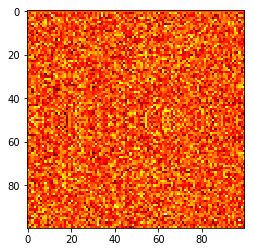

In [34]:
aa = np.mean(sig_mat,axis=0)
plt.imshow(aa, cmap='hot', interpolation='nearest')
plt.show()


In [ ]:
df_info[(df_info.id_location==1)  & (df_info.id_direction==1)]

In [35]:
#read file
file_list = os.listdir(path_csi_hc)
file = file_list[0]
data_read = np.load(path_csi_hc + file)     

In [36]:
data_read.shape

(1000, 90004)

In [38]:
hc_csi = data_read[:,4:]
hc_csi.shape

(1000, 90000)

In [54]:
hc_csi_resh = hc_csi.reshape([-1,500,30,2,3])
hc_csi1 = hc_csi_resh[0,:,:,:,:]
hc_csi1.shape

(500, 30, 2, 3)

In [44]:
target_sig.shape

(14960, 2, 3)

In [55]:
sig_mat_hc  = np.zeros([30,100,100])
for subc in range(30):
    for i in range(100):
        for j in range(100):
            theta = i * math.pi / 100 
            sigma = j * math.pi / 100
            sig_mat_hc[subc,i,j] = calc_p(hc_csi1[:,subc,:,:],theta,sigma)
            print((subc,i,j))

(0, 0, 0)
(0, 0, 1)
(0, 0, 2)
(0, 0, 3)
(0, 0, 4)
(0, 0, 5)
(0, 0, 6)
(0, 0, 7)
(0, 0, 8)
(0, 0, 9)
(0, 0, 10)
(0, 0, 11)
(0, 0, 12)
(0, 0, 13)
(0, 0, 14)
(0, 0, 15)
(0, 0, 16)
(0, 0, 17)
(0, 0, 18)
(0, 0, 19)
(0, 0, 20)
(0, 0, 21)
(0, 0, 22)
(0, 0, 23)
(0, 0, 24)
(0, 0, 25)
(0, 0, 26)
(0, 0, 27)
(0, 0, 28)
(0, 0, 29)
(0, 0, 30)
(0, 0, 31)
(0, 0, 32)
(0, 0, 33)
(0, 0, 34)
(0, 0, 35)
(0, 0, 36)
(0, 0, 37)
(0, 0, 38)
(0, 0, 39)
(0, 0, 40)
(0, 0, 41)
(0, 0, 42)
(0, 0, 43)
(0, 0, 44)
(0, 0, 45)
(0, 0, 46)
(0, 0, 47)
(0, 0, 48)
(0, 0, 49)
(0, 0, 50)
(0, 0, 51)
(0, 0, 52)
(0, 0, 53)
(0, 0, 54)
(0, 0, 55)
(0, 0, 56)
(0, 0, 57)
(0, 0, 58)
(0, 0, 59)
(0, 0, 60)
(0, 0, 61)
(0, 0, 62)
(0, 0, 63)
(0, 0, 64)
(0, 0, 65)
(0, 0, 66)
(0, 0, 67)
(0, 0, 68)
(0, 0, 69)
(0, 0, 70)
(0, 0, 71)
(0, 0, 72)
(0, 0, 73)
(0, 0, 74)
(0, 0, 75)
(0, 0, 76)
(0, 0, 77)
(0, 0, 78)
(0, 0, 79)
(0, 0, 80)
(0, 0, 81)
(0, 0, 82)
(0, 0, 83)
(0, 0, 84)
(0, 0, 85)
(0, 0, 86)
(0, 0, 87)
(0, 0, 88)
(0, 0, 89)
(0, 0, 90)
(0, 0, 91

(0, 8, 2)
(0, 8, 3)
(0, 8, 4)
(0, 8, 5)
(0, 8, 6)
(0, 8, 7)
(0, 8, 8)
(0, 8, 9)
(0, 8, 10)
(0, 8, 11)
(0, 8, 12)
(0, 8, 13)
(0, 8, 14)
(0, 8, 15)
(0, 8, 16)
(0, 8, 17)
(0, 8, 18)
(0, 8, 19)
(0, 8, 20)
(0, 8, 21)
(0, 8, 22)
(0, 8, 23)
(0, 8, 24)
(0, 8, 25)
(0, 8, 26)
(0, 8, 27)
(0, 8, 28)
(0, 8, 29)
(0, 8, 30)
(0, 8, 31)
(0, 8, 32)
(0, 8, 33)
(0, 8, 34)
(0, 8, 35)
(0, 8, 36)
(0, 8, 37)
(0, 8, 38)
(0, 8, 39)
(0, 8, 40)
(0, 8, 41)
(0, 8, 42)
(0, 8, 43)
(0, 8, 44)
(0, 8, 45)
(0, 8, 46)
(0, 8, 47)
(0, 8, 48)
(0, 8, 49)
(0, 8, 50)
(0, 8, 51)
(0, 8, 52)
(0, 8, 53)
(0, 8, 54)
(0, 8, 55)
(0, 8, 56)
(0, 8, 57)
(0, 8, 58)
(0, 8, 59)
(0, 8, 60)
(0, 8, 61)
(0, 8, 62)
(0, 8, 63)
(0, 8, 64)
(0, 8, 65)
(0, 8, 66)
(0, 8, 67)
(0, 8, 68)
(0, 8, 69)
(0, 8, 70)
(0, 8, 71)
(0, 8, 72)
(0, 8, 73)
(0, 8, 74)
(0, 8, 75)
(0, 8, 76)
(0, 8, 77)
(0, 8, 78)
(0, 8, 79)
(0, 8, 80)
(0, 8, 81)
(0, 8, 82)
(0, 8, 83)
(0, 8, 84)
(0, 8, 85)
(0, 8, 86)
(0, 8, 87)
(0, 8, 88)
(0, 8, 89)
(0, 8, 90)
(0, 8, 91)
(0, 8, 92)
(0, 8, 

(0, 15, 59)
(0, 15, 60)
(0, 15, 61)
(0, 15, 62)
(0, 15, 63)
(0, 15, 64)
(0, 15, 65)
(0, 15, 66)
(0, 15, 67)
(0, 15, 68)
(0, 15, 69)
(0, 15, 70)
(0, 15, 71)
(0, 15, 72)
(0, 15, 73)
(0, 15, 74)
(0, 15, 75)
(0, 15, 76)
(0, 15, 77)
(0, 15, 78)
(0, 15, 79)
(0, 15, 80)
(0, 15, 81)
(0, 15, 82)
(0, 15, 83)
(0, 15, 84)
(0, 15, 85)
(0, 15, 86)
(0, 15, 87)
(0, 15, 88)
(0, 15, 89)
(0, 15, 90)
(0, 15, 91)
(0, 15, 92)
(0, 15, 93)
(0, 15, 94)
(0, 15, 95)
(0, 15, 96)
(0, 15, 97)
(0, 15, 98)
(0, 15, 99)
(0, 16, 0)
(0, 16, 1)
(0, 16, 2)
(0, 16, 3)
(0, 16, 4)
(0, 16, 5)
(0, 16, 6)
(0, 16, 7)
(0, 16, 8)
(0, 16, 9)
(0, 16, 10)
(0, 16, 11)
(0, 16, 12)
(0, 16, 13)
(0, 16, 14)
(0, 16, 15)
(0, 16, 16)
(0, 16, 17)
(0, 16, 18)
(0, 16, 19)
(0, 16, 20)
(0, 16, 21)
(0, 16, 22)
(0, 16, 23)
(0, 16, 24)
(0, 16, 25)
(0, 16, 26)
(0, 16, 27)
(0, 16, 28)
(0, 16, 29)
(0, 16, 30)
(0, 16, 31)
(0, 16, 32)
(0, 16, 33)
(0, 16, 34)
(0, 16, 35)
(0, 16, 36)
(0, 16, 37)
(0, 16, 38)
(0, 16, 39)
(0, 16, 40)
(0, 16, 41)
(0, 16, 42)
(0

(0, 22, 88)
(0, 22, 89)
(0, 22, 90)
(0, 22, 91)
(0, 22, 92)
(0, 22, 93)
(0, 22, 94)
(0, 22, 95)
(0, 22, 96)
(0, 22, 97)
(0, 22, 98)
(0, 22, 99)
(0, 23, 0)
(0, 23, 1)
(0, 23, 2)
(0, 23, 3)
(0, 23, 4)
(0, 23, 5)
(0, 23, 6)
(0, 23, 7)
(0, 23, 8)
(0, 23, 9)
(0, 23, 10)
(0, 23, 11)
(0, 23, 12)
(0, 23, 13)
(0, 23, 14)
(0, 23, 15)
(0, 23, 16)
(0, 23, 17)
(0, 23, 18)
(0, 23, 19)
(0, 23, 20)
(0, 23, 21)
(0, 23, 22)
(0, 23, 23)
(0, 23, 24)
(0, 23, 25)
(0, 23, 26)
(0, 23, 27)
(0, 23, 28)
(0, 23, 29)
(0, 23, 30)
(0, 23, 31)
(0, 23, 32)
(0, 23, 33)
(0, 23, 34)
(0, 23, 35)
(0, 23, 36)
(0, 23, 37)
(0, 23, 38)
(0, 23, 39)
(0, 23, 40)
(0, 23, 41)
(0, 23, 42)
(0, 23, 43)
(0, 23, 44)
(0, 23, 45)
(0, 23, 46)
(0, 23, 47)
(0, 23, 48)
(0, 23, 49)
(0, 23, 50)
(0, 23, 51)
(0, 23, 52)
(0, 23, 53)
(0, 23, 54)
(0, 23, 55)
(0, 23, 56)
(0, 23, 57)
(0, 23, 58)
(0, 23, 59)
(0, 23, 60)
(0, 23, 61)
(0, 23, 62)
(0, 23, 63)
(0, 23, 64)
(0, 23, 65)
(0, 23, 66)
(0, 23, 67)
(0, 23, 68)
(0, 23, 69)
(0, 23, 70)
(0, 23, 71)
(0

(0, 30, 27)
(0, 30, 28)
(0, 30, 29)
(0, 30, 30)
(0, 30, 31)
(0, 30, 32)
(0, 30, 33)
(0, 30, 34)
(0, 30, 35)
(0, 30, 36)
(0, 30, 37)
(0, 30, 38)
(0, 30, 39)
(0, 30, 40)
(0, 30, 41)
(0, 30, 42)
(0, 30, 43)
(0, 30, 44)
(0, 30, 45)
(0, 30, 46)
(0, 30, 47)
(0, 30, 48)
(0, 30, 49)
(0, 30, 50)
(0, 30, 51)
(0, 30, 52)
(0, 30, 53)
(0, 30, 54)
(0, 30, 55)
(0, 30, 56)
(0, 30, 57)
(0, 30, 58)
(0, 30, 59)
(0, 30, 60)
(0, 30, 61)
(0, 30, 62)
(0, 30, 63)
(0, 30, 64)
(0, 30, 65)
(0, 30, 66)
(0, 30, 67)
(0, 30, 68)
(0, 30, 69)
(0, 30, 70)
(0, 30, 71)
(0, 30, 72)
(0, 30, 73)
(0, 30, 74)
(0, 30, 75)
(0, 30, 76)
(0, 30, 77)
(0, 30, 78)
(0, 30, 79)
(0, 30, 80)
(0, 30, 81)
(0, 30, 82)
(0, 30, 83)
(0, 30, 84)
(0, 30, 85)
(0, 30, 86)
(0, 30, 87)
(0, 30, 88)
(0, 30, 89)
(0, 30, 90)
(0, 30, 91)
(0, 30, 92)
(0, 30, 93)
(0, 30, 94)
(0, 30, 95)
(0, 30, 96)
(0, 30, 97)
(0, 30, 98)
(0, 30, 99)
(0, 31, 0)
(0, 31, 1)
(0, 31, 2)
(0, 31, 3)
(0, 31, 4)
(0, 31, 5)
(0, 31, 6)
(0, 31, 7)
(0, 31, 8)
(0, 31, 9)
(0, 31, 10)
(0

(0, 37, 22)
(0, 37, 23)
(0, 37, 24)
(0, 37, 25)
(0, 37, 26)
(0, 37, 27)
(0, 37, 28)
(0, 37, 29)
(0, 37, 30)
(0, 37, 31)
(0, 37, 32)
(0, 37, 33)
(0, 37, 34)
(0, 37, 35)
(0, 37, 36)
(0, 37, 37)
(0, 37, 38)
(0, 37, 39)
(0, 37, 40)
(0, 37, 41)
(0, 37, 42)
(0, 37, 43)
(0, 37, 44)
(0, 37, 45)
(0, 37, 46)
(0, 37, 47)
(0, 37, 48)
(0, 37, 49)
(0, 37, 50)
(0, 37, 51)
(0, 37, 52)
(0, 37, 53)
(0, 37, 54)
(0, 37, 55)
(0, 37, 56)
(0, 37, 57)
(0, 37, 58)
(0, 37, 59)
(0, 37, 60)
(0, 37, 61)
(0, 37, 62)
(0, 37, 63)
(0, 37, 64)
(0, 37, 65)
(0, 37, 66)
(0, 37, 67)
(0, 37, 68)
(0, 37, 69)
(0, 37, 70)
(0, 37, 71)
(0, 37, 72)
(0, 37, 73)
(0, 37, 74)
(0, 37, 75)
(0, 37, 76)
(0, 37, 77)
(0, 37, 78)
(0, 37, 79)
(0, 37, 80)
(0, 37, 81)
(0, 37, 82)
(0, 37, 83)
(0, 37, 84)
(0, 37, 85)
(0, 37, 86)
(0, 37, 87)
(0, 37, 88)
(0, 37, 89)
(0, 37, 90)
(0, 37, 91)
(0, 37, 92)
(0, 37, 93)
(0, 37, 94)
(0, 37, 95)
(0, 37, 96)
(0, 37, 97)
(0, 37, 98)
(0, 37, 99)
(0, 38, 0)
(0, 38, 1)
(0, 38, 2)
(0, 38, 3)
(0, 38, 4)
(0, 38, 5

(0, 44, 32)
(0, 44, 33)
(0, 44, 34)
(0, 44, 35)
(0, 44, 36)
(0, 44, 37)
(0, 44, 38)
(0, 44, 39)
(0, 44, 40)
(0, 44, 41)
(0, 44, 42)
(0, 44, 43)
(0, 44, 44)
(0, 44, 45)
(0, 44, 46)
(0, 44, 47)
(0, 44, 48)
(0, 44, 49)
(0, 44, 50)
(0, 44, 51)
(0, 44, 52)
(0, 44, 53)
(0, 44, 54)
(0, 44, 55)
(0, 44, 56)
(0, 44, 57)
(0, 44, 58)
(0, 44, 59)
(0, 44, 60)
(0, 44, 61)
(0, 44, 62)
(0, 44, 63)
(0, 44, 64)
(0, 44, 65)
(0, 44, 66)
(0, 44, 67)
(0, 44, 68)
(0, 44, 69)
(0, 44, 70)
(0, 44, 71)
(0, 44, 72)
(0, 44, 73)
(0, 44, 74)
(0, 44, 75)
(0, 44, 76)
(0, 44, 77)
(0, 44, 78)
(0, 44, 79)
(0, 44, 80)
(0, 44, 81)
(0, 44, 82)
(0, 44, 83)
(0, 44, 84)
(0, 44, 85)
(0, 44, 86)
(0, 44, 87)
(0, 44, 88)
(0, 44, 89)
(0, 44, 90)
(0, 44, 91)
(0, 44, 92)
(0, 44, 93)
(0, 44, 94)
(0, 44, 95)
(0, 44, 96)
(0, 44, 97)
(0, 44, 98)
(0, 44, 99)
(0, 45, 0)
(0, 45, 1)
(0, 45, 2)
(0, 45, 3)
(0, 45, 4)
(0, 45, 5)
(0, 45, 6)
(0, 45, 7)
(0, 45, 8)
(0, 45, 9)
(0, 45, 10)
(0, 45, 11)
(0, 45, 12)
(0, 45, 13)
(0, 45, 14)
(0, 45, 15)
(0

(0, 52, 66)
(0, 52, 67)
(0, 52, 68)
(0, 52, 69)
(0, 52, 70)
(0, 52, 71)
(0, 52, 72)
(0, 52, 73)
(0, 52, 74)
(0, 52, 75)
(0, 52, 76)
(0, 52, 77)
(0, 52, 78)
(0, 52, 79)
(0, 52, 80)
(0, 52, 81)
(0, 52, 82)
(0, 52, 83)
(0, 52, 84)
(0, 52, 85)
(0, 52, 86)
(0, 52, 87)
(0, 52, 88)
(0, 52, 89)
(0, 52, 90)
(0, 52, 91)
(0, 52, 92)
(0, 52, 93)
(0, 52, 94)
(0, 52, 95)
(0, 52, 96)
(0, 52, 97)
(0, 52, 98)
(0, 52, 99)
(0, 53, 0)
(0, 53, 1)
(0, 53, 2)
(0, 53, 3)
(0, 53, 4)
(0, 53, 5)
(0, 53, 6)
(0, 53, 7)
(0, 53, 8)
(0, 53, 9)
(0, 53, 10)
(0, 53, 11)
(0, 53, 12)
(0, 53, 13)
(0, 53, 14)
(0, 53, 15)
(0, 53, 16)
(0, 53, 17)
(0, 53, 18)
(0, 53, 19)
(0, 53, 20)
(0, 53, 21)
(0, 53, 22)
(0, 53, 23)
(0, 53, 24)
(0, 53, 25)
(0, 53, 26)
(0, 53, 27)
(0, 53, 28)
(0, 53, 29)
(0, 53, 30)
(0, 53, 31)
(0, 53, 32)
(0, 53, 33)
(0, 53, 34)
(0, 53, 35)
(0, 53, 36)
(0, 53, 37)
(0, 53, 38)
(0, 53, 39)
(0, 53, 40)
(0, 53, 41)
(0, 53, 42)
(0, 53, 43)
(0, 53, 44)
(0, 53, 45)
(0, 53, 46)
(0, 53, 47)
(0, 53, 48)
(0, 53, 49)
(0

(0, 59, 60)
(0, 59, 61)
(0, 59, 62)
(0, 59, 63)
(0, 59, 64)
(0, 59, 65)
(0, 59, 66)
(0, 59, 67)
(0, 59, 68)
(0, 59, 69)
(0, 59, 70)
(0, 59, 71)
(0, 59, 72)
(0, 59, 73)
(0, 59, 74)
(0, 59, 75)
(0, 59, 76)
(0, 59, 77)
(0, 59, 78)
(0, 59, 79)
(0, 59, 80)
(0, 59, 81)
(0, 59, 82)
(0, 59, 83)
(0, 59, 84)
(0, 59, 85)
(0, 59, 86)
(0, 59, 87)
(0, 59, 88)
(0, 59, 89)
(0, 59, 90)
(0, 59, 91)
(0, 59, 92)
(0, 59, 93)
(0, 59, 94)
(0, 59, 95)
(0, 59, 96)
(0, 59, 97)
(0, 59, 98)
(0, 59, 99)
(0, 60, 0)
(0, 60, 1)
(0, 60, 2)
(0, 60, 3)
(0, 60, 4)
(0, 60, 5)
(0, 60, 6)
(0, 60, 7)
(0, 60, 8)
(0, 60, 9)
(0, 60, 10)
(0, 60, 11)
(0, 60, 12)
(0, 60, 13)
(0, 60, 14)
(0, 60, 15)
(0, 60, 16)
(0, 60, 17)
(0, 60, 18)
(0, 60, 19)
(0, 60, 20)
(0, 60, 21)
(0, 60, 22)
(0, 60, 23)
(0, 60, 24)
(0, 60, 25)
(0, 60, 26)
(0, 60, 27)
(0, 60, 28)
(0, 60, 29)
(0, 60, 30)
(0, 60, 31)
(0, 60, 32)
(0, 60, 33)
(0, 60, 34)
(0, 60, 35)
(0, 60, 36)
(0, 60, 37)
(0, 60, 38)
(0, 60, 39)
(0, 60, 40)
(0, 60, 41)
(0, 60, 42)
(0, 60, 43)
(0

(0, 67, 30)
(0, 67, 31)
(0, 67, 32)
(0, 67, 33)
(0, 67, 34)
(0, 67, 35)
(0, 67, 36)
(0, 67, 37)
(0, 67, 38)
(0, 67, 39)
(0, 67, 40)
(0, 67, 41)
(0, 67, 42)
(0, 67, 43)
(0, 67, 44)
(0, 67, 45)
(0, 67, 46)
(0, 67, 47)
(0, 67, 48)
(0, 67, 49)
(0, 67, 50)
(0, 67, 51)
(0, 67, 52)
(0, 67, 53)
(0, 67, 54)
(0, 67, 55)
(0, 67, 56)
(0, 67, 57)
(0, 67, 58)
(0, 67, 59)
(0, 67, 60)
(0, 67, 61)
(0, 67, 62)
(0, 67, 63)
(0, 67, 64)
(0, 67, 65)
(0, 67, 66)
(0, 67, 67)
(0, 67, 68)
(0, 67, 69)
(0, 67, 70)
(0, 67, 71)
(0, 67, 72)
(0, 67, 73)
(0, 67, 74)
(0, 67, 75)
(0, 67, 76)
(0, 67, 77)
(0, 67, 78)
(0, 67, 79)
(0, 67, 80)
(0, 67, 81)
(0, 67, 82)
(0, 67, 83)
(0, 67, 84)
(0, 67, 85)
(0, 67, 86)
(0, 67, 87)
(0, 67, 88)
(0, 67, 89)
(0, 67, 90)
(0, 67, 91)
(0, 67, 92)
(0, 67, 93)
(0, 67, 94)
(0, 67, 95)
(0, 67, 96)
(0, 67, 97)
(0, 67, 98)
(0, 67, 99)
(0, 68, 0)
(0, 68, 1)
(0, 68, 2)
(0, 68, 3)
(0, 68, 4)
(0, 68, 5)
(0, 68, 6)
(0, 68, 7)
(0, 68, 8)
(0, 68, 9)
(0, 68, 10)
(0, 68, 11)
(0, 68, 12)
(0, 68, 13)
(0

(0, 75, 31)
(0, 75, 32)
(0, 75, 33)
(0, 75, 34)
(0, 75, 35)
(0, 75, 36)
(0, 75, 37)
(0, 75, 38)
(0, 75, 39)
(0, 75, 40)
(0, 75, 41)
(0, 75, 42)
(0, 75, 43)
(0, 75, 44)
(0, 75, 45)
(0, 75, 46)
(0, 75, 47)
(0, 75, 48)
(0, 75, 49)
(0, 75, 50)
(0, 75, 51)
(0, 75, 52)
(0, 75, 53)
(0, 75, 54)
(0, 75, 55)
(0, 75, 56)
(0, 75, 57)
(0, 75, 58)
(0, 75, 59)
(0, 75, 60)
(0, 75, 61)
(0, 75, 62)
(0, 75, 63)
(0, 75, 64)
(0, 75, 65)
(0, 75, 66)
(0, 75, 67)
(0, 75, 68)
(0, 75, 69)
(0, 75, 70)
(0, 75, 71)
(0, 75, 72)
(0, 75, 73)
(0, 75, 74)
(0, 75, 75)
(0, 75, 76)
(0, 75, 77)
(0, 75, 78)
(0, 75, 79)
(0, 75, 80)
(0, 75, 81)
(0, 75, 82)
(0, 75, 83)
(0, 75, 84)
(0, 75, 85)
(0, 75, 86)
(0, 75, 87)
(0, 75, 88)
(0, 75, 89)
(0, 75, 90)
(0, 75, 91)
(0, 75, 92)
(0, 75, 93)
(0, 75, 94)
(0, 75, 95)
(0, 75, 96)
(0, 75, 97)
(0, 75, 98)
(0, 75, 99)
(0, 76, 0)
(0, 76, 1)
(0, 76, 2)
(0, 76, 3)
(0, 76, 4)
(0, 76, 5)
(0, 76, 6)
(0, 76, 7)
(0, 76, 8)
(0, 76, 9)
(0, 76, 10)
(0, 76, 11)
(0, 76, 12)
(0, 76, 13)
(0, 76, 14)
(0

(0, 83, 94)
(0, 83, 95)
(0, 83, 96)
(0, 83, 97)
(0, 83, 98)
(0, 83, 99)
(0, 84, 0)
(0, 84, 1)
(0, 84, 2)
(0, 84, 3)
(0, 84, 4)
(0, 84, 5)
(0, 84, 6)
(0, 84, 7)
(0, 84, 8)
(0, 84, 9)
(0, 84, 10)
(0, 84, 11)
(0, 84, 12)
(0, 84, 13)
(0, 84, 14)
(0, 84, 15)
(0, 84, 16)
(0, 84, 17)
(0, 84, 18)
(0, 84, 19)
(0, 84, 20)
(0, 84, 21)
(0, 84, 22)
(0, 84, 23)
(0, 84, 24)
(0, 84, 25)
(0, 84, 26)
(0, 84, 27)
(0, 84, 28)
(0, 84, 29)
(0, 84, 30)
(0, 84, 31)
(0, 84, 32)
(0, 84, 33)
(0, 84, 34)
(0, 84, 35)
(0, 84, 36)
(0, 84, 37)
(0, 84, 38)
(0, 84, 39)
(0, 84, 40)
(0, 84, 41)
(0, 84, 42)
(0, 84, 43)
(0, 84, 44)
(0, 84, 45)
(0, 84, 46)
(0, 84, 47)
(0, 84, 48)
(0, 84, 49)
(0, 84, 50)
(0, 84, 51)
(0, 84, 52)
(0, 84, 53)
(0, 84, 54)
(0, 84, 55)
(0, 84, 56)
(0, 84, 57)
(0, 84, 58)
(0, 84, 59)
(0, 84, 60)
(0, 84, 61)
(0, 84, 62)
(0, 84, 63)
(0, 84, 64)
(0, 84, 65)
(0, 84, 66)
(0, 84, 67)
(0, 84, 68)
(0, 84, 69)
(0, 84, 70)
(0, 84, 71)
(0, 84, 72)
(0, 84, 73)
(0, 84, 74)
(0, 84, 75)
(0, 84, 76)
(0, 84, 77)
(0

(0, 91, 18)
(0, 91, 19)
(0, 91, 20)
(0, 91, 21)
(0, 91, 22)
(0, 91, 23)
(0, 91, 24)
(0, 91, 25)
(0, 91, 26)
(0, 91, 27)
(0, 91, 28)
(0, 91, 29)
(0, 91, 30)
(0, 91, 31)
(0, 91, 32)
(0, 91, 33)
(0, 91, 34)
(0, 91, 35)
(0, 91, 36)
(0, 91, 37)
(0, 91, 38)
(0, 91, 39)
(0, 91, 40)
(0, 91, 41)
(0, 91, 42)
(0, 91, 43)
(0, 91, 44)
(0, 91, 45)
(0, 91, 46)
(0, 91, 47)
(0, 91, 48)
(0, 91, 49)
(0, 91, 50)
(0, 91, 51)
(0, 91, 52)
(0, 91, 53)
(0, 91, 54)
(0, 91, 55)
(0, 91, 56)
(0, 91, 57)
(0, 91, 58)
(0, 91, 59)
(0, 91, 60)
(0, 91, 61)
(0, 91, 62)
(0, 91, 63)
(0, 91, 64)
(0, 91, 65)
(0, 91, 66)
(0, 91, 67)
(0, 91, 68)
(0, 91, 69)
(0, 91, 70)
(0, 91, 71)
(0, 91, 72)
(0, 91, 73)
(0, 91, 74)
(0, 91, 75)
(0, 91, 76)
(0, 91, 77)
(0, 91, 78)
(0, 91, 79)
(0, 91, 80)
(0, 91, 81)
(0, 91, 82)
(0, 91, 83)
(0, 91, 84)
(0, 91, 85)
(0, 91, 86)
(0, 91, 87)
(0, 91, 88)
(0, 91, 89)
(0, 91, 90)
(0, 91, 91)
(0, 91, 92)
(0, 91, 93)
(0, 91, 94)
(0, 91, 95)
(0, 91, 96)
(0, 91, 97)
(0, 91, 98)
(0, 91, 99)
(0, 92, 0)
(0, 9

(0, 99, 35)
(0, 99, 36)
(0, 99, 37)
(0, 99, 38)
(0, 99, 39)
(0, 99, 40)
(0, 99, 41)
(0, 99, 42)
(0, 99, 43)
(0, 99, 44)
(0, 99, 45)
(0, 99, 46)
(0, 99, 47)
(0, 99, 48)
(0, 99, 49)
(0, 99, 50)
(0, 99, 51)
(0, 99, 52)
(0, 99, 53)
(0, 99, 54)
(0, 99, 55)
(0, 99, 56)
(0, 99, 57)
(0, 99, 58)
(0, 99, 59)
(0, 99, 60)
(0, 99, 61)
(0, 99, 62)
(0, 99, 63)
(0, 99, 64)
(0, 99, 65)
(0, 99, 66)
(0, 99, 67)
(0, 99, 68)
(0, 99, 69)
(0, 99, 70)
(0, 99, 71)
(0, 99, 72)
(0, 99, 73)
(0, 99, 74)
(0, 99, 75)
(0, 99, 76)
(0, 99, 77)
(0, 99, 78)
(0, 99, 79)
(0, 99, 80)
(0, 99, 81)
(0, 99, 82)
(0, 99, 83)
(0, 99, 84)
(0, 99, 85)
(0, 99, 86)
(0, 99, 87)
(0, 99, 88)
(0, 99, 89)
(0, 99, 90)
(0, 99, 91)
(0, 99, 92)
(0, 99, 93)
(0, 99, 94)
(0, 99, 95)
(0, 99, 96)
(0, 99, 97)
(0, 99, 98)
(0, 99, 99)
(1, 0, 0)
(1, 0, 1)
(1, 0, 2)
(1, 0, 3)
(1, 0, 4)
(1, 0, 5)
(1, 0, 6)
(1, 0, 7)
(1, 0, 8)
(1, 0, 9)
(1, 0, 10)
(1, 0, 11)
(1, 0, 12)
(1, 0, 13)
(1, 0, 14)
(1, 0, 15)
(1, 0, 16)
(1, 0, 17)
(1, 0, 18)
(1, 0, 19)
(1, 0, 20)

(1, 8, 3)
(1, 8, 4)
(1, 8, 5)
(1, 8, 6)
(1, 8, 7)
(1, 8, 8)
(1, 8, 9)
(1, 8, 10)
(1, 8, 11)
(1, 8, 12)
(1, 8, 13)
(1, 8, 14)
(1, 8, 15)
(1, 8, 16)
(1, 8, 17)
(1, 8, 18)
(1, 8, 19)
(1, 8, 20)
(1, 8, 21)
(1, 8, 22)
(1, 8, 23)
(1, 8, 24)
(1, 8, 25)
(1, 8, 26)
(1, 8, 27)
(1, 8, 28)
(1, 8, 29)
(1, 8, 30)
(1, 8, 31)
(1, 8, 32)
(1, 8, 33)
(1, 8, 34)
(1, 8, 35)
(1, 8, 36)
(1, 8, 37)
(1, 8, 38)
(1, 8, 39)
(1, 8, 40)
(1, 8, 41)
(1, 8, 42)
(1, 8, 43)
(1, 8, 44)
(1, 8, 45)
(1, 8, 46)
(1, 8, 47)
(1, 8, 48)
(1, 8, 49)
(1, 8, 50)
(1, 8, 51)
(1, 8, 52)
(1, 8, 53)
(1, 8, 54)
(1, 8, 55)
(1, 8, 56)
(1, 8, 57)
(1, 8, 58)
(1, 8, 59)
(1, 8, 60)
(1, 8, 61)
(1, 8, 62)
(1, 8, 63)
(1, 8, 64)
(1, 8, 65)
(1, 8, 66)
(1, 8, 67)
(1, 8, 68)
(1, 8, 69)
(1, 8, 70)
(1, 8, 71)
(1, 8, 72)
(1, 8, 73)
(1, 8, 74)
(1, 8, 75)
(1, 8, 76)
(1, 8, 77)
(1, 8, 78)
(1, 8, 79)
(1, 8, 80)
(1, 8, 81)
(1, 8, 82)
(1, 8, 83)
(1, 8, 84)
(1, 8, 85)
(1, 8, 86)
(1, 8, 87)
(1, 8, 88)
(1, 8, 89)
(1, 8, 90)
(1, 8, 91)
(1, 8, 92)
(1, 8, 93)
(1, 8,

(1, 16, 9)
(1, 16, 10)
(1, 16, 11)
(1, 16, 12)
(1, 16, 13)
(1, 16, 14)
(1, 16, 15)
(1, 16, 16)
(1, 16, 17)
(1, 16, 18)
(1, 16, 19)
(1, 16, 20)
(1, 16, 21)
(1, 16, 22)
(1, 16, 23)
(1, 16, 24)
(1, 16, 25)
(1, 16, 26)
(1, 16, 27)
(1, 16, 28)
(1, 16, 29)
(1, 16, 30)
(1, 16, 31)
(1, 16, 32)
(1, 16, 33)
(1, 16, 34)
(1, 16, 35)
(1, 16, 36)
(1, 16, 37)
(1, 16, 38)
(1, 16, 39)
(1, 16, 40)
(1, 16, 41)
(1, 16, 42)
(1, 16, 43)
(1, 16, 44)
(1, 16, 45)
(1, 16, 46)
(1, 16, 47)
(1, 16, 48)
(1, 16, 49)
(1, 16, 50)
(1, 16, 51)
(1, 16, 52)
(1, 16, 53)
(1, 16, 54)
(1, 16, 55)
(1, 16, 56)
(1, 16, 57)
(1, 16, 58)
(1, 16, 59)
(1, 16, 60)
(1, 16, 61)
(1, 16, 62)
(1, 16, 63)
(1, 16, 64)
(1, 16, 65)
(1, 16, 66)
(1, 16, 67)
(1, 16, 68)
(1, 16, 69)
(1, 16, 70)
(1, 16, 71)
(1, 16, 72)
(1, 16, 73)
(1, 16, 74)
(1, 16, 75)
(1, 16, 76)
(1, 16, 77)
(1, 16, 78)
(1, 16, 79)
(1, 16, 80)
(1, 16, 81)
(1, 16, 82)
(1, 16, 83)
(1, 16, 84)
(1, 16, 85)
(1, 16, 86)
(1, 16, 87)
(1, 16, 88)
(1, 16, 89)
(1, 16, 90)
(1, 16, 91)
(1, 1

(1, 24, 14)
(1, 24, 15)
(1, 24, 16)
(1, 24, 17)
(1, 24, 18)
(1, 24, 19)
(1, 24, 20)
(1, 24, 21)
(1, 24, 22)
(1, 24, 23)
(1, 24, 24)
(1, 24, 25)
(1, 24, 26)
(1, 24, 27)
(1, 24, 28)
(1, 24, 29)
(1, 24, 30)
(1, 24, 31)
(1, 24, 32)
(1, 24, 33)
(1, 24, 34)
(1, 24, 35)
(1, 24, 36)
(1, 24, 37)
(1, 24, 38)
(1, 24, 39)
(1, 24, 40)
(1, 24, 41)
(1, 24, 42)
(1, 24, 43)
(1, 24, 44)
(1, 24, 45)
(1, 24, 46)
(1, 24, 47)
(1, 24, 48)
(1, 24, 49)
(1, 24, 50)
(1, 24, 51)
(1, 24, 52)
(1, 24, 53)
(1, 24, 54)
(1, 24, 55)
(1, 24, 56)
(1, 24, 57)
(1, 24, 58)
(1, 24, 59)
(1, 24, 60)
(1, 24, 61)
(1, 24, 62)
(1, 24, 63)
(1, 24, 64)
(1, 24, 65)
(1, 24, 66)
(1, 24, 67)
(1, 24, 68)
(1, 24, 69)
(1, 24, 70)
(1, 24, 71)
(1, 24, 72)
(1, 24, 73)
(1, 24, 74)
(1, 24, 75)
(1, 24, 76)
(1, 24, 77)
(1, 24, 78)
(1, 24, 79)
(1, 24, 80)
(1, 24, 81)
(1, 24, 82)
(1, 24, 83)
(1, 24, 84)
(1, 24, 85)
(1, 24, 86)
(1, 24, 87)
(1, 24, 88)
(1, 24, 89)
(1, 24, 90)
(1, 24, 91)
(1, 24, 92)
(1, 24, 93)
(1, 24, 94)
(1, 24, 95)
(1, 24, 96)
(1, 

(1, 31, 5)
(1, 31, 6)
(1, 31, 7)
(1, 31, 8)
(1, 31, 9)
(1, 31, 10)
(1, 31, 11)
(1, 31, 12)
(1, 31, 13)
(1, 31, 14)
(1, 31, 15)
(1, 31, 16)
(1, 31, 17)
(1, 31, 18)
(1, 31, 19)
(1, 31, 20)
(1, 31, 21)
(1, 31, 22)
(1, 31, 23)
(1, 31, 24)
(1, 31, 25)
(1, 31, 26)
(1, 31, 27)
(1, 31, 28)
(1, 31, 29)
(1, 31, 30)
(1, 31, 31)
(1, 31, 32)
(1, 31, 33)
(1, 31, 34)
(1, 31, 35)
(1, 31, 36)
(1, 31, 37)
(1, 31, 38)
(1, 31, 39)
(1, 31, 40)
(1, 31, 41)
(1, 31, 42)
(1, 31, 43)
(1, 31, 44)
(1, 31, 45)
(1, 31, 46)
(1, 31, 47)
(1, 31, 48)
(1, 31, 49)
(1, 31, 50)
(1, 31, 51)
(1, 31, 52)
(1, 31, 53)
(1, 31, 54)
(1, 31, 55)
(1, 31, 56)
(1, 31, 57)
(1, 31, 58)
(1, 31, 59)
(1, 31, 60)
(1, 31, 61)
(1, 31, 62)
(1, 31, 63)
(1, 31, 64)
(1, 31, 65)
(1, 31, 66)
(1, 31, 67)
(1, 31, 68)
(1, 31, 69)
(1, 31, 70)
(1, 31, 71)
(1, 31, 72)
(1, 31, 73)
(1, 31, 74)
(1, 31, 75)
(1, 31, 76)
(1, 31, 77)
(1, 31, 78)
(1, 31, 79)
(1, 31, 80)
(1, 31, 81)
(1, 31, 82)
(1, 31, 83)
(1, 31, 84)
(1, 31, 85)
(1, 31, 86)
(1, 31, 87)
(1, 31, 8

(1, 38, 20)
(1, 38, 21)
(1, 38, 22)
(1, 38, 23)
(1, 38, 24)
(1, 38, 25)
(1, 38, 26)
(1, 38, 27)
(1, 38, 28)
(1, 38, 29)
(1, 38, 30)
(1, 38, 31)
(1, 38, 32)
(1, 38, 33)
(1, 38, 34)
(1, 38, 35)
(1, 38, 36)
(1, 38, 37)
(1, 38, 38)
(1, 38, 39)
(1, 38, 40)
(1, 38, 41)
(1, 38, 42)
(1, 38, 43)
(1, 38, 44)
(1, 38, 45)
(1, 38, 46)
(1, 38, 47)
(1, 38, 48)
(1, 38, 49)
(1, 38, 50)
(1, 38, 51)
(1, 38, 52)
(1, 38, 53)
(1, 38, 54)
(1, 38, 55)
(1, 38, 56)
(1, 38, 57)
(1, 38, 58)
(1, 38, 59)
(1, 38, 60)
(1, 38, 61)
(1, 38, 62)
(1, 38, 63)
(1, 38, 64)
(1, 38, 65)
(1, 38, 66)
(1, 38, 67)
(1, 38, 68)
(1, 38, 69)
(1, 38, 70)
(1, 38, 71)
(1, 38, 72)
(1, 38, 73)
(1, 38, 74)
(1, 38, 75)
(1, 38, 76)
(1, 38, 77)
(1, 38, 78)
(1, 38, 79)
(1, 38, 80)
(1, 38, 81)
(1, 38, 82)
(1, 38, 83)
(1, 38, 84)
(1, 38, 85)
(1, 38, 86)
(1, 38, 87)
(1, 38, 88)
(1, 38, 89)
(1, 38, 90)
(1, 38, 91)
(1, 38, 92)
(1, 38, 93)
(1, 38, 94)
(1, 38, 95)
(1, 38, 96)
(1, 38, 97)
(1, 38, 98)
(1, 38, 99)
(1, 39, 0)
(1, 39, 1)
(1, 39, 2)
(1, 39,

(1, 46, 0)
(1, 46, 1)
(1, 46, 2)
(1, 46, 3)
(1, 46, 4)
(1, 46, 5)
(1, 46, 6)
(1, 46, 7)
(1, 46, 8)
(1, 46, 9)
(1, 46, 10)
(1, 46, 11)
(1, 46, 12)
(1, 46, 13)
(1, 46, 14)
(1, 46, 15)
(1, 46, 16)
(1, 46, 17)
(1, 46, 18)
(1, 46, 19)
(1, 46, 20)
(1, 46, 21)
(1, 46, 22)
(1, 46, 23)
(1, 46, 24)
(1, 46, 25)
(1, 46, 26)
(1, 46, 27)
(1, 46, 28)
(1, 46, 29)
(1, 46, 30)
(1, 46, 31)
(1, 46, 32)
(1, 46, 33)
(1, 46, 34)
(1, 46, 35)
(1, 46, 36)
(1, 46, 37)
(1, 46, 38)
(1, 46, 39)
(1, 46, 40)
(1, 46, 41)
(1, 46, 42)
(1, 46, 43)
(1, 46, 44)
(1, 46, 45)
(1, 46, 46)
(1, 46, 47)
(1, 46, 48)
(1, 46, 49)
(1, 46, 50)
(1, 46, 51)
(1, 46, 52)
(1, 46, 53)
(1, 46, 54)
(1, 46, 55)
(1, 46, 56)
(1, 46, 57)
(1, 46, 58)
(1, 46, 59)
(1, 46, 60)
(1, 46, 61)
(1, 46, 62)
(1, 46, 63)
(1, 46, 64)
(1, 46, 65)
(1, 46, 66)
(1, 46, 67)
(1, 46, 68)
(1, 46, 69)
(1, 46, 70)
(1, 46, 71)
(1, 46, 72)
(1, 46, 73)
(1, 46, 74)
(1, 46, 75)
(1, 46, 76)
(1, 46, 77)
(1, 46, 78)
(1, 46, 79)
(1, 46, 80)
(1, 46, 81)
(1, 46, 82)
(1, 46, 83)
(1

(1, 53, 8)
(1, 53, 9)
(1, 53, 10)
(1, 53, 11)
(1, 53, 12)
(1, 53, 13)
(1, 53, 14)
(1, 53, 15)
(1, 53, 16)
(1, 53, 17)
(1, 53, 18)
(1, 53, 19)
(1, 53, 20)
(1, 53, 21)
(1, 53, 22)
(1, 53, 23)
(1, 53, 24)
(1, 53, 25)
(1, 53, 26)
(1, 53, 27)
(1, 53, 28)
(1, 53, 29)
(1, 53, 30)
(1, 53, 31)
(1, 53, 32)
(1, 53, 33)
(1, 53, 34)
(1, 53, 35)
(1, 53, 36)
(1, 53, 37)
(1, 53, 38)
(1, 53, 39)
(1, 53, 40)
(1, 53, 41)
(1, 53, 42)
(1, 53, 43)
(1, 53, 44)
(1, 53, 45)
(1, 53, 46)
(1, 53, 47)
(1, 53, 48)
(1, 53, 49)
(1, 53, 50)
(1, 53, 51)
(1, 53, 52)
(1, 53, 53)
(1, 53, 54)
(1, 53, 55)
(1, 53, 56)
(1, 53, 57)
(1, 53, 58)
(1, 53, 59)
(1, 53, 60)
(1, 53, 61)
(1, 53, 62)
(1, 53, 63)
(1, 53, 64)
(1, 53, 65)
(1, 53, 66)
(1, 53, 67)
(1, 53, 68)
(1, 53, 69)
(1, 53, 70)
(1, 53, 71)
(1, 53, 72)
(1, 53, 73)
(1, 53, 74)
(1, 53, 75)
(1, 53, 76)
(1, 53, 77)
(1, 53, 78)
(1, 53, 79)
(1, 53, 80)
(1, 53, 81)
(1, 53, 82)
(1, 53, 83)
(1, 53, 84)
(1, 53, 85)
(1, 53, 86)
(1, 53, 87)
(1, 53, 88)
(1, 53, 89)
(1, 53, 90)
(1, 53

(1, 60, 1)
(1, 60, 2)
(1, 60, 3)
(1, 60, 4)
(1, 60, 5)
(1, 60, 6)
(1, 60, 7)
(1, 60, 8)
(1, 60, 9)
(1, 60, 10)
(1, 60, 11)
(1, 60, 12)
(1, 60, 13)
(1, 60, 14)
(1, 60, 15)
(1, 60, 16)
(1, 60, 17)
(1, 60, 18)
(1, 60, 19)
(1, 60, 20)
(1, 60, 21)
(1, 60, 22)
(1, 60, 23)
(1, 60, 24)
(1, 60, 25)
(1, 60, 26)
(1, 60, 27)
(1, 60, 28)
(1, 60, 29)
(1, 60, 30)
(1, 60, 31)
(1, 60, 32)
(1, 60, 33)
(1, 60, 34)
(1, 60, 35)
(1, 60, 36)
(1, 60, 37)
(1, 60, 38)
(1, 60, 39)
(1, 60, 40)
(1, 60, 41)
(1, 60, 42)
(1, 60, 43)
(1, 60, 44)
(1, 60, 45)
(1, 60, 46)
(1, 60, 47)
(1, 60, 48)
(1, 60, 49)
(1, 60, 50)
(1, 60, 51)
(1, 60, 52)
(1, 60, 53)
(1, 60, 54)
(1, 60, 55)
(1, 60, 56)
(1, 60, 57)
(1, 60, 58)
(1, 60, 59)
(1, 60, 60)
(1, 60, 61)
(1, 60, 62)
(1, 60, 63)
(1, 60, 64)
(1, 60, 65)
(1, 60, 66)
(1, 60, 67)
(1, 60, 68)
(1, 60, 69)
(1, 60, 70)
(1, 60, 71)
(1, 60, 72)
(1, 60, 73)
(1, 60, 74)
(1, 60, 75)
(1, 60, 76)
(1, 60, 77)
(1, 60, 78)
(1, 60, 79)
(1, 60, 80)
(1, 60, 81)
(1, 60, 82)
(1, 60, 83)
(1, 60, 84)
(

(1, 67, 16)
(1, 67, 17)
(1, 67, 18)
(1, 67, 19)
(1, 67, 20)
(1, 67, 21)
(1, 67, 22)
(1, 67, 23)
(1, 67, 24)
(1, 67, 25)
(1, 67, 26)
(1, 67, 27)
(1, 67, 28)
(1, 67, 29)
(1, 67, 30)
(1, 67, 31)
(1, 67, 32)
(1, 67, 33)
(1, 67, 34)
(1, 67, 35)
(1, 67, 36)
(1, 67, 37)
(1, 67, 38)
(1, 67, 39)
(1, 67, 40)
(1, 67, 41)
(1, 67, 42)
(1, 67, 43)
(1, 67, 44)
(1, 67, 45)
(1, 67, 46)
(1, 67, 47)
(1, 67, 48)
(1, 67, 49)
(1, 67, 50)
(1, 67, 51)
(1, 67, 52)
(1, 67, 53)
(1, 67, 54)
(1, 67, 55)
(1, 67, 56)
(1, 67, 57)
(1, 67, 58)
(1, 67, 59)
(1, 67, 60)
(1, 67, 61)
(1, 67, 62)
(1, 67, 63)
(1, 67, 64)
(1, 67, 65)
(1, 67, 66)
(1, 67, 67)
(1, 67, 68)
(1, 67, 69)
(1, 67, 70)
(1, 67, 71)
(1, 67, 72)
(1, 67, 73)
(1, 67, 74)
(1, 67, 75)
(1, 67, 76)
(1, 67, 77)
(1, 67, 78)
(1, 67, 79)
(1, 67, 80)
(1, 67, 81)
(1, 67, 82)
(1, 67, 83)
(1, 67, 84)
(1, 67, 85)
(1, 67, 86)
(1, 67, 87)
(1, 67, 88)
(1, 67, 89)
(1, 67, 90)
(1, 67, 91)
(1, 67, 92)
(1, 67, 93)
(1, 67, 94)
(1, 67, 95)
(1, 67, 96)
(1, 67, 97)
(1, 67, 98)
(1, 

(1, 75, 92)
(1, 75, 93)
(1, 75, 94)
(1, 75, 95)
(1, 75, 96)
(1, 75, 97)
(1, 75, 98)
(1, 75, 99)
(1, 76, 0)
(1, 76, 1)
(1, 76, 2)
(1, 76, 3)
(1, 76, 4)
(1, 76, 5)
(1, 76, 6)
(1, 76, 7)
(1, 76, 8)
(1, 76, 9)
(1, 76, 10)
(1, 76, 11)
(1, 76, 12)
(1, 76, 13)
(1, 76, 14)
(1, 76, 15)
(1, 76, 16)
(1, 76, 17)
(1, 76, 18)
(1, 76, 19)
(1, 76, 20)
(1, 76, 21)
(1, 76, 22)
(1, 76, 23)
(1, 76, 24)
(1, 76, 25)
(1, 76, 26)
(1, 76, 27)
(1, 76, 28)
(1, 76, 29)
(1, 76, 30)
(1, 76, 31)
(1, 76, 32)
(1, 76, 33)
(1, 76, 34)
(1, 76, 35)
(1, 76, 36)
(1, 76, 37)
(1, 76, 38)
(1, 76, 39)
(1, 76, 40)
(1, 76, 41)
(1, 76, 42)
(1, 76, 43)
(1, 76, 44)
(1, 76, 45)
(1, 76, 46)
(1, 76, 47)
(1, 76, 48)
(1, 76, 49)
(1, 76, 50)
(1, 76, 51)
(1, 76, 52)
(1, 76, 53)
(1, 76, 54)
(1, 76, 55)
(1, 76, 56)
(1, 76, 57)
(1, 76, 58)
(1, 76, 59)
(1, 76, 60)
(1, 76, 61)
(1, 76, 62)
(1, 76, 63)
(1, 76, 64)
(1, 76, 65)
(1, 76, 66)
(1, 76, 67)
(1, 76, 68)
(1, 76, 69)
(1, 76, 70)
(1, 76, 71)
(1, 76, 72)
(1, 76, 73)
(1, 76, 74)
(1, 76, 75)
(1

(1, 83, 74)
(1, 83, 75)
(1, 83, 76)
(1, 83, 77)
(1, 83, 78)
(1, 83, 79)
(1, 83, 80)
(1, 83, 81)
(1, 83, 82)
(1, 83, 83)
(1, 83, 84)
(1, 83, 85)
(1, 83, 86)
(1, 83, 87)
(1, 83, 88)
(1, 83, 89)
(1, 83, 90)
(1, 83, 91)
(1, 83, 92)
(1, 83, 93)
(1, 83, 94)
(1, 83, 95)
(1, 83, 96)
(1, 83, 97)
(1, 83, 98)
(1, 83, 99)
(1, 84, 0)
(1, 84, 1)
(1, 84, 2)
(1, 84, 3)
(1, 84, 4)
(1, 84, 5)
(1, 84, 6)
(1, 84, 7)
(1, 84, 8)
(1, 84, 9)
(1, 84, 10)
(1, 84, 11)
(1, 84, 12)
(1, 84, 13)
(1, 84, 14)
(1, 84, 15)
(1, 84, 16)
(1, 84, 17)
(1, 84, 18)
(1, 84, 19)
(1, 84, 20)
(1, 84, 21)
(1, 84, 22)
(1, 84, 23)
(1, 84, 24)
(1, 84, 25)
(1, 84, 26)
(1, 84, 27)
(1, 84, 28)
(1, 84, 29)
(1, 84, 30)
(1, 84, 31)
(1, 84, 32)
(1, 84, 33)
(1, 84, 34)
(1, 84, 35)
(1, 84, 36)
(1, 84, 37)
(1, 84, 38)
(1, 84, 39)
(1, 84, 40)
(1, 84, 41)
(1, 84, 42)
(1, 84, 43)
(1, 84, 44)
(1, 84, 45)
(1, 84, 46)
(1, 84, 47)
(1, 84, 48)
(1, 84, 49)
(1, 84, 50)
(1, 84, 51)
(1, 84, 52)
(1, 84, 53)
(1, 84, 54)
(1, 84, 55)
(1, 84, 56)
(1, 84, 57)
(1

(1, 90, 88)
(1, 90, 89)
(1, 90, 90)
(1, 90, 91)
(1, 90, 92)
(1, 90, 93)
(1, 90, 94)
(1, 90, 95)
(1, 90, 96)
(1, 90, 97)
(1, 90, 98)
(1, 90, 99)
(1, 91, 0)
(1, 91, 1)
(1, 91, 2)
(1, 91, 3)
(1, 91, 4)
(1, 91, 5)
(1, 91, 6)
(1, 91, 7)
(1, 91, 8)
(1, 91, 9)
(1, 91, 10)
(1, 91, 11)
(1, 91, 12)
(1, 91, 13)
(1, 91, 14)
(1, 91, 15)
(1, 91, 16)
(1, 91, 17)
(1, 91, 18)
(1, 91, 19)
(1, 91, 20)
(1, 91, 21)
(1, 91, 22)
(1, 91, 23)
(1, 91, 24)
(1, 91, 25)
(1, 91, 26)
(1, 91, 27)
(1, 91, 28)
(1, 91, 29)
(1, 91, 30)
(1, 91, 31)
(1, 91, 32)
(1, 91, 33)
(1, 91, 34)
(1, 91, 35)
(1, 91, 36)
(1, 91, 37)
(1, 91, 38)
(1, 91, 39)
(1, 91, 40)
(1, 91, 41)
(1, 91, 42)
(1, 91, 43)
(1, 91, 44)
(1, 91, 45)
(1, 91, 46)
(1, 91, 47)
(1, 91, 48)
(1, 91, 49)
(1, 91, 50)
(1, 91, 51)
(1, 91, 52)
(1, 91, 53)
(1, 91, 54)
(1, 91, 55)
(1, 91, 56)
(1, 91, 57)
(1, 91, 58)
(1, 91, 59)
(1, 91, 60)
(1, 91, 61)
(1, 91, 62)
(1, 91, 63)
(1, 91, 64)
(1, 91, 65)
(1, 91, 66)
(1, 91, 67)
(1, 91, 68)
(1, 91, 69)
(1, 91, 70)
(1, 91, 71)
(1

(1, 99, 60)
(1, 99, 61)
(1, 99, 62)
(1, 99, 63)
(1, 99, 64)
(1, 99, 65)
(1, 99, 66)
(1, 99, 67)
(1, 99, 68)
(1, 99, 69)
(1, 99, 70)
(1, 99, 71)
(1, 99, 72)
(1, 99, 73)
(1, 99, 74)
(1, 99, 75)
(1, 99, 76)
(1, 99, 77)
(1, 99, 78)
(1, 99, 79)
(1, 99, 80)
(1, 99, 81)
(1, 99, 82)
(1, 99, 83)
(1, 99, 84)
(1, 99, 85)
(1, 99, 86)
(1, 99, 87)
(1, 99, 88)
(1, 99, 89)
(1, 99, 90)
(1, 99, 91)
(1, 99, 92)
(1, 99, 93)
(1, 99, 94)
(1, 99, 95)
(1, 99, 96)
(1, 99, 97)
(1, 99, 98)
(1, 99, 99)
(2, 0, 0)
(2, 0, 1)
(2, 0, 2)
(2, 0, 3)
(2, 0, 4)
(2, 0, 5)
(2, 0, 6)
(2, 0, 7)
(2, 0, 8)
(2, 0, 9)
(2, 0, 10)
(2, 0, 11)
(2, 0, 12)
(2, 0, 13)
(2, 0, 14)
(2, 0, 15)
(2, 0, 16)
(2, 0, 17)
(2, 0, 18)
(2, 0, 19)
(2, 0, 20)
(2, 0, 21)
(2, 0, 22)
(2, 0, 23)
(2, 0, 24)
(2, 0, 25)
(2, 0, 26)
(2, 0, 27)
(2, 0, 28)
(2, 0, 29)
(2, 0, 30)
(2, 0, 31)
(2, 0, 32)
(2, 0, 33)
(2, 0, 34)
(2, 0, 35)
(2, 0, 36)
(2, 0, 37)
(2, 0, 38)
(2, 0, 39)
(2, 0, 40)
(2, 0, 41)
(2, 0, 42)
(2, 0, 43)
(2, 0, 44)
(2, 0, 45)
(2, 0, 46)
(2, 0, 47)
(2

(2, 8, 47)
(2, 8, 48)
(2, 8, 49)
(2, 8, 50)
(2, 8, 51)
(2, 8, 52)
(2, 8, 53)
(2, 8, 54)
(2, 8, 55)
(2, 8, 56)
(2, 8, 57)
(2, 8, 58)
(2, 8, 59)
(2, 8, 60)
(2, 8, 61)
(2, 8, 62)
(2, 8, 63)
(2, 8, 64)
(2, 8, 65)
(2, 8, 66)
(2, 8, 67)
(2, 8, 68)
(2, 8, 69)
(2, 8, 70)
(2, 8, 71)
(2, 8, 72)
(2, 8, 73)
(2, 8, 74)
(2, 8, 75)
(2, 8, 76)
(2, 8, 77)
(2, 8, 78)
(2, 8, 79)
(2, 8, 80)
(2, 8, 81)
(2, 8, 82)
(2, 8, 83)
(2, 8, 84)
(2, 8, 85)
(2, 8, 86)
(2, 8, 87)
(2, 8, 88)
(2, 8, 89)
(2, 8, 90)
(2, 8, 91)
(2, 8, 92)
(2, 8, 93)
(2, 8, 94)
(2, 8, 95)
(2, 8, 96)
(2, 8, 97)
(2, 8, 98)
(2, 8, 99)
(2, 9, 0)
(2, 9, 1)
(2, 9, 2)
(2, 9, 3)
(2, 9, 4)
(2, 9, 5)
(2, 9, 6)
(2, 9, 7)
(2, 9, 8)
(2, 9, 9)
(2, 9, 10)
(2, 9, 11)
(2, 9, 12)
(2, 9, 13)
(2, 9, 14)
(2, 9, 15)
(2, 9, 16)
(2, 9, 17)
(2, 9, 18)
(2, 9, 19)
(2, 9, 20)
(2, 9, 21)
(2, 9, 22)
(2, 9, 23)
(2, 9, 24)
(2, 9, 25)
(2, 9, 26)
(2, 9, 27)
(2, 9, 28)
(2, 9, 29)
(2, 9, 30)
(2, 9, 31)
(2, 9, 32)
(2, 9, 33)
(2, 9, 34)
(2, 9, 35)
(2, 9, 36)
(2, 9, 37)
(2, 9, 38

(2, 16, 20)
(2, 16, 21)
(2, 16, 22)
(2, 16, 23)
(2, 16, 24)
(2, 16, 25)
(2, 16, 26)
(2, 16, 27)
(2, 16, 28)
(2, 16, 29)
(2, 16, 30)
(2, 16, 31)
(2, 16, 32)
(2, 16, 33)
(2, 16, 34)
(2, 16, 35)
(2, 16, 36)
(2, 16, 37)
(2, 16, 38)
(2, 16, 39)
(2, 16, 40)
(2, 16, 41)
(2, 16, 42)
(2, 16, 43)
(2, 16, 44)
(2, 16, 45)
(2, 16, 46)
(2, 16, 47)
(2, 16, 48)
(2, 16, 49)
(2, 16, 50)
(2, 16, 51)
(2, 16, 52)
(2, 16, 53)
(2, 16, 54)
(2, 16, 55)
(2, 16, 56)
(2, 16, 57)
(2, 16, 58)
(2, 16, 59)
(2, 16, 60)
(2, 16, 61)
(2, 16, 62)
(2, 16, 63)
(2, 16, 64)
(2, 16, 65)
(2, 16, 66)
(2, 16, 67)
(2, 16, 68)
(2, 16, 69)
(2, 16, 70)
(2, 16, 71)
(2, 16, 72)
(2, 16, 73)
(2, 16, 74)
(2, 16, 75)
(2, 16, 76)
(2, 16, 77)
(2, 16, 78)
(2, 16, 79)
(2, 16, 80)
(2, 16, 81)
(2, 16, 82)
(2, 16, 83)
(2, 16, 84)
(2, 16, 85)
(2, 16, 86)
(2, 16, 87)
(2, 16, 88)
(2, 16, 89)
(2, 16, 90)
(2, 16, 91)
(2, 16, 92)
(2, 16, 93)
(2, 16, 94)
(2, 16, 95)
(2, 16, 96)
(2, 16, 97)
(2, 16, 98)
(2, 16, 99)
(2, 17, 0)
(2, 17, 1)
(2, 17, 2)
(2, 17,

(2, 23, 50)
(2, 23, 51)
(2, 23, 52)
(2, 23, 53)
(2, 23, 54)
(2, 23, 55)
(2, 23, 56)
(2, 23, 57)
(2, 23, 58)
(2, 23, 59)
(2, 23, 60)
(2, 23, 61)
(2, 23, 62)
(2, 23, 63)
(2, 23, 64)
(2, 23, 65)
(2, 23, 66)
(2, 23, 67)
(2, 23, 68)
(2, 23, 69)
(2, 23, 70)
(2, 23, 71)
(2, 23, 72)
(2, 23, 73)
(2, 23, 74)
(2, 23, 75)
(2, 23, 76)
(2, 23, 77)
(2, 23, 78)
(2, 23, 79)
(2, 23, 80)
(2, 23, 81)
(2, 23, 82)
(2, 23, 83)
(2, 23, 84)
(2, 23, 85)
(2, 23, 86)
(2, 23, 87)
(2, 23, 88)
(2, 23, 89)
(2, 23, 90)
(2, 23, 91)
(2, 23, 92)
(2, 23, 93)
(2, 23, 94)
(2, 23, 95)
(2, 23, 96)
(2, 23, 97)
(2, 23, 98)
(2, 23, 99)
(2, 24, 0)
(2, 24, 1)
(2, 24, 2)
(2, 24, 3)
(2, 24, 4)
(2, 24, 5)
(2, 24, 6)
(2, 24, 7)
(2, 24, 8)
(2, 24, 9)
(2, 24, 10)
(2, 24, 11)
(2, 24, 12)
(2, 24, 13)
(2, 24, 14)
(2, 24, 15)
(2, 24, 16)
(2, 24, 17)
(2, 24, 18)
(2, 24, 19)
(2, 24, 20)
(2, 24, 21)
(2, 24, 22)
(2, 24, 23)
(2, 24, 24)
(2, 24, 25)
(2, 24, 26)
(2, 24, 27)
(2, 24, 28)
(2, 24, 29)
(2, 24, 30)
(2, 24, 31)
(2, 24, 32)
(2, 24, 33)
(2

(2, 30, 78)
(2, 30, 79)
(2, 30, 80)
(2, 30, 81)
(2, 30, 82)
(2, 30, 83)
(2, 30, 84)
(2, 30, 85)
(2, 30, 86)
(2, 30, 87)
(2, 30, 88)
(2, 30, 89)
(2, 30, 90)
(2, 30, 91)
(2, 30, 92)
(2, 30, 93)
(2, 30, 94)
(2, 30, 95)
(2, 30, 96)
(2, 30, 97)
(2, 30, 98)
(2, 30, 99)
(2, 31, 0)
(2, 31, 1)
(2, 31, 2)
(2, 31, 3)
(2, 31, 4)
(2, 31, 5)
(2, 31, 6)
(2, 31, 7)
(2, 31, 8)
(2, 31, 9)
(2, 31, 10)
(2, 31, 11)
(2, 31, 12)
(2, 31, 13)
(2, 31, 14)
(2, 31, 15)
(2, 31, 16)
(2, 31, 17)
(2, 31, 18)
(2, 31, 19)
(2, 31, 20)
(2, 31, 21)
(2, 31, 22)
(2, 31, 23)
(2, 31, 24)
(2, 31, 25)
(2, 31, 26)
(2, 31, 27)
(2, 31, 28)
(2, 31, 29)
(2, 31, 30)
(2, 31, 31)
(2, 31, 32)
(2, 31, 33)
(2, 31, 34)
(2, 31, 35)
(2, 31, 36)
(2, 31, 37)
(2, 31, 38)
(2, 31, 39)
(2, 31, 40)
(2, 31, 41)
(2, 31, 42)
(2, 31, 43)
(2, 31, 44)
(2, 31, 45)
(2, 31, 46)
(2, 31, 47)
(2, 31, 48)
(2, 31, 49)
(2, 31, 50)
(2, 31, 51)
(2, 31, 52)
(2, 31, 53)
(2, 31, 54)
(2, 31, 55)
(2, 31, 56)
(2, 31, 57)
(2, 31, 58)
(2, 31, 59)
(2, 31, 60)
(2, 31, 61)
(2

(2, 39, 29)
(2, 39, 30)
(2, 39, 31)
(2, 39, 32)
(2, 39, 33)
(2, 39, 34)
(2, 39, 35)
(2, 39, 36)
(2, 39, 37)
(2, 39, 38)
(2, 39, 39)
(2, 39, 40)
(2, 39, 41)
(2, 39, 42)
(2, 39, 43)
(2, 39, 44)
(2, 39, 45)
(2, 39, 46)
(2, 39, 47)
(2, 39, 48)
(2, 39, 49)
(2, 39, 50)
(2, 39, 51)
(2, 39, 52)
(2, 39, 53)
(2, 39, 54)
(2, 39, 55)
(2, 39, 56)
(2, 39, 57)
(2, 39, 58)
(2, 39, 59)
(2, 39, 60)
(2, 39, 61)
(2, 39, 62)
(2, 39, 63)
(2, 39, 64)
(2, 39, 65)
(2, 39, 66)
(2, 39, 67)
(2, 39, 68)
(2, 39, 69)
(2, 39, 70)
(2, 39, 71)
(2, 39, 72)
(2, 39, 73)
(2, 39, 74)
(2, 39, 75)
(2, 39, 76)
(2, 39, 77)
(2, 39, 78)
(2, 39, 79)
(2, 39, 80)
(2, 39, 81)
(2, 39, 82)
(2, 39, 83)
(2, 39, 84)
(2, 39, 85)
(2, 39, 86)
(2, 39, 87)
(2, 39, 88)
(2, 39, 89)
(2, 39, 90)
(2, 39, 91)
(2, 39, 92)
(2, 39, 93)
(2, 39, 94)
(2, 39, 95)
(2, 39, 96)
(2, 39, 97)
(2, 39, 98)
(2, 39, 99)
(2, 40, 0)
(2, 40, 1)
(2, 40, 2)
(2, 40, 3)
(2, 40, 4)
(2, 40, 5)
(2, 40, 6)
(2, 40, 7)
(2, 40, 8)
(2, 40, 9)
(2, 40, 10)
(2, 40, 11)
(2, 40, 12)
(2

(2, 48, 11)
(2, 48, 12)
(2, 48, 13)
(2, 48, 14)
(2, 48, 15)
(2, 48, 16)
(2, 48, 17)
(2, 48, 18)
(2, 48, 19)
(2, 48, 20)
(2, 48, 21)
(2, 48, 22)
(2, 48, 23)
(2, 48, 24)
(2, 48, 25)
(2, 48, 26)
(2, 48, 27)
(2, 48, 28)
(2, 48, 29)
(2, 48, 30)
(2, 48, 31)
(2, 48, 32)
(2, 48, 33)
(2, 48, 34)
(2, 48, 35)
(2, 48, 36)
(2, 48, 37)
(2, 48, 38)
(2, 48, 39)
(2, 48, 40)
(2, 48, 41)
(2, 48, 42)
(2, 48, 43)
(2, 48, 44)
(2, 48, 45)
(2, 48, 46)
(2, 48, 47)
(2, 48, 48)
(2, 48, 49)
(2, 48, 50)
(2, 48, 51)
(2, 48, 52)
(2, 48, 53)
(2, 48, 54)
(2, 48, 55)
(2, 48, 56)
(2, 48, 57)
(2, 48, 58)
(2, 48, 59)
(2, 48, 60)
(2, 48, 61)
(2, 48, 62)
(2, 48, 63)
(2, 48, 64)
(2, 48, 65)
(2, 48, 66)
(2, 48, 67)
(2, 48, 68)
(2, 48, 69)
(2, 48, 70)
(2, 48, 71)
(2, 48, 72)
(2, 48, 73)
(2, 48, 74)
(2, 48, 75)
(2, 48, 76)
(2, 48, 77)
(2, 48, 78)
(2, 48, 79)
(2, 48, 80)
(2, 48, 81)
(2, 48, 82)
(2, 48, 83)
(2, 48, 84)
(2, 48, 85)
(2, 48, 86)
(2, 48, 87)
(2, 48, 88)
(2, 48, 89)
(2, 48, 90)
(2, 48, 91)
(2, 48, 92)
(2, 48, 93)
(2, 

(2, 55, 73)
(2, 55, 74)
(2, 55, 75)
(2, 55, 76)
(2, 55, 77)
(2, 55, 78)
(2, 55, 79)
(2, 55, 80)
(2, 55, 81)
(2, 55, 82)
(2, 55, 83)
(2, 55, 84)
(2, 55, 85)
(2, 55, 86)
(2, 55, 87)
(2, 55, 88)
(2, 55, 89)
(2, 55, 90)
(2, 55, 91)
(2, 55, 92)
(2, 55, 93)
(2, 55, 94)
(2, 55, 95)
(2, 55, 96)
(2, 55, 97)
(2, 55, 98)
(2, 55, 99)
(2, 56, 0)
(2, 56, 1)
(2, 56, 2)
(2, 56, 3)
(2, 56, 4)
(2, 56, 5)
(2, 56, 6)
(2, 56, 7)
(2, 56, 8)
(2, 56, 9)
(2, 56, 10)
(2, 56, 11)
(2, 56, 12)
(2, 56, 13)
(2, 56, 14)
(2, 56, 15)
(2, 56, 16)
(2, 56, 17)
(2, 56, 18)
(2, 56, 19)
(2, 56, 20)
(2, 56, 21)
(2, 56, 22)
(2, 56, 23)
(2, 56, 24)
(2, 56, 25)
(2, 56, 26)
(2, 56, 27)
(2, 56, 28)
(2, 56, 29)
(2, 56, 30)
(2, 56, 31)
(2, 56, 32)
(2, 56, 33)
(2, 56, 34)
(2, 56, 35)
(2, 56, 36)
(2, 56, 37)
(2, 56, 38)
(2, 56, 39)
(2, 56, 40)
(2, 56, 41)
(2, 56, 42)
(2, 56, 43)
(2, 56, 44)
(2, 56, 45)
(2, 56, 46)
(2, 56, 47)
(2, 56, 48)
(2, 56, 49)
(2, 56, 50)
(2, 56, 51)
(2, 56, 52)
(2, 56, 53)
(2, 56, 54)
(2, 56, 55)
(2, 56, 56)
(2

(2, 63, 73)
(2, 63, 74)
(2, 63, 75)
(2, 63, 76)
(2, 63, 77)
(2, 63, 78)
(2, 63, 79)
(2, 63, 80)
(2, 63, 81)
(2, 63, 82)
(2, 63, 83)
(2, 63, 84)
(2, 63, 85)
(2, 63, 86)
(2, 63, 87)
(2, 63, 88)
(2, 63, 89)
(2, 63, 90)
(2, 63, 91)
(2, 63, 92)
(2, 63, 93)
(2, 63, 94)
(2, 63, 95)
(2, 63, 96)
(2, 63, 97)
(2, 63, 98)
(2, 63, 99)
(2, 64, 0)
(2, 64, 1)
(2, 64, 2)
(2, 64, 3)
(2, 64, 4)
(2, 64, 5)
(2, 64, 6)
(2, 64, 7)
(2, 64, 8)
(2, 64, 9)
(2, 64, 10)
(2, 64, 11)
(2, 64, 12)
(2, 64, 13)
(2, 64, 14)
(2, 64, 15)
(2, 64, 16)
(2, 64, 17)
(2, 64, 18)
(2, 64, 19)
(2, 64, 20)
(2, 64, 21)
(2, 64, 22)
(2, 64, 23)
(2, 64, 24)
(2, 64, 25)
(2, 64, 26)
(2, 64, 27)
(2, 64, 28)
(2, 64, 29)
(2, 64, 30)
(2, 64, 31)
(2, 64, 32)
(2, 64, 33)
(2, 64, 34)
(2, 64, 35)
(2, 64, 36)
(2, 64, 37)
(2, 64, 38)
(2, 64, 39)
(2, 64, 40)
(2, 64, 41)
(2, 64, 42)
(2, 64, 43)
(2, 64, 44)
(2, 64, 45)
(2, 64, 46)
(2, 64, 47)
(2, 64, 48)
(2, 64, 49)
(2, 64, 50)
(2, 64, 51)
(2, 64, 52)
(2, 64, 53)
(2, 64, 54)
(2, 64, 55)
(2, 64, 56)
(2

(2, 73, 13)
(2, 73, 14)
(2, 73, 15)
(2, 73, 16)
(2, 73, 17)
(2, 73, 18)
(2, 73, 19)
(2, 73, 20)
(2, 73, 21)
(2, 73, 22)
(2, 73, 23)
(2, 73, 24)
(2, 73, 25)
(2, 73, 26)
(2, 73, 27)
(2, 73, 28)
(2, 73, 29)
(2, 73, 30)
(2, 73, 31)
(2, 73, 32)
(2, 73, 33)
(2, 73, 34)
(2, 73, 35)
(2, 73, 36)
(2, 73, 37)
(2, 73, 38)
(2, 73, 39)
(2, 73, 40)
(2, 73, 41)
(2, 73, 42)
(2, 73, 43)
(2, 73, 44)
(2, 73, 45)
(2, 73, 46)
(2, 73, 47)
(2, 73, 48)
(2, 73, 49)
(2, 73, 50)
(2, 73, 51)
(2, 73, 52)
(2, 73, 53)
(2, 73, 54)
(2, 73, 55)
(2, 73, 56)
(2, 73, 57)
(2, 73, 58)
(2, 73, 59)
(2, 73, 60)
(2, 73, 61)
(2, 73, 62)
(2, 73, 63)
(2, 73, 64)
(2, 73, 65)
(2, 73, 66)
(2, 73, 67)
(2, 73, 68)
(2, 73, 69)
(2, 73, 70)
(2, 73, 71)
(2, 73, 72)
(2, 73, 73)
(2, 73, 74)
(2, 73, 75)
(2, 73, 76)
(2, 73, 77)
(2, 73, 78)
(2, 73, 79)
(2, 73, 80)
(2, 73, 81)
(2, 73, 82)
(2, 73, 83)
(2, 73, 84)
(2, 73, 85)
(2, 73, 86)
(2, 73, 87)
(2, 73, 88)
(2, 73, 89)
(2, 73, 90)
(2, 73, 91)
(2, 73, 92)
(2, 73, 93)
(2, 73, 94)
(2, 73, 95)
(2, 

(2, 80, 68)
(2, 80, 69)
(2, 80, 70)
(2, 80, 71)
(2, 80, 72)
(2, 80, 73)
(2, 80, 74)
(2, 80, 75)
(2, 80, 76)
(2, 80, 77)
(2, 80, 78)
(2, 80, 79)
(2, 80, 80)
(2, 80, 81)
(2, 80, 82)
(2, 80, 83)
(2, 80, 84)
(2, 80, 85)
(2, 80, 86)
(2, 80, 87)
(2, 80, 88)
(2, 80, 89)
(2, 80, 90)
(2, 80, 91)
(2, 80, 92)
(2, 80, 93)
(2, 80, 94)
(2, 80, 95)
(2, 80, 96)
(2, 80, 97)
(2, 80, 98)
(2, 80, 99)
(2, 81, 0)
(2, 81, 1)
(2, 81, 2)
(2, 81, 3)
(2, 81, 4)
(2, 81, 5)
(2, 81, 6)
(2, 81, 7)
(2, 81, 8)
(2, 81, 9)
(2, 81, 10)
(2, 81, 11)
(2, 81, 12)
(2, 81, 13)
(2, 81, 14)
(2, 81, 15)
(2, 81, 16)
(2, 81, 17)
(2, 81, 18)
(2, 81, 19)
(2, 81, 20)
(2, 81, 21)
(2, 81, 22)
(2, 81, 23)
(2, 81, 24)
(2, 81, 25)
(2, 81, 26)
(2, 81, 27)
(2, 81, 28)
(2, 81, 29)
(2, 81, 30)
(2, 81, 31)
(2, 81, 32)
(2, 81, 33)
(2, 81, 34)
(2, 81, 35)
(2, 81, 36)
(2, 81, 37)
(2, 81, 38)
(2, 81, 39)
(2, 81, 40)
(2, 81, 41)
(2, 81, 42)
(2, 81, 43)
(2, 81, 44)
(2, 81, 45)
(2, 81, 46)
(2, 81, 47)
(2, 81, 48)
(2, 81, 49)
(2, 81, 50)
(2, 81, 51)
(2

(2, 88, 21)
(2, 88, 22)
(2, 88, 23)
(2, 88, 24)
(2, 88, 25)
(2, 88, 26)
(2, 88, 27)
(2, 88, 28)
(2, 88, 29)
(2, 88, 30)
(2, 88, 31)
(2, 88, 32)
(2, 88, 33)
(2, 88, 34)
(2, 88, 35)
(2, 88, 36)
(2, 88, 37)
(2, 88, 38)
(2, 88, 39)
(2, 88, 40)
(2, 88, 41)
(2, 88, 42)
(2, 88, 43)
(2, 88, 44)
(2, 88, 45)
(2, 88, 46)
(2, 88, 47)
(2, 88, 48)
(2, 88, 49)
(2, 88, 50)
(2, 88, 51)
(2, 88, 52)
(2, 88, 53)
(2, 88, 54)
(2, 88, 55)
(2, 88, 56)
(2, 88, 57)
(2, 88, 58)
(2, 88, 59)
(2, 88, 60)
(2, 88, 61)
(2, 88, 62)
(2, 88, 63)
(2, 88, 64)
(2, 88, 65)
(2, 88, 66)
(2, 88, 67)
(2, 88, 68)
(2, 88, 69)
(2, 88, 70)
(2, 88, 71)
(2, 88, 72)
(2, 88, 73)
(2, 88, 74)
(2, 88, 75)
(2, 88, 76)
(2, 88, 77)
(2, 88, 78)
(2, 88, 79)
(2, 88, 80)
(2, 88, 81)
(2, 88, 82)
(2, 88, 83)
(2, 88, 84)
(2, 88, 85)
(2, 88, 86)
(2, 88, 87)
(2, 88, 88)
(2, 88, 89)
(2, 88, 90)
(2, 88, 91)
(2, 88, 92)
(2, 88, 93)
(2, 88, 94)
(2, 88, 95)
(2, 88, 96)
(2, 88, 97)
(2, 88, 98)
(2, 88, 99)
(2, 89, 0)
(2, 89, 1)
(2, 89, 2)
(2, 89, 3)
(2, 89, 

(2, 95, 65)
(2, 95, 66)
(2, 95, 67)
(2, 95, 68)
(2, 95, 69)
(2, 95, 70)
(2, 95, 71)
(2, 95, 72)
(2, 95, 73)
(2, 95, 74)
(2, 95, 75)
(2, 95, 76)
(2, 95, 77)
(2, 95, 78)
(2, 95, 79)
(2, 95, 80)
(2, 95, 81)
(2, 95, 82)
(2, 95, 83)
(2, 95, 84)
(2, 95, 85)
(2, 95, 86)
(2, 95, 87)
(2, 95, 88)
(2, 95, 89)
(2, 95, 90)
(2, 95, 91)
(2, 95, 92)
(2, 95, 93)
(2, 95, 94)
(2, 95, 95)
(2, 95, 96)
(2, 95, 97)
(2, 95, 98)
(2, 95, 99)
(2, 96, 0)
(2, 96, 1)
(2, 96, 2)
(2, 96, 3)
(2, 96, 4)
(2, 96, 5)
(2, 96, 6)
(2, 96, 7)
(2, 96, 8)
(2, 96, 9)
(2, 96, 10)
(2, 96, 11)
(2, 96, 12)
(2, 96, 13)
(2, 96, 14)
(2, 96, 15)
(2, 96, 16)
(2, 96, 17)
(2, 96, 18)
(2, 96, 19)
(2, 96, 20)
(2, 96, 21)
(2, 96, 22)
(2, 96, 23)
(2, 96, 24)
(2, 96, 25)
(2, 96, 26)
(2, 96, 27)
(2, 96, 28)
(2, 96, 29)
(2, 96, 30)
(2, 96, 31)
(2, 96, 32)
(2, 96, 33)
(2, 96, 34)
(2, 96, 35)
(2, 96, 36)
(2, 96, 37)
(2, 96, 38)
(2, 96, 39)
(2, 96, 40)
(2, 96, 41)
(2, 96, 42)
(2, 96, 43)
(2, 96, 44)
(2, 96, 45)
(2, 96, 46)
(2, 96, 47)
(2, 96, 48)
(2

(3, 3, 76)
(3, 3, 77)
(3, 3, 78)
(3, 3, 79)
(3, 3, 80)
(3, 3, 81)
(3, 3, 82)
(3, 3, 83)
(3, 3, 84)
(3, 3, 85)
(3, 3, 86)
(3, 3, 87)
(3, 3, 88)
(3, 3, 89)
(3, 3, 90)
(3, 3, 91)
(3, 3, 92)
(3, 3, 93)
(3, 3, 94)
(3, 3, 95)
(3, 3, 96)
(3, 3, 97)
(3, 3, 98)
(3, 3, 99)
(3, 4, 0)
(3, 4, 1)
(3, 4, 2)
(3, 4, 3)
(3, 4, 4)
(3, 4, 5)
(3, 4, 6)
(3, 4, 7)
(3, 4, 8)
(3, 4, 9)
(3, 4, 10)
(3, 4, 11)
(3, 4, 12)
(3, 4, 13)
(3, 4, 14)
(3, 4, 15)
(3, 4, 16)
(3, 4, 17)
(3, 4, 18)
(3, 4, 19)
(3, 4, 20)
(3, 4, 21)
(3, 4, 22)
(3, 4, 23)
(3, 4, 24)
(3, 4, 25)
(3, 4, 26)
(3, 4, 27)
(3, 4, 28)
(3, 4, 29)
(3, 4, 30)
(3, 4, 31)
(3, 4, 32)
(3, 4, 33)
(3, 4, 34)
(3, 4, 35)
(3, 4, 36)
(3, 4, 37)
(3, 4, 38)
(3, 4, 39)
(3, 4, 40)
(3, 4, 41)
(3, 4, 42)
(3, 4, 43)
(3, 4, 44)
(3, 4, 45)
(3, 4, 46)
(3, 4, 47)
(3, 4, 48)
(3, 4, 49)
(3, 4, 50)
(3, 4, 51)
(3, 4, 52)
(3, 4, 53)
(3, 4, 54)
(3, 4, 55)
(3, 4, 56)
(3, 4, 57)
(3, 4, 58)
(3, 4, 59)
(3, 4, 60)
(3, 4, 61)
(3, 4, 62)
(3, 4, 63)
(3, 4, 64)
(3, 4, 65)
(3, 4, 66)
(3, 4, 67

(3, 12, 54)
(3, 12, 55)
(3, 12, 56)
(3, 12, 57)
(3, 12, 58)
(3, 12, 59)
(3, 12, 60)
(3, 12, 61)
(3, 12, 62)
(3, 12, 63)
(3, 12, 64)
(3, 12, 65)
(3, 12, 66)
(3, 12, 67)
(3, 12, 68)
(3, 12, 69)
(3, 12, 70)
(3, 12, 71)
(3, 12, 72)
(3, 12, 73)
(3, 12, 74)
(3, 12, 75)
(3, 12, 76)
(3, 12, 77)
(3, 12, 78)
(3, 12, 79)
(3, 12, 80)
(3, 12, 81)
(3, 12, 82)
(3, 12, 83)
(3, 12, 84)
(3, 12, 85)
(3, 12, 86)
(3, 12, 87)
(3, 12, 88)
(3, 12, 89)
(3, 12, 90)
(3, 12, 91)
(3, 12, 92)
(3, 12, 93)
(3, 12, 94)
(3, 12, 95)
(3, 12, 96)
(3, 12, 97)
(3, 12, 98)
(3, 12, 99)
(3, 13, 0)
(3, 13, 1)
(3, 13, 2)
(3, 13, 3)
(3, 13, 4)
(3, 13, 5)
(3, 13, 6)
(3, 13, 7)
(3, 13, 8)
(3, 13, 9)
(3, 13, 10)
(3, 13, 11)
(3, 13, 12)
(3, 13, 13)
(3, 13, 14)
(3, 13, 15)
(3, 13, 16)
(3, 13, 17)
(3, 13, 18)
(3, 13, 19)
(3, 13, 20)
(3, 13, 21)
(3, 13, 22)
(3, 13, 23)
(3, 13, 24)
(3, 13, 25)
(3, 13, 26)
(3, 13, 27)
(3, 13, 28)
(3, 13, 29)
(3, 13, 30)
(3, 13, 31)
(3, 13, 32)
(3, 13, 33)
(3, 13, 34)
(3, 13, 35)
(3, 13, 36)
(3, 13, 37)
(3

(3, 20, 60)
(3, 20, 61)
(3, 20, 62)
(3, 20, 63)
(3, 20, 64)
(3, 20, 65)
(3, 20, 66)
(3, 20, 67)
(3, 20, 68)
(3, 20, 69)
(3, 20, 70)
(3, 20, 71)
(3, 20, 72)
(3, 20, 73)
(3, 20, 74)
(3, 20, 75)
(3, 20, 76)
(3, 20, 77)
(3, 20, 78)
(3, 20, 79)
(3, 20, 80)
(3, 20, 81)
(3, 20, 82)
(3, 20, 83)
(3, 20, 84)
(3, 20, 85)
(3, 20, 86)
(3, 20, 87)
(3, 20, 88)
(3, 20, 89)
(3, 20, 90)
(3, 20, 91)
(3, 20, 92)
(3, 20, 93)
(3, 20, 94)
(3, 20, 95)
(3, 20, 96)
(3, 20, 97)
(3, 20, 98)
(3, 20, 99)
(3, 21, 0)
(3, 21, 1)
(3, 21, 2)
(3, 21, 3)
(3, 21, 4)
(3, 21, 5)
(3, 21, 6)
(3, 21, 7)
(3, 21, 8)
(3, 21, 9)
(3, 21, 10)
(3, 21, 11)
(3, 21, 12)
(3, 21, 13)
(3, 21, 14)
(3, 21, 15)
(3, 21, 16)
(3, 21, 17)
(3, 21, 18)
(3, 21, 19)
(3, 21, 20)
(3, 21, 21)
(3, 21, 22)
(3, 21, 23)
(3, 21, 24)
(3, 21, 25)
(3, 21, 26)
(3, 21, 27)
(3, 21, 28)
(3, 21, 29)
(3, 21, 30)
(3, 21, 31)
(3, 21, 32)
(3, 21, 33)
(3, 21, 34)
(3, 21, 35)
(3, 21, 36)
(3, 21, 37)
(3, 21, 38)
(3, 21, 39)
(3, 21, 40)
(3, 21, 41)
(3, 21, 42)
(3, 21, 43)
(3

(3, 27, 59)
(3, 27, 60)
(3, 27, 61)
(3, 27, 62)
(3, 27, 63)
(3, 27, 64)
(3, 27, 65)
(3, 27, 66)
(3, 27, 67)
(3, 27, 68)
(3, 27, 69)
(3, 27, 70)
(3, 27, 71)
(3, 27, 72)
(3, 27, 73)
(3, 27, 74)
(3, 27, 75)
(3, 27, 76)
(3, 27, 77)
(3, 27, 78)
(3, 27, 79)
(3, 27, 80)
(3, 27, 81)
(3, 27, 82)
(3, 27, 83)
(3, 27, 84)
(3, 27, 85)
(3, 27, 86)
(3, 27, 87)
(3, 27, 88)
(3, 27, 89)
(3, 27, 90)
(3, 27, 91)
(3, 27, 92)
(3, 27, 93)
(3, 27, 94)
(3, 27, 95)
(3, 27, 96)
(3, 27, 97)
(3, 27, 98)
(3, 27, 99)
(3, 28, 0)
(3, 28, 1)
(3, 28, 2)
(3, 28, 3)
(3, 28, 4)
(3, 28, 5)
(3, 28, 6)
(3, 28, 7)
(3, 28, 8)
(3, 28, 9)
(3, 28, 10)
(3, 28, 11)
(3, 28, 12)
(3, 28, 13)
(3, 28, 14)
(3, 28, 15)
(3, 28, 16)
(3, 28, 17)
(3, 28, 18)
(3, 28, 19)
(3, 28, 20)
(3, 28, 21)
(3, 28, 22)
(3, 28, 23)
(3, 28, 24)
(3, 28, 25)
(3, 28, 26)
(3, 28, 27)
(3, 28, 28)
(3, 28, 29)
(3, 28, 30)
(3, 28, 31)
(3, 28, 32)
(3, 28, 33)
(3, 28, 34)
(3, 28, 35)
(3, 28, 36)
(3, 28, 37)
(3, 28, 38)
(3, 28, 39)
(3, 28, 40)
(3, 28, 41)
(3, 28, 42)
(3

(3, 35, 57)
(3, 35, 58)
(3, 35, 59)
(3, 35, 60)
(3, 35, 61)
(3, 35, 62)
(3, 35, 63)
(3, 35, 64)
(3, 35, 65)
(3, 35, 66)
(3, 35, 67)
(3, 35, 68)
(3, 35, 69)
(3, 35, 70)
(3, 35, 71)
(3, 35, 72)
(3, 35, 73)
(3, 35, 74)
(3, 35, 75)
(3, 35, 76)
(3, 35, 77)
(3, 35, 78)
(3, 35, 79)
(3, 35, 80)
(3, 35, 81)
(3, 35, 82)
(3, 35, 83)
(3, 35, 84)
(3, 35, 85)
(3, 35, 86)
(3, 35, 87)
(3, 35, 88)
(3, 35, 89)
(3, 35, 90)
(3, 35, 91)
(3, 35, 92)
(3, 35, 93)
(3, 35, 94)
(3, 35, 95)
(3, 35, 96)
(3, 35, 97)
(3, 35, 98)
(3, 35, 99)
(3, 36, 0)
(3, 36, 1)
(3, 36, 2)
(3, 36, 3)
(3, 36, 4)
(3, 36, 5)
(3, 36, 6)
(3, 36, 7)
(3, 36, 8)
(3, 36, 9)
(3, 36, 10)
(3, 36, 11)
(3, 36, 12)
(3, 36, 13)
(3, 36, 14)
(3, 36, 15)
(3, 36, 16)
(3, 36, 17)
(3, 36, 18)
(3, 36, 19)
(3, 36, 20)
(3, 36, 21)
(3, 36, 22)
(3, 36, 23)
(3, 36, 24)
(3, 36, 25)
(3, 36, 26)
(3, 36, 27)
(3, 36, 28)
(3, 36, 29)
(3, 36, 30)
(3, 36, 31)
(3, 36, 32)
(3, 36, 33)
(3, 36, 34)
(3, 36, 35)
(3, 36, 36)
(3, 36, 37)
(3, 36, 38)
(3, 36, 39)
(3, 36, 40)
(3

(3, 43, 37)
(3, 43, 38)
(3, 43, 39)
(3, 43, 40)
(3, 43, 41)
(3, 43, 42)
(3, 43, 43)
(3, 43, 44)
(3, 43, 45)
(3, 43, 46)
(3, 43, 47)
(3, 43, 48)
(3, 43, 49)
(3, 43, 50)
(3, 43, 51)
(3, 43, 52)
(3, 43, 53)
(3, 43, 54)
(3, 43, 55)
(3, 43, 56)
(3, 43, 57)
(3, 43, 58)
(3, 43, 59)
(3, 43, 60)
(3, 43, 61)
(3, 43, 62)
(3, 43, 63)
(3, 43, 64)
(3, 43, 65)
(3, 43, 66)
(3, 43, 67)
(3, 43, 68)
(3, 43, 69)
(3, 43, 70)
(3, 43, 71)
(3, 43, 72)
(3, 43, 73)
(3, 43, 74)
(3, 43, 75)
(3, 43, 76)
(3, 43, 77)
(3, 43, 78)
(3, 43, 79)
(3, 43, 80)
(3, 43, 81)
(3, 43, 82)
(3, 43, 83)
(3, 43, 84)
(3, 43, 85)
(3, 43, 86)
(3, 43, 87)
(3, 43, 88)
(3, 43, 89)
(3, 43, 90)
(3, 43, 91)
(3, 43, 92)
(3, 43, 93)
(3, 43, 94)
(3, 43, 95)
(3, 43, 96)
(3, 43, 97)
(3, 43, 98)
(3, 43, 99)
(3, 44, 0)
(3, 44, 1)
(3, 44, 2)
(3, 44, 3)
(3, 44, 4)
(3, 44, 5)
(3, 44, 6)
(3, 44, 7)
(3, 44, 8)
(3, 44, 9)
(3, 44, 10)
(3, 44, 11)
(3, 44, 12)
(3, 44, 13)
(3, 44, 14)
(3, 44, 15)
(3, 44, 16)
(3, 44, 17)
(3, 44, 18)
(3, 44, 19)
(3, 44, 20)
(3

(3, 50, 54)
(3, 50, 55)
(3, 50, 56)
(3, 50, 57)
(3, 50, 58)
(3, 50, 59)
(3, 50, 60)
(3, 50, 61)
(3, 50, 62)
(3, 50, 63)
(3, 50, 64)
(3, 50, 65)
(3, 50, 66)
(3, 50, 67)
(3, 50, 68)
(3, 50, 69)
(3, 50, 70)
(3, 50, 71)
(3, 50, 72)
(3, 50, 73)
(3, 50, 74)
(3, 50, 75)
(3, 50, 76)
(3, 50, 77)
(3, 50, 78)
(3, 50, 79)
(3, 50, 80)
(3, 50, 81)
(3, 50, 82)
(3, 50, 83)
(3, 50, 84)
(3, 50, 85)
(3, 50, 86)
(3, 50, 87)
(3, 50, 88)
(3, 50, 89)
(3, 50, 90)
(3, 50, 91)
(3, 50, 92)
(3, 50, 93)
(3, 50, 94)
(3, 50, 95)
(3, 50, 96)
(3, 50, 97)
(3, 50, 98)
(3, 50, 99)
(3, 51, 0)
(3, 51, 1)
(3, 51, 2)
(3, 51, 3)
(3, 51, 4)
(3, 51, 5)
(3, 51, 6)
(3, 51, 7)
(3, 51, 8)
(3, 51, 9)
(3, 51, 10)
(3, 51, 11)
(3, 51, 12)
(3, 51, 13)
(3, 51, 14)
(3, 51, 15)
(3, 51, 16)
(3, 51, 17)
(3, 51, 18)
(3, 51, 19)
(3, 51, 20)
(3, 51, 21)
(3, 51, 22)
(3, 51, 23)
(3, 51, 24)
(3, 51, 25)
(3, 51, 26)
(3, 51, 27)
(3, 51, 28)
(3, 51, 29)
(3, 51, 30)
(3, 51, 31)
(3, 51, 32)
(3, 51, 33)
(3, 51, 34)
(3, 51, 35)
(3, 51, 36)
(3, 51, 37)
(3

(3, 57, 68)
(3, 57, 69)
(3, 57, 70)
(3, 57, 71)
(3, 57, 72)
(3, 57, 73)
(3, 57, 74)
(3, 57, 75)
(3, 57, 76)
(3, 57, 77)
(3, 57, 78)
(3, 57, 79)
(3, 57, 80)
(3, 57, 81)
(3, 57, 82)
(3, 57, 83)
(3, 57, 84)
(3, 57, 85)
(3, 57, 86)
(3, 57, 87)
(3, 57, 88)
(3, 57, 89)
(3, 57, 90)
(3, 57, 91)
(3, 57, 92)
(3, 57, 93)
(3, 57, 94)
(3, 57, 95)
(3, 57, 96)
(3, 57, 97)
(3, 57, 98)
(3, 57, 99)
(3, 58, 0)
(3, 58, 1)
(3, 58, 2)
(3, 58, 3)
(3, 58, 4)
(3, 58, 5)
(3, 58, 6)
(3, 58, 7)
(3, 58, 8)
(3, 58, 9)
(3, 58, 10)
(3, 58, 11)
(3, 58, 12)
(3, 58, 13)
(3, 58, 14)
(3, 58, 15)
(3, 58, 16)
(3, 58, 17)
(3, 58, 18)
(3, 58, 19)
(3, 58, 20)
(3, 58, 21)
(3, 58, 22)
(3, 58, 23)
(3, 58, 24)
(3, 58, 25)
(3, 58, 26)
(3, 58, 27)
(3, 58, 28)
(3, 58, 29)
(3, 58, 30)
(3, 58, 31)
(3, 58, 32)
(3, 58, 33)
(3, 58, 34)
(3, 58, 35)
(3, 58, 36)
(3, 58, 37)
(3, 58, 38)
(3, 58, 39)
(3, 58, 40)
(3, 58, 41)
(3, 58, 42)
(3, 58, 43)
(3, 58, 44)
(3, 58, 45)
(3, 58, 46)
(3, 58, 47)
(3, 58, 48)
(3, 58, 49)
(3, 58, 50)
(3, 58, 51)
(3

(3, 65, 51)
(3, 65, 52)
(3, 65, 53)
(3, 65, 54)
(3, 65, 55)
(3, 65, 56)
(3, 65, 57)
(3, 65, 58)
(3, 65, 59)
(3, 65, 60)
(3, 65, 61)
(3, 65, 62)
(3, 65, 63)
(3, 65, 64)
(3, 65, 65)
(3, 65, 66)
(3, 65, 67)
(3, 65, 68)
(3, 65, 69)
(3, 65, 70)
(3, 65, 71)
(3, 65, 72)
(3, 65, 73)
(3, 65, 74)
(3, 65, 75)
(3, 65, 76)
(3, 65, 77)
(3, 65, 78)
(3, 65, 79)
(3, 65, 80)
(3, 65, 81)
(3, 65, 82)
(3, 65, 83)
(3, 65, 84)
(3, 65, 85)
(3, 65, 86)
(3, 65, 87)
(3, 65, 88)
(3, 65, 89)
(3, 65, 90)
(3, 65, 91)
(3, 65, 92)
(3, 65, 93)
(3, 65, 94)
(3, 65, 95)
(3, 65, 96)
(3, 65, 97)
(3, 65, 98)
(3, 65, 99)
(3, 66, 0)
(3, 66, 1)
(3, 66, 2)
(3, 66, 3)
(3, 66, 4)
(3, 66, 5)
(3, 66, 6)
(3, 66, 7)
(3, 66, 8)
(3, 66, 9)
(3, 66, 10)
(3, 66, 11)
(3, 66, 12)
(3, 66, 13)
(3, 66, 14)
(3, 66, 15)
(3, 66, 16)
(3, 66, 17)
(3, 66, 18)
(3, 66, 19)
(3, 66, 20)
(3, 66, 21)
(3, 66, 22)
(3, 66, 23)
(3, 66, 24)
(3, 66, 25)
(3, 66, 26)
(3, 66, 27)
(3, 66, 28)
(3, 66, 29)
(3, 66, 30)
(3, 66, 31)
(3, 66, 32)
(3, 66, 33)
(3, 66, 34)
(3

(3, 74, 67)
(3, 74, 68)
(3, 74, 69)
(3, 74, 70)
(3, 74, 71)
(3, 74, 72)
(3, 74, 73)
(3, 74, 74)
(3, 74, 75)
(3, 74, 76)
(3, 74, 77)
(3, 74, 78)
(3, 74, 79)
(3, 74, 80)
(3, 74, 81)
(3, 74, 82)
(3, 74, 83)
(3, 74, 84)
(3, 74, 85)
(3, 74, 86)
(3, 74, 87)
(3, 74, 88)
(3, 74, 89)
(3, 74, 90)
(3, 74, 91)
(3, 74, 92)
(3, 74, 93)
(3, 74, 94)
(3, 74, 95)
(3, 74, 96)
(3, 74, 97)
(3, 74, 98)
(3, 74, 99)
(3, 75, 0)
(3, 75, 1)
(3, 75, 2)
(3, 75, 3)
(3, 75, 4)
(3, 75, 5)
(3, 75, 6)
(3, 75, 7)
(3, 75, 8)
(3, 75, 9)
(3, 75, 10)
(3, 75, 11)
(3, 75, 12)
(3, 75, 13)
(3, 75, 14)
(3, 75, 15)
(3, 75, 16)
(3, 75, 17)
(3, 75, 18)
(3, 75, 19)
(3, 75, 20)
(3, 75, 21)
(3, 75, 22)
(3, 75, 23)
(3, 75, 24)
(3, 75, 25)
(3, 75, 26)
(3, 75, 27)
(3, 75, 28)
(3, 75, 29)
(3, 75, 30)
(3, 75, 31)
(3, 75, 32)
(3, 75, 33)
(3, 75, 34)
(3, 75, 35)
(3, 75, 36)
(3, 75, 37)
(3, 75, 38)
(3, 75, 39)
(3, 75, 40)
(3, 75, 41)
(3, 75, 42)
(3, 75, 43)
(3, 75, 44)
(3, 75, 45)
(3, 75, 46)
(3, 75, 47)
(3, 75, 48)
(3, 75, 49)
(3, 75, 50)
(3

(3, 82, 93)
(3, 82, 94)
(3, 82, 95)
(3, 82, 96)
(3, 82, 97)
(3, 82, 98)
(3, 82, 99)
(3, 83, 0)
(3, 83, 1)
(3, 83, 2)
(3, 83, 3)
(3, 83, 4)
(3, 83, 5)
(3, 83, 6)
(3, 83, 7)
(3, 83, 8)
(3, 83, 9)
(3, 83, 10)
(3, 83, 11)
(3, 83, 12)
(3, 83, 13)
(3, 83, 14)
(3, 83, 15)
(3, 83, 16)
(3, 83, 17)
(3, 83, 18)
(3, 83, 19)
(3, 83, 20)
(3, 83, 21)
(3, 83, 22)
(3, 83, 23)
(3, 83, 24)
(3, 83, 25)
(3, 83, 26)
(3, 83, 27)
(3, 83, 28)
(3, 83, 29)
(3, 83, 30)
(3, 83, 31)
(3, 83, 32)
(3, 83, 33)
(3, 83, 34)
(3, 83, 35)
(3, 83, 36)
(3, 83, 37)
(3, 83, 38)
(3, 83, 39)
(3, 83, 40)
(3, 83, 41)
(3, 83, 42)
(3, 83, 43)
(3, 83, 44)
(3, 83, 45)
(3, 83, 46)
(3, 83, 47)
(3, 83, 48)
(3, 83, 49)
(3, 83, 50)
(3, 83, 51)
(3, 83, 52)
(3, 83, 53)
(3, 83, 54)
(3, 83, 55)
(3, 83, 56)
(3, 83, 57)
(3, 83, 58)
(3, 83, 59)
(3, 83, 60)
(3, 83, 61)
(3, 83, 62)
(3, 83, 63)
(3, 83, 64)
(3, 83, 65)
(3, 83, 66)
(3, 83, 67)
(3, 83, 68)
(3, 83, 69)
(3, 83, 70)
(3, 83, 71)
(3, 83, 72)
(3, 83, 73)
(3, 83, 74)
(3, 83, 75)
(3, 83, 76)
(3

(3, 90, 46)
(3, 90, 47)
(3, 90, 48)
(3, 90, 49)
(3, 90, 50)
(3, 90, 51)
(3, 90, 52)
(3, 90, 53)
(3, 90, 54)
(3, 90, 55)
(3, 90, 56)
(3, 90, 57)
(3, 90, 58)
(3, 90, 59)
(3, 90, 60)
(3, 90, 61)
(3, 90, 62)
(3, 90, 63)
(3, 90, 64)
(3, 90, 65)
(3, 90, 66)
(3, 90, 67)
(3, 90, 68)
(3, 90, 69)
(3, 90, 70)
(3, 90, 71)
(3, 90, 72)
(3, 90, 73)
(3, 90, 74)
(3, 90, 75)
(3, 90, 76)
(3, 90, 77)
(3, 90, 78)
(3, 90, 79)
(3, 90, 80)
(3, 90, 81)
(3, 90, 82)
(3, 90, 83)
(3, 90, 84)
(3, 90, 85)
(3, 90, 86)
(3, 90, 87)
(3, 90, 88)
(3, 90, 89)
(3, 90, 90)
(3, 90, 91)
(3, 90, 92)
(3, 90, 93)
(3, 90, 94)
(3, 90, 95)
(3, 90, 96)
(3, 90, 97)
(3, 90, 98)
(3, 90, 99)
(3, 91, 0)
(3, 91, 1)
(3, 91, 2)
(3, 91, 3)
(3, 91, 4)
(3, 91, 5)
(3, 91, 6)
(3, 91, 7)
(3, 91, 8)
(3, 91, 9)
(3, 91, 10)
(3, 91, 11)
(3, 91, 12)
(3, 91, 13)
(3, 91, 14)
(3, 91, 15)
(3, 91, 16)
(3, 91, 17)
(3, 91, 18)
(3, 91, 19)
(3, 91, 20)
(3, 91, 21)
(3, 91, 22)
(3, 91, 23)
(3, 91, 24)
(3, 91, 25)
(3, 91, 26)
(3, 91, 27)
(3, 91, 28)
(3, 91, 29)
(3

(3, 98, 57)
(3, 98, 58)
(3, 98, 59)
(3, 98, 60)
(3, 98, 61)
(3, 98, 62)
(3, 98, 63)
(3, 98, 64)
(3, 98, 65)
(3, 98, 66)
(3, 98, 67)
(3, 98, 68)
(3, 98, 69)
(3, 98, 70)
(3, 98, 71)
(3, 98, 72)
(3, 98, 73)
(3, 98, 74)
(3, 98, 75)
(3, 98, 76)
(3, 98, 77)
(3, 98, 78)
(3, 98, 79)
(3, 98, 80)
(3, 98, 81)
(3, 98, 82)
(3, 98, 83)
(3, 98, 84)
(3, 98, 85)
(3, 98, 86)
(3, 98, 87)
(3, 98, 88)
(3, 98, 89)
(3, 98, 90)
(3, 98, 91)
(3, 98, 92)
(3, 98, 93)
(3, 98, 94)
(3, 98, 95)
(3, 98, 96)
(3, 98, 97)
(3, 98, 98)
(3, 98, 99)
(3, 99, 0)
(3, 99, 1)
(3, 99, 2)
(3, 99, 3)
(3, 99, 4)
(3, 99, 5)
(3, 99, 6)
(3, 99, 7)
(3, 99, 8)
(3, 99, 9)
(3, 99, 10)
(3, 99, 11)
(3, 99, 12)
(3, 99, 13)
(3, 99, 14)
(3, 99, 15)
(3, 99, 16)
(3, 99, 17)
(3, 99, 18)
(3, 99, 19)
(3, 99, 20)
(3, 99, 21)
(3, 99, 22)
(3, 99, 23)
(3, 99, 24)
(3, 99, 25)
(3, 99, 26)
(3, 99, 27)
(3, 99, 28)
(3, 99, 29)
(3, 99, 30)
(3, 99, 31)
(3, 99, 32)
(3, 99, 33)
(3, 99, 34)
(3, 99, 35)
(3, 99, 36)
(3, 99, 37)
(3, 99, 38)
(3, 99, 39)
(3, 99, 40)
(3

(4, 9, 62)
(4, 9, 63)
(4, 9, 64)
(4, 9, 65)
(4, 9, 66)
(4, 9, 67)
(4, 9, 68)
(4, 9, 69)
(4, 9, 70)
(4, 9, 71)
(4, 9, 72)
(4, 9, 73)
(4, 9, 74)
(4, 9, 75)
(4, 9, 76)
(4, 9, 77)
(4, 9, 78)
(4, 9, 79)
(4, 9, 80)
(4, 9, 81)
(4, 9, 82)
(4, 9, 83)
(4, 9, 84)
(4, 9, 85)
(4, 9, 86)
(4, 9, 87)
(4, 9, 88)
(4, 9, 89)
(4, 9, 90)
(4, 9, 91)
(4, 9, 92)
(4, 9, 93)
(4, 9, 94)
(4, 9, 95)
(4, 9, 96)
(4, 9, 97)
(4, 9, 98)
(4, 9, 99)
(4, 10, 0)
(4, 10, 1)
(4, 10, 2)
(4, 10, 3)
(4, 10, 4)
(4, 10, 5)
(4, 10, 6)
(4, 10, 7)
(4, 10, 8)
(4, 10, 9)
(4, 10, 10)
(4, 10, 11)
(4, 10, 12)
(4, 10, 13)
(4, 10, 14)
(4, 10, 15)
(4, 10, 16)
(4, 10, 17)
(4, 10, 18)
(4, 10, 19)
(4, 10, 20)
(4, 10, 21)
(4, 10, 22)
(4, 10, 23)
(4, 10, 24)
(4, 10, 25)
(4, 10, 26)
(4, 10, 27)
(4, 10, 28)
(4, 10, 29)
(4, 10, 30)
(4, 10, 31)
(4, 10, 32)
(4, 10, 33)
(4, 10, 34)
(4, 10, 35)
(4, 10, 36)
(4, 10, 37)
(4, 10, 38)
(4, 10, 39)
(4, 10, 40)
(4, 10, 41)
(4, 10, 42)
(4, 10, 43)
(4, 10, 44)
(4, 10, 45)
(4, 10, 46)
(4, 10, 47)
(4, 10, 48)
(4, 

(4, 16, 90)
(4, 16, 91)
(4, 16, 92)
(4, 16, 93)
(4, 16, 94)
(4, 16, 95)
(4, 16, 96)
(4, 16, 97)
(4, 16, 98)
(4, 16, 99)
(4, 17, 0)
(4, 17, 1)
(4, 17, 2)
(4, 17, 3)
(4, 17, 4)
(4, 17, 5)
(4, 17, 6)
(4, 17, 7)
(4, 17, 8)
(4, 17, 9)
(4, 17, 10)
(4, 17, 11)
(4, 17, 12)
(4, 17, 13)
(4, 17, 14)
(4, 17, 15)
(4, 17, 16)
(4, 17, 17)
(4, 17, 18)
(4, 17, 19)
(4, 17, 20)
(4, 17, 21)
(4, 17, 22)
(4, 17, 23)
(4, 17, 24)
(4, 17, 25)
(4, 17, 26)
(4, 17, 27)
(4, 17, 28)
(4, 17, 29)
(4, 17, 30)
(4, 17, 31)
(4, 17, 32)
(4, 17, 33)
(4, 17, 34)
(4, 17, 35)
(4, 17, 36)
(4, 17, 37)
(4, 17, 38)
(4, 17, 39)
(4, 17, 40)
(4, 17, 41)
(4, 17, 42)
(4, 17, 43)
(4, 17, 44)
(4, 17, 45)
(4, 17, 46)
(4, 17, 47)
(4, 17, 48)
(4, 17, 49)
(4, 17, 50)
(4, 17, 51)
(4, 17, 52)
(4, 17, 53)
(4, 17, 54)
(4, 17, 55)
(4, 17, 56)
(4, 17, 57)
(4, 17, 58)
(4, 17, 59)
(4, 17, 60)
(4, 17, 61)
(4, 17, 62)
(4, 17, 63)
(4, 17, 64)
(4, 17, 65)
(4, 17, 66)
(4, 17, 67)
(4, 17, 68)
(4, 17, 69)
(4, 17, 70)
(4, 17, 71)
(4, 17, 72)
(4, 17, 73)
(4

(4, 24, 37)
(4, 24, 38)
(4, 24, 39)
(4, 24, 40)
(4, 24, 41)
(4, 24, 42)
(4, 24, 43)
(4, 24, 44)
(4, 24, 45)
(4, 24, 46)
(4, 24, 47)
(4, 24, 48)
(4, 24, 49)
(4, 24, 50)
(4, 24, 51)
(4, 24, 52)
(4, 24, 53)
(4, 24, 54)
(4, 24, 55)
(4, 24, 56)
(4, 24, 57)
(4, 24, 58)
(4, 24, 59)
(4, 24, 60)
(4, 24, 61)
(4, 24, 62)
(4, 24, 63)
(4, 24, 64)
(4, 24, 65)
(4, 24, 66)
(4, 24, 67)
(4, 24, 68)
(4, 24, 69)
(4, 24, 70)
(4, 24, 71)
(4, 24, 72)
(4, 24, 73)
(4, 24, 74)
(4, 24, 75)
(4, 24, 76)
(4, 24, 77)
(4, 24, 78)
(4, 24, 79)
(4, 24, 80)
(4, 24, 81)
(4, 24, 82)
(4, 24, 83)
(4, 24, 84)
(4, 24, 85)
(4, 24, 86)
(4, 24, 87)
(4, 24, 88)
(4, 24, 89)
(4, 24, 90)
(4, 24, 91)
(4, 24, 92)
(4, 24, 93)
(4, 24, 94)
(4, 24, 95)
(4, 24, 96)
(4, 24, 97)
(4, 24, 98)
(4, 24, 99)
(4, 25, 0)
(4, 25, 1)
(4, 25, 2)
(4, 25, 3)
(4, 25, 4)
(4, 25, 5)
(4, 25, 6)
(4, 25, 7)
(4, 25, 8)
(4, 25, 9)
(4, 25, 10)
(4, 25, 11)
(4, 25, 12)
(4, 25, 13)
(4, 25, 14)
(4, 25, 15)
(4, 25, 16)
(4, 25, 17)
(4, 25, 18)
(4, 25, 19)
(4, 25, 20)
(4

(4, 31, 71)
(4, 31, 72)
(4, 31, 73)
(4, 31, 74)
(4, 31, 75)
(4, 31, 76)
(4, 31, 77)
(4, 31, 78)
(4, 31, 79)
(4, 31, 80)
(4, 31, 81)
(4, 31, 82)
(4, 31, 83)
(4, 31, 84)
(4, 31, 85)
(4, 31, 86)
(4, 31, 87)
(4, 31, 88)
(4, 31, 89)
(4, 31, 90)
(4, 31, 91)
(4, 31, 92)
(4, 31, 93)
(4, 31, 94)
(4, 31, 95)
(4, 31, 96)
(4, 31, 97)
(4, 31, 98)
(4, 31, 99)
(4, 32, 0)
(4, 32, 1)
(4, 32, 2)
(4, 32, 3)
(4, 32, 4)
(4, 32, 5)
(4, 32, 6)
(4, 32, 7)
(4, 32, 8)
(4, 32, 9)
(4, 32, 10)
(4, 32, 11)
(4, 32, 12)
(4, 32, 13)
(4, 32, 14)
(4, 32, 15)
(4, 32, 16)
(4, 32, 17)
(4, 32, 18)
(4, 32, 19)
(4, 32, 20)
(4, 32, 21)
(4, 32, 22)
(4, 32, 23)
(4, 32, 24)
(4, 32, 25)
(4, 32, 26)
(4, 32, 27)
(4, 32, 28)
(4, 32, 29)
(4, 32, 30)
(4, 32, 31)
(4, 32, 32)
(4, 32, 33)
(4, 32, 34)
(4, 32, 35)
(4, 32, 36)
(4, 32, 37)
(4, 32, 38)
(4, 32, 39)
(4, 32, 40)
(4, 32, 41)
(4, 32, 42)
(4, 32, 43)
(4, 32, 44)
(4, 32, 45)
(4, 32, 46)
(4, 32, 47)
(4, 32, 48)
(4, 32, 49)
(4, 32, 50)
(4, 32, 51)
(4, 32, 52)
(4, 32, 53)
(4, 32, 54)
(4

(4, 39, 51)
(4, 39, 52)
(4, 39, 53)
(4, 39, 54)
(4, 39, 55)
(4, 39, 56)
(4, 39, 57)
(4, 39, 58)
(4, 39, 59)
(4, 39, 60)
(4, 39, 61)
(4, 39, 62)
(4, 39, 63)
(4, 39, 64)
(4, 39, 65)
(4, 39, 66)
(4, 39, 67)
(4, 39, 68)
(4, 39, 69)
(4, 39, 70)
(4, 39, 71)
(4, 39, 72)
(4, 39, 73)
(4, 39, 74)
(4, 39, 75)
(4, 39, 76)
(4, 39, 77)
(4, 39, 78)
(4, 39, 79)
(4, 39, 80)
(4, 39, 81)
(4, 39, 82)
(4, 39, 83)
(4, 39, 84)
(4, 39, 85)
(4, 39, 86)
(4, 39, 87)
(4, 39, 88)
(4, 39, 89)
(4, 39, 90)
(4, 39, 91)
(4, 39, 92)
(4, 39, 93)
(4, 39, 94)
(4, 39, 95)
(4, 39, 96)
(4, 39, 97)
(4, 39, 98)
(4, 39, 99)
(4, 40, 0)
(4, 40, 1)
(4, 40, 2)
(4, 40, 3)
(4, 40, 4)
(4, 40, 5)
(4, 40, 6)
(4, 40, 7)
(4, 40, 8)
(4, 40, 9)
(4, 40, 10)
(4, 40, 11)
(4, 40, 12)
(4, 40, 13)
(4, 40, 14)
(4, 40, 15)
(4, 40, 16)
(4, 40, 17)
(4, 40, 18)
(4, 40, 19)
(4, 40, 20)
(4, 40, 21)
(4, 40, 22)
(4, 40, 23)
(4, 40, 24)
(4, 40, 25)
(4, 40, 26)
(4, 40, 27)
(4, 40, 28)
(4, 40, 29)
(4, 40, 30)
(4, 40, 31)
(4, 40, 32)
(4, 40, 33)
(4, 40, 34)
(4

(4, 48, 70)
(4, 48, 71)
(4, 48, 72)
(4, 48, 73)
(4, 48, 74)
(4, 48, 75)
(4, 48, 76)
(4, 48, 77)
(4, 48, 78)
(4, 48, 79)
(4, 48, 80)
(4, 48, 81)
(4, 48, 82)
(4, 48, 83)
(4, 48, 84)
(4, 48, 85)
(4, 48, 86)
(4, 48, 87)
(4, 48, 88)
(4, 48, 89)
(4, 48, 90)
(4, 48, 91)
(4, 48, 92)
(4, 48, 93)
(4, 48, 94)
(4, 48, 95)
(4, 48, 96)
(4, 48, 97)
(4, 48, 98)
(4, 48, 99)
(4, 49, 0)
(4, 49, 1)
(4, 49, 2)
(4, 49, 3)
(4, 49, 4)
(4, 49, 5)
(4, 49, 6)
(4, 49, 7)
(4, 49, 8)
(4, 49, 9)
(4, 49, 10)
(4, 49, 11)
(4, 49, 12)
(4, 49, 13)
(4, 49, 14)
(4, 49, 15)
(4, 49, 16)
(4, 49, 17)
(4, 49, 18)
(4, 49, 19)
(4, 49, 20)
(4, 49, 21)
(4, 49, 22)
(4, 49, 23)
(4, 49, 24)
(4, 49, 25)
(4, 49, 26)
(4, 49, 27)
(4, 49, 28)
(4, 49, 29)
(4, 49, 30)
(4, 49, 31)
(4, 49, 32)
(4, 49, 33)
(4, 49, 34)
(4, 49, 35)
(4, 49, 36)
(4, 49, 37)
(4, 49, 38)
(4, 49, 39)
(4, 49, 40)
(4, 49, 41)
(4, 49, 42)
(4, 49, 43)
(4, 49, 44)
(4, 49, 45)
(4, 49, 46)
(4, 49, 47)
(4, 49, 48)
(4, 49, 49)
(4, 49, 50)
(4, 49, 51)
(4, 49, 52)
(4, 49, 53)
(4

(4, 56, 80)
(4, 56, 81)
(4, 56, 82)
(4, 56, 83)
(4, 56, 84)
(4, 56, 85)
(4, 56, 86)
(4, 56, 87)
(4, 56, 88)
(4, 56, 89)
(4, 56, 90)
(4, 56, 91)
(4, 56, 92)
(4, 56, 93)
(4, 56, 94)
(4, 56, 95)
(4, 56, 96)
(4, 56, 97)
(4, 56, 98)
(4, 56, 99)
(4, 57, 0)
(4, 57, 1)
(4, 57, 2)
(4, 57, 3)
(4, 57, 4)
(4, 57, 5)
(4, 57, 6)
(4, 57, 7)
(4, 57, 8)
(4, 57, 9)
(4, 57, 10)
(4, 57, 11)
(4, 57, 12)
(4, 57, 13)
(4, 57, 14)
(4, 57, 15)
(4, 57, 16)
(4, 57, 17)
(4, 57, 18)
(4, 57, 19)
(4, 57, 20)
(4, 57, 21)
(4, 57, 22)
(4, 57, 23)
(4, 57, 24)
(4, 57, 25)
(4, 57, 26)
(4, 57, 27)
(4, 57, 28)
(4, 57, 29)
(4, 57, 30)
(4, 57, 31)
(4, 57, 32)
(4, 57, 33)
(4, 57, 34)
(4, 57, 35)
(4, 57, 36)
(4, 57, 37)
(4, 57, 38)
(4, 57, 39)
(4, 57, 40)
(4, 57, 41)
(4, 57, 42)
(4, 57, 43)
(4, 57, 44)
(4, 57, 45)
(4, 57, 46)
(4, 57, 47)
(4, 57, 48)
(4, 57, 49)
(4, 57, 50)
(4, 57, 51)
(4, 57, 52)
(4, 57, 53)
(4, 57, 54)
(4, 57, 55)
(4, 57, 56)
(4, 57, 57)
(4, 57, 58)
(4, 57, 59)
(4, 57, 60)
(4, 57, 61)
(4, 57, 62)
(4, 57, 63)
(4

(4, 65, 33)
(4, 65, 34)
(4, 65, 35)
(4, 65, 36)
(4, 65, 37)
(4, 65, 38)
(4, 65, 39)
(4, 65, 40)
(4, 65, 41)
(4, 65, 42)
(4, 65, 43)
(4, 65, 44)
(4, 65, 45)
(4, 65, 46)
(4, 65, 47)
(4, 65, 48)
(4, 65, 49)
(4, 65, 50)
(4, 65, 51)
(4, 65, 52)
(4, 65, 53)
(4, 65, 54)
(4, 65, 55)
(4, 65, 56)
(4, 65, 57)
(4, 65, 58)
(4, 65, 59)
(4, 65, 60)
(4, 65, 61)
(4, 65, 62)
(4, 65, 63)
(4, 65, 64)
(4, 65, 65)
(4, 65, 66)
(4, 65, 67)
(4, 65, 68)
(4, 65, 69)
(4, 65, 70)
(4, 65, 71)
(4, 65, 72)
(4, 65, 73)
(4, 65, 74)
(4, 65, 75)
(4, 65, 76)
(4, 65, 77)
(4, 65, 78)
(4, 65, 79)
(4, 65, 80)
(4, 65, 81)
(4, 65, 82)
(4, 65, 83)
(4, 65, 84)
(4, 65, 85)
(4, 65, 86)
(4, 65, 87)
(4, 65, 88)
(4, 65, 89)
(4, 65, 90)
(4, 65, 91)
(4, 65, 92)
(4, 65, 93)
(4, 65, 94)
(4, 65, 95)
(4, 65, 96)
(4, 65, 97)
(4, 65, 98)
(4, 65, 99)
(4, 66, 0)
(4, 66, 1)
(4, 66, 2)
(4, 66, 3)
(4, 66, 4)
(4, 66, 5)
(4, 66, 6)
(4, 66, 7)
(4, 66, 8)
(4, 66, 9)
(4, 66, 10)
(4, 66, 11)
(4, 66, 12)
(4, 66, 13)
(4, 66, 14)
(4, 66, 15)
(4, 66, 16)
(4

(4, 74, 72)
(4, 74, 73)
(4, 74, 74)
(4, 74, 75)
(4, 74, 76)
(4, 74, 77)
(4, 74, 78)
(4, 74, 79)
(4, 74, 80)
(4, 74, 81)
(4, 74, 82)
(4, 74, 83)
(4, 74, 84)
(4, 74, 85)
(4, 74, 86)
(4, 74, 87)
(4, 74, 88)
(4, 74, 89)
(4, 74, 90)
(4, 74, 91)
(4, 74, 92)
(4, 74, 93)
(4, 74, 94)
(4, 74, 95)
(4, 74, 96)
(4, 74, 97)
(4, 74, 98)
(4, 74, 99)
(4, 75, 0)
(4, 75, 1)
(4, 75, 2)
(4, 75, 3)
(4, 75, 4)
(4, 75, 5)
(4, 75, 6)
(4, 75, 7)
(4, 75, 8)
(4, 75, 9)
(4, 75, 10)
(4, 75, 11)
(4, 75, 12)
(4, 75, 13)
(4, 75, 14)
(4, 75, 15)
(4, 75, 16)
(4, 75, 17)
(4, 75, 18)
(4, 75, 19)
(4, 75, 20)
(4, 75, 21)
(4, 75, 22)
(4, 75, 23)
(4, 75, 24)
(4, 75, 25)
(4, 75, 26)
(4, 75, 27)
(4, 75, 28)
(4, 75, 29)
(4, 75, 30)
(4, 75, 31)
(4, 75, 32)
(4, 75, 33)
(4, 75, 34)
(4, 75, 35)
(4, 75, 36)
(4, 75, 37)
(4, 75, 38)
(4, 75, 39)
(4, 75, 40)
(4, 75, 41)
(4, 75, 42)
(4, 75, 43)
(4, 75, 44)
(4, 75, 45)
(4, 75, 46)
(4, 75, 47)
(4, 75, 48)
(4, 75, 49)
(4, 75, 50)
(4, 75, 51)
(4, 75, 52)
(4, 75, 53)
(4, 75, 54)
(4, 75, 55)
(4

(4, 82, 99)
(4, 83, 0)
(4, 83, 1)
(4, 83, 2)
(4, 83, 3)
(4, 83, 4)
(4, 83, 5)
(4, 83, 6)
(4, 83, 7)
(4, 83, 8)
(4, 83, 9)
(4, 83, 10)
(4, 83, 11)
(4, 83, 12)
(4, 83, 13)
(4, 83, 14)
(4, 83, 15)
(4, 83, 16)
(4, 83, 17)
(4, 83, 18)
(4, 83, 19)
(4, 83, 20)
(4, 83, 21)
(4, 83, 22)
(4, 83, 23)
(4, 83, 24)
(4, 83, 25)
(4, 83, 26)
(4, 83, 27)
(4, 83, 28)
(4, 83, 29)
(4, 83, 30)
(4, 83, 31)
(4, 83, 32)
(4, 83, 33)
(4, 83, 34)
(4, 83, 35)
(4, 83, 36)
(4, 83, 37)
(4, 83, 38)
(4, 83, 39)
(4, 83, 40)
(4, 83, 41)
(4, 83, 42)
(4, 83, 43)
(4, 83, 44)
(4, 83, 45)
(4, 83, 46)
(4, 83, 47)
(4, 83, 48)
(4, 83, 49)
(4, 83, 50)
(4, 83, 51)
(4, 83, 52)
(4, 83, 53)
(4, 83, 54)
(4, 83, 55)
(4, 83, 56)
(4, 83, 57)
(4, 83, 58)
(4, 83, 59)
(4, 83, 60)
(4, 83, 61)
(4, 83, 62)
(4, 83, 63)
(4, 83, 64)
(4, 83, 65)
(4, 83, 66)
(4, 83, 67)
(4, 83, 68)
(4, 83, 69)
(4, 83, 70)
(4, 83, 71)
(4, 83, 72)
(4, 83, 73)
(4, 83, 74)
(4, 83, 75)
(4, 83, 76)
(4, 83, 77)
(4, 83, 78)
(4, 83, 79)
(4, 83, 80)
(4, 83, 81)
(4, 83, 82)
(4

(4, 91, 34)
(4, 91, 35)
(4, 91, 36)
(4, 91, 37)
(4, 91, 38)
(4, 91, 39)
(4, 91, 40)
(4, 91, 41)
(4, 91, 42)
(4, 91, 43)
(4, 91, 44)
(4, 91, 45)
(4, 91, 46)
(4, 91, 47)
(4, 91, 48)
(4, 91, 49)
(4, 91, 50)
(4, 91, 51)
(4, 91, 52)
(4, 91, 53)
(4, 91, 54)
(4, 91, 55)
(4, 91, 56)
(4, 91, 57)
(4, 91, 58)
(4, 91, 59)
(4, 91, 60)
(4, 91, 61)
(4, 91, 62)
(4, 91, 63)
(4, 91, 64)
(4, 91, 65)
(4, 91, 66)
(4, 91, 67)
(4, 91, 68)
(4, 91, 69)
(4, 91, 70)
(4, 91, 71)
(4, 91, 72)
(4, 91, 73)
(4, 91, 74)
(4, 91, 75)
(4, 91, 76)
(4, 91, 77)
(4, 91, 78)
(4, 91, 79)
(4, 91, 80)
(4, 91, 81)
(4, 91, 82)
(4, 91, 83)
(4, 91, 84)
(4, 91, 85)
(4, 91, 86)
(4, 91, 87)
(4, 91, 88)
(4, 91, 89)
(4, 91, 90)
(4, 91, 91)
(4, 91, 92)
(4, 91, 93)
(4, 91, 94)
(4, 91, 95)
(4, 91, 96)
(4, 91, 97)
(4, 91, 98)
(4, 91, 99)
(4, 92, 0)
(4, 92, 1)
(4, 92, 2)
(4, 92, 3)
(4, 92, 4)
(4, 92, 5)
(4, 92, 6)
(4, 92, 7)
(4, 92, 8)
(4, 92, 9)
(4, 92, 10)
(4, 92, 11)
(4, 92, 12)
(4, 92, 13)
(4, 92, 14)
(4, 92, 15)
(4, 92, 16)
(4, 92, 17)
(4

(5, 0, 27)
(5, 0, 28)
(5, 0, 29)
(5, 0, 30)
(5, 0, 31)
(5, 0, 32)
(5, 0, 33)
(5, 0, 34)
(5, 0, 35)
(5, 0, 36)
(5, 0, 37)
(5, 0, 38)
(5, 0, 39)
(5, 0, 40)
(5, 0, 41)
(5, 0, 42)
(5, 0, 43)
(5, 0, 44)
(5, 0, 45)
(5, 0, 46)
(5, 0, 47)
(5, 0, 48)
(5, 0, 49)
(5, 0, 50)
(5, 0, 51)
(5, 0, 52)
(5, 0, 53)
(5, 0, 54)
(5, 0, 55)
(5, 0, 56)
(5, 0, 57)
(5, 0, 58)
(5, 0, 59)
(5, 0, 60)
(5, 0, 61)
(5, 0, 62)
(5, 0, 63)
(5, 0, 64)
(5, 0, 65)
(5, 0, 66)
(5, 0, 67)
(5, 0, 68)
(5, 0, 69)
(5, 0, 70)
(5, 0, 71)
(5, 0, 72)
(5, 0, 73)
(5, 0, 74)
(5, 0, 75)
(5, 0, 76)
(5, 0, 77)
(5, 0, 78)
(5, 0, 79)
(5, 0, 80)
(5, 0, 81)
(5, 0, 82)
(5, 0, 83)
(5, 0, 84)
(5, 0, 85)
(5, 0, 86)
(5, 0, 87)
(5, 0, 88)
(5, 0, 89)
(5, 0, 90)
(5, 0, 91)
(5, 0, 92)
(5, 0, 93)
(5, 0, 94)
(5, 0, 95)
(5, 0, 96)
(5, 0, 97)
(5, 0, 98)
(5, 0, 99)
(5, 1, 0)
(5, 1, 1)
(5, 1, 2)
(5, 1, 3)
(5, 1, 4)
(5, 1, 5)
(5, 1, 6)
(5, 1, 7)
(5, 1, 8)
(5, 1, 9)
(5, 1, 10)
(5, 1, 11)
(5, 1, 12)
(5, 1, 13)
(5, 1, 14)
(5, 1, 15)
(5, 1, 16)
(5, 1, 17)
(5, 1, 18

(5, 10, 25)
(5, 10, 26)
(5, 10, 27)
(5, 10, 28)
(5, 10, 29)
(5, 10, 30)
(5, 10, 31)
(5, 10, 32)
(5, 10, 33)
(5, 10, 34)
(5, 10, 35)
(5, 10, 36)
(5, 10, 37)
(5, 10, 38)
(5, 10, 39)
(5, 10, 40)
(5, 10, 41)
(5, 10, 42)
(5, 10, 43)
(5, 10, 44)
(5, 10, 45)
(5, 10, 46)
(5, 10, 47)
(5, 10, 48)
(5, 10, 49)
(5, 10, 50)
(5, 10, 51)
(5, 10, 52)
(5, 10, 53)
(5, 10, 54)
(5, 10, 55)
(5, 10, 56)
(5, 10, 57)
(5, 10, 58)
(5, 10, 59)
(5, 10, 60)
(5, 10, 61)
(5, 10, 62)
(5, 10, 63)
(5, 10, 64)
(5, 10, 65)
(5, 10, 66)
(5, 10, 67)
(5, 10, 68)
(5, 10, 69)
(5, 10, 70)
(5, 10, 71)
(5, 10, 72)
(5, 10, 73)
(5, 10, 74)
(5, 10, 75)
(5, 10, 76)
(5, 10, 77)
(5, 10, 78)
(5, 10, 79)
(5, 10, 80)
(5, 10, 81)
(5, 10, 82)
(5, 10, 83)
(5, 10, 84)
(5, 10, 85)
(5, 10, 86)
(5, 10, 87)
(5, 10, 88)
(5, 10, 89)
(5, 10, 90)
(5, 10, 91)
(5, 10, 92)
(5, 10, 93)
(5, 10, 94)
(5, 10, 95)
(5, 10, 96)
(5, 10, 97)
(5, 10, 98)
(5, 10, 99)
(5, 11, 0)
(5, 11, 1)
(5, 11, 2)
(5, 11, 3)
(5, 11, 4)
(5, 11, 5)
(5, 11, 6)
(5, 11, 7)
(5, 11, 8)
(

(5, 20, 24)
(5, 20, 25)
(5, 20, 26)
(5, 20, 27)
(5, 20, 28)
(5, 20, 29)
(5, 20, 30)
(5, 20, 31)
(5, 20, 32)
(5, 20, 33)
(5, 20, 34)
(5, 20, 35)
(5, 20, 36)
(5, 20, 37)
(5, 20, 38)
(5, 20, 39)
(5, 20, 40)
(5, 20, 41)
(5, 20, 42)
(5, 20, 43)
(5, 20, 44)
(5, 20, 45)
(5, 20, 46)
(5, 20, 47)
(5, 20, 48)
(5, 20, 49)
(5, 20, 50)
(5, 20, 51)
(5, 20, 52)
(5, 20, 53)
(5, 20, 54)
(5, 20, 55)
(5, 20, 56)
(5, 20, 57)
(5, 20, 58)
(5, 20, 59)
(5, 20, 60)
(5, 20, 61)
(5, 20, 62)
(5, 20, 63)
(5, 20, 64)
(5, 20, 65)
(5, 20, 66)
(5, 20, 67)
(5, 20, 68)
(5, 20, 69)
(5, 20, 70)
(5, 20, 71)
(5, 20, 72)
(5, 20, 73)
(5, 20, 74)
(5, 20, 75)
(5, 20, 76)
(5, 20, 77)
(5, 20, 78)
(5, 20, 79)
(5, 20, 80)
(5, 20, 81)
(5, 20, 82)
(5, 20, 83)
(5, 20, 84)
(5, 20, 85)
(5, 20, 86)
(5, 20, 87)
(5, 20, 88)
(5, 20, 89)
(5, 20, 90)
(5, 20, 91)
(5, 20, 92)
(5, 20, 93)
(5, 20, 94)
(5, 20, 95)
(5, 20, 96)
(5, 20, 97)
(5, 20, 98)
(5, 20, 99)
(5, 21, 0)
(5, 21, 1)
(5, 21, 2)
(5, 21, 3)
(5, 21, 4)
(5, 21, 5)
(5, 21, 6)
(5, 21, 7)


(5, 30, 2)
(5, 30, 3)
(5, 30, 4)
(5, 30, 5)
(5, 30, 6)
(5, 30, 7)
(5, 30, 8)
(5, 30, 9)
(5, 30, 10)
(5, 30, 11)
(5, 30, 12)
(5, 30, 13)
(5, 30, 14)
(5, 30, 15)
(5, 30, 16)
(5, 30, 17)
(5, 30, 18)
(5, 30, 19)
(5, 30, 20)
(5, 30, 21)
(5, 30, 22)
(5, 30, 23)
(5, 30, 24)
(5, 30, 25)
(5, 30, 26)
(5, 30, 27)
(5, 30, 28)
(5, 30, 29)
(5, 30, 30)
(5, 30, 31)
(5, 30, 32)
(5, 30, 33)
(5, 30, 34)
(5, 30, 35)
(5, 30, 36)
(5, 30, 37)
(5, 30, 38)
(5, 30, 39)
(5, 30, 40)
(5, 30, 41)
(5, 30, 42)
(5, 30, 43)
(5, 30, 44)
(5, 30, 45)
(5, 30, 46)
(5, 30, 47)
(5, 30, 48)
(5, 30, 49)
(5, 30, 50)
(5, 30, 51)
(5, 30, 52)
(5, 30, 53)
(5, 30, 54)
(5, 30, 55)
(5, 30, 56)
(5, 30, 57)
(5, 30, 58)
(5, 30, 59)
(5, 30, 60)
(5, 30, 61)
(5, 30, 62)
(5, 30, 63)
(5, 30, 64)
(5, 30, 65)
(5, 30, 66)
(5, 30, 67)
(5, 30, 68)
(5, 30, 69)
(5, 30, 70)
(5, 30, 71)
(5, 30, 72)
(5, 30, 73)
(5, 30, 74)
(5, 30, 75)
(5, 30, 76)
(5, 30, 77)
(5, 30, 78)
(5, 30, 79)
(5, 30, 80)
(5, 30, 81)
(5, 30, 82)
(5, 30, 83)
(5, 30, 84)
(5, 30, 85)


(5, 40, 21)
(5, 40, 22)
(5, 40, 23)
(5, 40, 24)
(5, 40, 25)
(5, 40, 26)
(5, 40, 27)
(5, 40, 28)
(5, 40, 29)
(5, 40, 30)
(5, 40, 31)
(5, 40, 32)
(5, 40, 33)
(5, 40, 34)
(5, 40, 35)
(5, 40, 36)
(5, 40, 37)
(5, 40, 38)
(5, 40, 39)
(5, 40, 40)
(5, 40, 41)
(5, 40, 42)
(5, 40, 43)
(5, 40, 44)
(5, 40, 45)
(5, 40, 46)
(5, 40, 47)
(5, 40, 48)
(5, 40, 49)
(5, 40, 50)
(5, 40, 51)
(5, 40, 52)
(5, 40, 53)
(5, 40, 54)
(5, 40, 55)
(5, 40, 56)
(5, 40, 57)
(5, 40, 58)
(5, 40, 59)
(5, 40, 60)
(5, 40, 61)
(5, 40, 62)
(5, 40, 63)
(5, 40, 64)
(5, 40, 65)
(5, 40, 66)
(5, 40, 67)
(5, 40, 68)
(5, 40, 69)
(5, 40, 70)
(5, 40, 71)
(5, 40, 72)
(5, 40, 73)
(5, 40, 74)
(5, 40, 75)
(5, 40, 76)
(5, 40, 77)
(5, 40, 78)
(5, 40, 79)
(5, 40, 80)
(5, 40, 81)
(5, 40, 82)
(5, 40, 83)
(5, 40, 84)
(5, 40, 85)
(5, 40, 86)
(5, 40, 87)
(5, 40, 88)
(5, 40, 89)
(5, 40, 90)
(5, 40, 91)
(5, 40, 92)
(5, 40, 93)
(5, 40, 94)
(5, 40, 95)
(5, 40, 96)
(5, 40, 97)
(5, 40, 98)
(5, 40, 99)
(5, 41, 0)
(5, 41, 1)
(5, 41, 2)
(5, 41, 3)
(5, 41, 

(5, 49, 98)
(5, 49, 99)
(5, 50, 0)
(5, 50, 1)
(5, 50, 2)
(5, 50, 3)
(5, 50, 4)
(5, 50, 5)
(5, 50, 6)
(5, 50, 7)
(5, 50, 8)
(5, 50, 9)
(5, 50, 10)
(5, 50, 11)
(5, 50, 12)
(5, 50, 13)
(5, 50, 14)
(5, 50, 15)
(5, 50, 16)
(5, 50, 17)
(5, 50, 18)
(5, 50, 19)
(5, 50, 20)
(5, 50, 21)
(5, 50, 22)
(5, 50, 23)
(5, 50, 24)
(5, 50, 25)
(5, 50, 26)
(5, 50, 27)
(5, 50, 28)
(5, 50, 29)
(5, 50, 30)
(5, 50, 31)
(5, 50, 32)
(5, 50, 33)
(5, 50, 34)
(5, 50, 35)
(5, 50, 36)
(5, 50, 37)
(5, 50, 38)
(5, 50, 39)
(5, 50, 40)
(5, 50, 41)
(5, 50, 42)
(5, 50, 43)
(5, 50, 44)
(5, 50, 45)
(5, 50, 46)
(5, 50, 47)
(5, 50, 48)
(5, 50, 49)
(5, 50, 50)
(5, 50, 51)
(5, 50, 52)
(5, 50, 53)
(5, 50, 54)
(5, 50, 55)
(5, 50, 56)
(5, 50, 57)
(5, 50, 58)
(5, 50, 59)
(5, 50, 60)
(5, 50, 61)
(5, 50, 62)
(5, 50, 63)
(5, 50, 64)
(5, 50, 65)
(5, 50, 66)
(5, 50, 67)
(5, 50, 68)
(5, 50, 69)
(5, 50, 70)
(5, 50, 71)
(5, 50, 72)
(5, 50, 73)
(5, 50, 74)
(5, 50, 75)
(5, 50, 76)
(5, 50, 77)
(5, 50, 78)
(5, 50, 79)
(5, 50, 80)
(5, 50, 81)
(5

(5, 59, 15)
(5, 59, 16)
(5, 59, 17)
(5, 59, 18)
(5, 59, 19)
(5, 59, 20)
(5, 59, 21)
(5, 59, 22)
(5, 59, 23)
(5, 59, 24)
(5, 59, 25)
(5, 59, 26)
(5, 59, 27)
(5, 59, 28)
(5, 59, 29)
(5, 59, 30)
(5, 59, 31)
(5, 59, 32)
(5, 59, 33)
(5, 59, 34)
(5, 59, 35)
(5, 59, 36)
(5, 59, 37)
(5, 59, 38)
(5, 59, 39)
(5, 59, 40)
(5, 59, 41)
(5, 59, 42)
(5, 59, 43)
(5, 59, 44)
(5, 59, 45)
(5, 59, 46)
(5, 59, 47)
(5, 59, 48)
(5, 59, 49)
(5, 59, 50)
(5, 59, 51)
(5, 59, 52)
(5, 59, 53)
(5, 59, 54)
(5, 59, 55)
(5, 59, 56)
(5, 59, 57)
(5, 59, 58)
(5, 59, 59)
(5, 59, 60)
(5, 59, 61)
(5, 59, 62)
(5, 59, 63)
(5, 59, 64)
(5, 59, 65)
(5, 59, 66)
(5, 59, 67)
(5, 59, 68)
(5, 59, 69)
(5, 59, 70)
(5, 59, 71)
(5, 59, 72)
(5, 59, 73)
(5, 59, 74)
(5, 59, 75)
(5, 59, 76)
(5, 59, 77)
(5, 59, 78)
(5, 59, 79)
(5, 59, 80)
(5, 59, 81)
(5, 59, 82)
(5, 59, 83)
(5, 59, 84)
(5, 59, 85)
(5, 59, 86)
(5, 59, 87)
(5, 59, 88)
(5, 59, 89)
(5, 59, 90)
(5, 59, 91)
(5, 59, 92)
(5, 59, 93)
(5, 59, 94)
(5, 59, 95)
(5, 59, 96)
(5, 59, 97)
(5, 

(5, 68, 54)
(5, 68, 55)
(5, 68, 56)
(5, 68, 57)
(5, 68, 58)
(5, 68, 59)
(5, 68, 60)
(5, 68, 61)
(5, 68, 62)
(5, 68, 63)
(5, 68, 64)
(5, 68, 65)
(5, 68, 66)
(5, 68, 67)
(5, 68, 68)
(5, 68, 69)
(5, 68, 70)
(5, 68, 71)
(5, 68, 72)
(5, 68, 73)
(5, 68, 74)
(5, 68, 75)
(5, 68, 76)
(5, 68, 77)
(5, 68, 78)
(5, 68, 79)
(5, 68, 80)
(5, 68, 81)
(5, 68, 82)
(5, 68, 83)
(5, 68, 84)
(5, 68, 85)
(5, 68, 86)
(5, 68, 87)
(5, 68, 88)
(5, 68, 89)
(5, 68, 90)
(5, 68, 91)
(5, 68, 92)
(5, 68, 93)
(5, 68, 94)
(5, 68, 95)
(5, 68, 96)
(5, 68, 97)
(5, 68, 98)
(5, 68, 99)
(5, 69, 0)
(5, 69, 1)
(5, 69, 2)
(5, 69, 3)
(5, 69, 4)
(5, 69, 5)
(5, 69, 6)
(5, 69, 7)
(5, 69, 8)
(5, 69, 9)
(5, 69, 10)
(5, 69, 11)
(5, 69, 12)
(5, 69, 13)
(5, 69, 14)
(5, 69, 15)
(5, 69, 16)
(5, 69, 17)
(5, 69, 18)
(5, 69, 19)
(5, 69, 20)
(5, 69, 21)
(5, 69, 22)
(5, 69, 23)
(5, 69, 24)
(5, 69, 25)
(5, 69, 26)
(5, 69, 27)
(5, 69, 28)
(5, 69, 29)
(5, 69, 30)
(5, 69, 31)
(5, 69, 32)
(5, 69, 33)
(5, 69, 34)
(5, 69, 35)
(5, 69, 36)
(5, 69, 37)
(5

(5, 77, 99)
(5, 78, 0)
(5, 78, 1)
(5, 78, 2)
(5, 78, 3)
(5, 78, 4)
(5, 78, 5)
(5, 78, 6)
(5, 78, 7)
(5, 78, 8)
(5, 78, 9)
(5, 78, 10)
(5, 78, 11)
(5, 78, 12)
(5, 78, 13)
(5, 78, 14)
(5, 78, 15)
(5, 78, 16)
(5, 78, 17)
(5, 78, 18)
(5, 78, 19)
(5, 78, 20)
(5, 78, 21)
(5, 78, 22)
(5, 78, 23)
(5, 78, 24)
(5, 78, 25)
(5, 78, 26)
(5, 78, 27)
(5, 78, 28)
(5, 78, 29)
(5, 78, 30)
(5, 78, 31)
(5, 78, 32)
(5, 78, 33)
(5, 78, 34)
(5, 78, 35)
(5, 78, 36)
(5, 78, 37)
(5, 78, 38)
(5, 78, 39)
(5, 78, 40)
(5, 78, 41)
(5, 78, 42)
(5, 78, 43)
(5, 78, 44)
(5, 78, 45)
(5, 78, 46)
(5, 78, 47)
(5, 78, 48)
(5, 78, 49)
(5, 78, 50)
(5, 78, 51)
(5, 78, 52)
(5, 78, 53)
(5, 78, 54)
(5, 78, 55)
(5, 78, 56)
(5, 78, 57)
(5, 78, 58)
(5, 78, 59)
(5, 78, 60)
(5, 78, 61)
(5, 78, 62)
(5, 78, 63)
(5, 78, 64)
(5, 78, 65)
(5, 78, 66)
(5, 78, 67)
(5, 78, 68)
(5, 78, 69)
(5, 78, 70)
(5, 78, 71)
(5, 78, 72)
(5, 78, 73)
(5, 78, 74)
(5, 78, 75)
(5, 78, 76)
(5, 78, 77)
(5, 78, 78)
(5, 78, 79)
(5, 78, 80)
(5, 78, 81)
(5, 78, 82)
(5

(5, 85, 14)
(5, 85, 15)
(5, 85, 16)
(5, 85, 17)
(5, 85, 18)
(5, 85, 19)
(5, 85, 20)
(5, 85, 21)
(5, 85, 22)
(5, 85, 23)
(5, 85, 24)
(5, 85, 25)
(5, 85, 26)
(5, 85, 27)
(5, 85, 28)
(5, 85, 29)
(5, 85, 30)
(5, 85, 31)
(5, 85, 32)
(5, 85, 33)
(5, 85, 34)
(5, 85, 35)
(5, 85, 36)
(5, 85, 37)
(5, 85, 38)
(5, 85, 39)
(5, 85, 40)
(5, 85, 41)
(5, 85, 42)
(5, 85, 43)
(5, 85, 44)
(5, 85, 45)
(5, 85, 46)
(5, 85, 47)
(5, 85, 48)
(5, 85, 49)
(5, 85, 50)
(5, 85, 51)
(5, 85, 52)
(5, 85, 53)
(5, 85, 54)
(5, 85, 55)
(5, 85, 56)
(5, 85, 57)
(5, 85, 58)
(5, 85, 59)
(5, 85, 60)
(5, 85, 61)
(5, 85, 62)
(5, 85, 63)
(5, 85, 64)
(5, 85, 65)
(5, 85, 66)
(5, 85, 67)
(5, 85, 68)
(5, 85, 69)
(5, 85, 70)
(5, 85, 71)
(5, 85, 72)
(5, 85, 73)
(5, 85, 74)
(5, 85, 75)
(5, 85, 76)
(5, 85, 77)
(5, 85, 78)
(5, 85, 79)
(5, 85, 80)
(5, 85, 81)
(5, 85, 82)
(5, 85, 83)
(5, 85, 84)
(5, 85, 85)
(5, 85, 86)
(5, 85, 87)
(5, 85, 88)
(5, 85, 89)
(5, 85, 90)
(5, 85, 91)
(5, 85, 92)
(5, 85, 93)
(5, 85, 94)
(5, 85, 95)
(5, 85, 96)
(5, 

(5, 94, 83)
(5, 94, 84)
(5, 94, 85)
(5, 94, 86)
(5, 94, 87)
(5, 94, 88)
(5, 94, 89)
(5, 94, 90)
(5, 94, 91)
(5, 94, 92)
(5, 94, 93)
(5, 94, 94)
(5, 94, 95)
(5, 94, 96)
(5, 94, 97)
(5, 94, 98)
(5, 94, 99)
(5, 95, 0)
(5, 95, 1)
(5, 95, 2)
(5, 95, 3)
(5, 95, 4)
(5, 95, 5)
(5, 95, 6)
(5, 95, 7)
(5, 95, 8)
(5, 95, 9)
(5, 95, 10)
(5, 95, 11)
(5, 95, 12)
(5, 95, 13)
(5, 95, 14)
(5, 95, 15)
(5, 95, 16)
(5, 95, 17)
(5, 95, 18)
(5, 95, 19)
(5, 95, 20)
(5, 95, 21)
(5, 95, 22)
(5, 95, 23)
(5, 95, 24)
(5, 95, 25)
(5, 95, 26)
(5, 95, 27)
(5, 95, 28)
(5, 95, 29)
(5, 95, 30)
(5, 95, 31)
(5, 95, 32)
(5, 95, 33)
(5, 95, 34)
(5, 95, 35)
(5, 95, 36)
(5, 95, 37)
(5, 95, 38)
(5, 95, 39)
(5, 95, 40)
(5, 95, 41)
(5, 95, 42)
(5, 95, 43)
(5, 95, 44)
(5, 95, 45)
(5, 95, 46)
(5, 95, 47)
(5, 95, 48)
(5, 95, 49)
(5, 95, 50)
(5, 95, 51)
(5, 95, 52)
(5, 95, 53)
(5, 95, 54)
(5, 95, 55)
(5, 95, 56)
(5, 95, 57)
(5, 95, 58)
(5, 95, 59)
(5, 95, 60)
(5, 95, 61)
(5, 95, 62)
(5, 95, 63)
(5, 95, 64)
(5, 95, 65)
(5, 95, 66)
(5

(6, 4, 22)
(6, 4, 23)
(6, 4, 24)
(6, 4, 25)
(6, 4, 26)
(6, 4, 27)
(6, 4, 28)
(6, 4, 29)
(6, 4, 30)
(6, 4, 31)
(6, 4, 32)
(6, 4, 33)
(6, 4, 34)
(6, 4, 35)
(6, 4, 36)
(6, 4, 37)
(6, 4, 38)
(6, 4, 39)
(6, 4, 40)
(6, 4, 41)
(6, 4, 42)
(6, 4, 43)
(6, 4, 44)
(6, 4, 45)
(6, 4, 46)
(6, 4, 47)
(6, 4, 48)
(6, 4, 49)
(6, 4, 50)
(6, 4, 51)
(6, 4, 52)
(6, 4, 53)
(6, 4, 54)
(6, 4, 55)
(6, 4, 56)
(6, 4, 57)
(6, 4, 58)
(6, 4, 59)
(6, 4, 60)
(6, 4, 61)
(6, 4, 62)
(6, 4, 63)
(6, 4, 64)
(6, 4, 65)
(6, 4, 66)
(6, 4, 67)
(6, 4, 68)
(6, 4, 69)
(6, 4, 70)
(6, 4, 71)
(6, 4, 72)
(6, 4, 73)
(6, 4, 74)
(6, 4, 75)
(6, 4, 76)
(6, 4, 77)
(6, 4, 78)
(6, 4, 79)
(6, 4, 80)
(6, 4, 81)
(6, 4, 82)
(6, 4, 83)
(6, 4, 84)
(6, 4, 85)
(6, 4, 86)
(6, 4, 87)
(6, 4, 88)
(6, 4, 89)
(6, 4, 90)
(6, 4, 91)
(6, 4, 92)
(6, 4, 93)
(6, 4, 94)
(6, 4, 95)
(6, 4, 96)
(6, 4, 97)
(6, 4, 98)
(6, 4, 99)
(6, 5, 0)
(6, 5, 1)
(6, 5, 2)
(6, 5, 3)
(6, 5, 4)
(6, 5, 5)
(6, 5, 6)
(6, 5, 7)
(6, 5, 8)
(6, 5, 9)
(6, 5, 10)
(6, 5, 11)
(6, 5, 12)
(6, 5, 13

(6, 14, 64)
(6, 14, 65)
(6, 14, 66)
(6, 14, 67)
(6, 14, 68)
(6, 14, 69)
(6, 14, 70)
(6, 14, 71)
(6, 14, 72)
(6, 14, 73)
(6, 14, 74)
(6, 14, 75)
(6, 14, 76)
(6, 14, 77)
(6, 14, 78)
(6, 14, 79)
(6, 14, 80)
(6, 14, 81)
(6, 14, 82)
(6, 14, 83)
(6, 14, 84)
(6, 14, 85)
(6, 14, 86)
(6, 14, 87)
(6, 14, 88)
(6, 14, 89)
(6, 14, 90)
(6, 14, 91)
(6, 14, 92)
(6, 14, 93)
(6, 14, 94)
(6, 14, 95)
(6, 14, 96)
(6, 14, 97)
(6, 14, 98)
(6, 14, 99)
(6, 15, 0)
(6, 15, 1)
(6, 15, 2)
(6, 15, 3)
(6, 15, 4)
(6, 15, 5)
(6, 15, 6)
(6, 15, 7)
(6, 15, 8)
(6, 15, 9)
(6, 15, 10)
(6, 15, 11)
(6, 15, 12)
(6, 15, 13)
(6, 15, 14)
(6, 15, 15)
(6, 15, 16)
(6, 15, 17)
(6, 15, 18)
(6, 15, 19)
(6, 15, 20)
(6, 15, 21)
(6, 15, 22)
(6, 15, 23)
(6, 15, 24)
(6, 15, 25)
(6, 15, 26)
(6, 15, 27)
(6, 15, 28)
(6, 15, 29)
(6, 15, 30)
(6, 15, 31)
(6, 15, 32)
(6, 15, 33)
(6, 15, 34)
(6, 15, 35)
(6, 15, 36)
(6, 15, 37)
(6, 15, 38)
(6, 15, 39)
(6, 15, 40)
(6, 15, 41)
(6, 15, 42)
(6, 15, 43)
(6, 15, 44)
(6, 15, 45)
(6, 15, 46)
(6, 15, 47)
(6

(6, 24, 69)
(6, 24, 70)
(6, 24, 71)
(6, 24, 72)
(6, 24, 73)
(6, 24, 74)
(6, 24, 75)
(6, 24, 76)
(6, 24, 77)
(6, 24, 78)
(6, 24, 79)
(6, 24, 80)
(6, 24, 81)
(6, 24, 82)
(6, 24, 83)
(6, 24, 84)
(6, 24, 85)
(6, 24, 86)
(6, 24, 87)
(6, 24, 88)
(6, 24, 89)
(6, 24, 90)
(6, 24, 91)
(6, 24, 92)
(6, 24, 93)
(6, 24, 94)
(6, 24, 95)
(6, 24, 96)
(6, 24, 97)
(6, 24, 98)
(6, 24, 99)
(6, 25, 0)
(6, 25, 1)
(6, 25, 2)
(6, 25, 3)
(6, 25, 4)
(6, 25, 5)
(6, 25, 6)
(6, 25, 7)
(6, 25, 8)
(6, 25, 9)
(6, 25, 10)
(6, 25, 11)
(6, 25, 12)
(6, 25, 13)
(6, 25, 14)
(6, 25, 15)
(6, 25, 16)
(6, 25, 17)
(6, 25, 18)
(6, 25, 19)
(6, 25, 20)
(6, 25, 21)
(6, 25, 22)
(6, 25, 23)
(6, 25, 24)
(6, 25, 25)
(6, 25, 26)
(6, 25, 27)
(6, 25, 28)
(6, 25, 29)
(6, 25, 30)
(6, 25, 31)
(6, 25, 32)
(6, 25, 33)
(6, 25, 34)
(6, 25, 35)
(6, 25, 36)
(6, 25, 37)
(6, 25, 38)
(6, 25, 39)
(6, 25, 40)
(6, 25, 41)
(6, 25, 42)
(6, 25, 43)
(6, 25, 44)
(6, 25, 45)
(6, 25, 46)
(6, 25, 47)
(6, 25, 48)
(6, 25, 49)
(6, 25, 50)
(6, 25, 51)
(6, 25, 52)
(6

(6, 34, 5)
(6, 34, 6)
(6, 34, 7)
(6, 34, 8)
(6, 34, 9)
(6, 34, 10)
(6, 34, 11)
(6, 34, 12)
(6, 34, 13)
(6, 34, 14)
(6, 34, 15)
(6, 34, 16)
(6, 34, 17)
(6, 34, 18)
(6, 34, 19)
(6, 34, 20)
(6, 34, 21)
(6, 34, 22)
(6, 34, 23)
(6, 34, 24)
(6, 34, 25)
(6, 34, 26)
(6, 34, 27)
(6, 34, 28)
(6, 34, 29)
(6, 34, 30)
(6, 34, 31)
(6, 34, 32)
(6, 34, 33)
(6, 34, 34)
(6, 34, 35)
(6, 34, 36)
(6, 34, 37)
(6, 34, 38)
(6, 34, 39)
(6, 34, 40)
(6, 34, 41)
(6, 34, 42)
(6, 34, 43)
(6, 34, 44)
(6, 34, 45)
(6, 34, 46)
(6, 34, 47)
(6, 34, 48)
(6, 34, 49)
(6, 34, 50)
(6, 34, 51)
(6, 34, 52)
(6, 34, 53)
(6, 34, 54)
(6, 34, 55)
(6, 34, 56)
(6, 34, 57)
(6, 34, 58)
(6, 34, 59)
(6, 34, 60)
(6, 34, 61)
(6, 34, 62)
(6, 34, 63)
(6, 34, 64)
(6, 34, 65)
(6, 34, 66)
(6, 34, 67)
(6, 34, 68)
(6, 34, 69)
(6, 34, 70)
(6, 34, 71)
(6, 34, 72)
(6, 34, 73)
(6, 34, 74)
(6, 34, 75)
(6, 34, 76)
(6, 34, 77)
(6, 34, 78)
(6, 34, 79)
(6, 34, 80)
(6, 34, 81)
(6, 34, 82)
(6, 34, 83)
(6, 34, 84)
(6, 34, 85)
(6, 34, 86)
(6, 34, 87)
(6, 34, 8

(6, 45, 5)
(6, 45, 6)
(6, 45, 7)
(6, 45, 8)
(6, 45, 9)
(6, 45, 10)
(6, 45, 11)
(6, 45, 12)
(6, 45, 13)
(6, 45, 14)
(6, 45, 15)
(6, 45, 16)
(6, 45, 17)
(6, 45, 18)
(6, 45, 19)
(6, 45, 20)
(6, 45, 21)
(6, 45, 22)
(6, 45, 23)
(6, 45, 24)
(6, 45, 25)
(6, 45, 26)
(6, 45, 27)
(6, 45, 28)
(6, 45, 29)
(6, 45, 30)
(6, 45, 31)
(6, 45, 32)
(6, 45, 33)
(6, 45, 34)
(6, 45, 35)
(6, 45, 36)
(6, 45, 37)
(6, 45, 38)
(6, 45, 39)
(6, 45, 40)
(6, 45, 41)
(6, 45, 42)
(6, 45, 43)
(6, 45, 44)
(6, 45, 45)
(6, 45, 46)
(6, 45, 47)
(6, 45, 48)
(6, 45, 49)
(6, 45, 50)
(6, 45, 51)
(6, 45, 52)
(6, 45, 53)
(6, 45, 54)
(6, 45, 55)
(6, 45, 56)
(6, 45, 57)
(6, 45, 58)
(6, 45, 59)
(6, 45, 60)
(6, 45, 61)
(6, 45, 62)
(6, 45, 63)
(6, 45, 64)
(6, 45, 65)
(6, 45, 66)
(6, 45, 67)
(6, 45, 68)
(6, 45, 69)
(6, 45, 70)
(6, 45, 71)
(6, 45, 72)
(6, 45, 73)
(6, 45, 74)
(6, 45, 75)
(6, 45, 76)
(6, 45, 77)
(6, 45, 78)
(6, 45, 79)
(6, 45, 80)
(6, 45, 81)
(6, 45, 82)
(6, 45, 83)
(6, 45, 84)
(6, 45, 85)
(6, 45, 86)
(6, 45, 87)
(6, 45, 8

(6, 55, 3)
(6, 55, 4)
(6, 55, 5)
(6, 55, 6)
(6, 55, 7)
(6, 55, 8)
(6, 55, 9)
(6, 55, 10)
(6, 55, 11)
(6, 55, 12)
(6, 55, 13)
(6, 55, 14)
(6, 55, 15)
(6, 55, 16)
(6, 55, 17)
(6, 55, 18)
(6, 55, 19)
(6, 55, 20)
(6, 55, 21)
(6, 55, 22)
(6, 55, 23)
(6, 55, 24)
(6, 55, 25)
(6, 55, 26)
(6, 55, 27)
(6, 55, 28)
(6, 55, 29)
(6, 55, 30)
(6, 55, 31)
(6, 55, 32)
(6, 55, 33)
(6, 55, 34)
(6, 55, 35)
(6, 55, 36)
(6, 55, 37)
(6, 55, 38)
(6, 55, 39)
(6, 55, 40)
(6, 55, 41)
(6, 55, 42)
(6, 55, 43)
(6, 55, 44)
(6, 55, 45)
(6, 55, 46)
(6, 55, 47)
(6, 55, 48)
(6, 55, 49)
(6, 55, 50)
(6, 55, 51)
(6, 55, 52)
(6, 55, 53)
(6, 55, 54)
(6, 55, 55)
(6, 55, 56)
(6, 55, 57)
(6, 55, 58)
(6, 55, 59)
(6, 55, 60)
(6, 55, 61)
(6, 55, 62)
(6, 55, 63)
(6, 55, 64)
(6, 55, 65)
(6, 55, 66)
(6, 55, 67)
(6, 55, 68)
(6, 55, 69)
(6, 55, 70)
(6, 55, 71)
(6, 55, 72)
(6, 55, 73)
(6, 55, 74)
(6, 55, 75)
(6, 55, 76)
(6, 55, 77)
(6, 55, 78)
(6, 55, 79)
(6, 55, 80)
(6, 55, 81)
(6, 55, 82)
(6, 55, 83)
(6, 55, 84)
(6, 55, 85)
(6, 55, 86)

(6, 65, 2)
(6, 65, 3)
(6, 65, 4)
(6, 65, 5)
(6, 65, 6)
(6, 65, 7)
(6, 65, 8)
(6, 65, 9)
(6, 65, 10)
(6, 65, 11)
(6, 65, 12)
(6, 65, 13)
(6, 65, 14)
(6, 65, 15)
(6, 65, 16)
(6, 65, 17)
(6, 65, 18)
(6, 65, 19)
(6, 65, 20)
(6, 65, 21)
(6, 65, 22)
(6, 65, 23)
(6, 65, 24)
(6, 65, 25)
(6, 65, 26)
(6, 65, 27)
(6, 65, 28)
(6, 65, 29)
(6, 65, 30)
(6, 65, 31)
(6, 65, 32)
(6, 65, 33)
(6, 65, 34)
(6, 65, 35)
(6, 65, 36)
(6, 65, 37)
(6, 65, 38)
(6, 65, 39)
(6, 65, 40)
(6, 65, 41)
(6, 65, 42)
(6, 65, 43)
(6, 65, 44)
(6, 65, 45)
(6, 65, 46)
(6, 65, 47)
(6, 65, 48)
(6, 65, 49)
(6, 65, 50)
(6, 65, 51)
(6, 65, 52)
(6, 65, 53)
(6, 65, 54)
(6, 65, 55)
(6, 65, 56)
(6, 65, 57)
(6, 65, 58)
(6, 65, 59)
(6, 65, 60)
(6, 65, 61)
(6, 65, 62)
(6, 65, 63)
(6, 65, 64)
(6, 65, 65)
(6, 65, 66)
(6, 65, 67)
(6, 65, 68)
(6, 65, 69)
(6, 65, 70)
(6, 65, 71)
(6, 65, 72)
(6, 65, 73)
(6, 65, 74)
(6, 65, 75)
(6, 65, 76)
(6, 65, 77)
(6, 65, 78)
(6, 65, 79)
(6, 65, 80)
(6, 65, 81)
(6, 65, 82)
(6, 65, 83)
(6, 65, 84)
(6, 65, 85)


(6, 75, 0)
(6, 75, 1)
(6, 75, 2)
(6, 75, 3)
(6, 75, 4)
(6, 75, 5)
(6, 75, 6)
(6, 75, 7)
(6, 75, 8)
(6, 75, 9)
(6, 75, 10)
(6, 75, 11)
(6, 75, 12)
(6, 75, 13)
(6, 75, 14)
(6, 75, 15)
(6, 75, 16)
(6, 75, 17)
(6, 75, 18)
(6, 75, 19)
(6, 75, 20)
(6, 75, 21)
(6, 75, 22)
(6, 75, 23)
(6, 75, 24)
(6, 75, 25)
(6, 75, 26)
(6, 75, 27)
(6, 75, 28)
(6, 75, 29)
(6, 75, 30)
(6, 75, 31)
(6, 75, 32)
(6, 75, 33)
(6, 75, 34)
(6, 75, 35)
(6, 75, 36)
(6, 75, 37)
(6, 75, 38)
(6, 75, 39)
(6, 75, 40)
(6, 75, 41)
(6, 75, 42)
(6, 75, 43)
(6, 75, 44)
(6, 75, 45)
(6, 75, 46)
(6, 75, 47)
(6, 75, 48)
(6, 75, 49)
(6, 75, 50)
(6, 75, 51)
(6, 75, 52)
(6, 75, 53)
(6, 75, 54)
(6, 75, 55)
(6, 75, 56)
(6, 75, 57)
(6, 75, 58)
(6, 75, 59)
(6, 75, 60)
(6, 75, 61)
(6, 75, 62)
(6, 75, 63)
(6, 75, 64)
(6, 75, 65)
(6, 75, 66)
(6, 75, 67)
(6, 75, 68)
(6, 75, 69)
(6, 75, 70)
(6, 75, 71)
(6, 75, 72)
(6, 75, 73)
(6, 75, 74)
(6, 75, 75)
(6, 75, 76)
(6, 75, 77)
(6, 75, 78)
(6, 75, 79)
(6, 75, 80)
(6, 75, 81)
(6, 75, 82)
(6, 75, 83)
(6

(6, 84, 99)
(6, 85, 0)
(6, 85, 1)
(6, 85, 2)
(6, 85, 3)
(6, 85, 4)
(6, 85, 5)
(6, 85, 6)
(6, 85, 7)
(6, 85, 8)
(6, 85, 9)
(6, 85, 10)
(6, 85, 11)
(6, 85, 12)
(6, 85, 13)
(6, 85, 14)
(6, 85, 15)
(6, 85, 16)
(6, 85, 17)
(6, 85, 18)
(6, 85, 19)
(6, 85, 20)
(6, 85, 21)
(6, 85, 22)
(6, 85, 23)
(6, 85, 24)
(6, 85, 25)
(6, 85, 26)
(6, 85, 27)
(6, 85, 28)
(6, 85, 29)
(6, 85, 30)
(6, 85, 31)
(6, 85, 32)
(6, 85, 33)
(6, 85, 34)
(6, 85, 35)
(6, 85, 36)
(6, 85, 37)
(6, 85, 38)
(6, 85, 39)
(6, 85, 40)
(6, 85, 41)
(6, 85, 42)
(6, 85, 43)
(6, 85, 44)
(6, 85, 45)
(6, 85, 46)
(6, 85, 47)
(6, 85, 48)
(6, 85, 49)
(6, 85, 50)
(6, 85, 51)
(6, 85, 52)
(6, 85, 53)
(6, 85, 54)
(6, 85, 55)
(6, 85, 56)
(6, 85, 57)
(6, 85, 58)
(6, 85, 59)
(6, 85, 60)
(6, 85, 61)
(6, 85, 62)
(6, 85, 63)
(6, 85, 64)
(6, 85, 65)
(6, 85, 66)
(6, 85, 67)
(6, 85, 68)
(6, 85, 69)
(6, 85, 70)
(6, 85, 71)
(6, 85, 72)
(6, 85, 73)
(6, 85, 74)
(6, 85, 75)
(6, 85, 76)
(6, 85, 77)
(6, 85, 78)
(6, 85, 79)
(6, 85, 80)
(6, 85, 81)
(6, 85, 82)
(6

(6, 94, 98)
(6, 94, 99)
(6, 95, 0)
(6, 95, 1)
(6, 95, 2)
(6, 95, 3)
(6, 95, 4)
(6, 95, 5)
(6, 95, 6)
(6, 95, 7)
(6, 95, 8)
(6, 95, 9)
(6, 95, 10)
(6, 95, 11)
(6, 95, 12)
(6, 95, 13)
(6, 95, 14)
(6, 95, 15)
(6, 95, 16)
(6, 95, 17)
(6, 95, 18)
(6, 95, 19)
(6, 95, 20)
(6, 95, 21)
(6, 95, 22)
(6, 95, 23)
(6, 95, 24)
(6, 95, 25)
(6, 95, 26)
(6, 95, 27)
(6, 95, 28)
(6, 95, 29)
(6, 95, 30)
(6, 95, 31)
(6, 95, 32)
(6, 95, 33)
(6, 95, 34)
(6, 95, 35)
(6, 95, 36)
(6, 95, 37)
(6, 95, 38)
(6, 95, 39)
(6, 95, 40)
(6, 95, 41)
(6, 95, 42)
(6, 95, 43)
(6, 95, 44)
(6, 95, 45)
(6, 95, 46)
(6, 95, 47)
(6, 95, 48)
(6, 95, 49)
(6, 95, 50)
(6, 95, 51)
(6, 95, 52)
(6, 95, 53)
(6, 95, 54)
(6, 95, 55)
(6, 95, 56)
(6, 95, 57)
(6, 95, 58)
(6, 95, 59)
(6, 95, 60)
(6, 95, 61)
(6, 95, 62)
(6, 95, 63)
(6, 95, 64)
(6, 95, 65)
(6, 95, 66)
(6, 95, 67)
(6, 95, 68)
(6, 95, 69)
(6, 95, 70)
(6, 95, 71)
(6, 95, 72)
(6, 95, 73)
(6, 95, 74)
(6, 95, 75)
(6, 95, 76)
(6, 95, 77)
(6, 95, 78)
(6, 95, 79)
(6, 95, 80)
(6, 95, 81)
(6

(7, 4, 96)
(7, 4, 97)
(7, 4, 98)
(7, 4, 99)
(7, 5, 0)
(7, 5, 1)
(7, 5, 2)
(7, 5, 3)
(7, 5, 4)
(7, 5, 5)
(7, 5, 6)
(7, 5, 7)
(7, 5, 8)
(7, 5, 9)
(7, 5, 10)
(7, 5, 11)
(7, 5, 12)
(7, 5, 13)
(7, 5, 14)
(7, 5, 15)
(7, 5, 16)
(7, 5, 17)
(7, 5, 18)
(7, 5, 19)
(7, 5, 20)
(7, 5, 21)
(7, 5, 22)
(7, 5, 23)
(7, 5, 24)
(7, 5, 25)
(7, 5, 26)
(7, 5, 27)
(7, 5, 28)
(7, 5, 29)
(7, 5, 30)
(7, 5, 31)
(7, 5, 32)
(7, 5, 33)
(7, 5, 34)
(7, 5, 35)
(7, 5, 36)
(7, 5, 37)
(7, 5, 38)
(7, 5, 39)
(7, 5, 40)
(7, 5, 41)
(7, 5, 42)
(7, 5, 43)
(7, 5, 44)
(7, 5, 45)
(7, 5, 46)
(7, 5, 47)
(7, 5, 48)
(7, 5, 49)
(7, 5, 50)
(7, 5, 51)
(7, 5, 52)
(7, 5, 53)
(7, 5, 54)
(7, 5, 55)
(7, 5, 56)
(7, 5, 57)
(7, 5, 58)
(7, 5, 59)
(7, 5, 60)
(7, 5, 61)
(7, 5, 62)
(7, 5, 63)
(7, 5, 64)
(7, 5, 65)
(7, 5, 66)
(7, 5, 67)
(7, 5, 68)
(7, 5, 69)
(7, 5, 70)
(7, 5, 71)
(7, 5, 72)
(7, 5, 73)
(7, 5, 74)
(7, 5, 75)
(7, 5, 76)
(7, 5, 77)
(7, 5, 78)
(7, 5, 79)
(7, 5, 80)
(7, 5, 81)
(7, 5, 82)
(7, 5, 83)
(7, 5, 84)
(7, 5, 85)
(7, 5, 86)
(7, 5, 87

(7, 12, 57)
(7, 12, 58)
(7, 12, 59)
(7, 12, 60)
(7, 12, 61)
(7, 12, 62)
(7, 12, 63)
(7, 12, 64)
(7, 12, 65)
(7, 12, 66)
(7, 12, 67)
(7, 12, 68)
(7, 12, 69)
(7, 12, 70)
(7, 12, 71)
(7, 12, 72)
(7, 12, 73)
(7, 12, 74)
(7, 12, 75)
(7, 12, 76)
(7, 12, 77)
(7, 12, 78)
(7, 12, 79)
(7, 12, 80)
(7, 12, 81)
(7, 12, 82)
(7, 12, 83)
(7, 12, 84)
(7, 12, 85)
(7, 12, 86)
(7, 12, 87)
(7, 12, 88)
(7, 12, 89)
(7, 12, 90)
(7, 12, 91)
(7, 12, 92)
(7, 12, 93)
(7, 12, 94)
(7, 12, 95)
(7, 12, 96)
(7, 12, 97)
(7, 12, 98)
(7, 12, 99)
(7, 13, 0)
(7, 13, 1)
(7, 13, 2)
(7, 13, 3)
(7, 13, 4)
(7, 13, 5)
(7, 13, 6)
(7, 13, 7)
(7, 13, 8)
(7, 13, 9)
(7, 13, 10)
(7, 13, 11)
(7, 13, 12)
(7, 13, 13)
(7, 13, 14)
(7, 13, 15)
(7, 13, 16)
(7, 13, 17)
(7, 13, 18)
(7, 13, 19)
(7, 13, 20)
(7, 13, 21)
(7, 13, 22)
(7, 13, 23)
(7, 13, 24)
(7, 13, 25)
(7, 13, 26)
(7, 13, 27)
(7, 13, 28)
(7, 13, 29)
(7, 13, 30)
(7, 13, 31)
(7, 13, 32)
(7, 13, 33)
(7, 13, 34)
(7, 13, 35)
(7, 13, 36)
(7, 13, 37)
(7, 13, 38)
(7, 13, 39)
(7, 13, 40)
(7

(7, 19, 56)
(7, 19, 57)
(7, 19, 58)
(7, 19, 59)
(7, 19, 60)
(7, 19, 61)
(7, 19, 62)
(7, 19, 63)
(7, 19, 64)
(7, 19, 65)
(7, 19, 66)
(7, 19, 67)
(7, 19, 68)
(7, 19, 69)
(7, 19, 70)
(7, 19, 71)
(7, 19, 72)
(7, 19, 73)
(7, 19, 74)
(7, 19, 75)
(7, 19, 76)
(7, 19, 77)
(7, 19, 78)
(7, 19, 79)
(7, 19, 80)
(7, 19, 81)
(7, 19, 82)
(7, 19, 83)
(7, 19, 84)
(7, 19, 85)
(7, 19, 86)
(7, 19, 87)
(7, 19, 88)
(7, 19, 89)
(7, 19, 90)
(7, 19, 91)
(7, 19, 92)
(7, 19, 93)
(7, 19, 94)
(7, 19, 95)
(7, 19, 96)
(7, 19, 97)
(7, 19, 98)
(7, 19, 99)
(7, 20, 0)
(7, 20, 1)
(7, 20, 2)
(7, 20, 3)
(7, 20, 4)
(7, 20, 5)
(7, 20, 6)
(7, 20, 7)
(7, 20, 8)
(7, 20, 9)
(7, 20, 10)
(7, 20, 11)
(7, 20, 12)
(7, 20, 13)
(7, 20, 14)
(7, 20, 15)
(7, 20, 16)
(7, 20, 17)
(7, 20, 18)
(7, 20, 19)
(7, 20, 20)
(7, 20, 21)
(7, 20, 22)
(7, 20, 23)
(7, 20, 24)
(7, 20, 25)
(7, 20, 26)
(7, 20, 27)
(7, 20, 28)
(7, 20, 29)
(7, 20, 30)
(7, 20, 31)
(7, 20, 32)
(7, 20, 33)
(7, 20, 34)
(7, 20, 35)
(7, 20, 36)
(7, 20, 37)
(7, 20, 38)
(7, 20, 39)
(7

(7, 27, 37)
(7, 27, 38)
(7, 27, 39)
(7, 27, 40)
(7, 27, 41)
(7, 27, 42)
(7, 27, 43)
(7, 27, 44)
(7, 27, 45)
(7, 27, 46)
(7, 27, 47)
(7, 27, 48)
(7, 27, 49)
(7, 27, 50)
(7, 27, 51)
(7, 27, 52)
(7, 27, 53)
(7, 27, 54)
(7, 27, 55)
(7, 27, 56)
(7, 27, 57)
(7, 27, 58)
(7, 27, 59)
(7, 27, 60)
(7, 27, 61)
(7, 27, 62)
(7, 27, 63)
(7, 27, 64)
(7, 27, 65)
(7, 27, 66)
(7, 27, 67)
(7, 27, 68)
(7, 27, 69)
(7, 27, 70)
(7, 27, 71)
(7, 27, 72)
(7, 27, 73)
(7, 27, 74)
(7, 27, 75)
(7, 27, 76)
(7, 27, 77)
(7, 27, 78)
(7, 27, 79)
(7, 27, 80)
(7, 27, 81)
(7, 27, 82)
(7, 27, 83)
(7, 27, 84)
(7, 27, 85)
(7, 27, 86)
(7, 27, 87)
(7, 27, 88)
(7, 27, 89)
(7, 27, 90)
(7, 27, 91)
(7, 27, 92)
(7, 27, 93)
(7, 27, 94)
(7, 27, 95)
(7, 27, 96)
(7, 27, 97)
(7, 27, 98)
(7, 27, 99)
(7, 28, 0)
(7, 28, 1)
(7, 28, 2)
(7, 28, 3)
(7, 28, 4)
(7, 28, 5)
(7, 28, 6)
(7, 28, 7)
(7, 28, 8)
(7, 28, 9)
(7, 28, 10)
(7, 28, 11)
(7, 28, 12)
(7, 28, 13)
(7, 28, 14)
(7, 28, 15)
(7, 28, 16)
(7, 28, 17)
(7, 28, 18)
(7, 28, 19)
(7, 28, 20)
(7

(7, 34, 92)
(7, 34, 93)
(7, 34, 94)
(7, 34, 95)
(7, 34, 96)
(7, 34, 97)
(7, 34, 98)
(7, 34, 99)
(7, 35, 0)
(7, 35, 1)
(7, 35, 2)
(7, 35, 3)
(7, 35, 4)
(7, 35, 5)
(7, 35, 6)
(7, 35, 7)
(7, 35, 8)
(7, 35, 9)
(7, 35, 10)
(7, 35, 11)
(7, 35, 12)
(7, 35, 13)
(7, 35, 14)
(7, 35, 15)
(7, 35, 16)
(7, 35, 17)
(7, 35, 18)
(7, 35, 19)
(7, 35, 20)
(7, 35, 21)
(7, 35, 22)
(7, 35, 23)
(7, 35, 24)
(7, 35, 25)
(7, 35, 26)
(7, 35, 27)
(7, 35, 28)
(7, 35, 29)
(7, 35, 30)
(7, 35, 31)
(7, 35, 32)
(7, 35, 33)
(7, 35, 34)
(7, 35, 35)
(7, 35, 36)
(7, 35, 37)
(7, 35, 38)
(7, 35, 39)
(7, 35, 40)
(7, 35, 41)
(7, 35, 42)
(7, 35, 43)
(7, 35, 44)
(7, 35, 45)
(7, 35, 46)
(7, 35, 47)
(7, 35, 48)
(7, 35, 49)
(7, 35, 50)
(7, 35, 51)
(7, 35, 52)
(7, 35, 53)
(7, 35, 54)
(7, 35, 55)
(7, 35, 56)
(7, 35, 57)
(7, 35, 58)
(7, 35, 59)
(7, 35, 60)
(7, 35, 61)
(7, 35, 62)
(7, 35, 63)
(7, 35, 64)
(7, 35, 65)
(7, 35, 66)
(7, 35, 67)
(7, 35, 68)
(7, 35, 69)
(7, 35, 70)
(7, 35, 71)
(7, 35, 72)
(7, 35, 73)
(7, 35, 74)
(7, 35, 75)
(7

(7, 44, 91)
(7, 44, 92)
(7, 44, 93)
(7, 44, 94)
(7, 44, 95)
(7, 44, 96)
(7, 44, 97)
(7, 44, 98)
(7, 44, 99)
(7, 45, 0)
(7, 45, 1)
(7, 45, 2)
(7, 45, 3)
(7, 45, 4)
(7, 45, 5)
(7, 45, 6)
(7, 45, 7)
(7, 45, 8)
(7, 45, 9)
(7, 45, 10)
(7, 45, 11)
(7, 45, 12)
(7, 45, 13)
(7, 45, 14)
(7, 45, 15)
(7, 45, 16)
(7, 45, 17)
(7, 45, 18)
(7, 45, 19)
(7, 45, 20)
(7, 45, 21)
(7, 45, 22)
(7, 45, 23)
(7, 45, 24)
(7, 45, 25)
(7, 45, 26)
(7, 45, 27)
(7, 45, 28)
(7, 45, 29)
(7, 45, 30)
(7, 45, 31)
(7, 45, 32)
(7, 45, 33)
(7, 45, 34)
(7, 45, 35)
(7, 45, 36)
(7, 45, 37)
(7, 45, 38)
(7, 45, 39)
(7, 45, 40)
(7, 45, 41)
(7, 45, 42)
(7, 45, 43)
(7, 45, 44)
(7, 45, 45)
(7, 45, 46)
(7, 45, 47)
(7, 45, 48)
(7, 45, 49)
(7, 45, 50)
(7, 45, 51)
(7, 45, 52)
(7, 45, 53)
(7, 45, 54)
(7, 45, 55)
(7, 45, 56)
(7, 45, 57)
(7, 45, 58)
(7, 45, 59)
(7, 45, 60)
(7, 45, 61)
(7, 45, 62)
(7, 45, 63)
(7, 45, 64)
(7, 45, 65)
(7, 45, 66)
(7, 45, 67)
(7, 45, 68)
(7, 45, 69)
(7, 45, 70)
(7, 45, 71)
(7, 45, 72)
(7, 45, 73)
(7, 45, 74)
(7

(7, 53, 24)
(7, 53, 25)
(7, 53, 26)
(7, 53, 27)
(7, 53, 28)
(7, 53, 29)
(7, 53, 30)
(7, 53, 31)
(7, 53, 32)
(7, 53, 33)
(7, 53, 34)
(7, 53, 35)
(7, 53, 36)
(7, 53, 37)
(7, 53, 38)
(7, 53, 39)
(7, 53, 40)
(7, 53, 41)
(7, 53, 42)
(7, 53, 43)
(7, 53, 44)
(7, 53, 45)
(7, 53, 46)
(7, 53, 47)
(7, 53, 48)
(7, 53, 49)
(7, 53, 50)
(7, 53, 51)
(7, 53, 52)
(7, 53, 53)
(7, 53, 54)
(7, 53, 55)
(7, 53, 56)
(7, 53, 57)
(7, 53, 58)
(7, 53, 59)
(7, 53, 60)
(7, 53, 61)
(7, 53, 62)
(7, 53, 63)
(7, 53, 64)
(7, 53, 65)
(7, 53, 66)
(7, 53, 67)
(7, 53, 68)
(7, 53, 69)
(7, 53, 70)
(7, 53, 71)
(7, 53, 72)
(7, 53, 73)
(7, 53, 74)
(7, 53, 75)
(7, 53, 76)
(7, 53, 77)
(7, 53, 78)
(7, 53, 79)
(7, 53, 80)
(7, 53, 81)
(7, 53, 82)
(7, 53, 83)
(7, 53, 84)
(7, 53, 85)
(7, 53, 86)
(7, 53, 87)
(7, 53, 88)
(7, 53, 89)
(7, 53, 90)
(7, 53, 91)
(7, 53, 92)
(7, 53, 93)
(7, 53, 94)
(7, 53, 95)
(7, 53, 96)
(7, 53, 97)
(7, 53, 98)
(7, 53, 99)
(7, 54, 0)
(7, 54, 1)
(7, 54, 2)
(7, 54, 3)
(7, 54, 4)
(7, 54, 5)
(7, 54, 6)
(7, 54, 7)


(7, 63, 94)
(7, 63, 95)
(7, 63, 96)
(7, 63, 97)
(7, 63, 98)
(7, 63, 99)
(7, 64, 0)
(7, 64, 1)
(7, 64, 2)
(7, 64, 3)
(7, 64, 4)
(7, 64, 5)
(7, 64, 6)
(7, 64, 7)
(7, 64, 8)
(7, 64, 9)
(7, 64, 10)
(7, 64, 11)
(7, 64, 12)
(7, 64, 13)
(7, 64, 14)
(7, 64, 15)
(7, 64, 16)
(7, 64, 17)
(7, 64, 18)
(7, 64, 19)
(7, 64, 20)
(7, 64, 21)
(7, 64, 22)
(7, 64, 23)
(7, 64, 24)
(7, 64, 25)
(7, 64, 26)
(7, 64, 27)
(7, 64, 28)
(7, 64, 29)
(7, 64, 30)
(7, 64, 31)
(7, 64, 32)
(7, 64, 33)
(7, 64, 34)
(7, 64, 35)
(7, 64, 36)
(7, 64, 37)
(7, 64, 38)
(7, 64, 39)
(7, 64, 40)
(7, 64, 41)
(7, 64, 42)
(7, 64, 43)
(7, 64, 44)
(7, 64, 45)
(7, 64, 46)
(7, 64, 47)
(7, 64, 48)
(7, 64, 49)
(7, 64, 50)
(7, 64, 51)
(7, 64, 52)
(7, 64, 53)
(7, 64, 54)
(7, 64, 55)
(7, 64, 56)
(7, 64, 57)
(7, 64, 58)
(7, 64, 59)
(7, 64, 60)
(7, 64, 61)
(7, 64, 62)
(7, 64, 63)
(7, 64, 64)
(7, 64, 65)
(7, 64, 66)
(7, 64, 67)
(7, 64, 68)
(7, 64, 69)
(7, 64, 70)
(7, 64, 71)
(7, 64, 72)
(7, 64, 73)
(7, 64, 74)
(7, 64, 75)
(7, 64, 76)
(7, 64, 77)
(7

(7, 71, 49)
(7, 71, 50)
(7, 71, 51)
(7, 71, 52)
(7, 71, 53)
(7, 71, 54)
(7, 71, 55)
(7, 71, 56)
(7, 71, 57)
(7, 71, 58)
(7, 71, 59)
(7, 71, 60)
(7, 71, 61)
(7, 71, 62)
(7, 71, 63)
(7, 71, 64)
(7, 71, 65)
(7, 71, 66)
(7, 71, 67)
(7, 71, 68)
(7, 71, 69)
(7, 71, 70)
(7, 71, 71)
(7, 71, 72)
(7, 71, 73)
(7, 71, 74)
(7, 71, 75)
(7, 71, 76)
(7, 71, 77)
(7, 71, 78)
(7, 71, 79)
(7, 71, 80)
(7, 71, 81)
(7, 71, 82)
(7, 71, 83)
(7, 71, 84)
(7, 71, 85)
(7, 71, 86)
(7, 71, 87)
(7, 71, 88)
(7, 71, 89)
(7, 71, 90)
(7, 71, 91)
(7, 71, 92)
(7, 71, 93)
(7, 71, 94)
(7, 71, 95)
(7, 71, 96)
(7, 71, 97)
(7, 71, 98)
(7, 71, 99)
(7, 72, 0)
(7, 72, 1)
(7, 72, 2)
(7, 72, 3)
(7, 72, 4)
(7, 72, 5)
(7, 72, 6)
(7, 72, 7)
(7, 72, 8)
(7, 72, 9)
(7, 72, 10)
(7, 72, 11)
(7, 72, 12)
(7, 72, 13)
(7, 72, 14)
(7, 72, 15)
(7, 72, 16)
(7, 72, 17)
(7, 72, 18)
(7, 72, 19)
(7, 72, 20)
(7, 72, 21)
(7, 72, 22)
(7, 72, 23)
(7, 72, 24)
(7, 72, 25)
(7, 72, 26)
(7, 72, 27)
(7, 72, 28)
(7, 72, 29)
(7, 72, 30)
(7, 72, 31)
(7, 72, 32)
(7

(7, 79, 86)
(7, 79, 87)
(7, 79, 88)
(7, 79, 89)
(7, 79, 90)
(7, 79, 91)
(7, 79, 92)
(7, 79, 93)
(7, 79, 94)
(7, 79, 95)
(7, 79, 96)
(7, 79, 97)
(7, 79, 98)
(7, 79, 99)
(7, 80, 0)
(7, 80, 1)
(7, 80, 2)
(7, 80, 3)
(7, 80, 4)
(7, 80, 5)
(7, 80, 6)
(7, 80, 7)
(7, 80, 8)
(7, 80, 9)
(7, 80, 10)
(7, 80, 11)
(7, 80, 12)
(7, 80, 13)
(7, 80, 14)
(7, 80, 15)
(7, 80, 16)
(7, 80, 17)
(7, 80, 18)
(7, 80, 19)
(7, 80, 20)
(7, 80, 21)
(7, 80, 22)
(7, 80, 23)
(7, 80, 24)
(7, 80, 25)
(7, 80, 26)
(7, 80, 27)
(7, 80, 28)
(7, 80, 29)
(7, 80, 30)
(7, 80, 31)
(7, 80, 32)
(7, 80, 33)
(7, 80, 34)
(7, 80, 35)
(7, 80, 36)
(7, 80, 37)
(7, 80, 38)
(7, 80, 39)
(7, 80, 40)
(7, 80, 41)
(7, 80, 42)
(7, 80, 43)
(7, 80, 44)
(7, 80, 45)
(7, 80, 46)
(7, 80, 47)
(7, 80, 48)
(7, 80, 49)
(7, 80, 50)
(7, 80, 51)
(7, 80, 52)
(7, 80, 53)
(7, 80, 54)
(7, 80, 55)
(7, 80, 56)
(7, 80, 57)
(7, 80, 58)
(7, 80, 59)
(7, 80, 60)
(7, 80, 61)
(7, 80, 62)
(7, 80, 63)
(7, 80, 64)
(7, 80, 65)
(7, 80, 66)
(7, 80, 67)
(7, 80, 68)
(7, 80, 69)
(7

(7, 89, 91)
(7, 89, 92)
(7, 89, 93)
(7, 89, 94)
(7, 89, 95)
(7, 89, 96)
(7, 89, 97)
(7, 89, 98)
(7, 89, 99)
(7, 90, 0)
(7, 90, 1)
(7, 90, 2)
(7, 90, 3)
(7, 90, 4)
(7, 90, 5)
(7, 90, 6)
(7, 90, 7)
(7, 90, 8)
(7, 90, 9)
(7, 90, 10)
(7, 90, 11)
(7, 90, 12)
(7, 90, 13)
(7, 90, 14)
(7, 90, 15)
(7, 90, 16)
(7, 90, 17)
(7, 90, 18)
(7, 90, 19)
(7, 90, 20)
(7, 90, 21)
(7, 90, 22)
(7, 90, 23)
(7, 90, 24)
(7, 90, 25)
(7, 90, 26)
(7, 90, 27)
(7, 90, 28)
(7, 90, 29)
(7, 90, 30)
(7, 90, 31)
(7, 90, 32)
(7, 90, 33)
(7, 90, 34)
(7, 90, 35)
(7, 90, 36)
(7, 90, 37)
(7, 90, 38)
(7, 90, 39)
(7, 90, 40)
(7, 90, 41)
(7, 90, 42)
(7, 90, 43)
(7, 90, 44)
(7, 90, 45)
(7, 90, 46)
(7, 90, 47)
(7, 90, 48)
(7, 90, 49)
(7, 90, 50)
(7, 90, 51)
(7, 90, 52)
(7, 90, 53)
(7, 90, 54)
(7, 90, 55)
(7, 90, 56)
(7, 90, 57)
(7, 90, 58)
(7, 90, 59)
(7, 90, 60)
(7, 90, 61)
(7, 90, 62)
(7, 90, 63)
(7, 90, 64)
(7, 90, 65)
(7, 90, 66)
(7, 90, 67)
(7, 90, 68)
(7, 90, 69)
(7, 90, 70)
(7, 90, 71)
(7, 90, 72)
(7, 90, 73)
(7, 90, 74)
(7

(7, 98, 71)
(7, 98, 72)
(7, 98, 73)
(7, 98, 74)
(7, 98, 75)
(7, 98, 76)
(7, 98, 77)
(7, 98, 78)
(7, 98, 79)
(7, 98, 80)
(7, 98, 81)
(7, 98, 82)
(7, 98, 83)
(7, 98, 84)
(7, 98, 85)
(7, 98, 86)
(7, 98, 87)
(7, 98, 88)
(7, 98, 89)
(7, 98, 90)
(7, 98, 91)
(7, 98, 92)
(7, 98, 93)
(7, 98, 94)
(7, 98, 95)
(7, 98, 96)
(7, 98, 97)
(7, 98, 98)
(7, 98, 99)
(7, 99, 0)
(7, 99, 1)
(7, 99, 2)
(7, 99, 3)
(7, 99, 4)
(7, 99, 5)
(7, 99, 6)
(7, 99, 7)
(7, 99, 8)
(7, 99, 9)
(7, 99, 10)
(7, 99, 11)
(7, 99, 12)
(7, 99, 13)
(7, 99, 14)
(7, 99, 15)
(7, 99, 16)
(7, 99, 17)
(7, 99, 18)
(7, 99, 19)
(7, 99, 20)
(7, 99, 21)
(7, 99, 22)
(7, 99, 23)
(7, 99, 24)
(7, 99, 25)
(7, 99, 26)
(7, 99, 27)
(7, 99, 28)
(7, 99, 29)
(7, 99, 30)
(7, 99, 31)
(7, 99, 32)
(7, 99, 33)
(7, 99, 34)
(7, 99, 35)
(7, 99, 36)
(7, 99, 37)
(7, 99, 38)
(7, 99, 39)
(7, 99, 40)
(7, 99, 41)
(7, 99, 42)
(7, 99, 43)
(7, 99, 44)
(7, 99, 45)
(7, 99, 46)
(7, 99, 47)
(7, 99, 48)
(7, 99, 49)
(7, 99, 50)
(7, 99, 51)
(7, 99, 52)
(7, 99, 53)
(7, 99, 54)
(7

(8, 9, 82)
(8, 9, 83)
(8, 9, 84)
(8, 9, 85)
(8, 9, 86)
(8, 9, 87)
(8, 9, 88)
(8, 9, 89)
(8, 9, 90)
(8, 9, 91)
(8, 9, 92)
(8, 9, 93)
(8, 9, 94)
(8, 9, 95)
(8, 9, 96)
(8, 9, 97)
(8, 9, 98)
(8, 9, 99)
(8, 10, 0)
(8, 10, 1)
(8, 10, 2)
(8, 10, 3)
(8, 10, 4)
(8, 10, 5)
(8, 10, 6)
(8, 10, 7)
(8, 10, 8)
(8, 10, 9)
(8, 10, 10)
(8, 10, 11)
(8, 10, 12)
(8, 10, 13)
(8, 10, 14)
(8, 10, 15)
(8, 10, 16)
(8, 10, 17)
(8, 10, 18)
(8, 10, 19)
(8, 10, 20)
(8, 10, 21)
(8, 10, 22)
(8, 10, 23)
(8, 10, 24)
(8, 10, 25)
(8, 10, 26)
(8, 10, 27)
(8, 10, 28)
(8, 10, 29)
(8, 10, 30)
(8, 10, 31)
(8, 10, 32)
(8, 10, 33)
(8, 10, 34)
(8, 10, 35)
(8, 10, 36)
(8, 10, 37)
(8, 10, 38)
(8, 10, 39)
(8, 10, 40)
(8, 10, 41)
(8, 10, 42)
(8, 10, 43)
(8, 10, 44)
(8, 10, 45)
(8, 10, 46)
(8, 10, 47)
(8, 10, 48)
(8, 10, 49)
(8, 10, 50)
(8, 10, 51)
(8, 10, 52)
(8, 10, 53)
(8, 10, 54)
(8, 10, 55)
(8, 10, 56)
(8, 10, 57)
(8, 10, 58)
(8, 10, 59)
(8, 10, 60)
(8, 10, 61)
(8, 10, 62)
(8, 10, 63)
(8, 10, 64)
(8, 10, 65)
(8, 10, 66)
(8, 10, 

(8, 17, 71)
(8, 17, 72)
(8, 17, 73)
(8, 17, 74)
(8, 17, 75)
(8, 17, 76)
(8, 17, 77)
(8, 17, 78)
(8, 17, 79)
(8, 17, 80)
(8, 17, 81)
(8, 17, 82)
(8, 17, 83)
(8, 17, 84)
(8, 17, 85)
(8, 17, 86)
(8, 17, 87)
(8, 17, 88)
(8, 17, 89)
(8, 17, 90)
(8, 17, 91)
(8, 17, 92)
(8, 17, 93)
(8, 17, 94)
(8, 17, 95)
(8, 17, 96)
(8, 17, 97)
(8, 17, 98)
(8, 17, 99)
(8, 18, 0)
(8, 18, 1)
(8, 18, 2)
(8, 18, 3)
(8, 18, 4)
(8, 18, 5)
(8, 18, 6)
(8, 18, 7)
(8, 18, 8)
(8, 18, 9)
(8, 18, 10)
(8, 18, 11)
(8, 18, 12)
(8, 18, 13)
(8, 18, 14)
(8, 18, 15)
(8, 18, 16)
(8, 18, 17)
(8, 18, 18)
(8, 18, 19)
(8, 18, 20)
(8, 18, 21)
(8, 18, 22)
(8, 18, 23)
(8, 18, 24)
(8, 18, 25)
(8, 18, 26)
(8, 18, 27)
(8, 18, 28)
(8, 18, 29)
(8, 18, 30)
(8, 18, 31)
(8, 18, 32)
(8, 18, 33)
(8, 18, 34)
(8, 18, 35)
(8, 18, 36)
(8, 18, 37)
(8, 18, 38)
(8, 18, 39)
(8, 18, 40)
(8, 18, 41)
(8, 18, 42)
(8, 18, 43)
(8, 18, 44)
(8, 18, 45)
(8, 18, 46)
(8, 18, 47)
(8, 18, 48)
(8, 18, 49)
(8, 18, 50)
(8, 18, 51)
(8, 18, 52)
(8, 18, 53)
(8, 18, 54)
(8

(8, 24, 80)
(8, 24, 81)
(8, 24, 82)
(8, 24, 83)
(8, 24, 84)
(8, 24, 85)
(8, 24, 86)
(8, 24, 87)
(8, 24, 88)
(8, 24, 89)
(8, 24, 90)
(8, 24, 91)
(8, 24, 92)
(8, 24, 93)
(8, 24, 94)
(8, 24, 95)
(8, 24, 96)
(8, 24, 97)
(8, 24, 98)
(8, 24, 99)
(8, 25, 0)
(8, 25, 1)
(8, 25, 2)
(8, 25, 3)
(8, 25, 4)
(8, 25, 5)
(8, 25, 6)
(8, 25, 7)
(8, 25, 8)
(8, 25, 9)
(8, 25, 10)
(8, 25, 11)
(8, 25, 12)
(8, 25, 13)
(8, 25, 14)
(8, 25, 15)
(8, 25, 16)
(8, 25, 17)
(8, 25, 18)
(8, 25, 19)
(8, 25, 20)
(8, 25, 21)
(8, 25, 22)
(8, 25, 23)
(8, 25, 24)
(8, 25, 25)
(8, 25, 26)
(8, 25, 27)
(8, 25, 28)
(8, 25, 29)
(8, 25, 30)
(8, 25, 31)
(8, 25, 32)
(8, 25, 33)
(8, 25, 34)
(8, 25, 35)
(8, 25, 36)
(8, 25, 37)
(8, 25, 38)
(8, 25, 39)
(8, 25, 40)
(8, 25, 41)
(8, 25, 42)
(8, 25, 43)
(8, 25, 44)
(8, 25, 45)
(8, 25, 46)
(8, 25, 47)
(8, 25, 48)
(8, 25, 49)
(8, 25, 50)
(8, 25, 51)
(8, 25, 52)
(8, 25, 53)
(8, 25, 54)
(8, 25, 55)
(8, 25, 56)
(8, 25, 57)
(8, 25, 58)
(8, 25, 59)
(8, 25, 60)
(8, 25, 61)
(8, 25, 62)
(8, 25, 63)
(8

(8, 33, 74)
(8, 33, 75)
(8, 33, 76)
(8, 33, 77)
(8, 33, 78)
(8, 33, 79)
(8, 33, 80)
(8, 33, 81)
(8, 33, 82)
(8, 33, 83)
(8, 33, 84)
(8, 33, 85)
(8, 33, 86)
(8, 33, 87)
(8, 33, 88)
(8, 33, 89)
(8, 33, 90)
(8, 33, 91)
(8, 33, 92)
(8, 33, 93)
(8, 33, 94)
(8, 33, 95)
(8, 33, 96)
(8, 33, 97)
(8, 33, 98)
(8, 33, 99)
(8, 34, 0)
(8, 34, 1)
(8, 34, 2)
(8, 34, 3)
(8, 34, 4)
(8, 34, 5)
(8, 34, 6)
(8, 34, 7)
(8, 34, 8)
(8, 34, 9)
(8, 34, 10)
(8, 34, 11)
(8, 34, 12)
(8, 34, 13)
(8, 34, 14)
(8, 34, 15)
(8, 34, 16)
(8, 34, 17)
(8, 34, 18)
(8, 34, 19)
(8, 34, 20)
(8, 34, 21)
(8, 34, 22)
(8, 34, 23)
(8, 34, 24)
(8, 34, 25)
(8, 34, 26)
(8, 34, 27)
(8, 34, 28)
(8, 34, 29)
(8, 34, 30)
(8, 34, 31)
(8, 34, 32)
(8, 34, 33)
(8, 34, 34)
(8, 34, 35)
(8, 34, 36)
(8, 34, 37)
(8, 34, 38)
(8, 34, 39)
(8, 34, 40)
(8, 34, 41)
(8, 34, 42)
(8, 34, 43)
(8, 34, 44)
(8, 34, 45)
(8, 34, 46)
(8, 34, 47)
(8, 34, 48)
(8, 34, 49)
(8, 34, 50)
(8, 34, 51)
(8, 34, 52)
(8, 34, 53)
(8, 34, 54)
(8, 34, 55)
(8, 34, 56)
(8, 34, 57)
(8

(8, 40, 73)
(8, 40, 74)
(8, 40, 75)
(8, 40, 76)
(8, 40, 77)
(8, 40, 78)
(8, 40, 79)
(8, 40, 80)
(8, 40, 81)
(8, 40, 82)
(8, 40, 83)
(8, 40, 84)
(8, 40, 85)
(8, 40, 86)
(8, 40, 87)
(8, 40, 88)
(8, 40, 89)
(8, 40, 90)
(8, 40, 91)
(8, 40, 92)
(8, 40, 93)
(8, 40, 94)
(8, 40, 95)
(8, 40, 96)
(8, 40, 97)
(8, 40, 98)
(8, 40, 99)
(8, 41, 0)
(8, 41, 1)
(8, 41, 2)
(8, 41, 3)
(8, 41, 4)
(8, 41, 5)
(8, 41, 6)
(8, 41, 7)
(8, 41, 8)
(8, 41, 9)
(8, 41, 10)
(8, 41, 11)
(8, 41, 12)
(8, 41, 13)
(8, 41, 14)
(8, 41, 15)
(8, 41, 16)
(8, 41, 17)
(8, 41, 18)
(8, 41, 19)
(8, 41, 20)
(8, 41, 21)
(8, 41, 22)
(8, 41, 23)
(8, 41, 24)
(8, 41, 25)
(8, 41, 26)
(8, 41, 27)
(8, 41, 28)
(8, 41, 29)
(8, 41, 30)
(8, 41, 31)
(8, 41, 32)
(8, 41, 33)
(8, 41, 34)
(8, 41, 35)
(8, 41, 36)
(8, 41, 37)
(8, 41, 38)
(8, 41, 39)
(8, 41, 40)
(8, 41, 41)
(8, 41, 42)
(8, 41, 43)
(8, 41, 44)
(8, 41, 45)
(8, 41, 46)
(8, 41, 47)
(8, 41, 48)
(8, 41, 49)
(8, 41, 50)
(8, 41, 51)
(8, 41, 52)
(8, 41, 53)
(8, 41, 54)
(8, 41, 55)
(8, 41, 56)
(8

(8, 49, 77)
(8, 49, 78)
(8, 49, 79)
(8, 49, 80)
(8, 49, 81)
(8, 49, 82)
(8, 49, 83)
(8, 49, 84)
(8, 49, 85)
(8, 49, 86)
(8, 49, 87)
(8, 49, 88)
(8, 49, 89)
(8, 49, 90)
(8, 49, 91)
(8, 49, 92)
(8, 49, 93)
(8, 49, 94)
(8, 49, 95)
(8, 49, 96)
(8, 49, 97)
(8, 49, 98)
(8, 49, 99)
(8, 50, 0)
(8, 50, 1)
(8, 50, 2)
(8, 50, 3)
(8, 50, 4)
(8, 50, 5)
(8, 50, 6)
(8, 50, 7)
(8, 50, 8)
(8, 50, 9)
(8, 50, 10)
(8, 50, 11)
(8, 50, 12)
(8, 50, 13)
(8, 50, 14)
(8, 50, 15)
(8, 50, 16)
(8, 50, 17)
(8, 50, 18)
(8, 50, 19)
(8, 50, 20)
(8, 50, 21)
(8, 50, 22)
(8, 50, 23)
(8, 50, 24)
(8, 50, 25)
(8, 50, 26)
(8, 50, 27)
(8, 50, 28)
(8, 50, 29)
(8, 50, 30)
(8, 50, 31)
(8, 50, 32)
(8, 50, 33)
(8, 50, 34)
(8, 50, 35)
(8, 50, 36)
(8, 50, 37)
(8, 50, 38)
(8, 50, 39)
(8, 50, 40)
(8, 50, 41)
(8, 50, 42)
(8, 50, 43)
(8, 50, 44)
(8, 50, 45)
(8, 50, 46)
(8, 50, 47)
(8, 50, 48)
(8, 50, 49)
(8, 50, 50)
(8, 50, 51)
(8, 50, 52)
(8, 50, 53)
(8, 50, 54)
(8, 50, 55)
(8, 50, 56)
(8, 50, 57)
(8, 50, 58)
(8, 50, 59)
(8, 50, 60)
(8

(8, 57, 2)
(8, 57, 3)
(8, 57, 4)
(8, 57, 5)
(8, 57, 6)
(8, 57, 7)
(8, 57, 8)
(8, 57, 9)
(8, 57, 10)
(8, 57, 11)
(8, 57, 12)
(8, 57, 13)
(8, 57, 14)
(8, 57, 15)
(8, 57, 16)
(8, 57, 17)
(8, 57, 18)
(8, 57, 19)
(8, 57, 20)
(8, 57, 21)
(8, 57, 22)
(8, 57, 23)
(8, 57, 24)
(8, 57, 25)
(8, 57, 26)
(8, 57, 27)
(8, 57, 28)
(8, 57, 29)
(8, 57, 30)
(8, 57, 31)
(8, 57, 32)
(8, 57, 33)
(8, 57, 34)
(8, 57, 35)
(8, 57, 36)
(8, 57, 37)
(8, 57, 38)
(8, 57, 39)
(8, 57, 40)
(8, 57, 41)
(8, 57, 42)
(8, 57, 43)
(8, 57, 44)
(8, 57, 45)
(8, 57, 46)
(8, 57, 47)
(8, 57, 48)
(8, 57, 49)
(8, 57, 50)
(8, 57, 51)
(8, 57, 52)
(8, 57, 53)
(8, 57, 54)
(8, 57, 55)
(8, 57, 56)
(8, 57, 57)
(8, 57, 58)
(8, 57, 59)
(8, 57, 60)
(8, 57, 61)
(8, 57, 62)
(8, 57, 63)
(8, 57, 64)
(8, 57, 65)
(8, 57, 66)
(8, 57, 67)
(8, 57, 68)
(8, 57, 69)
(8, 57, 70)
(8, 57, 71)
(8, 57, 72)
(8, 57, 73)
(8, 57, 74)
(8, 57, 75)
(8, 57, 76)
(8, 57, 77)
(8, 57, 78)
(8, 57, 79)
(8, 57, 80)
(8, 57, 81)
(8, 57, 82)
(8, 57, 83)
(8, 57, 84)
(8, 57, 85)


(8, 64, 75)
(8, 64, 76)
(8, 64, 77)
(8, 64, 78)
(8, 64, 79)
(8, 64, 80)
(8, 64, 81)
(8, 64, 82)
(8, 64, 83)
(8, 64, 84)
(8, 64, 85)
(8, 64, 86)
(8, 64, 87)
(8, 64, 88)
(8, 64, 89)
(8, 64, 90)
(8, 64, 91)
(8, 64, 92)
(8, 64, 93)
(8, 64, 94)
(8, 64, 95)
(8, 64, 96)
(8, 64, 97)
(8, 64, 98)
(8, 64, 99)
(8, 65, 0)
(8, 65, 1)
(8, 65, 2)
(8, 65, 3)
(8, 65, 4)
(8, 65, 5)
(8, 65, 6)
(8, 65, 7)
(8, 65, 8)
(8, 65, 9)
(8, 65, 10)
(8, 65, 11)
(8, 65, 12)
(8, 65, 13)
(8, 65, 14)
(8, 65, 15)
(8, 65, 16)
(8, 65, 17)
(8, 65, 18)
(8, 65, 19)
(8, 65, 20)
(8, 65, 21)
(8, 65, 22)
(8, 65, 23)
(8, 65, 24)
(8, 65, 25)
(8, 65, 26)
(8, 65, 27)
(8, 65, 28)
(8, 65, 29)
(8, 65, 30)
(8, 65, 31)
(8, 65, 32)
(8, 65, 33)
(8, 65, 34)
(8, 65, 35)
(8, 65, 36)
(8, 65, 37)
(8, 65, 38)
(8, 65, 39)
(8, 65, 40)
(8, 65, 41)
(8, 65, 42)
(8, 65, 43)
(8, 65, 44)
(8, 65, 45)
(8, 65, 46)
(8, 65, 47)
(8, 65, 48)
(8, 65, 49)
(8, 65, 50)
(8, 65, 51)
(8, 65, 52)
(8, 65, 53)
(8, 65, 54)
(8, 65, 55)
(8, 65, 56)
(8, 65, 57)
(8, 65, 58)
(8

(8, 73, 11)
(8, 73, 12)
(8, 73, 13)
(8, 73, 14)
(8, 73, 15)
(8, 73, 16)
(8, 73, 17)
(8, 73, 18)
(8, 73, 19)
(8, 73, 20)
(8, 73, 21)
(8, 73, 22)
(8, 73, 23)
(8, 73, 24)
(8, 73, 25)
(8, 73, 26)
(8, 73, 27)
(8, 73, 28)
(8, 73, 29)
(8, 73, 30)
(8, 73, 31)
(8, 73, 32)
(8, 73, 33)
(8, 73, 34)
(8, 73, 35)
(8, 73, 36)
(8, 73, 37)
(8, 73, 38)
(8, 73, 39)
(8, 73, 40)
(8, 73, 41)
(8, 73, 42)
(8, 73, 43)
(8, 73, 44)
(8, 73, 45)
(8, 73, 46)
(8, 73, 47)
(8, 73, 48)
(8, 73, 49)
(8, 73, 50)
(8, 73, 51)
(8, 73, 52)
(8, 73, 53)
(8, 73, 54)
(8, 73, 55)
(8, 73, 56)
(8, 73, 57)
(8, 73, 58)
(8, 73, 59)
(8, 73, 60)
(8, 73, 61)
(8, 73, 62)
(8, 73, 63)
(8, 73, 64)
(8, 73, 65)
(8, 73, 66)
(8, 73, 67)
(8, 73, 68)
(8, 73, 69)
(8, 73, 70)
(8, 73, 71)
(8, 73, 72)
(8, 73, 73)
(8, 73, 74)
(8, 73, 75)
(8, 73, 76)
(8, 73, 77)
(8, 73, 78)
(8, 73, 79)
(8, 73, 80)
(8, 73, 81)
(8, 73, 82)
(8, 73, 83)
(8, 73, 84)
(8, 73, 85)
(8, 73, 86)
(8, 73, 87)
(8, 73, 88)
(8, 73, 89)
(8, 73, 90)
(8, 73, 91)
(8, 73, 92)
(8, 73, 93)
(8, 

(8, 80, 66)
(8, 80, 67)
(8, 80, 68)
(8, 80, 69)
(8, 80, 70)
(8, 80, 71)
(8, 80, 72)
(8, 80, 73)
(8, 80, 74)
(8, 80, 75)
(8, 80, 76)
(8, 80, 77)
(8, 80, 78)
(8, 80, 79)
(8, 80, 80)
(8, 80, 81)
(8, 80, 82)
(8, 80, 83)
(8, 80, 84)
(8, 80, 85)
(8, 80, 86)
(8, 80, 87)
(8, 80, 88)
(8, 80, 89)
(8, 80, 90)
(8, 80, 91)
(8, 80, 92)
(8, 80, 93)
(8, 80, 94)
(8, 80, 95)
(8, 80, 96)
(8, 80, 97)
(8, 80, 98)
(8, 80, 99)
(8, 81, 0)
(8, 81, 1)
(8, 81, 2)
(8, 81, 3)
(8, 81, 4)
(8, 81, 5)
(8, 81, 6)
(8, 81, 7)
(8, 81, 8)
(8, 81, 9)
(8, 81, 10)
(8, 81, 11)
(8, 81, 12)
(8, 81, 13)
(8, 81, 14)
(8, 81, 15)
(8, 81, 16)
(8, 81, 17)
(8, 81, 18)
(8, 81, 19)
(8, 81, 20)
(8, 81, 21)
(8, 81, 22)
(8, 81, 23)
(8, 81, 24)
(8, 81, 25)
(8, 81, 26)
(8, 81, 27)
(8, 81, 28)
(8, 81, 29)
(8, 81, 30)
(8, 81, 31)
(8, 81, 32)
(8, 81, 33)
(8, 81, 34)
(8, 81, 35)
(8, 81, 36)
(8, 81, 37)
(8, 81, 38)
(8, 81, 39)
(8, 81, 40)
(8, 81, 41)
(8, 81, 42)
(8, 81, 43)
(8, 81, 44)
(8, 81, 45)
(8, 81, 46)
(8, 81, 47)
(8, 81, 48)
(8, 81, 49)
(8

(8, 89, 72)
(8, 89, 73)
(8, 89, 74)
(8, 89, 75)
(8, 89, 76)
(8, 89, 77)
(8, 89, 78)
(8, 89, 79)
(8, 89, 80)
(8, 89, 81)
(8, 89, 82)
(8, 89, 83)
(8, 89, 84)
(8, 89, 85)
(8, 89, 86)
(8, 89, 87)
(8, 89, 88)
(8, 89, 89)
(8, 89, 90)
(8, 89, 91)
(8, 89, 92)
(8, 89, 93)
(8, 89, 94)
(8, 89, 95)
(8, 89, 96)
(8, 89, 97)
(8, 89, 98)
(8, 89, 99)
(8, 90, 0)
(8, 90, 1)
(8, 90, 2)
(8, 90, 3)
(8, 90, 4)
(8, 90, 5)
(8, 90, 6)
(8, 90, 7)
(8, 90, 8)
(8, 90, 9)
(8, 90, 10)
(8, 90, 11)
(8, 90, 12)
(8, 90, 13)
(8, 90, 14)
(8, 90, 15)
(8, 90, 16)
(8, 90, 17)
(8, 90, 18)
(8, 90, 19)
(8, 90, 20)
(8, 90, 21)
(8, 90, 22)
(8, 90, 23)
(8, 90, 24)
(8, 90, 25)
(8, 90, 26)
(8, 90, 27)
(8, 90, 28)
(8, 90, 29)
(8, 90, 30)
(8, 90, 31)
(8, 90, 32)
(8, 90, 33)
(8, 90, 34)
(8, 90, 35)
(8, 90, 36)
(8, 90, 37)
(8, 90, 38)
(8, 90, 39)
(8, 90, 40)
(8, 90, 41)
(8, 90, 42)
(8, 90, 43)
(8, 90, 44)
(8, 90, 45)
(8, 90, 46)
(8, 90, 47)
(8, 90, 48)
(8, 90, 49)
(8, 90, 50)
(8, 90, 51)
(8, 90, 52)
(8, 90, 53)
(8, 90, 54)
(8, 90, 55)
(8

(8, 96, 94)
(8, 96, 95)
(8, 96, 96)
(8, 96, 97)
(8, 96, 98)
(8, 96, 99)
(8, 97, 0)
(8, 97, 1)
(8, 97, 2)
(8, 97, 3)
(8, 97, 4)
(8, 97, 5)
(8, 97, 6)
(8, 97, 7)
(8, 97, 8)
(8, 97, 9)
(8, 97, 10)
(8, 97, 11)
(8, 97, 12)
(8, 97, 13)
(8, 97, 14)
(8, 97, 15)
(8, 97, 16)
(8, 97, 17)
(8, 97, 18)
(8, 97, 19)
(8, 97, 20)
(8, 97, 21)
(8, 97, 22)
(8, 97, 23)
(8, 97, 24)
(8, 97, 25)
(8, 97, 26)
(8, 97, 27)
(8, 97, 28)
(8, 97, 29)
(8, 97, 30)
(8, 97, 31)
(8, 97, 32)
(8, 97, 33)
(8, 97, 34)
(8, 97, 35)
(8, 97, 36)
(8, 97, 37)
(8, 97, 38)
(8, 97, 39)
(8, 97, 40)
(8, 97, 41)
(8, 97, 42)
(8, 97, 43)
(8, 97, 44)
(8, 97, 45)
(8, 97, 46)
(8, 97, 47)
(8, 97, 48)
(8, 97, 49)
(8, 97, 50)
(8, 97, 51)
(8, 97, 52)
(8, 97, 53)
(8, 97, 54)
(8, 97, 55)
(8, 97, 56)
(8, 97, 57)
(8, 97, 58)
(8, 97, 59)
(8, 97, 60)
(8, 97, 61)
(8, 97, 62)
(8, 97, 63)
(8, 97, 64)
(8, 97, 65)
(8, 97, 66)
(8, 97, 67)
(8, 97, 68)
(8, 97, 69)
(8, 97, 70)
(8, 97, 71)
(8, 97, 72)
(8, 97, 73)
(8, 97, 74)
(8, 97, 75)
(8, 97, 76)
(8, 97, 77)
(8

(9, 4, 74)
(9, 4, 75)
(9, 4, 76)
(9, 4, 77)
(9, 4, 78)
(9, 4, 79)
(9, 4, 80)
(9, 4, 81)
(9, 4, 82)
(9, 4, 83)
(9, 4, 84)
(9, 4, 85)
(9, 4, 86)
(9, 4, 87)
(9, 4, 88)
(9, 4, 89)
(9, 4, 90)
(9, 4, 91)
(9, 4, 92)
(9, 4, 93)
(9, 4, 94)
(9, 4, 95)
(9, 4, 96)
(9, 4, 97)
(9, 4, 98)
(9, 4, 99)
(9, 5, 0)
(9, 5, 1)
(9, 5, 2)
(9, 5, 3)
(9, 5, 4)
(9, 5, 5)
(9, 5, 6)
(9, 5, 7)
(9, 5, 8)
(9, 5, 9)
(9, 5, 10)
(9, 5, 11)
(9, 5, 12)
(9, 5, 13)
(9, 5, 14)
(9, 5, 15)
(9, 5, 16)
(9, 5, 17)
(9, 5, 18)
(9, 5, 19)
(9, 5, 20)
(9, 5, 21)
(9, 5, 22)
(9, 5, 23)
(9, 5, 24)
(9, 5, 25)
(9, 5, 26)
(9, 5, 27)
(9, 5, 28)
(9, 5, 29)
(9, 5, 30)
(9, 5, 31)
(9, 5, 32)
(9, 5, 33)
(9, 5, 34)
(9, 5, 35)
(9, 5, 36)
(9, 5, 37)
(9, 5, 38)
(9, 5, 39)
(9, 5, 40)
(9, 5, 41)
(9, 5, 42)
(9, 5, 43)
(9, 5, 44)
(9, 5, 45)
(9, 5, 46)
(9, 5, 47)
(9, 5, 48)
(9, 5, 49)
(9, 5, 50)
(9, 5, 51)
(9, 5, 52)
(9, 5, 53)
(9, 5, 54)
(9, 5, 55)
(9, 5, 56)
(9, 5, 57)
(9, 5, 58)
(9, 5, 59)
(9, 5, 60)
(9, 5, 61)
(9, 5, 62)
(9, 5, 63)
(9, 5, 64)
(9, 5, 65

(9, 14, 59)
(9, 14, 60)
(9, 14, 61)
(9, 14, 62)
(9, 14, 63)
(9, 14, 64)
(9, 14, 65)
(9, 14, 66)
(9, 14, 67)
(9, 14, 68)
(9, 14, 69)
(9, 14, 70)
(9, 14, 71)
(9, 14, 72)
(9, 14, 73)
(9, 14, 74)
(9, 14, 75)
(9, 14, 76)
(9, 14, 77)
(9, 14, 78)
(9, 14, 79)
(9, 14, 80)
(9, 14, 81)
(9, 14, 82)
(9, 14, 83)
(9, 14, 84)
(9, 14, 85)
(9, 14, 86)
(9, 14, 87)
(9, 14, 88)
(9, 14, 89)
(9, 14, 90)
(9, 14, 91)
(9, 14, 92)
(9, 14, 93)
(9, 14, 94)
(9, 14, 95)
(9, 14, 96)
(9, 14, 97)
(9, 14, 98)
(9, 14, 99)
(9, 15, 0)
(9, 15, 1)
(9, 15, 2)
(9, 15, 3)
(9, 15, 4)
(9, 15, 5)
(9, 15, 6)
(9, 15, 7)
(9, 15, 8)
(9, 15, 9)
(9, 15, 10)
(9, 15, 11)
(9, 15, 12)
(9, 15, 13)
(9, 15, 14)
(9, 15, 15)
(9, 15, 16)
(9, 15, 17)
(9, 15, 18)
(9, 15, 19)
(9, 15, 20)
(9, 15, 21)
(9, 15, 22)
(9, 15, 23)
(9, 15, 24)
(9, 15, 25)
(9, 15, 26)
(9, 15, 27)
(9, 15, 28)
(9, 15, 29)
(9, 15, 30)
(9, 15, 31)
(9, 15, 32)
(9, 15, 33)
(9, 15, 34)
(9, 15, 35)
(9, 15, 36)
(9, 15, 37)
(9, 15, 38)
(9, 15, 39)
(9, 15, 40)
(9, 15, 41)
(9, 15, 42)
(9

(9, 21, 95)
(9, 21, 96)
(9, 21, 97)
(9, 21, 98)
(9, 21, 99)
(9, 22, 0)
(9, 22, 1)
(9, 22, 2)
(9, 22, 3)
(9, 22, 4)
(9, 22, 5)
(9, 22, 6)
(9, 22, 7)
(9, 22, 8)
(9, 22, 9)
(9, 22, 10)
(9, 22, 11)
(9, 22, 12)
(9, 22, 13)
(9, 22, 14)
(9, 22, 15)
(9, 22, 16)
(9, 22, 17)
(9, 22, 18)
(9, 22, 19)
(9, 22, 20)
(9, 22, 21)
(9, 22, 22)
(9, 22, 23)
(9, 22, 24)
(9, 22, 25)
(9, 22, 26)
(9, 22, 27)
(9, 22, 28)
(9, 22, 29)
(9, 22, 30)
(9, 22, 31)
(9, 22, 32)
(9, 22, 33)
(9, 22, 34)
(9, 22, 35)
(9, 22, 36)
(9, 22, 37)
(9, 22, 38)
(9, 22, 39)
(9, 22, 40)
(9, 22, 41)
(9, 22, 42)
(9, 22, 43)
(9, 22, 44)
(9, 22, 45)
(9, 22, 46)
(9, 22, 47)
(9, 22, 48)
(9, 22, 49)
(9, 22, 50)
(9, 22, 51)
(9, 22, 52)
(9, 22, 53)
(9, 22, 54)
(9, 22, 55)
(9, 22, 56)
(9, 22, 57)
(9, 22, 58)
(9, 22, 59)
(9, 22, 60)
(9, 22, 61)
(9, 22, 62)
(9, 22, 63)
(9, 22, 64)
(9, 22, 65)
(9, 22, 66)
(9, 22, 67)
(9, 22, 68)
(9, 22, 69)
(9, 22, 70)
(9, 22, 71)
(9, 22, 72)
(9, 22, 73)
(9, 22, 74)
(9, 22, 75)
(9, 22, 76)
(9, 22, 77)
(9, 22, 78)
(9

(9, 29, 67)
(9, 29, 68)
(9, 29, 69)
(9, 29, 70)
(9, 29, 71)
(9, 29, 72)
(9, 29, 73)
(9, 29, 74)
(9, 29, 75)
(9, 29, 76)
(9, 29, 77)
(9, 29, 78)
(9, 29, 79)
(9, 29, 80)
(9, 29, 81)
(9, 29, 82)
(9, 29, 83)
(9, 29, 84)
(9, 29, 85)
(9, 29, 86)
(9, 29, 87)
(9, 29, 88)
(9, 29, 89)
(9, 29, 90)
(9, 29, 91)
(9, 29, 92)
(9, 29, 93)
(9, 29, 94)
(9, 29, 95)
(9, 29, 96)
(9, 29, 97)
(9, 29, 98)
(9, 29, 99)
(9, 30, 0)
(9, 30, 1)
(9, 30, 2)
(9, 30, 3)
(9, 30, 4)
(9, 30, 5)
(9, 30, 6)
(9, 30, 7)
(9, 30, 8)
(9, 30, 9)
(9, 30, 10)
(9, 30, 11)
(9, 30, 12)
(9, 30, 13)
(9, 30, 14)
(9, 30, 15)
(9, 30, 16)
(9, 30, 17)
(9, 30, 18)
(9, 30, 19)
(9, 30, 20)
(9, 30, 21)
(9, 30, 22)
(9, 30, 23)
(9, 30, 24)
(9, 30, 25)
(9, 30, 26)
(9, 30, 27)
(9, 30, 28)
(9, 30, 29)
(9, 30, 30)
(9, 30, 31)
(9, 30, 32)
(9, 30, 33)
(9, 30, 34)
(9, 30, 35)
(9, 30, 36)
(9, 30, 37)
(9, 30, 38)
(9, 30, 39)
(9, 30, 40)
(9, 30, 41)
(9, 30, 42)
(9, 30, 43)
(9, 30, 44)
(9, 30, 45)
(9, 30, 46)
(9, 30, 47)
(9, 30, 48)
(9, 30, 49)
(9, 30, 50)
(9

(9, 39, 49)
(9, 39, 50)
(9, 39, 51)
(9, 39, 52)
(9, 39, 53)
(9, 39, 54)
(9, 39, 55)
(9, 39, 56)
(9, 39, 57)
(9, 39, 58)
(9, 39, 59)
(9, 39, 60)
(9, 39, 61)
(9, 39, 62)
(9, 39, 63)
(9, 39, 64)
(9, 39, 65)
(9, 39, 66)
(9, 39, 67)
(9, 39, 68)
(9, 39, 69)
(9, 39, 70)
(9, 39, 71)
(9, 39, 72)
(9, 39, 73)
(9, 39, 74)
(9, 39, 75)
(9, 39, 76)
(9, 39, 77)
(9, 39, 78)
(9, 39, 79)
(9, 39, 80)
(9, 39, 81)
(9, 39, 82)
(9, 39, 83)
(9, 39, 84)
(9, 39, 85)
(9, 39, 86)
(9, 39, 87)
(9, 39, 88)
(9, 39, 89)
(9, 39, 90)
(9, 39, 91)
(9, 39, 92)
(9, 39, 93)
(9, 39, 94)
(9, 39, 95)
(9, 39, 96)
(9, 39, 97)
(9, 39, 98)
(9, 39, 99)
(9, 40, 0)
(9, 40, 1)
(9, 40, 2)
(9, 40, 3)
(9, 40, 4)
(9, 40, 5)
(9, 40, 6)
(9, 40, 7)
(9, 40, 8)
(9, 40, 9)
(9, 40, 10)
(9, 40, 11)
(9, 40, 12)
(9, 40, 13)
(9, 40, 14)
(9, 40, 15)
(9, 40, 16)
(9, 40, 17)
(9, 40, 18)
(9, 40, 19)
(9, 40, 20)
(9, 40, 21)
(9, 40, 22)
(9, 40, 23)
(9, 40, 24)
(9, 40, 25)
(9, 40, 26)
(9, 40, 27)
(9, 40, 28)
(9, 40, 29)
(9, 40, 30)
(9, 40, 31)
(9, 40, 32)
(9

(9, 47, 4)
(9, 47, 5)
(9, 47, 6)
(9, 47, 7)
(9, 47, 8)
(9, 47, 9)
(9, 47, 10)
(9, 47, 11)
(9, 47, 12)
(9, 47, 13)
(9, 47, 14)
(9, 47, 15)
(9, 47, 16)
(9, 47, 17)
(9, 47, 18)
(9, 47, 19)
(9, 47, 20)
(9, 47, 21)
(9, 47, 22)
(9, 47, 23)
(9, 47, 24)
(9, 47, 25)
(9, 47, 26)
(9, 47, 27)
(9, 47, 28)
(9, 47, 29)
(9, 47, 30)
(9, 47, 31)
(9, 47, 32)
(9, 47, 33)
(9, 47, 34)
(9, 47, 35)
(9, 47, 36)
(9, 47, 37)
(9, 47, 38)
(9, 47, 39)
(9, 47, 40)
(9, 47, 41)
(9, 47, 42)
(9, 47, 43)
(9, 47, 44)
(9, 47, 45)
(9, 47, 46)
(9, 47, 47)
(9, 47, 48)
(9, 47, 49)
(9, 47, 50)
(9, 47, 51)
(9, 47, 52)
(9, 47, 53)
(9, 47, 54)
(9, 47, 55)
(9, 47, 56)
(9, 47, 57)
(9, 47, 58)
(9, 47, 59)
(9, 47, 60)
(9, 47, 61)
(9, 47, 62)
(9, 47, 63)
(9, 47, 64)
(9, 47, 65)
(9, 47, 66)
(9, 47, 67)
(9, 47, 68)
(9, 47, 69)
(9, 47, 70)
(9, 47, 71)
(9, 47, 72)
(9, 47, 73)
(9, 47, 74)
(9, 47, 75)
(9, 47, 76)
(9, 47, 77)
(9, 47, 78)
(9, 47, 79)
(9, 47, 80)
(9, 47, 81)
(9, 47, 82)
(9, 47, 83)
(9, 47, 84)
(9, 47, 85)
(9, 47, 86)
(9, 47, 87

(9, 54, 74)
(9, 54, 75)
(9, 54, 76)
(9, 54, 77)
(9, 54, 78)
(9, 54, 79)
(9, 54, 80)
(9, 54, 81)
(9, 54, 82)
(9, 54, 83)
(9, 54, 84)
(9, 54, 85)
(9, 54, 86)
(9, 54, 87)
(9, 54, 88)
(9, 54, 89)
(9, 54, 90)
(9, 54, 91)
(9, 54, 92)
(9, 54, 93)
(9, 54, 94)
(9, 54, 95)
(9, 54, 96)
(9, 54, 97)
(9, 54, 98)
(9, 54, 99)
(9, 55, 0)
(9, 55, 1)
(9, 55, 2)
(9, 55, 3)
(9, 55, 4)
(9, 55, 5)
(9, 55, 6)
(9, 55, 7)
(9, 55, 8)
(9, 55, 9)
(9, 55, 10)
(9, 55, 11)
(9, 55, 12)
(9, 55, 13)
(9, 55, 14)
(9, 55, 15)
(9, 55, 16)
(9, 55, 17)
(9, 55, 18)
(9, 55, 19)
(9, 55, 20)
(9, 55, 21)
(9, 55, 22)
(9, 55, 23)
(9, 55, 24)
(9, 55, 25)
(9, 55, 26)
(9, 55, 27)
(9, 55, 28)
(9, 55, 29)
(9, 55, 30)
(9, 55, 31)
(9, 55, 32)
(9, 55, 33)
(9, 55, 34)
(9, 55, 35)
(9, 55, 36)
(9, 55, 37)
(9, 55, 38)
(9, 55, 39)
(9, 55, 40)
(9, 55, 41)
(9, 55, 42)
(9, 55, 43)
(9, 55, 44)
(9, 55, 45)
(9, 55, 46)
(9, 55, 47)
(9, 55, 48)
(9, 55, 49)
(9, 55, 50)
(9, 55, 51)
(9, 55, 52)
(9, 55, 53)
(9, 55, 54)
(9, 55, 55)
(9, 55, 56)
(9, 55, 57)
(9

(9, 64, 63)
(9, 64, 64)
(9, 64, 65)
(9, 64, 66)
(9, 64, 67)
(9, 64, 68)
(9, 64, 69)
(9, 64, 70)
(9, 64, 71)
(9, 64, 72)
(9, 64, 73)
(9, 64, 74)
(9, 64, 75)
(9, 64, 76)
(9, 64, 77)
(9, 64, 78)
(9, 64, 79)
(9, 64, 80)
(9, 64, 81)
(9, 64, 82)
(9, 64, 83)
(9, 64, 84)
(9, 64, 85)
(9, 64, 86)
(9, 64, 87)
(9, 64, 88)
(9, 64, 89)
(9, 64, 90)
(9, 64, 91)
(9, 64, 92)
(9, 64, 93)
(9, 64, 94)
(9, 64, 95)
(9, 64, 96)
(9, 64, 97)
(9, 64, 98)
(9, 64, 99)
(9, 65, 0)
(9, 65, 1)
(9, 65, 2)
(9, 65, 3)
(9, 65, 4)
(9, 65, 5)
(9, 65, 6)
(9, 65, 7)
(9, 65, 8)
(9, 65, 9)
(9, 65, 10)
(9, 65, 11)
(9, 65, 12)
(9, 65, 13)
(9, 65, 14)
(9, 65, 15)
(9, 65, 16)
(9, 65, 17)
(9, 65, 18)
(9, 65, 19)
(9, 65, 20)
(9, 65, 21)
(9, 65, 22)
(9, 65, 23)
(9, 65, 24)
(9, 65, 25)
(9, 65, 26)
(9, 65, 27)
(9, 65, 28)
(9, 65, 29)
(9, 65, 30)
(9, 65, 31)
(9, 65, 32)
(9, 65, 33)
(9, 65, 34)
(9, 65, 35)
(9, 65, 36)
(9, 65, 37)
(9, 65, 38)
(9, 65, 39)
(9, 65, 40)
(9, 65, 41)
(9, 65, 42)
(9, 65, 43)
(9, 65, 44)
(9, 65, 45)
(9, 65, 46)
(9

(9, 72, 67)
(9, 72, 68)
(9, 72, 69)
(9, 72, 70)
(9, 72, 71)
(9, 72, 72)
(9, 72, 73)
(9, 72, 74)
(9, 72, 75)
(9, 72, 76)
(9, 72, 77)
(9, 72, 78)
(9, 72, 79)
(9, 72, 80)
(9, 72, 81)
(9, 72, 82)
(9, 72, 83)
(9, 72, 84)
(9, 72, 85)
(9, 72, 86)
(9, 72, 87)
(9, 72, 88)
(9, 72, 89)
(9, 72, 90)
(9, 72, 91)
(9, 72, 92)
(9, 72, 93)
(9, 72, 94)
(9, 72, 95)
(9, 72, 96)
(9, 72, 97)
(9, 72, 98)
(9, 72, 99)
(9, 73, 0)
(9, 73, 1)
(9, 73, 2)
(9, 73, 3)
(9, 73, 4)
(9, 73, 5)
(9, 73, 6)
(9, 73, 7)
(9, 73, 8)
(9, 73, 9)
(9, 73, 10)
(9, 73, 11)
(9, 73, 12)
(9, 73, 13)
(9, 73, 14)
(9, 73, 15)
(9, 73, 16)
(9, 73, 17)
(9, 73, 18)
(9, 73, 19)
(9, 73, 20)
(9, 73, 21)
(9, 73, 22)
(9, 73, 23)
(9, 73, 24)
(9, 73, 25)
(9, 73, 26)
(9, 73, 27)
(9, 73, 28)
(9, 73, 29)
(9, 73, 30)
(9, 73, 31)
(9, 73, 32)
(9, 73, 33)
(9, 73, 34)
(9, 73, 35)
(9, 73, 36)
(9, 73, 37)
(9, 73, 38)
(9, 73, 39)
(9, 73, 40)
(9, 73, 41)
(9, 73, 42)
(9, 73, 43)
(9, 73, 44)
(9, 73, 45)
(9, 73, 46)
(9, 73, 47)
(9, 73, 48)
(9, 73, 49)
(9, 73, 50)
(9

(9, 80, 63)
(9, 80, 64)
(9, 80, 65)
(9, 80, 66)
(9, 80, 67)
(9, 80, 68)
(9, 80, 69)
(9, 80, 70)
(9, 80, 71)
(9, 80, 72)
(9, 80, 73)
(9, 80, 74)
(9, 80, 75)
(9, 80, 76)
(9, 80, 77)
(9, 80, 78)
(9, 80, 79)
(9, 80, 80)
(9, 80, 81)
(9, 80, 82)
(9, 80, 83)
(9, 80, 84)
(9, 80, 85)
(9, 80, 86)
(9, 80, 87)
(9, 80, 88)
(9, 80, 89)
(9, 80, 90)
(9, 80, 91)
(9, 80, 92)
(9, 80, 93)
(9, 80, 94)
(9, 80, 95)
(9, 80, 96)
(9, 80, 97)
(9, 80, 98)
(9, 80, 99)
(9, 81, 0)
(9, 81, 1)
(9, 81, 2)
(9, 81, 3)
(9, 81, 4)
(9, 81, 5)
(9, 81, 6)
(9, 81, 7)
(9, 81, 8)
(9, 81, 9)
(9, 81, 10)
(9, 81, 11)
(9, 81, 12)
(9, 81, 13)
(9, 81, 14)
(9, 81, 15)
(9, 81, 16)
(9, 81, 17)
(9, 81, 18)
(9, 81, 19)
(9, 81, 20)
(9, 81, 21)
(9, 81, 22)
(9, 81, 23)
(9, 81, 24)
(9, 81, 25)
(9, 81, 26)
(9, 81, 27)
(9, 81, 28)
(9, 81, 29)
(9, 81, 30)
(9, 81, 31)
(9, 81, 32)
(9, 81, 33)
(9, 81, 34)
(9, 81, 35)
(9, 81, 36)
(9, 81, 37)
(9, 81, 38)
(9, 81, 39)
(9, 81, 40)
(9, 81, 41)
(9, 81, 42)
(9, 81, 43)
(9, 81, 44)
(9, 81, 45)
(9, 81, 46)
(9

(9, 89, 60)
(9, 89, 61)
(9, 89, 62)
(9, 89, 63)
(9, 89, 64)
(9, 89, 65)
(9, 89, 66)
(9, 89, 67)
(9, 89, 68)
(9, 89, 69)
(9, 89, 70)
(9, 89, 71)
(9, 89, 72)
(9, 89, 73)
(9, 89, 74)
(9, 89, 75)
(9, 89, 76)
(9, 89, 77)
(9, 89, 78)
(9, 89, 79)
(9, 89, 80)
(9, 89, 81)
(9, 89, 82)
(9, 89, 83)
(9, 89, 84)
(9, 89, 85)
(9, 89, 86)
(9, 89, 87)
(9, 89, 88)
(9, 89, 89)
(9, 89, 90)
(9, 89, 91)
(9, 89, 92)
(9, 89, 93)
(9, 89, 94)
(9, 89, 95)
(9, 89, 96)
(9, 89, 97)
(9, 89, 98)
(9, 89, 99)
(9, 90, 0)
(9, 90, 1)
(9, 90, 2)
(9, 90, 3)
(9, 90, 4)
(9, 90, 5)
(9, 90, 6)
(9, 90, 7)
(9, 90, 8)
(9, 90, 9)
(9, 90, 10)
(9, 90, 11)
(9, 90, 12)
(9, 90, 13)
(9, 90, 14)
(9, 90, 15)
(9, 90, 16)
(9, 90, 17)
(9, 90, 18)
(9, 90, 19)
(9, 90, 20)
(9, 90, 21)
(9, 90, 22)
(9, 90, 23)
(9, 90, 24)
(9, 90, 25)
(9, 90, 26)
(9, 90, 27)
(9, 90, 28)
(9, 90, 29)
(9, 90, 30)
(9, 90, 31)
(9, 90, 32)
(9, 90, 33)
(9, 90, 34)
(9, 90, 35)
(9, 90, 36)
(9, 90, 37)
(9, 90, 38)
(9, 90, 39)
(9, 90, 40)
(9, 90, 41)
(9, 90, 42)
(9, 90, 43)
(9

(9, 98, 71)
(9, 98, 72)
(9, 98, 73)
(9, 98, 74)
(9, 98, 75)
(9, 98, 76)
(9, 98, 77)
(9, 98, 78)
(9, 98, 79)
(9, 98, 80)
(9, 98, 81)
(9, 98, 82)
(9, 98, 83)
(9, 98, 84)
(9, 98, 85)
(9, 98, 86)
(9, 98, 87)
(9, 98, 88)
(9, 98, 89)
(9, 98, 90)
(9, 98, 91)
(9, 98, 92)
(9, 98, 93)
(9, 98, 94)
(9, 98, 95)
(9, 98, 96)
(9, 98, 97)
(9, 98, 98)
(9, 98, 99)
(9, 99, 0)
(9, 99, 1)
(9, 99, 2)
(9, 99, 3)
(9, 99, 4)
(9, 99, 5)
(9, 99, 6)
(9, 99, 7)
(9, 99, 8)
(9, 99, 9)
(9, 99, 10)
(9, 99, 11)
(9, 99, 12)
(9, 99, 13)
(9, 99, 14)
(9, 99, 15)
(9, 99, 16)
(9, 99, 17)
(9, 99, 18)
(9, 99, 19)
(9, 99, 20)
(9, 99, 21)
(9, 99, 22)
(9, 99, 23)
(9, 99, 24)
(9, 99, 25)
(9, 99, 26)
(9, 99, 27)
(9, 99, 28)
(9, 99, 29)
(9, 99, 30)
(9, 99, 31)
(9, 99, 32)
(9, 99, 33)
(9, 99, 34)
(9, 99, 35)
(9, 99, 36)
(9, 99, 37)
(9, 99, 38)
(9, 99, 39)
(9, 99, 40)
(9, 99, 41)
(9, 99, 42)
(9, 99, 43)
(9, 99, 44)
(9, 99, 45)
(9, 99, 46)
(9, 99, 47)
(9, 99, 48)
(9, 99, 49)
(9, 99, 50)
(9, 99, 51)
(9, 99, 52)
(9, 99, 53)
(9, 99, 54)
(9

(10, 6, 95)
(10, 6, 96)
(10, 6, 97)
(10, 6, 98)
(10, 6, 99)
(10, 7, 0)
(10, 7, 1)
(10, 7, 2)
(10, 7, 3)
(10, 7, 4)
(10, 7, 5)
(10, 7, 6)
(10, 7, 7)
(10, 7, 8)
(10, 7, 9)
(10, 7, 10)
(10, 7, 11)
(10, 7, 12)
(10, 7, 13)
(10, 7, 14)
(10, 7, 15)
(10, 7, 16)
(10, 7, 17)
(10, 7, 18)
(10, 7, 19)
(10, 7, 20)
(10, 7, 21)
(10, 7, 22)
(10, 7, 23)
(10, 7, 24)
(10, 7, 25)
(10, 7, 26)
(10, 7, 27)
(10, 7, 28)
(10, 7, 29)
(10, 7, 30)
(10, 7, 31)
(10, 7, 32)
(10, 7, 33)
(10, 7, 34)
(10, 7, 35)
(10, 7, 36)
(10, 7, 37)
(10, 7, 38)
(10, 7, 39)
(10, 7, 40)
(10, 7, 41)
(10, 7, 42)
(10, 7, 43)
(10, 7, 44)
(10, 7, 45)
(10, 7, 46)
(10, 7, 47)
(10, 7, 48)
(10, 7, 49)
(10, 7, 50)
(10, 7, 51)
(10, 7, 52)
(10, 7, 53)
(10, 7, 54)
(10, 7, 55)
(10, 7, 56)
(10, 7, 57)
(10, 7, 58)
(10, 7, 59)
(10, 7, 60)
(10, 7, 61)
(10, 7, 62)
(10, 7, 63)
(10, 7, 64)
(10, 7, 65)
(10, 7, 66)
(10, 7, 67)
(10, 7, 68)
(10, 7, 69)
(10, 7, 70)
(10, 7, 71)
(10, 7, 72)
(10, 7, 73)
(10, 7, 74)
(10, 7, 75)
(10, 7, 76)
(10, 7, 77)
(10, 7, 78)
(1

(10, 14, 94)
(10, 14, 95)
(10, 14, 96)
(10, 14, 97)
(10, 14, 98)
(10, 14, 99)
(10, 15, 0)
(10, 15, 1)
(10, 15, 2)
(10, 15, 3)
(10, 15, 4)
(10, 15, 5)
(10, 15, 6)
(10, 15, 7)
(10, 15, 8)
(10, 15, 9)
(10, 15, 10)
(10, 15, 11)
(10, 15, 12)
(10, 15, 13)
(10, 15, 14)
(10, 15, 15)
(10, 15, 16)
(10, 15, 17)
(10, 15, 18)
(10, 15, 19)
(10, 15, 20)
(10, 15, 21)
(10, 15, 22)
(10, 15, 23)
(10, 15, 24)
(10, 15, 25)
(10, 15, 26)
(10, 15, 27)
(10, 15, 28)
(10, 15, 29)
(10, 15, 30)
(10, 15, 31)
(10, 15, 32)
(10, 15, 33)
(10, 15, 34)
(10, 15, 35)
(10, 15, 36)
(10, 15, 37)
(10, 15, 38)
(10, 15, 39)
(10, 15, 40)
(10, 15, 41)
(10, 15, 42)
(10, 15, 43)
(10, 15, 44)
(10, 15, 45)
(10, 15, 46)
(10, 15, 47)
(10, 15, 48)
(10, 15, 49)
(10, 15, 50)
(10, 15, 51)
(10, 15, 52)
(10, 15, 53)
(10, 15, 54)
(10, 15, 55)
(10, 15, 56)
(10, 15, 57)
(10, 15, 58)
(10, 15, 59)
(10, 15, 60)
(10, 15, 61)
(10, 15, 62)
(10, 15, 63)
(10, 15, 64)
(10, 15, 65)
(10, 15, 66)
(10, 15, 67)
(10, 15, 68)
(10, 15, 69)
(10, 15, 70)
(10, 15, 

(10, 24, 56)
(10, 24, 57)
(10, 24, 58)
(10, 24, 59)
(10, 24, 60)
(10, 24, 61)
(10, 24, 62)
(10, 24, 63)
(10, 24, 64)
(10, 24, 65)
(10, 24, 66)
(10, 24, 67)
(10, 24, 68)
(10, 24, 69)
(10, 24, 70)
(10, 24, 71)
(10, 24, 72)
(10, 24, 73)
(10, 24, 74)
(10, 24, 75)
(10, 24, 76)
(10, 24, 77)
(10, 24, 78)
(10, 24, 79)
(10, 24, 80)
(10, 24, 81)
(10, 24, 82)
(10, 24, 83)
(10, 24, 84)
(10, 24, 85)
(10, 24, 86)
(10, 24, 87)
(10, 24, 88)
(10, 24, 89)
(10, 24, 90)
(10, 24, 91)
(10, 24, 92)
(10, 24, 93)
(10, 24, 94)
(10, 24, 95)
(10, 24, 96)
(10, 24, 97)
(10, 24, 98)
(10, 24, 99)
(10, 25, 0)
(10, 25, 1)
(10, 25, 2)
(10, 25, 3)
(10, 25, 4)
(10, 25, 5)
(10, 25, 6)
(10, 25, 7)
(10, 25, 8)
(10, 25, 9)
(10, 25, 10)
(10, 25, 11)
(10, 25, 12)
(10, 25, 13)
(10, 25, 14)
(10, 25, 15)
(10, 25, 16)
(10, 25, 17)
(10, 25, 18)
(10, 25, 19)
(10, 25, 20)
(10, 25, 21)
(10, 25, 22)
(10, 25, 23)
(10, 25, 24)
(10, 25, 25)
(10, 25, 26)
(10, 25, 27)
(10, 25, 28)
(10, 25, 29)
(10, 25, 30)
(10, 25, 31)
(10, 25, 32)
(10, 25, 

(10, 33, 43)
(10, 33, 44)
(10, 33, 45)
(10, 33, 46)
(10, 33, 47)
(10, 33, 48)
(10, 33, 49)
(10, 33, 50)
(10, 33, 51)
(10, 33, 52)
(10, 33, 53)
(10, 33, 54)
(10, 33, 55)
(10, 33, 56)
(10, 33, 57)
(10, 33, 58)
(10, 33, 59)
(10, 33, 60)
(10, 33, 61)
(10, 33, 62)
(10, 33, 63)
(10, 33, 64)
(10, 33, 65)
(10, 33, 66)
(10, 33, 67)
(10, 33, 68)
(10, 33, 69)
(10, 33, 70)
(10, 33, 71)
(10, 33, 72)
(10, 33, 73)
(10, 33, 74)
(10, 33, 75)
(10, 33, 76)
(10, 33, 77)
(10, 33, 78)
(10, 33, 79)
(10, 33, 80)
(10, 33, 81)
(10, 33, 82)
(10, 33, 83)
(10, 33, 84)
(10, 33, 85)
(10, 33, 86)
(10, 33, 87)
(10, 33, 88)
(10, 33, 89)
(10, 33, 90)
(10, 33, 91)
(10, 33, 92)
(10, 33, 93)
(10, 33, 94)
(10, 33, 95)
(10, 33, 96)
(10, 33, 97)
(10, 33, 98)
(10, 33, 99)
(10, 34, 0)
(10, 34, 1)
(10, 34, 2)
(10, 34, 3)
(10, 34, 4)
(10, 34, 5)
(10, 34, 6)
(10, 34, 7)
(10, 34, 8)
(10, 34, 9)
(10, 34, 10)
(10, 34, 11)
(10, 34, 12)
(10, 34, 13)
(10, 34, 14)
(10, 34, 15)
(10, 34, 16)
(10, 34, 17)
(10, 34, 18)
(10, 34, 19)
(10, 34, 

(10, 41, 85)
(10, 41, 86)
(10, 41, 87)
(10, 41, 88)
(10, 41, 89)
(10, 41, 90)
(10, 41, 91)
(10, 41, 92)
(10, 41, 93)
(10, 41, 94)
(10, 41, 95)
(10, 41, 96)
(10, 41, 97)
(10, 41, 98)
(10, 41, 99)
(10, 42, 0)
(10, 42, 1)
(10, 42, 2)
(10, 42, 3)
(10, 42, 4)
(10, 42, 5)
(10, 42, 6)
(10, 42, 7)
(10, 42, 8)
(10, 42, 9)
(10, 42, 10)
(10, 42, 11)
(10, 42, 12)
(10, 42, 13)
(10, 42, 14)
(10, 42, 15)
(10, 42, 16)
(10, 42, 17)
(10, 42, 18)
(10, 42, 19)
(10, 42, 20)
(10, 42, 21)
(10, 42, 22)
(10, 42, 23)
(10, 42, 24)
(10, 42, 25)
(10, 42, 26)
(10, 42, 27)
(10, 42, 28)
(10, 42, 29)
(10, 42, 30)
(10, 42, 31)
(10, 42, 32)
(10, 42, 33)
(10, 42, 34)
(10, 42, 35)
(10, 42, 36)
(10, 42, 37)
(10, 42, 38)
(10, 42, 39)
(10, 42, 40)
(10, 42, 41)
(10, 42, 42)
(10, 42, 43)
(10, 42, 44)
(10, 42, 45)
(10, 42, 46)
(10, 42, 47)
(10, 42, 48)
(10, 42, 49)
(10, 42, 50)
(10, 42, 51)
(10, 42, 52)
(10, 42, 53)
(10, 42, 54)
(10, 42, 55)
(10, 42, 56)
(10, 42, 57)
(10, 42, 58)
(10, 42, 59)
(10, 42, 60)
(10, 42, 61)
(10, 42, 

(10, 50, 26)
(10, 50, 27)
(10, 50, 28)
(10, 50, 29)
(10, 50, 30)
(10, 50, 31)
(10, 50, 32)
(10, 50, 33)
(10, 50, 34)
(10, 50, 35)
(10, 50, 36)
(10, 50, 37)
(10, 50, 38)
(10, 50, 39)
(10, 50, 40)
(10, 50, 41)
(10, 50, 42)
(10, 50, 43)
(10, 50, 44)
(10, 50, 45)
(10, 50, 46)
(10, 50, 47)
(10, 50, 48)
(10, 50, 49)
(10, 50, 50)
(10, 50, 51)
(10, 50, 52)
(10, 50, 53)
(10, 50, 54)
(10, 50, 55)
(10, 50, 56)
(10, 50, 57)
(10, 50, 58)
(10, 50, 59)
(10, 50, 60)
(10, 50, 61)
(10, 50, 62)
(10, 50, 63)
(10, 50, 64)
(10, 50, 65)
(10, 50, 66)
(10, 50, 67)
(10, 50, 68)
(10, 50, 69)
(10, 50, 70)
(10, 50, 71)
(10, 50, 72)
(10, 50, 73)
(10, 50, 74)
(10, 50, 75)
(10, 50, 76)
(10, 50, 77)
(10, 50, 78)
(10, 50, 79)
(10, 50, 80)
(10, 50, 81)
(10, 50, 82)
(10, 50, 83)
(10, 50, 84)
(10, 50, 85)
(10, 50, 86)
(10, 50, 87)
(10, 50, 88)
(10, 50, 89)
(10, 50, 90)
(10, 50, 91)
(10, 50, 92)
(10, 50, 93)
(10, 50, 94)
(10, 50, 95)
(10, 50, 96)
(10, 50, 97)
(10, 50, 98)
(10, 50, 99)
(10, 51, 0)
(10, 51, 1)
(10, 51, 2)
(1

(10, 58, 84)
(10, 58, 85)
(10, 58, 86)
(10, 58, 87)
(10, 58, 88)
(10, 58, 89)
(10, 58, 90)
(10, 58, 91)
(10, 58, 92)
(10, 58, 93)
(10, 58, 94)
(10, 58, 95)
(10, 58, 96)
(10, 58, 97)
(10, 58, 98)
(10, 58, 99)
(10, 59, 0)
(10, 59, 1)
(10, 59, 2)
(10, 59, 3)
(10, 59, 4)
(10, 59, 5)
(10, 59, 6)
(10, 59, 7)
(10, 59, 8)
(10, 59, 9)
(10, 59, 10)
(10, 59, 11)
(10, 59, 12)
(10, 59, 13)
(10, 59, 14)
(10, 59, 15)
(10, 59, 16)
(10, 59, 17)
(10, 59, 18)
(10, 59, 19)
(10, 59, 20)
(10, 59, 21)
(10, 59, 22)
(10, 59, 23)
(10, 59, 24)
(10, 59, 25)
(10, 59, 26)
(10, 59, 27)
(10, 59, 28)
(10, 59, 29)
(10, 59, 30)
(10, 59, 31)
(10, 59, 32)
(10, 59, 33)
(10, 59, 34)
(10, 59, 35)
(10, 59, 36)
(10, 59, 37)
(10, 59, 38)
(10, 59, 39)
(10, 59, 40)
(10, 59, 41)
(10, 59, 42)
(10, 59, 43)
(10, 59, 44)
(10, 59, 45)
(10, 59, 46)
(10, 59, 47)
(10, 59, 48)
(10, 59, 49)
(10, 59, 50)
(10, 59, 51)
(10, 59, 52)
(10, 59, 53)
(10, 59, 54)
(10, 59, 55)
(10, 59, 56)
(10, 59, 57)
(10, 59, 58)
(10, 59, 59)
(10, 59, 60)
(10, 59, 

(10, 69, 48)
(10, 69, 49)
(10, 69, 50)
(10, 69, 51)
(10, 69, 52)
(10, 69, 53)
(10, 69, 54)
(10, 69, 55)
(10, 69, 56)
(10, 69, 57)
(10, 69, 58)
(10, 69, 59)
(10, 69, 60)
(10, 69, 61)
(10, 69, 62)
(10, 69, 63)
(10, 69, 64)
(10, 69, 65)
(10, 69, 66)
(10, 69, 67)
(10, 69, 68)
(10, 69, 69)
(10, 69, 70)
(10, 69, 71)
(10, 69, 72)
(10, 69, 73)
(10, 69, 74)
(10, 69, 75)
(10, 69, 76)
(10, 69, 77)
(10, 69, 78)
(10, 69, 79)
(10, 69, 80)
(10, 69, 81)
(10, 69, 82)
(10, 69, 83)
(10, 69, 84)
(10, 69, 85)
(10, 69, 86)
(10, 69, 87)
(10, 69, 88)
(10, 69, 89)
(10, 69, 90)
(10, 69, 91)
(10, 69, 92)
(10, 69, 93)
(10, 69, 94)
(10, 69, 95)
(10, 69, 96)
(10, 69, 97)
(10, 69, 98)
(10, 69, 99)
(10, 70, 0)
(10, 70, 1)
(10, 70, 2)
(10, 70, 3)
(10, 70, 4)
(10, 70, 5)
(10, 70, 6)
(10, 70, 7)
(10, 70, 8)
(10, 70, 9)
(10, 70, 10)
(10, 70, 11)
(10, 70, 12)
(10, 70, 13)
(10, 70, 14)
(10, 70, 15)
(10, 70, 16)
(10, 70, 17)
(10, 70, 18)
(10, 70, 19)
(10, 70, 20)
(10, 70, 21)
(10, 70, 22)
(10, 70, 23)
(10, 70, 24)
(10, 70, 

(10, 78, 17)
(10, 78, 18)
(10, 78, 19)
(10, 78, 20)
(10, 78, 21)
(10, 78, 22)
(10, 78, 23)
(10, 78, 24)
(10, 78, 25)
(10, 78, 26)
(10, 78, 27)
(10, 78, 28)
(10, 78, 29)
(10, 78, 30)
(10, 78, 31)
(10, 78, 32)
(10, 78, 33)
(10, 78, 34)
(10, 78, 35)
(10, 78, 36)
(10, 78, 37)
(10, 78, 38)
(10, 78, 39)
(10, 78, 40)
(10, 78, 41)
(10, 78, 42)
(10, 78, 43)
(10, 78, 44)
(10, 78, 45)
(10, 78, 46)
(10, 78, 47)
(10, 78, 48)
(10, 78, 49)
(10, 78, 50)
(10, 78, 51)
(10, 78, 52)
(10, 78, 53)
(10, 78, 54)
(10, 78, 55)
(10, 78, 56)
(10, 78, 57)
(10, 78, 58)
(10, 78, 59)
(10, 78, 60)
(10, 78, 61)
(10, 78, 62)
(10, 78, 63)
(10, 78, 64)
(10, 78, 65)
(10, 78, 66)
(10, 78, 67)
(10, 78, 68)
(10, 78, 69)
(10, 78, 70)
(10, 78, 71)
(10, 78, 72)
(10, 78, 73)
(10, 78, 74)
(10, 78, 75)
(10, 78, 76)
(10, 78, 77)
(10, 78, 78)
(10, 78, 79)
(10, 78, 80)
(10, 78, 81)
(10, 78, 82)
(10, 78, 83)
(10, 78, 84)
(10, 78, 85)
(10, 78, 86)
(10, 78, 87)
(10, 78, 88)
(10, 78, 89)
(10, 78, 90)
(10, 78, 91)
(10, 78, 92)
(10, 78, 93)

(10, 86, 76)
(10, 86, 77)
(10, 86, 78)
(10, 86, 79)
(10, 86, 80)
(10, 86, 81)
(10, 86, 82)
(10, 86, 83)
(10, 86, 84)
(10, 86, 85)
(10, 86, 86)
(10, 86, 87)
(10, 86, 88)
(10, 86, 89)
(10, 86, 90)
(10, 86, 91)
(10, 86, 92)
(10, 86, 93)
(10, 86, 94)
(10, 86, 95)
(10, 86, 96)
(10, 86, 97)
(10, 86, 98)
(10, 86, 99)
(10, 87, 0)
(10, 87, 1)
(10, 87, 2)
(10, 87, 3)
(10, 87, 4)
(10, 87, 5)
(10, 87, 6)
(10, 87, 7)
(10, 87, 8)
(10, 87, 9)
(10, 87, 10)
(10, 87, 11)
(10, 87, 12)
(10, 87, 13)
(10, 87, 14)
(10, 87, 15)
(10, 87, 16)
(10, 87, 17)
(10, 87, 18)
(10, 87, 19)
(10, 87, 20)
(10, 87, 21)
(10, 87, 22)
(10, 87, 23)
(10, 87, 24)
(10, 87, 25)
(10, 87, 26)
(10, 87, 27)
(10, 87, 28)
(10, 87, 29)
(10, 87, 30)
(10, 87, 31)
(10, 87, 32)
(10, 87, 33)
(10, 87, 34)
(10, 87, 35)
(10, 87, 36)
(10, 87, 37)
(10, 87, 38)
(10, 87, 39)
(10, 87, 40)
(10, 87, 41)
(10, 87, 42)
(10, 87, 43)
(10, 87, 44)
(10, 87, 45)
(10, 87, 46)
(10, 87, 47)
(10, 87, 48)
(10, 87, 49)
(10, 87, 50)
(10, 87, 51)
(10, 87, 52)
(10, 87, 

(10, 95, 23)
(10, 95, 24)
(10, 95, 25)
(10, 95, 26)
(10, 95, 27)
(10, 95, 28)
(10, 95, 29)
(10, 95, 30)
(10, 95, 31)
(10, 95, 32)
(10, 95, 33)
(10, 95, 34)
(10, 95, 35)
(10, 95, 36)
(10, 95, 37)
(10, 95, 38)
(10, 95, 39)
(10, 95, 40)
(10, 95, 41)
(10, 95, 42)
(10, 95, 43)
(10, 95, 44)
(10, 95, 45)
(10, 95, 46)
(10, 95, 47)
(10, 95, 48)
(10, 95, 49)
(10, 95, 50)
(10, 95, 51)
(10, 95, 52)
(10, 95, 53)
(10, 95, 54)
(10, 95, 55)
(10, 95, 56)
(10, 95, 57)
(10, 95, 58)
(10, 95, 59)
(10, 95, 60)
(10, 95, 61)
(10, 95, 62)
(10, 95, 63)
(10, 95, 64)
(10, 95, 65)
(10, 95, 66)
(10, 95, 67)
(10, 95, 68)
(10, 95, 69)
(10, 95, 70)
(10, 95, 71)
(10, 95, 72)
(10, 95, 73)
(10, 95, 74)
(10, 95, 75)
(10, 95, 76)
(10, 95, 77)
(10, 95, 78)
(10, 95, 79)
(10, 95, 80)
(10, 95, 81)
(10, 95, 82)
(10, 95, 83)
(10, 95, 84)
(10, 95, 85)
(10, 95, 86)
(10, 95, 87)
(10, 95, 88)
(10, 95, 89)
(10, 95, 90)
(10, 95, 91)
(10, 95, 92)
(10, 95, 93)
(10, 95, 94)
(10, 95, 95)
(10, 95, 96)
(10, 95, 97)
(10, 95, 98)
(10, 95, 99)

(11, 4, 47)
(11, 4, 48)
(11, 4, 49)
(11, 4, 50)
(11, 4, 51)
(11, 4, 52)
(11, 4, 53)
(11, 4, 54)
(11, 4, 55)
(11, 4, 56)
(11, 4, 57)
(11, 4, 58)
(11, 4, 59)
(11, 4, 60)
(11, 4, 61)
(11, 4, 62)
(11, 4, 63)
(11, 4, 64)
(11, 4, 65)
(11, 4, 66)
(11, 4, 67)
(11, 4, 68)
(11, 4, 69)
(11, 4, 70)
(11, 4, 71)
(11, 4, 72)
(11, 4, 73)
(11, 4, 74)
(11, 4, 75)
(11, 4, 76)
(11, 4, 77)
(11, 4, 78)
(11, 4, 79)
(11, 4, 80)
(11, 4, 81)
(11, 4, 82)
(11, 4, 83)
(11, 4, 84)
(11, 4, 85)
(11, 4, 86)
(11, 4, 87)
(11, 4, 88)
(11, 4, 89)
(11, 4, 90)
(11, 4, 91)
(11, 4, 92)
(11, 4, 93)
(11, 4, 94)
(11, 4, 95)
(11, 4, 96)
(11, 4, 97)
(11, 4, 98)
(11, 4, 99)
(11, 5, 0)
(11, 5, 1)
(11, 5, 2)
(11, 5, 3)
(11, 5, 4)
(11, 5, 5)
(11, 5, 6)
(11, 5, 7)
(11, 5, 8)
(11, 5, 9)
(11, 5, 10)
(11, 5, 11)
(11, 5, 12)
(11, 5, 13)
(11, 5, 14)
(11, 5, 15)
(11, 5, 16)
(11, 5, 17)
(11, 5, 18)
(11, 5, 19)
(11, 5, 20)
(11, 5, 21)
(11, 5, 22)
(11, 5, 23)
(11, 5, 24)
(11, 5, 25)
(11, 5, 26)
(11, 5, 27)
(11, 5, 28)
(11, 5, 29)
(11, 5, 30)
(1

(11, 14, 46)
(11, 14, 47)
(11, 14, 48)
(11, 14, 49)
(11, 14, 50)
(11, 14, 51)
(11, 14, 52)
(11, 14, 53)
(11, 14, 54)
(11, 14, 55)
(11, 14, 56)
(11, 14, 57)
(11, 14, 58)
(11, 14, 59)
(11, 14, 60)
(11, 14, 61)
(11, 14, 62)
(11, 14, 63)
(11, 14, 64)
(11, 14, 65)
(11, 14, 66)
(11, 14, 67)
(11, 14, 68)
(11, 14, 69)
(11, 14, 70)
(11, 14, 71)
(11, 14, 72)
(11, 14, 73)
(11, 14, 74)
(11, 14, 75)
(11, 14, 76)
(11, 14, 77)
(11, 14, 78)
(11, 14, 79)
(11, 14, 80)
(11, 14, 81)
(11, 14, 82)
(11, 14, 83)
(11, 14, 84)
(11, 14, 85)
(11, 14, 86)
(11, 14, 87)
(11, 14, 88)
(11, 14, 89)
(11, 14, 90)
(11, 14, 91)
(11, 14, 92)
(11, 14, 93)
(11, 14, 94)
(11, 14, 95)
(11, 14, 96)
(11, 14, 97)
(11, 14, 98)
(11, 14, 99)
(11, 15, 0)
(11, 15, 1)
(11, 15, 2)
(11, 15, 3)
(11, 15, 4)
(11, 15, 5)
(11, 15, 6)
(11, 15, 7)
(11, 15, 8)
(11, 15, 9)
(11, 15, 10)
(11, 15, 11)
(11, 15, 12)
(11, 15, 13)
(11, 15, 14)
(11, 15, 15)
(11, 15, 16)
(11, 15, 17)
(11, 15, 18)
(11, 15, 19)
(11, 15, 20)
(11, 15, 21)
(11, 15, 22)
(11, 15, 

(11, 23, 93)
(11, 23, 94)
(11, 23, 95)
(11, 23, 96)
(11, 23, 97)
(11, 23, 98)
(11, 23, 99)
(11, 24, 0)
(11, 24, 1)
(11, 24, 2)
(11, 24, 3)
(11, 24, 4)
(11, 24, 5)
(11, 24, 6)
(11, 24, 7)
(11, 24, 8)
(11, 24, 9)
(11, 24, 10)
(11, 24, 11)
(11, 24, 12)
(11, 24, 13)
(11, 24, 14)
(11, 24, 15)
(11, 24, 16)
(11, 24, 17)
(11, 24, 18)
(11, 24, 19)
(11, 24, 20)
(11, 24, 21)
(11, 24, 22)
(11, 24, 23)
(11, 24, 24)
(11, 24, 25)
(11, 24, 26)
(11, 24, 27)
(11, 24, 28)
(11, 24, 29)
(11, 24, 30)
(11, 24, 31)
(11, 24, 32)
(11, 24, 33)
(11, 24, 34)
(11, 24, 35)
(11, 24, 36)
(11, 24, 37)
(11, 24, 38)
(11, 24, 39)
(11, 24, 40)
(11, 24, 41)
(11, 24, 42)
(11, 24, 43)
(11, 24, 44)
(11, 24, 45)
(11, 24, 46)
(11, 24, 47)
(11, 24, 48)
(11, 24, 49)
(11, 24, 50)
(11, 24, 51)
(11, 24, 52)
(11, 24, 53)
(11, 24, 54)
(11, 24, 55)
(11, 24, 56)
(11, 24, 57)
(11, 24, 58)
(11, 24, 59)
(11, 24, 60)
(11, 24, 61)
(11, 24, 62)
(11, 24, 63)
(11, 24, 64)
(11, 24, 65)
(11, 24, 66)
(11, 24, 67)
(11, 24, 68)
(11, 24, 69)
(11, 24, 

(11, 32, 81)
(11, 32, 82)
(11, 32, 83)
(11, 32, 84)
(11, 32, 85)
(11, 32, 86)
(11, 32, 87)
(11, 32, 88)
(11, 32, 89)
(11, 32, 90)
(11, 32, 91)
(11, 32, 92)
(11, 32, 93)
(11, 32, 94)
(11, 32, 95)
(11, 32, 96)
(11, 32, 97)
(11, 32, 98)
(11, 32, 99)
(11, 33, 0)
(11, 33, 1)
(11, 33, 2)
(11, 33, 3)
(11, 33, 4)
(11, 33, 5)
(11, 33, 6)
(11, 33, 7)
(11, 33, 8)
(11, 33, 9)
(11, 33, 10)
(11, 33, 11)
(11, 33, 12)
(11, 33, 13)
(11, 33, 14)
(11, 33, 15)
(11, 33, 16)
(11, 33, 17)
(11, 33, 18)
(11, 33, 19)
(11, 33, 20)
(11, 33, 21)
(11, 33, 22)
(11, 33, 23)
(11, 33, 24)
(11, 33, 25)
(11, 33, 26)
(11, 33, 27)
(11, 33, 28)
(11, 33, 29)
(11, 33, 30)
(11, 33, 31)
(11, 33, 32)
(11, 33, 33)
(11, 33, 34)
(11, 33, 35)
(11, 33, 36)
(11, 33, 37)
(11, 33, 38)
(11, 33, 39)
(11, 33, 40)
(11, 33, 41)
(11, 33, 42)
(11, 33, 43)
(11, 33, 44)
(11, 33, 45)
(11, 33, 46)
(11, 33, 47)
(11, 33, 48)
(11, 33, 49)
(11, 33, 50)
(11, 33, 51)
(11, 33, 52)
(11, 33, 53)
(11, 33, 54)
(11, 33, 55)
(11, 33, 56)
(11, 33, 57)
(11, 33, 

(11, 41, 12)
(11, 41, 13)
(11, 41, 14)
(11, 41, 15)
(11, 41, 16)
(11, 41, 17)
(11, 41, 18)
(11, 41, 19)
(11, 41, 20)
(11, 41, 21)
(11, 41, 22)
(11, 41, 23)
(11, 41, 24)
(11, 41, 25)
(11, 41, 26)
(11, 41, 27)
(11, 41, 28)
(11, 41, 29)
(11, 41, 30)
(11, 41, 31)
(11, 41, 32)
(11, 41, 33)
(11, 41, 34)
(11, 41, 35)
(11, 41, 36)
(11, 41, 37)
(11, 41, 38)
(11, 41, 39)
(11, 41, 40)
(11, 41, 41)
(11, 41, 42)
(11, 41, 43)
(11, 41, 44)
(11, 41, 45)
(11, 41, 46)
(11, 41, 47)
(11, 41, 48)
(11, 41, 49)
(11, 41, 50)
(11, 41, 51)
(11, 41, 52)
(11, 41, 53)
(11, 41, 54)
(11, 41, 55)
(11, 41, 56)
(11, 41, 57)
(11, 41, 58)
(11, 41, 59)
(11, 41, 60)
(11, 41, 61)
(11, 41, 62)
(11, 41, 63)
(11, 41, 64)
(11, 41, 65)
(11, 41, 66)
(11, 41, 67)
(11, 41, 68)
(11, 41, 69)
(11, 41, 70)
(11, 41, 71)
(11, 41, 72)
(11, 41, 73)
(11, 41, 74)
(11, 41, 75)
(11, 41, 76)
(11, 41, 77)
(11, 41, 78)
(11, 41, 79)
(11, 41, 80)
(11, 41, 81)
(11, 41, 82)
(11, 41, 83)
(11, 41, 84)
(11, 41, 85)
(11, 41, 86)
(11, 41, 87)
(11, 41, 88)

(11, 50, 56)
(11, 50, 57)
(11, 50, 58)
(11, 50, 59)
(11, 50, 60)
(11, 50, 61)
(11, 50, 62)
(11, 50, 63)
(11, 50, 64)
(11, 50, 65)
(11, 50, 66)
(11, 50, 67)
(11, 50, 68)
(11, 50, 69)
(11, 50, 70)
(11, 50, 71)
(11, 50, 72)
(11, 50, 73)
(11, 50, 74)
(11, 50, 75)
(11, 50, 76)
(11, 50, 77)
(11, 50, 78)
(11, 50, 79)
(11, 50, 80)
(11, 50, 81)
(11, 50, 82)
(11, 50, 83)
(11, 50, 84)
(11, 50, 85)
(11, 50, 86)
(11, 50, 87)
(11, 50, 88)
(11, 50, 89)
(11, 50, 90)
(11, 50, 91)
(11, 50, 92)
(11, 50, 93)
(11, 50, 94)
(11, 50, 95)
(11, 50, 96)
(11, 50, 97)
(11, 50, 98)
(11, 50, 99)
(11, 51, 0)
(11, 51, 1)
(11, 51, 2)
(11, 51, 3)
(11, 51, 4)
(11, 51, 5)
(11, 51, 6)
(11, 51, 7)
(11, 51, 8)
(11, 51, 9)
(11, 51, 10)
(11, 51, 11)
(11, 51, 12)
(11, 51, 13)
(11, 51, 14)
(11, 51, 15)
(11, 51, 16)
(11, 51, 17)
(11, 51, 18)
(11, 51, 19)
(11, 51, 20)
(11, 51, 21)
(11, 51, 22)
(11, 51, 23)
(11, 51, 24)
(11, 51, 25)
(11, 51, 26)
(11, 51, 27)
(11, 51, 28)
(11, 51, 29)
(11, 51, 30)
(11, 51, 31)
(11, 51, 32)
(11, 51, 

(11, 59, 66)
(11, 59, 67)
(11, 59, 68)
(11, 59, 69)
(11, 59, 70)
(11, 59, 71)
(11, 59, 72)
(11, 59, 73)
(11, 59, 74)
(11, 59, 75)
(11, 59, 76)
(11, 59, 77)
(11, 59, 78)
(11, 59, 79)
(11, 59, 80)
(11, 59, 81)
(11, 59, 82)
(11, 59, 83)
(11, 59, 84)
(11, 59, 85)
(11, 59, 86)
(11, 59, 87)
(11, 59, 88)
(11, 59, 89)
(11, 59, 90)
(11, 59, 91)
(11, 59, 92)
(11, 59, 93)
(11, 59, 94)
(11, 59, 95)
(11, 59, 96)
(11, 59, 97)
(11, 59, 98)
(11, 59, 99)
(11, 60, 0)
(11, 60, 1)
(11, 60, 2)
(11, 60, 3)
(11, 60, 4)
(11, 60, 5)
(11, 60, 6)
(11, 60, 7)
(11, 60, 8)
(11, 60, 9)
(11, 60, 10)
(11, 60, 11)
(11, 60, 12)
(11, 60, 13)
(11, 60, 14)
(11, 60, 15)
(11, 60, 16)
(11, 60, 17)
(11, 60, 18)
(11, 60, 19)
(11, 60, 20)
(11, 60, 21)
(11, 60, 22)
(11, 60, 23)
(11, 60, 24)
(11, 60, 25)
(11, 60, 26)
(11, 60, 27)
(11, 60, 28)
(11, 60, 29)
(11, 60, 30)
(11, 60, 31)
(11, 60, 32)
(11, 60, 33)
(11, 60, 34)
(11, 60, 35)
(11, 60, 36)
(11, 60, 37)
(11, 60, 38)
(11, 60, 39)
(11, 60, 40)
(11, 60, 41)
(11, 60, 42)
(11, 60, 

(11, 69, 40)
(11, 69, 41)
(11, 69, 42)
(11, 69, 43)
(11, 69, 44)
(11, 69, 45)
(11, 69, 46)
(11, 69, 47)
(11, 69, 48)
(11, 69, 49)
(11, 69, 50)
(11, 69, 51)
(11, 69, 52)
(11, 69, 53)
(11, 69, 54)
(11, 69, 55)
(11, 69, 56)
(11, 69, 57)
(11, 69, 58)
(11, 69, 59)
(11, 69, 60)
(11, 69, 61)
(11, 69, 62)
(11, 69, 63)
(11, 69, 64)
(11, 69, 65)
(11, 69, 66)
(11, 69, 67)
(11, 69, 68)
(11, 69, 69)
(11, 69, 70)
(11, 69, 71)
(11, 69, 72)
(11, 69, 73)
(11, 69, 74)
(11, 69, 75)
(11, 69, 76)
(11, 69, 77)
(11, 69, 78)
(11, 69, 79)
(11, 69, 80)
(11, 69, 81)
(11, 69, 82)
(11, 69, 83)
(11, 69, 84)
(11, 69, 85)
(11, 69, 86)
(11, 69, 87)
(11, 69, 88)
(11, 69, 89)
(11, 69, 90)
(11, 69, 91)
(11, 69, 92)
(11, 69, 93)
(11, 69, 94)
(11, 69, 95)
(11, 69, 96)
(11, 69, 97)
(11, 69, 98)
(11, 69, 99)
(11, 70, 0)
(11, 70, 1)
(11, 70, 2)
(11, 70, 3)
(11, 70, 4)
(11, 70, 5)
(11, 70, 6)
(11, 70, 7)
(11, 70, 8)
(11, 70, 9)
(11, 70, 10)
(11, 70, 11)
(11, 70, 12)
(11, 70, 13)
(11, 70, 14)
(11, 70, 15)
(11, 70, 16)
(11, 70, 

(11, 79, 39)
(11, 79, 40)
(11, 79, 41)
(11, 79, 42)
(11, 79, 43)
(11, 79, 44)
(11, 79, 45)
(11, 79, 46)
(11, 79, 47)
(11, 79, 48)
(11, 79, 49)
(11, 79, 50)
(11, 79, 51)
(11, 79, 52)
(11, 79, 53)
(11, 79, 54)
(11, 79, 55)
(11, 79, 56)
(11, 79, 57)
(11, 79, 58)
(11, 79, 59)
(11, 79, 60)
(11, 79, 61)
(11, 79, 62)
(11, 79, 63)
(11, 79, 64)
(11, 79, 65)
(11, 79, 66)
(11, 79, 67)
(11, 79, 68)
(11, 79, 69)
(11, 79, 70)
(11, 79, 71)
(11, 79, 72)
(11, 79, 73)
(11, 79, 74)
(11, 79, 75)
(11, 79, 76)
(11, 79, 77)
(11, 79, 78)
(11, 79, 79)
(11, 79, 80)
(11, 79, 81)
(11, 79, 82)
(11, 79, 83)
(11, 79, 84)
(11, 79, 85)
(11, 79, 86)
(11, 79, 87)
(11, 79, 88)
(11, 79, 89)
(11, 79, 90)
(11, 79, 91)
(11, 79, 92)
(11, 79, 93)
(11, 79, 94)
(11, 79, 95)
(11, 79, 96)
(11, 79, 97)
(11, 79, 98)
(11, 79, 99)
(11, 80, 0)
(11, 80, 1)
(11, 80, 2)
(11, 80, 3)
(11, 80, 4)
(11, 80, 5)
(11, 80, 6)
(11, 80, 7)
(11, 80, 8)
(11, 80, 9)
(11, 80, 10)
(11, 80, 11)
(11, 80, 12)
(11, 80, 13)
(11, 80, 14)
(11, 80, 15)
(11, 80, 

(11, 89, 38)
(11, 89, 39)
(11, 89, 40)
(11, 89, 41)
(11, 89, 42)
(11, 89, 43)
(11, 89, 44)
(11, 89, 45)
(11, 89, 46)
(11, 89, 47)
(11, 89, 48)
(11, 89, 49)
(11, 89, 50)
(11, 89, 51)
(11, 89, 52)
(11, 89, 53)
(11, 89, 54)
(11, 89, 55)
(11, 89, 56)
(11, 89, 57)
(11, 89, 58)
(11, 89, 59)
(11, 89, 60)
(11, 89, 61)
(11, 89, 62)
(11, 89, 63)
(11, 89, 64)
(11, 89, 65)
(11, 89, 66)
(11, 89, 67)
(11, 89, 68)
(11, 89, 69)
(11, 89, 70)
(11, 89, 71)
(11, 89, 72)
(11, 89, 73)
(11, 89, 74)
(11, 89, 75)
(11, 89, 76)
(11, 89, 77)
(11, 89, 78)
(11, 89, 79)
(11, 89, 80)
(11, 89, 81)
(11, 89, 82)
(11, 89, 83)
(11, 89, 84)
(11, 89, 85)
(11, 89, 86)
(11, 89, 87)
(11, 89, 88)
(11, 89, 89)
(11, 89, 90)
(11, 89, 91)
(11, 89, 92)
(11, 89, 93)
(11, 89, 94)
(11, 89, 95)
(11, 89, 96)
(11, 89, 97)
(11, 89, 98)
(11, 89, 99)
(11, 90, 0)
(11, 90, 1)
(11, 90, 2)
(11, 90, 3)
(11, 90, 4)
(11, 90, 5)
(11, 90, 6)
(11, 90, 7)
(11, 90, 8)
(11, 90, 9)
(11, 90, 10)
(11, 90, 11)
(11, 90, 12)
(11, 90, 13)
(11, 90, 14)
(11, 90, 

(11, 98, 93)
(11, 98, 94)
(11, 98, 95)
(11, 98, 96)
(11, 98, 97)
(11, 98, 98)
(11, 98, 99)
(11, 99, 0)
(11, 99, 1)
(11, 99, 2)
(11, 99, 3)
(11, 99, 4)
(11, 99, 5)
(11, 99, 6)
(11, 99, 7)
(11, 99, 8)
(11, 99, 9)
(11, 99, 10)
(11, 99, 11)
(11, 99, 12)
(11, 99, 13)
(11, 99, 14)
(11, 99, 15)
(11, 99, 16)
(11, 99, 17)
(11, 99, 18)
(11, 99, 19)
(11, 99, 20)
(11, 99, 21)
(11, 99, 22)
(11, 99, 23)
(11, 99, 24)
(11, 99, 25)
(11, 99, 26)
(11, 99, 27)
(11, 99, 28)
(11, 99, 29)
(11, 99, 30)
(11, 99, 31)
(11, 99, 32)
(11, 99, 33)
(11, 99, 34)
(11, 99, 35)
(11, 99, 36)
(11, 99, 37)
(11, 99, 38)
(11, 99, 39)
(11, 99, 40)
(11, 99, 41)
(11, 99, 42)
(11, 99, 43)
(11, 99, 44)
(11, 99, 45)
(11, 99, 46)
(11, 99, 47)
(11, 99, 48)
(11, 99, 49)
(11, 99, 50)
(11, 99, 51)
(11, 99, 52)
(11, 99, 53)
(11, 99, 54)
(11, 99, 55)
(11, 99, 56)
(11, 99, 57)
(11, 99, 58)
(11, 99, 59)
(11, 99, 60)
(11, 99, 61)
(11, 99, 62)
(11, 99, 63)
(11, 99, 64)
(11, 99, 65)
(11, 99, 66)
(11, 99, 67)
(11, 99, 68)
(11, 99, 69)
(11, 99, 

(12, 7, 94)
(12, 7, 95)
(12, 7, 96)
(12, 7, 97)
(12, 7, 98)
(12, 7, 99)
(12, 8, 0)
(12, 8, 1)
(12, 8, 2)
(12, 8, 3)
(12, 8, 4)
(12, 8, 5)
(12, 8, 6)
(12, 8, 7)
(12, 8, 8)
(12, 8, 9)
(12, 8, 10)
(12, 8, 11)
(12, 8, 12)
(12, 8, 13)
(12, 8, 14)
(12, 8, 15)
(12, 8, 16)
(12, 8, 17)
(12, 8, 18)
(12, 8, 19)
(12, 8, 20)
(12, 8, 21)
(12, 8, 22)
(12, 8, 23)
(12, 8, 24)
(12, 8, 25)
(12, 8, 26)
(12, 8, 27)
(12, 8, 28)
(12, 8, 29)
(12, 8, 30)
(12, 8, 31)
(12, 8, 32)
(12, 8, 33)
(12, 8, 34)
(12, 8, 35)
(12, 8, 36)
(12, 8, 37)
(12, 8, 38)
(12, 8, 39)
(12, 8, 40)
(12, 8, 41)
(12, 8, 42)
(12, 8, 43)
(12, 8, 44)
(12, 8, 45)
(12, 8, 46)
(12, 8, 47)
(12, 8, 48)
(12, 8, 49)
(12, 8, 50)
(12, 8, 51)
(12, 8, 52)
(12, 8, 53)
(12, 8, 54)
(12, 8, 55)
(12, 8, 56)
(12, 8, 57)
(12, 8, 58)
(12, 8, 59)
(12, 8, 60)
(12, 8, 61)
(12, 8, 62)
(12, 8, 63)
(12, 8, 64)
(12, 8, 65)
(12, 8, 66)
(12, 8, 67)
(12, 8, 68)
(12, 8, 69)
(12, 8, 70)
(12, 8, 71)
(12, 8, 72)
(12, 8, 73)
(12, 8, 74)
(12, 8, 75)
(12, 8, 76)
(12, 8, 77)
(1

(12, 17, 40)
(12, 17, 41)
(12, 17, 42)
(12, 17, 43)
(12, 17, 44)
(12, 17, 45)
(12, 17, 46)
(12, 17, 47)
(12, 17, 48)
(12, 17, 49)
(12, 17, 50)
(12, 17, 51)
(12, 17, 52)
(12, 17, 53)
(12, 17, 54)
(12, 17, 55)
(12, 17, 56)
(12, 17, 57)
(12, 17, 58)
(12, 17, 59)
(12, 17, 60)
(12, 17, 61)
(12, 17, 62)
(12, 17, 63)
(12, 17, 64)
(12, 17, 65)
(12, 17, 66)
(12, 17, 67)
(12, 17, 68)
(12, 17, 69)
(12, 17, 70)
(12, 17, 71)
(12, 17, 72)
(12, 17, 73)
(12, 17, 74)
(12, 17, 75)
(12, 17, 76)
(12, 17, 77)
(12, 17, 78)
(12, 17, 79)
(12, 17, 80)
(12, 17, 81)
(12, 17, 82)
(12, 17, 83)
(12, 17, 84)
(12, 17, 85)
(12, 17, 86)
(12, 17, 87)
(12, 17, 88)
(12, 17, 89)
(12, 17, 90)
(12, 17, 91)
(12, 17, 92)
(12, 17, 93)
(12, 17, 94)
(12, 17, 95)
(12, 17, 96)
(12, 17, 97)
(12, 17, 98)
(12, 17, 99)
(12, 18, 0)
(12, 18, 1)
(12, 18, 2)
(12, 18, 3)
(12, 18, 4)
(12, 18, 5)
(12, 18, 6)
(12, 18, 7)
(12, 18, 8)
(12, 18, 9)
(12, 18, 10)
(12, 18, 11)
(12, 18, 12)
(12, 18, 13)
(12, 18, 14)
(12, 18, 15)
(12, 18, 16)
(12, 18, 

(12, 27, 17)
(12, 27, 18)
(12, 27, 19)
(12, 27, 20)
(12, 27, 21)
(12, 27, 22)
(12, 27, 23)
(12, 27, 24)
(12, 27, 25)
(12, 27, 26)
(12, 27, 27)
(12, 27, 28)
(12, 27, 29)
(12, 27, 30)
(12, 27, 31)
(12, 27, 32)
(12, 27, 33)
(12, 27, 34)
(12, 27, 35)
(12, 27, 36)
(12, 27, 37)
(12, 27, 38)
(12, 27, 39)
(12, 27, 40)
(12, 27, 41)
(12, 27, 42)
(12, 27, 43)
(12, 27, 44)
(12, 27, 45)
(12, 27, 46)
(12, 27, 47)
(12, 27, 48)
(12, 27, 49)
(12, 27, 50)
(12, 27, 51)
(12, 27, 52)
(12, 27, 53)
(12, 27, 54)
(12, 27, 55)
(12, 27, 56)
(12, 27, 57)
(12, 27, 58)
(12, 27, 59)
(12, 27, 60)
(12, 27, 61)
(12, 27, 62)
(12, 27, 63)
(12, 27, 64)
(12, 27, 65)
(12, 27, 66)
(12, 27, 67)
(12, 27, 68)
(12, 27, 69)
(12, 27, 70)
(12, 27, 71)
(12, 27, 72)
(12, 27, 73)
(12, 27, 74)
(12, 27, 75)
(12, 27, 76)
(12, 27, 77)
(12, 27, 78)
(12, 27, 79)
(12, 27, 80)
(12, 27, 81)
(12, 27, 82)
(12, 27, 83)
(12, 27, 84)
(12, 27, 85)
(12, 27, 86)
(12, 27, 87)
(12, 27, 88)
(12, 27, 89)
(12, 27, 90)
(12, 27, 91)
(12, 27, 92)
(12, 27, 93)

(12, 36, 51)
(12, 36, 52)
(12, 36, 53)
(12, 36, 54)
(12, 36, 55)
(12, 36, 56)
(12, 36, 57)
(12, 36, 58)
(12, 36, 59)
(12, 36, 60)
(12, 36, 61)
(12, 36, 62)
(12, 36, 63)
(12, 36, 64)
(12, 36, 65)
(12, 36, 66)
(12, 36, 67)
(12, 36, 68)
(12, 36, 69)
(12, 36, 70)
(12, 36, 71)
(12, 36, 72)
(12, 36, 73)
(12, 36, 74)
(12, 36, 75)
(12, 36, 76)
(12, 36, 77)
(12, 36, 78)
(12, 36, 79)
(12, 36, 80)
(12, 36, 81)
(12, 36, 82)
(12, 36, 83)
(12, 36, 84)
(12, 36, 85)
(12, 36, 86)
(12, 36, 87)
(12, 36, 88)
(12, 36, 89)
(12, 36, 90)
(12, 36, 91)
(12, 36, 92)
(12, 36, 93)
(12, 36, 94)
(12, 36, 95)
(12, 36, 96)
(12, 36, 97)
(12, 36, 98)
(12, 36, 99)
(12, 37, 0)
(12, 37, 1)
(12, 37, 2)
(12, 37, 3)
(12, 37, 4)
(12, 37, 5)
(12, 37, 6)
(12, 37, 7)
(12, 37, 8)
(12, 37, 9)
(12, 37, 10)
(12, 37, 11)
(12, 37, 12)
(12, 37, 13)
(12, 37, 14)
(12, 37, 15)
(12, 37, 16)
(12, 37, 17)
(12, 37, 18)
(12, 37, 19)
(12, 37, 20)
(12, 37, 21)
(12, 37, 22)
(12, 37, 23)
(12, 37, 24)
(12, 37, 25)
(12, 37, 26)
(12, 37, 27)
(12, 37, 

(12, 46, 18)
(12, 46, 19)
(12, 46, 20)
(12, 46, 21)
(12, 46, 22)
(12, 46, 23)
(12, 46, 24)
(12, 46, 25)
(12, 46, 26)
(12, 46, 27)
(12, 46, 28)
(12, 46, 29)
(12, 46, 30)
(12, 46, 31)
(12, 46, 32)
(12, 46, 33)
(12, 46, 34)
(12, 46, 35)
(12, 46, 36)
(12, 46, 37)
(12, 46, 38)
(12, 46, 39)
(12, 46, 40)
(12, 46, 41)
(12, 46, 42)
(12, 46, 43)
(12, 46, 44)
(12, 46, 45)
(12, 46, 46)
(12, 46, 47)
(12, 46, 48)
(12, 46, 49)
(12, 46, 50)
(12, 46, 51)
(12, 46, 52)
(12, 46, 53)
(12, 46, 54)
(12, 46, 55)
(12, 46, 56)
(12, 46, 57)
(12, 46, 58)
(12, 46, 59)
(12, 46, 60)
(12, 46, 61)
(12, 46, 62)
(12, 46, 63)
(12, 46, 64)
(12, 46, 65)
(12, 46, 66)
(12, 46, 67)
(12, 46, 68)
(12, 46, 69)
(12, 46, 70)
(12, 46, 71)
(12, 46, 72)
(12, 46, 73)
(12, 46, 74)
(12, 46, 75)
(12, 46, 76)
(12, 46, 77)
(12, 46, 78)
(12, 46, 79)
(12, 46, 80)
(12, 46, 81)
(12, 46, 82)
(12, 46, 83)
(12, 46, 84)
(12, 46, 85)
(12, 46, 86)
(12, 46, 87)
(12, 46, 88)
(12, 46, 89)
(12, 46, 90)
(12, 46, 91)
(12, 46, 92)
(12, 46, 93)
(12, 46, 94)

(12, 55, 99)
(12, 56, 0)
(12, 56, 1)
(12, 56, 2)
(12, 56, 3)
(12, 56, 4)
(12, 56, 5)
(12, 56, 6)
(12, 56, 7)
(12, 56, 8)
(12, 56, 9)
(12, 56, 10)
(12, 56, 11)
(12, 56, 12)
(12, 56, 13)
(12, 56, 14)
(12, 56, 15)
(12, 56, 16)
(12, 56, 17)
(12, 56, 18)
(12, 56, 19)
(12, 56, 20)
(12, 56, 21)
(12, 56, 22)
(12, 56, 23)
(12, 56, 24)
(12, 56, 25)
(12, 56, 26)
(12, 56, 27)
(12, 56, 28)
(12, 56, 29)
(12, 56, 30)
(12, 56, 31)
(12, 56, 32)
(12, 56, 33)
(12, 56, 34)
(12, 56, 35)
(12, 56, 36)
(12, 56, 37)
(12, 56, 38)
(12, 56, 39)
(12, 56, 40)
(12, 56, 41)
(12, 56, 42)
(12, 56, 43)
(12, 56, 44)
(12, 56, 45)
(12, 56, 46)
(12, 56, 47)
(12, 56, 48)
(12, 56, 49)
(12, 56, 50)
(12, 56, 51)
(12, 56, 52)
(12, 56, 53)
(12, 56, 54)
(12, 56, 55)
(12, 56, 56)
(12, 56, 57)
(12, 56, 58)
(12, 56, 59)
(12, 56, 60)
(12, 56, 61)
(12, 56, 62)
(12, 56, 63)
(12, 56, 64)
(12, 56, 65)
(12, 56, 66)
(12, 56, 67)
(12, 56, 68)
(12, 56, 69)
(12, 56, 70)
(12, 56, 71)
(12, 56, 72)
(12, 56, 73)
(12, 56, 74)
(12, 56, 75)
(12, 56, 

(12, 65, 38)
(12, 65, 39)
(12, 65, 40)
(12, 65, 41)
(12, 65, 42)
(12, 65, 43)
(12, 65, 44)
(12, 65, 45)
(12, 65, 46)
(12, 65, 47)
(12, 65, 48)
(12, 65, 49)
(12, 65, 50)
(12, 65, 51)
(12, 65, 52)
(12, 65, 53)
(12, 65, 54)
(12, 65, 55)
(12, 65, 56)
(12, 65, 57)
(12, 65, 58)
(12, 65, 59)
(12, 65, 60)
(12, 65, 61)
(12, 65, 62)
(12, 65, 63)
(12, 65, 64)
(12, 65, 65)
(12, 65, 66)
(12, 65, 67)
(12, 65, 68)
(12, 65, 69)
(12, 65, 70)
(12, 65, 71)
(12, 65, 72)
(12, 65, 73)
(12, 65, 74)
(12, 65, 75)
(12, 65, 76)
(12, 65, 77)
(12, 65, 78)
(12, 65, 79)
(12, 65, 80)
(12, 65, 81)
(12, 65, 82)
(12, 65, 83)
(12, 65, 84)
(12, 65, 85)
(12, 65, 86)
(12, 65, 87)
(12, 65, 88)
(12, 65, 89)
(12, 65, 90)
(12, 65, 91)
(12, 65, 92)
(12, 65, 93)
(12, 65, 94)
(12, 65, 95)
(12, 65, 96)
(12, 65, 97)
(12, 65, 98)
(12, 65, 99)
(12, 66, 0)
(12, 66, 1)
(12, 66, 2)
(12, 66, 3)
(12, 66, 4)
(12, 66, 5)
(12, 66, 6)
(12, 66, 7)
(12, 66, 8)
(12, 66, 9)
(12, 66, 10)
(12, 66, 11)
(12, 66, 12)
(12, 66, 13)
(12, 66, 14)
(12, 66, 

(12, 75, 18)
(12, 75, 19)
(12, 75, 20)
(12, 75, 21)
(12, 75, 22)
(12, 75, 23)
(12, 75, 24)
(12, 75, 25)
(12, 75, 26)
(12, 75, 27)
(12, 75, 28)
(12, 75, 29)
(12, 75, 30)
(12, 75, 31)
(12, 75, 32)
(12, 75, 33)
(12, 75, 34)
(12, 75, 35)
(12, 75, 36)
(12, 75, 37)
(12, 75, 38)
(12, 75, 39)
(12, 75, 40)
(12, 75, 41)
(12, 75, 42)
(12, 75, 43)
(12, 75, 44)
(12, 75, 45)
(12, 75, 46)
(12, 75, 47)
(12, 75, 48)
(12, 75, 49)
(12, 75, 50)
(12, 75, 51)
(12, 75, 52)
(12, 75, 53)
(12, 75, 54)
(12, 75, 55)
(12, 75, 56)
(12, 75, 57)
(12, 75, 58)
(12, 75, 59)
(12, 75, 60)
(12, 75, 61)
(12, 75, 62)
(12, 75, 63)
(12, 75, 64)
(12, 75, 65)
(12, 75, 66)
(12, 75, 67)
(12, 75, 68)
(12, 75, 69)
(12, 75, 70)
(12, 75, 71)
(12, 75, 72)
(12, 75, 73)
(12, 75, 74)
(12, 75, 75)
(12, 75, 76)
(12, 75, 77)
(12, 75, 78)
(12, 75, 79)
(12, 75, 80)
(12, 75, 81)
(12, 75, 82)
(12, 75, 83)
(12, 75, 84)
(12, 75, 85)
(12, 75, 86)
(12, 75, 87)
(12, 75, 88)
(12, 75, 89)
(12, 75, 90)
(12, 75, 91)
(12, 75, 92)
(12, 75, 93)
(12, 75, 94)

(12, 85, 25)
(12, 85, 26)
(12, 85, 27)
(12, 85, 28)
(12, 85, 29)
(12, 85, 30)
(12, 85, 31)
(12, 85, 32)
(12, 85, 33)
(12, 85, 34)
(12, 85, 35)
(12, 85, 36)
(12, 85, 37)
(12, 85, 38)
(12, 85, 39)
(12, 85, 40)
(12, 85, 41)
(12, 85, 42)
(12, 85, 43)
(12, 85, 44)
(12, 85, 45)
(12, 85, 46)
(12, 85, 47)
(12, 85, 48)
(12, 85, 49)
(12, 85, 50)
(12, 85, 51)
(12, 85, 52)
(12, 85, 53)
(12, 85, 54)
(12, 85, 55)
(12, 85, 56)
(12, 85, 57)
(12, 85, 58)
(12, 85, 59)
(12, 85, 60)
(12, 85, 61)
(12, 85, 62)
(12, 85, 63)
(12, 85, 64)
(12, 85, 65)
(12, 85, 66)
(12, 85, 67)
(12, 85, 68)
(12, 85, 69)
(12, 85, 70)
(12, 85, 71)
(12, 85, 72)
(12, 85, 73)
(12, 85, 74)
(12, 85, 75)
(12, 85, 76)
(12, 85, 77)
(12, 85, 78)
(12, 85, 79)
(12, 85, 80)
(12, 85, 81)
(12, 85, 82)
(12, 85, 83)
(12, 85, 84)
(12, 85, 85)
(12, 85, 86)
(12, 85, 87)
(12, 85, 88)
(12, 85, 89)
(12, 85, 90)
(12, 85, 91)
(12, 85, 92)
(12, 85, 93)
(12, 85, 94)
(12, 85, 95)
(12, 85, 96)
(12, 85, 97)
(12, 85, 98)
(12, 85, 99)
(12, 86, 0)
(12, 86, 1)
(

(12, 94, 78)
(12, 94, 79)
(12, 94, 80)
(12, 94, 81)
(12, 94, 82)
(12, 94, 83)
(12, 94, 84)
(12, 94, 85)
(12, 94, 86)
(12, 94, 87)
(12, 94, 88)
(12, 94, 89)
(12, 94, 90)
(12, 94, 91)
(12, 94, 92)
(12, 94, 93)
(12, 94, 94)
(12, 94, 95)
(12, 94, 96)
(12, 94, 97)
(12, 94, 98)
(12, 94, 99)
(12, 95, 0)
(12, 95, 1)
(12, 95, 2)
(12, 95, 3)
(12, 95, 4)
(12, 95, 5)
(12, 95, 6)
(12, 95, 7)
(12, 95, 8)
(12, 95, 9)
(12, 95, 10)
(12, 95, 11)
(12, 95, 12)
(12, 95, 13)
(12, 95, 14)
(12, 95, 15)
(12, 95, 16)
(12, 95, 17)
(12, 95, 18)
(12, 95, 19)
(12, 95, 20)
(12, 95, 21)
(12, 95, 22)
(12, 95, 23)
(12, 95, 24)
(12, 95, 25)
(12, 95, 26)
(12, 95, 27)
(12, 95, 28)
(12, 95, 29)
(12, 95, 30)
(12, 95, 31)
(12, 95, 32)
(12, 95, 33)
(12, 95, 34)
(12, 95, 35)
(12, 95, 36)
(12, 95, 37)
(12, 95, 38)
(12, 95, 39)
(12, 95, 40)
(12, 95, 41)
(12, 95, 42)
(12, 95, 43)
(12, 95, 44)
(12, 95, 45)
(12, 95, 46)
(12, 95, 47)
(12, 95, 48)
(12, 95, 49)
(12, 95, 50)
(12, 95, 51)
(12, 95, 52)
(12, 95, 53)
(12, 95, 54)
(12, 95, 

(13, 4, 78)
(13, 4, 79)
(13, 4, 80)
(13, 4, 81)
(13, 4, 82)
(13, 4, 83)
(13, 4, 84)
(13, 4, 85)
(13, 4, 86)
(13, 4, 87)
(13, 4, 88)
(13, 4, 89)
(13, 4, 90)
(13, 4, 91)
(13, 4, 92)
(13, 4, 93)
(13, 4, 94)
(13, 4, 95)
(13, 4, 96)
(13, 4, 97)
(13, 4, 98)
(13, 4, 99)
(13, 5, 0)
(13, 5, 1)
(13, 5, 2)
(13, 5, 3)
(13, 5, 4)
(13, 5, 5)
(13, 5, 6)
(13, 5, 7)
(13, 5, 8)
(13, 5, 9)
(13, 5, 10)
(13, 5, 11)
(13, 5, 12)
(13, 5, 13)
(13, 5, 14)
(13, 5, 15)
(13, 5, 16)
(13, 5, 17)
(13, 5, 18)
(13, 5, 19)
(13, 5, 20)
(13, 5, 21)
(13, 5, 22)
(13, 5, 23)
(13, 5, 24)
(13, 5, 25)
(13, 5, 26)
(13, 5, 27)
(13, 5, 28)
(13, 5, 29)
(13, 5, 30)
(13, 5, 31)
(13, 5, 32)
(13, 5, 33)
(13, 5, 34)
(13, 5, 35)
(13, 5, 36)
(13, 5, 37)
(13, 5, 38)
(13, 5, 39)
(13, 5, 40)
(13, 5, 41)
(13, 5, 42)
(13, 5, 43)
(13, 5, 44)
(13, 5, 45)
(13, 5, 46)
(13, 5, 47)
(13, 5, 48)
(13, 5, 49)
(13, 5, 50)
(13, 5, 51)
(13, 5, 52)
(13, 5, 53)
(13, 5, 54)
(13, 5, 55)
(13, 5, 56)
(13, 5, 57)
(13, 5, 58)
(13, 5, 59)
(13, 5, 60)
(13, 5, 61)
(1

(13, 14, 74)
(13, 14, 75)
(13, 14, 76)
(13, 14, 77)
(13, 14, 78)
(13, 14, 79)
(13, 14, 80)
(13, 14, 81)
(13, 14, 82)
(13, 14, 83)
(13, 14, 84)
(13, 14, 85)
(13, 14, 86)
(13, 14, 87)
(13, 14, 88)
(13, 14, 89)
(13, 14, 90)
(13, 14, 91)
(13, 14, 92)
(13, 14, 93)
(13, 14, 94)
(13, 14, 95)
(13, 14, 96)
(13, 14, 97)
(13, 14, 98)
(13, 14, 99)
(13, 15, 0)
(13, 15, 1)
(13, 15, 2)
(13, 15, 3)
(13, 15, 4)
(13, 15, 5)
(13, 15, 6)
(13, 15, 7)
(13, 15, 8)
(13, 15, 9)
(13, 15, 10)
(13, 15, 11)
(13, 15, 12)
(13, 15, 13)
(13, 15, 14)
(13, 15, 15)
(13, 15, 16)
(13, 15, 17)
(13, 15, 18)
(13, 15, 19)
(13, 15, 20)
(13, 15, 21)
(13, 15, 22)
(13, 15, 23)
(13, 15, 24)
(13, 15, 25)
(13, 15, 26)
(13, 15, 27)
(13, 15, 28)
(13, 15, 29)
(13, 15, 30)
(13, 15, 31)
(13, 15, 32)
(13, 15, 33)
(13, 15, 34)
(13, 15, 35)
(13, 15, 36)
(13, 15, 37)
(13, 15, 38)
(13, 15, 39)
(13, 15, 40)
(13, 15, 41)
(13, 15, 42)
(13, 15, 43)
(13, 15, 44)
(13, 15, 45)
(13, 15, 46)
(13, 15, 47)
(13, 15, 48)
(13, 15, 49)
(13, 15, 50)
(13, 15, 

(13, 24, 76)
(13, 24, 77)
(13, 24, 78)
(13, 24, 79)
(13, 24, 80)
(13, 24, 81)
(13, 24, 82)
(13, 24, 83)
(13, 24, 84)
(13, 24, 85)
(13, 24, 86)
(13, 24, 87)
(13, 24, 88)
(13, 24, 89)
(13, 24, 90)
(13, 24, 91)
(13, 24, 92)
(13, 24, 93)
(13, 24, 94)
(13, 24, 95)
(13, 24, 96)
(13, 24, 97)
(13, 24, 98)
(13, 24, 99)
(13, 25, 0)
(13, 25, 1)
(13, 25, 2)
(13, 25, 3)
(13, 25, 4)
(13, 25, 5)
(13, 25, 6)
(13, 25, 7)
(13, 25, 8)
(13, 25, 9)
(13, 25, 10)
(13, 25, 11)
(13, 25, 12)
(13, 25, 13)
(13, 25, 14)
(13, 25, 15)
(13, 25, 16)
(13, 25, 17)
(13, 25, 18)
(13, 25, 19)
(13, 25, 20)
(13, 25, 21)
(13, 25, 22)
(13, 25, 23)
(13, 25, 24)
(13, 25, 25)
(13, 25, 26)
(13, 25, 27)
(13, 25, 28)
(13, 25, 29)
(13, 25, 30)
(13, 25, 31)
(13, 25, 32)
(13, 25, 33)
(13, 25, 34)
(13, 25, 35)
(13, 25, 36)
(13, 25, 37)
(13, 25, 38)
(13, 25, 39)
(13, 25, 40)
(13, 25, 41)
(13, 25, 42)
(13, 25, 43)
(13, 25, 44)
(13, 25, 45)
(13, 25, 46)
(13, 25, 47)
(13, 25, 48)
(13, 25, 49)
(13, 25, 50)
(13, 25, 51)
(13, 25, 52)
(13, 25, 

(13, 34, 86)
(13, 34, 87)
(13, 34, 88)
(13, 34, 89)
(13, 34, 90)
(13, 34, 91)
(13, 34, 92)
(13, 34, 93)
(13, 34, 94)
(13, 34, 95)
(13, 34, 96)
(13, 34, 97)
(13, 34, 98)
(13, 34, 99)
(13, 35, 0)
(13, 35, 1)
(13, 35, 2)
(13, 35, 3)
(13, 35, 4)
(13, 35, 5)
(13, 35, 6)
(13, 35, 7)
(13, 35, 8)
(13, 35, 9)
(13, 35, 10)
(13, 35, 11)
(13, 35, 12)
(13, 35, 13)
(13, 35, 14)
(13, 35, 15)
(13, 35, 16)
(13, 35, 17)
(13, 35, 18)
(13, 35, 19)
(13, 35, 20)
(13, 35, 21)
(13, 35, 22)
(13, 35, 23)
(13, 35, 24)
(13, 35, 25)
(13, 35, 26)
(13, 35, 27)
(13, 35, 28)
(13, 35, 29)
(13, 35, 30)
(13, 35, 31)
(13, 35, 32)
(13, 35, 33)
(13, 35, 34)
(13, 35, 35)
(13, 35, 36)
(13, 35, 37)
(13, 35, 38)
(13, 35, 39)
(13, 35, 40)
(13, 35, 41)
(13, 35, 42)
(13, 35, 43)
(13, 35, 44)
(13, 35, 45)
(13, 35, 46)
(13, 35, 47)
(13, 35, 48)
(13, 35, 49)
(13, 35, 50)
(13, 35, 51)
(13, 35, 52)
(13, 35, 53)
(13, 35, 54)
(13, 35, 55)
(13, 35, 56)
(13, 35, 57)
(13, 35, 58)
(13, 35, 59)
(13, 35, 60)
(13, 35, 61)
(13, 35, 62)
(13, 35, 

(13, 45, 33)
(13, 45, 34)
(13, 45, 35)
(13, 45, 36)
(13, 45, 37)
(13, 45, 38)
(13, 45, 39)
(13, 45, 40)
(13, 45, 41)
(13, 45, 42)
(13, 45, 43)
(13, 45, 44)
(13, 45, 45)
(13, 45, 46)
(13, 45, 47)
(13, 45, 48)
(13, 45, 49)
(13, 45, 50)
(13, 45, 51)
(13, 45, 52)
(13, 45, 53)
(13, 45, 54)
(13, 45, 55)
(13, 45, 56)
(13, 45, 57)
(13, 45, 58)
(13, 45, 59)
(13, 45, 60)
(13, 45, 61)
(13, 45, 62)
(13, 45, 63)
(13, 45, 64)
(13, 45, 65)
(13, 45, 66)
(13, 45, 67)
(13, 45, 68)
(13, 45, 69)
(13, 45, 70)
(13, 45, 71)
(13, 45, 72)
(13, 45, 73)
(13, 45, 74)
(13, 45, 75)
(13, 45, 76)
(13, 45, 77)
(13, 45, 78)
(13, 45, 79)
(13, 45, 80)
(13, 45, 81)
(13, 45, 82)
(13, 45, 83)
(13, 45, 84)
(13, 45, 85)
(13, 45, 86)
(13, 45, 87)
(13, 45, 88)
(13, 45, 89)
(13, 45, 90)
(13, 45, 91)
(13, 45, 92)
(13, 45, 93)
(13, 45, 94)
(13, 45, 95)
(13, 45, 96)
(13, 45, 97)
(13, 45, 98)
(13, 45, 99)
(13, 46, 0)
(13, 46, 1)
(13, 46, 2)
(13, 46, 3)
(13, 46, 4)
(13, 46, 5)
(13, 46, 6)
(13, 46, 7)
(13, 46, 8)
(13, 46, 9)
(13, 46, 

(13, 55, 39)
(13, 55, 40)
(13, 55, 41)
(13, 55, 42)
(13, 55, 43)
(13, 55, 44)
(13, 55, 45)
(13, 55, 46)
(13, 55, 47)
(13, 55, 48)
(13, 55, 49)
(13, 55, 50)
(13, 55, 51)
(13, 55, 52)
(13, 55, 53)
(13, 55, 54)
(13, 55, 55)
(13, 55, 56)
(13, 55, 57)
(13, 55, 58)
(13, 55, 59)
(13, 55, 60)
(13, 55, 61)
(13, 55, 62)
(13, 55, 63)
(13, 55, 64)
(13, 55, 65)
(13, 55, 66)
(13, 55, 67)
(13, 55, 68)
(13, 55, 69)
(13, 55, 70)
(13, 55, 71)
(13, 55, 72)
(13, 55, 73)
(13, 55, 74)
(13, 55, 75)
(13, 55, 76)
(13, 55, 77)
(13, 55, 78)
(13, 55, 79)
(13, 55, 80)
(13, 55, 81)
(13, 55, 82)
(13, 55, 83)
(13, 55, 84)
(13, 55, 85)
(13, 55, 86)
(13, 55, 87)
(13, 55, 88)
(13, 55, 89)
(13, 55, 90)
(13, 55, 91)
(13, 55, 92)
(13, 55, 93)
(13, 55, 94)
(13, 55, 95)
(13, 55, 96)
(13, 55, 97)
(13, 55, 98)
(13, 55, 99)
(13, 56, 0)
(13, 56, 1)
(13, 56, 2)
(13, 56, 3)
(13, 56, 4)
(13, 56, 5)
(13, 56, 6)
(13, 56, 7)
(13, 56, 8)
(13, 56, 9)
(13, 56, 10)
(13, 56, 11)
(13, 56, 12)
(13, 56, 13)
(13, 56, 14)
(13, 56, 15)
(13, 56, 

(13, 65, 72)
(13, 65, 73)
(13, 65, 74)
(13, 65, 75)
(13, 65, 76)
(13, 65, 77)
(13, 65, 78)
(13, 65, 79)
(13, 65, 80)
(13, 65, 81)
(13, 65, 82)
(13, 65, 83)
(13, 65, 84)
(13, 65, 85)
(13, 65, 86)
(13, 65, 87)
(13, 65, 88)
(13, 65, 89)
(13, 65, 90)
(13, 65, 91)
(13, 65, 92)
(13, 65, 93)
(13, 65, 94)
(13, 65, 95)
(13, 65, 96)
(13, 65, 97)
(13, 65, 98)
(13, 65, 99)
(13, 66, 0)
(13, 66, 1)
(13, 66, 2)
(13, 66, 3)
(13, 66, 4)
(13, 66, 5)
(13, 66, 6)
(13, 66, 7)
(13, 66, 8)
(13, 66, 9)
(13, 66, 10)
(13, 66, 11)
(13, 66, 12)
(13, 66, 13)
(13, 66, 14)
(13, 66, 15)
(13, 66, 16)
(13, 66, 17)
(13, 66, 18)
(13, 66, 19)
(13, 66, 20)
(13, 66, 21)
(13, 66, 22)
(13, 66, 23)
(13, 66, 24)
(13, 66, 25)
(13, 66, 26)
(13, 66, 27)
(13, 66, 28)
(13, 66, 29)
(13, 66, 30)
(13, 66, 31)
(13, 66, 32)
(13, 66, 33)
(13, 66, 34)
(13, 66, 35)
(13, 66, 36)
(13, 66, 37)
(13, 66, 38)
(13, 66, 39)
(13, 66, 40)
(13, 66, 41)
(13, 66, 42)
(13, 66, 43)
(13, 66, 44)
(13, 66, 45)
(13, 66, 46)
(13, 66, 47)
(13, 66, 48)
(13, 66, 

(13, 75, 83)
(13, 75, 84)
(13, 75, 85)
(13, 75, 86)
(13, 75, 87)
(13, 75, 88)
(13, 75, 89)
(13, 75, 90)
(13, 75, 91)
(13, 75, 92)
(13, 75, 93)
(13, 75, 94)
(13, 75, 95)
(13, 75, 96)
(13, 75, 97)
(13, 75, 98)
(13, 75, 99)
(13, 76, 0)
(13, 76, 1)
(13, 76, 2)
(13, 76, 3)
(13, 76, 4)
(13, 76, 5)
(13, 76, 6)
(13, 76, 7)
(13, 76, 8)
(13, 76, 9)
(13, 76, 10)
(13, 76, 11)
(13, 76, 12)
(13, 76, 13)
(13, 76, 14)
(13, 76, 15)
(13, 76, 16)
(13, 76, 17)
(13, 76, 18)
(13, 76, 19)
(13, 76, 20)
(13, 76, 21)
(13, 76, 22)
(13, 76, 23)
(13, 76, 24)
(13, 76, 25)
(13, 76, 26)
(13, 76, 27)
(13, 76, 28)
(13, 76, 29)
(13, 76, 30)
(13, 76, 31)
(13, 76, 32)
(13, 76, 33)
(13, 76, 34)
(13, 76, 35)
(13, 76, 36)
(13, 76, 37)
(13, 76, 38)
(13, 76, 39)
(13, 76, 40)
(13, 76, 41)
(13, 76, 42)
(13, 76, 43)
(13, 76, 44)
(13, 76, 45)
(13, 76, 46)
(13, 76, 47)
(13, 76, 48)
(13, 76, 49)
(13, 76, 50)
(13, 76, 51)
(13, 76, 52)
(13, 76, 53)
(13, 76, 54)
(13, 76, 55)
(13, 76, 56)
(13, 76, 57)
(13, 76, 58)
(13, 76, 59)
(13, 76, 

(13, 86, 44)
(13, 86, 45)
(13, 86, 46)
(13, 86, 47)
(13, 86, 48)
(13, 86, 49)
(13, 86, 50)
(13, 86, 51)
(13, 86, 52)
(13, 86, 53)
(13, 86, 54)
(13, 86, 55)
(13, 86, 56)
(13, 86, 57)
(13, 86, 58)
(13, 86, 59)
(13, 86, 60)
(13, 86, 61)
(13, 86, 62)
(13, 86, 63)
(13, 86, 64)
(13, 86, 65)
(13, 86, 66)
(13, 86, 67)
(13, 86, 68)
(13, 86, 69)
(13, 86, 70)
(13, 86, 71)
(13, 86, 72)
(13, 86, 73)
(13, 86, 74)
(13, 86, 75)
(13, 86, 76)
(13, 86, 77)
(13, 86, 78)
(13, 86, 79)
(13, 86, 80)
(13, 86, 81)
(13, 86, 82)
(13, 86, 83)
(13, 86, 84)
(13, 86, 85)
(13, 86, 86)
(13, 86, 87)
(13, 86, 88)
(13, 86, 89)
(13, 86, 90)
(13, 86, 91)
(13, 86, 92)
(13, 86, 93)
(13, 86, 94)
(13, 86, 95)
(13, 86, 96)
(13, 86, 97)
(13, 86, 98)
(13, 86, 99)
(13, 87, 0)
(13, 87, 1)
(13, 87, 2)
(13, 87, 3)
(13, 87, 4)
(13, 87, 5)
(13, 87, 6)
(13, 87, 7)
(13, 87, 8)
(13, 87, 9)
(13, 87, 10)
(13, 87, 11)
(13, 87, 12)
(13, 87, 13)
(13, 87, 14)
(13, 87, 15)
(13, 87, 16)
(13, 87, 17)
(13, 87, 18)
(13, 87, 19)
(13, 87, 20)
(13, 87, 

(13, 96, 68)
(13, 96, 69)
(13, 96, 70)
(13, 96, 71)
(13, 96, 72)
(13, 96, 73)
(13, 96, 74)
(13, 96, 75)
(13, 96, 76)
(13, 96, 77)
(13, 96, 78)
(13, 96, 79)
(13, 96, 80)
(13, 96, 81)
(13, 96, 82)
(13, 96, 83)
(13, 96, 84)
(13, 96, 85)
(13, 96, 86)
(13, 96, 87)
(13, 96, 88)
(13, 96, 89)
(13, 96, 90)
(13, 96, 91)
(13, 96, 92)
(13, 96, 93)
(13, 96, 94)
(13, 96, 95)
(13, 96, 96)
(13, 96, 97)
(13, 96, 98)
(13, 96, 99)
(13, 97, 0)
(13, 97, 1)
(13, 97, 2)
(13, 97, 3)
(13, 97, 4)
(13, 97, 5)
(13, 97, 6)
(13, 97, 7)
(13, 97, 8)
(13, 97, 9)
(13, 97, 10)
(13, 97, 11)
(13, 97, 12)
(13, 97, 13)
(13, 97, 14)
(13, 97, 15)
(13, 97, 16)
(13, 97, 17)
(13, 97, 18)
(13, 97, 19)
(13, 97, 20)
(13, 97, 21)
(13, 97, 22)
(13, 97, 23)
(13, 97, 24)
(13, 97, 25)
(13, 97, 26)
(13, 97, 27)
(13, 97, 28)
(13, 97, 29)
(13, 97, 30)
(13, 97, 31)
(13, 97, 32)
(13, 97, 33)
(13, 97, 34)
(13, 97, 35)
(13, 97, 36)
(13, 97, 37)
(13, 97, 38)
(13, 97, 39)
(13, 97, 40)
(13, 97, 41)
(13, 97, 42)
(13, 97, 43)
(13, 97, 44)
(13, 97, 

(14, 6, 30)
(14, 6, 31)
(14, 6, 32)
(14, 6, 33)
(14, 6, 34)
(14, 6, 35)
(14, 6, 36)
(14, 6, 37)
(14, 6, 38)
(14, 6, 39)
(14, 6, 40)
(14, 6, 41)
(14, 6, 42)
(14, 6, 43)
(14, 6, 44)
(14, 6, 45)
(14, 6, 46)
(14, 6, 47)
(14, 6, 48)
(14, 6, 49)
(14, 6, 50)
(14, 6, 51)
(14, 6, 52)
(14, 6, 53)
(14, 6, 54)
(14, 6, 55)
(14, 6, 56)
(14, 6, 57)
(14, 6, 58)
(14, 6, 59)
(14, 6, 60)
(14, 6, 61)
(14, 6, 62)
(14, 6, 63)
(14, 6, 64)
(14, 6, 65)
(14, 6, 66)
(14, 6, 67)
(14, 6, 68)
(14, 6, 69)
(14, 6, 70)
(14, 6, 71)
(14, 6, 72)
(14, 6, 73)
(14, 6, 74)
(14, 6, 75)
(14, 6, 76)
(14, 6, 77)
(14, 6, 78)
(14, 6, 79)
(14, 6, 80)
(14, 6, 81)
(14, 6, 82)
(14, 6, 83)
(14, 6, 84)
(14, 6, 85)
(14, 6, 86)
(14, 6, 87)
(14, 6, 88)
(14, 6, 89)
(14, 6, 90)
(14, 6, 91)
(14, 6, 92)
(14, 6, 93)
(14, 6, 94)
(14, 6, 95)
(14, 6, 96)
(14, 6, 97)
(14, 6, 98)
(14, 6, 99)
(14, 7, 0)
(14, 7, 1)
(14, 7, 2)
(14, 7, 3)
(14, 7, 4)
(14, 7, 5)
(14, 7, 6)
(14, 7, 7)
(14, 7, 8)
(14, 7, 9)
(14, 7, 10)
(14, 7, 11)
(14, 7, 12)
(14, 7, 13)
(1

(14, 17, 85)
(14, 17, 86)
(14, 17, 87)
(14, 17, 88)
(14, 17, 89)
(14, 17, 90)
(14, 17, 91)
(14, 17, 92)
(14, 17, 93)
(14, 17, 94)
(14, 17, 95)
(14, 17, 96)
(14, 17, 97)
(14, 17, 98)
(14, 17, 99)
(14, 18, 0)
(14, 18, 1)
(14, 18, 2)
(14, 18, 3)
(14, 18, 4)
(14, 18, 5)
(14, 18, 6)
(14, 18, 7)
(14, 18, 8)
(14, 18, 9)
(14, 18, 10)
(14, 18, 11)
(14, 18, 12)
(14, 18, 13)
(14, 18, 14)
(14, 18, 15)
(14, 18, 16)
(14, 18, 17)
(14, 18, 18)
(14, 18, 19)
(14, 18, 20)
(14, 18, 21)
(14, 18, 22)
(14, 18, 23)
(14, 18, 24)
(14, 18, 25)
(14, 18, 26)
(14, 18, 27)
(14, 18, 28)
(14, 18, 29)
(14, 18, 30)
(14, 18, 31)
(14, 18, 32)
(14, 18, 33)
(14, 18, 34)
(14, 18, 35)
(14, 18, 36)
(14, 18, 37)
(14, 18, 38)
(14, 18, 39)
(14, 18, 40)
(14, 18, 41)
(14, 18, 42)
(14, 18, 43)
(14, 18, 44)
(14, 18, 45)
(14, 18, 46)
(14, 18, 47)
(14, 18, 48)
(14, 18, 49)
(14, 18, 50)
(14, 18, 51)
(14, 18, 52)
(14, 18, 53)
(14, 18, 54)
(14, 18, 55)
(14, 18, 56)
(14, 18, 57)
(14, 18, 58)
(14, 18, 59)
(14, 18, 60)
(14, 18, 61)
(14, 18, 

(14, 27, 88)
(14, 27, 89)
(14, 27, 90)
(14, 27, 91)
(14, 27, 92)
(14, 27, 93)
(14, 27, 94)
(14, 27, 95)
(14, 27, 96)
(14, 27, 97)
(14, 27, 98)
(14, 27, 99)
(14, 28, 0)
(14, 28, 1)
(14, 28, 2)
(14, 28, 3)
(14, 28, 4)
(14, 28, 5)
(14, 28, 6)
(14, 28, 7)
(14, 28, 8)
(14, 28, 9)
(14, 28, 10)
(14, 28, 11)
(14, 28, 12)
(14, 28, 13)
(14, 28, 14)
(14, 28, 15)
(14, 28, 16)
(14, 28, 17)
(14, 28, 18)
(14, 28, 19)
(14, 28, 20)
(14, 28, 21)
(14, 28, 22)
(14, 28, 23)
(14, 28, 24)
(14, 28, 25)
(14, 28, 26)
(14, 28, 27)
(14, 28, 28)
(14, 28, 29)
(14, 28, 30)
(14, 28, 31)
(14, 28, 32)
(14, 28, 33)
(14, 28, 34)
(14, 28, 35)
(14, 28, 36)
(14, 28, 37)
(14, 28, 38)
(14, 28, 39)
(14, 28, 40)
(14, 28, 41)
(14, 28, 42)
(14, 28, 43)
(14, 28, 44)
(14, 28, 45)
(14, 28, 46)
(14, 28, 47)
(14, 28, 48)
(14, 28, 49)
(14, 28, 50)
(14, 28, 51)
(14, 28, 52)
(14, 28, 53)
(14, 28, 54)
(14, 28, 55)
(14, 28, 56)
(14, 28, 57)
(14, 28, 58)
(14, 28, 59)
(14, 28, 60)
(14, 28, 61)
(14, 28, 62)
(14, 28, 63)
(14, 28, 64)
(14, 28, 

(14, 38, 93)
(14, 38, 94)
(14, 38, 95)
(14, 38, 96)
(14, 38, 97)
(14, 38, 98)
(14, 38, 99)
(14, 39, 0)
(14, 39, 1)
(14, 39, 2)
(14, 39, 3)
(14, 39, 4)
(14, 39, 5)
(14, 39, 6)
(14, 39, 7)
(14, 39, 8)
(14, 39, 9)
(14, 39, 10)
(14, 39, 11)
(14, 39, 12)
(14, 39, 13)
(14, 39, 14)
(14, 39, 15)
(14, 39, 16)
(14, 39, 17)
(14, 39, 18)
(14, 39, 19)
(14, 39, 20)
(14, 39, 21)
(14, 39, 22)
(14, 39, 23)
(14, 39, 24)
(14, 39, 25)
(14, 39, 26)
(14, 39, 27)
(14, 39, 28)
(14, 39, 29)
(14, 39, 30)
(14, 39, 31)
(14, 39, 32)
(14, 39, 33)
(14, 39, 34)
(14, 39, 35)
(14, 39, 36)
(14, 39, 37)
(14, 39, 38)
(14, 39, 39)
(14, 39, 40)
(14, 39, 41)
(14, 39, 42)
(14, 39, 43)
(14, 39, 44)
(14, 39, 45)
(14, 39, 46)
(14, 39, 47)
(14, 39, 48)
(14, 39, 49)
(14, 39, 50)
(14, 39, 51)
(14, 39, 52)
(14, 39, 53)
(14, 39, 54)
(14, 39, 55)
(14, 39, 56)
(14, 39, 57)
(14, 39, 58)
(14, 39, 59)
(14, 39, 60)
(14, 39, 61)
(14, 39, 62)
(14, 39, 63)
(14, 39, 64)
(14, 39, 65)
(14, 39, 66)
(14, 39, 67)
(14, 39, 68)
(14, 39, 69)
(14, 39, 

(14, 49, 12)
(14, 49, 13)
(14, 49, 14)
(14, 49, 15)
(14, 49, 16)
(14, 49, 17)
(14, 49, 18)
(14, 49, 19)
(14, 49, 20)
(14, 49, 21)
(14, 49, 22)
(14, 49, 23)
(14, 49, 24)
(14, 49, 25)
(14, 49, 26)
(14, 49, 27)
(14, 49, 28)
(14, 49, 29)
(14, 49, 30)
(14, 49, 31)
(14, 49, 32)
(14, 49, 33)
(14, 49, 34)
(14, 49, 35)
(14, 49, 36)
(14, 49, 37)
(14, 49, 38)
(14, 49, 39)
(14, 49, 40)
(14, 49, 41)
(14, 49, 42)
(14, 49, 43)
(14, 49, 44)
(14, 49, 45)
(14, 49, 46)
(14, 49, 47)
(14, 49, 48)
(14, 49, 49)
(14, 49, 50)
(14, 49, 51)
(14, 49, 52)
(14, 49, 53)
(14, 49, 54)
(14, 49, 55)
(14, 49, 56)
(14, 49, 57)
(14, 49, 58)
(14, 49, 59)
(14, 49, 60)
(14, 49, 61)
(14, 49, 62)
(14, 49, 63)
(14, 49, 64)
(14, 49, 65)
(14, 49, 66)
(14, 49, 67)
(14, 49, 68)
(14, 49, 69)
(14, 49, 70)
(14, 49, 71)
(14, 49, 72)
(14, 49, 73)
(14, 49, 74)
(14, 49, 75)
(14, 49, 76)
(14, 49, 77)
(14, 49, 78)
(14, 49, 79)
(14, 49, 80)
(14, 49, 81)
(14, 49, 82)
(14, 49, 83)
(14, 49, 84)
(14, 49, 85)
(14, 49, 86)
(14, 49, 87)
(14, 49, 88)

(14, 59, 11)
(14, 59, 12)
(14, 59, 13)
(14, 59, 14)
(14, 59, 15)
(14, 59, 16)
(14, 59, 17)
(14, 59, 18)
(14, 59, 19)
(14, 59, 20)
(14, 59, 21)
(14, 59, 22)
(14, 59, 23)
(14, 59, 24)
(14, 59, 25)
(14, 59, 26)
(14, 59, 27)
(14, 59, 28)
(14, 59, 29)
(14, 59, 30)
(14, 59, 31)
(14, 59, 32)
(14, 59, 33)
(14, 59, 34)
(14, 59, 35)
(14, 59, 36)
(14, 59, 37)
(14, 59, 38)
(14, 59, 39)
(14, 59, 40)
(14, 59, 41)
(14, 59, 42)
(14, 59, 43)
(14, 59, 44)
(14, 59, 45)
(14, 59, 46)
(14, 59, 47)
(14, 59, 48)
(14, 59, 49)
(14, 59, 50)
(14, 59, 51)
(14, 59, 52)
(14, 59, 53)
(14, 59, 54)
(14, 59, 55)
(14, 59, 56)
(14, 59, 57)
(14, 59, 58)
(14, 59, 59)
(14, 59, 60)
(14, 59, 61)
(14, 59, 62)
(14, 59, 63)
(14, 59, 64)
(14, 59, 65)
(14, 59, 66)
(14, 59, 67)
(14, 59, 68)
(14, 59, 69)
(14, 59, 70)
(14, 59, 71)
(14, 59, 72)
(14, 59, 73)
(14, 59, 74)
(14, 59, 75)
(14, 59, 76)
(14, 59, 77)
(14, 59, 78)
(14, 59, 79)
(14, 59, 80)
(14, 59, 81)
(14, 59, 82)
(14, 59, 83)
(14, 59, 84)
(14, 59, 85)
(14, 59, 86)
(14, 59, 87)

(14, 69, 39)
(14, 69, 40)
(14, 69, 41)
(14, 69, 42)
(14, 69, 43)
(14, 69, 44)
(14, 69, 45)
(14, 69, 46)
(14, 69, 47)
(14, 69, 48)
(14, 69, 49)
(14, 69, 50)
(14, 69, 51)
(14, 69, 52)
(14, 69, 53)
(14, 69, 54)
(14, 69, 55)
(14, 69, 56)
(14, 69, 57)
(14, 69, 58)
(14, 69, 59)
(14, 69, 60)
(14, 69, 61)
(14, 69, 62)
(14, 69, 63)
(14, 69, 64)
(14, 69, 65)
(14, 69, 66)
(14, 69, 67)
(14, 69, 68)
(14, 69, 69)
(14, 69, 70)
(14, 69, 71)
(14, 69, 72)
(14, 69, 73)
(14, 69, 74)
(14, 69, 75)
(14, 69, 76)
(14, 69, 77)
(14, 69, 78)
(14, 69, 79)
(14, 69, 80)
(14, 69, 81)
(14, 69, 82)
(14, 69, 83)
(14, 69, 84)
(14, 69, 85)
(14, 69, 86)
(14, 69, 87)
(14, 69, 88)
(14, 69, 89)
(14, 69, 90)
(14, 69, 91)
(14, 69, 92)
(14, 69, 93)
(14, 69, 94)
(14, 69, 95)
(14, 69, 96)
(14, 69, 97)
(14, 69, 98)
(14, 69, 99)
(14, 70, 0)
(14, 70, 1)
(14, 70, 2)
(14, 70, 3)
(14, 70, 4)
(14, 70, 5)
(14, 70, 6)
(14, 70, 7)
(14, 70, 8)
(14, 70, 9)
(14, 70, 10)
(14, 70, 11)
(14, 70, 12)
(14, 70, 13)
(14, 70, 14)
(14, 70, 15)
(14, 70, 

(14, 80, 14)
(14, 80, 15)
(14, 80, 16)
(14, 80, 17)
(14, 80, 18)
(14, 80, 19)
(14, 80, 20)
(14, 80, 21)
(14, 80, 22)
(14, 80, 23)
(14, 80, 24)
(14, 80, 25)
(14, 80, 26)
(14, 80, 27)
(14, 80, 28)
(14, 80, 29)
(14, 80, 30)
(14, 80, 31)
(14, 80, 32)
(14, 80, 33)
(14, 80, 34)
(14, 80, 35)
(14, 80, 36)
(14, 80, 37)
(14, 80, 38)
(14, 80, 39)
(14, 80, 40)
(14, 80, 41)
(14, 80, 42)
(14, 80, 43)
(14, 80, 44)
(14, 80, 45)
(14, 80, 46)
(14, 80, 47)
(14, 80, 48)
(14, 80, 49)
(14, 80, 50)
(14, 80, 51)
(14, 80, 52)
(14, 80, 53)
(14, 80, 54)
(14, 80, 55)
(14, 80, 56)
(14, 80, 57)
(14, 80, 58)
(14, 80, 59)
(14, 80, 60)
(14, 80, 61)
(14, 80, 62)
(14, 80, 63)
(14, 80, 64)
(14, 80, 65)
(14, 80, 66)
(14, 80, 67)
(14, 80, 68)
(14, 80, 69)
(14, 80, 70)
(14, 80, 71)
(14, 80, 72)
(14, 80, 73)
(14, 80, 74)
(14, 80, 75)
(14, 80, 76)
(14, 80, 77)
(14, 80, 78)
(14, 80, 79)
(14, 80, 80)
(14, 80, 81)
(14, 80, 82)
(14, 80, 83)
(14, 80, 84)
(14, 80, 85)
(14, 80, 86)
(14, 80, 87)
(14, 80, 88)
(14, 80, 89)
(14, 80, 90)

(14, 91, 16)
(14, 91, 17)
(14, 91, 18)
(14, 91, 19)
(14, 91, 20)
(14, 91, 21)
(14, 91, 22)
(14, 91, 23)
(14, 91, 24)
(14, 91, 25)
(14, 91, 26)
(14, 91, 27)
(14, 91, 28)
(14, 91, 29)
(14, 91, 30)
(14, 91, 31)
(14, 91, 32)
(14, 91, 33)
(14, 91, 34)
(14, 91, 35)
(14, 91, 36)
(14, 91, 37)
(14, 91, 38)
(14, 91, 39)
(14, 91, 40)
(14, 91, 41)
(14, 91, 42)
(14, 91, 43)
(14, 91, 44)
(14, 91, 45)
(14, 91, 46)
(14, 91, 47)
(14, 91, 48)
(14, 91, 49)
(14, 91, 50)
(14, 91, 51)
(14, 91, 52)
(14, 91, 53)
(14, 91, 54)
(14, 91, 55)
(14, 91, 56)
(14, 91, 57)
(14, 91, 58)
(14, 91, 59)
(14, 91, 60)
(14, 91, 61)
(14, 91, 62)
(14, 91, 63)
(14, 91, 64)
(14, 91, 65)
(14, 91, 66)
(14, 91, 67)
(14, 91, 68)
(14, 91, 69)
(14, 91, 70)
(14, 91, 71)
(14, 91, 72)
(14, 91, 73)
(14, 91, 74)
(14, 91, 75)
(14, 91, 76)
(14, 91, 77)
(14, 91, 78)
(14, 91, 79)
(14, 91, 80)
(14, 91, 81)
(14, 91, 82)
(14, 91, 83)
(14, 91, 84)
(14, 91, 85)
(14, 91, 86)
(14, 91, 87)
(14, 91, 88)
(14, 91, 89)
(14, 91, 90)
(14, 91, 91)
(14, 91, 92)

(15, 2, 27)
(15, 2, 28)
(15, 2, 29)
(15, 2, 30)
(15, 2, 31)
(15, 2, 32)
(15, 2, 33)
(15, 2, 34)
(15, 2, 35)
(15, 2, 36)
(15, 2, 37)
(15, 2, 38)
(15, 2, 39)
(15, 2, 40)
(15, 2, 41)
(15, 2, 42)
(15, 2, 43)
(15, 2, 44)
(15, 2, 45)
(15, 2, 46)
(15, 2, 47)
(15, 2, 48)
(15, 2, 49)
(15, 2, 50)
(15, 2, 51)
(15, 2, 52)
(15, 2, 53)
(15, 2, 54)
(15, 2, 55)
(15, 2, 56)
(15, 2, 57)
(15, 2, 58)
(15, 2, 59)
(15, 2, 60)
(15, 2, 61)
(15, 2, 62)
(15, 2, 63)
(15, 2, 64)
(15, 2, 65)
(15, 2, 66)
(15, 2, 67)
(15, 2, 68)
(15, 2, 69)
(15, 2, 70)
(15, 2, 71)
(15, 2, 72)
(15, 2, 73)
(15, 2, 74)
(15, 2, 75)
(15, 2, 76)
(15, 2, 77)
(15, 2, 78)
(15, 2, 79)
(15, 2, 80)
(15, 2, 81)
(15, 2, 82)
(15, 2, 83)
(15, 2, 84)
(15, 2, 85)
(15, 2, 86)
(15, 2, 87)
(15, 2, 88)
(15, 2, 89)
(15, 2, 90)
(15, 2, 91)
(15, 2, 92)
(15, 2, 93)
(15, 2, 94)
(15, 2, 95)
(15, 2, 96)
(15, 2, 97)
(15, 2, 98)
(15, 2, 99)
(15, 3, 0)
(15, 3, 1)
(15, 3, 2)
(15, 3, 3)
(15, 3, 4)
(15, 3, 5)
(15, 3, 6)
(15, 3, 7)
(15, 3, 8)
(15, 3, 9)
(15, 3, 10)
(1

(15, 13, 45)
(15, 13, 46)
(15, 13, 47)
(15, 13, 48)
(15, 13, 49)
(15, 13, 50)
(15, 13, 51)
(15, 13, 52)
(15, 13, 53)
(15, 13, 54)
(15, 13, 55)
(15, 13, 56)
(15, 13, 57)
(15, 13, 58)
(15, 13, 59)
(15, 13, 60)
(15, 13, 61)
(15, 13, 62)
(15, 13, 63)
(15, 13, 64)
(15, 13, 65)
(15, 13, 66)
(15, 13, 67)
(15, 13, 68)
(15, 13, 69)
(15, 13, 70)
(15, 13, 71)
(15, 13, 72)
(15, 13, 73)
(15, 13, 74)
(15, 13, 75)
(15, 13, 76)
(15, 13, 77)
(15, 13, 78)
(15, 13, 79)
(15, 13, 80)
(15, 13, 81)
(15, 13, 82)
(15, 13, 83)
(15, 13, 84)
(15, 13, 85)
(15, 13, 86)
(15, 13, 87)
(15, 13, 88)
(15, 13, 89)
(15, 13, 90)
(15, 13, 91)
(15, 13, 92)
(15, 13, 93)
(15, 13, 94)
(15, 13, 95)
(15, 13, 96)
(15, 13, 97)
(15, 13, 98)
(15, 13, 99)
(15, 14, 0)
(15, 14, 1)
(15, 14, 2)
(15, 14, 3)
(15, 14, 4)
(15, 14, 5)
(15, 14, 6)
(15, 14, 7)
(15, 14, 8)
(15, 14, 9)
(15, 14, 10)
(15, 14, 11)
(15, 14, 12)
(15, 14, 13)
(15, 14, 14)
(15, 14, 15)
(15, 14, 16)
(15, 14, 17)
(15, 14, 18)
(15, 14, 19)
(15, 14, 20)
(15, 14, 21)
(15, 14, 

(15, 24, 5)
(15, 24, 6)
(15, 24, 7)
(15, 24, 8)
(15, 24, 9)
(15, 24, 10)
(15, 24, 11)
(15, 24, 12)
(15, 24, 13)
(15, 24, 14)
(15, 24, 15)
(15, 24, 16)
(15, 24, 17)
(15, 24, 18)
(15, 24, 19)
(15, 24, 20)
(15, 24, 21)
(15, 24, 22)
(15, 24, 23)
(15, 24, 24)
(15, 24, 25)
(15, 24, 26)
(15, 24, 27)
(15, 24, 28)
(15, 24, 29)
(15, 24, 30)
(15, 24, 31)
(15, 24, 32)
(15, 24, 33)
(15, 24, 34)
(15, 24, 35)
(15, 24, 36)
(15, 24, 37)
(15, 24, 38)
(15, 24, 39)
(15, 24, 40)
(15, 24, 41)
(15, 24, 42)
(15, 24, 43)
(15, 24, 44)
(15, 24, 45)
(15, 24, 46)
(15, 24, 47)
(15, 24, 48)
(15, 24, 49)
(15, 24, 50)
(15, 24, 51)
(15, 24, 52)
(15, 24, 53)
(15, 24, 54)
(15, 24, 55)
(15, 24, 56)
(15, 24, 57)
(15, 24, 58)
(15, 24, 59)
(15, 24, 60)
(15, 24, 61)
(15, 24, 62)
(15, 24, 63)
(15, 24, 64)
(15, 24, 65)
(15, 24, 66)
(15, 24, 67)
(15, 24, 68)
(15, 24, 69)
(15, 24, 70)
(15, 24, 71)
(15, 24, 72)
(15, 24, 73)
(15, 24, 74)
(15, 24, 75)
(15, 24, 76)
(15, 24, 77)
(15, 24, 78)
(15, 24, 79)
(15, 24, 80)
(15, 24, 81)
(15,

(15, 34, 4)
(15, 34, 5)
(15, 34, 6)
(15, 34, 7)
(15, 34, 8)
(15, 34, 9)
(15, 34, 10)
(15, 34, 11)
(15, 34, 12)
(15, 34, 13)
(15, 34, 14)
(15, 34, 15)
(15, 34, 16)
(15, 34, 17)
(15, 34, 18)
(15, 34, 19)
(15, 34, 20)
(15, 34, 21)
(15, 34, 22)
(15, 34, 23)
(15, 34, 24)
(15, 34, 25)
(15, 34, 26)
(15, 34, 27)
(15, 34, 28)
(15, 34, 29)
(15, 34, 30)
(15, 34, 31)
(15, 34, 32)
(15, 34, 33)
(15, 34, 34)
(15, 34, 35)
(15, 34, 36)
(15, 34, 37)
(15, 34, 38)
(15, 34, 39)
(15, 34, 40)
(15, 34, 41)
(15, 34, 42)
(15, 34, 43)
(15, 34, 44)
(15, 34, 45)
(15, 34, 46)
(15, 34, 47)
(15, 34, 48)
(15, 34, 49)
(15, 34, 50)
(15, 34, 51)
(15, 34, 52)
(15, 34, 53)
(15, 34, 54)
(15, 34, 55)
(15, 34, 56)
(15, 34, 57)
(15, 34, 58)
(15, 34, 59)
(15, 34, 60)
(15, 34, 61)
(15, 34, 62)
(15, 34, 63)
(15, 34, 64)
(15, 34, 65)
(15, 34, 66)
(15, 34, 67)
(15, 34, 68)
(15, 34, 69)
(15, 34, 70)
(15, 34, 71)
(15, 34, 72)
(15, 34, 73)
(15, 34, 74)
(15, 34, 75)
(15, 34, 76)
(15, 34, 77)
(15, 34, 78)
(15, 34, 79)
(15, 34, 80)
(15, 

(15, 44, 73)
(15, 44, 74)
(15, 44, 75)
(15, 44, 76)
(15, 44, 77)
(15, 44, 78)
(15, 44, 79)
(15, 44, 80)
(15, 44, 81)
(15, 44, 82)
(15, 44, 83)
(15, 44, 84)
(15, 44, 85)
(15, 44, 86)
(15, 44, 87)
(15, 44, 88)
(15, 44, 89)
(15, 44, 90)
(15, 44, 91)
(15, 44, 92)
(15, 44, 93)
(15, 44, 94)
(15, 44, 95)
(15, 44, 96)
(15, 44, 97)
(15, 44, 98)
(15, 44, 99)
(15, 45, 0)
(15, 45, 1)
(15, 45, 2)
(15, 45, 3)
(15, 45, 4)
(15, 45, 5)
(15, 45, 6)
(15, 45, 7)
(15, 45, 8)
(15, 45, 9)
(15, 45, 10)
(15, 45, 11)
(15, 45, 12)
(15, 45, 13)
(15, 45, 14)
(15, 45, 15)
(15, 45, 16)
(15, 45, 17)
(15, 45, 18)
(15, 45, 19)
(15, 45, 20)
(15, 45, 21)
(15, 45, 22)
(15, 45, 23)
(15, 45, 24)
(15, 45, 25)
(15, 45, 26)
(15, 45, 27)
(15, 45, 28)
(15, 45, 29)
(15, 45, 30)
(15, 45, 31)
(15, 45, 32)
(15, 45, 33)
(15, 45, 34)
(15, 45, 35)
(15, 45, 36)
(15, 45, 37)
(15, 45, 38)
(15, 45, 39)
(15, 45, 40)
(15, 45, 41)
(15, 45, 42)
(15, 45, 43)
(15, 45, 44)
(15, 45, 45)
(15, 45, 46)
(15, 45, 47)
(15, 45, 48)
(15, 45, 49)
(15, 45, 

(15, 55, 85)
(15, 55, 86)
(15, 55, 87)
(15, 55, 88)
(15, 55, 89)
(15, 55, 90)
(15, 55, 91)
(15, 55, 92)
(15, 55, 93)
(15, 55, 94)
(15, 55, 95)
(15, 55, 96)
(15, 55, 97)
(15, 55, 98)
(15, 55, 99)
(15, 56, 0)
(15, 56, 1)
(15, 56, 2)
(15, 56, 3)
(15, 56, 4)
(15, 56, 5)
(15, 56, 6)
(15, 56, 7)
(15, 56, 8)
(15, 56, 9)
(15, 56, 10)
(15, 56, 11)
(15, 56, 12)
(15, 56, 13)
(15, 56, 14)
(15, 56, 15)
(15, 56, 16)
(15, 56, 17)
(15, 56, 18)
(15, 56, 19)
(15, 56, 20)
(15, 56, 21)
(15, 56, 22)
(15, 56, 23)
(15, 56, 24)
(15, 56, 25)
(15, 56, 26)
(15, 56, 27)
(15, 56, 28)
(15, 56, 29)
(15, 56, 30)
(15, 56, 31)
(15, 56, 32)
(15, 56, 33)
(15, 56, 34)
(15, 56, 35)
(15, 56, 36)
(15, 56, 37)
(15, 56, 38)
(15, 56, 39)
(15, 56, 40)
(15, 56, 41)
(15, 56, 42)
(15, 56, 43)
(15, 56, 44)
(15, 56, 45)
(15, 56, 46)
(15, 56, 47)
(15, 56, 48)
(15, 56, 49)
(15, 56, 50)
(15, 56, 51)
(15, 56, 52)
(15, 56, 53)
(15, 56, 54)
(15, 56, 55)
(15, 56, 56)
(15, 56, 57)
(15, 56, 58)
(15, 56, 59)
(15, 56, 60)
(15, 56, 61)
(15, 56, 

(15, 67, 27)
(15, 67, 28)
(15, 67, 29)
(15, 67, 30)
(15, 67, 31)
(15, 67, 32)
(15, 67, 33)
(15, 67, 34)
(15, 67, 35)
(15, 67, 36)
(15, 67, 37)
(15, 67, 38)
(15, 67, 39)
(15, 67, 40)
(15, 67, 41)
(15, 67, 42)
(15, 67, 43)
(15, 67, 44)
(15, 67, 45)
(15, 67, 46)
(15, 67, 47)
(15, 67, 48)
(15, 67, 49)
(15, 67, 50)
(15, 67, 51)
(15, 67, 52)
(15, 67, 53)
(15, 67, 54)
(15, 67, 55)
(15, 67, 56)
(15, 67, 57)
(15, 67, 58)
(15, 67, 59)
(15, 67, 60)
(15, 67, 61)
(15, 67, 62)
(15, 67, 63)
(15, 67, 64)
(15, 67, 65)
(15, 67, 66)
(15, 67, 67)
(15, 67, 68)
(15, 67, 69)
(15, 67, 70)
(15, 67, 71)
(15, 67, 72)
(15, 67, 73)
(15, 67, 74)
(15, 67, 75)
(15, 67, 76)
(15, 67, 77)
(15, 67, 78)
(15, 67, 79)
(15, 67, 80)
(15, 67, 81)
(15, 67, 82)
(15, 67, 83)
(15, 67, 84)
(15, 67, 85)
(15, 67, 86)
(15, 67, 87)
(15, 67, 88)
(15, 67, 89)
(15, 67, 90)
(15, 67, 91)
(15, 67, 92)
(15, 67, 93)
(15, 67, 94)
(15, 67, 95)
(15, 67, 96)
(15, 67, 97)
(15, 67, 98)
(15, 67, 99)
(15, 68, 0)
(15, 68, 1)
(15, 68, 2)
(15, 68, 3)
(15

(15, 78, 98)
(15, 78, 99)
(15, 79, 0)
(15, 79, 1)
(15, 79, 2)
(15, 79, 3)
(15, 79, 4)
(15, 79, 5)
(15, 79, 6)
(15, 79, 7)
(15, 79, 8)
(15, 79, 9)
(15, 79, 10)
(15, 79, 11)
(15, 79, 12)
(15, 79, 13)
(15, 79, 14)
(15, 79, 15)
(15, 79, 16)
(15, 79, 17)
(15, 79, 18)
(15, 79, 19)
(15, 79, 20)
(15, 79, 21)
(15, 79, 22)
(15, 79, 23)
(15, 79, 24)
(15, 79, 25)
(15, 79, 26)
(15, 79, 27)
(15, 79, 28)
(15, 79, 29)
(15, 79, 30)
(15, 79, 31)
(15, 79, 32)
(15, 79, 33)
(15, 79, 34)
(15, 79, 35)
(15, 79, 36)
(15, 79, 37)
(15, 79, 38)
(15, 79, 39)
(15, 79, 40)
(15, 79, 41)
(15, 79, 42)
(15, 79, 43)
(15, 79, 44)
(15, 79, 45)
(15, 79, 46)
(15, 79, 47)
(15, 79, 48)
(15, 79, 49)
(15, 79, 50)
(15, 79, 51)
(15, 79, 52)
(15, 79, 53)
(15, 79, 54)
(15, 79, 55)
(15, 79, 56)
(15, 79, 57)
(15, 79, 58)
(15, 79, 59)
(15, 79, 60)
(15, 79, 61)
(15, 79, 62)
(15, 79, 63)
(15, 79, 64)
(15, 79, 65)
(15, 79, 66)
(15, 79, 67)
(15, 79, 68)
(15, 79, 69)
(15, 79, 70)
(15, 79, 71)
(15, 79, 72)
(15, 79, 73)
(15, 79, 74)
(15, 79, 

(15, 88, 99)
(15, 89, 0)
(15, 89, 1)
(15, 89, 2)
(15, 89, 3)
(15, 89, 4)
(15, 89, 5)
(15, 89, 6)
(15, 89, 7)
(15, 89, 8)
(15, 89, 9)
(15, 89, 10)
(15, 89, 11)
(15, 89, 12)
(15, 89, 13)
(15, 89, 14)
(15, 89, 15)
(15, 89, 16)
(15, 89, 17)
(15, 89, 18)
(15, 89, 19)
(15, 89, 20)
(15, 89, 21)
(15, 89, 22)
(15, 89, 23)
(15, 89, 24)
(15, 89, 25)
(15, 89, 26)
(15, 89, 27)
(15, 89, 28)
(15, 89, 29)
(15, 89, 30)
(15, 89, 31)
(15, 89, 32)
(15, 89, 33)
(15, 89, 34)
(15, 89, 35)
(15, 89, 36)
(15, 89, 37)
(15, 89, 38)
(15, 89, 39)
(15, 89, 40)
(15, 89, 41)
(15, 89, 42)
(15, 89, 43)
(15, 89, 44)
(15, 89, 45)
(15, 89, 46)
(15, 89, 47)
(15, 89, 48)
(15, 89, 49)
(15, 89, 50)
(15, 89, 51)
(15, 89, 52)
(15, 89, 53)
(15, 89, 54)
(15, 89, 55)
(15, 89, 56)
(15, 89, 57)
(15, 89, 58)
(15, 89, 59)
(15, 89, 60)
(15, 89, 61)
(15, 89, 62)
(15, 89, 63)
(15, 89, 64)
(15, 89, 65)
(15, 89, 66)
(15, 89, 67)
(15, 89, 68)
(15, 89, 69)
(15, 89, 70)
(15, 89, 71)
(15, 89, 72)
(15, 89, 73)
(15, 89, 74)
(15, 89, 75)
(15, 89, 

(15, 99, 88)
(15, 99, 89)
(15, 99, 90)
(15, 99, 91)
(15, 99, 92)
(15, 99, 93)
(15, 99, 94)
(15, 99, 95)
(15, 99, 96)
(15, 99, 97)
(15, 99, 98)
(15, 99, 99)
(16, 0, 0)
(16, 0, 1)
(16, 0, 2)
(16, 0, 3)
(16, 0, 4)
(16, 0, 5)
(16, 0, 6)
(16, 0, 7)
(16, 0, 8)
(16, 0, 9)
(16, 0, 10)
(16, 0, 11)
(16, 0, 12)
(16, 0, 13)
(16, 0, 14)
(16, 0, 15)
(16, 0, 16)
(16, 0, 17)
(16, 0, 18)
(16, 0, 19)
(16, 0, 20)
(16, 0, 21)
(16, 0, 22)
(16, 0, 23)
(16, 0, 24)
(16, 0, 25)
(16, 0, 26)
(16, 0, 27)
(16, 0, 28)
(16, 0, 29)
(16, 0, 30)
(16, 0, 31)
(16, 0, 32)
(16, 0, 33)
(16, 0, 34)
(16, 0, 35)
(16, 0, 36)
(16, 0, 37)
(16, 0, 38)
(16, 0, 39)
(16, 0, 40)
(16, 0, 41)
(16, 0, 42)
(16, 0, 43)
(16, 0, 44)
(16, 0, 45)
(16, 0, 46)
(16, 0, 47)
(16, 0, 48)
(16, 0, 49)
(16, 0, 50)
(16, 0, 51)
(16, 0, 52)
(16, 0, 53)
(16, 0, 54)
(16, 0, 55)
(16, 0, 56)
(16, 0, 57)
(16, 0, 58)
(16, 0, 59)
(16, 0, 60)
(16, 0, 61)
(16, 0, 62)
(16, 0, 63)
(16, 0, 64)
(16, 0, 65)
(16, 0, 66)
(16, 0, 67)
(16, 0, 68)
(16, 0, 69)
(16, 0, 70)
(1

(16, 11, 41)
(16, 11, 42)
(16, 11, 43)
(16, 11, 44)
(16, 11, 45)
(16, 11, 46)
(16, 11, 47)
(16, 11, 48)
(16, 11, 49)
(16, 11, 50)
(16, 11, 51)
(16, 11, 52)
(16, 11, 53)
(16, 11, 54)
(16, 11, 55)
(16, 11, 56)
(16, 11, 57)
(16, 11, 58)
(16, 11, 59)
(16, 11, 60)
(16, 11, 61)
(16, 11, 62)
(16, 11, 63)
(16, 11, 64)
(16, 11, 65)
(16, 11, 66)
(16, 11, 67)
(16, 11, 68)
(16, 11, 69)
(16, 11, 70)
(16, 11, 71)
(16, 11, 72)
(16, 11, 73)
(16, 11, 74)
(16, 11, 75)
(16, 11, 76)
(16, 11, 77)
(16, 11, 78)
(16, 11, 79)
(16, 11, 80)
(16, 11, 81)
(16, 11, 82)
(16, 11, 83)
(16, 11, 84)
(16, 11, 85)
(16, 11, 86)
(16, 11, 87)
(16, 11, 88)
(16, 11, 89)
(16, 11, 90)
(16, 11, 91)
(16, 11, 92)
(16, 11, 93)
(16, 11, 94)
(16, 11, 95)
(16, 11, 96)
(16, 11, 97)
(16, 11, 98)
(16, 11, 99)
(16, 12, 0)
(16, 12, 1)
(16, 12, 2)
(16, 12, 3)
(16, 12, 4)
(16, 12, 5)
(16, 12, 6)
(16, 12, 7)
(16, 12, 8)
(16, 12, 9)
(16, 12, 10)
(16, 12, 11)
(16, 12, 12)
(16, 12, 13)
(16, 12, 14)
(16, 12, 15)
(16, 12, 16)
(16, 12, 17)
(16, 12, 

(16, 22, 91)
(16, 22, 92)
(16, 22, 93)
(16, 22, 94)
(16, 22, 95)
(16, 22, 96)
(16, 22, 97)
(16, 22, 98)
(16, 22, 99)
(16, 23, 0)
(16, 23, 1)
(16, 23, 2)
(16, 23, 3)
(16, 23, 4)
(16, 23, 5)
(16, 23, 6)
(16, 23, 7)
(16, 23, 8)
(16, 23, 9)
(16, 23, 10)
(16, 23, 11)
(16, 23, 12)
(16, 23, 13)
(16, 23, 14)
(16, 23, 15)
(16, 23, 16)
(16, 23, 17)
(16, 23, 18)
(16, 23, 19)
(16, 23, 20)
(16, 23, 21)
(16, 23, 22)
(16, 23, 23)
(16, 23, 24)
(16, 23, 25)
(16, 23, 26)
(16, 23, 27)
(16, 23, 28)
(16, 23, 29)
(16, 23, 30)
(16, 23, 31)
(16, 23, 32)
(16, 23, 33)
(16, 23, 34)
(16, 23, 35)
(16, 23, 36)
(16, 23, 37)
(16, 23, 38)
(16, 23, 39)
(16, 23, 40)
(16, 23, 41)
(16, 23, 42)
(16, 23, 43)
(16, 23, 44)
(16, 23, 45)
(16, 23, 46)
(16, 23, 47)
(16, 23, 48)
(16, 23, 49)
(16, 23, 50)
(16, 23, 51)
(16, 23, 52)
(16, 23, 53)
(16, 23, 54)
(16, 23, 55)
(16, 23, 56)
(16, 23, 57)
(16, 23, 58)
(16, 23, 59)
(16, 23, 60)
(16, 23, 61)
(16, 23, 62)
(16, 23, 63)
(16, 23, 64)
(16, 23, 65)
(16, 23, 66)
(16, 23, 67)
(16, 23, 

(16, 33, 95)
(16, 33, 96)
(16, 33, 97)
(16, 33, 98)
(16, 33, 99)
(16, 34, 0)
(16, 34, 1)
(16, 34, 2)
(16, 34, 3)
(16, 34, 4)
(16, 34, 5)
(16, 34, 6)
(16, 34, 7)
(16, 34, 8)
(16, 34, 9)
(16, 34, 10)
(16, 34, 11)
(16, 34, 12)
(16, 34, 13)
(16, 34, 14)
(16, 34, 15)
(16, 34, 16)
(16, 34, 17)
(16, 34, 18)
(16, 34, 19)
(16, 34, 20)
(16, 34, 21)
(16, 34, 22)
(16, 34, 23)
(16, 34, 24)
(16, 34, 25)
(16, 34, 26)
(16, 34, 27)
(16, 34, 28)
(16, 34, 29)
(16, 34, 30)
(16, 34, 31)
(16, 34, 32)
(16, 34, 33)
(16, 34, 34)
(16, 34, 35)
(16, 34, 36)
(16, 34, 37)
(16, 34, 38)
(16, 34, 39)
(16, 34, 40)
(16, 34, 41)
(16, 34, 42)
(16, 34, 43)
(16, 34, 44)
(16, 34, 45)
(16, 34, 46)
(16, 34, 47)
(16, 34, 48)
(16, 34, 49)
(16, 34, 50)
(16, 34, 51)
(16, 34, 52)
(16, 34, 53)
(16, 34, 54)
(16, 34, 55)
(16, 34, 56)
(16, 34, 57)
(16, 34, 58)
(16, 34, 59)
(16, 34, 60)
(16, 34, 61)
(16, 34, 62)
(16, 34, 63)
(16, 34, 64)
(16, 34, 65)
(16, 34, 66)
(16, 34, 67)
(16, 34, 68)
(16, 34, 69)
(16, 34, 70)
(16, 34, 71)
(16, 34, 

(16, 44, 30)
(16, 44, 31)
(16, 44, 32)
(16, 44, 33)
(16, 44, 34)
(16, 44, 35)
(16, 44, 36)
(16, 44, 37)
(16, 44, 38)
(16, 44, 39)
(16, 44, 40)
(16, 44, 41)
(16, 44, 42)
(16, 44, 43)
(16, 44, 44)
(16, 44, 45)
(16, 44, 46)
(16, 44, 47)
(16, 44, 48)
(16, 44, 49)
(16, 44, 50)
(16, 44, 51)
(16, 44, 52)
(16, 44, 53)
(16, 44, 54)
(16, 44, 55)
(16, 44, 56)
(16, 44, 57)
(16, 44, 58)
(16, 44, 59)
(16, 44, 60)
(16, 44, 61)
(16, 44, 62)
(16, 44, 63)
(16, 44, 64)
(16, 44, 65)
(16, 44, 66)
(16, 44, 67)
(16, 44, 68)
(16, 44, 69)
(16, 44, 70)
(16, 44, 71)
(16, 44, 72)
(16, 44, 73)
(16, 44, 74)
(16, 44, 75)
(16, 44, 76)
(16, 44, 77)
(16, 44, 78)
(16, 44, 79)
(16, 44, 80)
(16, 44, 81)
(16, 44, 82)
(16, 44, 83)
(16, 44, 84)
(16, 44, 85)
(16, 44, 86)
(16, 44, 87)
(16, 44, 88)
(16, 44, 89)
(16, 44, 90)
(16, 44, 91)
(16, 44, 92)
(16, 44, 93)
(16, 44, 94)
(16, 44, 95)
(16, 44, 96)
(16, 44, 97)
(16, 44, 98)
(16, 44, 99)
(16, 45, 0)
(16, 45, 1)
(16, 45, 2)
(16, 45, 3)
(16, 45, 4)
(16, 45, 5)
(16, 45, 6)
(16, 4

(16, 56, 11)
(16, 56, 12)
(16, 56, 13)
(16, 56, 14)
(16, 56, 15)
(16, 56, 16)
(16, 56, 17)
(16, 56, 18)
(16, 56, 19)
(16, 56, 20)
(16, 56, 21)
(16, 56, 22)
(16, 56, 23)
(16, 56, 24)
(16, 56, 25)
(16, 56, 26)
(16, 56, 27)
(16, 56, 28)
(16, 56, 29)
(16, 56, 30)
(16, 56, 31)
(16, 56, 32)
(16, 56, 33)
(16, 56, 34)
(16, 56, 35)
(16, 56, 36)
(16, 56, 37)
(16, 56, 38)
(16, 56, 39)
(16, 56, 40)
(16, 56, 41)
(16, 56, 42)
(16, 56, 43)
(16, 56, 44)
(16, 56, 45)
(16, 56, 46)
(16, 56, 47)
(16, 56, 48)
(16, 56, 49)
(16, 56, 50)
(16, 56, 51)
(16, 56, 52)
(16, 56, 53)
(16, 56, 54)
(16, 56, 55)
(16, 56, 56)
(16, 56, 57)
(16, 56, 58)
(16, 56, 59)
(16, 56, 60)
(16, 56, 61)
(16, 56, 62)
(16, 56, 63)
(16, 56, 64)
(16, 56, 65)
(16, 56, 66)
(16, 56, 67)
(16, 56, 68)
(16, 56, 69)
(16, 56, 70)
(16, 56, 71)
(16, 56, 72)
(16, 56, 73)
(16, 56, 74)
(16, 56, 75)
(16, 56, 76)
(16, 56, 77)
(16, 56, 78)
(16, 56, 79)
(16, 56, 80)
(16, 56, 81)
(16, 56, 82)
(16, 56, 83)
(16, 56, 84)
(16, 56, 85)
(16, 56, 86)
(16, 56, 87)

(16, 62, 50)
(16, 62, 51)
(16, 62, 52)
(16, 62, 53)
(16, 62, 54)
(16, 62, 55)
(16, 62, 56)
(16, 62, 57)
(16, 62, 58)
(16, 62, 59)
(16, 62, 60)
(16, 62, 61)
(16, 62, 62)
(16, 62, 63)
(16, 62, 64)
(16, 62, 65)
(16, 62, 66)
(16, 62, 67)
(16, 62, 68)
(16, 62, 69)
(16, 62, 70)
(16, 62, 71)
(16, 62, 72)
(16, 62, 73)
(16, 62, 74)
(16, 62, 75)
(16, 62, 76)
(16, 62, 77)
(16, 62, 78)
(16, 62, 79)
(16, 62, 80)
(16, 62, 81)
(16, 62, 82)
(16, 62, 83)
(16, 62, 84)
(16, 62, 85)
(16, 62, 86)
(16, 62, 87)
(16, 62, 88)
(16, 62, 89)
(16, 62, 90)
(16, 62, 91)
(16, 62, 92)
(16, 62, 93)
(16, 62, 94)
(16, 62, 95)
(16, 62, 96)
(16, 62, 97)
(16, 62, 98)
(16, 62, 99)
(16, 63, 0)
(16, 63, 1)
(16, 63, 2)
(16, 63, 3)
(16, 63, 4)
(16, 63, 5)
(16, 63, 6)
(16, 63, 7)
(16, 63, 8)
(16, 63, 9)
(16, 63, 10)
(16, 63, 11)
(16, 63, 12)
(16, 63, 13)
(16, 63, 14)
(16, 63, 15)
(16, 63, 16)
(16, 63, 17)
(16, 63, 18)
(16, 63, 19)
(16, 63, 20)
(16, 63, 21)
(16, 63, 22)
(16, 63, 23)
(16, 63, 24)
(16, 63, 25)
(16, 63, 26)
(16, 63, 

(16, 73, 92)
(16, 73, 93)
(16, 73, 94)
(16, 73, 95)
(16, 73, 96)
(16, 73, 97)
(16, 73, 98)
(16, 73, 99)
(16, 74, 0)
(16, 74, 1)
(16, 74, 2)
(16, 74, 3)
(16, 74, 4)
(16, 74, 5)
(16, 74, 6)
(16, 74, 7)
(16, 74, 8)
(16, 74, 9)
(16, 74, 10)
(16, 74, 11)
(16, 74, 12)
(16, 74, 13)
(16, 74, 14)
(16, 74, 15)
(16, 74, 16)
(16, 74, 17)
(16, 74, 18)
(16, 74, 19)
(16, 74, 20)
(16, 74, 21)
(16, 74, 22)
(16, 74, 23)
(16, 74, 24)
(16, 74, 25)
(16, 74, 26)
(16, 74, 27)
(16, 74, 28)
(16, 74, 29)
(16, 74, 30)
(16, 74, 31)
(16, 74, 32)
(16, 74, 33)
(16, 74, 34)
(16, 74, 35)
(16, 74, 36)
(16, 74, 37)
(16, 74, 38)
(16, 74, 39)
(16, 74, 40)
(16, 74, 41)
(16, 74, 42)
(16, 74, 43)
(16, 74, 44)
(16, 74, 45)
(16, 74, 46)
(16, 74, 47)
(16, 74, 48)
(16, 74, 49)
(16, 74, 50)
(16, 74, 51)
(16, 74, 52)
(16, 74, 53)
(16, 74, 54)
(16, 74, 55)
(16, 74, 56)
(16, 74, 57)
(16, 74, 58)
(16, 74, 59)
(16, 74, 60)
(16, 74, 61)
(16, 74, 62)
(16, 74, 63)
(16, 74, 64)
(16, 74, 65)
(16, 74, 66)
(16, 74, 67)
(16, 74, 68)
(16, 74, 

(16, 83, 91)
(16, 83, 92)
(16, 83, 93)
(16, 83, 94)
(16, 83, 95)
(16, 83, 96)
(16, 83, 97)
(16, 83, 98)
(16, 83, 99)
(16, 84, 0)
(16, 84, 1)
(16, 84, 2)
(16, 84, 3)
(16, 84, 4)
(16, 84, 5)
(16, 84, 6)
(16, 84, 7)
(16, 84, 8)
(16, 84, 9)
(16, 84, 10)
(16, 84, 11)
(16, 84, 12)
(16, 84, 13)
(16, 84, 14)
(16, 84, 15)
(16, 84, 16)
(16, 84, 17)
(16, 84, 18)
(16, 84, 19)
(16, 84, 20)
(16, 84, 21)
(16, 84, 22)
(16, 84, 23)
(16, 84, 24)
(16, 84, 25)
(16, 84, 26)
(16, 84, 27)
(16, 84, 28)
(16, 84, 29)
(16, 84, 30)
(16, 84, 31)
(16, 84, 32)
(16, 84, 33)
(16, 84, 34)
(16, 84, 35)
(16, 84, 36)
(16, 84, 37)
(16, 84, 38)
(16, 84, 39)
(16, 84, 40)
(16, 84, 41)
(16, 84, 42)
(16, 84, 43)
(16, 84, 44)
(16, 84, 45)
(16, 84, 46)
(16, 84, 47)
(16, 84, 48)
(16, 84, 49)
(16, 84, 50)
(16, 84, 51)
(16, 84, 52)
(16, 84, 53)
(16, 84, 54)
(16, 84, 55)
(16, 84, 56)
(16, 84, 57)
(16, 84, 58)
(16, 84, 59)
(16, 84, 60)
(16, 84, 61)
(16, 84, 62)
(16, 84, 63)
(16, 84, 64)
(16, 84, 65)
(16, 84, 66)
(16, 84, 67)
(16, 84, 

(16, 95, 85)
(16, 95, 86)
(16, 95, 87)
(16, 95, 88)
(16, 95, 89)
(16, 95, 90)
(16, 95, 91)
(16, 95, 92)
(16, 95, 93)
(16, 95, 94)
(16, 95, 95)
(16, 95, 96)
(16, 95, 97)
(16, 95, 98)
(16, 95, 99)
(16, 96, 0)
(16, 96, 1)
(16, 96, 2)
(16, 96, 3)
(16, 96, 4)
(16, 96, 5)
(16, 96, 6)
(16, 96, 7)
(16, 96, 8)
(16, 96, 9)
(16, 96, 10)
(16, 96, 11)
(16, 96, 12)
(16, 96, 13)
(16, 96, 14)
(16, 96, 15)
(16, 96, 16)
(16, 96, 17)
(16, 96, 18)
(16, 96, 19)
(16, 96, 20)
(16, 96, 21)
(16, 96, 22)
(16, 96, 23)
(16, 96, 24)
(16, 96, 25)
(16, 96, 26)
(16, 96, 27)
(16, 96, 28)
(16, 96, 29)
(16, 96, 30)
(16, 96, 31)
(16, 96, 32)
(16, 96, 33)
(16, 96, 34)
(16, 96, 35)
(16, 96, 36)
(16, 96, 37)
(16, 96, 38)
(16, 96, 39)
(16, 96, 40)
(16, 96, 41)
(16, 96, 42)
(16, 96, 43)
(16, 96, 44)
(16, 96, 45)
(16, 96, 46)
(16, 96, 47)
(16, 96, 48)
(16, 96, 49)
(16, 96, 50)
(16, 96, 51)
(16, 96, 52)
(16, 96, 53)
(16, 96, 54)
(16, 96, 55)
(16, 96, 56)
(16, 96, 57)
(16, 96, 58)
(16, 96, 59)
(16, 96, 60)
(16, 96, 61)
(16, 96, 

(17, 8, 25)
(17, 8, 26)
(17, 8, 27)
(17, 8, 28)
(17, 8, 29)
(17, 8, 30)
(17, 8, 31)
(17, 8, 32)
(17, 8, 33)
(17, 8, 34)
(17, 8, 35)
(17, 8, 36)
(17, 8, 37)
(17, 8, 38)
(17, 8, 39)
(17, 8, 40)
(17, 8, 41)
(17, 8, 42)
(17, 8, 43)
(17, 8, 44)
(17, 8, 45)
(17, 8, 46)
(17, 8, 47)
(17, 8, 48)
(17, 8, 49)
(17, 8, 50)
(17, 8, 51)
(17, 8, 52)
(17, 8, 53)
(17, 8, 54)
(17, 8, 55)
(17, 8, 56)
(17, 8, 57)
(17, 8, 58)
(17, 8, 59)
(17, 8, 60)
(17, 8, 61)
(17, 8, 62)
(17, 8, 63)
(17, 8, 64)
(17, 8, 65)
(17, 8, 66)
(17, 8, 67)
(17, 8, 68)
(17, 8, 69)
(17, 8, 70)
(17, 8, 71)
(17, 8, 72)
(17, 8, 73)
(17, 8, 74)
(17, 8, 75)
(17, 8, 76)
(17, 8, 77)
(17, 8, 78)
(17, 8, 79)
(17, 8, 80)
(17, 8, 81)
(17, 8, 82)
(17, 8, 83)
(17, 8, 84)
(17, 8, 85)
(17, 8, 86)
(17, 8, 87)
(17, 8, 88)
(17, 8, 89)
(17, 8, 90)
(17, 8, 91)
(17, 8, 92)
(17, 8, 93)
(17, 8, 94)
(17, 8, 95)
(17, 8, 96)
(17, 8, 97)
(17, 8, 98)
(17, 8, 99)
(17, 9, 0)
(17, 9, 1)
(17, 9, 2)
(17, 9, 3)
(17, 9, 4)
(17, 9, 5)
(17, 9, 6)
(17, 9, 7)
(17, 9, 8)
(

(17, 18, 88)
(17, 18, 89)
(17, 18, 90)
(17, 18, 91)
(17, 18, 92)
(17, 18, 93)
(17, 18, 94)
(17, 18, 95)
(17, 18, 96)
(17, 18, 97)
(17, 18, 98)
(17, 18, 99)
(17, 19, 0)
(17, 19, 1)
(17, 19, 2)
(17, 19, 3)
(17, 19, 4)
(17, 19, 5)
(17, 19, 6)
(17, 19, 7)
(17, 19, 8)
(17, 19, 9)
(17, 19, 10)
(17, 19, 11)
(17, 19, 12)
(17, 19, 13)
(17, 19, 14)
(17, 19, 15)
(17, 19, 16)
(17, 19, 17)
(17, 19, 18)
(17, 19, 19)
(17, 19, 20)
(17, 19, 21)
(17, 19, 22)
(17, 19, 23)
(17, 19, 24)
(17, 19, 25)
(17, 19, 26)
(17, 19, 27)
(17, 19, 28)
(17, 19, 29)
(17, 19, 30)
(17, 19, 31)
(17, 19, 32)
(17, 19, 33)
(17, 19, 34)
(17, 19, 35)
(17, 19, 36)
(17, 19, 37)
(17, 19, 38)
(17, 19, 39)
(17, 19, 40)
(17, 19, 41)
(17, 19, 42)
(17, 19, 43)
(17, 19, 44)
(17, 19, 45)
(17, 19, 46)
(17, 19, 47)
(17, 19, 48)
(17, 19, 49)
(17, 19, 50)
(17, 19, 51)
(17, 19, 52)
(17, 19, 53)
(17, 19, 54)
(17, 19, 55)
(17, 19, 56)
(17, 19, 57)
(17, 19, 58)
(17, 19, 59)
(17, 19, 60)
(17, 19, 61)
(17, 19, 62)
(17, 19, 63)
(17, 19, 64)
(17, 19, 

(17, 30, 11)
(17, 30, 12)
(17, 30, 13)
(17, 30, 14)
(17, 30, 15)
(17, 30, 16)
(17, 30, 17)
(17, 30, 18)
(17, 30, 19)
(17, 30, 20)
(17, 30, 21)
(17, 30, 22)
(17, 30, 23)
(17, 30, 24)
(17, 30, 25)
(17, 30, 26)
(17, 30, 27)
(17, 30, 28)
(17, 30, 29)
(17, 30, 30)
(17, 30, 31)
(17, 30, 32)
(17, 30, 33)
(17, 30, 34)
(17, 30, 35)
(17, 30, 36)
(17, 30, 37)
(17, 30, 38)
(17, 30, 39)
(17, 30, 40)
(17, 30, 41)
(17, 30, 42)
(17, 30, 43)
(17, 30, 44)
(17, 30, 45)
(17, 30, 46)
(17, 30, 47)
(17, 30, 48)
(17, 30, 49)
(17, 30, 50)
(17, 30, 51)
(17, 30, 52)
(17, 30, 53)
(17, 30, 54)
(17, 30, 55)
(17, 30, 56)
(17, 30, 57)
(17, 30, 58)
(17, 30, 59)
(17, 30, 60)
(17, 30, 61)
(17, 30, 62)
(17, 30, 63)
(17, 30, 64)
(17, 30, 65)
(17, 30, 66)
(17, 30, 67)
(17, 30, 68)
(17, 30, 69)
(17, 30, 70)
(17, 30, 71)
(17, 30, 72)
(17, 30, 73)
(17, 30, 74)
(17, 30, 75)
(17, 30, 76)
(17, 30, 77)
(17, 30, 78)
(17, 30, 79)
(17, 30, 80)
(17, 30, 81)
(17, 30, 82)
(17, 30, 83)
(17, 30, 84)
(17, 30, 85)
(17, 30, 86)
(17, 30, 87)

(17, 36, 53)
(17, 36, 54)
(17, 36, 55)
(17, 36, 56)
(17, 36, 57)
(17, 36, 58)
(17, 36, 59)
(17, 36, 60)
(17, 36, 61)
(17, 36, 62)
(17, 36, 63)
(17, 36, 64)
(17, 36, 65)
(17, 36, 66)
(17, 36, 67)
(17, 36, 68)
(17, 36, 69)
(17, 36, 70)
(17, 36, 71)
(17, 36, 72)
(17, 36, 73)
(17, 36, 74)
(17, 36, 75)
(17, 36, 76)
(17, 36, 77)
(17, 36, 78)
(17, 36, 79)
(17, 36, 80)
(17, 36, 81)
(17, 36, 82)
(17, 36, 83)
(17, 36, 84)
(17, 36, 85)
(17, 36, 86)
(17, 36, 87)
(17, 36, 88)
(17, 36, 89)
(17, 36, 90)
(17, 36, 91)
(17, 36, 92)
(17, 36, 93)
(17, 36, 94)
(17, 36, 95)
(17, 36, 96)
(17, 36, 97)
(17, 36, 98)
(17, 36, 99)
(17, 37, 0)
(17, 37, 1)
(17, 37, 2)
(17, 37, 3)
(17, 37, 4)
(17, 37, 5)
(17, 37, 6)
(17, 37, 7)
(17, 37, 8)
(17, 37, 9)
(17, 37, 10)
(17, 37, 11)
(17, 37, 12)
(17, 37, 13)
(17, 37, 14)
(17, 37, 15)
(17, 37, 16)
(17, 37, 17)
(17, 37, 18)
(17, 37, 19)
(17, 37, 20)
(17, 37, 21)
(17, 37, 22)
(17, 37, 23)
(17, 37, 24)
(17, 37, 25)
(17, 37, 26)
(17, 37, 27)
(17, 37, 28)
(17, 37, 29)
(17, 37, 

(17, 47, 53)
(17, 47, 54)
(17, 47, 55)
(17, 47, 56)
(17, 47, 57)
(17, 47, 58)
(17, 47, 59)
(17, 47, 60)
(17, 47, 61)
(17, 47, 62)
(17, 47, 63)
(17, 47, 64)
(17, 47, 65)
(17, 47, 66)
(17, 47, 67)
(17, 47, 68)
(17, 47, 69)
(17, 47, 70)
(17, 47, 71)
(17, 47, 72)
(17, 47, 73)
(17, 47, 74)
(17, 47, 75)
(17, 47, 76)
(17, 47, 77)
(17, 47, 78)
(17, 47, 79)
(17, 47, 80)
(17, 47, 81)
(17, 47, 82)
(17, 47, 83)
(17, 47, 84)
(17, 47, 85)
(17, 47, 86)
(17, 47, 87)
(17, 47, 88)
(17, 47, 89)
(17, 47, 90)
(17, 47, 91)
(17, 47, 92)
(17, 47, 93)
(17, 47, 94)
(17, 47, 95)
(17, 47, 96)
(17, 47, 97)
(17, 47, 98)
(17, 47, 99)
(17, 48, 0)
(17, 48, 1)
(17, 48, 2)
(17, 48, 3)
(17, 48, 4)
(17, 48, 5)
(17, 48, 6)
(17, 48, 7)
(17, 48, 8)
(17, 48, 9)
(17, 48, 10)
(17, 48, 11)
(17, 48, 12)
(17, 48, 13)
(17, 48, 14)
(17, 48, 15)
(17, 48, 16)
(17, 48, 17)
(17, 48, 18)
(17, 48, 19)
(17, 48, 20)
(17, 48, 21)
(17, 48, 22)
(17, 48, 23)
(17, 48, 24)
(17, 48, 25)
(17, 48, 26)
(17, 48, 27)
(17, 48, 28)
(17, 48, 29)
(17, 48, 

(17, 58, 84)
(17, 58, 85)
(17, 58, 86)
(17, 58, 87)
(17, 58, 88)
(17, 58, 89)
(17, 58, 90)
(17, 58, 91)
(17, 58, 92)
(17, 58, 93)
(17, 58, 94)
(17, 58, 95)
(17, 58, 96)
(17, 58, 97)
(17, 58, 98)
(17, 58, 99)
(17, 59, 0)
(17, 59, 1)
(17, 59, 2)
(17, 59, 3)
(17, 59, 4)
(17, 59, 5)
(17, 59, 6)
(17, 59, 7)
(17, 59, 8)
(17, 59, 9)
(17, 59, 10)
(17, 59, 11)
(17, 59, 12)
(17, 59, 13)
(17, 59, 14)
(17, 59, 15)
(17, 59, 16)
(17, 59, 17)
(17, 59, 18)
(17, 59, 19)
(17, 59, 20)
(17, 59, 21)
(17, 59, 22)
(17, 59, 23)
(17, 59, 24)
(17, 59, 25)
(17, 59, 26)
(17, 59, 27)
(17, 59, 28)
(17, 59, 29)
(17, 59, 30)
(17, 59, 31)
(17, 59, 32)
(17, 59, 33)
(17, 59, 34)
(17, 59, 35)
(17, 59, 36)
(17, 59, 37)
(17, 59, 38)
(17, 59, 39)
(17, 59, 40)
(17, 59, 41)
(17, 59, 42)
(17, 59, 43)
(17, 59, 44)
(17, 59, 45)
(17, 59, 46)
(17, 59, 47)
(17, 59, 48)
(17, 59, 49)
(17, 59, 50)
(17, 59, 51)
(17, 59, 52)
(17, 59, 53)
(17, 59, 54)
(17, 59, 55)
(17, 59, 56)
(17, 59, 57)
(17, 59, 58)
(17, 59, 59)
(17, 59, 60)
(17, 59, 

(17, 71, 26)
(17, 71, 27)
(17, 71, 28)
(17, 71, 29)
(17, 71, 30)
(17, 71, 31)
(17, 71, 32)
(17, 71, 33)
(17, 71, 34)
(17, 71, 35)
(17, 71, 36)
(17, 71, 37)
(17, 71, 38)
(17, 71, 39)
(17, 71, 40)
(17, 71, 41)
(17, 71, 42)
(17, 71, 43)
(17, 71, 44)
(17, 71, 45)
(17, 71, 46)
(17, 71, 47)
(17, 71, 48)
(17, 71, 49)
(17, 71, 50)
(17, 71, 51)
(17, 71, 52)
(17, 71, 53)
(17, 71, 54)
(17, 71, 55)
(17, 71, 56)
(17, 71, 57)
(17, 71, 58)
(17, 71, 59)
(17, 71, 60)
(17, 71, 61)
(17, 71, 62)
(17, 71, 63)
(17, 71, 64)
(17, 71, 65)
(17, 71, 66)
(17, 71, 67)
(17, 71, 68)
(17, 71, 69)
(17, 71, 70)
(17, 71, 71)
(17, 71, 72)
(17, 71, 73)
(17, 71, 74)
(17, 71, 75)
(17, 71, 76)
(17, 71, 77)
(17, 71, 78)
(17, 71, 79)
(17, 71, 80)
(17, 71, 81)
(17, 71, 82)
(17, 71, 83)
(17, 71, 84)
(17, 71, 85)
(17, 71, 86)
(17, 71, 87)
(17, 71, 88)
(17, 71, 89)
(17, 71, 90)
(17, 71, 91)
(17, 71, 92)
(17, 71, 93)
(17, 71, 94)
(17, 71, 95)
(17, 71, 96)
(17, 71, 97)
(17, 71, 98)
(17, 71, 99)
(17, 72, 0)
(17, 72, 1)
(17, 72, 2)
(1

(17, 77, 67)
(17, 77, 68)
(17, 77, 69)
(17, 77, 70)
(17, 77, 71)
(17, 77, 72)
(17, 77, 73)
(17, 77, 74)
(17, 77, 75)
(17, 77, 76)
(17, 77, 77)
(17, 77, 78)
(17, 77, 79)
(17, 77, 80)
(17, 77, 81)
(17, 77, 82)
(17, 77, 83)
(17, 77, 84)
(17, 77, 85)
(17, 77, 86)
(17, 77, 87)
(17, 77, 88)
(17, 77, 89)
(17, 77, 90)
(17, 77, 91)
(17, 77, 92)
(17, 77, 93)
(17, 77, 94)
(17, 77, 95)
(17, 77, 96)
(17, 77, 97)
(17, 77, 98)
(17, 77, 99)
(17, 78, 0)
(17, 78, 1)
(17, 78, 2)
(17, 78, 3)
(17, 78, 4)
(17, 78, 5)
(17, 78, 6)
(17, 78, 7)
(17, 78, 8)
(17, 78, 9)
(17, 78, 10)
(17, 78, 11)
(17, 78, 12)
(17, 78, 13)
(17, 78, 14)
(17, 78, 15)
(17, 78, 16)
(17, 78, 17)
(17, 78, 18)
(17, 78, 19)
(17, 78, 20)
(17, 78, 21)
(17, 78, 22)
(17, 78, 23)
(17, 78, 24)
(17, 78, 25)
(17, 78, 26)
(17, 78, 27)
(17, 78, 28)
(17, 78, 29)
(17, 78, 30)
(17, 78, 31)
(17, 78, 32)
(17, 78, 33)
(17, 78, 34)
(17, 78, 35)
(17, 78, 36)
(17, 78, 37)
(17, 78, 38)
(17, 78, 39)
(17, 78, 40)
(17, 78, 41)
(17, 78, 42)
(17, 78, 43)
(17, 78, 

(17, 88, 82)
(17, 88, 83)
(17, 88, 84)
(17, 88, 85)
(17, 88, 86)
(17, 88, 87)
(17, 88, 88)
(17, 88, 89)
(17, 88, 90)
(17, 88, 91)
(17, 88, 92)
(17, 88, 93)
(17, 88, 94)
(17, 88, 95)
(17, 88, 96)
(17, 88, 97)
(17, 88, 98)
(17, 88, 99)
(17, 89, 0)
(17, 89, 1)
(17, 89, 2)
(17, 89, 3)
(17, 89, 4)
(17, 89, 5)
(17, 89, 6)
(17, 89, 7)
(17, 89, 8)
(17, 89, 9)
(17, 89, 10)
(17, 89, 11)
(17, 89, 12)
(17, 89, 13)
(17, 89, 14)
(17, 89, 15)
(17, 89, 16)
(17, 89, 17)
(17, 89, 18)
(17, 89, 19)
(17, 89, 20)
(17, 89, 21)
(17, 89, 22)
(17, 89, 23)
(17, 89, 24)
(17, 89, 25)
(17, 89, 26)
(17, 89, 27)
(17, 89, 28)
(17, 89, 29)
(17, 89, 30)
(17, 89, 31)
(17, 89, 32)
(17, 89, 33)
(17, 89, 34)
(17, 89, 35)
(17, 89, 36)
(17, 89, 37)
(17, 89, 38)
(17, 89, 39)
(17, 89, 40)
(17, 89, 41)
(17, 89, 42)
(17, 89, 43)
(17, 89, 44)
(17, 89, 45)
(17, 89, 46)
(17, 89, 47)
(17, 89, 48)
(17, 89, 49)
(17, 89, 50)
(17, 89, 51)
(17, 89, 52)
(17, 89, 53)
(17, 89, 54)
(17, 89, 55)
(17, 89, 56)
(17, 89, 57)
(17, 89, 58)
(17, 89, 

(18, 0, 21)
(18, 0, 22)
(18, 0, 23)
(18, 0, 24)
(18, 0, 25)
(18, 0, 26)
(18, 0, 27)
(18, 0, 28)
(18, 0, 29)
(18, 0, 30)
(18, 0, 31)
(18, 0, 32)
(18, 0, 33)
(18, 0, 34)
(18, 0, 35)
(18, 0, 36)
(18, 0, 37)
(18, 0, 38)
(18, 0, 39)
(18, 0, 40)
(18, 0, 41)
(18, 0, 42)
(18, 0, 43)
(18, 0, 44)
(18, 0, 45)
(18, 0, 46)
(18, 0, 47)
(18, 0, 48)
(18, 0, 49)
(18, 0, 50)
(18, 0, 51)
(18, 0, 52)
(18, 0, 53)
(18, 0, 54)
(18, 0, 55)
(18, 0, 56)
(18, 0, 57)
(18, 0, 58)
(18, 0, 59)
(18, 0, 60)
(18, 0, 61)
(18, 0, 62)
(18, 0, 63)
(18, 0, 64)
(18, 0, 65)
(18, 0, 66)
(18, 0, 67)
(18, 0, 68)
(18, 0, 69)
(18, 0, 70)
(18, 0, 71)
(18, 0, 72)
(18, 0, 73)
(18, 0, 74)
(18, 0, 75)
(18, 0, 76)
(18, 0, 77)
(18, 0, 78)
(18, 0, 79)
(18, 0, 80)
(18, 0, 81)
(18, 0, 82)
(18, 0, 83)
(18, 0, 84)
(18, 0, 85)
(18, 0, 86)
(18, 0, 87)
(18, 0, 88)
(18, 0, 89)
(18, 0, 90)
(18, 0, 91)
(18, 0, 92)
(18, 0, 93)
(18, 0, 94)
(18, 0, 95)
(18, 0, 96)
(18, 0, 97)
(18, 0, 98)
(18, 0, 99)
(18, 1, 0)
(18, 1, 1)
(18, 1, 2)
(18, 1, 3)
(18, 1, 

(18, 13, 13)
(18, 13, 14)
(18, 13, 15)
(18, 13, 16)
(18, 13, 17)
(18, 13, 18)
(18, 13, 19)
(18, 13, 20)
(18, 13, 21)
(18, 13, 22)
(18, 13, 23)
(18, 13, 24)
(18, 13, 25)
(18, 13, 26)
(18, 13, 27)
(18, 13, 28)
(18, 13, 29)
(18, 13, 30)
(18, 13, 31)
(18, 13, 32)
(18, 13, 33)
(18, 13, 34)
(18, 13, 35)
(18, 13, 36)
(18, 13, 37)
(18, 13, 38)
(18, 13, 39)
(18, 13, 40)
(18, 13, 41)
(18, 13, 42)
(18, 13, 43)
(18, 13, 44)
(18, 13, 45)
(18, 13, 46)
(18, 13, 47)
(18, 13, 48)
(18, 13, 49)
(18, 13, 50)
(18, 13, 51)
(18, 13, 52)
(18, 13, 53)
(18, 13, 54)
(18, 13, 55)
(18, 13, 56)
(18, 13, 57)
(18, 13, 58)
(18, 13, 59)
(18, 13, 60)
(18, 13, 61)
(18, 13, 62)
(18, 13, 63)
(18, 13, 64)
(18, 13, 65)
(18, 13, 66)
(18, 13, 67)
(18, 13, 68)
(18, 13, 69)
(18, 13, 70)
(18, 13, 71)
(18, 13, 72)
(18, 13, 73)
(18, 13, 74)
(18, 13, 75)
(18, 13, 76)
(18, 13, 77)
(18, 13, 78)
(18, 13, 79)
(18, 13, 80)
(18, 13, 81)
(18, 13, 82)
(18, 13, 83)
(18, 13, 84)
(18, 13, 85)
(18, 13, 86)
(18, 13, 87)
(18, 13, 88)
(18, 13, 89)

(18, 23, 79)
(18, 23, 80)
(18, 23, 81)
(18, 23, 82)
(18, 23, 83)
(18, 23, 84)
(18, 23, 85)
(18, 23, 86)
(18, 23, 87)
(18, 23, 88)
(18, 23, 89)
(18, 23, 90)
(18, 23, 91)
(18, 23, 92)
(18, 23, 93)
(18, 23, 94)
(18, 23, 95)
(18, 23, 96)
(18, 23, 97)
(18, 23, 98)
(18, 23, 99)
(18, 24, 0)
(18, 24, 1)
(18, 24, 2)
(18, 24, 3)
(18, 24, 4)
(18, 24, 5)
(18, 24, 6)
(18, 24, 7)
(18, 24, 8)
(18, 24, 9)
(18, 24, 10)
(18, 24, 11)
(18, 24, 12)
(18, 24, 13)
(18, 24, 14)
(18, 24, 15)
(18, 24, 16)
(18, 24, 17)
(18, 24, 18)
(18, 24, 19)
(18, 24, 20)
(18, 24, 21)
(18, 24, 22)
(18, 24, 23)
(18, 24, 24)
(18, 24, 25)
(18, 24, 26)
(18, 24, 27)
(18, 24, 28)
(18, 24, 29)
(18, 24, 30)
(18, 24, 31)
(18, 24, 32)
(18, 24, 33)
(18, 24, 34)
(18, 24, 35)
(18, 24, 36)
(18, 24, 37)
(18, 24, 38)
(18, 24, 39)
(18, 24, 40)
(18, 24, 41)
(18, 24, 42)
(18, 24, 43)
(18, 24, 44)
(18, 24, 45)
(18, 24, 46)
(18, 24, 47)
(18, 24, 48)
(18, 24, 49)
(18, 24, 50)
(18, 24, 51)
(18, 24, 52)
(18, 24, 53)
(18, 24, 54)
(18, 24, 55)
(18, 24, 

(18, 36, 12)
(18, 36, 13)
(18, 36, 14)
(18, 36, 15)
(18, 36, 16)
(18, 36, 17)
(18, 36, 18)
(18, 36, 19)
(18, 36, 20)
(18, 36, 21)
(18, 36, 22)
(18, 36, 23)
(18, 36, 24)
(18, 36, 25)
(18, 36, 26)
(18, 36, 27)
(18, 36, 28)
(18, 36, 29)
(18, 36, 30)
(18, 36, 31)
(18, 36, 32)
(18, 36, 33)
(18, 36, 34)
(18, 36, 35)
(18, 36, 36)
(18, 36, 37)
(18, 36, 38)
(18, 36, 39)
(18, 36, 40)
(18, 36, 41)
(18, 36, 42)
(18, 36, 43)
(18, 36, 44)
(18, 36, 45)
(18, 36, 46)
(18, 36, 47)
(18, 36, 48)
(18, 36, 49)
(18, 36, 50)
(18, 36, 51)
(18, 36, 52)
(18, 36, 53)
(18, 36, 54)
(18, 36, 55)
(18, 36, 56)
(18, 36, 57)
(18, 36, 58)
(18, 36, 59)
(18, 36, 60)
(18, 36, 61)
(18, 36, 62)
(18, 36, 63)
(18, 36, 64)
(18, 36, 65)
(18, 36, 66)
(18, 36, 67)
(18, 36, 68)
(18, 36, 69)
(18, 36, 70)
(18, 36, 71)
(18, 36, 72)
(18, 36, 73)
(18, 36, 74)
(18, 36, 75)
(18, 36, 76)
(18, 36, 77)
(18, 36, 78)
(18, 36, 79)
(18, 36, 80)
(18, 36, 81)
(18, 36, 82)
(18, 36, 83)
(18, 36, 84)
(18, 36, 85)
(18, 36, 86)
(18, 36, 87)
(18, 36, 88)

(18, 42, 64)
(18, 42, 65)
(18, 42, 66)
(18, 42, 67)
(18, 42, 68)
(18, 42, 69)
(18, 42, 70)
(18, 42, 71)
(18, 42, 72)
(18, 42, 73)
(18, 42, 74)
(18, 42, 75)
(18, 42, 76)
(18, 42, 77)
(18, 42, 78)
(18, 42, 79)
(18, 42, 80)
(18, 42, 81)
(18, 42, 82)
(18, 42, 83)
(18, 42, 84)
(18, 42, 85)
(18, 42, 86)
(18, 42, 87)
(18, 42, 88)
(18, 42, 89)
(18, 42, 90)
(18, 42, 91)
(18, 42, 92)
(18, 42, 93)
(18, 42, 94)
(18, 42, 95)
(18, 42, 96)
(18, 42, 97)
(18, 42, 98)
(18, 42, 99)
(18, 43, 0)
(18, 43, 1)
(18, 43, 2)
(18, 43, 3)
(18, 43, 4)
(18, 43, 5)
(18, 43, 6)
(18, 43, 7)
(18, 43, 8)
(18, 43, 9)
(18, 43, 10)
(18, 43, 11)
(18, 43, 12)
(18, 43, 13)
(18, 43, 14)
(18, 43, 15)
(18, 43, 16)
(18, 43, 17)
(18, 43, 18)
(18, 43, 19)
(18, 43, 20)
(18, 43, 21)
(18, 43, 22)
(18, 43, 23)
(18, 43, 24)
(18, 43, 25)
(18, 43, 26)
(18, 43, 27)
(18, 43, 28)
(18, 43, 29)
(18, 43, 30)
(18, 43, 31)
(18, 43, 32)
(18, 43, 33)
(18, 43, 34)
(18, 43, 35)
(18, 43, 36)
(18, 43, 37)
(18, 43, 38)
(18, 43, 39)
(18, 43, 40)
(18, 43, 

(18, 53, 76)
(18, 53, 77)
(18, 53, 78)
(18, 53, 79)
(18, 53, 80)
(18, 53, 81)
(18, 53, 82)
(18, 53, 83)
(18, 53, 84)
(18, 53, 85)
(18, 53, 86)
(18, 53, 87)
(18, 53, 88)
(18, 53, 89)
(18, 53, 90)
(18, 53, 91)
(18, 53, 92)
(18, 53, 93)
(18, 53, 94)
(18, 53, 95)
(18, 53, 96)
(18, 53, 97)
(18, 53, 98)
(18, 53, 99)
(18, 54, 0)
(18, 54, 1)
(18, 54, 2)
(18, 54, 3)
(18, 54, 4)
(18, 54, 5)
(18, 54, 6)
(18, 54, 7)
(18, 54, 8)
(18, 54, 9)
(18, 54, 10)
(18, 54, 11)
(18, 54, 12)
(18, 54, 13)
(18, 54, 14)
(18, 54, 15)
(18, 54, 16)
(18, 54, 17)
(18, 54, 18)
(18, 54, 19)
(18, 54, 20)
(18, 54, 21)
(18, 54, 22)
(18, 54, 23)
(18, 54, 24)
(18, 54, 25)
(18, 54, 26)
(18, 54, 27)
(18, 54, 28)
(18, 54, 29)
(18, 54, 30)
(18, 54, 31)
(18, 54, 32)
(18, 54, 33)
(18, 54, 34)
(18, 54, 35)
(18, 54, 36)
(18, 54, 37)
(18, 54, 38)
(18, 54, 39)
(18, 54, 40)
(18, 54, 41)
(18, 54, 42)
(18, 54, 43)
(18, 54, 44)
(18, 54, 45)
(18, 54, 46)
(18, 54, 47)
(18, 54, 48)
(18, 54, 49)
(18, 54, 50)
(18, 54, 51)
(18, 54, 52)
(18, 54, 

(18, 66, 16)
(18, 66, 17)
(18, 66, 18)
(18, 66, 19)
(18, 66, 20)
(18, 66, 21)
(18, 66, 22)
(18, 66, 23)
(18, 66, 24)
(18, 66, 25)
(18, 66, 26)
(18, 66, 27)
(18, 66, 28)
(18, 66, 29)
(18, 66, 30)
(18, 66, 31)
(18, 66, 32)
(18, 66, 33)
(18, 66, 34)
(18, 66, 35)
(18, 66, 36)
(18, 66, 37)
(18, 66, 38)
(18, 66, 39)
(18, 66, 40)
(18, 66, 41)
(18, 66, 42)
(18, 66, 43)
(18, 66, 44)
(18, 66, 45)
(18, 66, 46)
(18, 66, 47)
(18, 66, 48)
(18, 66, 49)
(18, 66, 50)
(18, 66, 51)
(18, 66, 52)
(18, 66, 53)
(18, 66, 54)
(18, 66, 55)
(18, 66, 56)
(18, 66, 57)
(18, 66, 58)
(18, 66, 59)
(18, 66, 60)
(18, 66, 61)
(18, 66, 62)
(18, 66, 63)
(18, 66, 64)
(18, 66, 65)
(18, 66, 66)
(18, 66, 67)
(18, 66, 68)
(18, 66, 69)
(18, 66, 70)
(18, 66, 71)
(18, 66, 72)
(18, 66, 73)
(18, 66, 74)
(18, 66, 75)
(18, 66, 76)
(18, 66, 77)
(18, 66, 78)
(18, 66, 79)
(18, 66, 80)
(18, 66, 81)
(18, 66, 82)
(18, 66, 83)
(18, 66, 84)
(18, 66, 85)
(18, 66, 86)
(18, 66, 87)
(18, 66, 88)
(18, 66, 89)
(18, 66, 90)
(18, 66, 91)
(18, 66, 92)

(18, 72, 91)
(18, 72, 92)
(18, 72, 93)
(18, 72, 94)
(18, 72, 95)
(18, 72, 96)
(18, 72, 97)
(18, 72, 98)
(18, 72, 99)
(18, 73, 0)
(18, 73, 1)
(18, 73, 2)
(18, 73, 3)
(18, 73, 4)
(18, 73, 5)
(18, 73, 6)
(18, 73, 7)
(18, 73, 8)
(18, 73, 9)
(18, 73, 10)
(18, 73, 11)
(18, 73, 12)
(18, 73, 13)
(18, 73, 14)
(18, 73, 15)
(18, 73, 16)
(18, 73, 17)
(18, 73, 18)
(18, 73, 19)
(18, 73, 20)
(18, 73, 21)
(18, 73, 22)
(18, 73, 23)
(18, 73, 24)
(18, 73, 25)
(18, 73, 26)
(18, 73, 27)
(18, 73, 28)
(18, 73, 29)
(18, 73, 30)
(18, 73, 31)
(18, 73, 32)
(18, 73, 33)
(18, 73, 34)
(18, 73, 35)
(18, 73, 36)
(18, 73, 37)
(18, 73, 38)
(18, 73, 39)
(18, 73, 40)
(18, 73, 41)
(18, 73, 42)
(18, 73, 43)
(18, 73, 44)
(18, 73, 45)
(18, 73, 46)
(18, 73, 47)
(18, 73, 48)
(18, 73, 49)
(18, 73, 50)
(18, 73, 51)
(18, 73, 52)
(18, 73, 53)
(18, 73, 54)
(18, 73, 55)
(18, 73, 56)
(18, 73, 57)
(18, 73, 58)
(18, 73, 59)
(18, 73, 60)
(18, 73, 61)
(18, 73, 62)
(18, 73, 63)
(18, 73, 64)
(18, 73, 65)
(18, 73, 66)
(18, 73, 67)
(18, 73, 

(18, 83, 74)
(18, 83, 75)
(18, 83, 76)
(18, 83, 77)
(18, 83, 78)
(18, 83, 79)
(18, 83, 80)
(18, 83, 81)
(18, 83, 82)
(18, 83, 83)
(18, 83, 84)
(18, 83, 85)
(18, 83, 86)
(18, 83, 87)
(18, 83, 88)
(18, 83, 89)
(18, 83, 90)
(18, 83, 91)
(18, 83, 92)
(18, 83, 93)
(18, 83, 94)
(18, 83, 95)
(18, 83, 96)
(18, 83, 97)
(18, 83, 98)
(18, 83, 99)
(18, 84, 0)
(18, 84, 1)
(18, 84, 2)
(18, 84, 3)
(18, 84, 4)
(18, 84, 5)
(18, 84, 6)
(18, 84, 7)
(18, 84, 8)
(18, 84, 9)
(18, 84, 10)
(18, 84, 11)
(18, 84, 12)
(18, 84, 13)
(18, 84, 14)
(18, 84, 15)
(18, 84, 16)
(18, 84, 17)
(18, 84, 18)
(18, 84, 19)
(18, 84, 20)
(18, 84, 21)
(18, 84, 22)
(18, 84, 23)
(18, 84, 24)
(18, 84, 25)
(18, 84, 26)
(18, 84, 27)
(18, 84, 28)
(18, 84, 29)
(18, 84, 30)
(18, 84, 31)
(18, 84, 32)
(18, 84, 33)
(18, 84, 34)
(18, 84, 35)
(18, 84, 36)
(18, 84, 37)
(18, 84, 38)
(18, 84, 39)
(18, 84, 40)
(18, 84, 41)
(18, 84, 42)
(18, 84, 43)
(18, 84, 44)
(18, 84, 45)
(18, 84, 46)
(18, 84, 47)
(18, 84, 48)
(18, 84, 49)
(18, 84, 50)
(18, 84, 

(18, 96, 44)
(18, 96, 45)
(18, 96, 46)
(18, 96, 47)
(18, 96, 48)
(18, 96, 49)
(18, 96, 50)
(18, 96, 51)
(18, 96, 52)
(18, 96, 53)
(18, 96, 54)
(18, 96, 55)
(18, 96, 56)
(18, 96, 57)
(18, 96, 58)
(18, 96, 59)
(18, 96, 60)
(18, 96, 61)
(18, 96, 62)
(18, 96, 63)
(18, 96, 64)
(18, 96, 65)
(18, 96, 66)
(18, 96, 67)
(18, 96, 68)
(18, 96, 69)
(18, 96, 70)
(18, 96, 71)
(18, 96, 72)
(18, 96, 73)
(18, 96, 74)
(18, 96, 75)
(18, 96, 76)
(18, 96, 77)
(18, 96, 78)
(18, 96, 79)
(18, 96, 80)
(18, 96, 81)
(18, 96, 82)
(18, 96, 83)
(18, 96, 84)
(18, 96, 85)
(18, 96, 86)
(18, 96, 87)
(18, 96, 88)
(18, 96, 89)
(18, 96, 90)
(18, 96, 91)
(18, 96, 92)
(18, 96, 93)
(18, 96, 94)
(18, 96, 95)
(18, 96, 96)
(18, 96, 97)
(18, 96, 98)
(18, 96, 99)
(18, 97, 0)
(18, 97, 1)
(18, 97, 2)
(18, 97, 3)
(18, 97, 4)
(18, 97, 5)
(18, 97, 6)
(18, 97, 7)
(18, 97, 8)
(18, 97, 9)
(18, 97, 10)
(18, 97, 11)
(18, 97, 12)
(18, 97, 13)
(18, 97, 14)
(18, 97, 15)
(18, 97, 16)
(18, 97, 17)
(18, 97, 18)
(18, 97, 19)
(18, 97, 20)
(18, 97, 

(19, 3, 20)
(19, 3, 21)
(19, 3, 22)
(19, 3, 23)
(19, 3, 24)
(19, 3, 25)
(19, 3, 26)
(19, 3, 27)
(19, 3, 28)
(19, 3, 29)
(19, 3, 30)
(19, 3, 31)
(19, 3, 32)
(19, 3, 33)
(19, 3, 34)
(19, 3, 35)
(19, 3, 36)
(19, 3, 37)
(19, 3, 38)
(19, 3, 39)
(19, 3, 40)
(19, 3, 41)
(19, 3, 42)
(19, 3, 43)
(19, 3, 44)
(19, 3, 45)
(19, 3, 46)
(19, 3, 47)
(19, 3, 48)
(19, 3, 49)
(19, 3, 50)
(19, 3, 51)
(19, 3, 52)
(19, 3, 53)
(19, 3, 54)
(19, 3, 55)
(19, 3, 56)
(19, 3, 57)
(19, 3, 58)
(19, 3, 59)
(19, 3, 60)
(19, 3, 61)
(19, 3, 62)
(19, 3, 63)
(19, 3, 64)
(19, 3, 65)
(19, 3, 66)
(19, 3, 67)
(19, 3, 68)
(19, 3, 69)
(19, 3, 70)
(19, 3, 71)
(19, 3, 72)
(19, 3, 73)
(19, 3, 74)
(19, 3, 75)
(19, 3, 76)
(19, 3, 77)
(19, 3, 78)
(19, 3, 79)
(19, 3, 80)
(19, 3, 81)
(19, 3, 82)
(19, 3, 83)
(19, 3, 84)
(19, 3, 85)
(19, 3, 86)
(19, 3, 87)
(19, 3, 88)
(19, 3, 89)
(19, 3, 90)
(19, 3, 91)
(19, 3, 92)
(19, 3, 93)
(19, 3, 94)
(19, 3, 95)
(19, 3, 96)
(19, 3, 97)
(19, 3, 98)
(19, 3, 99)
(19, 4, 0)
(19, 4, 1)
(19, 4, 2)
(19, 4,

(19, 13, 71)
(19, 13, 72)
(19, 13, 73)
(19, 13, 74)
(19, 13, 75)
(19, 13, 76)
(19, 13, 77)
(19, 13, 78)
(19, 13, 79)
(19, 13, 80)
(19, 13, 81)
(19, 13, 82)
(19, 13, 83)
(19, 13, 84)
(19, 13, 85)
(19, 13, 86)
(19, 13, 87)
(19, 13, 88)
(19, 13, 89)
(19, 13, 90)
(19, 13, 91)
(19, 13, 92)
(19, 13, 93)
(19, 13, 94)
(19, 13, 95)
(19, 13, 96)
(19, 13, 97)
(19, 13, 98)
(19, 13, 99)
(19, 14, 0)
(19, 14, 1)
(19, 14, 2)
(19, 14, 3)
(19, 14, 4)
(19, 14, 5)
(19, 14, 6)
(19, 14, 7)
(19, 14, 8)
(19, 14, 9)
(19, 14, 10)
(19, 14, 11)
(19, 14, 12)
(19, 14, 13)
(19, 14, 14)
(19, 14, 15)
(19, 14, 16)
(19, 14, 17)
(19, 14, 18)
(19, 14, 19)
(19, 14, 20)
(19, 14, 21)
(19, 14, 22)
(19, 14, 23)
(19, 14, 24)
(19, 14, 25)
(19, 14, 26)
(19, 14, 27)
(19, 14, 28)
(19, 14, 29)
(19, 14, 30)
(19, 14, 31)
(19, 14, 32)
(19, 14, 33)
(19, 14, 34)
(19, 14, 35)
(19, 14, 36)
(19, 14, 37)
(19, 14, 38)
(19, 14, 39)
(19, 14, 40)
(19, 14, 41)
(19, 14, 42)
(19, 14, 43)
(19, 14, 44)
(19, 14, 45)
(19, 14, 46)
(19, 14, 47)
(19, 14, 

(19, 27, 19)
(19, 27, 20)
(19, 27, 21)
(19, 27, 22)
(19, 27, 23)
(19, 27, 24)
(19, 27, 25)
(19, 27, 26)
(19, 27, 27)
(19, 27, 28)
(19, 27, 29)
(19, 27, 30)
(19, 27, 31)
(19, 27, 32)
(19, 27, 33)
(19, 27, 34)
(19, 27, 35)
(19, 27, 36)
(19, 27, 37)
(19, 27, 38)
(19, 27, 39)
(19, 27, 40)
(19, 27, 41)
(19, 27, 42)
(19, 27, 43)
(19, 27, 44)
(19, 27, 45)
(19, 27, 46)
(19, 27, 47)
(19, 27, 48)
(19, 27, 49)
(19, 27, 50)
(19, 27, 51)
(19, 27, 52)
(19, 27, 53)
(19, 27, 54)
(19, 27, 55)
(19, 27, 56)
(19, 27, 57)
(19, 27, 58)
(19, 27, 59)
(19, 27, 60)
(19, 27, 61)
(19, 27, 62)
(19, 27, 63)
(19, 27, 64)
(19, 27, 65)
(19, 27, 66)
(19, 27, 67)
(19, 27, 68)
(19, 27, 69)
(19, 27, 70)
(19, 27, 71)
(19, 27, 72)
(19, 27, 73)
(19, 27, 74)
(19, 27, 75)
(19, 27, 76)
(19, 27, 77)
(19, 27, 78)
(19, 27, 79)
(19, 27, 80)
(19, 27, 81)
(19, 27, 82)
(19, 27, 83)
(19, 27, 84)
(19, 27, 85)
(19, 27, 86)
(19, 27, 87)
(19, 27, 88)
(19, 27, 89)
(19, 27, 90)
(19, 27, 91)
(19, 27, 92)
(19, 27, 93)
(19, 27, 94)
(19, 27, 95)

(19, 33, 70)
(19, 33, 71)
(19, 33, 72)
(19, 33, 73)
(19, 33, 74)
(19, 33, 75)
(19, 33, 76)
(19, 33, 77)
(19, 33, 78)
(19, 33, 79)
(19, 33, 80)
(19, 33, 81)
(19, 33, 82)
(19, 33, 83)
(19, 33, 84)
(19, 33, 85)
(19, 33, 86)
(19, 33, 87)
(19, 33, 88)
(19, 33, 89)
(19, 33, 90)
(19, 33, 91)
(19, 33, 92)
(19, 33, 93)
(19, 33, 94)
(19, 33, 95)
(19, 33, 96)
(19, 33, 97)
(19, 33, 98)
(19, 33, 99)
(19, 34, 0)
(19, 34, 1)
(19, 34, 2)
(19, 34, 3)
(19, 34, 4)
(19, 34, 5)
(19, 34, 6)
(19, 34, 7)
(19, 34, 8)
(19, 34, 9)
(19, 34, 10)
(19, 34, 11)
(19, 34, 12)
(19, 34, 13)
(19, 34, 14)
(19, 34, 15)
(19, 34, 16)
(19, 34, 17)
(19, 34, 18)
(19, 34, 19)
(19, 34, 20)
(19, 34, 21)
(19, 34, 22)
(19, 34, 23)
(19, 34, 24)
(19, 34, 25)
(19, 34, 26)
(19, 34, 27)
(19, 34, 28)
(19, 34, 29)
(19, 34, 30)
(19, 34, 31)
(19, 34, 32)
(19, 34, 33)
(19, 34, 34)
(19, 34, 35)
(19, 34, 36)
(19, 34, 37)
(19, 34, 38)
(19, 34, 39)
(19, 34, 40)
(19, 34, 41)
(19, 34, 42)
(19, 34, 43)
(19, 34, 44)
(19, 34, 45)
(19, 34, 46)
(19, 34, 

(19, 44, 21)
(19, 44, 22)
(19, 44, 23)
(19, 44, 24)
(19, 44, 25)
(19, 44, 26)
(19, 44, 27)
(19, 44, 28)
(19, 44, 29)
(19, 44, 30)
(19, 44, 31)
(19, 44, 32)
(19, 44, 33)
(19, 44, 34)
(19, 44, 35)
(19, 44, 36)
(19, 44, 37)
(19, 44, 38)
(19, 44, 39)
(19, 44, 40)
(19, 44, 41)
(19, 44, 42)
(19, 44, 43)
(19, 44, 44)
(19, 44, 45)
(19, 44, 46)
(19, 44, 47)
(19, 44, 48)
(19, 44, 49)
(19, 44, 50)
(19, 44, 51)
(19, 44, 52)
(19, 44, 53)
(19, 44, 54)
(19, 44, 55)
(19, 44, 56)
(19, 44, 57)
(19, 44, 58)
(19, 44, 59)
(19, 44, 60)
(19, 44, 61)
(19, 44, 62)
(19, 44, 63)
(19, 44, 64)
(19, 44, 65)
(19, 44, 66)
(19, 44, 67)
(19, 44, 68)
(19, 44, 69)
(19, 44, 70)
(19, 44, 71)
(19, 44, 72)
(19, 44, 73)
(19, 44, 74)
(19, 44, 75)
(19, 44, 76)
(19, 44, 77)
(19, 44, 78)
(19, 44, 79)
(19, 44, 80)
(19, 44, 81)
(19, 44, 82)
(19, 44, 83)
(19, 44, 84)
(19, 44, 85)
(19, 44, 86)
(19, 44, 87)
(19, 44, 88)
(19, 44, 89)
(19, 44, 90)
(19, 44, 91)
(19, 44, 92)
(19, 44, 93)
(19, 44, 94)
(19, 44, 95)
(19, 44, 96)
(19, 44, 97)

(19, 50, 59)
(19, 50, 60)
(19, 50, 61)
(19, 50, 62)
(19, 50, 63)
(19, 50, 64)
(19, 50, 65)
(19, 50, 66)
(19, 50, 67)
(19, 50, 68)
(19, 50, 69)
(19, 50, 70)
(19, 50, 71)
(19, 50, 72)
(19, 50, 73)
(19, 50, 74)
(19, 50, 75)
(19, 50, 76)
(19, 50, 77)
(19, 50, 78)
(19, 50, 79)
(19, 50, 80)
(19, 50, 81)
(19, 50, 82)
(19, 50, 83)
(19, 50, 84)
(19, 50, 85)
(19, 50, 86)
(19, 50, 87)
(19, 50, 88)
(19, 50, 89)
(19, 50, 90)
(19, 50, 91)
(19, 50, 92)
(19, 50, 93)
(19, 50, 94)
(19, 50, 95)
(19, 50, 96)
(19, 50, 97)
(19, 50, 98)
(19, 50, 99)
(19, 51, 0)
(19, 51, 1)
(19, 51, 2)
(19, 51, 3)
(19, 51, 4)
(19, 51, 5)
(19, 51, 6)
(19, 51, 7)
(19, 51, 8)
(19, 51, 9)
(19, 51, 10)
(19, 51, 11)
(19, 51, 12)
(19, 51, 13)
(19, 51, 14)
(19, 51, 15)
(19, 51, 16)
(19, 51, 17)
(19, 51, 18)
(19, 51, 19)
(19, 51, 20)
(19, 51, 21)
(19, 51, 22)
(19, 51, 23)
(19, 51, 24)
(19, 51, 25)
(19, 51, 26)
(19, 51, 27)
(19, 51, 28)
(19, 51, 29)
(19, 51, 30)
(19, 51, 31)
(19, 51, 32)
(19, 51, 33)
(19, 51, 34)
(19, 51, 35)
(19, 51, 

(19, 57, 28)
(19, 57, 29)
(19, 57, 30)
(19, 57, 31)
(19, 57, 32)
(19, 57, 33)
(19, 57, 34)
(19, 57, 35)
(19, 57, 36)
(19, 57, 37)
(19, 57, 38)
(19, 57, 39)
(19, 57, 40)
(19, 57, 41)
(19, 57, 42)
(19, 57, 43)
(19, 57, 44)
(19, 57, 45)
(19, 57, 46)
(19, 57, 47)
(19, 57, 48)
(19, 57, 49)
(19, 57, 50)
(19, 57, 51)
(19, 57, 52)
(19, 57, 53)
(19, 57, 54)
(19, 57, 55)
(19, 57, 56)
(19, 57, 57)
(19, 57, 58)
(19, 57, 59)
(19, 57, 60)
(19, 57, 61)
(19, 57, 62)
(19, 57, 63)
(19, 57, 64)
(19, 57, 65)
(19, 57, 66)
(19, 57, 67)
(19, 57, 68)
(19, 57, 69)
(19, 57, 70)
(19, 57, 71)
(19, 57, 72)
(19, 57, 73)
(19, 57, 74)
(19, 57, 75)
(19, 57, 76)
(19, 57, 77)
(19, 57, 78)
(19, 57, 79)
(19, 57, 80)
(19, 57, 81)
(19, 57, 82)
(19, 57, 83)
(19, 57, 84)
(19, 57, 85)
(19, 57, 86)
(19, 57, 87)
(19, 57, 88)
(19, 57, 89)
(19, 57, 90)
(19, 57, 91)
(19, 57, 92)
(19, 57, 93)
(19, 57, 94)
(19, 57, 95)
(19, 57, 96)
(19, 57, 97)
(19, 57, 98)
(19, 57, 99)
(19, 58, 0)
(19, 58, 1)
(19, 58, 2)
(19, 58, 3)
(19, 58, 4)
(19,

(19, 63, 67)
(19, 63, 68)
(19, 63, 69)
(19, 63, 70)
(19, 63, 71)
(19, 63, 72)
(19, 63, 73)
(19, 63, 74)
(19, 63, 75)
(19, 63, 76)
(19, 63, 77)
(19, 63, 78)
(19, 63, 79)
(19, 63, 80)
(19, 63, 81)
(19, 63, 82)
(19, 63, 83)
(19, 63, 84)
(19, 63, 85)
(19, 63, 86)
(19, 63, 87)
(19, 63, 88)
(19, 63, 89)
(19, 63, 90)
(19, 63, 91)
(19, 63, 92)
(19, 63, 93)
(19, 63, 94)
(19, 63, 95)
(19, 63, 96)
(19, 63, 97)
(19, 63, 98)
(19, 63, 99)
(19, 64, 0)
(19, 64, 1)
(19, 64, 2)
(19, 64, 3)
(19, 64, 4)
(19, 64, 5)
(19, 64, 6)
(19, 64, 7)
(19, 64, 8)
(19, 64, 9)
(19, 64, 10)
(19, 64, 11)
(19, 64, 12)
(19, 64, 13)
(19, 64, 14)
(19, 64, 15)
(19, 64, 16)
(19, 64, 17)
(19, 64, 18)
(19, 64, 19)
(19, 64, 20)
(19, 64, 21)
(19, 64, 22)
(19, 64, 23)
(19, 64, 24)
(19, 64, 25)
(19, 64, 26)
(19, 64, 27)
(19, 64, 28)
(19, 64, 29)
(19, 64, 30)
(19, 64, 31)
(19, 64, 32)
(19, 64, 33)
(19, 64, 34)
(19, 64, 35)
(19, 64, 36)
(19, 64, 37)
(19, 64, 38)
(19, 64, 39)
(19, 64, 40)
(19, 64, 41)
(19, 64, 42)
(19, 64, 43)
(19, 64, 

(19, 75, 72)
(19, 75, 73)
(19, 75, 74)
(19, 75, 75)
(19, 75, 76)
(19, 75, 77)
(19, 75, 78)
(19, 75, 79)
(19, 75, 80)
(19, 75, 81)
(19, 75, 82)
(19, 75, 83)
(19, 75, 84)
(19, 75, 85)
(19, 75, 86)
(19, 75, 87)
(19, 75, 88)
(19, 75, 89)
(19, 75, 90)
(19, 75, 91)
(19, 75, 92)
(19, 75, 93)
(19, 75, 94)
(19, 75, 95)
(19, 75, 96)
(19, 75, 97)
(19, 75, 98)
(19, 75, 99)
(19, 76, 0)
(19, 76, 1)
(19, 76, 2)
(19, 76, 3)
(19, 76, 4)
(19, 76, 5)
(19, 76, 6)
(19, 76, 7)
(19, 76, 8)
(19, 76, 9)
(19, 76, 10)
(19, 76, 11)
(19, 76, 12)
(19, 76, 13)
(19, 76, 14)
(19, 76, 15)
(19, 76, 16)
(19, 76, 17)
(19, 76, 18)
(19, 76, 19)
(19, 76, 20)
(19, 76, 21)
(19, 76, 22)
(19, 76, 23)
(19, 76, 24)
(19, 76, 25)
(19, 76, 26)
(19, 76, 27)
(19, 76, 28)
(19, 76, 29)
(19, 76, 30)
(19, 76, 31)
(19, 76, 32)
(19, 76, 33)
(19, 76, 34)
(19, 76, 35)
(19, 76, 36)
(19, 76, 37)
(19, 76, 38)
(19, 76, 39)
(19, 76, 40)
(19, 76, 41)
(19, 76, 42)
(19, 76, 43)
(19, 76, 44)
(19, 76, 45)
(19, 76, 46)
(19, 76, 47)
(19, 76, 48)
(19, 76, 

(19, 82, 23)
(19, 82, 24)
(19, 82, 25)
(19, 82, 26)
(19, 82, 27)
(19, 82, 28)
(19, 82, 29)
(19, 82, 30)
(19, 82, 31)
(19, 82, 32)
(19, 82, 33)
(19, 82, 34)
(19, 82, 35)
(19, 82, 36)
(19, 82, 37)
(19, 82, 38)
(19, 82, 39)
(19, 82, 40)
(19, 82, 41)
(19, 82, 42)
(19, 82, 43)
(19, 82, 44)
(19, 82, 45)
(19, 82, 46)
(19, 82, 47)
(19, 82, 48)
(19, 82, 49)
(19, 82, 50)
(19, 82, 51)
(19, 82, 52)
(19, 82, 53)
(19, 82, 54)
(19, 82, 55)
(19, 82, 56)
(19, 82, 57)
(19, 82, 58)
(19, 82, 59)
(19, 82, 60)
(19, 82, 61)
(19, 82, 62)
(19, 82, 63)
(19, 82, 64)
(19, 82, 65)
(19, 82, 66)
(19, 82, 67)
(19, 82, 68)
(19, 82, 69)
(19, 82, 70)
(19, 82, 71)
(19, 82, 72)
(19, 82, 73)
(19, 82, 74)
(19, 82, 75)
(19, 82, 76)
(19, 82, 77)
(19, 82, 78)
(19, 82, 79)
(19, 82, 80)
(19, 82, 81)
(19, 82, 82)
(19, 82, 83)
(19, 82, 84)
(19, 82, 85)
(19, 82, 86)
(19, 82, 87)
(19, 82, 88)
(19, 82, 89)
(19, 82, 90)
(19, 82, 91)
(19, 82, 92)
(19, 82, 93)
(19, 82, 94)
(19, 82, 95)
(19, 82, 96)
(19, 82, 97)
(19, 82, 98)
(19, 82, 99)

(19, 88, 65)
(19, 88, 66)
(19, 88, 67)
(19, 88, 68)
(19, 88, 69)
(19, 88, 70)
(19, 88, 71)
(19, 88, 72)
(19, 88, 73)
(19, 88, 74)
(19, 88, 75)
(19, 88, 76)
(19, 88, 77)
(19, 88, 78)
(19, 88, 79)
(19, 88, 80)
(19, 88, 81)
(19, 88, 82)
(19, 88, 83)
(19, 88, 84)
(19, 88, 85)
(19, 88, 86)
(19, 88, 87)
(19, 88, 88)
(19, 88, 89)
(19, 88, 90)
(19, 88, 91)
(19, 88, 92)
(19, 88, 93)
(19, 88, 94)
(19, 88, 95)
(19, 88, 96)
(19, 88, 97)
(19, 88, 98)
(19, 88, 99)
(19, 89, 0)
(19, 89, 1)
(19, 89, 2)
(19, 89, 3)
(19, 89, 4)
(19, 89, 5)
(19, 89, 6)
(19, 89, 7)
(19, 89, 8)
(19, 89, 9)
(19, 89, 10)
(19, 89, 11)
(19, 89, 12)
(19, 89, 13)
(19, 89, 14)
(19, 89, 15)
(19, 89, 16)
(19, 89, 17)
(19, 89, 18)
(19, 89, 19)
(19, 89, 20)
(19, 89, 21)
(19, 89, 22)
(19, 89, 23)
(19, 89, 24)
(19, 89, 25)
(19, 89, 26)
(19, 89, 27)
(19, 89, 28)
(19, 89, 29)
(19, 89, 30)
(19, 89, 31)
(19, 89, 32)
(19, 89, 33)
(19, 89, 34)
(19, 89, 35)
(19, 89, 36)
(19, 89, 37)
(19, 89, 38)
(19, 89, 39)
(19, 89, 40)
(19, 89, 41)
(19, 89, 

(20, 0, 33)
(20, 0, 34)
(20, 0, 35)
(20, 0, 36)
(20, 0, 37)
(20, 0, 38)
(20, 0, 39)
(20, 0, 40)
(20, 0, 41)
(20, 0, 42)
(20, 0, 43)
(20, 0, 44)
(20, 0, 45)
(20, 0, 46)
(20, 0, 47)
(20, 0, 48)
(20, 0, 49)
(20, 0, 50)
(20, 0, 51)
(20, 0, 52)
(20, 0, 53)
(20, 0, 54)
(20, 0, 55)
(20, 0, 56)
(20, 0, 57)
(20, 0, 58)
(20, 0, 59)
(20, 0, 60)
(20, 0, 61)
(20, 0, 62)
(20, 0, 63)
(20, 0, 64)
(20, 0, 65)
(20, 0, 66)
(20, 0, 67)
(20, 0, 68)
(20, 0, 69)
(20, 0, 70)
(20, 0, 71)
(20, 0, 72)
(20, 0, 73)
(20, 0, 74)
(20, 0, 75)
(20, 0, 76)
(20, 0, 77)
(20, 0, 78)
(20, 0, 79)
(20, 0, 80)
(20, 0, 81)
(20, 0, 82)
(20, 0, 83)
(20, 0, 84)
(20, 0, 85)
(20, 0, 86)
(20, 0, 87)
(20, 0, 88)
(20, 0, 89)
(20, 0, 90)
(20, 0, 91)
(20, 0, 92)
(20, 0, 93)
(20, 0, 94)
(20, 0, 95)
(20, 0, 96)
(20, 0, 97)
(20, 0, 98)
(20, 0, 99)
(20, 1, 0)
(20, 1, 1)
(20, 1, 2)
(20, 1, 3)
(20, 1, 4)
(20, 1, 5)
(20, 1, 6)
(20, 1, 7)
(20, 1, 8)
(20, 1, 9)
(20, 1, 10)
(20, 1, 11)
(20, 1, 12)
(20, 1, 13)
(20, 1, 14)
(20, 1, 15)
(20, 1, 16)
(2

(20, 13, 63)
(20, 13, 64)
(20, 13, 65)
(20, 13, 66)
(20, 13, 67)
(20, 13, 68)
(20, 13, 69)
(20, 13, 70)
(20, 13, 71)
(20, 13, 72)
(20, 13, 73)
(20, 13, 74)
(20, 13, 75)
(20, 13, 76)
(20, 13, 77)
(20, 13, 78)
(20, 13, 79)
(20, 13, 80)
(20, 13, 81)
(20, 13, 82)
(20, 13, 83)
(20, 13, 84)
(20, 13, 85)
(20, 13, 86)
(20, 13, 87)
(20, 13, 88)
(20, 13, 89)
(20, 13, 90)
(20, 13, 91)
(20, 13, 92)
(20, 13, 93)
(20, 13, 94)
(20, 13, 95)
(20, 13, 96)
(20, 13, 97)
(20, 13, 98)
(20, 13, 99)
(20, 14, 0)
(20, 14, 1)
(20, 14, 2)
(20, 14, 3)
(20, 14, 4)
(20, 14, 5)
(20, 14, 6)
(20, 14, 7)
(20, 14, 8)
(20, 14, 9)
(20, 14, 10)
(20, 14, 11)
(20, 14, 12)
(20, 14, 13)
(20, 14, 14)
(20, 14, 15)
(20, 14, 16)
(20, 14, 17)
(20, 14, 18)
(20, 14, 19)
(20, 14, 20)
(20, 14, 21)
(20, 14, 22)
(20, 14, 23)
(20, 14, 24)
(20, 14, 25)
(20, 14, 26)
(20, 14, 27)
(20, 14, 28)
(20, 14, 29)
(20, 14, 30)
(20, 14, 31)
(20, 14, 32)
(20, 14, 33)
(20, 14, 34)
(20, 14, 35)
(20, 14, 36)
(20, 14, 37)
(20, 14, 38)
(20, 14, 39)
(20, 14, 

(20, 25, 10)
(20, 25, 11)
(20, 25, 12)
(20, 25, 13)
(20, 25, 14)
(20, 25, 15)
(20, 25, 16)
(20, 25, 17)
(20, 25, 18)
(20, 25, 19)
(20, 25, 20)
(20, 25, 21)
(20, 25, 22)
(20, 25, 23)
(20, 25, 24)
(20, 25, 25)
(20, 25, 26)
(20, 25, 27)
(20, 25, 28)
(20, 25, 29)
(20, 25, 30)
(20, 25, 31)
(20, 25, 32)
(20, 25, 33)
(20, 25, 34)
(20, 25, 35)
(20, 25, 36)
(20, 25, 37)
(20, 25, 38)
(20, 25, 39)
(20, 25, 40)
(20, 25, 41)
(20, 25, 42)
(20, 25, 43)
(20, 25, 44)
(20, 25, 45)
(20, 25, 46)
(20, 25, 47)
(20, 25, 48)
(20, 25, 49)
(20, 25, 50)
(20, 25, 51)
(20, 25, 52)
(20, 25, 53)
(20, 25, 54)
(20, 25, 55)
(20, 25, 56)
(20, 25, 57)
(20, 25, 58)
(20, 25, 59)
(20, 25, 60)
(20, 25, 61)
(20, 25, 62)
(20, 25, 63)
(20, 25, 64)
(20, 25, 65)
(20, 25, 66)
(20, 25, 67)
(20, 25, 68)
(20, 25, 69)
(20, 25, 70)
(20, 25, 71)
(20, 25, 72)
(20, 25, 73)
(20, 25, 74)
(20, 25, 75)
(20, 25, 76)
(20, 25, 77)
(20, 25, 78)
(20, 25, 79)
(20, 25, 80)
(20, 25, 81)
(20, 25, 82)
(20, 25, 83)
(20, 25, 84)
(20, 25, 85)
(20, 25, 86)

(20, 31, 94)
(20, 31, 95)
(20, 31, 96)
(20, 31, 97)
(20, 31, 98)
(20, 31, 99)
(20, 32, 0)
(20, 32, 1)
(20, 32, 2)
(20, 32, 3)
(20, 32, 4)
(20, 32, 5)
(20, 32, 6)
(20, 32, 7)
(20, 32, 8)
(20, 32, 9)
(20, 32, 10)
(20, 32, 11)
(20, 32, 12)
(20, 32, 13)
(20, 32, 14)
(20, 32, 15)
(20, 32, 16)
(20, 32, 17)
(20, 32, 18)
(20, 32, 19)
(20, 32, 20)
(20, 32, 21)
(20, 32, 22)
(20, 32, 23)
(20, 32, 24)
(20, 32, 25)
(20, 32, 26)
(20, 32, 27)
(20, 32, 28)
(20, 32, 29)
(20, 32, 30)
(20, 32, 31)
(20, 32, 32)
(20, 32, 33)
(20, 32, 34)
(20, 32, 35)
(20, 32, 36)
(20, 32, 37)
(20, 32, 38)
(20, 32, 39)
(20, 32, 40)
(20, 32, 41)
(20, 32, 42)
(20, 32, 43)
(20, 32, 44)
(20, 32, 45)
(20, 32, 46)
(20, 32, 47)
(20, 32, 48)
(20, 32, 49)
(20, 32, 50)
(20, 32, 51)
(20, 32, 52)
(20, 32, 53)
(20, 32, 54)
(20, 32, 55)
(20, 32, 56)
(20, 32, 57)
(20, 32, 58)
(20, 32, 59)
(20, 32, 60)
(20, 32, 61)
(20, 32, 62)
(20, 32, 63)
(20, 32, 64)
(20, 32, 65)
(20, 32, 66)
(20, 32, 67)
(20, 32, 68)
(20, 32, 69)
(20, 32, 70)
(20, 32, 

(20, 38, 61)
(20, 38, 62)
(20, 38, 63)
(20, 38, 64)
(20, 38, 65)
(20, 38, 66)
(20, 38, 67)
(20, 38, 68)
(20, 38, 69)
(20, 38, 70)
(20, 38, 71)
(20, 38, 72)
(20, 38, 73)
(20, 38, 74)
(20, 38, 75)
(20, 38, 76)
(20, 38, 77)
(20, 38, 78)
(20, 38, 79)
(20, 38, 80)
(20, 38, 81)
(20, 38, 82)
(20, 38, 83)
(20, 38, 84)
(20, 38, 85)
(20, 38, 86)
(20, 38, 87)
(20, 38, 88)
(20, 38, 89)
(20, 38, 90)
(20, 38, 91)
(20, 38, 92)
(20, 38, 93)
(20, 38, 94)
(20, 38, 95)
(20, 38, 96)
(20, 38, 97)
(20, 38, 98)
(20, 38, 99)
(20, 39, 0)
(20, 39, 1)
(20, 39, 2)
(20, 39, 3)
(20, 39, 4)
(20, 39, 5)
(20, 39, 6)
(20, 39, 7)
(20, 39, 8)
(20, 39, 9)
(20, 39, 10)
(20, 39, 11)
(20, 39, 12)
(20, 39, 13)
(20, 39, 14)
(20, 39, 15)
(20, 39, 16)
(20, 39, 17)
(20, 39, 18)
(20, 39, 19)
(20, 39, 20)
(20, 39, 21)
(20, 39, 22)
(20, 39, 23)
(20, 39, 24)
(20, 39, 25)
(20, 39, 26)
(20, 39, 27)
(20, 39, 28)
(20, 39, 29)
(20, 39, 30)
(20, 39, 31)
(20, 39, 32)
(20, 39, 33)
(20, 39, 34)
(20, 39, 35)
(20, 39, 36)
(20, 39, 37)
(20, 39, 

(20, 50, 20)
(20, 50, 21)
(20, 50, 22)
(20, 50, 23)
(20, 50, 24)
(20, 50, 25)
(20, 50, 26)
(20, 50, 27)
(20, 50, 28)
(20, 50, 29)
(20, 50, 30)
(20, 50, 31)
(20, 50, 32)
(20, 50, 33)
(20, 50, 34)
(20, 50, 35)
(20, 50, 36)
(20, 50, 37)
(20, 50, 38)
(20, 50, 39)
(20, 50, 40)
(20, 50, 41)
(20, 50, 42)
(20, 50, 43)
(20, 50, 44)
(20, 50, 45)
(20, 50, 46)
(20, 50, 47)
(20, 50, 48)
(20, 50, 49)
(20, 50, 50)
(20, 50, 51)
(20, 50, 52)
(20, 50, 53)
(20, 50, 54)
(20, 50, 55)
(20, 50, 56)
(20, 50, 57)
(20, 50, 58)
(20, 50, 59)
(20, 50, 60)
(20, 50, 61)
(20, 50, 62)
(20, 50, 63)
(20, 50, 64)
(20, 50, 65)
(20, 50, 66)
(20, 50, 67)
(20, 50, 68)
(20, 50, 69)
(20, 50, 70)
(20, 50, 71)
(20, 50, 72)
(20, 50, 73)
(20, 50, 74)
(20, 50, 75)
(20, 50, 76)
(20, 50, 77)
(20, 50, 78)
(20, 50, 79)
(20, 50, 80)
(20, 50, 81)
(20, 50, 82)
(20, 50, 83)
(20, 50, 84)
(20, 50, 85)
(20, 50, 86)
(20, 50, 87)
(20, 50, 88)
(20, 50, 89)
(20, 50, 90)
(20, 50, 91)
(20, 50, 92)
(20, 50, 93)
(20, 50, 94)
(20, 50, 95)
(20, 50, 96)

(20, 57, 11)
(20, 57, 12)
(20, 57, 13)
(20, 57, 14)
(20, 57, 15)
(20, 57, 16)
(20, 57, 17)
(20, 57, 18)
(20, 57, 19)
(20, 57, 20)
(20, 57, 21)
(20, 57, 22)
(20, 57, 23)
(20, 57, 24)
(20, 57, 25)
(20, 57, 26)
(20, 57, 27)
(20, 57, 28)
(20, 57, 29)
(20, 57, 30)
(20, 57, 31)
(20, 57, 32)
(20, 57, 33)
(20, 57, 34)
(20, 57, 35)
(20, 57, 36)
(20, 57, 37)
(20, 57, 38)
(20, 57, 39)
(20, 57, 40)
(20, 57, 41)
(20, 57, 42)
(20, 57, 43)
(20, 57, 44)
(20, 57, 45)
(20, 57, 46)
(20, 57, 47)
(20, 57, 48)
(20, 57, 49)
(20, 57, 50)
(20, 57, 51)
(20, 57, 52)
(20, 57, 53)
(20, 57, 54)
(20, 57, 55)
(20, 57, 56)
(20, 57, 57)
(20, 57, 58)
(20, 57, 59)
(20, 57, 60)
(20, 57, 61)
(20, 57, 62)
(20, 57, 63)
(20, 57, 64)
(20, 57, 65)
(20, 57, 66)
(20, 57, 67)
(20, 57, 68)
(20, 57, 69)
(20, 57, 70)
(20, 57, 71)
(20, 57, 72)
(20, 57, 73)
(20, 57, 74)
(20, 57, 75)
(20, 57, 76)
(20, 57, 77)
(20, 57, 78)
(20, 57, 79)
(20, 57, 80)
(20, 57, 81)
(20, 57, 82)
(20, 57, 83)
(20, 57, 84)
(20, 57, 85)
(20, 57, 86)
(20, 57, 87)

(20, 63, 59)
(20, 63, 60)
(20, 63, 61)
(20, 63, 62)
(20, 63, 63)
(20, 63, 64)
(20, 63, 65)
(20, 63, 66)
(20, 63, 67)
(20, 63, 68)
(20, 63, 69)
(20, 63, 70)
(20, 63, 71)
(20, 63, 72)
(20, 63, 73)
(20, 63, 74)
(20, 63, 75)
(20, 63, 76)
(20, 63, 77)
(20, 63, 78)
(20, 63, 79)
(20, 63, 80)
(20, 63, 81)
(20, 63, 82)
(20, 63, 83)
(20, 63, 84)
(20, 63, 85)
(20, 63, 86)
(20, 63, 87)
(20, 63, 88)
(20, 63, 89)
(20, 63, 90)
(20, 63, 91)
(20, 63, 92)
(20, 63, 93)
(20, 63, 94)
(20, 63, 95)
(20, 63, 96)
(20, 63, 97)
(20, 63, 98)
(20, 63, 99)
(20, 64, 0)
(20, 64, 1)
(20, 64, 2)
(20, 64, 3)
(20, 64, 4)
(20, 64, 5)
(20, 64, 6)
(20, 64, 7)
(20, 64, 8)
(20, 64, 9)
(20, 64, 10)
(20, 64, 11)
(20, 64, 12)
(20, 64, 13)
(20, 64, 14)
(20, 64, 15)
(20, 64, 16)
(20, 64, 17)
(20, 64, 18)
(20, 64, 19)
(20, 64, 20)
(20, 64, 21)
(20, 64, 22)
(20, 64, 23)
(20, 64, 24)
(20, 64, 25)
(20, 64, 26)
(20, 64, 27)
(20, 64, 28)
(20, 64, 29)
(20, 64, 30)
(20, 64, 31)
(20, 64, 32)
(20, 64, 33)
(20, 64, 34)
(20, 64, 35)
(20, 64, 

(20, 76, 15)
(20, 76, 16)
(20, 76, 17)
(20, 76, 18)
(20, 76, 19)
(20, 76, 20)
(20, 76, 21)
(20, 76, 22)
(20, 76, 23)
(20, 76, 24)
(20, 76, 25)
(20, 76, 26)
(20, 76, 27)
(20, 76, 28)
(20, 76, 29)
(20, 76, 30)
(20, 76, 31)
(20, 76, 32)
(20, 76, 33)
(20, 76, 34)
(20, 76, 35)
(20, 76, 36)
(20, 76, 37)
(20, 76, 38)
(20, 76, 39)
(20, 76, 40)
(20, 76, 41)
(20, 76, 42)
(20, 76, 43)
(20, 76, 44)
(20, 76, 45)
(20, 76, 46)
(20, 76, 47)
(20, 76, 48)
(20, 76, 49)
(20, 76, 50)
(20, 76, 51)
(20, 76, 52)
(20, 76, 53)
(20, 76, 54)
(20, 76, 55)
(20, 76, 56)
(20, 76, 57)
(20, 76, 58)
(20, 76, 59)
(20, 76, 60)
(20, 76, 61)
(20, 76, 62)
(20, 76, 63)
(20, 76, 64)
(20, 76, 65)
(20, 76, 66)
(20, 76, 67)
(20, 76, 68)
(20, 76, 69)
(20, 76, 70)
(20, 76, 71)
(20, 76, 72)
(20, 76, 73)
(20, 76, 74)
(20, 76, 75)
(20, 76, 76)
(20, 76, 77)
(20, 76, 78)
(20, 76, 79)
(20, 76, 80)
(20, 76, 81)
(20, 76, 82)
(20, 76, 83)
(20, 76, 84)
(20, 76, 85)
(20, 76, 86)
(20, 76, 87)
(20, 76, 88)
(20, 76, 89)
(20, 76, 90)
(20, 76, 91)

(20, 83, 19)
(20, 83, 20)
(20, 83, 21)
(20, 83, 22)
(20, 83, 23)
(20, 83, 24)
(20, 83, 25)
(20, 83, 26)
(20, 83, 27)
(20, 83, 28)
(20, 83, 29)
(20, 83, 30)
(20, 83, 31)
(20, 83, 32)
(20, 83, 33)
(20, 83, 34)
(20, 83, 35)
(20, 83, 36)
(20, 83, 37)
(20, 83, 38)
(20, 83, 39)
(20, 83, 40)
(20, 83, 41)
(20, 83, 42)
(20, 83, 43)
(20, 83, 44)
(20, 83, 45)
(20, 83, 46)
(20, 83, 47)
(20, 83, 48)
(20, 83, 49)
(20, 83, 50)
(20, 83, 51)
(20, 83, 52)
(20, 83, 53)
(20, 83, 54)
(20, 83, 55)
(20, 83, 56)
(20, 83, 57)
(20, 83, 58)
(20, 83, 59)
(20, 83, 60)
(20, 83, 61)
(20, 83, 62)
(20, 83, 63)
(20, 83, 64)
(20, 83, 65)
(20, 83, 66)
(20, 83, 67)
(20, 83, 68)
(20, 83, 69)
(20, 83, 70)
(20, 83, 71)
(20, 83, 72)
(20, 83, 73)
(20, 83, 74)
(20, 83, 75)
(20, 83, 76)
(20, 83, 77)
(20, 83, 78)
(20, 83, 79)
(20, 83, 80)
(20, 83, 81)
(20, 83, 82)
(20, 83, 83)
(20, 83, 84)
(20, 83, 85)
(20, 83, 86)
(20, 83, 87)
(20, 83, 88)
(20, 83, 89)
(20, 83, 90)
(20, 83, 91)
(20, 83, 92)
(20, 83, 93)
(20, 83, 94)
(20, 83, 95)

(20, 93, 41)
(20, 93, 42)
(20, 93, 43)
(20, 93, 44)
(20, 93, 45)
(20, 93, 46)
(20, 93, 47)
(20, 93, 48)
(20, 93, 49)
(20, 93, 50)
(20, 93, 51)
(20, 93, 52)
(20, 93, 53)
(20, 93, 54)
(20, 93, 55)
(20, 93, 56)
(20, 93, 57)
(20, 93, 58)
(20, 93, 59)
(20, 93, 60)
(20, 93, 61)
(20, 93, 62)
(20, 93, 63)
(20, 93, 64)
(20, 93, 65)
(20, 93, 66)
(20, 93, 67)
(20, 93, 68)
(20, 93, 69)
(20, 93, 70)
(20, 93, 71)
(20, 93, 72)
(20, 93, 73)
(20, 93, 74)
(20, 93, 75)
(20, 93, 76)
(20, 93, 77)
(20, 93, 78)
(20, 93, 79)
(20, 93, 80)
(20, 93, 81)
(20, 93, 82)
(20, 93, 83)
(20, 93, 84)
(20, 93, 85)
(20, 93, 86)
(20, 93, 87)
(20, 93, 88)
(20, 93, 89)
(20, 93, 90)
(20, 93, 91)
(20, 93, 92)
(20, 93, 93)
(20, 93, 94)
(20, 93, 95)
(20, 93, 96)
(20, 93, 97)
(20, 93, 98)
(20, 93, 99)
(20, 94, 0)
(20, 94, 1)
(20, 94, 2)
(20, 94, 3)
(20, 94, 4)
(20, 94, 5)
(20, 94, 6)
(20, 94, 7)
(20, 94, 8)
(20, 94, 9)
(20, 94, 10)
(20, 94, 11)
(20, 94, 12)
(20, 94, 13)
(20, 94, 14)
(20, 94, 15)
(20, 94, 16)
(20, 94, 17)
(20, 94, 

(21, 1, 64)
(21, 1, 65)
(21, 1, 66)
(21, 1, 67)
(21, 1, 68)
(21, 1, 69)
(21, 1, 70)
(21, 1, 71)
(21, 1, 72)
(21, 1, 73)
(21, 1, 74)
(21, 1, 75)
(21, 1, 76)
(21, 1, 77)
(21, 1, 78)
(21, 1, 79)
(21, 1, 80)
(21, 1, 81)
(21, 1, 82)
(21, 1, 83)
(21, 1, 84)
(21, 1, 85)
(21, 1, 86)
(21, 1, 87)
(21, 1, 88)
(21, 1, 89)
(21, 1, 90)
(21, 1, 91)
(21, 1, 92)
(21, 1, 93)
(21, 1, 94)
(21, 1, 95)
(21, 1, 96)
(21, 1, 97)
(21, 1, 98)
(21, 1, 99)
(21, 2, 0)
(21, 2, 1)
(21, 2, 2)
(21, 2, 3)
(21, 2, 4)
(21, 2, 5)
(21, 2, 6)
(21, 2, 7)
(21, 2, 8)
(21, 2, 9)
(21, 2, 10)
(21, 2, 11)
(21, 2, 12)
(21, 2, 13)
(21, 2, 14)
(21, 2, 15)
(21, 2, 16)
(21, 2, 17)
(21, 2, 18)
(21, 2, 19)
(21, 2, 20)
(21, 2, 21)
(21, 2, 22)
(21, 2, 23)
(21, 2, 24)
(21, 2, 25)
(21, 2, 26)
(21, 2, 27)
(21, 2, 28)
(21, 2, 29)
(21, 2, 30)
(21, 2, 31)
(21, 2, 32)
(21, 2, 33)
(21, 2, 34)
(21, 2, 35)
(21, 2, 36)
(21, 2, 37)
(21, 2, 38)
(21, 2, 39)
(21, 2, 40)
(21, 2, 41)
(21, 2, 42)
(21, 2, 43)
(21, 2, 44)
(21, 2, 45)
(21, 2, 46)
(21, 2, 47)
(2

(21, 8, 56)
(21, 8, 57)
(21, 8, 58)
(21, 8, 59)
(21, 8, 60)
(21, 8, 61)
(21, 8, 62)
(21, 8, 63)
(21, 8, 64)
(21, 8, 65)
(21, 8, 66)
(21, 8, 67)
(21, 8, 68)
(21, 8, 69)
(21, 8, 70)
(21, 8, 71)
(21, 8, 72)
(21, 8, 73)
(21, 8, 74)
(21, 8, 75)
(21, 8, 76)
(21, 8, 77)
(21, 8, 78)
(21, 8, 79)
(21, 8, 80)
(21, 8, 81)
(21, 8, 82)
(21, 8, 83)
(21, 8, 84)
(21, 8, 85)
(21, 8, 86)
(21, 8, 87)
(21, 8, 88)
(21, 8, 89)
(21, 8, 90)
(21, 8, 91)
(21, 8, 92)
(21, 8, 93)
(21, 8, 94)
(21, 8, 95)
(21, 8, 96)
(21, 8, 97)
(21, 8, 98)
(21, 8, 99)
(21, 9, 0)
(21, 9, 1)
(21, 9, 2)
(21, 9, 3)
(21, 9, 4)
(21, 9, 5)
(21, 9, 6)
(21, 9, 7)
(21, 9, 8)
(21, 9, 9)
(21, 9, 10)
(21, 9, 11)
(21, 9, 12)
(21, 9, 13)
(21, 9, 14)
(21, 9, 15)
(21, 9, 16)
(21, 9, 17)
(21, 9, 18)
(21, 9, 19)
(21, 9, 20)
(21, 9, 21)
(21, 9, 22)
(21, 9, 23)
(21, 9, 24)
(21, 9, 25)
(21, 9, 26)
(21, 9, 27)
(21, 9, 28)
(21, 9, 29)
(21, 9, 30)
(21, 9, 31)
(21, 9, 32)
(21, 9, 33)
(21, 9, 34)
(21, 9, 35)
(21, 9, 36)
(21, 9, 37)
(21, 9, 38)
(21, 9, 39)
(2

(21, 20, 15)
(21, 20, 16)
(21, 20, 17)
(21, 20, 18)
(21, 20, 19)
(21, 20, 20)
(21, 20, 21)
(21, 20, 22)
(21, 20, 23)
(21, 20, 24)
(21, 20, 25)
(21, 20, 26)
(21, 20, 27)
(21, 20, 28)
(21, 20, 29)
(21, 20, 30)
(21, 20, 31)
(21, 20, 32)
(21, 20, 33)
(21, 20, 34)
(21, 20, 35)
(21, 20, 36)
(21, 20, 37)
(21, 20, 38)
(21, 20, 39)
(21, 20, 40)
(21, 20, 41)
(21, 20, 42)
(21, 20, 43)
(21, 20, 44)
(21, 20, 45)
(21, 20, 46)
(21, 20, 47)
(21, 20, 48)
(21, 20, 49)
(21, 20, 50)
(21, 20, 51)
(21, 20, 52)
(21, 20, 53)
(21, 20, 54)
(21, 20, 55)
(21, 20, 56)
(21, 20, 57)
(21, 20, 58)
(21, 20, 59)
(21, 20, 60)
(21, 20, 61)
(21, 20, 62)
(21, 20, 63)
(21, 20, 64)
(21, 20, 65)
(21, 20, 66)
(21, 20, 67)
(21, 20, 68)
(21, 20, 69)
(21, 20, 70)
(21, 20, 71)
(21, 20, 72)
(21, 20, 73)
(21, 20, 74)
(21, 20, 75)
(21, 20, 76)
(21, 20, 77)
(21, 20, 78)
(21, 20, 79)
(21, 20, 80)
(21, 20, 81)
(21, 20, 82)
(21, 20, 83)
(21, 20, 84)
(21, 20, 85)
(21, 20, 86)
(21, 20, 87)
(21, 20, 88)
(21, 20, 89)
(21, 20, 90)
(21, 20, 91)

(21, 27, 45)
(21, 27, 46)
(21, 27, 47)
(21, 27, 48)
(21, 27, 49)
(21, 27, 50)
(21, 27, 51)
(21, 27, 52)
(21, 27, 53)
(21, 27, 54)
(21, 27, 55)
(21, 27, 56)
(21, 27, 57)
(21, 27, 58)
(21, 27, 59)
(21, 27, 60)
(21, 27, 61)
(21, 27, 62)
(21, 27, 63)
(21, 27, 64)
(21, 27, 65)
(21, 27, 66)
(21, 27, 67)
(21, 27, 68)
(21, 27, 69)
(21, 27, 70)
(21, 27, 71)
(21, 27, 72)
(21, 27, 73)
(21, 27, 74)
(21, 27, 75)
(21, 27, 76)
(21, 27, 77)
(21, 27, 78)
(21, 27, 79)
(21, 27, 80)
(21, 27, 81)
(21, 27, 82)
(21, 27, 83)
(21, 27, 84)
(21, 27, 85)
(21, 27, 86)
(21, 27, 87)
(21, 27, 88)
(21, 27, 89)
(21, 27, 90)
(21, 27, 91)
(21, 27, 92)
(21, 27, 93)
(21, 27, 94)
(21, 27, 95)
(21, 27, 96)
(21, 27, 97)
(21, 27, 98)
(21, 27, 99)
(21, 28, 0)
(21, 28, 1)
(21, 28, 2)
(21, 28, 3)
(21, 28, 4)
(21, 28, 5)
(21, 28, 6)
(21, 28, 7)
(21, 28, 8)
(21, 28, 9)
(21, 28, 10)
(21, 28, 11)
(21, 28, 12)
(21, 28, 13)
(21, 28, 14)
(21, 28, 15)
(21, 28, 16)
(21, 28, 17)
(21, 28, 18)
(21, 28, 19)
(21, 28, 20)
(21, 28, 21)
(21, 28, 

(21, 39, 41)
(21, 39, 42)
(21, 39, 43)
(21, 39, 44)
(21, 39, 45)
(21, 39, 46)
(21, 39, 47)
(21, 39, 48)
(21, 39, 49)
(21, 39, 50)
(21, 39, 51)
(21, 39, 52)
(21, 39, 53)
(21, 39, 54)
(21, 39, 55)
(21, 39, 56)
(21, 39, 57)
(21, 39, 58)
(21, 39, 59)
(21, 39, 60)
(21, 39, 61)
(21, 39, 62)
(21, 39, 63)
(21, 39, 64)
(21, 39, 65)
(21, 39, 66)
(21, 39, 67)
(21, 39, 68)
(21, 39, 69)
(21, 39, 70)
(21, 39, 71)
(21, 39, 72)
(21, 39, 73)
(21, 39, 74)
(21, 39, 75)
(21, 39, 76)
(21, 39, 77)
(21, 39, 78)
(21, 39, 79)
(21, 39, 80)
(21, 39, 81)
(21, 39, 82)
(21, 39, 83)
(21, 39, 84)
(21, 39, 85)
(21, 39, 86)
(21, 39, 87)
(21, 39, 88)
(21, 39, 89)
(21, 39, 90)
(21, 39, 91)
(21, 39, 92)
(21, 39, 93)
(21, 39, 94)
(21, 39, 95)
(21, 39, 96)
(21, 39, 97)
(21, 39, 98)
(21, 39, 99)
(21, 40, 0)
(21, 40, 1)
(21, 40, 2)
(21, 40, 3)
(21, 40, 4)
(21, 40, 5)
(21, 40, 6)
(21, 40, 7)
(21, 40, 8)
(21, 40, 9)
(21, 40, 10)
(21, 40, 11)
(21, 40, 12)
(21, 40, 13)
(21, 40, 14)
(21, 40, 15)
(21, 40, 16)
(21, 40, 17)
(21, 40, 

(21, 46, 69)
(21, 46, 70)
(21, 46, 71)
(21, 46, 72)
(21, 46, 73)
(21, 46, 74)
(21, 46, 75)
(21, 46, 76)
(21, 46, 77)
(21, 46, 78)
(21, 46, 79)
(21, 46, 80)
(21, 46, 81)
(21, 46, 82)
(21, 46, 83)
(21, 46, 84)
(21, 46, 85)
(21, 46, 86)
(21, 46, 87)
(21, 46, 88)
(21, 46, 89)
(21, 46, 90)
(21, 46, 91)
(21, 46, 92)
(21, 46, 93)
(21, 46, 94)
(21, 46, 95)
(21, 46, 96)
(21, 46, 97)
(21, 46, 98)
(21, 46, 99)
(21, 47, 0)
(21, 47, 1)
(21, 47, 2)
(21, 47, 3)
(21, 47, 4)
(21, 47, 5)
(21, 47, 6)
(21, 47, 7)
(21, 47, 8)
(21, 47, 9)
(21, 47, 10)
(21, 47, 11)
(21, 47, 12)
(21, 47, 13)
(21, 47, 14)
(21, 47, 15)
(21, 47, 16)
(21, 47, 17)
(21, 47, 18)
(21, 47, 19)
(21, 47, 20)
(21, 47, 21)
(21, 47, 22)
(21, 47, 23)
(21, 47, 24)
(21, 47, 25)
(21, 47, 26)
(21, 47, 27)
(21, 47, 28)
(21, 47, 29)
(21, 47, 30)
(21, 47, 31)
(21, 47, 32)
(21, 47, 33)
(21, 47, 34)
(21, 47, 35)
(21, 47, 36)
(21, 47, 37)
(21, 47, 38)
(21, 47, 39)
(21, 47, 40)
(21, 47, 41)
(21, 47, 42)
(21, 47, 43)
(21, 47, 44)
(21, 47, 45)
(21, 47, 

(21, 53, 41)
(21, 53, 42)
(21, 53, 43)
(21, 53, 44)
(21, 53, 45)
(21, 53, 46)
(21, 53, 47)
(21, 53, 48)
(21, 53, 49)
(21, 53, 50)
(21, 53, 51)
(21, 53, 52)
(21, 53, 53)
(21, 53, 54)
(21, 53, 55)
(21, 53, 56)
(21, 53, 57)
(21, 53, 58)
(21, 53, 59)
(21, 53, 60)
(21, 53, 61)
(21, 53, 62)
(21, 53, 63)
(21, 53, 64)
(21, 53, 65)
(21, 53, 66)
(21, 53, 67)
(21, 53, 68)
(21, 53, 69)
(21, 53, 70)
(21, 53, 71)
(21, 53, 72)
(21, 53, 73)
(21, 53, 74)
(21, 53, 75)
(21, 53, 76)
(21, 53, 77)
(21, 53, 78)
(21, 53, 79)
(21, 53, 80)
(21, 53, 81)
(21, 53, 82)
(21, 53, 83)
(21, 53, 84)
(21, 53, 85)
(21, 53, 86)
(21, 53, 87)
(21, 53, 88)
(21, 53, 89)
(21, 53, 90)
(21, 53, 91)
(21, 53, 92)
(21, 53, 93)
(21, 53, 94)
(21, 53, 95)
(21, 53, 96)
(21, 53, 97)
(21, 53, 98)
(21, 53, 99)
(21, 54, 0)
(21, 54, 1)
(21, 54, 2)
(21, 54, 3)
(21, 54, 4)
(21, 54, 5)
(21, 54, 6)
(21, 54, 7)
(21, 54, 8)
(21, 54, 9)
(21, 54, 10)
(21, 54, 11)
(21, 54, 12)
(21, 54, 13)
(21, 54, 14)
(21, 54, 15)
(21, 54, 16)
(21, 54, 17)
(21, 54, 

(21, 65, 33)
(21, 65, 34)
(21, 65, 35)
(21, 65, 36)
(21, 65, 37)
(21, 65, 38)
(21, 65, 39)
(21, 65, 40)
(21, 65, 41)
(21, 65, 42)
(21, 65, 43)
(21, 65, 44)
(21, 65, 45)
(21, 65, 46)
(21, 65, 47)
(21, 65, 48)
(21, 65, 49)
(21, 65, 50)
(21, 65, 51)
(21, 65, 52)
(21, 65, 53)
(21, 65, 54)
(21, 65, 55)
(21, 65, 56)
(21, 65, 57)
(21, 65, 58)
(21, 65, 59)
(21, 65, 60)
(21, 65, 61)
(21, 65, 62)
(21, 65, 63)
(21, 65, 64)
(21, 65, 65)
(21, 65, 66)
(21, 65, 67)
(21, 65, 68)
(21, 65, 69)
(21, 65, 70)
(21, 65, 71)
(21, 65, 72)
(21, 65, 73)
(21, 65, 74)
(21, 65, 75)
(21, 65, 76)
(21, 65, 77)
(21, 65, 78)
(21, 65, 79)
(21, 65, 80)
(21, 65, 81)
(21, 65, 82)
(21, 65, 83)
(21, 65, 84)
(21, 65, 85)
(21, 65, 86)
(21, 65, 87)
(21, 65, 88)
(21, 65, 89)
(21, 65, 90)
(21, 65, 91)
(21, 65, 92)
(21, 65, 93)
(21, 65, 94)
(21, 65, 95)
(21, 65, 96)
(21, 65, 97)
(21, 65, 98)
(21, 65, 99)
(21, 66, 0)
(21, 66, 1)
(21, 66, 2)
(21, 66, 3)
(21, 66, 4)
(21, 66, 5)
(21, 66, 6)
(21, 66, 7)
(21, 66, 8)
(21, 66, 9)
(21, 66, 

(21, 72, 68)
(21, 72, 69)
(21, 72, 70)
(21, 72, 71)
(21, 72, 72)
(21, 72, 73)
(21, 72, 74)
(21, 72, 75)
(21, 72, 76)
(21, 72, 77)
(21, 72, 78)
(21, 72, 79)
(21, 72, 80)
(21, 72, 81)
(21, 72, 82)
(21, 72, 83)
(21, 72, 84)
(21, 72, 85)
(21, 72, 86)
(21, 72, 87)
(21, 72, 88)
(21, 72, 89)
(21, 72, 90)
(21, 72, 91)
(21, 72, 92)
(21, 72, 93)
(21, 72, 94)
(21, 72, 95)
(21, 72, 96)
(21, 72, 97)
(21, 72, 98)
(21, 72, 99)
(21, 73, 0)
(21, 73, 1)
(21, 73, 2)
(21, 73, 3)
(21, 73, 4)
(21, 73, 5)
(21, 73, 6)
(21, 73, 7)
(21, 73, 8)
(21, 73, 9)
(21, 73, 10)
(21, 73, 11)
(21, 73, 12)
(21, 73, 13)
(21, 73, 14)
(21, 73, 15)
(21, 73, 16)
(21, 73, 17)
(21, 73, 18)
(21, 73, 19)
(21, 73, 20)
(21, 73, 21)
(21, 73, 22)
(21, 73, 23)
(21, 73, 24)
(21, 73, 25)
(21, 73, 26)
(21, 73, 27)
(21, 73, 28)
(21, 73, 29)
(21, 73, 30)
(21, 73, 31)
(21, 73, 32)
(21, 73, 33)
(21, 73, 34)
(21, 73, 35)
(21, 73, 36)
(21, 73, 37)
(21, 73, 38)
(21, 73, 39)
(21, 73, 40)
(21, 73, 41)
(21, 73, 42)
(21, 73, 43)
(21, 73, 44)
(21, 73, 

(21, 85, 6)
(21, 85, 7)
(21, 85, 8)
(21, 85, 9)
(21, 85, 10)
(21, 85, 11)
(21, 85, 12)
(21, 85, 13)
(21, 85, 14)
(21, 85, 15)
(21, 85, 16)
(21, 85, 17)
(21, 85, 18)
(21, 85, 19)
(21, 85, 20)
(21, 85, 21)
(21, 85, 22)
(21, 85, 23)
(21, 85, 24)
(21, 85, 25)
(21, 85, 26)
(21, 85, 27)
(21, 85, 28)
(21, 85, 29)
(21, 85, 30)
(21, 85, 31)
(21, 85, 32)
(21, 85, 33)
(21, 85, 34)
(21, 85, 35)
(21, 85, 36)
(21, 85, 37)
(21, 85, 38)
(21, 85, 39)
(21, 85, 40)
(21, 85, 41)
(21, 85, 42)
(21, 85, 43)
(21, 85, 44)
(21, 85, 45)
(21, 85, 46)
(21, 85, 47)
(21, 85, 48)
(21, 85, 49)
(21, 85, 50)
(21, 85, 51)
(21, 85, 52)
(21, 85, 53)
(21, 85, 54)
(21, 85, 55)
(21, 85, 56)
(21, 85, 57)
(21, 85, 58)
(21, 85, 59)
(21, 85, 60)
(21, 85, 61)
(21, 85, 62)
(21, 85, 63)
(21, 85, 64)
(21, 85, 65)
(21, 85, 66)
(21, 85, 67)
(21, 85, 68)
(21, 85, 69)
(21, 85, 70)
(21, 85, 71)
(21, 85, 72)
(21, 85, 73)
(21, 85, 74)
(21, 85, 75)
(21, 85, 76)
(21, 85, 77)
(21, 85, 78)
(21, 85, 79)
(21, 85, 80)
(21, 85, 81)
(21, 85, 82)
(21

(21, 92, 34)
(21, 92, 35)
(21, 92, 36)
(21, 92, 37)
(21, 92, 38)
(21, 92, 39)
(21, 92, 40)
(21, 92, 41)
(21, 92, 42)
(21, 92, 43)
(21, 92, 44)
(21, 92, 45)
(21, 92, 46)
(21, 92, 47)
(21, 92, 48)
(21, 92, 49)
(21, 92, 50)
(21, 92, 51)
(21, 92, 52)
(21, 92, 53)
(21, 92, 54)
(21, 92, 55)
(21, 92, 56)
(21, 92, 57)
(21, 92, 58)
(21, 92, 59)
(21, 92, 60)
(21, 92, 61)
(21, 92, 62)
(21, 92, 63)
(21, 92, 64)
(21, 92, 65)
(21, 92, 66)
(21, 92, 67)
(21, 92, 68)
(21, 92, 69)
(21, 92, 70)
(21, 92, 71)
(21, 92, 72)
(21, 92, 73)
(21, 92, 74)
(21, 92, 75)
(21, 92, 76)
(21, 92, 77)
(21, 92, 78)
(21, 92, 79)
(21, 92, 80)
(21, 92, 81)
(21, 92, 82)
(21, 92, 83)
(21, 92, 84)
(21, 92, 85)
(21, 92, 86)
(21, 92, 87)
(21, 92, 88)
(21, 92, 89)
(21, 92, 90)
(21, 92, 91)
(21, 92, 92)
(21, 92, 93)
(21, 92, 94)
(21, 92, 95)
(21, 92, 96)
(21, 92, 97)
(21, 92, 98)
(21, 92, 99)
(21, 93, 0)
(21, 93, 1)
(21, 93, 2)
(21, 93, 3)
(21, 93, 4)
(21, 93, 5)
(21, 93, 6)
(21, 93, 7)
(21, 93, 8)
(21, 93, 9)
(21, 93, 10)
(21, 93, 

(22, 4, 27)
(22, 4, 28)
(22, 4, 29)
(22, 4, 30)
(22, 4, 31)
(22, 4, 32)
(22, 4, 33)
(22, 4, 34)
(22, 4, 35)
(22, 4, 36)
(22, 4, 37)
(22, 4, 38)
(22, 4, 39)
(22, 4, 40)
(22, 4, 41)
(22, 4, 42)
(22, 4, 43)
(22, 4, 44)
(22, 4, 45)
(22, 4, 46)
(22, 4, 47)
(22, 4, 48)
(22, 4, 49)
(22, 4, 50)
(22, 4, 51)
(22, 4, 52)
(22, 4, 53)
(22, 4, 54)
(22, 4, 55)
(22, 4, 56)
(22, 4, 57)
(22, 4, 58)
(22, 4, 59)
(22, 4, 60)
(22, 4, 61)
(22, 4, 62)
(22, 4, 63)
(22, 4, 64)
(22, 4, 65)
(22, 4, 66)
(22, 4, 67)
(22, 4, 68)
(22, 4, 69)
(22, 4, 70)
(22, 4, 71)
(22, 4, 72)
(22, 4, 73)
(22, 4, 74)
(22, 4, 75)
(22, 4, 76)
(22, 4, 77)
(22, 4, 78)
(22, 4, 79)
(22, 4, 80)
(22, 4, 81)
(22, 4, 82)
(22, 4, 83)
(22, 4, 84)
(22, 4, 85)
(22, 4, 86)
(22, 4, 87)
(22, 4, 88)
(22, 4, 89)
(22, 4, 90)
(22, 4, 91)
(22, 4, 92)
(22, 4, 93)
(22, 4, 94)
(22, 4, 95)
(22, 4, 96)
(22, 4, 97)
(22, 4, 98)
(22, 4, 99)
(22, 5, 0)
(22, 5, 1)
(22, 5, 2)
(22, 5, 3)
(22, 5, 4)
(22, 5, 5)
(22, 5, 6)
(22, 5, 7)
(22, 5, 8)
(22, 5, 9)
(22, 5, 10)
(2

(22, 11, 32)
(22, 11, 33)
(22, 11, 34)
(22, 11, 35)
(22, 11, 36)
(22, 11, 37)
(22, 11, 38)
(22, 11, 39)
(22, 11, 40)
(22, 11, 41)
(22, 11, 42)
(22, 11, 43)
(22, 11, 44)
(22, 11, 45)
(22, 11, 46)
(22, 11, 47)
(22, 11, 48)
(22, 11, 49)
(22, 11, 50)
(22, 11, 51)
(22, 11, 52)
(22, 11, 53)
(22, 11, 54)
(22, 11, 55)
(22, 11, 56)
(22, 11, 57)
(22, 11, 58)
(22, 11, 59)
(22, 11, 60)
(22, 11, 61)
(22, 11, 62)
(22, 11, 63)
(22, 11, 64)
(22, 11, 65)
(22, 11, 66)
(22, 11, 67)
(22, 11, 68)
(22, 11, 69)
(22, 11, 70)
(22, 11, 71)
(22, 11, 72)
(22, 11, 73)
(22, 11, 74)
(22, 11, 75)
(22, 11, 76)
(22, 11, 77)
(22, 11, 78)
(22, 11, 79)
(22, 11, 80)
(22, 11, 81)
(22, 11, 82)
(22, 11, 83)
(22, 11, 84)
(22, 11, 85)
(22, 11, 86)
(22, 11, 87)
(22, 11, 88)
(22, 11, 89)
(22, 11, 90)
(22, 11, 91)
(22, 11, 92)
(22, 11, 93)
(22, 11, 94)
(22, 11, 95)
(22, 11, 96)
(22, 11, 97)
(22, 11, 98)
(22, 11, 99)
(22, 12, 0)
(22, 12, 1)
(22, 12, 2)
(22, 12, 3)
(22, 12, 4)
(22, 12, 5)
(22, 12, 6)
(22, 12, 7)
(22, 12, 8)
(22, 12,

(22, 18, 47)
(22, 18, 48)
(22, 18, 49)
(22, 18, 50)
(22, 18, 51)
(22, 18, 52)
(22, 18, 53)
(22, 18, 54)
(22, 18, 55)
(22, 18, 56)
(22, 18, 57)
(22, 18, 58)
(22, 18, 59)
(22, 18, 60)
(22, 18, 61)
(22, 18, 62)
(22, 18, 63)
(22, 18, 64)
(22, 18, 65)
(22, 18, 66)
(22, 18, 67)
(22, 18, 68)
(22, 18, 69)
(22, 18, 70)
(22, 18, 71)
(22, 18, 72)
(22, 18, 73)
(22, 18, 74)
(22, 18, 75)
(22, 18, 76)
(22, 18, 77)
(22, 18, 78)
(22, 18, 79)
(22, 18, 80)
(22, 18, 81)
(22, 18, 82)
(22, 18, 83)
(22, 18, 84)
(22, 18, 85)
(22, 18, 86)
(22, 18, 87)
(22, 18, 88)
(22, 18, 89)
(22, 18, 90)
(22, 18, 91)
(22, 18, 92)
(22, 18, 93)
(22, 18, 94)
(22, 18, 95)
(22, 18, 96)
(22, 18, 97)
(22, 18, 98)
(22, 18, 99)
(22, 19, 0)
(22, 19, 1)
(22, 19, 2)
(22, 19, 3)
(22, 19, 4)
(22, 19, 5)
(22, 19, 6)
(22, 19, 7)
(22, 19, 8)
(22, 19, 9)
(22, 19, 10)
(22, 19, 11)
(22, 19, 12)
(22, 19, 13)
(22, 19, 14)
(22, 19, 15)
(22, 19, 16)
(22, 19, 17)
(22, 19, 18)
(22, 19, 19)
(22, 19, 20)
(22, 19, 21)
(22, 19, 22)
(22, 19, 23)
(22, 19, 

(22, 27, 43)
(22, 27, 44)
(22, 27, 45)
(22, 27, 46)
(22, 27, 47)
(22, 27, 48)
(22, 27, 49)
(22, 27, 50)
(22, 27, 51)
(22, 27, 52)
(22, 27, 53)
(22, 27, 54)
(22, 27, 55)
(22, 27, 56)
(22, 27, 57)
(22, 27, 58)
(22, 27, 59)
(22, 27, 60)
(22, 27, 61)
(22, 27, 62)
(22, 27, 63)
(22, 27, 64)
(22, 27, 65)
(22, 27, 66)
(22, 27, 67)
(22, 27, 68)
(22, 27, 69)
(22, 27, 70)
(22, 27, 71)
(22, 27, 72)
(22, 27, 73)
(22, 27, 74)
(22, 27, 75)
(22, 27, 76)
(22, 27, 77)
(22, 27, 78)
(22, 27, 79)
(22, 27, 80)
(22, 27, 81)
(22, 27, 82)
(22, 27, 83)
(22, 27, 84)
(22, 27, 85)
(22, 27, 86)
(22, 27, 87)
(22, 27, 88)
(22, 27, 89)
(22, 27, 90)
(22, 27, 91)
(22, 27, 92)
(22, 27, 93)
(22, 27, 94)
(22, 27, 95)
(22, 27, 96)
(22, 27, 97)
(22, 27, 98)
(22, 27, 99)
(22, 28, 0)
(22, 28, 1)
(22, 28, 2)
(22, 28, 3)
(22, 28, 4)
(22, 28, 5)
(22, 28, 6)
(22, 28, 7)
(22, 28, 8)
(22, 28, 9)
(22, 28, 10)
(22, 28, 11)
(22, 28, 12)
(22, 28, 13)
(22, 28, 14)
(22, 28, 15)
(22, 28, 16)
(22, 28, 17)
(22, 28, 18)
(22, 28, 19)
(22, 28, 

(22, 33, 78)
(22, 33, 79)
(22, 33, 80)
(22, 33, 81)
(22, 33, 82)
(22, 33, 83)
(22, 33, 84)
(22, 33, 85)
(22, 33, 86)
(22, 33, 87)
(22, 33, 88)
(22, 33, 89)
(22, 33, 90)
(22, 33, 91)
(22, 33, 92)
(22, 33, 93)
(22, 33, 94)
(22, 33, 95)
(22, 33, 96)
(22, 33, 97)
(22, 33, 98)
(22, 33, 99)
(22, 34, 0)
(22, 34, 1)
(22, 34, 2)
(22, 34, 3)
(22, 34, 4)
(22, 34, 5)
(22, 34, 6)
(22, 34, 7)
(22, 34, 8)
(22, 34, 9)
(22, 34, 10)
(22, 34, 11)
(22, 34, 12)
(22, 34, 13)
(22, 34, 14)
(22, 34, 15)
(22, 34, 16)
(22, 34, 17)
(22, 34, 18)
(22, 34, 19)
(22, 34, 20)
(22, 34, 21)
(22, 34, 22)
(22, 34, 23)
(22, 34, 24)
(22, 34, 25)
(22, 34, 26)
(22, 34, 27)
(22, 34, 28)
(22, 34, 29)
(22, 34, 30)
(22, 34, 31)
(22, 34, 32)
(22, 34, 33)
(22, 34, 34)
(22, 34, 35)
(22, 34, 36)
(22, 34, 37)
(22, 34, 38)
(22, 34, 39)
(22, 34, 40)
(22, 34, 41)
(22, 34, 42)
(22, 34, 43)
(22, 34, 44)
(22, 34, 45)
(22, 34, 46)
(22, 34, 47)
(22, 34, 48)
(22, 34, 49)
(22, 34, 50)
(22, 34, 51)
(22, 34, 52)
(22, 34, 53)
(22, 34, 54)
(22, 34, 

(22, 41, 30)
(22, 41, 31)
(22, 41, 32)
(22, 41, 33)
(22, 41, 34)
(22, 41, 35)
(22, 41, 36)
(22, 41, 37)
(22, 41, 38)
(22, 41, 39)
(22, 41, 40)
(22, 41, 41)
(22, 41, 42)
(22, 41, 43)
(22, 41, 44)
(22, 41, 45)
(22, 41, 46)
(22, 41, 47)
(22, 41, 48)
(22, 41, 49)
(22, 41, 50)
(22, 41, 51)
(22, 41, 52)
(22, 41, 53)
(22, 41, 54)
(22, 41, 55)
(22, 41, 56)
(22, 41, 57)
(22, 41, 58)
(22, 41, 59)
(22, 41, 60)
(22, 41, 61)
(22, 41, 62)
(22, 41, 63)
(22, 41, 64)
(22, 41, 65)
(22, 41, 66)
(22, 41, 67)
(22, 41, 68)
(22, 41, 69)
(22, 41, 70)
(22, 41, 71)
(22, 41, 72)
(22, 41, 73)
(22, 41, 74)
(22, 41, 75)
(22, 41, 76)
(22, 41, 77)
(22, 41, 78)
(22, 41, 79)
(22, 41, 80)
(22, 41, 81)
(22, 41, 82)
(22, 41, 83)
(22, 41, 84)
(22, 41, 85)
(22, 41, 86)
(22, 41, 87)
(22, 41, 88)
(22, 41, 89)
(22, 41, 90)
(22, 41, 91)
(22, 41, 92)
(22, 41, 93)
(22, 41, 94)
(22, 41, 95)
(22, 41, 96)
(22, 41, 97)
(22, 41, 98)
(22, 41, 99)
(22, 42, 0)
(22, 42, 1)
(22, 42, 2)
(22, 42, 3)
(22, 42, 4)
(22, 42, 5)
(22, 42, 6)
(22, 4

(22, 50, 16)
(22, 50, 17)
(22, 50, 18)
(22, 50, 19)
(22, 50, 20)
(22, 50, 21)
(22, 50, 22)
(22, 50, 23)
(22, 50, 24)
(22, 50, 25)
(22, 50, 26)
(22, 50, 27)
(22, 50, 28)
(22, 50, 29)
(22, 50, 30)
(22, 50, 31)
(22, 50, 32)
(22, 50, 33)
(22, 50, 34)
(22, 50, 35)
(22, 50, 36)
(22, 50, 37)
(22, 50, 38)
(22, 50, 39)
(22, 50, 40)
(22, 50, 41)
(22, 50, 42)
(22, 50, 43)
(22, 50, 44)
(22, 50, 45)
(22, 50, 46)
(22, 50, 47)
(22, 50, 48)
(22, 50, 49)
(22, 50, 50)
(22, 50, 51)
(22, 50, 52)
(22, 50, 53)
(22, 50, 54)
(22, 50, 55)
(22, 50, 56)
(22, 50, 57)
(22, 50, 58)
(22, 50, 59)
(22, 50, 60)
(22, 50, 61)
(22, 50, 62)
(22, 50, 63)
(22, 50, 64)
(22, 50, 65)
(22, 50, 66)
(22, 50, 67)
(22, 50, 68)
(22, 50, 69)
(22, 50, 70)
(22, 50, 71)
(22, 50, 72)
(22, 50, 73)
(22, 50, 74)
(22, 50, 75)
(22, 50, 76)
(22, 50, 77)
(22, 50, 78)
(22, 50, 79)
(22, 50, 80)
(22, 50, 81)
(22, 50, 82)
(22, 50, 83)
(22, 50, 84)
(22, 50, 85)
(22, 50, 86)
(22, 50, 87)
(22, 50, 88)
(22, 50, 89)
(22, 50, 90)
(22, 50, 91)
(22, 50, 92)

(22, 58, 7)
(22, 58, 8)
(22, 58, 9)
(22, 58, 10)
(22, 58, 11)
(22, 58, 12)
(22, 58, 13)
(22, 58, 14)
(22, 58, 15)
(22, 58, 16)
(22, 58, 17)
(22, 58, 18)
(22, 58, 19)
(22, 58, 20)
(22, 58, 21)
(22, 58, 22)
(22, 58, 23)
(22, 58, 24)
(22, 58, 25)
(22, 58, 26)
(22, 58, 27)
(22, 58, 28)
(22, 58, 29)
(22, 58, 30)
(22, 58, 31)
(22, 58, 32)
(22, 58, 33)
(22, 58, 34)
(22, 58, 35)
(22, 58, 36)
(22, 58, 37)
(22, 58, 38)
(22, 58, 39)
(22, 58, 40)
(22, 58, 41)
(22, 58, 42)
(22, 58, 43)
(22, 58, 44)
(22, 58, 45)
(22, 58, 46)
(22, 58, 47)
(22, 58, 48)
(22, 58, 49)
(22, 58, 50)
(22, 58, 51)
(22, 58, 52)
(22, 58, 53)
(22, 58, 54)
(22, 58, 55)
(22, 58, 56)
(22, 58, 57)
(22, 58, 58)
(22, 58, 59)
(22, 58, 60)
(22, 58, 61)
(22, 58, 62)
(22, 58, 63)
(22, 58, 64)
(22, 58, 65)
(22, 58, 66)
(22, 58, 67)
(22, 58, 68)
(22, 58, 69)
(22, 58, 70)
(22, 58, 71)
(22, 58, 72)
(22, 58, 73)
(22, 58, 74)
(22, 58, 75)
(22, 58, 76)
(22, 58, 77)
(22, 58, 78)
(22, 58, 79)
(22, 58, 80)
(22, 58, 81)
(22, 58, 82)
(22, 58, 83)
(2

(22, 70, 59)
(22, 70, 60)
(22, 70, 61)
(22, 70, 62)
(22, 70, 63)
(22, 70, 64)
(22, 70, 65)
(22, 70, 66)
(22, 70, 67)
(22, 70, 68)
(22, 70, 69)
(22, 70, 70)
(22, 70, 71)
(22, 70, 72)
(22, 70, 73)
(22, 70, 74)
(22, 70, 75)
(22, 70, 76)
(22, 70, 77)
(22, 70, 78)
(22, 70, 79)
(22, 70, 80)
(22, 70, 81)
(22, 70, 82)
(22, 70, 83)
(22, 70, 84)
(22, 70, 85)
(22, 70, 86)
(22, 70, 87)
(22, 70, 88)
(22, 70, 89)
(22, 70, 90)
(22, 70, 91)
(22, 70, 92)
(22, 70, 93)
(22, 70, 94)
(22, 70, 95)
(22, 70, 96)
(22, 70, 97)
(22, 70, 98)
(22, 70, 99)
(22, 71, 0)
(22, 71, 1)
(22, 71, 2)
(22, 71, 3)
(22, 71, 4)
(22, 71, 5)
(22, 71, 6)
(22, 71, 7)
(22, 71, 8)
(22, 71, 9)
(22, 71, 10)
(22, 71, 11)
(22, 71, 12)
(22, 71, 13)
(22, 71, 14)
(22, 71, 15)
(22, 71, 16)
(22, 71, 17)
(22, 71, 18)
(22, 71, 19)
(22, 71, 20)
(22, 71, 21)
(22, 71, 22)
(22, 71, 23)
(22, 71, 24)
(22, 71, 25)
(22, 71, 26)
(22, 71, 27)
(22, 71, 28)
(22, 71, 29)
(22, 71, 30)
(22, 71, 31)
(22, 71, 32)
(22, 71, 33)
(22, 71, 34)
(22, 71, 35)
(22, 71, 

(22, 77, 92)
(22, 77, 93)
(22, 77, 94)
(22, 77, 95)
(22, 77, 96)
(22, 77, 97)
(22, 77, 98)
(22, 77, 99)
(22, 78, 0)
(22, 78, 1)
(22, 78, 2)
(22, 78, 3)
(22, 78, 4)
(22, 78, 5)
(22, 78, 6)
(22, 78, 7)
(22, 78, 8)
(22, 78, 9)
(22, 78, 10)
(22, 78, 11)
(22, 78, 12)
(22, 78, 13)
(22, 78, 14)
(22, 78, 15)
(22, 78, 16)
(22, 78, 17)
(22, 78, 18)
(22, 78, 19)
(22, 78, 20)
(22, 78, 21)
(22, 78, 22)
(22, 78, 23)
(22, 78, 24)
(22, 78, 25)
(22, 78, 26)
(22, 78, 27)
(22, 78, 28)
(22, 78, 29)
(22, 78, 30)
(22, 78, 31)
(22, 78, 32)
(22, 78, 33)
(22, 78, 34)
(22, 78, 35)
(22, 78, 36)
(22, 78, 37)
(22, 78, 38)
(22, 78, 39)
(22, 78, 40)
(22, 78, 41)
(22, 78, 42)
(22, 78, 43)
(22, 78, 44)
(22, 78, 45)
(22, 78, 46)
(22, 78, 47)
(22, 78, 48)
(22, 78, 49)
(22, 78, 50)
(22, 78, 51)
(22, 78, 52)
(22, 78, 53)
(22, 78, 54)
(22, 78, 55)
(22, 78, 56)
(22, 78, 57)
(22, 78, 58)
(22, 78, 59)
(22, 78, 60)
(22, 78, 61)
(22, 78, 62)
(22, 78, 63)
(22, 78, 64)
(22, 78, 65)
(22, 78, 66)
(22, 78, 67)
(22, 78, 68)
(22, 78, 

(22, 90, 35)
(22, 90, 36)
(22, 90, 37)
(22, 90, 38)
(22, 90, 39)
(22, 90, 40)
(22, 90, 41)
(22, 90, 42)
(22, 90, 43)
(22, 90, 44)
(22, 90, 45)
(22, 90, 46)
(22, 90, 47)
(22, 90, 48)
(22, 90, 49)
(22, 90, 50)
(22, 90, 51)
(22, 90, 52)
(22, 90, 53)
(22, 90, 54)
(22, 90, 55)
(22, 90, 56)
(22, 90, 57)
(22, 90, 58)
(22, 90, 59)
(22, 90, 60)
(22, 90, 61)
(22, 90, 62)
(22, 90, 63)
(22, 90, 64)
(22, 90, 65)
(22, 90, 66)
(22, 90, 67)
(22, 90, 68)
(22, 90, 69)
(22, 90, 70)
(22, 90, 71)
(22, 90, 72)
(22, 90, 73)
(22, 90, 74)
(22, 90, 75)
(22, 90, 76)
(22, 90, 77)
(22, 90, 78)
(22, 90, 79)
(22, 90, 80)
(22, 90, 81)
(22, 90, 82)
(22, 90, 83)
(22, 90, 84)
(22, 90, 85)
(22, 90, 86)
(22, 90, 87)
(22, 90, 88)
(22, 90, 89)
(22, 90, 90)
(22, 90, 91)
(22, 90, 92)
(22, 90, 93)
(22, 90, 94)
(22, 90, 95)
(22, 90, 96)
(22, 90, 97)
(22, 90, 98)
(22, 90, 99)
(22, 91, 0)
(22, 91, 1)
(22, 91, 2)
(22, 91, 3)
(22, 91, 4)
(22, 91, 5)
(22, 91, 6)
(22, 91, 7)
(22, 91, 8)
(22, 91, 9)
(22, 91, 10)
(22, 91, 11)
(22, 91, 

(22, 97, 93)
(22, 97, 94)
(22, 97, 95)
(22, 97, 96)
(22, 97, 97)
(22, 97, 98)
(22, 97, 99)
(22, 98, 0)
(22, 98, 1)
(22, 98, 2)
(22, 98, 3)
(22, 98, 4)
(22, 98, 5)
(22, 98, 6)
(22, 98, 7)
(22, 98, 8)
(22, 98, 9)
(22, 98, 10)
(22, 98, 11)
(22, 98, 12)
(22, 98, 13)
(22, 98, 14)
(22, 98, 15)
(22, 98, 16)
(22, 98, 17)
(22, 98, 18)
(22, 98, 19)
(22, 98, 20)
(22, 98, 21)
(22, 98, 22)
(22, 98, 23)
(22, 98, 24)
(22, 98, 25)
(22, 98, 26)
(22, 98, 27)
(22, 98, 28)
(22, 98, 29)
(22, 98, 30)
(22, 98, 31)
(22, 98, 32)
(22, 98, 33)
(22, 98, 34)
(22, 98, 35)
(22, 98, 36)
(22, 98, 37)
(22, 98, 38)
(22, 98, 39)
(22, 98, 40)
(22, 98, 41)
(22, 98, 42)
(22, 98, 43)
(22, 98, 44)
(22, 98, 45)
(22, 98, 46)
(22, 98, 47)
(22, 98, 48)
(22, 98, 49)
(22, 98, 50)
(22, 98, 51)
(22, 98, 52)
(22, 98, 53)
(22, 98, 54)
(22, 98, 55)
(22, 98, 56)
(22, 98, 57)
(22, 98, 58)
(22, 98, 59)
(22, 98, 60)
(22, 98, 61)
(22, 98, 62)
(22, 98, 63)
(22, 98, 64)
(22, 98, 65)
(22, 98, 66)
(22, 98, 67)
(22, 98, 68)
(22, 98, 69)
(22, 98, 

(23, 10, 58)
(23, 10, 59)
(23, 10, 60)
(23, 10, 61)
(23, 10, 62)
(23, 10, 63)
(23, 10, 64)
(23, 10, 65)
(23, 10, 66)
(23, 10, 67)
(23, 10, 68)
(23, 10, 69)
(23, 10, 70)
(23, 10, 71)
(23, 10, 72)
(23, 10, 73)
(23, 10, 74)
(23, 10, 75)
(23, 10, 76)
(23, 10, 77)
(23, 10, 78)
(23, 10, 79)
(23, 10, 80)
(23, 10, 81)
(23, 10, 82)
(23, 10, 83)
(23, 10, 84)
(23, 10, 85)
(23, 10, 86)
(23, 10, 87)
(23, 10, 88)
(23, 10, 89)
(23, 10, 90)
(23, 10, 91)
(23, 10, 92)
(23, 10, 93)
(23, 10, 94)
(23, 10, 95)
(23, 10, 96)
(23, 10, 97)
(23, 10, 98)
(23, 10, 99)
(23, 11, 0)
(23, 11, 1)
(23, 11, 2)
(23, 11, 3)
(23, 11, 4)
(23, 11, 5)
(23, 11, 6)
(23, 11, 7)
(23, 11, 8)
(23, 11, 9)
(23, 11, 10)
(23, 11, 11)
(23, 11, 12)
(23, 11, 13)
(23, 11, 14)
(23, 11, 15)
(23, 11, 16)
(23, 11, 17)
(23, 11, 18)
(23, 11, 19)
(23, 11, 20)
(23, 11, 21)
(23, 11, 22)
(23, 11, 23)
(23, 11, 24)
(23, 11, 25)
(23, 11, 26)
(23, 11, 27)
(23, 11, 28)
(23, 11, 29)
(23, 11, 30)
(23, 11, 31)
(23, 11, 32)
(23, 11, 33)
(23, 11, 34)
(23, 11, 

(23, 18, 12)
(23, 18, 13)
(23, 18, 14)
(23, 18, 15)
(23, 18, 16)
(23, 18, 17)
(23, 18, 18)
(23, 18, 19)
(23, 18, 20)
(23, 18, 21)
(23, 18, 22)
(23, 18, 23)
(23, 18, 24)
(23, 18, 25)
(23, 18, 26)
(23, 18, 27)
(23, 18, 28)
(23, 18, 29)
(23, 18, 30)
(23, 18, 31)
(23, 18, 32)
(23, 18, 33)
(23, 18, 34)
(23, 18, 35)
(23, 18, 36)
(23, 18, 37)
(23, 18, 38)
(23, 18, 39)
(23, 18, 40)
(23, 18, 41)
(23, 18, 42)
(23, 18, 43)
(23, 18, 44)
(23, 18, 45)
(23, 18, 46)
(23, 18, 47)
(23, 18, 48)
(23, 18, 49)
(23, 18, 50)
(23, 18, 51)
(23, 18, 52)
(23, 18, 53)
(23, 18, 54)
(23, 18, 55)
(23, 18, 56)
(23, 18, 57)
(23, 18, 58)
(23, 18, 59)
(23, 18, 60)
(23, 18, 61)
(23, 18, 62)
(23, 18, 63)
(23, 18, 64)
(23, 18, 65)
(23, 18, 66)
(23, 18, 67)
(23, 18, 68)
(23, 18, 69)
(23, 18, 70)
(23, 18, 71)
(23, 18, 72)
(23, 18, 73)
(23, 18, 74)
(23, 18, 75)
(23, 18, 76)
(23, 18, 77)
(23, 18, 78)
(23, 18, 79)
(23, 18, 80)
(23, 18, 81)
(23, 18, 82)
(23, 18, 83)
(23, 18, 84)
(23, 18, 85)
(23, 18, 86)
(23, 18, 87)
(23, 18, 88)

(23, 31, 13)
(23, 31, 14)
(23, 31, 15)
(23, 31, 16)
(23, 31, 17)
(23, 31, 18)
(23, 31, 19)
(23, 31, 20)
(23, 31, 21)
(23, 31, 22)
(23, 31, 23)
(23, 31, 24)
(23, 31, 25)
(23, 31, 26)
(23, 31, 27)
(23, 31, 28)
(23, 31, 29)
(23, 31, 30)
(23, 31, 31)
(23, 31, 32)
(23, 31, 33)
(23, 31, 34)
(23, 31, 35)
(23, 31, 36)
(23, 31, 37)
(23, 31, 38)
(23, 31, 39)
(23, 31, 40)
(23, 31, 41)
(23, 31, 42)
(23, 31, 43)
(23, 31, 44)
(23, 31, 45)
(23, 31, 46)
(23, 31, 47)
(23, 31, 48)
(23, 31, 49)
(23, 31, 50)
(23, 31, 51)
(23, 31, 52)
(23, 31, 53)
(23, 31, 54)
(23, 31, 55)
(23, 31, 56)
(23, 31, 57)
(23, 31, 58)
(23, 31, 59)
(23, 31, 60)
(23, 31, 61)
(23, 31, 62)
(23, 31, 63)
(23, 31, 64)
(23, 31, 65)
(23, 31, 66)
(23, 31, 67)
(23, 31, 68)
(23, 31, 69)
(23, 31, 70)
(23, 31, 71)
(23, 31, 72)
(23, 31, 73)
(23, 31, 74)
(23, 31, 75)
(23, 31, 76)
(23, 31, 77)
(23, 31, 78)
(23, 31, 79)
(23, 31, 80)
(23, 31, 81)
(23, 31, 82)
(23, 31, 83)
(23, 31, 84)
(23, 31, 85)
(23, 31, 86)
(23, 31, 87)
(23, 31, 88)
(23, 31, 89)

(23, 38, 35)
(23, 38, 36)
(23, 38, 37)
(23, 38, 38)
(23, 38, 39)
(23, 38, 40)
(23, 38, 41)
(23, 38, 42)
(23, 38, 43)
(23, 38, 44)
(23, 38, 45)
(23, 38, 46)
(23, 38, 47)
(23, 38, 48)
(23, 38, 49)
(23, 38, 50)
(23, 38, 51)
(23, 38, 52)
(23, 38, 53)
(23, 38, 54)
(23, 38, 55)
(23, 38, 56)
(23, 38, 57)
(23, 38, 58)
(23, 38, 59)
(23, 38, 60)
(23, 38, 61)
(23, 38, 62)
(23, 38, 63)
(23, 38, 64)
(23, 38, 65)
(23, 38, 66)
(23, 38, 67)
(23, 38, 68)
(23, 38, 69)
(23, 38, 70)
(23, 38, 71)
(23, 38, 72)
(23, 38, 73)
(23, 38, 74)
(23, 38, 75)
(23, 38, 76)
(23, 38, 77)
(23, 38, 78)
(23, 38, 79)
(23, 38, 80)
(23, 38, 81)
(23, 38, 82)
(23, 38, 83)
(23, 38, 84)
(23, 38, 85)
(23, 38, 86)
(23, 38, 87)
(23, 38, 88)
(23, 38, 89)
(23, 38, 90)
(23, 38, 91)
(23, 38, 92)
(23, 38, 93)
(23, 38, 94)
(23, 38, 95)
(23, 38, 96)
(23, 38, 97)
(23, 38, 98)
(23, 38, 99)
(23, 39, 0)
(23, 39, 1)
(23, 39, 2)
(23, 39, 3)
(23, 39, 4)
(23, 39, 5)
(23, 39, 6)
(23, 39, 7)
(23, 39, 8)
(23, 39, 9)
(23, 39, 10)
(23, 39, 11)
(23, 39, 

(23, 51, 18)
(23, 51, 19)
(23, 51, 20)
(23, 51, 21)
(23, 51, 22)
(23, 51, 23)
(23, 51, 24)
(23, 51, 25)
(23, 51, 26)
(23, 51, 27)
(23, 51, 28)
(23, 51, 29)
(23, 51, 30)
(23, 51, 31)
(23, 51, 32)
(23, 51, 33)
(23, 51, 34)
(23, 51, 35)
(23, 51, 36)
(23, 51, 37)
(23, 51, 38)
(23, 51, 39)
(23, 51, 40)
(23, 51, 41)
(23, 51, 42)
(23, 51, 43)
(23, 51, 44)
(23, 51, 45)
(23, 51, 46)
(23, 51, 47)
(23, 51, 48)
(23, 51, 49)
(23, 51, 50)
(23, 51, 51)
(23, 51, 52)
(23, 51, 53)
(23, 51, 54)
(23, 51, 55)
(23, 51, 56)
(23, 51, 57)
(23, 51, 58)
(23, 51, 59)
(23, 51, 60)
(23, 51, 61)
(23, 51, 62)
(23, 51, 63)
(23, 51, 64)
(23, 51, 65)
(23, 51, 66)
(23, 51, 67)
(23, 51, 68)
(23, 51, 69)
(23, 51, 70)
(23, 51, 71)
(23, 51, 72)
(23, 51, 73)
(23, 51, 74)
(23, 51, 75)
(23, 51, 76)
(23, 51, 77)
(23, 51, 78)
(23, 51, 79)
(23, 51, 80)
(23, 51, 81)
(23, 51, 82)
(23, 51, 83)
(23, 51, 84)
(23, 51, 85)
(23, 51, 86)
(23, 51, 87)
(23, 51, 88)
(23, 51, 89)
(23, 51, 90)
(23, 51, 91)
(23, 51, 92)
(23, 51, 93)
(23, 51, 94)

(23, 57, 95)
(23, 57, 96)
(23, 57, 97)
(23, 57, 98)
(23, 57, 99)
(23, 58, 0)
(23, 58, 1)
(23, 58, 2)
(23, 58, 3)
(23, 58, 4)
(23, 58, 5)
(23, 58, 6)
(23, 58, 7)
(23, 58, 8)
(23, 58, 9)
(23, 58, 10)
(23, 58, 11)
(23, 58, 12)
(23, 58, 13)
(23, 58, 14)
(23, 58, 15)
(23, 58, 16)
(23, 58, 17)
(23, 58, 18)
(23, 58, 19)
(23, 58, 20)
(23, 58, 21)
(23, 58, 22)
(23, 58, 23)
(23, 58, 24)
(23, 58, 25)
(23, 58, 26)
(23, 58, 27)
(23, 58, 28)
(23, 58, 29)
(23, 58, 30)
(23, 58, 31)
(23, 58, 32)
(23, 58, 33)
(23, 58, 34)
(23, 58, 35)
(23, 58, 36)
(23, 58, 37)
(23, 58, 38)
(23, 58, 39)
(23, 58, 40)
(23, 58, 41)
(23, 58, 42)
(23, 58, 43)
(23, 58, 44)
(23, 58, 45)
(23, 58, 46)
(23, 58, 47)
(23, 58, 48)
(23, 58, 49)
(23, 58, 50)
(23, 58, 51)
(23, 58, 52)
(23, 58, 53)
(23, 58, 54)
(23, 58, 55)
(23, 58, 56)
(23, 58, 57)
(23, 58, 58)
(23, 58, 59)
(23, 58, 60)
(23, 58, 61)
(23, 58, 62)
(23, 58, 63)
(23, 58, 64)
(23, 58, 65)
(23, 58, 66)
(23, 58, 67)
(23, 58, 68)
(23, 58, 69)
(23, 58, 70)
(23, 58, 71)
(23, 58, 

(23, 71, 74)
(23, 71, 75)
(23, 71, 76)
(23, 71, 77)
(23, 71, 78)
(23, 71, 79)
(23, 71, 80)
(23, 71, 81)
(23, 71, 82)
(23, 71, 83)
(23, 71, 84)
(23, 71, 85)
(23, 71, 86)
(23, 71, 87)
(23, 71, 88)
(23, 71, 89)
(23, 71, 90)
(23, 71, 91)
(23, 71, 92)
(23, 71, 93)
(23, 71, 94)
(23, 71, 95)
(23, 71, 96)
(23, 71, 97)
(23, 71, 98)
(23, 71, 99)
(23, 72, 0)
(23, 72, 1)
(23, 72, 2)
(23, 72, 3)
(23, 72, 4)
(23, 72, 5)
(23, 72, 6)
(23, 72, 7)
(23, 72, 8)
(23, 72, 9)
(23, 72, 10)
(23, 72, 11)
(23, 72, 12)
(23, 72, 13)
(23, 72, 14)
(23, 72, 15)
(23, 72, 16)
(23, 72, 17)
(23, 72, 18)
(23, 72, 19)
(23, 72, 20)
(23, 72, 21)
(23, 72, 22)
(23, 72, 23)
(23, 72, 24)
(23, 72, 25)
(23, 72, 26)
(23, 72, 27)
(23, 72, 28)
(23, 72, 29)
(23, 72, 30)
(23, 72, 31)
(23, 72, 32)
(23, 72, 33)
(23, 72, 34)
(23, 72, 35)
(23, 72, 36)
(23, 72, 37)
(23, 72, 38)
(23, 72, 39)
(23, 72, 40)
(23, 72, 41)
(23, 72, 42)
(23, 72, 43)
(23, 72, 44)
(23, 72, 45)
(23, 72, 46)
(23, 72, 47)
(23, 72, 48)
(23, 72, 49)
(23, 72, 50)
(23, 72, 

(23, 78, 35)
(23, 78, 36)
(23, 78, 37)
(23, 78, 38)
(23, 78, 39)
(23, 78, 40)
(23, 78, 41)
(23, 78, 42)
(23, 78, 43)
(23, 78, 44)
(23, 78, 45)
(23, 78, 46)
(23, 78, 47)
(23, 78, 48)
(23, 78, 49)
(23, 78, 50)
(23, 78, 51)
(23, 78, 52)
(23, 78, 53)
(23, 78, 54)
(23, 78, 55)
(23, 78, 56)
(23, 78, 57)
(23, 78, 58)
(23, 78, 59)
(23, 78, 60)
(23, 78, 61)
(23, 78, 62)
(23, 78, 63)
(23, 78, 64)
(23, 78, 65)
(23, 78, 66)
(23, 78, 67)
(23, 78, 68)
(23, 78, 69)
(23, 78, 70)
(23, 78, 71)
(23, 78, 72)
(23, 78, 73)
(23, 78, 74)
(23, 78, 75)
(23, 78, 76)
(23, 78, 77)
(23, 78, 78)
(23, 78, 79)
(23, 78, 80)
(23, 78, 81)
(23, 78, 82)
(23, 78, 83)
(23, 78, 84)
(23, 78, 85)
(23, 78, 86)
(23, 78, 87)
(23, 78, 88)
(23, 78, 89)
(23, 78, 90)
(23, 78, 91)
(23, 78, 92)
(23, 78, 93)
(23, 78, 94)
(23, 78, 95)
(23, 78, 96)
(23, 78, 97)
(23, 78, 98)
(23, 78, 99)
(23, 79, 0)
(23, 79, 1)
(23, 79, 2)
(23, 79, 3)
(23, 79, 4)
(23, 79, 5)
(23, 79, 6)
(23, 79, 7)
(23, 79, 8)
(23, 79, 9)
(23, 79, 10)
(23, 79, 11)
(23, 79, 

(23, 92, 42)
(23, 92, 43)
(23, 92, 44)
(23, 92, 45)
(23, 92, 46)
(23, 92, 47)
(23, 92, 48)
(23, 92, 49)
(23, 92, 50)
(23, 92, 51)
(23, 92, 52)
(23, 92, 53)
(23, 92, 54)
(23, 92, 55)
(23, 92, 56)
(23, 92, 57)
(23, 92, 58)
(23, 92, 59)
(23, 92, 60)
(23, 92, 61)
(23, 92, 62)
(23, 92, 63)
(23, 92, 64)
(23, 92, 65)
(23, 92, 66)
(23, 92, 67)
(23, 92, 68)
(23, 92, 69)
(23, 92, 70)
(23, 92, 71)
(23, 92, 72)
(23, 92, 73)
(23, 92, 74)
(23, 92, 75)
(23, 92, 76)
(23, 92, 77)
(23, 92, 78)
(23, 92, 79)
(23, 92, 80)
(23, 92, 81)
(23, 92, 82)
(23, 92, 83)
(23, 92, 84)
(23, 92, 85)
(23, 92, 86)
(23, 92, 87)
(23, 92, 88)
(23, 92, 89)
(23, 92, 90)
(23, 92, 91)
(23, 92, 92)
(23, 92, 93)
(23, 92, 94)
(23, 92, 95)
(23, 92, 96)
(23, 92, 97)
(23, 92, 98)
(23, 92, 99)
(23, 93, 0)
(23, 93, 1)
(23, 93, 2)
(23, 93, 3)
(23, 93, 4)
(23, 93, 5)
(23, 93, 6)
(23, 93, 7)
(23, 93, 8)
(23, 93, 9)
(23, 93, 10)
(23, 93, 11)
(23, 93, 12)
(23, 93, 13)
(23, 93, 14)
(23, 93, 15)
(23, 93, 16)
(23, 93, 17)
(23, 93, 18)
(23, 93, 

(24, 5, 63)
(24, 5, 64)
(24, 5, 65)
(24, 5, 66)
(24, 5, 67)
(24, 5, 68)
(24, 5, 69)
(24, 5, 70)
(24, 5, 71)
(24, 5, 72)
(24, 5, 73)
(24, 5, 74)
(24, 5, 75)
(24, 5, 76)
(24, 5, 77)
(24, 5, 78)
(24, 5, 79)
(24, 5, 80)
(24, 5, 81)
(24, 5, 82)
(24, 5, 83)
(24, 5, 84)
(24, 5, 85)
(24, 5, 86)
(24, 5, 87)
(24, 5, 88)
(24, 5, 89)
(24, 5, 90)
(24, 5, 91)
(24, 5, 92)
(24, 5, 93)
(24, 5, 94)
(24, 5, 95)
(24, 5, 96)
(24, 5, 97)
(24, 5, 98)
(24, 5, 99)
(24, 6, 0)
(24, 6, 1)
(24, 6, 2)
(24, 6, 3)
(24, 6, 4)
(24, 6, 5)
(24, 6, 6)
(24, 6, 7)
(24, 6, 8)
(24, 6, 9)
(24, 6, 10)
(24, 6, 11)
(24, 6, 12)
(24, 6, 13)
(24, 6, 14)
(24, 6, 15)
(24, 6, 16)
(24, 6, 17)
(24, 6, 18)
(24, 6, 19)
(24, 6, 20)
(24, 6, 21)
(24, 6, 22)
(24, 6, 23)
(24, 6, 24)
(24, 6, 25)
(24, 6, 26)
(24, 6, 27)
(24, 6, 28)
(24, 6, 29)
(24, 6, 30)
(24, 6, 31)
(24, 6, 32)
(24, 6, 33)
(24, 6, 34)
(24, 6, 35)
(24, 6, 36)
(24, 6, 37)
(24, 6, 38)
(24, 6, 39)
(24, 6, 40)
(24, 6, 41)
(24, 6, 42)
(24, 6, 43)
(24, 6, 44)
(24, 6, 45)
(24, 6, 46)
(2

(24, 13, 12)
(24, 13, 13)
(24, 13, 14)
(24, 13, 15)
(24, 13, 16)
(24, 13, 17)
(24, 13, 18)
(24, 13, 19)
(24, 13, 20)
(24, 13, 21)
(24, 13, 22)
(24, 13, 23)
(24, 13, 24)
(24, 13, 25)
(24, 13, 26)
(24, 13, 27)
(24, 13, 28)
(24, 13, 29)
(24, 13, 30)
(24, 13, 31)
(24, 13, 32)
(24, 13, 33)
(24, 13, 34)
(24, 13, 35)
(24, 13, 36)
(24, 13, 37)
(24, 13, 38)
(24, 13, 39)
(24, 13, 40)
(24, 13, 41)
(24, 13, 42)
(24, 13, 43)
(24, 13, 44)
(24, 13, 45)
(24, 13, 46)
(24, 13, 47)
(24, 13, 48)
(24, 13, 49)
(24, 13, 50)
(24, 13, 51)
(24, 13, 52)
(24, 13, 53)
(24, 13, 54)
(24, 13, 55)
(24, 13, 56)
(24, 13, 57)
(24, 13, 58)
(24, 13, 59)
(24, 13, 60)
(24, 13, 61)
(24, 13, 62)
(24, 13, 63)
(24, 13, 64)
(24, 13, 65)
(24, 13, 66)
(24, 13, 67)
(24, 13, 68)
(24, 13, 69)
(24, 13, 70)
(24, 13, 71)
(24, 13, 72)
(24, 13, 73)
(24, 13, 74)
(24, 13, 75)
(24, 13, 76)
(24, 13, 77)
(24, 13, 78)
(24, 13, 79)
(24, 13, 80)
(24, 13, 81)
(24, 13, 82)
(24, 13, 83)
(24, 13, 84)
(24, 13, 85)
(24, 13, 86)
(24, 13, 87)
(24, 13, 88)

(24, 25, 64)
(24, 25, 65)
(24, 25, 66)
(24, 25, 67)
(24, 25, 68)
(24, 25, 69)
(24, 25, 70)
(24, 25, 71)
(24, 25, 72)
(24, 25, 73)
(24, 25, 74)
(24, 25, 75)
(24, 25, 76)
(24, 25, 77)
(24, 25, 78)
(24, 25, 79)
(24, 25, 80)
(24, 25, 81)
(24, 25, 82)
(24, 25, 83)
(24, 25, 84)
(24, 25, 85)
(24, 25, 86)
(24, 25, 87)
(24, 25, 88)
(24, 25, 89)
(24, 25, 90)
(24, 25, 91)
(24, 25, 92)
(24, 25, 93)
(24, 25, 94)
(24, 25, 95)
(24, 25, 96)
(24, 25, 97)
(24, 25, 98)
(24, 25, 99)
(24, 26, 0)
(24, 26, 1)
(24, 26, 2)
(24, 26, 3)
(24, 26, 4)
(24, 26, 5)
(24, 26, 6)
(24, 26, 7)
(24, 26, 8)
(24, 26, 9)
(24, 26, 10)
(24, 26, 11)
(24, 26, 12)
(24, 26, 13)
(24, 26, 14)
(24, 26, 15)
(24, 26, 16)
(24, 26, 17)
(24, 26, 18)
(24, 26, 19)
(24, 26, 20)
(24, 26, 21)
(24, 26, 22)
(24, 26, 23)
(24, 26, 24)
(24, 26, 25)
(24, 26, 26)
(24, 26, 27)
(24, 26, 28)
(24, 26, 29)
(24, 26, 30)
(24, 26, 31)
(24, 26, 32)
(24, 26, 33)
(24, 26, 34)
(24, 26, 35)
(24, 26, 36)
(24, 26, 37)
(24, 26, 38)
(24, 26, 39)
(24, 26, 40)
(24, 26, 

(24, 32, 30)
(24, 32, 31)
(24, 32, 32)
(24, 32, 33)
(24, 32, 34)
(24, 32, 35)
(24, 32, 36)
(24, 32, 37)
(24, 32, 38)
(24, 32, 39)
(24, 32, 40)
(24, 32, 41)
(24, 32, 42)
(24, 32, 43)
(24, 32, 44)
(24, 32, 45)
(24, 32, 46)
(24, 32, 47)
(24, 32, 48)
(24, 32, 49)
(24, 32, 50)
(24, 32, 51)
(24, 32, 52)
(24, 32, 53)
(24, 32, 54)
(24, 32, 55)
(24, 32, 56)
(24, 32, 57)
(24, 32, 58)
(24, 32, 59)
(24, 32, 60)
(24, 32, 61)
(24, 32, 62)
(24, 32, 63)
(24, 32, 64)
(24, 32, 65)
(24, 32, 66)
(24, 32, 67)
(24, 32, 68)
(24, 32, 69)
(24, 32, 70)
(24, 32, 71)
(24, 32, 72)
(24, 32, 73)
(24, 32, 74)
(24, 32, 75)
(24, 32, 76)
(24, 32, 77)
(24, 32, 78)
(24, 32, 79)
(24, 32, 80)
(24, 32, 81)
(24, 32, 82)
(24, 32, 83)
(24, 32, 84)
(24, 32, 85)
(24, 32, 86)
(24, 32, 87)
(24, 32, 88)
(24, 32, 89)
(24, 32, 90)
(24, 32, 91)
(24, 32, 92)
(24, 32, 93)
(24, 32, 94)
(24, 32, 95)
(24, 32, 96)
(24, 32, 97)
(24, 32, 98)
(24, 32, 99)
(24, 33, 0)
(24, 33, 1)
(24, 33, 2)
(24, 33, 3)
(24, 33, 4)
(24, 33, 5)
(24, 33, 6)
(24, 3

(24, 39, 57)
(24, 39, 58)
(24, 39, 59)
(24, 39, 60)
(24, 39, 61)
(24, 39, 62)
(24, 39, 63)
(24, 39, 64)
(24, 39, 65)
(24, 39, 66)
(24, 39, 67)
(24, 39, 68)
(24, 39, 69)
(24, 39, 70)
(24, 39, 71)
(24, 39, 72)
(24, 39, 73)
(24, 39, 74)
(24, 39, 75)
(24, 39, 76)
(24, 39, 77)
(24, 39, 78)
(24, 39, 79)
(24, 39, 80)
(24, 39, 81)
(24, 39, 82)
(24, 39, 83)
(24, 39, 84)
(24, 39, 85)
(24, 39, 86)
(24, 39, 87)
(24, 39, 88)
(24, 39, 89)
(24, 39, 90)
(24, 39, 91)
(24, 39, 92)
(24, 39, 93)
(24, 39, 94)
(24, 39, 95)
(24, 39, 96)
(24, 39, 97)
(24, 39, 98)
(24, 39, 99)
(24, 40, 0)
(24, 40, 1)
(24, 40, 2)
(24, 40, 3)
(24, 40, 4)
(24, 40, 5)
(24, 40, 6)
(24, 40, 7)
(24, 40, 8)
(24, 40, 9)
(24, 40, 10)
(24, 40, 11)
(24, 40, 12)
(24, 40, 13)
(24, 40, 14)
(24, 40, 15)
(24, 40, 16)
(24, 40, 17)
(24, 40, 18)
(24, 40, 19)
(24, 40, 20)
(24, 40, 21)
(24, 40, 22)
(24, 40, 23)
(24, 40, 24)
(24, 40, 25)
(24, 40, 26)
(24, 40, 27)
(24, 40, 28)
(24, 40, 29)
(24, 40, 30)
(24, 40, 31)
(24, 40, 32)
(24, 40, 33)
(24, 40, 

(24, 47, 19)
(24, 47, 20)
(24, 47, 21)
(24, 47, 22)
(24, 47, 23)
(24, 47, 24)
(24, 47, 25)
(24, 47, 26)
(24, 47, 27)
(24, 47, 28)
(24, 47, 29)
(24, 47, 30)
(24, 47, 31)
(24, 47, 32)
(24, 47, 33)
(24, 47, 34)
(24, 47, 35)
(24, 47, 36)
(24, 47, 37)
(24, 47, 38)
(24, 47, 39)
(24, 47, 40)
(24, 47, 41)
(24, 47, 42)
(24, 47, 43)
(24, 47, 44)
(24, 47, 45)
(24, 47, 46)
(24, 47, 47)
(24, 47, 48)
(24, 47, 49)
(24, 47, 50)
(24, 47, 51)
(24, 47, 52)
(24, 47, 53)
(24, 47, 54)
(24, 47, 55)
(24, 47, 56)
(24, 47, 57)
(24, 47, 58)
(24, 47, 59)
(24, 47, 60)
(24, 47, 61)
(24, 47, 62)
(24, 47, 63)
(24, 47, 64)
(24, 47, 65)
(24, 47, 66)
(24, 47, 67)
(24, 47, 68)
(24, 47, 69)
(24, 47, 70)
(24, 47, 71)
(24, 47, 72)
(24, 47, 73)
(24, 47, 74)
(24, 47, 75)
(24, 47, 76)
(24, 47, 77)
(24, 47, 78)
(24, 47, 79)
(24, 47, 80)
(24, 47, 81)
(24, 47, 82)
(24, 47, 83)
(24, 47, 84)
(24, 47, 85)
(24, 47, 86)
(24, 47, 87)
(24, 47, 88)
(24, 47, 89)
(24, 47, 90)
(24, 47, 91)
(24, 47, 92)
(24, 47, 93)
(24, 47, 94)
(24, 47, 95)

(24, 60, 73)
(24, 60, 74)
(24, 60, 75)
(24, 60, 76)
(24, 60, 77)
(24, 60, 78)
(24, 60, 79)
(24, 60, 80)
(24, 60, 81)
(24, 60, 82)
(24, 60, 83)
(24, 60, 84)
(24, 60, 85)
(24, 60, 86)
(24, 60, 87)
(24, 60, 88)
(24, 60, 89)
(24, 60, 90)
(24, 60, 91)
(24, 60, 92)
(24, 60, 93)
(24, 60, 94)
(24, 60, 95)
(24, 60, 96)
(24, 60, 97)
(24, 60, 98)
(24, 60, 99)
(24, 61, 0)
(24, 61, 1)
(24, 61, 2)
(24, 61, 3)
(24, 61, 4)
(24, 61, 5)
(24, 61, 6)
(24, 61, 7)
(24, 61, 8)
(24, 61, 9)
(24, 61, 10)
(24, 61, 11)
(24, 61, 12)
(24, 61, 13)
(24, 61, 14)
(24, 61, 15)
(24, 61, 16)
(24, 61, 17)
(24, 61, 18)
(24, 61, 19)
(24, 61, 20)
(24, 61, 21)
(24, 61, 22)
(24, 61, 23)
(24, 61, 24)
(24, 61, 25)
(24, 61, 26)
(24, 61, 27)
(24, 61, 28)
(24, 61, 29)
(24, 61, 30)
(24, 61, 31)
(24, 61, 32)
(24, 61, 33)
(24, 61, 34)
(24, 61, 35)
(24, 61, 36)
(24, 61, 37)
(24, 61, 38)
(24, 61, 39)
(24, 61, 40)
(24, 61, 41)
(24, 61, 42)
(24, 61, 43)
(24, 61, 44)
(24, 61, 45)
(24, 61, 46)
(24, 61, 47)
(24, 61, 48)
(24, 61, 49)
(24, 61, 

(24, 68, 29)
(24, 68, 30)
(24, 68, 31)
(24, 68, 32)
(24, 68, 33)
(24, 68, 34)
(24, 68, 35)
(24, 68, 36)
(24, 68, 37)
(24, 68, 38)
(24, 68, 39)
(24, 68, 40)
(24, 68, 41)
(24, 68, 42)
(24, 68, 43)
(24, 68, 44)
(24, 68, 45)
(24, 68, 46)
(24, 68, 47)
(24, 68, 48)
(24, 68, 49)
(24, 68, 50)
(24, 68, 51)
(24, 68, 52)
(24, 68, 53)
(24, 68, 54)
(24, 68, 55)
(24, 68, 56)
(24, 68, 57)
(24, 68, 58)
(24, 68, 59)
(24, 68, 60)
(24, 68, 61)
(24, 68, 62)
(24, 68, 63)
(24, 68, 64)
(24, 68, 65)
(24, 68, 66)
(24, 68, 67)
(24, 68, 68)
(24, 68, 69)
(24, 68, 70)
(24, 68, 71)
(24, 68, 72)
(24, 68, 73)
(24, 68, 74)
(24, 68, 75)
(24, 68, 76)
(24, 68, 77)
(24, 68, 78)
(24, 68, 79)
(24, 68, 80)
(24, 68, 81)
(24, 68, 82)
(24, 68, 83)
(24, 68, 84)
(24, 68, 85)
(24, 68, 86)
(24, 68, 87)
(24, 68, 88)
(24, 68, 89)
(24, 68, 90)
(24, 68, 91)
(24, 68, 92)
(24, 68, 93)
(24, 68, 94)
(24, 68, 95)
(24, 68, 96)
(24, 68, 97)
(24, 68, 98)
(24, 68, 99)
(24, 69, 0)
(24, 69, 1)
(24, 69, 2)
(24, 69, 3)
(24, 69, 4)
(24, 69, 5)
(24, 

(24, 81, 96)
(24, 81, 97)
(24, 81, 98)
(24, 81, 99)
(24, 82, 0)
(24, 82, 1)
(24, 82, 2)
(24, 82, 3)
(24, 82, 4)
(24, 82, 5)
(24, 82, 6)
(24, 82, 7)
(24, 82, 8)
(24, 82, 9)
(24, 82, 10)
(24, 82, 11)
(24, 82, 12)
(24, 82, 13)
(24, 82, 14)
(24, 82, 15)
(24, 82, 16)
(24, 82, 17)
(24, 82, 18)
(24, 82, 19)
(24, 82, 20)
(24, 82, 21)
(24, 82, 22)
(24, 82, 23)
(24, 82, 24)
(24, 82, 25)
(24, 82, 26)
(24, 82, 27)
(24, 82, 28)
(24, 82, 29)
(24, 82, 30)
(24, 82, 31)
(24, 82, 32)
(24, 82, 33)
(24, 82, 34)
(24, 82, 35)
(24, 82, 36)
(24, 82, 37)
(24, 82, 38)
(24, 82, 39)
(24, 82, 40)
(24, 82, 41)
(24, 82, 42)
(24, 82, 43)
(24, 82, 44)
(24, 82, 45)
(24, 82, 46)
(24, 82, 47)
(24, 82, 48)
(24, 82, 49)
(24, 82, 50)
(24, 82, 51)
(24, 82, 52)
(24, 82, 53)
(24, 82, 54)
(24, 82, 55)
(24, 82, 56)
(24, 82, 57)
(24, 82, 58)
(24, 82, 59)
(24, 82, 60)
(24, 82, 61)
(24, 82, 62)
(24, 82, 63)
(24, 82, 64)
(24, 82, 65)
(24, 82, 66)
(24, 82, 67)
(24, 82, 68)
(24, 82, 69)
(24, 82, 70)
(24, 82, 71)
(24, 82, 72)
(24, 82, 

(24, 95, 26)
(24, 95, 27)
(24, 95, 28)
(24, 95, 29)
(24, 95, 30)
(24, 95, 31)
(24, 95, 32)
(24, 95, 33)
(24, 95, 34)
(24, 95, 35)
(24, 95, 36)
(24, 95, 37)
(24, 95, 38)
(24, 95, 39)
(24, 95, 40)
(24, 95, 41)
(24, 95, 42)
(24, 95, 43)
(24, 95, 44)
(24, 95, 45)
(24, 95, 46)
(24, 95, 47)
(24, 95, 48)
(24, 95, 49)
(24, 95, 50)
(24, 95, 51)
(24, 95, 52)
(24, 95, 53)
(24, 95, 54)
(24, 95, 55)
(24, 95, 56)
(24, 95, 57)
(24, 95, 58)
(24, 95, 59)
(24, 95, 60)
(24, 95, 61)
(24, 95, 62)
(24, 95, 63)
(24, 95, 64)
(24, 95, 65)
(24, 95, 66)
(24, 95, 67)
(24, 95, 68)
(24, 95, 69)
(24, 95, 70)
(24, 95, 71)
(24, 95, 72)
(24, 95, 73)
(24, 95, 74)
(24, 95, 75)
(24, 95, 76)
(24, 95, 77)
(24, 95, 78)
(24, 95, 79)
(24, 95, 80)
(24, 95, 81)
(24, 95, 82)
(24, 95, 83)
(24, 95, 84)
(24, 95, 85)
(24, 95, 86)
(24, 95, 87)
(24, 95, 88)
(24, 95, 89)
(24, 95, 90)
(24, 95, 91)
(24, 95, 92)
(24, 95, 93)
(24, 95, 94)
(24, 95, 95)
(24, 95, 96)
(24, 95, 97)
(24, 95, 98)
(24, 95, 99)
(24, 96, 0)
(24, 96, 1)
(24, 96, 2)
(2

(25, 2, 96)
(25, 2, 97)
(25, 2, 98)
(25, 2, 99)
(25, 3, 0)
(25, 3, 1)
(25, 3, 2)
(25, 3, 3)
(25, 3, 4)
(25, 3, 5)
(25, 3, 6)
(25, 3, 7)
(25, 3, 8)
(25, 3, 9)
(25, 3, 10)
(25, 3, 11)
(25, 3, 12)
(25, 3, 13)
(25, 3, 14)
(25, 3, 15)
(25, 3, 16)
(25, 3, 17)
(25, 3, 18)
(25, 3, 19)
(25, 3, 20)
(25, 3, 21)
(25, 3, 22)
(25, 3, 23)
(25, 3, 24)
(25, 3, 25)
(25, 3, 26)
(25, 3, 27)
(25, 3, 28)
(25, 3, 29)
(25, 3, 30)
(25, 3, 31)
(25, 3, 32)
(25, 3, 33)
(25, 3, 34)
(25, 3, 35)
(25, 3, 36)
(25, 3, 37)
(25, 3, 38)
(25, 3, 39)
(25, 3, 40)
(25, 3, 41)
(25, 3, 42)
(25, 3, 43)
(25, 3, 44)
(25, 3, 45)
(25, 3, 46)
(25, 3, 47)
(25, 3, 48)
(25, 3, 49)
(25, 3, 50)
(25, 3, 51)
(25, 3, 52)
(25, 3, 53)
(25, 3, 54)
(25, 3, 55)
(25, 3, 56)
(25, 3, 57)
(25, 3, 58)
(25, 3, 59)
(25, 3, 60)
(25, 3, 61)
(25, 3, 62)
(25, 3, 63)
(25, 3, 64)
(25, 3, 65)
(25, 3, 66)
(25, 3, 67)
(25, 3, 68)
(25, 3, 69)
(25, 3, 70)
(25, 3, 71)
(25, 3, 72)
(25, 3, 73)
(25, 3, 74)
(25, 3, 75)
(25, 3, 76)
(25, 3, 77)
(25, 3, 78)
(25, 3, 79)
(2

(25, 16, 61)
(25, 16, 62)
(25, 16, 63)
(25, 16, 64)
(25, 16, 65)
(25, 16, 66)
(25, 16, 67)
(25, 16, 68)
(25, 16, 69)
(25, 16, 70)
(25, 16, 71)
(25, 16, 72)
(25, 16, 73)
(25, 16, 74)
(25, 16, 75)
(25, 16, 76)
(25, 16, 77)
(25, 16, 78)
(25, 16, 79)
(25, 16, 80)
(25, 16, 81)
(25, 16, 82)
(25, 16, 83)
(25, 16, 84)
(25, 16, 85)
(25, 16, 86)
(25, 16, 87)
(25, 16, 88)
(25, 16, 89)
(25, 16, 90)
(25, 16, 91)
(25, 16, 92)
(25, 16, 93)
(25, 16, 94)
(25, 16, 95)
(25, 16, 96)
(25, 16, 97)
(25, 16, 98)
(25, 16, 99)
(25, 17, 0)
(25, 17, 1)
(25, 17, 2)
(25, 17, 3)
(25, 17, 4)
(25, 17, 5)
(25, 17, 6)
(25, 17, 7)
(25, 17, 8)
(25, 17, 9)
(25, 17, 10)
(25, 17, 11)
(25, 17, 12)
(25, 17, 13)
(25, 17, 14)
(25, 17, 15)
(25, 17, 16)
(25, 17, 17)
(25, 17, 18)
(25, 17, 19)
(25, 17, 20)
(25, 17, 21)
(25, 17, 22)
(25, 17, 23)
(25, 17, 24)
(25, 17, 25)
(25, 17, 26)
(25, 17, 27)
(25, 17, 28)
(25, 17, 29)
(25, 17, 30)
(25, 17, 31)
(25, 17, 32)
(25, 17, 33)
(25, 17, 34)
(25, 17, 35)
(25, 17, 36)
(25, 17, 37)
(25, 17, 

(25, 23, 25)
(25, 23, 26)
(25, 23, 27)
(25, 23, 28)
(25, 23, 29)
(25, 23, 30)
(25, 23, 31)
(25, 23, 32)
(25, 23, 33)
(25, 23, 34)
(25, 23, 35)
(25, 23, 36)
(25, 23, 37)
(25, 23, 38)
(25, 23, 39)
(25, 23, 40)
(25, 23, 41)
(25, 23, 42)
(25, 23, 43)
(25, 23, 44)
(25, 23, 45)
(25, 23, 46)
(25, 23, 47)
(25, 23, 48)
(25, 23, 49)
(25, 23, 50)
(25, 23, 51)
(25, 23, 52)
(25, 23, 53)
(25, 23, 54)
(25, 23, 55)
(25, 23, 56)
(25, 23, 57)
(25, 23, 58)
(25, 23, 59)
(25, 23, 60)
(25, 23, 61)
(25, 23, 62)
(25, 23, 63)
(25, 23, 64)
(25, 23, 65)
(25, 23, 66)
(25, 23, 67)
(25, 23, 68)
(25, 23, 69)
(25, 23, 70)
(25, 23, 71)
(25, 23, 72)
(25, 23, 73)
(25, 23, 74)
(25, 23, 75)
(25, 23, 76)
(25, 23, 77)
(25, 23, 78)
(25, 23, 79)
(25, 23, 80)
(25, 23, 81)
(25, 23, 82)
(25, 23, 83)
(25, 23, 84)
(25, 23, 85)
(25, 23, 86)
(25, 23, 87)
(25, 23, 88)
(25, 23, 89)
(25, 23, 90)
(25, 23, 91)
(25, 23, 92)
(25, 23, 93)
(25, 23, 94)
(25, 23, 95)
(25, 23, 96)
(25, 23, 97)
(25, 23, 98)
(25, 23, 99)
(25, 24, 0)
(25, 24, 1)
(

(25, 30, 29)
(25, 30, 30)
(25, 30, 31)
(25, 30, 32)
(25, 30, 33)
(25, 30, 34)
(25, 30, 35)
(25, 30, 36)
(25, 30, 37)
(25, 30, 38)
(25, 30, 39)
(25, 30, 40)
(25, 30, 41)
(25, 30, 42)
(25, 30, 43)
(25, 30, 44)
(25, 30, 45)
(25, 30, 46)
(25, 30, 47)
(25, 30, 48)
(25, 30, 49)
(25, 30, 50)
(25, 30, 51)
(25, 30, 52)
(25, 30, 53)
(25, 30, 54)
(25, 30, 55)
(25, 30, 56)
(25, 30, 57)
(25, 30, 58)
(25, 30, 59)
(25, 30, 60)
(25, 30, 61)
(25, 30, 62)
(25, 30, 63)
(25, 30, 64)
(25, 30, 65)
(25, 30, 66)
(25, 30, 67)
(25, 30, 68)
(25, 30, 69)
(25, 30, 70)
(25, 30, 71)
(25, 30, 72)
(25, 30, 73)
(25, 30, 74)
(25, 30, 75)
(25, 30, 76)
(25, 30, 77)
(25, 30, 78)
(25, 30, 79)
(25, 30, 80)
(25, 30, 81)
(25, 30, 82)
(25, 30, 83)
(25, 30, 84)
(25, 30, 85)
(25, 30, 86)
(25, 30, 87)
(25, 30, 88)
(25, 30, 89)
(25, 30, 90)
(25, 30, 91)
(25, 30, 92)
(25, 30, 93)
(25, 30, 94)
(25, 30, 95)
(25, 30, 96)
(25, 30, 97)
(25, 30, 98)
(25, 30, 99)
(25, 31, 0)
(25, 31, 1)
(25, 31, 2)
(25, 31, 3)
(25, 31, 4)
(25, 31, 5)
(25, 

(25, 38, 24)
(25, 38, 25)
(25, 38, 26)
(25, 38, 27)
(25, 38, 28)
(25, 38, 29)
(25, 38, 30)
(25, 38, 31)
(25, 38, 32)
(25, 38, 33)
(25, 38, 34)
(25, 38, 35)
(25, 38, 36)
(25, 38, 37)
(25, 38, 38)
(25, 38, 39)
(25, 38, 40)
(25, 38, 41)
(25, 38, 42)
(25, 38, 43)
(25, 38, 44)
(25, 38, 45)
(25, 38, 46)
(25, 38, 47)
(25, 38, 48)
(25, 38, 49)
(25, 38, 50)
(25, 38, 51)
(25, 38, 52)
(25, 38, 53)
(25, 38, 54)
(25, 38, 55)
(25, 38, 56)
(25, 38, 57)
(25, 38, 58)
(25, 38, 59)
(25, 38, 60)
(25, 38, 61)
(25, 38, 62)
(25, 38, 63)
(25, 38, 64)
(25, 38, 65)
(25, 38, 66)
(25, 38, 67)
(25, 38, 68)
(25, 38, 69)
(25, 38, 70)
(25, 38, 71)
(25, 38, 72)
(25, 38, 73)
(25, 38, 74)
(25, 38, 75)
(25, 38, 76)
(25, 38, 77)
(25, 38, 78)
(25, 38, 79)
(25, 38, 80)
(25, 38, 81)
(25, 38, 82)
(25, 38, 83)
(25, 38, 84)
(25, 38, 85)
(25, 38, 86)
(25, 38, 87)
(25, 38, 88)
(25, 38, 89)
(25, 38, 90)
(25, 38, 91)
(25, 38, 92)
(25, 38, 93)
(25, 38, 94)
(25, 38, 95)
(25, 38, 96)
(25, 38, 97)
(25, 38, 98)
(25, 38, 99)
(25, 39, 0)


(25, 51, 70)
(25, 51, 71)
(25, 51, 72)
(25, 51, 73)
(25, 51, 74)
(25, 51, 75)
(25, 51, 76)
(25, 51, 77)
(25, 51, 78)
(25, 51, 79)
(25, 51, 80)
(25, 51, 81)
(25, 51, 82)
(25, 51, 83)
(25, 51, 84)
(25, 51, 85)
(25, 51, 86)
(25, 51, 87)
(25, 51, 88)
(25, 51, 89)
(25, 51, 90)
(25, 51, 91)
(25, 51, 92)
(25, 51, 93)
(25, 51, 94)
(25, 51, 95)
(25, 51, 96)
(25, 51, 97)
(25, 51, 98)
(25, 51, 99)
(25, 52, 0)
(25, 52, 1)
(25, 52, 2)
(25, 52, 3)
(25, 52, 4)
(25, 52, 5)
(25, 52, 6)
(25, 52, 7)
(25, 52, 8)
(25, 52, 9)
(25, 52, 10)
(25, 52, 11)
(25, 52, 12)
(25, 52, 13)
(25, 52, 14)
(25, 52, 15)
(25, 52, 16)
(25, 52, 17)
(25, 52, 18)
(25, 52, 19)
(25, 52, 20)
(25, 52, 21)
(25, 52, 22)
(25, 52, 23)
(25, 52, 24)
(25, 52, 25)
(25, 52, 26)
(25, 52, 27)
(25, 52, 28)
(25, 52, 29)
(25, 52, 30)
(25, 52, 31)
(25, 52, 32)
(25, 52, 33)
(25, 52, 34)
(25, 52, 35)
(25, 52, 36)
(25, 52, 37)
(25, 52, 38)
(25, 52, 39)
(25, 52, 40)
(25, 52, 41)
(25, 52, 42)
(25, 52, 43)
(25, 52, 44)
(25, 52, 45)
(25, 52, 46)
(25, 52, 

(25, 58, 22)
(25, 58, 23)
(25, 58, 24)
(25, 58, 25)
(25, 58, 26)
(25, 58, 27)
(25, 58, 28)
(25, 58, 29)
(25, 58, 30)
(25, 58, 31)
(25, 58, 32)
(25, 58, 33)
(25, 58, 34)
(25, 58, 35)
(25, 58, 36)
(25, 58, 37)
(25, 58, 38)
(25, 58, 39)
(25, 58, 40)
(25, 58, 41)
(25, 58, 42)
(25, 58, 43)
(25, 58, 44)
(25, 58, 45)
(25, 58, 46)
(25, 58, 47)
(25, 58, 48)
(25, 58, 49)
(25, 58, 50)
(25, 58, 51)
(25, 58, 52)
(25, 58, 53)
(25, 58, 54)
(25, 58, 55)
(25, 58, 56)
(25, 58, 57)
(25, 58, 58)
(25, 58, 59)
(25, 58, 60)
(25, 58, 61)
(25, 58, 62)
(25, 58, 63)
(25, 58, 64)
(25, 58, 65)
(25, 58, 66)
(25, 58, 67)
(25, 58, 68)
(25, 58, 69)
(25, 58, 70)
(25, 58, 71)
(25, 58, 72)
(25, 58, 73)
(25, 58, 74)
(25, 58, 75)
(25, 58, 76)
(25, 58, 77)
(25, 58, 78)
(25, 58, 79)
(25, 58, 80)
(25, 58, 81)
(25, 58, 82)
(25, 58, 83)
(25, 58, 84)
(25, 58, 85)
(25, 58, 86)
(25, 58, 87)
(25, 58, 88)
(25, 58, 89)
(25, 58, 90)
(25, 58, 91)
(25, 58, 92)
(25, 58, 93)
(25, 58, 94)
(25, 58, 95)
(25, 58, 96)
(25, 58, 97)
(25, 58, 98)

(25, 65, 78)
(25, 65, 79)
(25, 65, 80)
(25, 65, 81)
(25, 65, 82)
(25, 65, 83)
(25, 65, 84)
(25, 65, 85)
(25, 65, 86)
(25, 65, 87)
(25, 65, 88)
(25, 65, 89)
(25, 65, 90)
(25, 65, 91)
(25, 65, 92)
(25, 65, 93)
(25, 65, 94)
(25, 65, 95)
(25, 65, 96)
(25, 65, 97)
(25, 65, 98)
(25, 65, 99)
(25, 66, 0)
(25, 66, 1)
(25, 66, 2)
(25, 66, 3)
(25, 66, 4)
(25, 66, 5)
(25, 66, 6)
(25, 66, 7)
(25, 66, 8)
(25, 66, 9)
(25, 66, 10)
(25, 66, 11)
(25, 66, 12)
(25, 66, 13)
(25, 66, 14)
(25, 66, 15)
(25, 66, 16)
(25, 66, 17)
(25, 66, 18)
(25, 66, 19)
(25, 66, 20)
(25, 66, 21)
(25, 66, 22)
(25, 66, 23)
(25, 66, 24)
(25, 66, 25)
(25, 66, 26)
(25, 66, 27)
(25, 66, 28)
(25, 66, 29)
(25, 66, 30)
(25, 66, 31)
(25, 66, 32)
(25, 66, 33)
(25, 66, 34)
(25, 66, 35)
(25, 66, 36)
(25, 66, 37)
(25, 66, 38)
(25, 66, 39)
(25, 66, 40)
(25, 66, 41)
(25, 66, 42)
(25, 66, 43)
(25, 66, 44)
(25, 66, 45)
(25, 66, 46)
(25, 66, 47)
(25, 66, 48)
(25, 66, 49)
(25, 66, 50)
(25, 66, 51)
(25, 66, 52)
(25, 66, 53)
(25, 66, 54)
(25, 66, 

(25, 73, 21)
(25, 73, 22)
(25, 73, 23)
(25, 73, 24)
(25, 73, 25)
(25, 73, 26)
(25, 73, 27)
(25, 73, 28)
(25, 73, 29)
(25, 73, 30)
(25, 73, 31)
(25, 73, 32)
(25, 73, 33)
(25, 73, 34)
(25, 73, 35)
(25, 73, 36)
(25, 73, 37)
(25, 73, 38)
(25, 73, 39)
(25, 73, 40)
(25, 73, 41)
(25, 73, 42)
(25, 73, 43)
(25, 73, 44)
(25, 73, 45)
(25, 73, 46)
(25, 73, 47)
(25, 73, 48)
(25, 73, 49)
(25, 73, 50)
(25, 73, 51)
(25, 73, 52)
(25, 73, 53)
(25, 73, 54)
(25, 73, 55)
(25, 73, 56)
(25, 73, 57)
(25, 73, 58)
(25, 73, 59)
(25, 73, 60)
(25, 73, 61)
(25, 73, 62)
(25, 73, 63)
(25, 73, 64)
(25, 73, 65)
(25, 73, 66)
(25, 73, 67)
(25, 73, 68)
(25, 73, 69)
(25, 73, 70)
(25, 73, 71)
(25, 73, 72)
(25, 73, 73)
(25, 73, 74)
(25, 73, 75)
(25, 73, 76)
(25, 73, 77)
(25, 73, 78)
(25, 73, 79)
(25, 73, 80)
(25, 73, 81)
(25, 73, 82)
(25, 73, 83)
(25, 73, 84)
(25, 73, 85)
(25, 73, 86)
(25, 73, 87)
(25, 73, 88)
(25, 73, 89)
(25, 73, 90)
(25, 73, 91)
(25, 73, 92)
(25, 73, 93)
(25, 73, 94)
(25, 73, 95)
(25, 73, 96)
(25, 73, 97)

(25, 87, 46)
(25, 87, 47)
(25, 87, 48)
(25, 87, 49)
(25, 87, 50)
(25, 87, 51)
(25, 87, 52)
(25, 87, 53)
(25, 87, 54)
(25, 87, 55)
(25, 87, 56)
(25, 87, 57)
(25, 87, 58)
(25, 87, 59)
(25, 87, 60)
(25, 87, 61)
(25, 87, 62)
(25, 87, 63)
(25, 87, 64)
(25, 87, 65)
(25, 87, 66)
(25, 87, 67)
(25, 87, 68)
(25, 87, 69)
(25, 87, 70)
(25, 87, 71)
(25, 87, 72)
(25, 87, 73)
(25, 87, 74)
(25, 87, 75)
(25, 87, 76)
(25, 87, 77)
(25, 87, 78)
(25, 87, 79)
(25, 87, 80)
(25, 87, 81)
(25, 87, 82)
(25, 87, 83)
(25, 87, 84)
(25, 87, 85)
(25, 87, 86)
(25, 87, 87)
(25, 87, 88)
(25, 87, 89)
(25, 87, 90)
(25, 87, 91)
(25, 87, 92)
(25, 87, 93)
(25, 87, 94)
(25, 87, 95)
(25, 87, 96)
(25, 87, 97)
(25, 87, 98)
(25, 87, 99)
(25, 88, 0)
(25, 88, 1)
(25, 88, 2)
(25, 88, 3)
(25, 88, 4)
(25, 88, 5)
(25, 88, 6)
(25, 88, 7)
(25, 88, 8)
(25, 88, 9)
(25, 88, 10)
(25, 88, 11)
(25, 88, 12)
(25, 88, 13)
(25, 88, 14)
(25, 88, 15)
(25, 88, 16)
(25, 88, 17)
(25, 88, 18)
(25, 88, 19)
(25, 88, 20)
(25, 88, 21)
(25, 88, 22)
(25, 88, 

(26, 1, 51)
(26, 1, 52)
(26, 1, 53)
(26, 1, 54)
(26, 1, 55)
(26, 1, 56)
(26, 1, 57)
(26, 1, 58)
(26, 1, 59)
(26, 1, 60)
(26, 1, 61)
(26, 1, 62)
(26, 1, 63)
(26, 1, 64)
(26, 1, 65)
(26, 1, 66)
(26, 1, 67)
(26, 1, 68)
(26, 1, 69)
(26, 1, 70)
(26, 1, 71)
(26, 1, 72)
(26, 1, 73)
(26, 1, 74)
(26, 1, 75)
(26, 1, 76)
(26, 1, 77)
(26, 1, 78)
(26, 1, 79)
(26, 1, 80)
(26, 1, 81)
(26, 1, 82)
(26, 1, 83)
(26, 1, 84)
(26, 1, 85)
(26, 1, 86)
(26, 1, 87)
(26, 1, 88)
(26, 1, 89)
(26, 1, 90)
(26, 1, 91)
(26, 1, 92)
(26, 1, 93)
(26, 1, 94)
(26, 1, 95)
(26, 1, 96)
(26, 1, 97)
(26, 1, 98)
(26, 1, 99)
(26, 2, 0)
(26, 2, 1)
(26, 2, 2)
(26, 2, 3)
(26, 2, 4)
(26, 2, 5)
(26, 2, 6)
(26, 2, 7)
(26, 2, 8)
(26, 2, 9)
(26, 2, 10)
(26, 2, 11)
(26, 2, 12)
(26, 2, 13)
(26, 2, 14)
(26, 2, 15)
(26, 2, 16)
(26, 2, 17)
(26, 2, 18)
(26, 2, 19)
(26, 2, 20)
(26, 2, 21)
(26, 2, 22)
(26, 2, 23)
(26, 2, 24)
(26, 2, 25)
(26, 2, 26)
(26, 2, 27)
(26, 2, 28)
(26, 2, 29)
(26, 2, 30)
(26, 2, 31)
(26, 2, 32)
(26, 2, 33)
(26, 2, 34)
(2

(26, 15, 11)
(26, 15, 12)
(26, 15, 13)
(26, 15, 14)
(26, 15, 15)
(26, 15, 16)
(26, 15, 17)
(26, 15, 18)
(26, 15, 19)
(26, 15, 20)
(26, 15, 21)
(26, 15, 22)
(26, 15, 23)
(26, 15, 24)
(26, 15, 25)
(26, 15, 26)
(26, 15, 27)
(26, 15, 28)
(26, 15, 29)
(26, 15, 30)
(26, 15, 31)
(26, 15, 32)
(26, 15, 33)
(26, 15, 34)
(26, 15, 35)
(26, 15, 36)
(26, 15, 37)
(26, 15, 38)
(26, 15, 39)
(26, 15, 40)
(26, 15, 41)
(26, 15, 42)
(26, 15, 43)
(26, 15, 44)
(26, 15, 45)
(26, 15, 46)
(26, 15, 47)
(26, 15, 48)
(26, 15, 49)
(26, 15, 50)
(26, 15, 51)
(26, 15, 52)
(26, 15, 53)
(26, 15, 54)
(26, 15, 55)
(26, 15, 56)
(26, 15, 57)
(26, 15, 58)
(26, 15, 59)
(26, 15, 60)
(26, 15, 61)
(26, 15, 62)
(26, 15, 63)
(26, 15, 64)
(26, 15, 65)
(26, 15, 66)
(26, 15, 67)
(26, 15, 68)
(26, 15, 69)
(26, 15, 70)
(26, 15, 71)
(26, 15, 72)
(26, 15, 73)
(26, 15, 74)
(26, 15, 75)
(26, 15, 76)
(26, 15, 77)
(26, 15, 78)
(26, 15, 79)
(26, 15, 80)
(26, 15, 81)
(26, 15, 82)
(26, 15, 83)
(26, 15, 84)
(26, 15, 85)
(26, 15, 86)
(26, 15, 87)

(26, 22, 5)
(26, 22, 6)
(26, 22, 7)
(26, 22, 8)
(26, 22, 9)
(26, 22, 10)
(26, 22, 11)
(26, 22, 12)
(26, 22, 13)
(26, 22, 14)
(26, 22, 15)
(26, 22, 16)
(26, 22, 17)
(26, 22, 18)
(26, 22, 19)
(26, 22, 20)
(26, 22, 21)
(26, 22, 22)
(26, 22, 23)
(26, 22, 24)
(26, 22, 25)
(26, 22, 26)
(26, 22, 27)
(26, 22, 28)
(26, 22, 29)
(26, 22, 30)
(26, 22, 31)
(26, 22, 32)
(26, 22, 33)
(26, 22, 34)
(26, 22, 35)
(26, 22, 36)
(26, 22, 37)
(26, 22, 38)
(26, 22, 39)
(26, 22, 40)
(26, 22, 41)
(26, 22, 42)
(26, 22, 43)
(26, 22, 44)
(26, 22, 45)
(26, 22, 46)
(26, 22, 47)
(26, 22, 48)
(26, 22, 49)
(26, 22, 50)
(26, 22, 51)
(26, 22, 52)
(26, 22, 53)
(26, 22, 54)
(26, 22, 55)
(26, 22, 56)
(26, 22, 57)
(26, 22, 58)
(26, 22, 59)
(26, 22, 60)
(26, 22, 61)
(26, 22, 62)
(26, 22, 63)
(26, 22, 64)
(26, 22, 65)
(26, 22, 66)
(26, 22, 67)
(26, 22, 68)
(26, 22, 69)
(26, 22, 70)
(26, 22, 71)
(26, 22, 72)
(26, 22, 73)
(26, 22, 74)
(26, 22, 75)
(26, 22, 76)
(26, 22, 77)
(26, 22, 78)
(26, 22, 79)
(26, 22, 80)
(26, 22, 81)
(26,

(26, 29, 23)
(26, 29, 24)
(26, 29, 25)
(26, 29, 26)
(26, 29, 27)
(26, 29, 28)
(26, 29, 29)
(26, 29, 30)
(26, 29, 31)
(26, 29, 32)
(26, 29, 33)
(26, 29, 34)
(26, 29, 35)
(26, 29, 36)
(26, 29, 37)
(26, 29, 38)
(26, 29, 39)
(26, 29, 40)
(26, 29, 41)
(26, 29, 42)
(26, 29, 43)
(26, 29, 44)
(26, 29, 45)
(26, 29, 46)
(26, 29, 47)
(26, 29, 48)
(26, 29, 49)
(26, 29, 50)
(26, 29, 51)
(26, 29, 52)
(26, 29, 53)
(26, 29, 54)
(26, 29, 55)
(26, 29, 56)
(26, 29, 57)
(26, 29, 58)
(26, 29, 59)
(26, 29, 60)
(26, 29, 61)
(26, 29, 62)
(26, 29, 63)
(26, 29, 64)
(26, 29, 65)
(26, 29, 66)
(26, 29, 67)
(26, 29, 68)
(26, 29, 69)
(26, 29, 70)
(26, 29, 71)
(26, 29, 72)
(26, 29, 73)
(26, 29, 74)
(26, 29, 75)
(26, 29, 76)
(26, 29, 77)
(26, 29, 78)
(26, 29, 79)
(26, 29, 80)
(26, 29, 81)
(26, 29, 82)
(26, 29, 83)
(26, 29, 84)
(26, 29, 85)
(26, 29, 86)
(26, 29, 87)
(26, 29, 88)
(26, 29, 89)
(26, 29, 90)
(26, 29, 91)
(26, 29, 92)
(26, 29, 93)
(26, 29, 94)
(26, 29, 95)
(26, 29, 96)
(26, 29, 97)
(26, 29, 98)
(26, 29, 99)

(26, 37, 42)
(26, 37, 43)
(26, 37, 44)
(26, 37, 45)
(26, 37, 46)
(26, 37, 47)
(26, 37, 48)
(26, 37, 49)
(26, 37, 50)
(26, 37, 51)
(26, 37, 52)
(26, 37, 53)
(26, 37, 54)
(26, 37, 55)
(26, 37, 56)
(26, 37, 57)
(26, 37, 58)
(26, 37, 59)
(26, 37, 60)
(26, 37, 61)
(26, 37, 62)
(26, 37, 63)
(26, 37, 64)
(26, 37, 65)
(26, 37, 66)
(26, 37, 67)
(26, 37, 68)
(26, 37, 69)
(26, 37, 70)
(26, 37, 71)
(26, 37, 72)
(26, 37, 73)
(26, 37, 74)
(26, 37, 75)
(26, 37, 76)
(26, 37, 77)
(26, 37, 78)
(26, 37, 79)
(26, 37, 80)
(26, 37, 81)
(26, 37, 82)
(26, 37, 83)
(26, 37, 84)
(26, 37, 85)
(26, 37, 86)
(26, 37, 87)
(26, 37, 88)
(26, 37, 89)
(26, 37, 90)
(26, 37, 91)
(26, 37, 92)
(26, 37, 93)
(26, 37, 94)
(26, 37, 95)
(26, 37, 96)
(26, 37, 97)
(26, 37, 98)
(26, 37, 99)
(26, 38, 0)
(26, 38, 1)
(26, 38, 2)
(26, 38, 3)
(26, 38, 4)
(26, 38, 5)
(26, 38, 6)
(26, 38, 7)
(26, 38, 8)
(26, 38, 9)
(26, 38, 10)
(26, 38, 11)
(26, 38, 12)
(26, 38, 13)
(26, 38, 14)
(26, 38, 15)
(26, 38, 16)
(26, 38, 17)
(26, 38, 18)
(26, 38, 

(26, 50, 95)
(26, 50, 96)
(26, 50, 97)
(26, 50, 98)
(26, 50, 99)
(26, 51, 0)
(26, 51, 1)
(26, 51, 2)
(26, 51, 3)
(26, 51, 4)
(26, 51, 5)
(26, 51, 6)
(26, 51, 7)
(26, 51, 8)
(26, 51, 9)
(26, 51, 10)
(26, 51, 11)
(26, 51, 12)
(26, 51, 13)
(26, 51, 14)
(26, 51, 15)
(26, 51, 16)
(26, 51, 17)
(26, 51, 18)
(26, 51, 19)
(26, 51, 20)
(26, 51, 21)
(26, 51, 22)
(26, 51, 23)
(26, 51, 24)
(26, 51, 25)
(26, 51, 26)
(26, 51, 27)
(26, 51, 28)
(26, 51, 29)
(26, 51, 30)
(26, 51, 31)
(26, 51, 32)
(26, 51, 33)
(26, 51, 34)
(26, 51, 35)
(26, 51, 36)
(26, 51, 37)
(26, 51, 38)
(26, 51, 39)
(26, 51, 40)
(26, 51, 41)
(26, 51, 42)
(26, 51, 43)
(26, 51, 44)
(26, 51, 45)
(26, 51, 46)
(26, 51, 47)
(26, 51, 48)
(26, 51, 49)
(26, 51, 50)
(26, 51, 51)
(26, 51, 52)
(26, 51, 53)
(26, 51, 54)
(26, 51, 55)
(26, 51, 56)
(26, 51, 57)
(26, 51, 58)
(26, 51, 59)
(26, 51, 60)
(26, 51, 61)
(26, 51, 62)
(26, 51, 63)
(26, 51, 64)
(26, 51, 65)
(26, 51, 66)
(26, 51, 67)
(26, 51, 68)
(26, 51, 69)
(26, 51, 70)
(26, 51, 71)
(26, 51, 

(26, 58, 15)
(26, 58, 16)
(26, 58, 17)
(26, 58, 18)
(26, 58, 19)
(26, 58, 20)
(26, 58, 21)
(26, 58, 22)
(26, 58, 23)
(26, 58, 24)
(26, 58, 25)
(26, 58, 26)
(26, 58, 27)
(26, 58, 28)
(26, 58, 29)
(26, 58, 30)
(26, 58, 31)
(26, 58, 32)
(26, 58, 33)
(26, 58, 34)
(26, 58, 35)
(26, 58, 36)
(26, 58, 37)
(26, 58, 38)
(26, 58, 39)
(26, 58, 40)
(26, 58, 41)
(26, 58, 42)
(26, 58, 43)
(26, 58, 44)
(26, 58, 45)
(26, 58, 46)
(26, 58, 47)
(26, 58, 48)
(26, 58, 49)
(26, 58, 50)
(26, 58, 51)
(26, 58, 52)
(26, 58, 53)
(26, 58, 54)
(26, 58, 55)
(26, 58, 56)
(26, 58, 57)
(26, 58, 58)
(26, 58, 59)
(26, 58, 60)
(26, 58, 61)
(26, 58, 62)
(26, 58, 63)
(26, 58, 64)
(26, 58, 65)
(26, 58, 66)
(26, 58, 67)
(26, 58, 68)
(26, 58, 69)
(26, 58, 70)
(26, 58, 71)
(26, 58, 72)
(26, 58, 73)
(26, 58, 74)
(26, 58, 75)
(26, 58, 76)
(26, 58, 77)
(26, 58, 78)
(26, 58, 79)
(26, 58, 80)
(26, 58, 81)
(26, 58, 82)
(26, 58, 83)
(26, 58, 84)
(26, 58, 85)
(26, 58, 86)
(26, 58, 87)
(26, 58, 88)
(26, 58, 89)
(26, 58, 90)
(26, 58, 91)

(26, 65, 76)
(26, 65, 77)
(26, 65, 78)
(26, 65, 79)
(26, 65, 80)
(26, 65, 81)
(26, 65, 82)
(26, 65, 83)
(26, 65, 84)
(26, 65, 85)
(26, 65, 86)
(26, 65, 87)
(26, 65, 88)
(26, 65, 89)
(26, 65, 90)
(26, 65, 91)
(26, 65, 92)
(26, 65, 93)
(26, 65, 94)
(26, 65, 95)
(26, 65, 96)
(26, 65, 97)
(26, 65, 98)
(26, 65, 99)
(26, 66, 0)
(26, 66, 1)
(26, 66, 2)
(26, 66, 3)
(26, 66, 4)
(26, 66, 5)
(26, 66, 6)
(26, 66, 7)
(26, 66, 8)
(26, 66, 9)
(26, 66, 10)
(26, 66, 11)
(26, 66, 12)
(26, 66, 13)
(26, 66, 14)
(26, 66, 15)
(26, 66, 16)
(26, 66, 17)
(26, 66, 18)
(26, 66, 19)
(26, 66, 20)
(26, 66, 21)
(26, 66, 22)
(26, 66, 23)
(26, 66, 24)
(26, 66, 25)
(26, 66, 26)
(26, 66, 27)
(26, 66, 28)
(26, 66, 29)
(26, 66, 30)
(26, 66, 31)
(26, 66, 32)
(26, 66, 33)
(26, 66, 34)
(26, 66, 35)
(26, 66, 36)
(26, 66, 37)
(26, 66, 38)
(26, 66, 39)
(26, 66, 40)
(26, 66, 41)
(26, 66, 42)
(26, 66, 43)
(26, 66, 44)
(26, 66, 45)
(26, 66, 46)
(26, 66, 47)
(26, 66, 48)
(26, 66, 49)
(26, 66, 50)
(26, 66, 51)
(26, 66, 52)
(26, 66, 

(26, 73, 14)
(26, 73, 15)
(26, 73, 16)
(26, 73, 17)
(26, 73, 18)
(26, 73, 19)
(26, 73, 20)
(26, 73, 21)
(26, 73, 22)
(26, 73, 23)
(26, 73, 24)
(26, 73, 25)
(26, 73, 26)
(26, 73, 27)
(26, 73, 28)
(26, 73, 29)
(26, 73, 30)
(26, 73, 31)
(26, 73, 32)
(26, 73, 33)
(26, 73, 34)
(26, 73, 35)
(26, 73, 36)
(26, 73, 37)
(26, 73, 38)
(26, 73, 39)
(26, 73, 40)
(26, 73, 41)
(26, 73, 42)
(26, 73, 43)
(26, 73, 44)
(26, 73, 45)
(26, 73, 46)
(26, 73, 47)
(26, 73, 48)
(26, 73, 49)
(26, 73, 50)
(26, 73, 51)
(26, 73, 52)
(26, 73, 53)
(26, 73, 54)
(26, 73, 55)
(26, 73, 56)
(26, 73, 57)
(26, 73, 58)
(26, 73, 59)
(26, 73, 60)
(26, 73, 61)
(26, 73, 62)
(26, 73, 63)
(26, 73, 64)
(26, 73, 65)
(26, 73, 66)
(26, 73, 67)
(26, 73, 68)
(26, 73, 69)
(26, 73, 70)
(26, 73, 71)
(26, 73, 72)
(26, 73, 73)
(26, 73, 74)
(26, 73, 75)
(26, 73, 76)
(26, 73, 77)
(26, 73, 78)
(26, 73, 79)
(26, 73, 80)
(26, 73, 81)
(26, 73, 82)
(26, 73, 83)
(26, 73, 84)
(26, 73, 85)
(26, 73, 86)
(26, 73, 87)
(26, 73, 88)
(26, 73, 89)
(26, 73, 90)

(26, 79, 93)
(26, 79, 94)
(26, 79, 95)
(26, 79, 96)
(26, 79, 97)
(26, 79, 98)
(26, 79, 99)
(26, 80, 0)
(26, 80, 1)
(26, 80, 2)
(26, 80, 3)
(26, 80, 4)
(26, 80, 5)
(26, 80, 6)
(26, 80, 7)
(26, 80, 8)
(26, 80, 9)
(26, 80, 10)
(26, 80, 11)
(26, 80, 12)
(26, 80, 13)
(26, 80, 14)
(26, 80, 15)
(26, 80, 16)
(26, 80, 17)
(26, 80, 18)
(26, 80, 19)
(26, 80, 20)
(26, 80, 21)
(26, 80, 22)
(26, 80, 23)
(26, 80, 24)
(26, 80, 25)
(26, 80, 26)
(26, 80, 27)
(26, 80, 28)
(26, 80, 29)
(26, 80, 30)
(26, 80, 31)
(26, 80, 32)
(26, 80, 33)
(26, 80, 34)
(26, 80, 35)
(26, 80, 36)
(26, 80, 37)
(26, 80, 38)
(26, 80, 39)
(26, 80, 40)
(26, 80, 41)
(26, 80, 42)
(26, 80, 43)
(26, 80, 44)
(26, 80, 45)
(26, 80, 46)
(26, 80, 47)
(26, 80, 48)
(26, 80, 49)
(26, 80, 50)
(26, 80, 51)
(26, 80, 52)
(26, 80, 53)
(26, 80, 54)
(26, 80, 55)
(26, 80, 56)
(26, 80, 57)
(26, 80, 58)
(26, 80, 59)
(26, 80, 60)
(26, 80, 61)
(26, 80, 62)
(26, 80, 63)
(26, 80, 64)
(26, 80, 65)
(26, 80, 66)
(26, 80, 67)
(26, 80, 68)
(26, 80, 69)
(26, 80, 

(26, 87, 84)
(26, 87, 85)
(26, 87, 86)
(26, 87, 87)
(26, 87, 88)
(26, 87, 89)
(26, 87, 90)
(26, 87, 91)
(26, 87, 92)
(26, 87, 93)
(26, 87, 94)
(26, 87, 95)
(26, 87, 96)
(26, 87, 97)
(26, 87, 98)
(26, 87, 99)
(26, 88, 0)
(26, 88, 1)
(26, 88, 2)
(26, 88, 3)
(26, 88, 4)
(26, 88, 5)
(26, 88, 6)
(26, 88, 7)
(26, 88, 8)
(26, 88, 9)
(26, 88, 10)
(26, 88, 11)
(26, 88, 12)
(26, 88, 13)
(26, 88, 14)
(26, 88, 15)
(26, 88, 16)
(26, 88, 17)
(26, 88, 18)
(26, 88, 19)
(26, 88, 20)
(26, 88, 21)
(26, 88, 22)
(26, 88, 23)
(26, 88, 24)
(26, 88, 25)
(26, 88, 26)
(26, 88, 27)
(26, 88, 28)
(26, 88, 29)
(26, 88, 30)
(26, 88, 31)
(26, 88, 32)
(26, 88, 33)
(26, 88, 34)
(26, 88, 35)
(26, 88, 36)
(26, 88, 37)
(26, 88, 38)
(26, 88, 39)
(26, 88, 40)
(26, 88, 41)
(26, 88, 42)
(26, 88, 43)
(26, 88, 44)
(26, 88, 45)
(26, 88, 46)
(26, 88, 47)
(26, 88, 48)
(26, 88, 49)
(26, 88, 50)
(26, 88, 51)
(26, 88, 52)
(26, 88, 53)
(26, 88, 54)
(26, 88, 55)
(26, 88, 56)
(26, 88, 57)
(26, 88, 58)
(26, 88, 59)
(26, 88, 60)
(26, 88, 

(27, 2, 21)
(27, 2, 22)
(27, 2, 23)
(27, 2, 24)
(27, 2, 25)
(27, 2, 26)
(27, 2, 27)
(27, 2, 28)
(27, 2, 29)
(27, 2, 30)
(27, 2, 31)
(27, 2, 32)
(27, 2, 33)
(27, 2, 34)
(27, 2, 35)
(27, 2, 36)
(27, 2, 37)
(27, 2, 38)
(27, 2, 39)
(27, 2, 40)
(27, 2, 41)
(27, 2, 42)
(27, 2, 43)
(27, 2, 44)
(27, 2, 45)
(27, 2, 46)
(27, 2, 47)
(27, 2, 48)
(27, 2, 49)
(27, 2, 50)
(27, 2, 51)
(27, 2, 52)
(27, 2, 53)
(27, 2, 54)
(27, 2, 55)
(27, 2, 56)
(27, 2, 57)
(27, 2, 58)
(27, 2, 59)
(27, 2, 60)
(27, 2, 61)
(27, 2, 62)
(27, 2, 63)
(27, 2, 64)
(27, 2, 65)
(27, 2, 66)
(27, 2, 67)
(27, 2, 68)
(27, 2, 69)
(27, 2, 70)
(27, 2, 71)
(27, 2, 72)
(27, 2, 73)
(27, 2, 74)
(27, 2, 75)
(27, 2, 76)
(27, 2, 77)
(27, 2, 78)
(27, 2, 79)
(27, 2, 80)
(27, 2, 81)
(27, 2, 82)
(27, 2, 83)
(27, 2, 84)
(27, 2, 85)
(27, 2, 86)
(27, 2, 87)
(27, 2, 88)
(27, 2, 89)
(27, 2, 90)
(27, 2, 91)
(27, 2, 92)
(27, 2, 93)
(27, 2, 94)
(27, 2, 95)
(27, 2, 96)
(27, 2, 97)
(27, 2, 98)
(27, 2, 99)
(27, 3, 0)
(27, 3, 1)
(27, 3, 2)
(27, 3, 3)
(27, 3, 

(27, 16, 99)
(27, 17, 0)
(27, 17, 1)
(27, 17, 2)
(27, 17, 3)
(27, 17, 4)
(27, 17, 5)
(27, 17, 6)
(27, 17, 7)
(27, 17, 8)
(27, 17, 9)
(27, 17, 10)
(27, 17, 11)
(27, 17, 12)
(27, 17, 13)
(27, 17, 14)
(27, 17, 15)
(27, 17, 16)
(27, 17, 17)
(27, 17, 18)
(27, 17, 19)
(27, 17, 20)
(27, 17, 21)
(27, 17, 22)
(27, 17, 23)
(27, 17, 24)
(27, 17, 25)
(27, 17, 26)
(27, 17, 27)
(27, 17, 28)
(27, 17, 29)
(27, 17, 30)
(27, 17, 31)
(27, 17, 32)
(27, 17, 33)
(27, 17, 34)
(27, 17, 35)
(27, 17, 36)
(27, 17, 37)
(27, 17, 38)
(27, 17, 39)
(27, 17, 40)
(27, 17, 41)
(27, 17, 42)
(27, 17, 43)
(27, 17, 44)
(27, 17, 45)
(27, 17, 46)
(27, 17, 47)
(27, 17, 48)
(27, 17, 49)
(27, 17, 50)
(27, 17, 51)
(27, 17, 52)
(27, 17, 53)
(27, 17, 54)
(27, 17, 55)
(27, 17, 56)
(27, 17, 57)
(27, 17, 58)
(27, 17, 59)
(27, 17, 60)
(27, 17, 61)
(27, 17, 62)
(27, 17, 63)
(27, 17, 64)
(27, 17, 65)
(27, 17, 66)
(27, 17, 67)
(27, 17, 68)
(27, 17, 69)
(27, 17, 70)
(27, 17, 71)
(27, 17, 72)
(27, 17, 73)
(27, 17, 74)
(27, 17, 75)
(27, 17, 

(27, 31, 0)
(27, 31, 1)
(27, 31, 2)
(27, 31, 3)
(27, 31, 4)
(27, 31, 5)
(27, 31, 6)
(27, 31, 7)
(27, 31, 8)
(27, 31, 9)
(27, 31, 10)
(27, 31, 11)
(27, 31, 12)
(27, 31, 13)
(27, 31, 14)
(27, 31, 15)
(27, 31, 16)
(27, 31, 17)
(27, 31, 18)
(27, 31, 19)
(27, 31, 20)
(27, 31, 21)
(27, 31, 22)
(27, 31, 23)
(27, 31, 24)
(27, 31, 25)
(27, 31, 26)
(27, 31, 27)
(27, 31, 28)
(27, 31, 29)
(27, 31, 30)
(27, 31, 31)
(27, 31, 32)
(27, 31, 33)
(27, 31, 34)
(27, 31, 35)
(27, 31, 36)
(27, 31, 37)
(27, 31, 38)
(27, 31, 39)
(27, 31, 40)
(27, 31, 41)
(27, 31, 42)
(27, 31, 43)
(27, 31, 44)
(27, 31, 45)
(27, 31, 46)
(27, 31, 47)
(27, 31, 48)
(27, 31, 49)
(27, 31, 50)
(27, 31, 51)
(27, 31, 52)
(27, 31, 53)
(27, 31, 54)
(27, 31, 55)
(27, 31, 56)
(27, 31, 57)
(27, 31, 58)
(27, 31, 59)
(27, 31, 60)
(27, 31, 61)
(27, 31, 62)
(27, 31, 63)
(27, 31, 64)
(27, 31, 65)
(27, 31, 66)
(27, 31, 67)
(27, 31, 68)
(27, 31, 69)
(27, 31, 70)
(27, 31, 71)
(27, 31, 72)
(27, 31, 73)
(27, 31, 74)
(27, 31, 75)
(27, 31, 76)
(27, 31, 

(27, 38, 10)
(27, 38, 11)
(27, 38, 12)
(27, 38, 13)
(27, 38, 14)
(27, 38, 15)
(27, 38, 16)
(27, 38, 17)
(27, 38, 18)
(27, 38, 19)
(27, 38, 20)
(27, 38, 21)
(27, 38, 22)
(27, 38, 23)
(27, 38, 24)
(27, 38, 25)
(27, 38, 26)
(27, 38, 27)
(27, 38, 28)
(27, 38, 29)
(27, 38, 30)
(27, 38, 31)
(27, 38, 32)
(27, 38, 33)
(27, 38, 34)
(27, 38, 35)
(27, 38, 36)
(27, 38, 37)
(27, 38, 38)
(27, 38, 39)
(27, 38, 40)
(27, 38, 41)
(27, 38, 42)
(27, 38, 43)
(27, 38, 44)
(27, 38, 45)
(27, 38, 46)
(27, 38, 47)
(27, 38, 48)
(27, 38, 49)
(27, 38, 50)
(27, 38, 51)
(27, 38, 52)
(27, 38, 53)
(27, 38, 54)
(27, 38, 55)
(27, 38, 56)
(27, 38, 57)
(27, 38, 58)
(27, 38, 59)
(27, 38, 60)
(27, 38, 61)
(27, 38, 62)
(27, 38, 63)
(27, 38, 64)
(27, 38, 65)
(27, 38, 66)
(27, 38, 67)
(27, 38, 68)
(27, 38, 69)
(27, 38, 70)
(27, 38, 71)
(27, 38, 72)
(27, 38, 73)
(27, 38, 74)
(27, 38, 75)
(27, 38, 76)
(27, 38, 77)
(27, 38, 78)
(27, 38, 79)
(27, 38, 80)
(27, 38, 81)
(27, 38, 82)
(27, 38, 83)
(27, 38, 84)
(27, 38, 85)
(27, 38, 86)

(27, 45, 53)
(27, 45, 54)
(27, 45, 55)
(27, 45, 56)
(27, 45, 57)
(27, 45, 58)
(27, 45, 59)
(27, 45, 60)
(27, 45, 61)
(27, 45, 62)
(27, 45, 63)
(27, 45, 64)
(27, 45, 65)
(27, 45, 66)
(27, 45, 67)
(27, 45, 68)
(27, 45, 69)
(27, 45, 70)
(27, 45, 71)
(27, 45, 72)
(27, 45, 73)
(27, 45, 74)
(27, 45, 75)
(27, 45, 76)
(27, 45, 77)
(27, 45, 78)
(27, 45, 79)
(27, 45, 80)
(27, 45, 81)
(27, 45, 82)
(27, 45, 83)
(27, 45, 84)
(27, 45, 85)
(27, 45, 86)
(27, 45, 87)
(27, 45, 88)
(27, 45, 89)
(27, 45, 90)
(27, 45, 91)
(27, 45, 92)
(27, 45, 93)
(27, 45, 94)
(27, 45, 95)
(27, 45, 96)
(27, 45, 97)
(27, 45, 98)
(27, 45, 99)
(27, 46, 0)
(27, 46, 1)
(27, 46, 2)
(27, 46, 3)
(27, 46, 4)
(27, 46, 5)
(27, 46, 6)
(27, 46, 7)
(27, 46, 8)
(27, 46, 9)
(27, 46, 10)
(27, 46, 11)
(27, 46, 12)
(27, 46, 13)
(27, 46, 14)
(27, 46, 15)
(27, 46, 16)
(27, 46, 17)
(27, 46, 18)
(27, 46, 19)
(27, 46, 20)
(27, 46, 21)
(27, 46, 22)
(27, 46, 23)
(27, 46, 24)
(27, 46, 25)
(27, 46, 26)
(27, 46, 27)
(27, 46, 28)
(27, 46, 29)
(27, 46, 

(27, 52, 84)
(27, 52, 85)
(27, 52, 86)
(27, 52, 87)
(27, 52, 88)
(27, 52, 89)
(27, 52, 90)
(27, 52, 91)
(27, 52, 92)
(27, 52, 93)
(27, 52, 94)
(27, 52, 95)
(27, 52, 96)
(27, 52, 97)
(27, 52, 98)
(27, 52, 99)
(27, 53, 0)
(27, 53, 1)
(27, 53, 2)
(27, 53, 3)
(27, 53, 4)
(27, 53, 5)
(27, 53, 6)
(27, 53, 7)
(27, 53, 8)
(27, 53, 9)
(27, 53, 10)
(27, 53, 11)
(27, 53, 12)
(27, 53, 13)
(27, 53, 14)
(27, 53, 15)
(27, 53, 16)
(27, 53, 17)
(27, 53, 18)
(27, 53, 19)
(27, 53, 20)
(27, 53, 21)
(27, 53, 22)
(27, 53, 23)
(27, 53, 24)
(27, 53, 25)
(27, 53, 26)
(27, 53, 27)
(27, 53, 28)
(27, 53, 29)
(27, 53, 30)
(27, 53, 31)
(27, 53, 32)
(27, 53, 33)
(27, 53, 34)
(27, 53, 35)
(27, 53, 36)
(27, 53, 37)
(27, 53, 38)
(27, 53, 39)
(27, 53, 40)
(27, 53, 41)
(27, 53, 42)
(27, 53, 43)
(27, 53, 44)
(27, 53, 45)
(27, 53, 46)
(27, 53, 47)
(27, 53, 48)
(27, 53, 49)
(27, 53, 50)
(27, 53, 51)
(27, 53, 52)
(27, 53, 53)
(27, 53, 54)
(27, 53, 55)
(27, 53, 56)
(27, 53, 57)
(27, 53, 58)
(27, 53, 59)
(27, 53, 60)
(27, 53, 

(27, 60, 29)
(27, 60, 30)
(27, 60, 31)
(27, 60, 32)
(27, 60, 33)
(27, 60, 34)
(27, 60, 35)
(27, 60, 36)
(27, 60, 37)
(27, 60, 38)
(27, 60, 39)
(27, 60, 40)
(27, 60, 41)
(27, 60, 42)
(27, 60, 43)
(27, 60, 44)
(27, 60, 45)
(27, 60, 46)
(27, 60, 47)
(27, 60, 48)
(27, 60, 49)
(27, 60, 50)
(27, 60, 51)
(27, 60, 52)
(27, 60, 53)
(27, 60, 54)
(27, 60, 55)
(27, 60, 56)
(27, 60, 57)
(27, 60, 58)
(27, 60, 59)
(27, 60, 60)
(27, 60, 61)
(27, 60, 62)
(27, 60, 63)
(27, 60, 64)
(27, 60, 65)
(27, 60, 66)
(27, 60, 67)
(27, 60, 68)
(27, 60, 69)
(27, 60, 70)
(27, 60, 71)
(27, 60, 72)
(27, 60, 73)
(27, 60, 74)
(27, 60, 75)
(27, 60, 76)
(27, 60, 77)
(27, 60, 78)
(27, 60, 79)
(27, 60, 80)
(27, 60, 81)
(27, 60, 82)
(27, 60, 83)
(27, 60, 84)
(27, 60, 85)
(27, 60, 86)
(27, 60, 87)
(27, 60, 88)
(27, 60, 89)
(27, 60, 90)
(27, 60, 91)
(27, 60, 92)
(27, 60, 93)
(27, 60, 94)
(27, 60, 95)
(27, 60, 96)
(27, 60, 97)
(27, 60, 98)
(27, 60, 99)
(27, 61, 0)
(27, 61, 1)
(27, 61, 2)
(27, 61, 3)
(27, 61, 4)
(27, 61, 5)
(27, 

(27, 67, 26)
(27, 67, 27)
(27, 67, 28)
(27, 67, 29)
(27, 67, 30)
(27, 67, 31)
(27, 67, 32)
(27, 67, 33)
(27, 67, 34)
(27, 67, 35)
(27, 67, 36)
(27, 67, 37)
(27, 67, 38)
(27, 67, 39)
(27, 67, 40)
(27, 67, 41)
(27, 67, 42)
(27, 67, 43)
(27, 67, 44)
(27, 67, 45)
(27, 67, 46)
(27, 67, 47)
(27, 67, 48)
(27, 67, 49)
(27, 67, 50)
(27, 67, 51)
(27, 67, 52)
(27, 67, 53)
(27, 67, 54)
(27, 67, 55)
(27, 67, 56)
(27, 67, 57)
(27, 67, 58)
(27, 67, 59)
(27, 67, 60)
(27, 67, 61)
(27, 67, 62)
(27, 67, 63)
(27, 67, 64)
(27, 67, 65)
(27, 67, 66)
(27, 67, 67)
(27, 67, 68)
(27, 67, 69)
(27, 67, 70)
(27, 67, 71)
(27, 67, 72)
(27, 67, 73)
(27, 67, 74)
(27, 67, 75)
(27, 67, 76)
(27, 67, 77)
(27, 67, 78)
(27, 67, 79)
(27, 67, 80)
(27, 67, 81)
(27, 67, 82)
(27, 67, 83)
(27, 67, 84)
(27, 67, 85)
(27, 67, 86)
(27, 67, 87)
(27, 67, 88)
(27, 67, 89)
(27, 67, 90)
(27, 67, 91)
(27, 67, 92)
(27, 67, 93)
(27, 67, 94)
(27, 67, 95)
(27, 67, 96)
(27, 67, 97)
(27, 67, 98)
(27, 67, 99)
(27, 68, 0)
(27, 68, 1)
(27, 68, 2)
(2

(27, 79, 96)
(27, 79, 97)
(27, 79, 98)
(27, 79, 99)
(27, 80, 0)
(27, 80, 1)
(27, 80, 2)
(27, 80, 3)
(27, 80, 4)
(27, 80, 5)
(27, 80, 6)
(27, 80, 7)
(27, 80, 8)
(27, 80, 9)
(27, 80, 10)
(27, 80, 11)
(27, 80, 12)
(27, 80, 13)
(27, 80, 14)
(27, 80, 15)
(27, 80, 16)
(27, 80, 17)
(27, 80, 18)
(27, 80, 19)
(27, 80, 20)
(27, 80, 21)
(27, 80, 22)
(27, 80, 23)
(27, 80, 24)
(27, 80, 25)
(27, 80, 26)
(27, 80, 27)
(27, 80, 28)
(27, 80, 29)
(27, 80, 30)
(27, 80, 31)
(27, 80, 32)
(27, 80, 33)
(27, 80, 34)
(27, 80, 35)
(27, 80, 36)
(27, 80, 37)
(27, 80, 38)
(27, 80, 39)
(27, 80, 40)
(27, 80, 41)
(27, 80, 42)
(27, 80, 43)
(27, 80, 44)
(27, 80, 45)
(27, 80, 46)
(27, 80, 47)
(27, 80, 48)
(27, 80, 49)
(27, 80, 50)
(27, 80, 51)
(27, 80, 52)
(27, 80, 53)
(27, 80, 54)
(27, 80, 55)
(27, 80, 56)
(27, 80, 57)
(27, 80, 58)
(27, 80, 59)
(27, 80, 60)
(27, 80, 61)
(27, 80, 62)
(27, 80, 63)
(27, 80, 64)
(27, 80, 65)
(27, 80, 66)
(27, 80, 67)
(27, 80, 68)
(27, 80, 69)
(27, 80, 70)
(27, 80, 71)
(27, 80, 72)
(27, 80, 

(27, 88, 5)
(27, 88, 6)
(27, 88, 7)
(27, 88, 8)
(27, 88, 9)
(27, 88, 10)
(27, 88, 11)
(27, 88, 12)
(27, 88, 13)
(27, 88, 14)
(27, 88, 15)
(27, 88, 16)
(27, 88, 17)
(27, 88, 18)
(27, 88, 19)
(27, 88, 20)
(27, 88, 21)
(27, 88, 22)
(27, 88, 23)
(27, 88, 24)
(27, 88, 25)
(27, 88, 26)
(27, 88, 27)
(27, 88, 28)
(27, 88, 29)
(27, 88, 30)
(27, 88, 31)
(27, 88, 32)
(27, 88, 33)
(27, 88, 34)
(27, 88, 35)
(27, 88, 36)
(27, 88, 37)
(27, 88, 38)
(27, 88, 39)
(27, 88, 40)
(27, 88, 41)
(27, 88, 42)
(27, 88, 43)
(27, 88, 44)
(27, 88, 45)
(27, 88, 46)
(27, 88, 47)
(27, 88, 48)
(27, 88, 49)
(27, 88, 50)
(27, 88, 51)
(27, 88, 52)
(27, 88, 53)
(27, 88, 54)
(27, 88, 55)
(27, 88, 56)
(27, 88, 57)
(27, 88, 58)
(27, 88, 59)
(27, 88, 60)
(27, 88, 61)
(27, 88, 62)
(27, 88, 63)
(27, 88, 64)
(27, 88, 65)
(27, 88, 66)
(27, 88, 67)
(27, 88, 68)
(27, 88, 69)
(27, 88, 70)
(27, 88, 71)
(27, 88, 72)
(27, 88, 73)
(27, 88, 74)
(27, 88, 75)
(27, 88, 76)
(27, 88, 77)
(27, 88, 78)
(27, 88, 79)
(27, 88, 80)
(27, 88, 81)
(27,

(27, 97, 7)
(27, 97, 8)
(27, 97, 9)
(27, 97, 10)
(27, 97, 11)
(27, 97, 12)
(27, 97, 13)
(27, 97, 14)
(27, 97, 15)
(27, 97, 16)
(27, 97, 17)
(27, 97, 18)
(27, 97, 19)
(27, 97, 20)
(27, 97, 21)
(27, 97, 22)
(27, 97, 23)
(27, 97, 24)
(27, 97, 25)
(27, 97, 26)
(27, 97, 27)
(27, 97, 28)
(27, 97, 29)
(27, 97, 30)
(27, 97, 31)
(27, 97, 32)
(27, 97, 33)
(27, 97, 34)
(27, 97, 35)
(27, 97, 36)
(27, 97, 37)
(27, 97, 38)
(27, 97, 39)
(27, 97, 40)
(27, 97, 41)
(27, 97, 42)
(27, 97, 43)
(27, 97, 44)
(27, 97, 45)
(27, 97, 46)
(27, 97, 47)
(27, 97, 48)
(27, 97, 49)
(27, 97, 50)
(27, 97, 51)
(27, 97, 52)
(27, 97, 53)
(27, 97, 54)
(27, 97, 55)
(27, 97, 56)
(27, 97, 57)
(27, 97, 58)
(27, 97, 59)
(27, 97, 60)
(27, 97, 61)
(27, 97, 62)
(27, 97, 63)
(27, 97, 64)
(27, 97, 65)
(27, 97, 66)
(27, 97, 67)
(27, 97, 68)
(27, 97, 69)
(27, 97, 70)
(27, 97, 71)
(27, 97, 72)
(27, 97, 73)
(27, 97, 74)
(27, 97, 75)
(27, 97, 76)
(27, 97, 77)
(27, 97, 78)
(27, 97, 79)
(27, 97, 80)
(27, 97, 81)
(27, 97, 82)
(27, 97, 83)
(2

(28, 4, 5)
(28, 4, 6)
(28, 4, 7)
(28, 4, 8)
(28, 4, 9)
(28, 4, 10)
(28, 4, 11)
(28, 4, 12)
(28, 4, 13)
(28, 4, 14)
(28, 4, 15)
(28, 4, 16)
(28, 4, 17)
(28, 4, 18)
(28, 4, 19)
(28, 4, 20)
(28, 4, 21)
(28, 4, 22)
(28, 4, 23)
(28, 4, 24)
(28, 4, 25)
(28, 4, 26)
(28, 4, 27)
(28, 4, 28)
(28, 4, 29)
(28, 4, 30)
(28, 4, 31)
(28, 4, 32)
(28, 4, 33)
(28, 4, 34)
(28, 4, 35)
(28, 4, 36)
(28, 4, 37)
(28, 4, 38)
(28, 4, 39)
(28, 4, 40)
(28, 4, 41)
(28, 4, 42)
(28, 4, 43)
(28, 4, 44)
(28, 4, 45)
(28, 4, 46)
(28, 4, 47)
(28, 4, 48)
(28, 4, 49)
(28, 4, 50)
(28, 4, 51)
(28, 4, 52)
(28, 4, 53)
(28, 4, 54)
(28, 4, 55)
(28, 4, 56)
(28, 4, 57)
(28, 4, 58)
(28, 4, 59)
(28, 4, 60)
(28, 4, 61)
(28, 4, 62)
(28, 4, 63)
(28, 4, 64)
(28, 4, 65)
(28, 4, 66)
(28, 4, 67)
(28, 4, 68)
(28, 4, 69)
(28, 4, 70)
(28, 4, 71)
(28, 4, 72)
(28, 4, 73)
(28, 4, 74)
(28, 4, 75)
(28, 4, 76)
(28, 4, 77)
(28, 4, 78)
(28, 4, 79)
(28, 4, 80)
(28, 4, 81)
(28, 4, 82)
(28, 4, 83)
(28, 4, 84)
(28, 4, 85)
(28, 4, 86)
(28, 4, 87)
(28, 4, 8

(28, 12, 75)
(28, 12, 76)
(28, 12, 77)
(28, 12, 78)
(28, 12, 79)
(28, 12, 80)
(28, 12, 81)
(28, 12, 82)
(28, 12, 83)
(28, 12, 84)
(28, 12, 85)
(28, 12, 86)
(28, 12, 87)
(28, 12, 88)
(28, 12, 89)
(28, 12, 90)
(28, 12, 91)
(28, 12, 92)
(28, 12, 93)
(28, 12, 94)
(28, 12, 95)
(28, 12, 96)
(28, 12, 97)
(28, 12, 98)
(28, 12, 99)
(28, 13, 0)
(28, 13, 1)
(28, 13, 2)
(28, 13, 3)
(28, 13, 4)
(28, 13, 5)
(28, 13, 6)
(28, 13, 7)
(28, 13, 8)
(28, 13, 9)
(28, 13, 10)
(28, 13, 11)
(28, 13, 12)
(28, 13, 13)
(28, 13, 14)
(28, 13, 15)
(28, 13, 16)
(28, 13, 17)
(28, 13, 18)
(28, 13, 19)
(28, 13, 20)
(28, 13, 21)
(28, 13, 22)
(28, 13, 23)
(28, 13, 24)
(28, 13, 25)
(28, 13, 26)
(28, 13, 27)
(28, 13, 28)
(28, 13, 29)
(28, 13, 30)
(28, 13, 31)
(28, 13, 32)
(28, 13, 33)
(28, 13, 34)
(28, 13, 35)
(28, 13, 36)
(28, 13, 37)
(28, 13, 38)
(28, 13, 39)
(28, 13, 40)
(28, 13, 41)
(28, 13, 42)
(28, 13, 43)
(28, 13, 44)
(28, 13, 45)
(28, 13, 46)
(28, 13, 47)
(28, 13, 48)
(28, 13, 49)
(28, 13, 50)
(28, 13, 51)
(28, 13, 

(28, 27, 60)
(28, 27, 61)
(28, 27, 62)
(28, 27, 63)
(28, 27, 64)
(28, 27, 65)
(28, 27, 66)
(28, 27, 67)
(28, 27, 68)
(28, 27, 69)
(28, 27, 70)
(28, 27, 71)
(28, 27, 72)
(28, 27, 73)
(28, 27, 74)
(28, 27, 75)
(28, 27, 76)
(28, 27, 77)
(28, 27, 78)
(28, 27, 79)
(28, 27, 80)
(28, 27, 81)
(28, 27, 82)
(28, 27, 83)
(28, 27, 84)
(28, 27, 85)
(28, 27, 86)
(28, 27, 87)
(28, 27, 88)
(28, 27, 89)
(28, 27, 90)
(28, 27, 91)
(28, 27, 92)
(28, 27, 93)
(28, 27, 94)
(28, 27, 95)
(28, 27, 96)
(28, 27, 97)
(28, 27, 98)
(28, 27, 99)
(28, 28, 0)
(28, 28, 1)
(28, 28, 2)
(28, 28, 3)
(28, 28, 4)
(28, 28, 5)
(28, 28, 6)
(28, 28, 7)
(28, 28, 8)
(28, 28, 9)
(28, 28, 10)
(28, 28, 11)
(28, 28, 12)
(28, 28, 13)
(28, 28, 14)
(28, 28, 15)
(28, 28, 16)
(28, 28, 17)
(28, 28, 18)
(28, 28, 19)
(28, 28, 20)
(28, 28, 21)
(28, 28, 22)
(28, 28, 23)
(28, 28, 24)
(28, 28, 25)
(28, 28, 26)
(28, 28, 27)
(28, 28, 28)
(28, 28, 29)
(28, 28, 30)
(28, 28, 31)
(28, 28, 32)
(28, 28, 33)
(28, 28, 34)
(28, 28, 35)
(28, 28, 36)
(28, 28, 

(28, 42, 25)
(28, 42, 26)
(28, 42, 27)
(28, 42, 28)
(28, 42, 29)
(28, 42, 30)
(28, 42, 31)
(28, 42, 32)
(28, 42, 33)
(28, 42, 34)
(28, 42, 35)
(28, 42, 36)
(28, 42, 37)
(28, 42, 38)
(28, 42, 39)
(28, 42, 40)
(28, 42, 41)
(28, 42, 42)
(28, 42, 43)
(28, 42, 44)
(28, 42, 45)
(28, 42, 46)
(28, 42, 47)
(28, 42, 48)
(28, 42, 49)
(28, 42, 50)
(28, 42, 51)
(28, 42, 52)
(28, 42, 53)
(28, 42, 54)
(28, 42, 55)
(28, 42, 56)
(28, 42, 57)
(28, 42, 58)
(28, 42, 59)
(28, 42, 60)
(28, 42, 61)
(28, 42, 62)
(28, 42, 63)
(28, 42, 64)
(28, 42, 65)
(28, 42, 66)
(28, 42, 67)
(28, 42, 68)
(28, 42, 69)
(28, 42, 70)
(28, 42, 71)
(28, 42, 72)
(28, 42, 73)
(28, 42, 74)
(28, 42, 75)
(28, 42, 76)
(28, 42, 77)
(28, 42, 78)
(28, 42, 79)
(28, 42, 80)
(28, 42, 81)
(28, 42, 82)
(28, 42, 83)
(28, 42, 84)
(28, 42, 85)
(28, 42, 86)
(28, 42, 87)
(28, 42, 88)
(28, 42, 89)
(28, 42, 90)
(28, 42, 91)
(28, 42, 92)
(28, 42, 93)
(28, 42, 94)
(28, 42, 95)
(28, 42, 96)
(28, 42, 97)
(28, 42, 98)
(28, 42, 99)
(28, 43, 0)
(28, 43, 1)
(

(28, 48, 82)
(28, 48, 83)
(28, 48, 84)
(28, 48, 85)
(28, 48, 86)
(28, 48, 87)
(28, 48, 88)
(28, 48, 89)
(28, 48, 90)
(28, 48, 91)
(28, 48, 92)
(28, 48, 93)
(28, 48, 94)
(28, 48, 95)
(28, 48, 96)
(28, 48, 97)
(28, 48, 98)
(28, 48, 99)
(28, 49, 0)
(28, 49, 1)
(28, 49, 2)
(28, 49, 3)
(28, 49, 4)
(28, 49, 5)
(28, 49, 6)
(28, 49, 7)
(28, 49, 8)
(28, 49, 9)
(28, 49, 10)
(28, 49, 11)
(28, 49, 12)
(28, 49, 13)
(28, 49, 14)
(28, 49, 15)
(28, 49, 16)
(28, 49, 17)
(28, 49, 18)
(28, 49, 19)
(28, 49, 20)
(28, 49, 21)
(28, 49, 22)
(28, 49, 23)
(28, 49, 24)
(28, 49, 25)
(28, 49, 26)
(28, 49, 27)
(28, 49, 28)
(28, 49, 29)
(28, 49, 30)
(28, 49, 31)
(28, 49, 32)
(28, 49, 33)
(28, 49, 34)
(28, 49, 35)
(28, 49, 36)
(28, 49, 37)
(28, 49, 38)
(28, 49, 39)
(28, 49, 40)
(28, 49, 41)
(28, 49, 42)
(28, 49, 43)
(28, 49, 44)
(28, 49, 45)
(28, 49, 46)
(28, 49, 47)
(28, 49, 48)
(28, 49, 49)
(28, 49, 50)
(28, 49, 51)
(28, 49, 52)
(28, 49, 53)
(28, 49, 54)
(28, 49, 55)
(28, 49, 56)
(28, 49, 57)
(28, 49, 58)
(28, 49, 

(28, 57, 19)
(28, 57, 20)
(28, 57, 21)
(28, 57, 22)
(28, 57, 23)
(28, 57, 24)
(28, 57, 25)
(28, 57, 26)
(28, 57, 27)
(28, 57, 28)
(28, 57, 29)
(28, 57, 30)
(28, 57, 31)
(28, 57, 32)
(28, 57, 33)
(28, 57, 34)
(28, 57, 35)
(28, 57, 36)
(28, 57, 37)
(28, 57, 38)
(28, 57, 39)
(28, 57, 40)
(28, 57, 41)
(28, 57, 42)
(28, 57, 43)
(28, 57, 44)
(28, 57, 45)
(28, 57, 46)
(28, 57, 47)
(28, 57, 48)
(28, 57, 49)
(28, 57, 50)
(28, 57, 51)
(28, 57, 52)
(28, 57, 53)
(28, 57, 54)
(28, 57, 55)
(28, 57, 56)
(28, 57, 57)
(28, 57, 58)
(28, 57, 59)
(28, 57, 60)
(28, 57, 61)
(28, 57, 62)
(28, 57, 63)
(28, 57, 64)
(28, 57, 65)
(28, 57, 66)
(28, 57, 67)
(28, 57, 68)
(28, 57, 69)
(28, 57, 70)
(28, 57, 71)
(28, 57, 72)
(28, 57, 73)
(28, 57, 74)
(28, 57, 75)
(28, 57, 76)
(28, 57, 77)
(28, 57, 78)
(28, 57, 79)
(28, 57, 80)
(28, 57, 81)
(28, 57, 82)
(28, 57, 83)
(28, 57, 84)
(28, 57, 85)
(28, 57, 86)
(28, 57, 87)
(28, 57, 88)
(28, 57, 89)
(28, 57, 90)
(28, 57, 91)
(28, 57, 92)
(28, 57, 93)
(28, 57, 94)
(28, 57, 95)

(28, 63, 66)
(28, 63, 67)
(28, 63, 68)
(28, 63, 69)
(28, 63, 70)
(28, 63, 71)
(28, 63, 72)
(28, 63, 73)
(28, 63, 74)
(28, 63, 75)
(28, 63, 76)
(28, 63, 77)
(28, 63, 78)
(28, 63, 79)
(28, 63, 80)
(28, 63, 81)
(28, 63, 82)
(28, 63, 83)
(28, 63, 84)
(28, 63, 85)
(28, 63, 86)
(28, 63, 87)
(28, 63, 88)
(28, 63, 89)
(28, 63, 90)
(28, 63, 91)
(28, 63, 92)
(28, 63, 93)
(28, 63, 94)
(28, 63, 95)
(28, 63, 96)
(28, 63, 97)
(28, 63, 98)
(28, 63, 99)
(28, 64, 0)
(28, 64, 1)
(28, 64, 2)
(28, 64, 3)
(28, 64, 4)
(28, 64, 5)
(28, 64, 6)
(28, 64, 7)
(28, 64, 8)
(28, 64, 9)
(28, 64, 10)
(28, 64, 11)
(28, 64, 12)
(28, 64, 13)
(28, 64, 14)
(28, 64, 15)
(28, 64, 16)
(28, 64, 17)
(28, 64, 18)
(28, 64, 19)
(28, 64, 20)
(28, 64, 21)
(28, 64, 22)
(28, 64, 23)
(28, 64, 24)
(28, 64, 25)
(28, 64, 26)
(28, 64, 27)
(28, 64, 28)
(28, 64, 29)
(28, 64, 30)
(28, 64, 31)
(28, 64, 32)
(28, 64, 33)
(28, 64, 34)
(28, 64, 35)
(28, 64, 36)
(28, 64, 37)
(28, 64, 38)
(28, 64, 39)
(28, 64, 40)
(28, 64, 41)
(28, 64, 42)
(28, 64, 

(28, 72, 18)
(28, 72, 19)
(28, 72, 20)
(28, 72, 21)
(28, 72, 22)
(28, 72, 23)
(28, 72, 24)
(28, 72, 25)
(28, 72, 26)
(28, 72, 27)
(28, 72, 28)
(28, 72, 29)
(28, 72, 30)
(28, 72, 31)
(28, 72, 32)
(28, 72, 33)
(28, 72, 34)
(28, 72, 35)
(28, 72, 36)
(28, 72, 37)
(28, 72, 38)
(28, 72, 39)
(28, 72, 40)
(28, 72, 41)
(28, 72, 42)
(28, 72, 43)
(28, 72, 44)
(28, 72, 45)
(28, 72, 46)
(28, 72, 47)
(28, 72, 48)
(28, 72, 49)
(28, 72, 50)
(28, 72, 51)
(28, 72, 52)
(28, 72, 53)
(28, 72, 54)
(28, 72, 55)
(28, 72, 56)
(28, 72, 57)
(28, 72, 58)
(28, 72, 59)
(28, 72, 60)
(28, 72, 61)
(28, 72, 62)
(28, 72, 63)
(28, 72, 64)
(28, 72, 65)
(28, 72, 66)
(28, 72, 67)
(28, 72, 68)
(28, 72, 69)
(28, 72, 70)
(28, 72, 71)
(28, 72, 72)
(28, 72, 73)
(28, 72, 74)
(28, 72, 75)
(28, 72, 76)
(28, 72, 77)
(28, 72, 78)
(28, 72, 79)
(28, 72, 80)
(28, 72, 81)
(28, 72, 82)
(28, 72, 83)
(28, 72, 84)
(28, 72, 85)
(28, 72, 86)
(28, 72, 87)
(28, 72, 88)
(28, 72, 89)
(28, 72, 90)
(28, 72, 91)
(28, 72, 92)
(28, 72, 93)
(28, 72, 94)

(28, 87, 17)
(28, 87, 18)
(28, 87, 19)
(28, 87, 20)
(28, 87, 21)
(28, 87, 22)
(28, 87, 23)
(28, 87, 24)
(28, 87, 25)
(28, 87, 26)
(28, 87, 27)
(28, 87, 28)
(28, 87, 29)
(28, 87, 30)
(28, 87, 31)
(28, 87, 32)
(28, 87, 33)
(28, 87, 34)
(28, 87, 35)
(28, 87, 36)
(28, 87, 37)
(28, 87, 38)
(28, 87, 39)
(28, 87, 40)
(28, 87, 41)
(28, 87, 42)
(28, 87, 43)
(28, 87, 44)
(28, 87, 45)
(28, 87, 46)
(28, 87, 47)
(28, 87, 48)
(28, 87, 49)
(28, 87, 50)
(28, 87, 51)
(28, 87, 52)
(28, 87, 53)
(28, 87, 54)
(28, 87, 55)
(28, 87, 56)
(28, 87, 57)
(28, 87, 58)
(28, 87, 59)
(28, 87, 60)
(28, 87, 61)
(28, 87, 62)
(28, 87, 63)
(28, 87, 64)
(28, 87, 65)
(28, 87, 66)
(28, 87, 67)
(28, 87, 68)
(28, 87, 69)
(28, 87, 70)
(28, 87, 71)
(28, 87, 72)
(28, 87, 73)
(28, 87, 74)
(28, 87, 75)
(28, 87, 76)
(28, 87, 77)
(28, 87, 78)
(28, 87, 79)
(28, 87, 80)
(28, 87, 81)
(28, 87, 82)
(28, 87, 83)
(28, 87, 84)
(28, 87, 85)
(28, 87, 86)
(28, 87, 87)
(28, 87, 88)
(28, 87, 89)
(28, 87, 90)
(28, 87, 91)
(28, 87, 92)
(28, 87, 93)

(28, 93, 54)
(28, 93, 55)
(28, 93, 56)
(28, 93, 57)
(28, 93, 58)
(28, 93, 59)
(28, 93, 60)
(28, 93, 61)
(28, 93, 62)
(28, 93, 63)
(28, 93, 64)
(28, 93, 65)
(28, 93, 66)
(28, 93, 67)
(28, 93, 68)
(28, 93, 69)
(28, 93, 70)
(28, 93, 71)
(28, 93, 72)
(28, 93, 73)
(28, 93, 74)
(28, 93, 75)
(28, 93, 76)
(28, 93, 77)
(28, 93, 78)
(28, 93, 79)
(28, 93, 80)
(28, 93, 81)
(28, 93, 82)
(28, 93, 83)
(28, 93, 84)
(28, 93, 85)
(28, 93, 86)
(28, 93, 87)
(28, 93, 88)
(28, 93, 89)
(28, 93, 90)
(28, 93, 91)
(28, 93, 92)
(28, 93, 93)
(28, 93, 94)
(28, 93, 95)
(28, 93, 96)
(28, 93, 97)
(28, 93, 98)
(28, 93, 99)
(28, 94, 0)
(28, 94, 1)
(28, 94, 2)
(28, 94, 3)
(28, 94, 4)
(28, 94, 5)
(28, 94, 6)
(28, 94, 7)
(28, 94, 8)
(28, 94, 9)
(28, 94, 10)
(28, 94, 11)
(28, 94, 12)
(28, 94, 13)
(28, 94, 14)
(28, 94, 15)
(28, 94, 16)
(28, 94, 17)
(28, 94, 18)
(28, 94, 19)
(28, 94, 20)
(28, 94, 21)
(28, 94, 22)
(28, 94, 23)
(28, 94, 24)
(28, 94, 25)
(28, 94, 26)
(28, 94, 27)
(28, 94, 28)
(28, 94, 29)
(28, 94, 30)
(28, 94, 

(29, 2, 28)
(29, 2, 29)
(29, 2, 30)
(29, 2, 31)
(29, 2, 32)
(29, 2, 33)
(29, 2, 34)
(29, 2, 35)
(29, 2, 36)
(29, 2, 37)
(29, 2, 38)
(29, 2, 39)
(29, 2, 40)
(29, 2, 41)
(29, 2, 42)
(29, 2, 43)
(29, 2, 44)
(29, 2, 45)
(29, 2, 46)
(29, 2, 47)
(29, 2, 48)
(29, 2, 49)
(29, 2, 50)
(29, 2, 51)
(29, 2, 52)
(29, 2, 53)
(29, 2, 54)
(29, 2, 55)
(29, 2, 56)
(29, 2, 57)
(29, 2, 58)
(29, 2, 59)
(29, 2, 60)
(29, 2, 61)
(29, 2, 62)
(29, 2, 63)
(29, 2, 64)
(29, 2, 65)
(29, 2, 66)
(29, 2, 67)
(29, 2, 68)
(29, 2, 69)
(29, 2, 70)
(29, 2, 71)
(29, 2, 72)
(29, 2, 73)
(29, 2, 74)
(29, 2, 75)
(29, 2, 76)
(29, 2, 77)
(29, 2, 78)
(29, 2, 79)
(29, 2, 80)
(29, 2, 81)
(29, 2, 82)
(29, 2, 83)
(29, 2, 84)
(29, 2, 85)
(29, 2, 86)
(29, 2, 87)
(29, 2, 88)
(29, 2, 89)
(29, 2, 90)
(29, 2, 91)
(29, 2, 92)
(29, 2, 93)
(29, 2, 94)
(29, 2, 95)
(29, 2, 96)
(29, 2, 97)
(29, 2, 98)
(29, 2, 99)
(29, 3, 0)
(29, 3, 1)
(29, 3, 2)
(29, 3, 3)
(29, 3, 4)
(29, 3, 5)
(29, 3, 6)
(29, 3, 7)
(29, 3, 8)
(29, 3, 9)
(29, 3, 10)
(29, 3, 11)
(2

(29, 16, 68)
(29, 16, 69)
(29, 16, 70)
(29, 16, 71)
(29, 16, 72)
(29, 16, 73)
(29, 16, 74)
(29, 16, 75)
(29, 16, 76)
(29, 16, 77)
(29, 16, 78)
(29, 16, 79)
(29, 16, 80)
(29, 16, 81)
(29, 16, 82)
(29, 16, 83)
(29, 16, 84)
(29, 16, 85)
(29, 16, 86)
(29, 16, 87)
(29, 16, 88)
(29, 16, 89)
(29, 16, 90)
(29, 16, 91)
(29, 16, 92)
(29, 16, 93)
(29, 16, 94)
(29, 16, 95)
(29, 16, 96)
(29, 16, 97)
(29, 16, 98)
(29, 16, 99)
(29, 17, 0)
(29, 17, 1)
(29, 17, 2)
(29, 17, 3)
(29, 17, 4)
(29, 17, 5)
(29, 17, 6)
(29, 17, 7)
(29, 17, 8)
(29, 17, 9)
(29, 17, 10)
(29, 17, 11)
(29, 17, 12)
(29, 17, 13)
(29, 17, 14)
(29, 17, 15)
(29, 17, 16)
(29, 17, 17)
(29, 17, 18)
(29, 17, 19)
(29, 17, 20)
(29, 17, 21)
(29, 17, 22)
(29, 17, 23)
(29, 17, 24)
(29, 17, 25)
(29, 17, 26)
(29, 17, 27)
(29, 17, 28)
(29, 17, 29)
(29, 17, 30)
(29, 17, 31)
(29, 17, 32)
(29, 17, 33)
(29, 17, 34)
(29, 17, 35)
(29, 17, 36)
(29, 17, 37)
(29, 17, 38)
(29, 17, 39)
(29, 17, 40)
(29, 17, 41)
(29, 17, 42)
(29, 17, 43)
(29, 17, 44)
(29, 17, 

(29, 23, 72)
(29, 23, 73)
(29, 23, 74)
(29, 23, 75)
(29, 23, 76)
(29, 23, 77)
(29, 23, 78)
(29, 23, 79)
(29, 23, 80)
(29, 23, 81)
(29, 23, 82)
(29, 23, 83)
(29, 23, 84)
(29, 23, 85)
(29, 23, 86)
(29, 23, 87)
(29, 23, 88)
(29, 23, 89)
(29, 23, 90)
(29, 23, 91)
(29, 23, 92)
(29, 23, 93)
(29, 23, 94)
(29, 23, 95)
(29, 23, 96)
(29, 23, 97)
(29, 23, 98)
(29, 23, 99)
(29, 24, 0)
(29, 24, 1)
(29, 24, 2)
(29, 24, 3)
(29, 24, 4)
(29, 24, 5)
(29, 24, 6)
(29, 24, 7)
(29, 24, 8)
(29, 24, 9)
(29, 24, 10)
(29, 24, 11)
(29, 24, 12)
(29, 24, 13)
(29, 24, 14)
(29, 24, 15)
(29, 24, 16)
(29, 24, 17)
(29, 24, 18)
(29, 24, 19)
(29, 24, 20)
(29, 24, 21)
(29, 24, 22)
(29, 24, 23)
(29, 24, 24)
(29, 24, 25)
(29, 24, 26)
(29, 24, 27)
(29, 24, 28)
(29, 24, 29)
(29, 24, 30)
(29, 24, 31)
(29, 24, 32)
(29, 24, 33)
(29, 24, 34)
(29, 24, 35)
(29, 24, 36)
(29, 24, 37)
(29, 24, 38)
(29, 24, 39)
(29, 24, 40)
(29, 24, 41)
(29, 24, 42)
(29, 24, 43)
(29, 24, 44)
(29, 24, 45)
(29, 24, 46)
(29, 24, 47)
(29, 24, 48)
(29, 24, 

(29, 31, 74)
(29, 31, 75)
(29, 31, 76)
(29, 31, 77)
(29, 31, 78)
(29, 31, 79)
(29, 31, 80)
(29, 31, 81)
(29, 31, 82)
(29, 31, 83)
(29, 31, 84)
(29, 31, 85)
(29, 31, 86)
(29, 31, 87)
(29, 31, 88)
(29, 31, 89)
(29, 31, 90)
(29, 31, 91)
(29, 31, 92)
(29, 31, 93)
(29, 31, 94)
(29, 31, 95)
(29, 31, 96)
(29, 31, 97)
(29, 31, 98)
(29, 31, 99)
(29, 32, 0)
(29, 32, 1)
(29, 32, 2)
(29, 32, 3)
(29, 32, 4)
(29, 32, 5)
(29, 32, 6)
(29, 32, 7)
(29, 32, 8)
(29, 32, 9)
(29, 32, 10)
(29, 32, 11)
(29, 32, 12)
(29, 32, 13)
(29, 32, 14)
(29, 32, 15)
(29, 32, 16)
(29, 32, 17)
(29, 32, 18)
(29, 32, 19)
(29, 32, 20)
(29, 32, 21)
(29, 32, 22)
(29, 32, 23)
(29, 32, 24)
(29, 32, 25)
(29, 32, 26)
(29, 32, 27)
(29, 32, 28)
(29, 32, 29)
(29, 32, 30)
(29, 32, 31)
(29, 32, 32)
(29, 32, 33)
(29, 32, 34)
(29, 32, 35)
(29, 32, 36)
(29, 32, 37)
(29, 32, 38)
(29, 32, 39)
(29, 32, 40)
(29, 32, 41)
(29, 32, 42)
(29, 32, 43)
(29, 32, 44)
(29, 32, 45)
(29, 32, 46)
(29, 32, 47)
(29, 32, 48)
(29, 32, 49)
(29, 32, 50)
(29, 32, 

(29, 39, 14)
(29, 39, 15)
(29, 39, 16)
(29, 39, 17)
(29, 39, 18)
(29, 39, 19)
(29, 39, 20)
(29, 39, 21)
(29, 39, 22)
(29, 39, 23)
(29, 39, 24)
(29, 39, 25)
(29, 39, 26)
(29, 39, 27)
(29, 39, 28)
(29, 39, 29)
(29, 39, 30)
(29, 39, 31)
(29, 39, 32)
(29, 39, 33)
(29, 39, 34)
(29, 39, 35)
(29, 39, 36)
(29, 39, 37)
(29, 39, 38)
(29, 39, 39)
(29, 39, 40)
(29, 39, 41)
(29, 39, 42)
(29, 39, 43)
(29, 39, 44)
(29, 39, 45)
(29, 39, 46)
(29, 39, 47)
(29, 39, 48)
(29, 39, 49)
(29, 39, 50)
(29, 39, 51)
(29, 39, 52)
(29, 39, 53)
(29, 39, 54)
(29, 39, 55)
(29, 39, 56)
(29, 39, 57)
(29, 39, 58)
(29, 39, 59)
(29, 39, 60)
(29, 39, 61)
(29, 39, 62)
(29, 39, 63)
(29, 39, 64)
(29, 39, 65)
(29, 39, 66)
(29, 39, 67)
(29, 39, 68)
(29, 39, 69)
(29, 39, 70)
(29, 39, 71)
(29, 39, 72)
(29, 39, 73)
(29, 39, 74)
(29, 39, 75)
(29, 39, 76)
(29, 39, 77)
(29, 39, 78)
(29, 39, 79)
(29, 39, 80)
(29, 39, 81)
(29, 39, 82)
(29, 39, 83)
(29, 39, 84)
(29, 39, 85)
(29, 39, 86)
(29, 39, 87)
(29, 39, 88)
(29, 39, 89)
(29, 39, 90)

(29, 47, 86)
(29, 47, 87)
(29, 47, 88)
(29, 47, 89)
(29, 47, 90)
(29, 47, 91)
(29, 47, 92)
(29, 47, 93)
(29, 47, 94)
(29, 47, 95)
(29, 47, 96)
(29, 47, 97)
(29, 47, 98)
(29, 47, 99)
(29, 48, 0)
(29, 48, 1)
(29, 48, 2)
(29, 48, 3)
(29, 48, 4)
(29, 48, 5)
(29, 48, 6)
(29, 48, 7)
(29, 48, 8)
(29, 48, 9)
(29, 48, 10)
(29, 48, 11)
(29, 48, 12)
(29, 48, 13)
(29, 48, 14)
(29, 48, 15)
(29, 48, 16)
(29, 48, 17)
(29, 48, 18)
(29, 48, 19)
(29, 48, 20)
(29, 48, 21)
(29, 48, 22)
(29, 48, 23)
(29, 48, 24)
(29, 48, 25)
(29, 48, 26)
(29, 48, 27)
(29, 48, 28)
(29, 48, 29)
(29, 48, 30)
(29, 48, 31)
(29, 48, 32)
(29, 48, 33)
(29, 48, 34)
(29, 48, 35)
(29, 48, 36)
(29, 48, 37)
(29, 48, 38)
(29, 48, 39)
(29, 48, 40)
(29, 48, 41)
(29, 48, 42)
(29, 48, 43)
(29, 48, 44)
(29, 48, 45)
(29, 48, 46)
(29, 48, 47)
(29, 48, 48)
(29, 48, 49)
(29, 48, 50)
(29, 48, 51)
(29, 48, 52)
(29, 48, 53)
(29, 48, 54)
(29, 48, 55)
(29, 48, 56)
(29, 48, 57)
(29, 48, 58)
(29, 48, 59)
(29, 48, 60)
(29, 48, 61)
(29, 48, 62)
(29, 48, 

(29, 54, 41)
(29, 54, 42)
(29, 54, 43)
(29, 54, 44)
(29, 54, 45)
(29, 54, 46)
(29, 54, 47)
(29, 54, 48)
(29, 54, 49)
(29, 54, 50)
(29, 54, 51)
(29, 54, 52)
(29, 54, 53)
(29, 54, 54)
(29, 54, 55)
(29, 54, 56)
(29, 54, 57)
(29, 54, 58)
(29, 54, 59)
(29, 54, 60)
(29, 54, 61)
(29, 54, 62)
(29, 54, 63)
(29, 54, 64)
(29, 54, 65)
(29, 54, 66)
(29, 54, 67)
(29, 54, 68)
(29, 54, 69)
(29, 54, 70)
(29, 54, 71)
(29, 54, 72)
(29, 54, 73)
(29, 54, 74)
(29, 54, 75)
(29, 54, 76)
(29, 54, 77)
(29, 54, 78)
(29, 54, 79)
(29, 54, 80)
(29, 54, 81)
(29, 54, 82)
(29, 54, 83)
(29, 54, 84)
(29, 54, 85)
(29, 54, 86)
(29, 54, 87)
(29, 54, 88)
(29, 54, 89)
(29, 54, 90)
(29, 54, 91)
(29, 54, 92)
(29, 54, 93)
(29, 54, 94)
(29, 54, 95)
(29, 54, 96)
(29, 54, 97)
(29, 54, 98)
(29, 54, 99)
(29, 55, 0)
(29, 55, 1)
(29, 55, 2)
(29, 55, 3)
(29, 55, 4)
(29, 55, 5)
(29, 55, 6)
(29, 55, 7)
(29, 55, 8)
(29, 55, 9)
(29, 55, 10)
(29, 55, 11)
(29, 55, 12)
(29, 55, 13)
(29, 55, 14)
(29, 55, 15)
(29, 55, 16)
(29, 55, 17)
(29, 55, 

(29, 62, 95)
(29, 62, 96)
(29, 62, 97)
(29, 62, 98)
(29, 62, 99)
(29, 63, 0)
(29, 63, 1)
(29, 63, 2)
(29, 63, 3)
(29, 63, 4)
(29, 63, 5)
(29, 63, 6)
(29, 63, 7)
(29, 63, 8)
(29, 63, 9)
(29, 63, 10)
(29, 63, 11)
(29, 63, 12)
(29, 63, 13)
(29, 63, 14)
(29, 63, 15)
(29, 63, 16)
(29, 63, 17)
(29, 63, 18)
(29, 63, 19)
(29, 63, 20)
(29, 63, 21)
(29, 63, 22)
(29, 63, 23)
(29, 63, 24)
(29, 63, 25)
(29, 63, 26)
(29, 63, 27)
(29, 63, 28)
(29, 63, 29)
(29, 63, 30)
(29, 63, 31)
(29, 63, 32)
(29, 63, 33)
(29, 63, 34)
(29, 63, 35)
(29, 63, 36)
(29, 63, 37)
(29, 63, 38)
(29, 63, 39)
(29, 63, 40)
(29, 63, 41)
(29, 63, 42)
(29, 63, 43)
(29, 63, 44)
(29, 63, 45)
(29, 63, 46)
(29, 63, 47)
(29, 63, 48)
(29, 63, 49)
(29, 63, 50)
(29, 63, 51)
(29, 63, 52)
(29, 63, 53)
(29, 63, 54)
(29, 63, 55)
(29, 63, 56)
(29, 63, 57)
(29, 63, 58)
(29, 63, 59)
(29, 63, 60)
(29, 63, 61)
(29, 63, 62)
(29, 63, 63)
(29, 63, 64)
(29, 63, 65)
(29, 63, 66)
(29, 63, 67)
(29, 63, 68)
(29, 63, 69)
(29, 63, 70)
(29, 63, 71)
(29, 63, 

(29, 69, 75)
(29, 69, 76)
(29, 69, 77)
(29, 69, 78)
(29, 69, 79)
(29, 69, 80)
(29, 69, 81)
(29, 69, 82)
(29, 69, 83)
(29, 69, 84)
(29, 69, 85)
(29, 69, 86)
(29, 69, 87)
(29, 69, 88)
(29, 69, 89)
(29, 69, 90)
(29, 69, 91)
(29, 69, 92)
(29, 69, 93)
(29, 69, 94)
(29, 69, 95)
(29, 69, 96)
(29, 69, 97)
(29, 69, 98)
(29, 69, 99)
(29, 70, 0)
(29, 70, 1)
(29, 70, 2)
(29, 70, 3)
(29, 70, 4)
(29, 70, 5)
(29, 70, 6)
(29, 70, 7)
(29, 70, 8)
(29, 70, 9)
(29, 70, 10)
(29, 70, 11)
(29, 70, 12)
(29, 70, 13)
(29, 70, 14)
(29, 70, 15)
(29, 70, 16)
(29, 70, 17)
(29, 70, 18)
(29, 70, 19)
(29, 70, 20)
(29, 70, 21)
(29, 70, 22)
(29, 70, 23)
(29, 70, 24)
(29, 70, 25)
(29, 70, 26)
(29, 70, 27)
(29, 70, 28)
(29, 70, 29)
(29, 70, 30)
(29, 70, 31)
(29, 70, 32)
(29, 70, 33)
(29, 70, 34)
(29, 70, 35)
(29, 70, 36)
(29, 70, 37)
(29, 70, 38)
(29, 70, 39)
(29, 70, 40)
(29, 70, 41)
(29, 70, 42)
(29, 70, 43)
(29, 70, 44)
(29, 70, 45)
(29, 70, 46)
(29, 70, 47)
(29, 70, 48)
(29, 70, 49)
(29, 70, 50)
(29, 70, 51)
(29, 70, 

(29, 77, 94)
(29, 77, 95)
(29, 77, 96)
(29, 77, 97)
(29, 77, 98)
(29, 77, 99)
(29, 78, 0)
(29, 78, 1)
(29, 78, 2)
(29, 78, 3)
(29, 78, 4)
(29, 78, 5)
(29, 78, 6)
(29, 78, 7)
(29, 78, 8)
(29, 78, 9)
(29, 78, 10)
(29, 78, 11)
(29, 78, 12)
(29, 78, 13)
(29, 78, 14)
(29, 78, 15)
(29, 78, 16)
(29, 78, 17)
(29, 78, 18)
(29, 78, 19)
(29, 78, 20)
(29, 78, 21)
(29, 78, 22)
(29, 78, 23)
(29, 78, 24)
(29, 78, 25)
(29, 78, 26)
(29, 78, 27)
(29, 78, 28)
(29, 78, 29)
(29, 78, 30)
(29, 78, 31)
(29, 78, 32)
(29, 78, 33)
(29, 78, 34)
(29, 78, 35)
(29, 78, 36)
(29, 78, 37)
(29, 78, 38)
(29, 78, 39)
(29, 78, 40)
(29, 78, 41)
(29, 78, 42)
(29, 78, 43)
(29, 78, 44)
(29, 78, 45)
(29, 78, 46)
(29, 78, 47)
(29, 78, 48)
(29, 78, 49)
(29, 78, 50)
(29, 78, 51)
(29, 78, 52)
(29, 78, 53)
(29, 78, 54)
(29, 78, 55)
(29, 78, 56)
(29, 78, 57)
(29, 78, 58)
(29, 78, 59)
(29, 78, 60)
(29, 78, 61)
(29, 78, 62)
(29, 78, 63)
(29, 78, 64)
(29, 78, 65)
(29, 78, 66)
(29, 78, 67)
(29, 78, 68)
(29, 78, 69)
(29, 78, 70)
(29, 78, 

(29, 85, 10)
(29, 85, 11)
(29, 85, 12)
(29, 85, 13)
(29, 85, 14)
(29, 85, 15)
(29, 85, 16)
(29, 85, 17)
(29, 85, 18)
(29, 85, 19)
(29, 85, 20)
(29, 85, 21)
(29, 85, 22)
(29, 85, 23)
(29, 85, 24)
(29, 85, 25)
(29, 85, 26)
(29, 85, 27)
(29, 85, 28)
(29, 85, 29)
(29, 85, 30)
(29, 85, 31)
(29, 85, 32)
(29, 85, 33)
(29, 85, 34)
(29, 85, 35)
(29, 85, 36)
(29, 85, 37)
(29, 85, 38)
(29, 85, 39)
(29, 85, 40)
(29, 85, 41)
(29, 85, 42)
(29, 85, 43)
(29, 85, 44)
(29, 85, 45)
(29, 85, 46)
(29, 85, 47)
(29, 85, 48)
(29, 85, 49)
(29, 85, 50)
(29, 85, 51)
(29, 85, 52)
(29, 85, 53)
(29, 85, 54)
(29, 85, 55)
(29, 85, 56)
(29, 85, 57)
(29, 85, 58)
(29, 85, 59)
(29, 85, 60)
(29, 85, 61)
(29, 85, 62)
(29, 85, 63)
(29, 85, 64)
(29, 85, 65)
(29, 85, 66)
(29, 85, 67)
(29, 85, 68)
(29, 85, 69)
(29, 85, 70)
(29, 85, 71)
(29, 85, 72)
(29, 85, 73)
(29, 85, 74)
(29, 85, 75)
(29, 85, 76)
(29, 85, 77)
(29, 85, 78)
(29, 85, 79)
(29, 85, 80)
(29, 85, 81)
(29, 85, 82)
(29, 85, 83)
(29, 85, 84)
(29, 85, 85)
(29, 85, 86)

(29, 92, 93)
(29, 92, 94)
(29, 92, 95)
(29, 92, 96)
(29, 92, 97)
(29, 92, 98)
(29, 92, 99)
(29, 93, 0)
(29, 93, 1)
(29, 93, 2)
(29, 93, 3)
(29, 93, 4)
(29, 93, 5)
(29, 93, 6)
(29, 93, 7)
(29, 93, 8)
(29, 93, 9)
(29, 93, 10)
(29, 93, 11)
(29, 93, 12)
(29, 93, 13)
(29, 93, 14)
(29, 93, 15)
(29, 93, 16)
(29, 93, 17)
(29, 93, 18)
(29, 93, 19)
(29, 93, 20)
(29, 93, 21)
(29, 93, 22)
(29, 93, 23)
(29, 93, 24)
(29, 93, 25)
(29, 93, 26)
(29, 93, 27)
(29, 93, 28)
(29, 93, 29)
(29, 93, 30)
(29, 93, 31)
(29, 93, 32)
(29, 93, 33)
(29, 93, 34)
(29, 93, 35)
(29, 93, 36)
(29, 93, 37)
(29, 93, 38)
(29, 93, 39)
(29, 93, 40)
(29, 93, 41)
(29, 93, 42)
(29, 93, 43)
(29, 93, 44)
(29, 93, 45)
(29, 93, 46)
(29, 93, 47)
(29, 93, 48)
(29, 93, 49)
(29, 93, 50)
(29, 93, 51)
(29, 93, 52)
(29, 93, 53)
(29, 93, 54)
(29, 93, 55)
(29, 93, 56)
(29, 93, 57)
(29, 93, 58)
(29, 93, 59)
(29, 93, 60)
(29, 93, 61)
(29, 93, 62)
(29, 93, 63)
(29, 93, 64)
(29, 93, 65)
(29, 93, 66)
(29, 93, 67)
(29, 93, 68)
(29, 93, 69)
(29, 93, 

In [50]:
csi_time = 500

In [53]:
calc_p(hc_csi1[:,subc,:,:],theta,sigma)

IndexError: too many indices for array

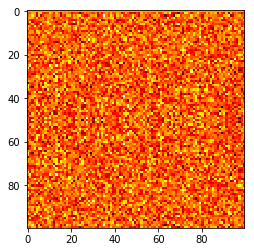

In [61]:
aa = np.mean(sig_mat_hc,axis=0)
plt.imshow(sig_mat_hc[3,:,:], cmap='hot', interpolation='nearest')
plt.show()


In [64]:
aaa = np.zeros([100,100])
for i in range(30):
    aaa += sig_mat_hc[i,:,:] / np.mean(sig_mat_hc[i,:,:],axis=0) 

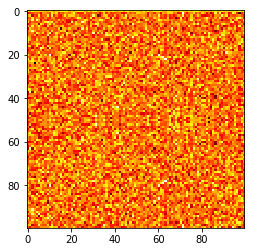

In [65]:
plt.imshow(aaa, cmap='hot', interpolation='nearest')
plt.show()